# Instancia 3: Región Metropolitana

#### Tesis Magister Ingeniería Industrial
#### Autor: Kathyana Pérez

In [1]:
# Cargo de librerias
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import median_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.ensemble import RandomForestRegressor
from datetime import datetime, timedelta 

In [2]:
# Cargo de librerias
import os
from keras.layers import Dense, Dropout, Flatten, Reshape, LSTM
from keras.models import Sequential
from keras.layers import Dense

In [3]:
# Función para generar prediccion
# Recibe: 
#   - datos: matriz de datos
#   - dias_media: cantidad de días tomados para realizar la predicción
#   - dias_generar: cantidad de días a predecir

def dias_extras(datos,dias_medias=30,dias_generar=20):
    aux = list(datos)           # Variable auxiliar 
    
    # Ciclo para calculo de promedio y predicción
    for dia in np.arange(dias_generar):
        calculo = list(aux[-dias_medias:])               # Calculo promedio
        aux.append(int(np.floor(np.mean(calculo))))      # Se agregan al array los días predichos
    return np.array(aux)

## I. Preprocesamiento Datos

##### Fuentes:
- Pacientes en UCI, Examenes PCR, Cantidad de camas, Defunciones; obtenidas del Github del Ministerio de ciencias, link: https://github.com/MinCiencia/Datos-COVID19


- Cuarentenas, obtenidas de Wikipedia: https://es.m.wikipedia.org/wiki/Confinamiento_por_la_pandemia_de_COVID-19_en_Chile

### A. Pacientes en UCI NO SE UTILIZA

In [4]:
# Datos de UCI, producto 8, obtenidos del github del ministerio de ciencias
arch_p8 = 'https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto8/UCI.csv' # Carga Link
df_uci = pd.read_csv(arch_p8)      # Lectura de datos
df_uci = df_uci.iloc[6][16:]        # Se selecciona solo la Región de Metropolitana

#Reordenamiento de los datos
df_uci = df_uci.to_frame().reset_index().rename(columns={'index': 'dates', 6:'hospitalizations'})


# Visualización del df_uci (dataframe unidad de cuidados intensivos)
print('Data Frame UCI Metropolitana\n', df_uci)

Data Frame UCI Metropolitana
           dates hospitalizations
0    2020-04-14              190
1    2020-04-15              198
2    2020-04-16              196
3    2020-04-17              202
4    2020-04-18              181
..          ...              ...
377  2021-04-26             1942
378  2021-04-27             1987
379  2021-04-28             1964
380  2021-04-29             1976
381  2021-04-30             1947

[382 rows x 2 columns]


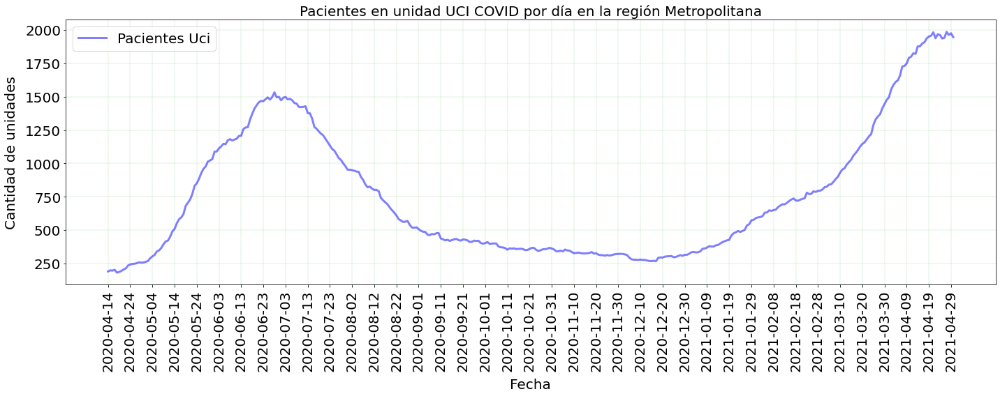

In [5]:
# Grafico imagen
plt.figure(figsize=(20,8))
plt.plot(df_uci.dates.values,df_uci.hospitalizations.values,linewidth=3, color = 'blue', alpha = 0.5, label = 'Pacientes Uci')
# plt.axvline(df_uci.dates.values[-1], label = 'Fecha de Hoy',linewidth=3, color = 'red')
plt.xticks(df_uci.dates.index[::10],df_uci.dates.values[::10],rotation=90,fontsize=20)
plt.yticks(fontsize=20)
plt.grid(color='green', ls = ':', lw = 0.3)
plt.xlabel('Fecha', labelpad = 10, fontsize=20)
plt.legend(fontsize=20)
plt.ylabel('Cantidad de unidades',labelpad = 10,fontsize=20)
plt.title("Pacientes en unidad UCI COVID por día en la región Metropolitana",fontsize=20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\uci_metropolitana.pdf')

### B. Examenes PCR

In [6]:
# Datos de PCR realizados, producto 7, obtenidos del github del ministerio de ciencias
arch_p7 = "https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto7/PCR.csv" # Carga link
pcr = pd.read_csv(arch_p7)    # Lectura de datos
# pcr = pcr.iloc[6][8:355]         # Se selecciona solo la Región Metropolitana
pcr = pcr.iloc[6][8:]         # Se selecciona solo la Región Metropolitana


#Reordenamiento de los datos
pcr = pcr.to_frame().reset_index().rename(columns={'index': 'fecha', 6:'pcr'})


# Indice de positividad, producto 55, obtenidos del github del ministerio de ciencias
arch_p55 = 'https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto55/Positividad_por_region.csv'
positividad = pd.read_csv(arch_p55) # Lectura de datos
                                    # Se selecciona solo la Región Metropolitana
positividad = positividad[positividad['Region'] == 'Metropolitana'].reset_index(drop = True).drop(['Region','Codigo region','region_residencia'], axis=1)
positividad = positividad[43:].reset_index(drop = True)


# Visualización de los datos
print('1. Data Frame PCR Metropolitana\n', pcr)
print('----\n2. Data Frame Positividad Metropolitana\n', positividad)

1. Data Frame PCR Metropolitana
           fecha    pcr
0    2020-04-14   1656
1    2020-04-15   2694
2    2020-04-16   4356
3    2020-04-17   3670
4    2020-04-18   2744
..          ...    ...
377  2021-04-26  22754
378  2021-04-27  10428
379  2021-04-28  12592
380  2021-04-29  23110
381  2021-04-30  21815

[382 rows x 2 columns]
----
2. Data Frame Positividad Metropolitana
           fecha  positividad
0    2020-04-14     0.113176
1    2020-04-15     0.117019
2    2020-04-16     0.120139
3    2020-04-17     0.124856
4    2020-04-18     0.121238
..          ...          ...
370  2021-04-19     0.121383
371  2021-04-20     0.122825
372  2021-04-21     0.124287
373  2021-04-22     0.125407
374  2021-04-23     0.124229

[375 rows x 2 columns]


In [7]:
# Unir Datos de positividad e info de los PCR
pcr_positivo = pcr.merge(positividad)

# Visualización de los datos
print('Data Frame Resultante Metropolitana\n', pcr_positivo)

Data Frame Resultante Metropolitana
           fecha    pcr  positividad
0    2020-04-14   1656     0.113176
1    2020-04-15   2694     0.117019
2    2020-04-16   4356     0.120139
3    2020-04-17   3670     0.124856
4    2020-04-18   2744     0.121238
..          ...    ...          ...
370  2021-04-19  24182     0.121383
371  2021-04-20  15395     0.122825
372  2021-04-21  14283     0.124287
373  2021-04-22  23596     0.125407
374  2021-04-23  23042     0.124229

[375 rows x 3 columns]


---
Ya que se tienen los dos DataFrame, se calcula la cantidad de positivos mediante una regla de 3 simples:


\begin{equation}  PCR _{positivos}  = PCR_{total} * \textit{Indice de positividad} \end{equation}

---

In [8]:
#  Calculo de PCR positivos
pcr_positivo["positivos"] = pcr_positivo["pcr"] * pcr_positivo["positividad"]

# Los valores Nan de la columna pcr_positivo["positivos"] seran '0', al igual que los valores Nan de la columna de los 
# pcr_positivo["pcr"]
pcr_positivo["positivos"] = pcr_positivo["positivos"].fillna(0).astype(int)
pcr_positivo["pcr"] = pcr_positivo["pcr"].fillna(0).astype(int)

# Visualización de los datos del DataFrame resultante
print('Data Frame Resultante Metropolitana\n', pcr_positivo)

Data Frame Resultante Metropolitana
           fecha    pcr  positividad  positivos
0    2020-04-14   1656     0.113176        187
1    2020-04-15   2694     0.117019        315
2    2020-04-16   4356     0.120139        523
3    2020-04-17   3670     0.124856        458
4    2020-04-18   2744     0.121238        332
..          ...    ...          ...        ...
370  2021-04-19  24182     0.121383       2935
371  2021-04-20  15395     0.122825       1890
372  2021-04-21  14283     0.124287       1775
373  2021-04-22  23596     0.125407       2959
374  2021-04-23  23042     0.124229       2862

[375 rows x 4 columns]


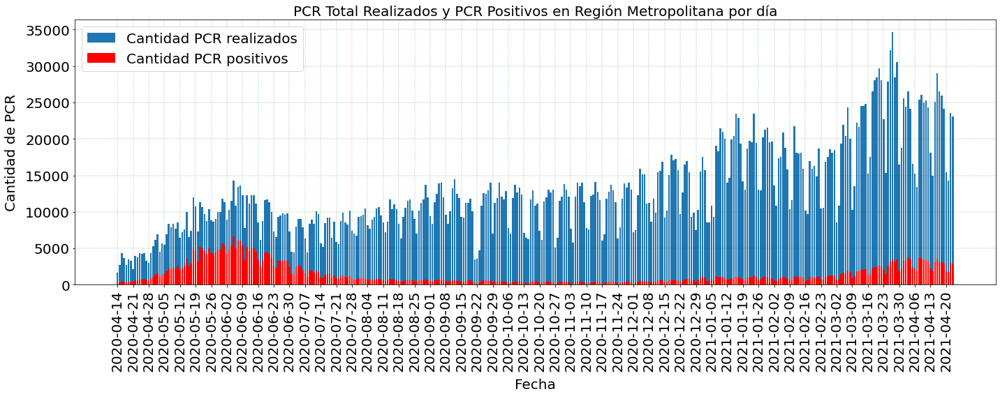

In [9]:
# Grafico imagen
plt.figure(figsize=(20,8))
plt.bar(pcr_positivo['fecha'], pcr_positivo['pcr'], label = 'Cantidad PCR realizados')
plt.bar(pcr_positivo['fecha'], pcr_positivo['positivos'], label = 'Cantidad PCR positivos', color = 'red')
plt.xticks(pcr_positivo['fecha'][::7],rotation=90, fontsize = 20)
plt.yticks(fontsize = 20)
plt.legend(fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.xlabel('Fecha',  labelpad = 10, fontsize = 20)
plt.ylabel('Cantidad de PCR',labelpad = 10, fontsize = 20)
plt.title('PCR Total Realizados y PCR Positivos en Región Metropolitana por día', fontsize = 20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\pcr_metropolitana.pdf')

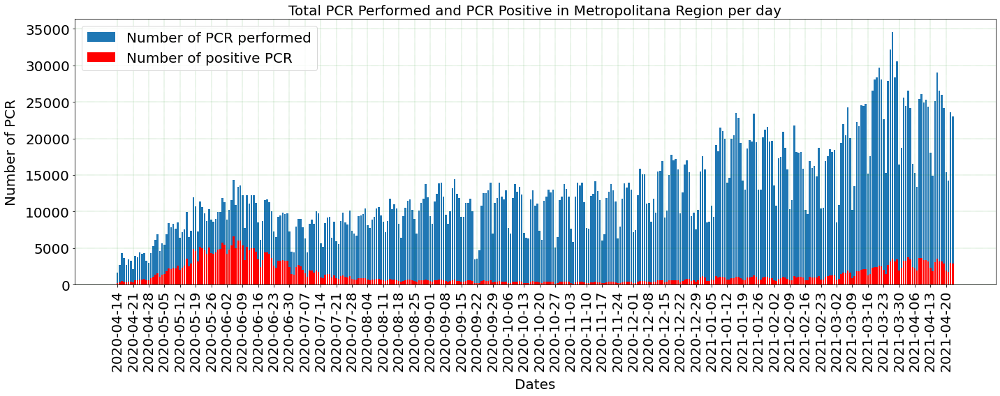

In [10]:
# Grafico imagen Ingles
plt.figure(figsize=(20,8))
plt.bar(pcr_positivo['fecha'], pcr_positivo['pcr'], label = 'Number of PCR performed')
plt.bar(pcr_positivo['fecha'], pcr_positivo['positivos'], label = 'Number of positive PCR', color = 'red')
plt.xticks(pcr_positivo['fecha'][::7],rotation=90, fontsize = 20)
plt.yticks(fontsize = 20)
plt.legend(fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.xlabel('Dates',  labelpad = 10, fontsize = 20)
plt.ylabel('Number of PCR',labelpad = 10, fontsize = 20)
plt.title('Total PCR Performed and PCR Positive in Metropolitana Region per day', fontsize = 20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\paper\pcr_ingles_metropolitana.pdf')


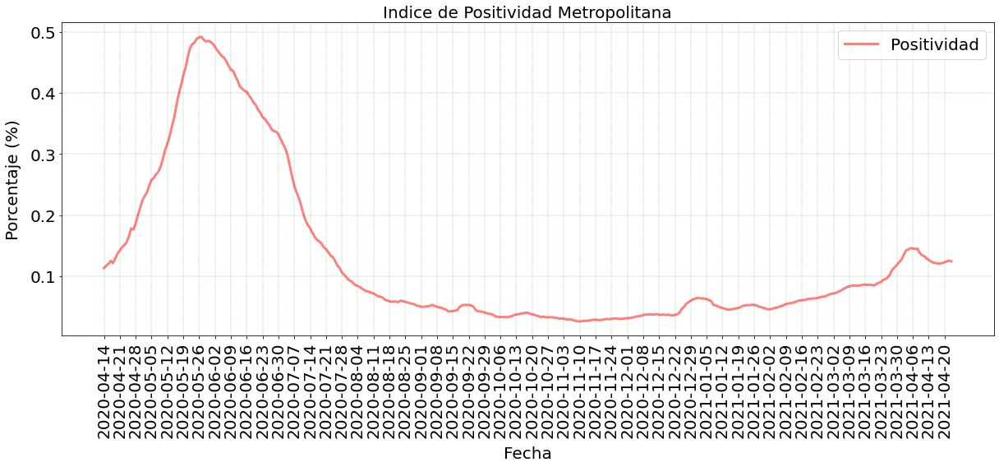

In [11]:
# Grafico positividad
plt.figure(figsize=(17,8))
plt.plot(pcr_positivo['fecha'], pcr_positivo['positividad'],color = 'red', linewidth = 3, alpha = 0.5, label = 'Positividad')
plt.xticks(pcr_positivo['fecha'][::7],rotation=90, fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.legend(fontsize = 20)
plt.xlabel('Fecha',  labelpad = 10, fontsize = 20)
plt.ylabel('Porcentaje (%)', labelpad = 10, fontsize = 20)
plt.title('Indice de Positividad Metropolitana', fontsize = 20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\positividad_metropolitana.pdf')

### C. Camas Disponibles

In [12]:
# Datos de Camas UCI, producto 58, obtenidos del github del ministerio de ciencias
arch_p58 = "https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto58/Camas_UCI_diarias.csv" # Carga link
camas = pd.read_csv(arch_p58) # Lectura de datos
fin = 349
# Se selecciona solo la Región Metropolitana
camas_covid        = camas.iloc[23][2:].to_frame().reset_index().rename(columns={'index': 'fecha', 23:'camas ocupadas covid'}) 
camas_no_covid     = camas.iloc[40][2:].to_frame().reset_index().rename(columns={'index': 'fecha', 40:'camas ocupadas no covid'})
camas_disponibles  = camas.iloc[6][2:].to_frame().reset_index().rename(columns={'index': 'fecha', 6:'total disponibles'})
camas_ocupadas     = camas.iloc[57][2:].to_frame().reset_index().rename(columns={'index': 'fecha', 57:'total camas ocupadas'})


# Visualización de los datos del DataFrame resultante
print('1. Camas UCI utilizadas por pacientes COVID-19 Metropolitana\n', camas_covid)
print('\n2. Camas UCI utilizadas por pacientes no COVID-19 Metropolitana\n', camas_no_covid)
print('\n3. Camas UCI disponibles Metropolitana\n', camas_disponibles)
print('\n4. Camas UCI total ocupadas Metropolitana\n', camas_ocupadas)

1. Camas UCI utilizadas por pacientes COVID-19 Metropolitana
           fecha camas ocupadas covid
0    2020-04-14                  198
1    2020-04-15                  196
2    2020-04-16                  202
3    2020-04-17                  181
4    2020-04-18                  186
..          ...                  ...
374  2021-04-23                 1969
375  2021-04-24                 1963
376  2021-04-25                 1937
377  2021-04-26                 1942
378  2021-04-27                 1987

[379 rows x 2 columns]

2. Camas UCI utilizadas por pacientes no COVID-19 Metropolitana
           fecha camas ocupadas no covid
0    2020-04-14                     298
1    2020-04-15                     314
2    2020-04-16                     317
3    2020-04-17                     340
4    2020-04-18                     341
..          ...                     ...
374  2021-04-23                     523
375  2021-04-24                     531
376  2021-04-25                     537
377 

In [13]:
# Para informe
camas1       = pd.concat([camas_disponibles['fecha'],camas_covid['camas ocupadas covid'],camas_no_covid['camas ocupadas no covid'],camas_disponibles['total disponibles']], axis=1, join="inner")
camas_quedan = camas1['total disponibles'] - (camas1['camas ocupadas covid'] + camas1['camas ocupadas no covid'])
camas2       = pd.concat([camas1, camas_quedan], axis=1, join="inner")
camas2       = camas2.rename(columns={'camas ocupadas covid': 'Covid','camas ocupadas no covid': 'no Covid',
                                      0: 'Disponibles','total disponibles':'Camas Habilitadas'})
print(camas2)

          fecha Covid no Covid Camas Habilitadas Disponibles
0    2020-04-14   198      298               793         297
1    2020-04-15   196      314               808         298
2    2020-04-16   202      317               808         289
3    2020-04-17   181      340               808         287
4    2020-04-18   186      341               818         291
..          ...   ...      ...               ...         ...
374  2021-04-23  1969      523              2586          94
375  2021-04-24  1963      531              2583          89
376  2021-04-25  1937      537              2582         108
377  2021-04-26  1942      550              2579          87
378  2021-04-27  1987      521              2590          82

[379 rows x 5 columns]


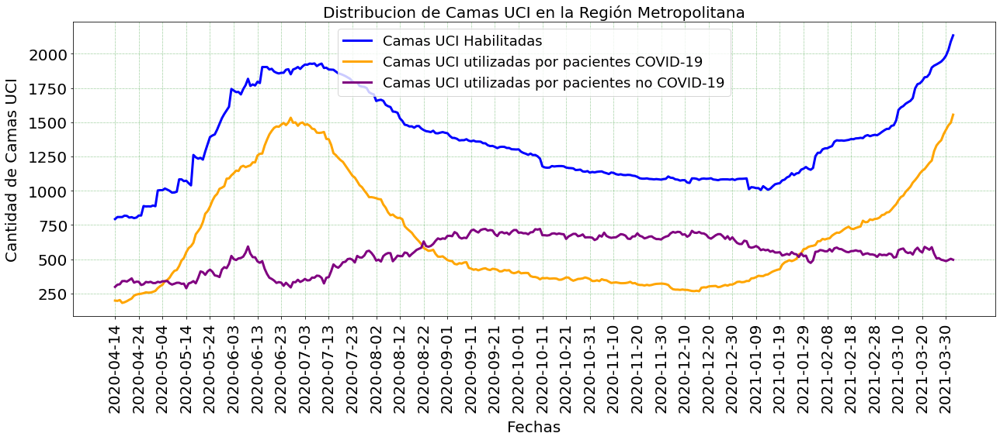

In [18]:
# Grafico imagen
plt.figure(figsize=(18,8))
plt.plot(camas_disponibles['fecha'].values[:354] , camas_disponibles['total disponibles'].values[:354],label = "Camas UCI Habilitadas",linewidth = 3, color = 'blue')
plt.plot(camas_covid['fecha'].values[:354] , camas_covid['camas ocupadas covid'].values[:354],label ='Camas UCI utilizadas por pacientes COVID-19',linewidth = 3, color = 'orange')
plt.plot(camas_no_covid['fecha'].values[:354] , camas_no_covid['camas ocupadas no covid'].values[:354],label ='Camas UCI utilizadas por pacientes no COVID-19',linewidth = 3, color = 'purple')
plt.xticks(camas_disponibles['fecha'].values[:354:10],rotation=90, fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.5)
plt.legend(fontsize = 18)
# plt.xlabel('Dates', labelpad = 10, fontsize = 20)
# plt.ylabel('Number of beds',labelpad = 10,fontsize = 20)
# plt.title('Distribution of ICU beds in the Biobío region', fontsize = 20)
plt.xlabel('Fechas', labelpad = 10, fontsize = 20)
plt.ylabel('Cantidad de Camas UCI',labelpad = 10,fontsize = 20)
plt.title('Distribucion de Camas UCI en la Región Metropolitana', fontsize = 20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\camas_metropolitana.pdf')

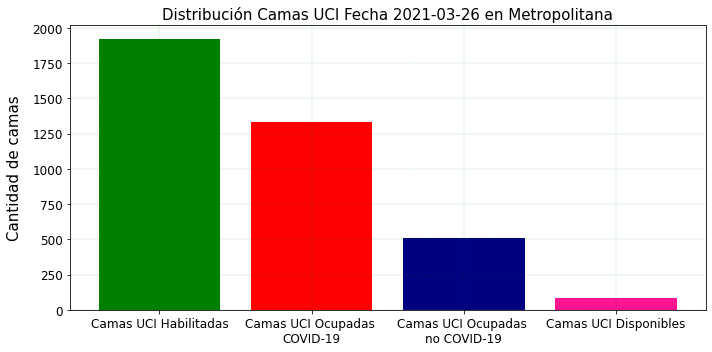

In [19]:
# Grafico Barras Camas
plt.figure(figsize=(10,5))
plt.bar('Camas UCI Habilitadas',camas2['Camas Habilitadas'].values[346], color ='green')
plt.bar('Camas UCI Ocupadas \nCOVID-19', camas_covid['camas ocupadas covid'].values[346], color = 'red')
plt.bar('Camas UCI Ocupadas \nno COVID-19', camas_no_covid['camas ocupadas no covid'].values[346], color = 'navy')
plt.bar('Camas UCI Disponibles',camas2['Disponibles'].values[346],color ='deeppink')

plt.grid(color='green', ls = ':', lw = 0.3)
plt.xlabel('', labelpad = 10, fontsize = 15)
plt.ylabel('Cantidad de camas', labelpad = 10,fontsize = 15)
plt.xticks (fontsize = 12)
plt.yticks (fontsize = 12)
plt.title('Distribución Camas UCI Fecha %s en Metropolitana' %camas_ocupadas['fecha'].values[346],fontsize = 15)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\camas_bar_metropolitana.pdf')

### D. Fallecidos 

In [20]:
# Datos de Defunciones, producto 14, obtenidos del github del ministerio de ciencias
arch_p14 = 'https://raw.githubusercontent.com/MinCiencia/Datos-COVID19/master/output/producto14/FallecidosCumulativo.csv' # Carga Link
defunciones = pd.read_csv(arch_p14)# Lectura de datos
                    
# Se selecciona solo la Región metropolitana 
df_fallecidos = defunciones[defunciones['Region'] == 'Metropolitana'].reset_index(drop=True).drop(['Region'], axis=1)

abril_14 = np.argwhere(df_fallecidos.T.index.values=="2020-04-14")[0][0]
df_fallecidos = df_fallecidos[df_fallecidos.columns[abril_14:]]
#Visualización
print('Fallecidos Acumulativos\n', df_fallecidos.T)

Fallecidos Acumulativos
                   0
2020-04-14     40.0
2020-04-15     41.0
2020-04-16     48.0
2020-04-17     51.0
2020-04-18     58.0
...             ...
2021-04-26  13961.0
2021-04-27  14003.0
2021-04-28  14054.0
2021-04-29  14105.0
2021-04-30  14150.0

[382 rows x 1 columns]


In [21]:
# Ya que el DataFrame contiene los casos acumulados se debe calcular los casos diarios, mediante la resta entre el día actual 
# menos el día anterior.

fallecidos = df_fallecidos.values[0]            # Se copian los datos de los fallecidos acumulativos por día
resultados = fallecidos[1:]-fallecidos[:-1]     # Resta de los días actuales - día anterior
resultados[resultados<0] = 0                    # En el caso que exista un valor negativo se hace 0
resultados = list(resultados)                   # Se transforman los datos a una lista
resultados.insert(0,0)                          # Insertamos los datos del primer día, ya que es el unico dato que no
                                                # se calcula como el anterior
fallecidos = pd.DataFrame()                     # Creacion del DataFrame que contendra los datos
fallecidos["fechas"] = df_fallecidos.columns    # Asignacion de fechas al nuevo DataFrame
fallecidos["fallecidos"] = np.array(resultados) # Asignacion de cantidad de fallecidos nuevo DataFrame

# Para grafica
df_fallecidos = df_fallecidos.T.reset_index().rename(columns={'index': 'fecha', 0:'total acumulados'})

# Visualización
print(fallecidos)

         fechas  fallecidos
0    2020-04-14         0.0
1    2020-04-15         1.0
2    2020-04-16         7.0
3    2020-04-17         3.0
4    2020-04-18         7.0
..          ...         ...
377  2021-04-26        42.0
378  2021-04-27        42.0
379  2021-04-28        51.0
380  2021-04-29        51.0
381  2021-04-30        45.0

[382 rows x 2 columns]


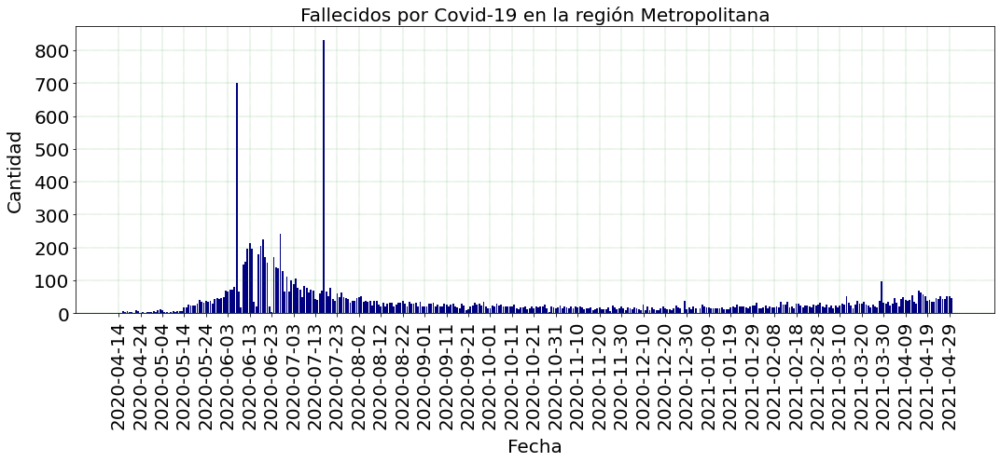

In [22]:
# Grafico imagen
plt.figure(figsize=(15,7))
plt.bar(fallecidos.fechas.values,fallecidos.fallecidos.values, color = 'navy')
plt.xticks(fallecidos.fechas.values[::10],rotation=90, fontsize = 20)
plt.yticks( fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.xlabel('Fecha', labelpad = 10, fontsize = 20)
plt.ylabel('Cantidad',labelpad = 10,fontsize = 20)
plt.title('Fallecidos por Covid-19 en la región Metropolitana', fontsize = 20)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\fallecidos_metropolitana.pdf')

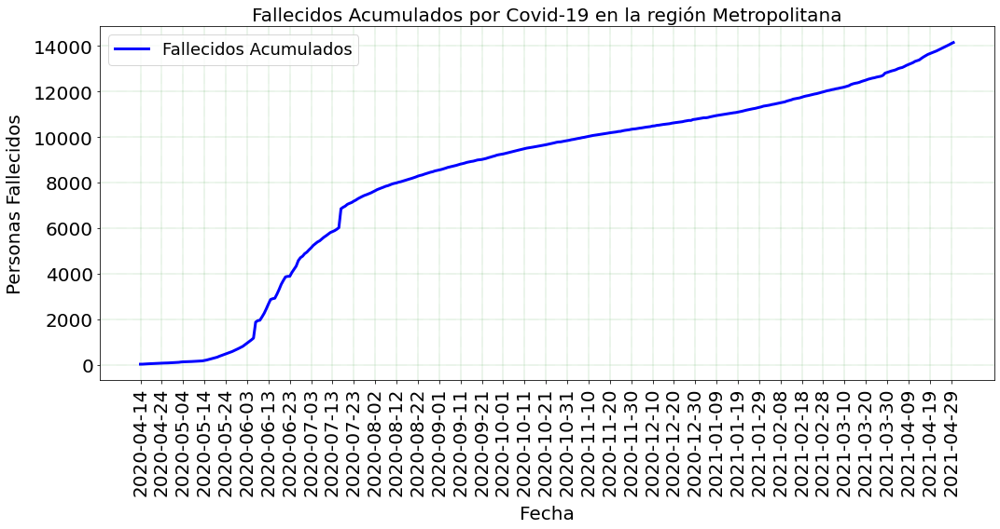

In [23]:
# Grafico imagen
plt.figure(figsize=(15,8))
plt.plot(df_fallecidos.fecha, df_fallecidos['total acumulados'].values, linewidth = 3, color = 'blue', label = 'Fallecidos Acumulados')
plt.xticks(fallecidos.fechas.values[::10],rotation=90,fontsize = 20 )
plt.yticks(fontsize = 20)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.xlabel('Fecha', labelpad = 10, fontsize = 20)
plt.ylabel('Personas Fallecidos',labelpad = 10,fontsize = 20)
plt.title('Fallecidos Acumulados por Covid-19 en la región Metropolitana', fontsize = 20)
plt.legend(fontsize = 18)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\fallecidos_acumulados_metropolitana.pdf')

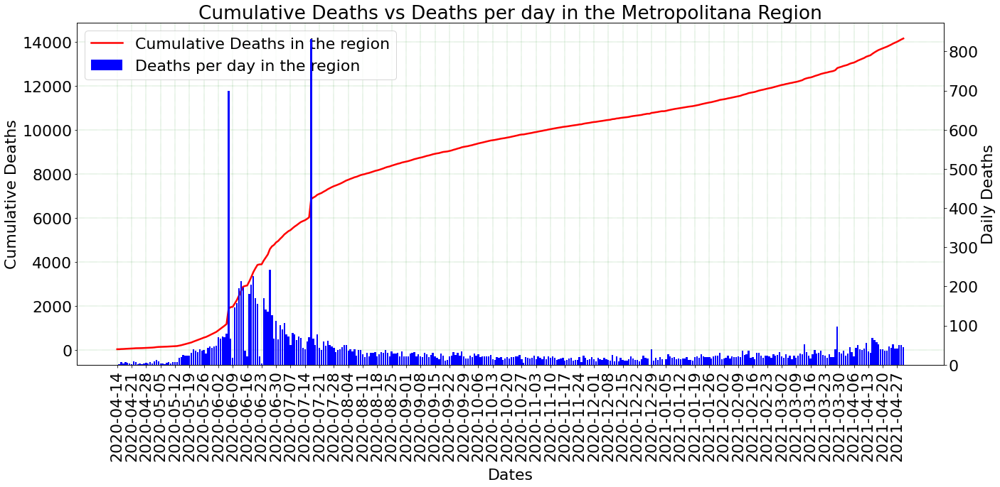

In [24]:
import matplotlib
matplotlib.rcParams["font.size"]=22
# Grafico
fig, ax1 = plt.subplots(figsize=(20,10))

# Lado izquierdo
ax1.set_xlabel('Dates', labelpad = 10)
ax1.set_ylabel('Cumulative Deaths')
ax1.plot(df_fallecidos.fecha.values, df_fallecidos['total acumulados'].values, linewidth = 2.5, color = 'red', label = 'Cumulative Deaths in the region')
ax1.tick_params(axis='y')
ax1.axes.set_xticks(np.arange(len(fallecidos.fechas.values))[::7])
ax1.set_xticklabels(fallecidos.fechas.values[::7],rotation=90)


ax1.legend(fontsize = 20)

#Lado Derecho
ax2 = ax1.twinx()  
ax2.axes.set_xticks(np.arange(len(fallecidos.fechas.values))[::7])
ax2.set_xticklabels(fallecidos.fechas.values[::7],rotation=90,)
# ax2.set_ylabel('Defunciones Diarias')
ax2.set_ylabel('Daily Deaths')
ax2.bar(fallecidos.fechas.values,fallecidos.fallecidos.values, color = 'blue',label = 'Deaths per day in the region')
ax2.tick_params(axis='y')
# plt.xticks(np.arange(len(cuarentena.fechas.values[::10])),cuarentena.fechas.values[::10],rotation=90)
ax1.grid(color='green', ls = ':', lw = 0.4)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
# plt.xticks(cuarentena.fechas.values[::10],rotation=45)
# plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Cumulative Deaths vs Deaths per day in the Metropolitana Region')
# plt.title('Defunciones acumuladas vs Defunciones por día en la Región Metropolitana')
# ax2.legend(loc=1)

# # added these three lines

h1,l1 = ax1.get_legend_handles_labels()
h2,l2 = ax2.get_legend_handles_labels()


p = ax1.legend(h1+h2, l1+l2, loc=0)

# plt.show()
plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\paper\fallecidos_versus_metropolitana.pdf')


### E. Cuarentena 

In [25]:
# Datos cargado wikipedia
# Revisar codigo computo cuarentena
wiki = r'E:\Udec\Magister\Tesis\Modelo\Modelo Kathyanistico\cuarentena_metropolitana.csv'
cuarentena = pd.read_csv(wiki).drop(['Unnamed: 0'], axis = 1).rename(columns={'por_cuarenta': "Porcentaje Cuarentena"})
cuarentena = cuarentena[9:].reset_index(drop=True)

# Visualizacion de DataFrame
print('Porcentaje Cuarentena Metropolitana\n',cuarentena)

Porcentaje Cuarentena Metropolitana
          fechas  por_cuarentena
0    2020-05-03        7.547170
1    2020-05-04        7.547170
2    2020-05-05       13.207547
3    2020-05-06       13.207547
4    2020-05-07       13.207547
..          ...             ...
467  2021-03-08        0.000000
468  2021-03-09        0.000000
469  2021-03-10        0.000000
470  2021-03-11        0.000000
471  2021-03-12        0.000000

[472 rows x 2 columns]


In [26]:
archivo = r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\cuarentena1_metropolitana.csv'
cuarentenas = pd.read_csv(archivo)
# Thab total de habitantes, Phab % habitantes
cuarentenas = cuarentenas.rename(columns={'Unnamed: 0': "fechas"})
cuarentenas = cuarentenas[['fechas','Phab']]
cuarentenas

,fechas,Phab
0,2020-04-25,1.409906
1,2020-04-26,1.409906
2,2020-04-27,1.409906
3,2020-04-28,1.409906
4,2020-04-29,1.409906
...,...,...
358,2021-04-18,97.717470
359,2021-04-19,97.717470
360,2021-04-20,97.717470
361,2021-04-21,97.717470


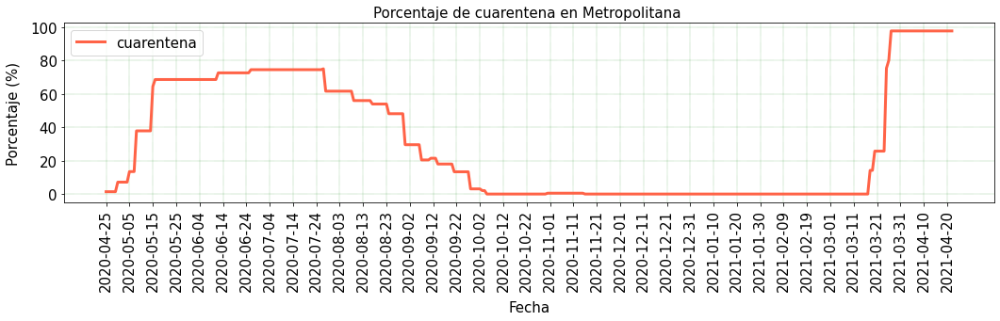

In [27]:
# Grafico imagen
matplotlib.rcParams["font.size"]=15
plt.figure(figsize=(15,5))
plt.plot(cuarentenas['fechas'].values, cuarentenas['Phab'].values, linewidth = 3, color = 'tomato', label = 'cuarentena')
plt.xticks(cuarentenas.fechas.values[::10],rotation=90)
plt.grid(color='green', ls = ':', lw = 0.4)
plt.xlabel('Fecha', labelpad = 10, fontsize = 15)
plt.ylabel('Porcentaje (%)',labelpad = 10,fontsize = 15)
plt.legend()
plt.title('Porcentaje de cuarentena en Metropolitana ', fontsize = 15)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\cuarentena_metropolitana.pdf')

### F. Resumen Figuras

In [28]:
# cuarentenas = cuarentenas[:336]
fallecidos = fallecidos[:365]

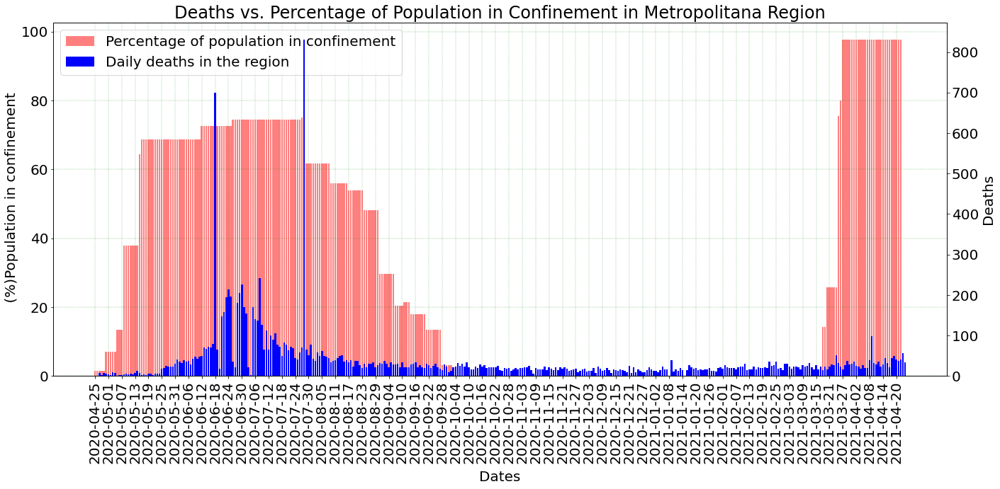

In [29]:
import matplotlib
matplotlib.rcParams["font.size"]=20
# Grafico
fig, ax1 = plt.subplots(figsize=(20,10))

# Lado izquierdo
ax1.set_xlabel('Dates', labelpad = 10)
ax1.set_ylabel(' (%)Population in confinement')
ax1.bar(cuarentenas['fechas'].values, cuarentenas['Phab'].values, linewidth = 2, color = 'red', alpha=0.5,     label = 'Percentage of population in confinement')

ax1.tick_params(axis='y')
ax1.axes.set_xticks(np.arange(len(cuarentenas.fechas.values))[::6])
ax1.set_xticklabels(cuarentenas.fechas.values[::6],rotation=90)
# ax1.legend()

#Lado Derecho
ax2 = ax1.twinx()  
ax2.axes.set_xticks(np.arange(len(cuarentenas.fechas.values))[::6])
ax2.set_xticklabels(cuarentenas.fechas.values[::6],rotation=90)
ax2.set_ylabel('Deaths')
ax2.bar(fallecidos.fechas.values,fallecidos.fallecidos.values, color = 'blue' ,
        label = 'Daily deaths in the region')
ax2.tick_params(axis='y')
# plt.xticks(np.arange(len(cuarentena.fechas.values[::10])),cuarentena.fechas.values[::10],rotation=90)
ax1.grid(color='green', ls = ':', lw = 0.4)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
# plt.xticks(cuarentena.fechas.values[::10],rotation=45)
# plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Deaths vs. Percentage of Population in Confinement in Metropolitana Region')
# ax2.legend(loc=2)


h1,l1 = ax1.get_legend_handles_labels()
h2,l2 = ax2.get_legend_handles_labels()

p = ax1.legend(h1+h2, l1+l2, loc=0)

plt.tight_layout()

plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\paper\cuarentena_vs_fallecido_metropolitana.pdf')

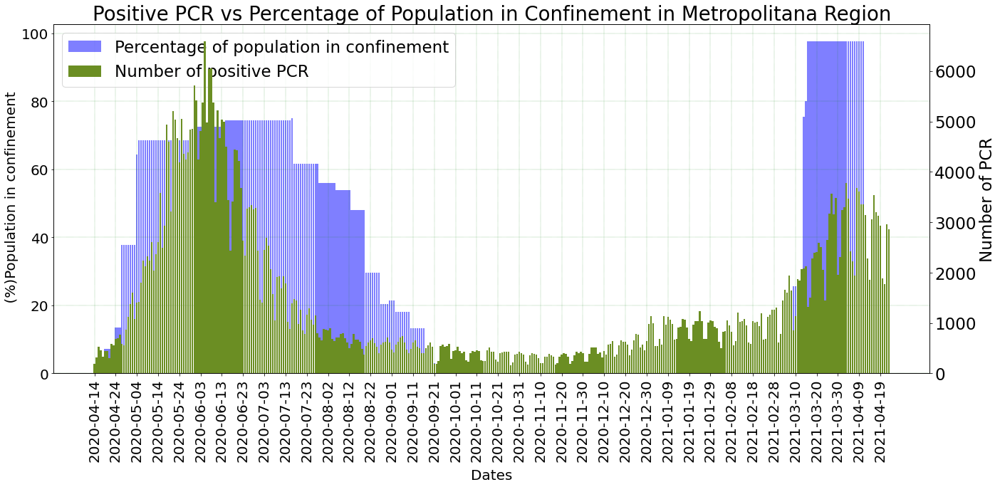

In [30]:
fig, ax1 = plt.subplots(figsize=(20,10))
matplotlib.rcParams["font.size"]=23
# Lado izquierdo
ax1.set_xlabel('Dates', labelpad = 10)
ax1.set_ylabel(' (%)Population in confinement')
# ax1.axvline(vacaciones_in.iloc[0], label = 'Inicio permiso vacaciones',linewidth=3, color = 'blue')
# ax1.plot(cuarentena['fechas'].values, cuarentena['Porcentaje Cuarentena'].values, linewidth = 3, color = 'red', 
#          label = 'Porcentaje de Cantidad de Comunas en Cuarentena')
ax1.bar(cuarentenas['fechas'].values, cuarentenas['Phab'].values, linewidth = 2, color = 'blue', alpha=0.5, 
         label = 'Percentage of population in confinement')
ax1.tick_params(axis='y')
ax1.axes.set_xticks(np.arange(len(cuarentenas.fechas.values))[::10])
ax1.set_xticklabels(cuarentenas.fechas.values[::10],rotation=90)
# ax1.legend()

#Lado Derecho
ax2 = ax1.twinx()  

# ax2.axes.set_xticks(np.arange(len(cuad_pcr.fechas.values))[::espaciado])
# ax2.set_xticklabels(cuad_pcr.fechas.values[::espaciado],rotation=90)
ax2.axes.set_xticks(np.arange(len(pcr_positivo['fecha'].values))[::10])
ax2.set_xticklabels(pcr_positivo['fecha'].values[::10],rotation=90)
ax2.set_ylabel('Number of PCR')
ax2.bar(pcr_positivo['fecha'], pcr_positivo['positivos'], label = 'Number of positive PCR', color = 'olivedrab')
ax2.tick_params(axis='y')
ax1.grid(color='green', ls = ':', lw = 0.4)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Positive PCR vs Percentage of Population in Confinement in Metropolitana Region')
h1,l1 = ax1.get_legend_handles_labels()
h2,l2 = ax2.get_legend_handles_labels()

p = ax1.legend(h1+h2, l1+l2, loc=0)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\paper\cuarentena_vs_pcr_metropolitana.pdf')

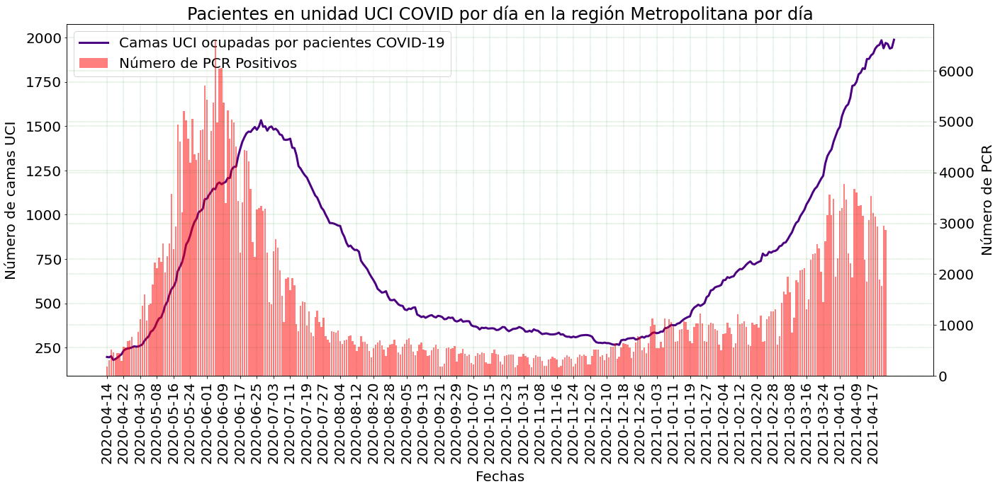

In [33]:
# Grafico
fig, ax1 = plt.subplots(figsize=(20,10))
matplotlib.rcParams["font.size"]=20

# Lado izquierdo
ax1.plot(camas_covid['fecha'].values,camas_covid['camas ocupadas covid'].values,linewidth=3, color = 'indigo', label = 'Camas UCI ocupadas por pacientes COVID-19')
# ax1.axvline(vacaciones_in.iloc[0], label = 'Inicio permiso vacaciones',linewidth=3, color = 'blue')
# ax1.axvline(vacaciones_fin.iloc[0], label = 'Fin permiso vacaciones',linewidth=3, color = 'black')
ax1.axes.set_xticks(np.arange(len(camas_covid['fecha'].values))[::10])
ax1.set_xticklabels(camas_covid['fecha'].values[::10],rotation=90)
# ax1.grid(color='green', ls = ':', lw = 0.4)
ax1.set_xlabel('Fechas', labelpad = 10)
ax1.set_ylabel('Número de camas UCI',labelpad = 10)
ax1.legend(loc=2)
# ax1.title.set_text("Pacientes en unidad UCI COVID por día en la región del Biobio")


#Lado Derecho
ax2 = ax1.twinx()  
# ax2.bar(pcr_positivo['fecha'], pcr_positivo['pcr'], label = 'Cantidad PCR realizados', alpha = 0.5)
ax2.bar(pcr_positivo['fecha'].values, pcr_positivo['positivos'].values, label = 'Número de PCR Positivos', color = 'red', alpha = 0.5)
ax2.axes.set_xticks(np.arange(len(pcr_positivo['fecha'].values))[::8])
ax2.set_xticklabels(pcr_positivo['fecha'].values[::8],rotation=90)
ax1.grid(color='green', ls = ':', lw = 0.4)
ax2.set_xlabel('Fechas',  labelpad = 10)
ax2.set_ylabel('Número de PCR',labelpad = 10)
ax2.grid(color='green', ls = ':', lw = 0.4)

plt.title('Pacientes en unidad UCI COVID por día en la región Metropolitana por día')

h1,l1 = ax1.get_legend_handles_labels()
h2,l2 = ax2.get_legend_handles_labels()

p = ax1.legend(h1+h2, l1+l2, loc=0)


plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\uci_vs_pcr_metropolitana.pdf')

## II. Modelos


In [29]:
# Iniciamos semilla, para generar los mismos datos aleatorios para cada ejecucion
seed= 42

### A. Visualizacion de datos

In [34]:
# Carga de datos y ajuste de nombre de columnas
pcr_positivo       = pcr_positivo.rename({"fecha": "fechas"},axis=1) 
# df_uci             = df_uci.rename({"dates": "fechas", "hospitalizations":"hospitalizaciones"},axis=1)
camas_disponibles  = camas_disponibles.rename({"fecha": "fechas"},axis=1)
camas_usadas       = camas_covid.rename({"fecha": "fechas"},axis=1)


# Union de datos para juntar todo en un DataFrame
datos = pd.merge(camas_disponibles,camas_usadas)
datos = pd.merge(pd.merge(pcr_positivo,datos),fallecidos)
datos = pd.merge(datos,cuarentenas)

datos

,fechas,pcr,positividad,positivos,total disponibles,camas ocupadas covid,fallecidos,Phab
0,2020-04-25,4218,0.164900,695,819,248,3.0,1.409906
1,2020-04-26,4313,0.178016,767,888,252,2.0,1.409906
2,2020-04-27,3289,0.176022,578,885,258,4.0,1.409906
3,2020-04-28,2975,0.186237,554,886,256,5.0,1.409906
4,2020-04-29,4349,0.199817,869,885,257,4.0,1.409906
...,...,...,...,...,...,...,...,...
349,2021-04-09,26056,0.138461,3607,2307,1750,40.0,97.717470
350,2021-04-10,24980,0.134028,3348,2321,1792,37.0,97.717470
351,2021-04-11,25269,0.132961,3359,2330,1801,41.0,97.717470
352,2021-04-12,24328,0.129242,3144,2339,1826,56.0,97.717470


In [31]:
# object a enteros
# datos['hospitalizaciones']= datos['hospitalizaciones'].astype(int)
datos['total disponibles']= datos['total disponibles'].astype(int)
datos['camas ocupadas covid']= datos['camas ocupadas covid'].astype(int)
datos = datos.drop(['positividad'], axis=1)

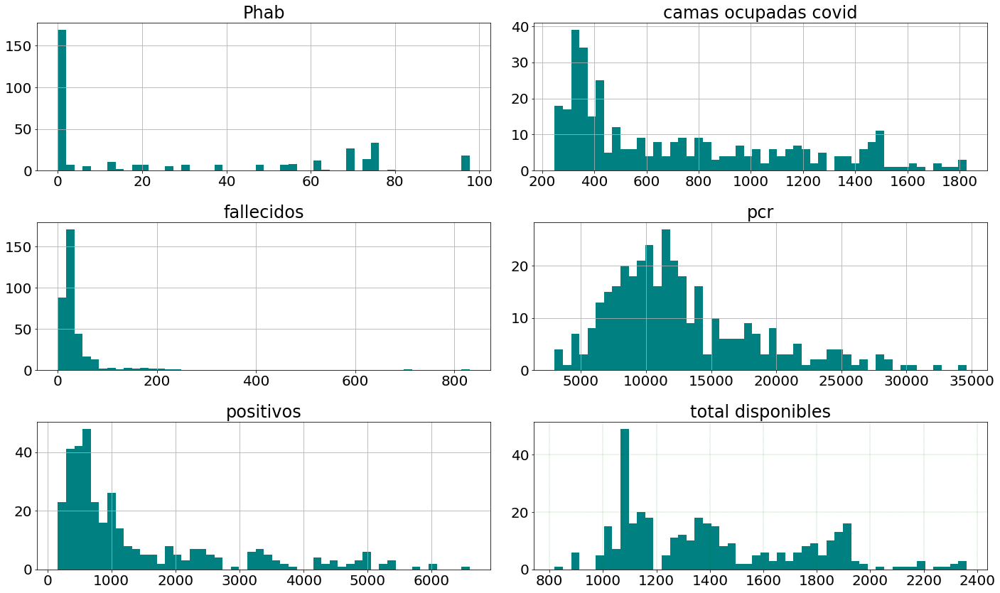

In [32]:
# Histograma
datos.hist(bins=50, figsize=(20,12), color = 'teal' )
matplotlib.rcParams["font.size"]= 20
plt.grid(color='green', ls = ':', lw = 0.4)
# plt.suptitle('Histogramas Biobío')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\histogramas_metropolitana.pdf')

In [33]:
# Matriz de datos
datos1 = datos.rename({"pcr": "PCR realizados [x1]","positivos": "Positivos [x2]","total disponibles": "Total camas [x3]",
                      'camas ocupadas covid': "Camas UCI COVID-19 [y]" , "fallecidos" : "Fallecidos [x4]",
                       "Phab": "Porcentaje Población en Confinamiento [x5]" },axis=1)
datos1 = datos1[["fechas","PCR realizados [x1]", "Positivos [x2]","Total camas [x3]" ,"Fallecidos [x4]", 
                  "Porcentaje Población en Confinamiento [x5]","Camas UCI COVID-19 [y]"]]

# Visualizacion de DataFrame
print('Matriz de Datos para Región de Metropolitana\n')
datos1

Matriz de Datos para Región de Metropolitana



,fechas,PCR realizados [x1],Positivos [x2],Total camas [x3],Fallecidos [x4],Porcentaje Población en Confinamiento [x5],Camas UCI COVID-19 [y]
0,2020-04-25,4218,695,819,3.0,1.409906,248
1,2020-04-26,4313,767,888,2.0,1.409906,252
2,2020-04-27,3289,578,885,4.0,1.409906,258
3,2020-04-28,2975,554,886,5.0,1.409906,256
4,2020-04-29,4349,869,885,4.0,1.409906,257
...,...,...,...,...,...,...,...
349,2021-04-09,26056,3607,2307,40.0,97.717470,1750
350,2021-04-10,24980,3348,2321,37.0,97.717470,1792
351,2021-04-11,25269,3359,2330,41.0,97.717470,1801
352,2021-04-12,24328,3144,2339,56.0,97.717470,1826


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002A974F7F488>,
      dtype=object)

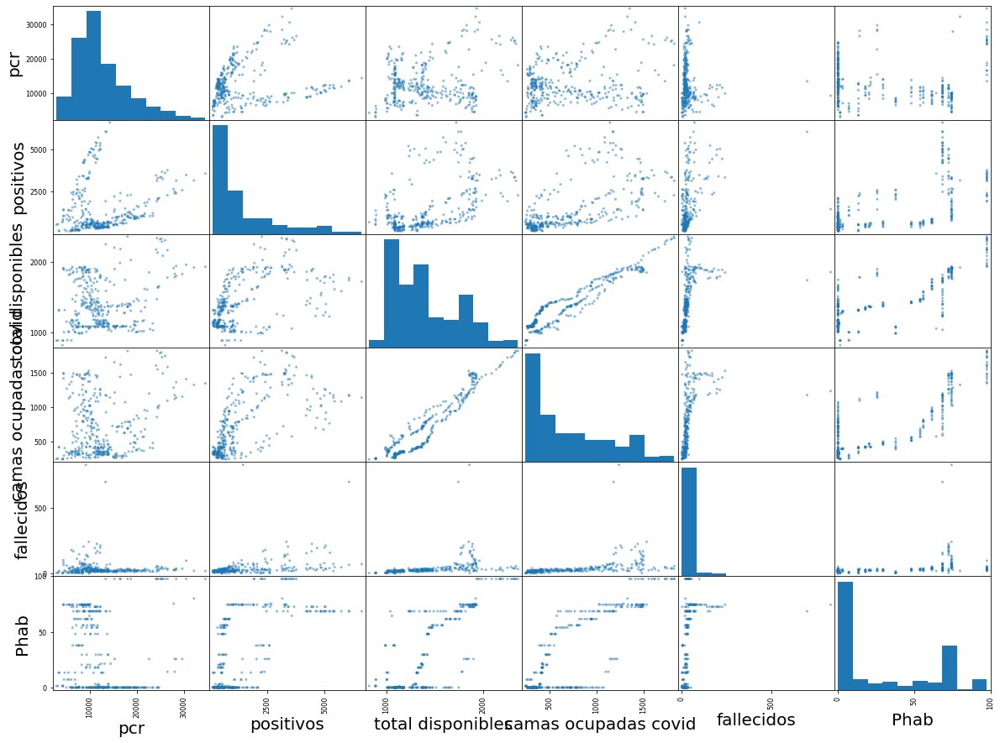

In [34]:
#Scatter Datos
atributos = ['pcr', 'positivos','total disponibles','camas ocupadas covid','fallecidos', 'Phab']
scatter_matrix(datos[atributos], figsize=(20, 15))
# save_fig("scatter_matrix_plot")

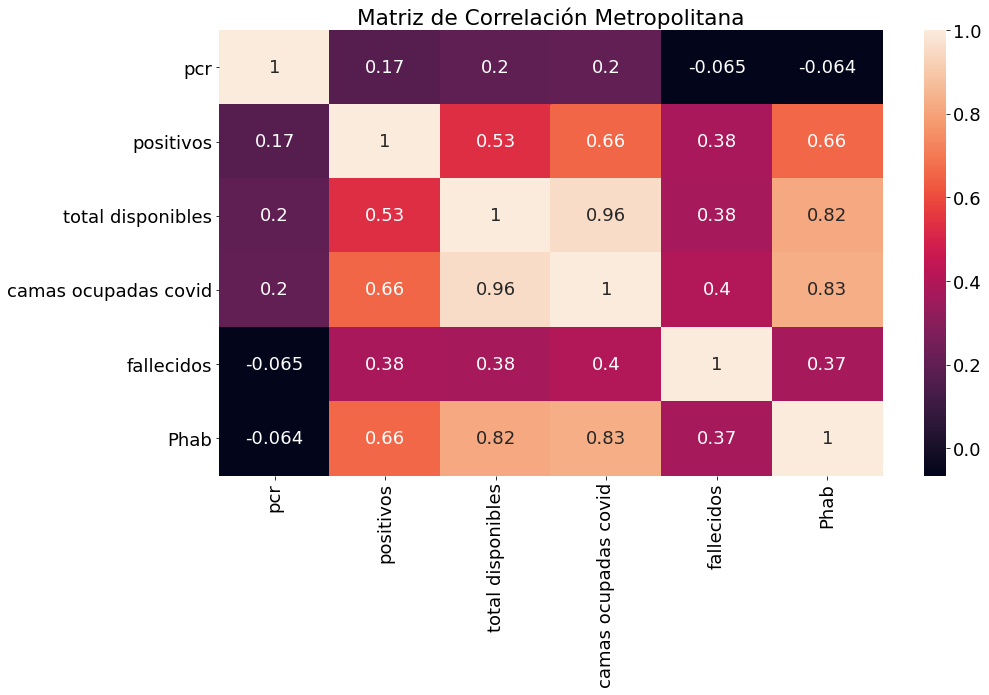

In [35]:
# Matriz Correlacion
import seaborn as sns 
matplotlib.rcParams["font.size"]= 18
correlacion = datos[atributos].corr()
plt.figure(figsize=(15,10))
plt.title('Matriz de Correlación Metropolitana')
sns.heatmap(correlacion, annot =True)

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\correlacion_metropolitana.pdf')

In [36]:
# Descripcion de datos
datos.describe()

,pcr,positivos,total disponibles,camas ocupadas covid,fallecidos,Phab
count,354.000000,354.000000,354.000000,354.000000,354.000000,354.000000
mean,12674.680791,1421.615819,1407.471751,716.822034,37.485876,28.926462
std,5691.532723,1386.833900,339.706431,422.336358,65.751580,33.877634
min,2975.000000,165.000000,819.000000,248.000000,0.000000,0.000000
25%,8695.250000,499.250000,1111.000000,358.000000,17.000000,0.000000
50%,11514.500000,808.500000,1352.500000,566.000000,22.500000,7.135982
75%,15324.250000,1936.250000,1696.250000,1025.000000,35.000000,68.616551
max,34614.000000,6593.000000,2360.000000,1826.000000,831.000000,97.717470


### B. Proyección

In [37]:
datos_grandes = datos.drop(["fechas"],axis=1).apply(dias_extras)
fechas = datos.fechas.values

fecha_base = datetime.strptime(fechas[-1], "%Y-%m-%d")
fechas_generadas = [(fecha_base + timedelta(days = int(dia))).strftime("%Y-%m-%d")  for dia in np.arange(1,20+1)]
fechas = np.concatenate([fechas,fechas_generadas])

datos_grandes["fechas"] = fechas
datos = datos_grandes.copy()

### C. Modelos

In [38]:
#Separamos caracteristicas de variables que se predeciran. 
# Se separo en x e y, "y" corresponde a la cantidad de hospitalizaciones predichas
y = datos['camas ocupadas covid'].values
X = datos.drop(['camas ocupadas covid',"fechas"],axis=1).values
seed = 42

In [39]:
from sklearn.preprocessing import Normalizer
X = Normalizer().fit_transform(X)

In [40]:
# se dividen los datos en conjunto de entrenamiento y de test
x_train1, x_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.33, random_state=seed)

In [41]:
# Visualización de los Datos
# print('Datos para  Región Metropolitana\n')
# print('1. X Entrenamiento:\n', X_train)
# print('\n2. X Test:\n', X_test)
# print('\n3. Y Entrenamiento:\n', y_train)
# print('\n4. Y Test:\n', y_test)

#### A. Árbol de regresion

In [42]:
# Calculo de Arbol de Regresión
tree_reg = RandomForestRegressor(n_estimators = 10, random_state=42).fit(x_train1, y_train1)

# Obtiene la prediccion
y_pred1 = tree_reg .predict(x_test1)

In [43]:
# Visualización de Metricas resultantes
print('Resultado Metricas del Árbol de Regresión Región de Metropolitana')
print("- r2_score", r2_score(y_test1,y_pred1))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test1,y_pred1)) 
print("- mean_squared_error", mean_squared_error(y_test1,y_pred1))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test1,y_pred1))

print('\nResultado Metricas del Árbol de Regresión Región del Biobío')
print("{:.4f}".format(r2_score(y_test1,y_pred1)) )   #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test1,y_pred1))) 
print("{:.4f}".format(mean_squared_error(y_test1,y_pred1)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test1,y_pred1)))

Resultado Metricas del Árbol de Regresión Región de Metropolitana
- r2_score 0.8484835774055361
- mean_absolute_error 114.7991935483871
- mean_squared_error 34862.76072580645
- mean_absolute_percentage_error 0.19815269416638745

Resultado Metricas del Árbol de Regresión Región del Biobío
0.8485
114.7992
34862.7607
0.1982


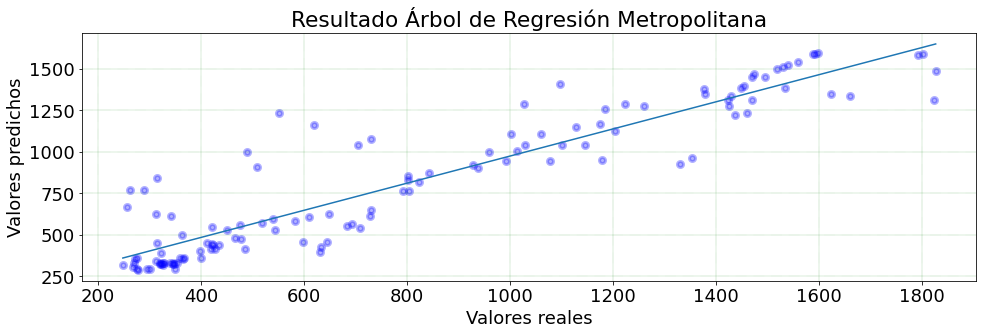

In [44]:
# Grafico Ajuste
plt.figure(figsize=(14,5))
plt.scatter(y_test1,y_pred1, alpha = 0.3,  color = 'blue', linewidth = 3)
plt.plot(np.unique(y_test1), np.poly1d(np.polyfit(y_test1, y_pred1, 1))(np.unique(y_test1)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Resultado Árbol de Regresión Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\arbol_regresion_metropolitana.pdf')

#### B. Regresión Lineal

In [45]:
# Realiza la regresion lineal
reg = LinearRegression(n_jobs=-1).fit(x_train1, y_train1) # n_jobs=-1 utiliza todos los nucleos

# Obtiene la prediccion
y_pred1 = reg.predict(x_test1)

In [46]:
# Visualización de Metricas resultantes
print('Resultado Metricas de Regresion Lineal Región Metropolitana')
print("- r2_score", r2_score(y_test1,y_pred1))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test1,y_pred1)) 
print("- mean_squared_error", mean_squared_error(y_test1,y_pred1))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test1,y_pred1))

print("{:.4f}".format(r2_score(y_test1,y_pred1)) )   #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test1,y_pred1))) 
print("{:.4f}".format(mean_squared_error(y_test1,y_pred1)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test1,y_pred1)))

Resultado Metricas de Regresion Lineal Región Metropolitana
- r2_score 0.5428491224970993
- mean_absolute_error 254.6795568349313
- mean_squared_error 105186.89251681432
- mean_absolute_percentage_error 0.40551801519796743
0.5428
254.6796
105186.8925
0.4055


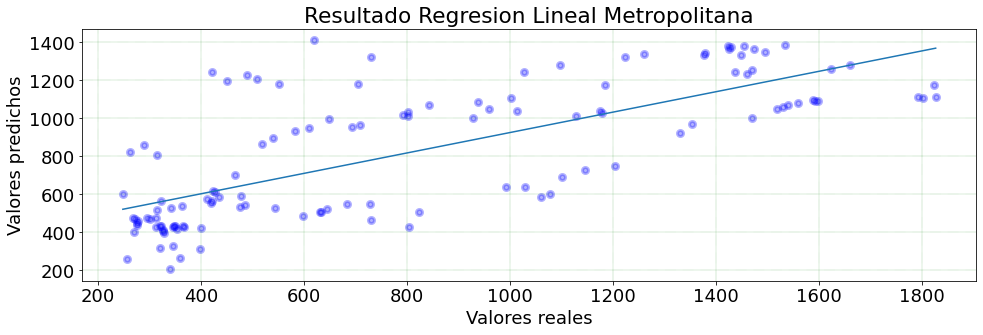

In [47]:
# Grafico Ajuste
plt.figure(figsize=(14,5))
plt.scatter(y_test1,y_pred1, alpha = 0.3, color = 'blue', linewidth = 3)
plt.plot(np.unique(y_test1), np.poly1d(np.polyfit(y_test1, y_pred1, 1))(np.unique(y_test1)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Resultado Regresion Lineal Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\regresion_lineal_metropolitana.pdf')

#### C. Elastic Net

In [48]:
# Calculo Elastic Net
regr = ElasticNet(random_state=seed).fit(x_train1, y_train1)

# Obtiene la prediccion
y_pred1 = regr.predict(x_test1)

In [49]:
# Visualización de Metricas resultantes
print('Resultado Elastic Net Región Metropolitana')
print("- r2_score", r2_score(y_test1,y_pred1))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test1,y_pred1)) 
print("- mean_squared_error", mean_squared_error(y_test1,y_pred1))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test1,y_pred1))

print("{:.4f}".format(r2_score(y_test1,y_pred1)) )   #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test1,y_pred1))) 
print("{:.4f}".format(mean_squared_error(y_test1,y_pred1)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test1,y_pred1)))

Resultado Elastic Net Región Metropolitana
- r2_score -0.015354241406893454
- mean_absolute_error 411.5978070970026
- mean_squared_error 233625.18309216358
- mean_absolute_percentage_error 0.6580129633766508
-0.0154
411.5978
233625.1831
0.6580


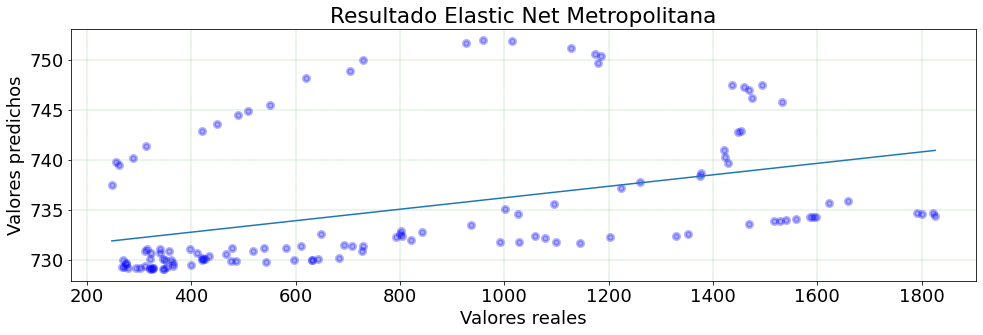

In [50]:
# Grafico Ajuste
plt.figure(figsize=(14,5))
plt.scatter(y_test1,y_pred1, alpha = 0.3, color = 'blue', linewidth = 3)
plt.plot(np.unique(y_test1), np.poly1d(np.polyfit(y_test1, y_pred1, 1))(np.unique(y_test1)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Resultado Elastic Net Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\elastic_net_metropolitana.pdf')

#### D. Red Neuronal

In [51]:
# Calculo red

mlp = MLPRegressor(hidden_layer_sizes=3,random_state=seed, max_iter=100000).fit(x_train1, y_train1)

# Obtiene la prediccion
y_pred1 = mlp.predict(x_test1)
y_pred2 = mlp.predict(x_train1)

In [52]:
# Visualización de Metricas resultantes
print('Resultado Red Neuronal Región Metropolitana')
print("- r2_score", r2_score(y_test1,y_pred1))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test1,y_pred1)) 
print("- mean_squared_error", mean_squared_error(y_test1,y_pred1))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test1,y_pred1))

print("{:.4f}".format(r2_score(y_test1,y_pred1)) )   #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test1,y_pred1))) 
print("{:.4f}".format(mean_squared_error(y_test1,y_pred1)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test1,y_pred1)))

Resultado Red Neuronal Región Metropolitana
- r2_score 0.17748231861612151
- mean_absolute_error 351.11830595710006
- mean_squared_error 189254.97730091607
- mean_absolute_percentage_error 0.5528746170960349
0.1775
351.1183
189254.9773
0.5529


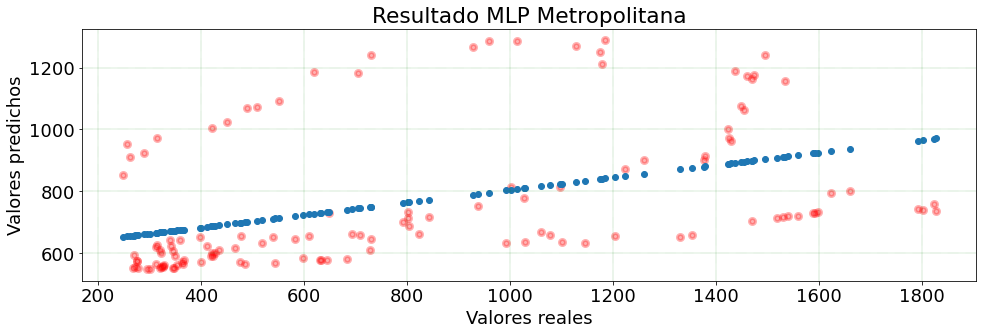

In [53]:
# Grafico Ajuste
plt.figure(figsize=(14,5))
plt.scatter(y_test1,y_pred1, alpha = 0.3, color = 'red', linewidth = 3)
plt.scatter(np.unique(y_test1), np.poly1d(np.polyfit(y_test1, y_pred1, 1))(np.unique(y_test1)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Resultado MLP Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\mlp_metropolitana.pdf')

In [54]:
# Validación Cruzada
from sklearn.model_selection import cross_val_score

scores = cross_val_score(tree_reg, x_train1, y_train1,
                         scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-scores)

In [55]:
# Puntaje
scores

array([-41707.0664, -31363.93  ,  -8430.362 ,  -6670.6716, -11748.472 ,
       -15020.4548, -17674.6152, -11113.6104, -49696.5304, -15537.1212])

#### E. Serie de tiempo

In [56]:
# Division de los datos

X,y,fechas  =  datos.drop(['camas ocupadas covid',"fechas"],axis=1).values,datos['camas ocupadas covid'].values,datos.fechas.values

#Visualización Datos
print('X:\n', X.astype(int))
print('\ny:\n', y)
print('\nFechas:\n', fechas)

X:
 [[ 4218   695   819     3     1]
 [ 4313   767   888     2     1]
 [ 3289   578   885     4     1]
 ...
 [23092  2942  2159    36    89]
 [23009  2932  2162    36    89]
 [22961  2919  2163    36    88]]

y:
 [ 248  252  258  256  257  262  269  289  303  314  340  348  366  394
  415  421  450  490  509  551  581  595  620  682  705  730  771  832
  851  884  927  959  977 1014 1022 1033 1088 1090 1112 1128 1147 1144
 1174 1182 1172 1179 1185 1207 1207 1257 1270 1271 1329 1372 1411 1437
 1459 1469 1467 1482 1495 1479 1498 1533 1496 1499 1474 1493 1498 1480
 1485 1474 1453 1449 1424 1422 1424 1429 1378 1376 1336 1274 1260 1240
 1223 1210 1185 1159 1134 1109 1096 1069 1040 1026 1001  979  953  953
  950  945  939  937  899  876  842  821  826  811  801  802  792  741
  723  708  693  669  649  631  610  582  572  561  563  569  539  519
  518  521  508  494  488  486  466  462  471  468  476  478  437  431
  423  427  419  425  431  434  425  421  430  428  423  411  412  421
  418 

In [57]:
def create_segments_and_labels(X,y, time_steps, step):
    from scipy import stats
    # aceleración x, y, z como características
    N_FEATURES = X.shape[1]
    # Número de pasos para avanzar en cada iteración (para mí, siempre debe
    # ser igual al tiempo_pasos para no tener solapamiento entre segmentos)
    # step = time_steps
    segments = []
    labels = []
    for i in range(0, len(X) - time_steps, step):
        xs = X[i: i + time_steps,0]
        ys = X[i: i + time_steps,1]
        zs = X[i: i + time_steps,2]
        ws = X[i: i + time_steps,3]
        vs = X[i: i + time_steps,4]
#         us = X[i: i + time_steps,5]
#         wus = X[i: i + time_steps,6]
        # Recuperar la etiqueta más utilizada en este segmento
        label = stats.mode(y[i: i + time_steps])[0][0]
        segments.append([xs, ys, zs, ws,vs])
        labels.append(label)

    #Poner los segmentos en mejor forma
    reshaped_segments = np.asarray(segments, dtype= np.float32).reshape(-1, time_steps, N_FEATURES)
    labels = np.asarray(labels)

    return reshaped_segments, labels

In [76]:
TIME_PERIODS = 1   # Periodo de Tiempos
STEP_DISTANCE =1   # Distancia
batch_size = 10    # Tamaño 
N_FEATURES =  X.shape[1]   # Cantidad de N

input_shape = (TIME_PERIODS*N_FEATURES)
# input_shape

# Dividir entre train y test
X = Normalizer().fit_transform(X)
train_size = int(len(X) * 0.67)
test_size = len(X) - train_size
Xtrain, Xtest = X[0:train_size,:], X[train_size:len(X),:]
ytrain, ytest = y[0:train_size], y[train_size:len(X)]
fechas_train,fechas_test =  fechas[0:train_size], fechas[train_size:len(X)]


# Divide segmentos
x_train1, y_train1 = create_segments_and_labels(Xtrain,
                                              ytrain,
                                              TIME_PERIODS,
                                              STEP_DISTANCE
                                              )

x_test1, y_test1 = create_segments_and_labels(Xtest,
                                              ytest,
                                              TIME_PERIODS,
                                              STEP_DISTANCE
                                              )

#### F. Perceptron

In [95]:
# crear y ajustar el modelo Perceptrón Multicapa
model = Sequential()
# model.add(Reshape((TIME_PERIODS, N_FEATURES), input_shape=(input_shape,)))
model.add(Dense(100,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(30,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(1, activation='relu'))
# print(model.summary())

In [96]:
model.compile(loss='mean_squared_error', optimizer='adam')
history = model.fit(x_train1, y_train1, epochs=100000, batch_size=batch_size, verbose=2  )

Epoch 1/100000
25/25 - 1s - loss: 602877.8125
Epoch 2/100000
25/25 - 0s - loss: 599910.2500
Epoch 3/100000
25/25 - 0s - loss: 589871.7500
Epoch 4/100000
25/25 - 0s - loss: 561673.8750
Epoch 5/100000
25/25 - 0s - loss: 495821.0312
Epoch 6/100000
25/25 - 0s - loss: 389706.0312
Epoch 7/100000
25/25 - 0s - loss: 256705.2188
Epoch 8/100000
25/25 - 0s - loss: 187910.7969
Epoch 9/100000
25/25 - 0s - loss: 163172.3594
Epoch 10/100000
25/25 - 0s - loss: 178489.1406
Epoch 11/100000
25/25 - 0s - loss: 176243.0156
Epoch 12/100000
25/25 - 0s - loss: 162170.2812
Epoch 13/100000
25/25 - 0s - loss: 173054.3750
Epoch 14/100000
25/25 - 0s - loss: 145686.3125
Epoch 15/100000
25/25 - 0s - loss: 156841.3594
Epoch 16/100000
25/25 - 0s - loss: 160328.4062
Epoch 17/100000
25/25 - 0s - loss: 154060.6875
Epoch 18/100000
25/25 - 0s - loss: 152546.4375
Epoch 19/100000
25/25 - 0s - loss: 141889.1719
Epoch 20/100000
25/25 - 0s - loss: 145101.8438
Epoch 21/100000
25/25 - 0s - loss: 144711.3906
Epoch 22/100000
25/25 

Epoch 177/100000
25/25 - 0s - loss: 79659.1562
Epoch 178/100000
25/25 - 0s - loss: 83320.6875
Epoch 179/100000
25/25 - 0s - loss: 62358.6680
Epoch 180/100000
25/25 - 0s - loss: 66405.4062
Epoch 181/100000
25/25 - 0s - loss: 73102.7500
Epoch 182/100000
25/25 - 0s - loss: 71549.1641
Epoch 183/100000
25/25 - 0s - loss: 78918.4062
Epoch 184/100000
25/25 - 0s - loss: 71006.7891
Epoch 185/100000
25/25 - 0s - loss: 76877.1641
Epoch 186/100000
25/25 - 0s - loss: 78015.8750
Epoch 187/100000
25/25 - 0s - loss: 73264.1094
Epoch 188/100000
25/25 - 0s - loss: 78270.2500
Epoch 189/100000
25/25 - 0s - loss: 82327.9297
Epoch 190/100000
25/25 - 0s - loss: 70509.0547
Epoch 191/100000
25/25 - 0s - loss: 76181.5938
Epoch 192/100000
25/25 - 0s - loss: 83033.1562
Epoch 193/100000
25/25 - 0s - loss: 73195.5859
Epoch 194/100000
25/25 - 0s - loss: 81514.6797
Epoch 195/100000
25/25 - 0s - loss: 71215.6406
Epoch 196/100000
25/25 - 0s - loss: 67489.8047
Epoch 197/100000
25/25 - 0s - loss: 78575.7344
Epoch 198/100

Epoch 352/100000
25/25 - 0s - loss: 74606.8828
Epoch 353/100000
25/25 - 0s - loss: 72594.0312
Epoch 354/100000
25/25 - 0s - loss: 70283.8203
Epoch 355/100000
25/25 - 0s - loss: 77125.7109
Epoch 356/100000
25/25 - 0s - loss: 64396.8867
Epoch 357/100000
25/25 - 0s - loss: 65791.0391
Epoch 358/100000
25/25 - 0s - loss: 72967.2031
Epoch 359/100000
25/25 - 0s - loss: 79769.1875
Epoch 360/100000
25/25 - 0s - loss: 79170.4141
Epoch 361/100000
25/25 - 0s - loss: 62061.0039
Epoch 362/100000
25/25 - 0s - loss: 75882.3984
Epoch 363/100000
25/25 - 0s - loss: 72855.1172
Epoch 364/100000
25/25 - 0s - loss: 77098.9531
Epoch 365/100000
25/25 - 0s - loss: 70425.8672
Epoch 366/100000
25/25 - 0s - loss: 69303.8984
Epoch 367/100000
25/25 - 0s - loss: 67565.1484
Epoch 368/100000
25/25 - 0s - loss: 75249.3906
Epoch 369/100000
25/25 - 0s - loss: 65766.4844
Epoch 370/100000
25/25 - 0s - loss: 67897.1328
Epoch 371/100000
25/25 - 0s - loss: 77678.4375
Epoch 372/100000
25/25 - 0s - loss: 65432.4492
Epoch 373/100

Epoch 527/100000
25/25 - 0s - loss: 65206.5898
Epoch 528/100000
25/25 - 0s - loss: 58908.4609
Epoch 529/100000
25/25 - 0s - loss: 61815.4375
Epoch 530/100000
25/25 - 0s - loss: 66635.0547
Epoch 531/100000
25/25 - 0s - loss: 69235.2031
Epoch 532/100000
25/25 - 0s - loss: 64683.8672
Epoch 533/100000
25/25 - 0s - loss: 65808.7578
Epoch 534/100000
25/25 - 0s - loss: 64980.5391
Epoch 535/100000
25/25 - 0s - loss: 59150.5820
Epoch 536/100000
25/25 - 0s - loss: 66342.5625
Epoch 537/100000
25/25 - 0s - loss: 67040.2656
Epoch 538/100000
25/25 - 0s - loss: 71639.9297
Epoch 539/100000
25/25 - 0s - loss: 74389.5391
Epoch 540/100000
25/25 - 0s - loss: 65016.2695
Epoch 541/100000
25/25 - 0s - loss: 68924.1094
Epoch 542/100000
25/25 - 0s - loss: 59817.8125
Epoch 543/100000
25/25 - 0s - loss: 61895.2070
Epoch 544/100000
25/25 - 0s - loss: 83843.7031
Epoch 545/100000
25/25 - 0s - loss: 70166.7422
Epoch 546/100000
25/25 - 0s - loss: 79047.7969
Epoch 547/100000
25/25 - 0s - loss: 64247.1523
Epoch 548/100

Epoch 702/100000
25/25 - 0s - loss: 66673.4375
Epoch 703/100000
25/25 - 0s - loss: 60730.4062
Epoch 704/100000
25/25 - 0s - loss: 64733.5195
Epoch 705/100000
25/25 - 0s - loss: 66265.5859
Epoch 706/100000
25/25 - 0s - loss: 54998.8555
Epoch 707/100000
25/25 - 0s - loss: 63348.7812
Epoch 708/100000
25/25 - 0s - loss: 79352.8203
Epoch 709/100000
25/25 - 0s - loss: 64520.9648
Epoch 710/100000
25/25 - 0s - loss: 63143.6992
Epoch 711/100000
25/25 - 0s - loss: 52112.0352
Epoch 712/100000
25/25 - 0s - loss: 58761.8359
Epoch 713/100000
25/25 - 0s - loss: 52698.3008
Epoch 714/100000
25/25 - 0s - loss: 72038.5703
Epoch 715/100000
25/25 - 0s - loss: 69314.6797
Epoch 716/100000
25/25 - 0s - loss: 69856.1094
Epoch 717/100000
25/25 - 0s - loss: 71103.6641
Epoch 718/100000
25/25 - 0s - loss: 62310.7461
Epoch 719/100000
25/25 - 0s - loss: 60506.0430
Epoch 720/100000
25/25 - 0s - loss: 62042.8828
Epoch 721/100000
25/25 - 0s - loss: 63581.1250
Epoch 722/100000
25/25 - 0s - loss: 59917.3164
Epoch 723/100

Epoch 877/100000
25/25 - 0s - loss: 68086.8984
Epoch 878/100000
25/25 - 0s - loss: 65889.2031
Epoch 879/100000
25/25 - 0s - loss: 75185.9375
Epoch 880/100000
25/25 - 0s - loss: 60297.1719
Epoch 881/100000
25/25 - 0s - loss: 57423.1836
Epoch 882/100000
25/25 - 0s - loss: 55984.0664
Epoch 883/100000
25/25 - 0s - loss: 58029.4805
Epoch 884/100000
25/25 - 0s - loss: 55156.4180
Epoch 885/100000
25/25 - 0s - loss: 47873.4883
Epoch 886/100000
25/25 - 0s - loss: 67687.0938
Epoch 887/100000
25/25 - 0s - loss: 62067.9922
Epoch 888/100000
25/25 - 0s - loss: 62944.5156
Epoch 889/100000
25/25 - 0s - loss: 67094.8672
Epoch 890/100000
25/25 - 0s - loss: 43972.8945
Epoch 891/100000
25/25 - 0s - loss: 59781.9414
Epoch 892/100000
25/25 - 0s - loss: 62147.5039
Epoch 893/100000
25/25 - 0s - loss: 64028.8359
Epoch 894/100000
25/25 - 0s - loss: 63991.8125
Epoch 895/100000
25/25 - 0s - loss: 54306.9727
Epoch 896/100000
25/25 - 0s - loss: 73869.9766
Epoch 897/100000
25/25 - 0s - loss: 57080.2109
Epoch 898/100

Epoch 1051/100000
25/25 - 0s - loss: 59332.0352
Epoch 1052/100000
25/25 - 0s - loss: 56082.3125
Epoch 1053/100000
25/25 - 0s - loss: 53639.2305
Epoch 1054/100000
25/25 - 0s - loss: 64177.7812
Epoch 1055/100000
25/25 - 0s - loss: 56671.5156
Epoch 1056/100000
25/25 - 0s - loss: 58549.2305
Epoch 1057/100000
25/25 - 0s - loss: 51152.1758
Epoch 1058/100000
25/25 - 0s - loss: 53964.1758
Epoch 1059/100000
25/25 - 0s - loss: 50807.8477
Epoch 1060/100000
25/25 - 0s - loss: 52353.6602
Epoch 1061/100000
25/25 - 0s - loss: 51694.0156
Epoch 1062/100000
25/25 - 0s - loss: 57001.8008
Epoch 1063/100000
25/25 - 0s - loss: 73993.2812
Epoch 1064/100000
25/25 - 0s - loss: 57542.1445
Epoch 1065/100000
25/25 - 0s - loss: 60441.0586
Epoch 1066/100000
25/25 - 0s - loss: 62208.3359
Epoch 1067/100000
25/25 - 0s - loss: 51172.6133
Epoch 1068/100000
25/25 - 0s - loss: 52984.8594
Epoch 1069/100000
25/25 - 0s - loss: 61869.2617
Epoch 1070/100000
25/25 - 0s - loss: 70226.6797
Epoch 1071/100000
25/25 - 0s - loss: 518

Epoch 1222/100000
25/25 - 0s - loss: 58062.2891
Epoch 1223/100000
25/25 - 0s - loss: 44536.7891
Epoch 1224/100000
25/25 - 0s - loss: 53938.6094
Epoch 1225/100000
25/25 - 0s - loss: 47825.0742
Epoch 1226/100000
25/25 - 0s - loss: 55768.3164
Epoch 1227/100000
25/25 - 0s - loss: 64080.9141
Epoch 1228/100000
25/25 - 0s - loss: 58950.8281
Epoch 1229/100000
25/25 - 0s - loss: 57974.0000
Epoch 1230/100000
25/25 - 0s - loss: 55682.2734
Epoch 1231/100000
25/25 - 0s - loss: 61563.6211
Epoch 1232/100000
25/25 - 0s - loss: 46307.2109
Epoch 1233/100000
25/25 - 0s - loss: 60525.5938
Epoch 1234/100000
25/25 - 0s - loss: 58015.9766
Epoch 1235/100000
25/25 - 0s - loss: 54321.4727
Epoch 1236/100000
25/25 - 0s - loss: 65875.0234
Epoch 1237/100000
25/25 - 0s - loss: 61805.7773
Epoch 1238/100000
25/25 - 0s - loss: 58536.0547
Epoch 1239/100000
25/25 - 0s - loss: 53128.7109
Epoch 1240/100000
25/25 - 0s - loss: 50588.4805
Epoch 1241/100000
25/25 - 0s - loss: 57295.8789
Epoch 1242/100000
25/25 - 0s - loss: 502

Epoch 1393/100000
25/25 - 0s - loss: 51587.9336
Epoch 1394/100000
25/25 - 0s - loss: 57962.1836
Epoch 1395/100000
25/25 - 0s - loss: 55518.0117
Epoch 1396/100000
25/25 - 0s - loss: 55734.5781
Epoch 1397/100000
25/25 - 0s - loss: 59962.2812
Epoch 1398/100000
25/25 - 0s - loss: 59973.0000
Epoch 1399/100000
25/25 - 0s - loss: 61588.5039
Epoch 1400/100000
25/25 - 0s - loss: 49871.1055
Epoch 1401/100000
25/25 - 0s - loss: 55723.5781
Epoch 1402/100000
25/25 - 0s - loss: 60283.3867
Epoch 1403/100000
25/25 - 0s - loss: 61530.3906
Epoch 1404/100000
25/25 - 0s - loss: 52651.1406
Epoch 1405/100000
25/25 - 0s - loss: 55455.9336
Epoch 1406/100000
25/25 - 0s - loss: 57800.7461
Epoch 1407/100000
25/25 - 0s - loss: 58983.4180
Epoch 1408/100000
25/25 - 0s - loss: 49931.6328
Epoch 1409/100000
25/25 - 0s - loss: 62655.6797
Epoch 1410/100000
25/25 - 0s - loss: 57339.7578
Epoch 1411/100000
25/25 - 0s - loss: 61354.1172
Epoch 1412/100000
25/25 - 0s - loss: 60634.8594
Epoch 1413/100000
25/25 - 0s - loss: 577

Epoch 1564/100000
25/25 - 0s - loss: 65756.6016
Epoch 1565/100000
25/25 - 0s - loss: 71894.5703
Epoch 1566/100000
25/25 - 0s - loss: 60291.6211
Epoch 1567/100000
25/25 - 0s - loss: 52230.9688
Epoch 1568/100000
25/25 - 0s - loss: 55584.2695
Epoch 1569/100000
25/25 - 0s - loss: 61816.9844
Epoch 1570/100000
25/25 - 0s - loss: 60241.3789
Epoch 1571/100000
25/25 - 0s - loss: 54364.8359
Epoch 1572/100000
25/25 - 0s - loss: 62133.5273
Epoch 1573/100000
25/25 - 0s - loss: 53806.7148
Epoch 1574/100000
25/25 - 0s - loss: 48320.3008
Epoch 1575/100000
25/25 - 0s - loss: 53428.1328
Epoch 1576/100000
25/25 - 0s - loss: 44613.6055
Epoch 1577/100000
25/25 - 0s - loss: 64462.9727
Epoch 1578/100000
25/25 - 0s - loss: 47927.4766
Epoch 1579/100000
25/25 - 0s - loss: 56697.3398
Epoch 1580/100000
25/25 - 0s - loss: 47671.2695
Epoch 1581/100000
25/25 - 0s - loss: 62288.9375
Epoch 1582/100000
25/25 - 0s - loss: 56920.4570
Epoch 1583/100000
25/25 - 0s - loss: 64444.8281
Epoch 1584/100000
25/25 - 0s - loss: 537

Epoch 1735/100000
25/25 - 0s - loss: 55507.5742
Epoch 1736/100000
25/25 - 0s - loss: 58292.4258
Epoch 1737/100000
25/25 - 0s - loss: 51720.2656
Epoch 1738/100000
25/25 - 0s - loss: 53259.6836
Epoch 1739/100000
25/25 - 0s - loss: 54489.2617
Epoch 1740/100000
25/25 - 0s - loss: 51742.7656
Epoch 1741/100000
25/25 - 0s - loss: 60639.4336
Epoch 1742/100000
25/25 - 0s - loss: 55398.0000
Epoch 1743/100000
25/25 - 0s - loss: 53554.8086
Epoch 1744/100000
25/25 - 0s - loss: 55907.3203
Epoch 1745/100000
25/25 - 0s - loss: 63698.4258
Epoch 1746/100000
25/25 - 0s - loss: 54058.6836
Epoch 1747/100000
25/25 - 0s - loss: 55558.7969
Epoch 1748/100000
25/25 - 0s - loss: 45027.5898
Epoch 1749/100000
25/25 - 0s - loss: 49168.5547
Epoch 1750/100000
25/25 - 0s - loss: 42676.2070
Epoch 1751/100000
25/25 - 0s - loss: 49073.1445
Epoch 1752/100000
25/25 - 0s - loss: 60267.0625
Epoch 1753/100000
25/25 - 0s - loss: 63626.7578
Epoch 1754/100000
25/25 - 0s - loss: 50256.5820
Epoch 1755/100000
25/25 - 0s - loss: 681

Epoch 1906/100000
25/25 - 0s - loss: 52149.7773
Epoch 1907/100000
25/25 - 0s - loss: 58938.8555
Epoch 1908/100000
25/25 - 0s - loss: 50343.2656
Epoch 1909/100000
25/25 - 0s - loss: 62813.4805
Epoch 1910/100000
25/25 - 0s - loss: 49896.0664
Epoch 1911/100000
25/25 - 0s - loss: 64748.6172
Epoch 1912/100000
25/25 - 0s - loss: 53448.9414
Epoch 1913/100000
25/25 - 0s - loss: 51128.0625
Epoch 1914/100000
25/25 - 0s - loss: 61814.4922
Epoch 1915/100000
25/25 - 0s - loss: 50628.5820
Epoch 1916/100000
25/25 - 0s - loss: 53978.1094
Epoch 1917/100000
25/25 - 0s - loss: 52566.6875
Epoch 1918/100000
25/25 - 0s - loss: 54070.1484
Epoch 1919/100000
25/25 - 0s - loss: 54860.9766
Epoch 1920/100000
25/25 - 0s - loss: 54796.5352
Epoch 1921/100000
25/25 - 0s - loss: 54266.3125
Epoch 1922/100000
25/25 - 0s - loss: 53149.4727
Epoch 1923/100000
25/25 - 0s - loss: 49242.7266
Epoch 1924/100000
25/25 - 0s - loss: 42950.1133
Epoch 1925/100000
25/25 - 0s - loss: 47383.5625
Epoch 1926/100000
25/25 - 0s - loss: 527

Epoch 2077/100000
25/25 - 0s - loss: 62962.4258
Epoch 2078/100000
25/25 - 0s - loss: 51489.0078
Epoch 2079/100000
25/25 - 0s - loss: 58333.7734
Epoch 2080/100000
25/25 - 0s - loss: 56222.2852
Epoch 2081/100000
25/25 - 0s - loss: 56535.5508
Epoch 2082/100000
25/25 - 0s - loss: 50973.2266
Epoch 2083/100000
25/25 - 0s - loss: 51753.3750
Epoch 2084/100000
25/25 - 0s - loss: 60215.4219
Epoch 2085/100000
25/25 - 0s - loss: 47986.0312
Epoch 2086/100000
25/25 - 0s - loss: 42967.5625
Epoch 2087/100000
25/25 - 0s - loss: 61774.6250
Epoch 2088/100000
25/25 - 0s - loss: 50664.3594
Epoch 2089/100000
25/25 - 0s - loss: 45228.6250
Epoch 2090/100000
25/25 - 0s - loss: 58442.9180
Epoch 2091/100000
25/25 - 0s - loss: 57187.0664
Epoch 2092/100000
25/25 - 0s - loss: 52789.1289
Epoch 2093/100000
25/25 - 0s - loss: 59103.6094
Epoch 2094/100000
25/25 - 0s - loss: 67526.1953
Epoch 2095/100000
25/25 - 0s - loss: 55130.9688
Epoch 2096/100000
25/25 - 0s - loss: 58694.4570
Epoch 2097/100000
25/25 - 0s - loss: 510

Epoch 2248/100000
25/25 - 0s - loss: 54799.1172
Epoch 2249/100000
25/25 - 0s - loss: 50781.3594
Epoch 2250/100000
25/25 - 0s - loss: 53940.8359
Epoch 2251/100000
25/25 - 0s - loss: 60099.5039
Epoch 2252/100000
25/25 - 0s - loss: 54421.4375
Epoch 2253/100000
25/25 - 0s - loss: 58760.2422
Epoch 2254/100000
25/25 - 0s - loss: 43743.9141
Epoch 2255/100000
25/25 - 0s - loss: 53925.7266
Epoch 2256/100000
25/25 - 0s - loss: 55110.8594
Epoch 2257/100000
25/25 - 0s - loss: 51011.8711
Epoch 2258/100000
25/25 - 0s - loss: 59928.5195
Epoch 2259/100000
25/25 - 0s - loss: 56212.0234
Epoch 2260/100000
25/25 - 0s - loss: 52649.6016
Epoch 2261/100000
25/25 - 0s - loss: 56584.3438
Epoch 2262/100000
25/25 - 0s - loss: 49379.3242
Epoch 2263/100000
25/25 - 0s - loss: 36154.9414
Epoch 2264/100000
25/25 - 0s - loss: 42834.0352
Epoch 2265/100000
25/25 - 0s - loss: 43468.6133
Epoch 2266/100000
25/25 - 0s - loss: 58748.6133
Epoch 2267/100000
25/25 - 0s - loss: 51389.2227
Epoch 2268/100000
25/25 - 0s - loss: 449

Epoch 2419/100000
25/25 - 0s - loss: 48193.2812
Epoch 2420/100000
25/25 - 0s - loss: 49055.8828
Epoch 2421/100000
25/25 - 0s - loss: 43665.6211
Epoch 2422/100000
25/25 - 0s - loss: 51048.5820
Epoch 2423/100000
25/25 - 0s - loss: 62519.1367
Epoch 2424/100000
25/25 - 0s - loss: 47972.7148
Epoch 2425/100000
25/25 - 0s - loss: 46717.6914
Epoch 2426/100000
25/25 - 0s - loss: 51383.4570
Epoch 2427/100000
25/25 - 0s - loss: 50020.1094
Epoch 2428/100000
25/25 - 0s - loss: 42959.7461
Epoch 2429/100000
25/25 - 0s - loss: 49733.6562
Epoch 2430/100000
25/25 - 0s - loss: 48441.8555
Epoch 2431/100000
25/25 - 0s - loss: 53013.0039
Epoch 2432/100000
25/25 - 0s - loss: 47708.6016
Epoch 2433/100000
25/25 - 0s - loss: 49797.3477
Epoch 2434/100000
25/25 - 0s - loss: 51694.2031
Epoch 2435/100000
25/25 - 0s - loss: 56184.0000
Epoch 2436/100000
25/25 - 0s - loss: 53732.0977
Epoch 2437/100000
25/25 - 0s - loss: 61920.2812
Epoch 2438/100000
25/25 - 0s - loss: 54615.3164
Epoch 2439/100000
25/25 - 0s - loss: 460

Epoch 2590/100000
25/25 - 0s - loss: 37059.5469
Epoch 2591/100000
25/25 - 0s - loss: 49960.7656
Epoch 2592/100000
25/25 - 0s - loss: 50257.1641
Epoch 2593/100000
25/25 - 0s - loss: 52440.2109
Epoch 2594/100000
25/25 - 0s - loss: 54632.6992
Epoch 2595/100000
25/25 - 0s - loss: 48481.0664
Epoch 2596/100000
25/25 - 0s - loss: 48600.5391
Epoch 2597/100000
25/25 - 0s - loss: 41454.9453
Epoch 2598/100000
25/25 - 0s - loss: 34288.4258
Epoch 2599/100000
25/25 - 0s - loss: 54657.5820
Epoch 2600/100000
25/25 - 0s - loss: 43084.9766
Epoch 2601/100000
25/25 - 0s - loss: 45995.9766
Epoch 2602/100000
25/25 - 0s - loss: 48819.8281
Epoch 2603/100000
25/25 - 0s - loss: 42274.9883
Epoch 2604/100000
25/25 - 0s - loss: 47905.2227
Epoch 2605/100000
25/25 - 0s - loss: 54705.9688
Epoch 2606/100000
25/25 - 0s - loss: 45454.1523
Epoch 2607/100000
25/25 - 0s - loss: 52756.2031
Epoch 2608/100000
25/25 - 0s - loss: 48351.8789
Epoch 2609/100000
25/25 - 0s - loss: 49416.2422
Epoch 2610/100000
25/25 - 0s - loss: 452

Epoch 2761/100000
25/25 - 0s - loss: 49618.7812
Epoch 2762/100000
25/25 - 0s - loss: 48231.3086
Epoch 2763/100000
25/25 - 0s - loss: 35288.9336
Epoch 2764/100000
25/25 - 0s - loss: 41115.8789
Epoch 2765/100000
25/25 - 0s - loss: 47073.4336
Epoch 2766/100000
25/25 - 0s - loss: 39041.8203
Epoch 2767/100000
25/25 - 0s - loss: 43768.4414
Epoch 2768/100000
25/25 - 0s - loss: 46637.6914
Epoch 2769/100000
25/25 - 0s - loss: 44834.5234
Epoch 2770/100000
25/25 - 0s - loss: 47669.4688
Epoch 2771/100000
25/25 - 0s - loss: 51277.8438
Epoch 2772/100000
25/25 - 0s - loss: 52060.3164
Epoch 2773/100000
25/25 - 0s - loss: 37903.7266
Epoch 2774/100000
25/25 - 0s - loss: 47273.3828
Epoch 2775/100000
25/25 - 0s - loss: 42259.7539
Epoch 2776/100000
25/25 - 0s - loss: 37500.8281
Epoch 2777/100000
25/25 - 0s - loss: 59616.4180
Epoch 2778/100000
25/25 - 0s - loss: 41200.3203
Epoch 2779/100000
25/25 - 0s - loss: 39998.3750
Epoch 2780/100000
25/25 - 0s - loss: 47473.0781
Epoch 2781/100000
25/25 - 0s - loss: 466

Epoch 2932/100000
25/25 - 0s - loss: 47559.3945
Epoch 2933/100000
25/25 - 0s - loss: 47632.6484
Epoch 2934/100000
25/25 - 0s - loss: 45001.1562
Epoch 2935/100000
25/25 - 0s - loss: 47809.5625
Epoch 2936/100000
25/25 - 0s - loss: 38790.9922
Epoch 2937/100000
25/25 - 0s - loss: 41169.5898
Epoch 2938/100000
25/25 - 0s - loss: 35088.0039
Epoch 2939/100000
25/25 - 0s - loss: 40499.5547
Epoch 2940/100000
25/25 - 0s - loss: 52846.5312
Epoch 2941/100000
25/25 - 0s - loss: 40577.3359
Epoch 2942/100000
25/25 - 0s - loss: 44773.5234
Epoch 2943/100000
25/25 - 0s - loss: 49251.4570
Epoch 2944/100000
25/25 - 0s - loss: 41799.3906
Epoch 2945/100000
25/25 - 0s - loss: 47452.3945
Epoch 2946/100000
25/25 - 0s - loss: 42367.3906
Epoch 2947/100000
25/25 - 0s - loss: 42376.3359
Epoch 2948/100000
25/25 - 0s - loss: 42514.1328
Epoch 2949/100000
25/25 - 0s - loss: 51247.1953
Epoch 2950/100000
25/25 - 0s - loss: 44295.7891
Epoch 2951/100000
25/25 - 0s - loss: 47604.8008
Epoch 2952/100000
25/25 - 0s - loss: 532

Epoch 3103/100000
25/25 - 0s - loss: 42263.1523
Epoch 3104/100000
25/25 - 0s - loss: 37404.4141
Epoch 3105/100000
25/25 - 0s - loss: 37025.1797
Epoch 3106/100000
25/25 - 0s - loss: 44904.3047
Epoch 3107/100000
25/25 - 0s - loss: 40221.1523
Epoch 3108/100000
25/25 - 0s - loss: 43275.5039
Epoch 3109/100000
25/25 - 0s - loss: 41930.9258
Epoch 3110/100000
25/25 - 0s - loss: 43894.9805
Epoch 3111/100000
25/25 - 0s - loss: 35795.6406
Epoch 3112/100000
25/25 - 0s - loss: 42425.4414
Epoch 3113/100000
25/25 - 0s - loss: 39969.4688
Epoch 3114/100000
25/25 - 0s - loss: 48888.4844
Epoch 3115/100000
25/25 - 0s - loss: 38202.0508
Epoch 3116/100000
25/25 - 0s - loss: 35924.6172
Epoch 3117/100000
25/25 - 0s - loss: 43232.5039
Epoch 3118/100000
25/25 - 0s - loss: 44434.2539
Epoch 3119/100000
25/25 - 0s - loss: 45865.9922
Epoch 3120/100000
25/25 - 0s - loss: 35659.1523
Epoch 3121/100000
25/25 - 0s - loss: 40266.3750
Epoch 3122/100000
25/25 - 0s - loss: 38433.6953
Epoch 3123/100000
25/25 - 0s - loss: 470

Epoch 3274/100000
25/25 - 0s - loss: 43246.8008
Epoch 3275/100000
25/25 - 0s - loss: 51318.5898
Epoch 3276/100000
25/25 - 0s - loss: 37652.8359
Epoch 3277/100000
25/25 - 0s - loss: 40774.1992
Epoch 3278/100000
25/25 - 0s - loss: 38498.3125
Epoch 3279/100000
25/25 - 0s - loss: 42321.9453
Epoch 3280/100000
25/25 - 0s - loss: 40871.0664
Epoch 3281/100000
25/25 - 0s - loss: 37223.8320
Epoch 3282/100000
25/25 - 0s - loss: 40087.6406
Epoch 3283/100000
25/25 - 0s - loss: 30711.9355
Epoch 3284/100000
25/25 - 0s - loss: 42326.7617
Epoch 3285/100000
25/25 - 0s - loss: 37805.1289
Epoch 3286/100000
25/25 - 0s - loss: 42064.9883
Epoch 3287/100000
25/25 - 0s - loss: 39343.8438
Epoch 3288/100000
25/25 - 0s - loss: 41090.6055
Epoch 3289/100000
25/25 - 0s - loss: 32984.8672
Epoch 3290/100000
25/25 - 0s - loss: 35006.6484
Epoch 3291/100000
25/25 - 0s - loss: 41494.2695
Epoch 3292/100000
25/25 - 0s - loss: 42900.4023
Epoch 3293/100000
25/25 - 0s - loss: 39753.6484
Epoch 3294/100000
25/25 - 0s - loss: 385

Epoch 3445/100000
25/25 - 0s - loss: 28843.7344
Epoch 3446/100000
25/25 - 0s - loss: 43205.6641
Epoch 3447/100000
25/25 - 0s - loss: 33211.8906
Epoch 3448/100000
25/25 - 0s - loss: 44235.1484
Epoch 3449/100000
25/25 - 0s - loss: 31001.8164
Epoch 3450/100000
25/25 - 0s - loss: 43356.5938
Epoch 3451/100000
25/25 - 0s - loss: 36826.7773
Epoch 3452/100000
25/25 - 0s - loss: 46013.7188
Epoch 3453/100000
25/25 - 0s - loss: 35996.9570
Epoch 3454/100000
25/25 - 0s - loss: 38510.3398
Epoch 3455/100000
25/25 - 0s - loss: 32713.5234
Epoch 3456/100000
25/25 - 0s - loss: 35617.6211
Epoch 3457/100000
25/25 - 0s - loss: 36262.2383
Epoch 3458/100000
25/25 - 0s - loss: 38748.2734
Epoch 3459/100000
25/25 - 0s - loss: 35860.1289
Epoch 3460/100000
25/25 - 0s - loss: 33582.7031
Epoch 3461/100000
25/25 - 0s - loss: 38566.3945
Epoch 3462/100000
25/25 - 0s - loss: 39417.5156
Epoch 3463/100000
25/25 - 0s - loss: 38966.4102
Epoch 3464/100000
25/25 - 0s - loss: 33033.0234
Epoch 3465/100000
25/25 - 0s - loss: 388

Epoch 3616/100000
25/25 - 0s - loss: 40943.7656
Epoch 3617/100000
25/25 - 0s - loss: 45930.6055
Epoch 3618/100000
25/25 - 0s - loss: 36058.5781
Epoch 3619/100000
25/25 - 0s - loss: 37279.7656
Epoch 3620/100000
25/25 - 0s - loss: 37465.6719
Epoch 3621/100000
25/25 - 0s - loss: 32755.2754
Epoch 3622/100000
25/25 - 0s - loss: 40902.8203
Epoch 3623/100000
25/25 - 0s - loss: 49686.0039
Epoch 3624/100000
25/25 - 0s - loss: 30963.7734
Epoch 3625/100000
25/25 - 0s - loss: 39103.3203
Epoch 3626/100000
25/25 - 0s - loss: 35788.4258
Epoch 3627/100000
25/25 - 0s - loss: 32073.5859
Epoch 3628/100000
25/25 - 0s - loss: 41654.4727
Epoch 3629/100000
25/25 - 0s - loss: 31629.7930
Epoch 3630/100000
25/25 - 0s - loss: 33790.2266
Epoch 3631/100000
25/25 - 0s - loss: 34851.4883
Epoch 3632/100000
25/25 - 0s - loss: 41844.9727
Epoch 3633/100000
25/25 - 0s - loss: 37401.0000
Epoch 3634/100000
25/25 - 0s - loss: 28797.0781
Epoch 3635/100000
25/25 - 0s - loss: 31004.7227
Epoch 3636/100000
25/25 - 0s - loss: 373

Epoch 3787/100000
25/25 - 0s - loss: 30802.8984
Epoch 3788/100000
25/25 - 0s - loss: 37453.5156
Epoch 3789/100000
25/25 - 0s - loss: 40305.3906
Epoch 3790/100000
25/25 - 0s - loss: 36251.7773
Epoch 3791/100000
25/25 - 0s - loss: 36092.1016
Epoch 3792/100000
25/25 - 0s - loss: 42630.5898
Epoch 3793/100000
25/25 - 0s - loss: 33012.9180
Epoch 3794/100000
25/25 - 0s - loss: 37727.8594
Epoch 3795/100000
25/25 - 0s - loss: 32938.7188
Epoch 3796/100000
25/25 - 0s - loss: 40263.1133
Epoch 3797/100000
25/25 - 0s - loss: 30596.7188
Epoch 3798/100000
25/25 - 0s - loss: 35199.0820
Epoch 3799/100000
25/25 - 0s - loss: 35113.1602
Epoch 3800/100000
25/25 - 0s - loss: 31427.6562
Epoch 3801/100000
25/25 - 0s - loss: 38129.5195
Epoch 3802/100000
25/25 - 0s - loss: 44077.1133
Epoch 3803/100000
25/25 - 0s - loss: 41022.5703
Epoch 3804/100000
25/25 - 0s - loss: 32875.4023
Epoch 3805/100000
25/25 - 0s - loss: 34701.4570
Epoch 3806/100000
25/25 - 0s - loss: 34818.3281
Epoch 3807/100000
25/25 - 0s - loss: 368

Epoch 3958/100000
25/25 - 0s - loss: 27336.1816
Epoch 3959/100000
25/25 - 0s - loss: 43663.1562
Epoch 3960/100000
25/25 - 0s - loss: 42278.8750
Epoch 3961/100000
25/25 - 0s - loss: 28014.6934
Epoch 3962/100000
25/25 - 0s - loss: 29480.6953
Epoch 3963/100000
25/25 - 0s - loss: 39585.5352
Epoch 3964/100000
25/25 - 0s - loss: 39677.3789
Epoch 3965/100000
25/25 - 0s - loss: 37104.8477
Epoch 3966/100000
25/25 - 0s - loss: 25165.1973
Epoch 3967/100000
25/25 - 0s - loss: 46279.7812
Epoch 3968/100000
25/25 - 0s - loss: 38616.1523
Epoch 3969/100000
25/25 - 0s - loss: 38612.0820
Epoch 3970/100000
25/25 - 0s - loss: 35108.2539
Epoch 3971/100000
25/25 - 0s - loss: 31727.7168
Epoch 3972/100000
25/25 - 0s - loss: 37541.0352
Epoch 3973/100000
25/25 - 0s - loss: 33198.4961
Epoch 3974/100000
25/25 - 0s - loss: 28793.7461
Epoch 3975/100000
25/25 - 0s - loss: 25512.2676
Epoch 3976/100000
25/25 - 0s - loss: 35771.6992
Epoch 3977/100000
25/25 - 0s - loss: 33881.8164
Epoch 3978/100000
25/25 - 0s - loss: 290

Epoch 4129/100000
25/25 - 0s - loss: 31315.6680
Epoch 4130/100000
25/25 - 0s - loss: 37605.7266
Epoch 4131/100000
25/25 - 0s - loss: 34958.5742
Epoch 4132/100000
25/25 - 0s - loss: 26795.9805
Epoch 4133/100000
25/25 - 0s - loss: 38260.6602
Epoch 4134/100000
25/25 - 0s - loss: 29402.9492
Epoch 4135/100000
25/25 - 0s - loss: 41901.0117
Epoch 4136/100000
25/25 - 0s - loss: 33915.4336
Epoch 4137/100000
25/25 - 0s - loss: 37798.8359
Epoch 4138/100000
25/25 - 0s - loss: 37391.7266
Epoch 4139/100000
25/25 - 0s - loss: 35724.2500
Epoch 4140/100000
25/25 - 0s - loss: 40826.8242
Epoch 4141/100000
25/25 - 0s - loss: 35147.9453
Epoch 4142/100000
25/25 - 0s - loss: 32848.1133
Epoch 4143/100000
25/25 - 0s - loss: 30783.3633
Epoch 4144/100000
25/25 - 0s - loss: 37077.0781
Epoch 4145/100000
25/25 - 0s - loss: 31045.2461
Epoch 4146/100000
25/25 - 0s - loss: 45305.1250
Epoch 4147/100000
25/25 - 0s - loss: 33852.0742
Epoch 4148/100000
25/25 - 0s - loss: 41353.9727
Epoch 4149/100000
25/25 - 0s - loss: 324

Epoch 4300/100000
25/25 - 0s - loss: 29985.3574
Epoch 4301/100000
25/25 - 0s - loss: 42148.5312
Epoch 4302/100000
25/25 - 0s - loss: 32472.2012
Epoch 4303/100000
25/25 - 0s - loss: 33285.4180
Epoch 4304/100000
25/25 - 0s - loss: 36337.3281
Epoch 4305/100000
25/25 - 0s - loss: 36741.0195
Epoch 4306/100000
25/25 - 0s - loss: 37606.9883
Epoch 4307/100000
25/25 - 0s - loss: 27508.1387
Epoch 4308/100000
25/25 - 0s - loss: 28475.0742
Epoch 4309/100000
25/25 - 0s - loss: 30388.7832
Epoch 4310/100000
25/25 - 0s - loss: 36554.5508
Epoch 4311/100000
25/25 - 0s - loss: 37095.0117
Epoch 4312/100000
25/25 - 0s - loss: 31855.9707
Epoch 4313/100000
25/25 - 0s - loss: 48562.8750
Epoch 4314/100000
25/25 - 0s - loss: 41485.8281
Epoch 4315/100000
25/25 - 0s - loss: 36336.4492
Epoch 4316/100000
25/25 - 0s - loss: 40877.1953
Epoch 4317/100000
25/25 - 0s - loss: 34846.3945
Epoch 4318/100000
25/25 - 0s - loss: 27567.4336
Epoch 4319/100000
25/25 - 0s - loss: 34952.1875
Epoch 4320/100000
25/25 - 0s - loss: 285

Epoch 4471/100000
25/25 - 0s - loss: 32122.2305
Epoch 4472/100000
25/25 - 0s - loss: 45956.7070
Epoch 4473/100000
25/25 - 0s - loss: 39237.7930
Epoch 4474/100000
25/25 - 0s - loss: 24515.3691
Epoch 4475/100000
25/25 - 0s - loss: 37112.2070
Epoch 4476/100000
25/25 - 0s - loss: 35299.3164
Epoch 4477/100000
25/25 - 0s - loss: 33704.6680
Epoch 4478/100000
25/25 - 0s - loss: 44080.2461
Epoch 4479/100000
25/25 - 0s - loss: 32932.8281
Epoch 4480/100000
25/25 - 0s - loss: 29597.1895
Epoch 4481/100000
25/25 - 0s - loss: 32704.6680
Epoch 4482/100000
25/25 - 0s - loss: 35383.7031
Epoch 4483/100000
25/25 - 0s - loss: 35743.7031
Epoch 4484/100000
25/25 - 0s - loss: 36449.3828
Epoch 4485/100000
25/25 - 0s - loss: 31020.6152
Epoch 4486/100000
25/25 - 0s - loss: 36014.0391
Epoch 4487/100000
25/25 - 0s - loss: 29892.1426
Epoch 4488/100000
25/25 - 0s - loss: 43402.0586
Epoch 4489/100000
25/25 - 0s - loss: 33898.2305
Epoch 4490/100000
25/25 - 0s - loss: 37557.4531
Epoch 4491/100000
25/25 - 0s - loss: 253

Epoch 4642/100000
25/25 - 0s - loss: 35057.0625
Epoch 4643/100000
25/25 - 0s - loss: 28484.8652
Epoch 4644/100000
25/25 - 0s - loss: 27081.4492
Epoch 4645/100000
25/25 - 0s - loss: 33954.6172
Epoch 4646/100000
25/25 - 0s - loss: 31303.7910
Epoch 4647/100000
25/25 - 0s - loss: 27971.3730
Epoch 4648/100000
25/25 - 0s - loss: 30602.3672
Epoch 4649/100000
25/25 - 0s - loss: 32975.1992
Epoch 4650/100000
25/25 - 0s - loss: 37637.3516
Epoch 4651/100000
25/25 - 0s - loss: 38244.1484
Epoch 4652/100000
25/25 - 0s - loss: 34846.2422
Epoch 4653/100000
25/25 - 0s - loss: 31595.6738
Epoch 4654/100000
25/25 - 0s - loss: 37757.7461
Epoch 4655/100000
25/25 - 0s - loss: 34502.5938
Epoch 4656/100000
25/25 - 0s - loss: 28645.0723
Epoch 4657/100000
25/25 - 0s - loss: 38511.0156
Epoch 4658/100000
25/25 - 0s - loss: 36602.2266
Epoch 4659/100000
25/25 - 0s - loss: 37453.4375
Epoch 4660/100000
25/25 - 0s - loss: 33737.3906
Epoch 4661/100000
25/25 - 0s - loss: 29292.8203
Epoch 4662/100000
25/25 - 0s - loss: 321

Epoch 4813/100000
25/25 - 0s - loss: 38314.1914
Epoch 4814/100000
25/25 - 0s - loss: 34638.4844
Epoch 4815/100000
25/25 - 0s - loss: 32486.8145
Epoch 4816/100000
25/25 - 0s - loss: 40879.7500
Epoch 4817/100000
25/25 - 0s - loss: 38596.9336
Epoch 4818/100000
25/25 - 0s - loss: 31805.4805
Epoch 4819/100000
25/25 - 0s - loss: 25699.3555
Epoch 4820/100000
25/25 - 0s - loss: 24290.2695
Epoch 4821/100000
25/25 - 0s - loss: 44493.5859
Epoch 4822/100000
25/25 - 0s - loss: 34630.6172
Epoch 4823/100000
25/25 - 0s - loss: 34976.1445
Epoch 4824/100000
25/25 - 0s - loss: 39170.9180
Epoch 4825/100000
25/25 - 0s - loss: 25120.1445
Epoch 4826/100000
25/25 - 0s - loss: 30871.6211
Epoch 4827/100000
25/25 - 0s - loss: 35959.0352
Epoch 4828/100000
25/25 - 0s - loss: 34263.3516
Epoch 4829/100000
25/25 - 0s - loss: 28929.0273
Epoch 4830/100000
25/25 - 0s - loss: 31805.7852
Epoch 4831/100000
25/25 - 0s - loss: 34098.3867
Epoch 4832/100000
25/25 - 0s - loss: 29823.0996
Epoch 4833/100000
25/25 - 0s - loss: 317

Epoch 4984/100000
25/25 - 0s - loss: 29560.8320
Epoch 4985/100000
25/25 - 0s - loss: 33356.7344
Epoch 4986/100000
25/25 - 0s - loss: 30810.1914
Epoch 4987/100000
25/25 - 0s - loss: 35555.2383
Epoch 4988/100000
25/25 - 0s - loss: 29853.8262
Epoch 4989/100000
25/25 - 0s - loss: 30675.6035
Epoch 4990/100000
25/25 - 0s - loss: 30148.3516
Epoch 4991/100000
25/25 - 0s - loss: 30604.0137
Epoch 4992/100000
25/25 - 0s - loss: 28867.7871
Epoch 4993/100000
25/25 - 0s - loss: 37004.4922
Epoch 4994/100000
25/25 - 0s - loss: 33104.3086
Epoch 4995/100000
25/25 - 0s - loss: 33763.6953
Epoch 4996/100000
25/25 - 0s - loss: 34642.8359
Epoch 4997/100000
25/25 - 0s - loss: 36627.9883
Epoch 4998/100000
25/25 - 0s - loss: 26244.2695
Epoch 4999/100000
25/25 - 0s - loss: 31984.7793
Epoch 5000/100000
25/25 - 0s - loss: 39265.7891
Epoch 5001/100000
25/25 - 0s - loss: 31324.7090
Epoch 5002/100000
25/25 - 0s - loss: 36897.1680
Epoch 5003/100000
25/25 - 0s - loss: 32004.6445
Epoch 5004/100000
25/25 - 0s - loss: 346

Epoch 5155/100000
25/25 - 0s - loss: 33654.6836
Epoch 5156/100000
25/25 - 0s - loss: 34795.3281
Epoch 5157/100000
25/25 - 0s - loss: 27578.7031
Epoch 5158/100000
25/25 - 0s - loss: 36805.4570
Epoch 5159/100000
25/25 - 0s - loss: 40730.9961
Epoch 5160/100000
25/25 - 0s - loss: 32250.7441
Epoch 5161/100000
25/25 - 0s - loss: 31083.0391
Epoch 5162/100000
25/25 - 0s - loss: 38889.0586
Epoch 5163/100000
25/25 - 0s - loss: 30800.5117
Epoch 5164/100000
25/25 - 0s - loss: 31808.8145
Epoch 5165/100000
25/25 - 0s - loss: 26380.4883
Epoch 5166/100000
25/25 - 0s - loss: 22335.4277
Epoch 5167/100000
25/25 - 0s - loss: 27506.6914
Epoch 5168/100000
25/25 - 0s - loss: 24264.3359
Epoch 5169/100000
25/25 - 0s - loss: 37465.8828
Epoch 5170/100000
25/25 - 0s - loss: 23973.3770
Epoch 5171/100000
25/25 - 0s - loss: 28463.9551
Epoch 5172/100000
25/25 - 0s - loss: 44136.0273
Epoch 5173/100000
25/25 - 0s - loss: 29204.9590
Epoch 5174/100000
25/25 - 0s - loss: 30022.7520
Epoch 5175/100000
25/25 - 0s - loss: 392

Epoch 5326/100000
25/25 - 0s - loss: 27523.9434
Epoch 5327/100000
25/25 - 0s - loss: 26994.8633
Epoch 5328/100000
25/25 - 0s - loss: 29769.8535
Epoch 5329/100000
25/25 - 0s - loss: 33760.4141
Epoch 5330/100000
25/25 - 0s - loss: 33647.1328
Epoch 5331/100000
25/25 - 0s - loss: 31297.0840
Epoch 5332/100000
25/25 - 0s - loss: 26306.7637
Epoch 5333/100000
25/25 - 0s - loss: 28959.3105
Epoch 5334/100000
25/25 - 0s - loss: 31380.6562
Epoch 5335/100000
25/25 - 0s - loss: 25766.7539
Epoch 5336/100000
25/25 - 0s - loss: 35047.8906
Epoch 5337/100000
25/25 - 0s - loss: 35020.7461
Epoch 5338/100000
25/25 - 0s - loss: 35647.8086
Epoch 5339/100000
25/25 - 0s - loss: 35950.3477
Epoch 5340/100000
25/25 - 0s - loss: 35054.2188
Epoch 5341/100000
25/25 - 0s - loss: 26824.5605
Epoch 5342/100000
25/25 - 0s - loss: 32490.7910
Epoch 5343/100000
25/25 - 0s - loss: 30657.9629
Epoch 5344/100000
25/25 - 0s - loss: 38126.1445
Epoch 5345/100000
25/25 - 0s - loss: 33351.9336
Epoch 5346/100000
25/25 - 0s - loss: 293

Epoch 5497/100000
25/25 - 0s - loss: 33049.7773
Epoch 5498/100000
25/25 - 0s - loss: 34460.9414
Epoch 5499/100000
25/25 - 0s - loss: 29317.1387
Epoch 5500/100000
25/25 - 0s - loss: 32625.1133
Epoch 5501/100000
25/25 - 0s - loss: 29980.9199
Epoch 5502/100000
25/25 - 0s - loss: 31325.1016
Epoch 5503/100000
25/25 - 0s - loss: 35196.1719
Epoch 5504/100000
25/25 - 0s - loss: 37652.4414
Epoch 5505/100000
25/25 - 0s - loss: 27364.9395
Epoch 5506/100000
25/25 - 0s - loss: 38931.8789
Epoch 5507/100000
25/25 - 0s - loss: 31228.9766
Epoch 5508/100000
25/25 - 0s - loss: 32888.6953
Epoch 5509/100000
25/25 - 0s - loss: 31530.5117
Epoch 5510/100000
25/25 - 0s - loss: 33317.8125
Epoch 5511/100000
25/25 - 0s - loss: 30618.8691
Epoch 5512/100000
25/25 - 0s - loss: 35110.5156
Epoch 5513/100000
25/25 - 0s - loss: 32337.8887
Epoch 5514/100000
25/25 - 0s - loss: 28809.8086
Epoch 5515/100000
25/25 - 0s - loss: 31571.1660
Epoch 5516/100000
25/25 - 0s - loss: 33388.5820
Epoch 5517/100000
25/25 - 0s - loss: 360

Epoch 5668/100000
25/25 - 0s - loss: 43529.4453
Epoch 5669/100000
25/25 - 0s - loss: 32493.7695
Epoch 5670/100000
25/25 - 0s - loss: 26030.2871
Epoch 5671/100000
25/25 - 0s - loss: 38396.9102
Epoch 5672/100000
25/25 - 0s - loss: 31878.7832
Epoch 5673/100000
25/25 - 0s - loss: 35339.1562
Epoch 5674/100000
25/25 - 0s - loss: 23240.4727
Epoch 5675/100000
25/25 - 0s - loss: 31604.5039
Epoch 5676/100000
25/25 - 0s - loss: 34864.8438
Epoch 5677/100000
25/25 - 0s - loss: 27459.2344
Epoch 5678/100000
25/25 - 0s - loss: 32487.1309
Epoch 5679/100000
25/25 - 0s - loss: 25682.7559
Epoch 5680/100000
25/25 - 0s - loss: 24228.7344
Epoch 5681/100000
25/25 - 0s - loss: 35557.8516
Epoch 5682/100000
25/25 - 0s - loss: 31175.4902
Epoch 5683/100000
25/25 - 0s - loss: 29766.5664
Epoch 5684/100000
25/25 - 0s - loss: 24888.7598
Epoch 5685/100000
25/25 - 0s - loss: 26914.8613
Epoch 5686/100000
25/25 - 0s - loss: 29912.0234
Epoch 5687/100000
25/25 - 0s - loss: 39475.1680
Epoch 5688/100000
25/25 - 0s - loss: 240

Epoch 5839/100000
25/25 - 0s - loss: 29676.1191
Epoch 5840/100000
25/25 - 0s - loss: 33727.2383
Epoch 5841/100000
25/25 - 0s - loss: 28160.5273
Epoch 5842/100000
25/25 - 0s - loss: 32135.4629
Epoch 5843/100000
25/25 - 0s - loss: 29989.6113
Epoch 5844/100000
25/25 - 0s - loss: 32069.4805
Epoch 5845/100000
25/25 - 0s - loss: 34634.3711
Epoch 5846/100000
25/25 - 0s - loss: 34167.7227
Epoch 5847/100000
25/25 - 0s - loss: 29428.2109
Epoch 5848/100000
25/25 - 0s - loss: 31295.4414
Epoch 5849/100000
25/25 - 0s - loss: 22868.2441
Epoch 5850/100000
25/25 - 0s - loss: 35932.1602
Epoch 5851/100000
25/25 - 0s - loss: 24709.0098
Epoch 5852/100000
25/25 - 0s - loss: 33885.7812
Epoch 5853/100000
25/25 - 0s - loss: 29249.7598
Epoch 5854/100000
25/25 - 0s - loss: 36313.9570
Epoch 5855/100000
25/25 - 0s - loss: 28917.3086
Epoch 5856/100000
25/25 - 0s - loss: 40294.4844
Epoch 5857/100000
25/25 - 0s - loss: 28480.0312
Epoch 5858/100000
25/25 - 0s - loss: 29052.9961
Epoch 5859/100000
25/25 - 0s - loss: 256

Epoch 6010/100000
25/25 - 0s - loss: 26727.8242
Epoch 6011/100000
25/25 - 0s - loss: 37630.2070
Epoch 6012/100000
25/25 - 0s - loss: 29868.0410
Epoch 6013/100000
25/25 - 0s - loss: 31839.1621
Epoch 6014/100000
25/25 - 0s - loss: 35734.7188
Epoch 6015/100000
25/25 - 0s - loss: 25213.5234
Epoch 6016/100000
25/25 - 0s - loss: 34606.6914
Epoch 6017/100000
25/25 - 0s - loss: 25354.9043
Epoch 6018/100000
25/25 - 0s - loss: 26947.6855
Epoch 6019/100000
25/25 - 0s - loss: 27554.9082
Epoch 6020/100000
25/25 - 0s - loss: 26630.2383
Epoch 6021/100000
25/25 - 0s - loss: 24366.5879
Epoch 6022/100000
25/25 - 0s - loss: 31074.5469
Epoch 6023/100000
25/25 - 0s - loss: 25356.7637
Epoch 6024/100000
25/25 - 0s - loss: 28294.2734
Epoch 6025/100000
25/25 - 0s - loss: 26823.5488
Epoch 6026/100000
25/25 - 0s - loss: 24952.3047
Epoch 6027/100000
25/25 - 0s - loss: 28182.3418
Epoch 6028/100000
25/25 - 0s - loss: 33818.6055
Epoch 6029/100000
25/25 - 0s - loss: 31478.4688
Epoch 6030/100000
25/25 - 0s - loss: 284

Epoch 6181/100000
25/25 - 0s - loss: 30496.5977
Epoch 6182/100000
25/25 - 0s - loss: 28209.8418
Epoch 6183/100000
25/25 - 0s - loss: 30622.0723
Epoch 6184/100000
25/25 - 0s - loss: 21203.4004
Epoch 6185/100000
25/25 - 0s - loss: 30192.8730
Epoch 6186/100000
25/25 - 0s - loss: 24404.3574
Epoch 6187/100000
25/25 - 0s - loss: 31666.2734
Epoch 6188/100000
25/25 - 0s - loss: 28911.2910
Epoch 6189/100000
25/25 - 0s - loss: 27714.7793
Epoch 6190/100000
25/25 - 0s - loss: 25355.4277
Epoch 6191/100000
25/25 - 0s - loss: 32396.0488
Epoch 6192/100000
25/25 - 0s - loss: 32610.9395
Epoch 6193/100000
25/25 - 0s - loss: 29164.6094
Epoch 6194/100000
25/25 - 0s - loss: 28934.1035
Epoch 6195/100000
25/25 - 0s - loss: 33533.4180
Epoch 6196/100000
25/25 - 0s - loss: 27995.4395
Epoch 6197/100000
25/25 - 0s - loss: 30155.5996
Epoch 6198/100000
25/25 - 0s - loss: 29478.7031
Epoch 6199/100000
25/25 - 0s - loss: 29101.4355
Epoch 6200/100000
25/25 - 0s - loss: 26633.7773
Epoch 6201/100000
25/25 - 0s - loss: 355

Epoch 6352/100000
25/25 - 0s - loss: 35425.7656
Epoch 6353/100000
25/25 - 0s - loss: 32729.1172
Epoch 6354/100000
25/25 - 0s - loss: 27712.2188
Epoch 6355/100000
25/25 - 0s - loss: 34247.3867
Epoch 6356/100000
25/25 - 0s - loss: 33827.1406
Epoch 6357/100000
25/25 - 0s - loss: 29868.7676
Epoch 6358/100000
25/25 - 0s - loss: 32538.7109
Epoch 6359/100000
25/25 - 0s - loss: 35602.7461
Epoch 6360/100000
25/25 - 0s - loss: 25404.0039
Epoch 6361/100000
25/25 - 0s - loss: 27722.3516
Epoch 6362/100000
25/25 - 0s - loss: 36563.8828
Epoch 6363/100000
25/25 - 0s - loss: 30540.5332
Epoch 6364/100000
25/25 - 0s - loss: 30541.2012
Epoch 6365/100000
25/25 - 0s - loss: 29781.7109
Epoch 6366/100000
25/25 - 0s - loss: 26817.6660
Epoch 6367/100000
25/25 - 0s - loss: 35463.2812
Epoch 6368/100000
25/25 - 0s - loss: 27356.1680
Epoch 6369/100000
25/25 - 0s - loss: 30901.3477
Epoch 6370/100000
25/25 - 0s - loss: 38778.2578
Epoch 6371/100000
25/25 - 0s - loss: 28556.7461
Epoch 6372/100000
25/25 - 0s - loss: 255

Epoch 6523/100000
25/25 - 0s - loss: 32110.3945
Epoch 6524/100000
25/25 - 0s - loss: 29582.5918
Epoch 6525/100000
25/25 - 0s - loss: 34655.1641
Epoch 6526/100000
25/25 - 0s - loss: 27476.8613
Epoch 6527/100000
25/25 - 0s - loss: 31431.7285
Epoch 6528/100000
25/25 - 0s - loss: 30086.8613
Epoch 6529/100000
25/25 - 0s - loss: 29415.6309
Epoch 6530/100000
25/25 - 0s - loss: 23005.0059
Epoch 6531/100000
25/25 - 0s - loss: 28644.8535
Epoch 6532/100000
25/25 - 0s - loss: 29150.5098
Epoch 6533/100000
25/25 - 0s - loss: 27475.4512
Epoch 6534/100000
25/25 - 0s - loss: 27805.8906
Epoch 6535/100000
25/25 - 0s - loss: 33780.3516
Epoch 6536/100000
25/25 - 0s - loss: 28151.8594
Epoch 6537/100000
25/25 - 0s - loss: 26605.0156
Epoch 6538/100000
25/25 - 0s - loss: 28370.9434
Epoch 6539/100000
25/25 - 0s - loss: 27062.8027
Epoch 6540/100000
25/25 - 0s - loss: 30871.4980
Epoch 6541/100000
25/25 - 0s - loss: 31884.5586
Epoch 6542/100000
25/25 - 0s - loss: 28349.5840
Epoch 6543/100000
25/25 - 0s - loss: 267

Epoch 6694/100000
25/25 - 0s - loss: 29379.8848
Epoch 6695/100000
25/25 - 0s - loss: 32648.8672
Epoch 6696/100000
25/25 - 0s - loss: 30367.2422
Epoch 6697/100000
25/25 - 0s - loss: 27619.2559
Epoch 6698/100000
25/25 - 0s - loss: 34602.9648
Epoch 6699/100000
25/25 - 0s - loss: 31594.4160
Epoch 6700/100000
25/25 - 0s - loss: 36322.9336
Epoch 6701/100000
25/25 - 0s - loss: 31855.2051
Epoch 6702/100000
25/25 - 0s - loss: 35692.0625
Epoch 6703/100000
25/25 - 0s - loss: 21053.9336
Epoch 6704/100000
25/25 - 0s - loss: 32332.7090
Epoch 6705/100000
25/25 - 0s - loss: 25383.0039
Epoch 6706/100000
25/25 - 0s - loss: 21000.0469
Epoch 6707/100000
25/25 - 0s - loss: 22040.6934
Epoch 6708/100000
25/25 - 0s - loss: 26242.2949
Epoch 6709/100000
25/25 - 0s - loss: 26221.1816
Epoch 6710/100000
25/25 - 0s - loss: 26185.1426
Epoch 6711/100000
25/25 - 0s - loss: 24608.1172
Epoch 6712/100000
25/25 - 0s - loss: 24486.7754
Epoch 6713/100000
25/25 - 0s - loss: 28100.0996
Epoch 6714/100000
25/25 - 0s - loss: 329

Epoch 6865/100000
25/25 - 0s - loss: 34871.2109
Epoch 6866/100000
25/25 - 0s - loss: 33696.8711
Epoch 6867/100000
25/25 - 0s - loss: 21669.3184
Epoch 6868/100000
25/25 - 0s - loss: 36907.5234
Epoch 6869/100000
25/25 - 0s - loss: 24226.1992
Epoch 6870/100000
25/25 - 0s - loss: 26965.4258
Epoch 6871/100000
25/25 - 0s - loss: 32976.2031
Epoch 6872/100000
25/25 - 0s - loss: 31240.2754
Epoch 6873/100000
25/25 - 0s - loss: 29645.8301
Epoch 6874/100000
25/25 - 0s - loss: 25420.9395
Epoch 6875/100000
25/25 - 0s - loss: 24214.3379
Epoch 6876/100000
25/25 - 0s - loss: 29586.4258
Epoch 6877/100000
25/25 - 0s - loss: 27346.1582
Epoch 6878/100000
25/25 - 0s - loss: 28408.8438
Epoch 6879/100000
25/25 - 0s - loss: 32112.6250
Epoch 6880/100000
25/25 - 0s - loss: 27958.3438
Epoch 6881/100000
25/25 - 0s - loss: 22461.5137
Epoch 6882/100000
25/25 - 0s - loss: 32130.1855
Epoch 6883/100000
25/25 - 0s - loss: 27554.2676
Epoch 6884/100000
25/25 - 0s - loss: 26961.4531
Epoch 6885/100000
25/25 - 0s - loss: 270

Epoch 7036/100000
25/25 - 0s - loss: 20758.0859
Epoch 7037/100000
25/25 - 0s - loss: 25118.4590
Epoch 7038/100000
25/25 - 0s - loss: 28949.4609
Epoch 7039/100000
25/25 - 0s - loss: 26741.3555
Epoch 7040/100000
25/25 - 0s - loss: 27200.1211
Epoch 7041/100000
25/25 - 0s - loss: 26290.3711
Epoch 7042/100000
25/25 - 0s - loss: 21606.5938
Epoch 7043/100000
25/25 - 0s - loss: 28792.7969
Epoch 7044/100000
25/25 - 0s - loss: 25430.5410
Epoch 7045/100000
25/25 - 0s - loss: 27560.2207
Epoch 7046/100000
25/25 - 0s - loss: 20337.9688
Epoch 7047/100000
25/25 - 0s - loss: 33968.8398
Epoch 7048/100000
25/25 - 0s - loss: 26207.5859
Epoch 7049/100000
25/25 - 0s - loss: 23635.8379
Epoch 7050/100000
25/25 - 0s - loss: 29425.2871
Epoch 7051/100000
25/25 - 0s - loss: 30211.4922
Epoch 7052/100000
25/25 - 0s - loss: 22648.7031
Epoch 7053/100000
25/25 - 0s - loss: 26701.4297
Epoch 7054/100000
25/25 - 0s - loss: 28371.7988
Epoch 7055/100000
25/25 - 0s - loss: 28249.2734
Epoch 7056/100000
25/25 - 0s - loss: 279

Epoch 7207/100000
25/25 - 0s - loss: 27843.9980
Epoch 7208/100000
25/25 - 0s - loss: 22654.1582
Epoch 7209/100000
25/25 - 0s - loss: 37333.8516
Epoch 7210/100000
25/25 - 0s - loss: 33634.4531
Epoch 7211/100000
25/25 - 0s - loss: 26118.2539
Epoch 7212/100000
25/25 - 0s - loss: 26310.8633
Epoch 7213/100000
25/25 - 0s - loss: 24578.1250
Epoch 7214/100000
25/25 - 0s - loss: 35632.5078
Epoch 7215/100000
25/25 - 0s - loss: 26645.0430
Epoch 7216/100000
25/25 - 0s - loss: 37371.8828
Epoch 7217/100000
25/25 - 0s - loss: 23089.3711
Epoch 7218/100000
25/25 - 0s - loss: 35619.4688
Epoch 7219/100000
25/25 - 0s - loss: 29992.4531
Epoch 7220/100000
25/25 - 0s - loss: 29588.1309
Epoch 7221/100000
25/25 - 0s - loss: 25358.0156
Epoch 7222/100000
25/25 - 0s - loss: 30699.6953
Epoch 7223/100000
25/25 - 0s - loss: 25851.8516
Epoch 7224/100000
25/25 - 0s - loss: 29426.7969
Epoch 7225/100000
25/25 - 0s - loss: 29837.4023
Epoch 7226/100000
25/25 - 0s - loss: 29309.2207
Epoch 7227/100000
25/25 - 0s - loss: 365

Epoch 7378/100000
25/25 - 0s - loss: 26861.2441
Epoch 7379/100000
25/25 - 0s - loss: 24522.2383
Epoch 7380/100000
25/25 - 0s - loss: 29202.5273
Epoch 7381/100000
25/25 - 0s - loss: 32897.8906
Epoch 7382/100000
25/25 - 0s - loss: 28570.5176
Epoch 7383/100000
25/25 - 0s - loss: 32523.0195
Epoch 7384/100000
25/25 - 0s - loss: 34012.2773
Epoch 7385/100000
25/25 - 0s - loss: 22833.2617
Epoch 7386/100000
25/25 - 0s - loss: 31437.0957
Epoch 7387/100000
25/25 - 0s - loss: 25123.2617
Epoch 7388/100000
25/25 - 0s - loss: 32886.6172
Epoch 7389/100000
25/25 - 0s - loss: 31232.9707
Epoch 7390/100000
25/25 - 0s - loss: 29484.8848
Epoch 7391/100000
25/25 - 0s - loss: 29389.2695
Epoch 7392/100000
25/25 - 0s - loss: 24795.1465
Epoch 7393/100000
25/25 - 0s - loss: 28163.9805
Epoch 7394/100000
25/25 - 0s - loss: 34276.9219
Epoch 7395/100000
25/25 - 0s - loss: 36725.7305
Epoch 7396/100000
25/25 - 0s - loss: 30696.2188
Epoch 7397/100000
25/25 - 0s - loss: 31540.3516
Epoch 7398/100000
25/25 - 0s - loss: 266

Epoch 7549/100000
25/25 - 0s - loss: 35642.2070
Epoch 7550/100000
25/25 - 0s - loss: 26505.7480
Epoch 7551/100000
25/25 - 0s - loss: 24190.8047
Epoch 7552/100000
25/25 - 0s - loss: 33440.8125
Epoch 7553/100000
25/25 - 0s - loss: 26070.3828
Epoch 7554/100000
25/25 - 0s - loss: 30283.7695
Epoch 7555/100000
25/25 - 0s - loss: 30246.5098
Epoch 7556/100000
25/25 - 0s - loss: 26567.5684
Epoch 7557/100000
25/25 - 0s - loss: 24251.1250
Epoch 7558/100000
25/25 - 0s - loss: 22382.7480
Epoch 7559/100000
25/25 - 0s - loss: 25508.4102
Epoch 7560/100000
25/25 - 0s - loss: 31674.7812
Epoch 7561/100000
25/25 - 0s - loss: 23227.4219
Epoch 7562/100000
25/25 - 0s - loss: 26635.0645
Epoch 7563/100000
25/25 - 0s - loss: 29563.0449
Epoch 7564/100000
25/25 - 0s - loss: 22833.1562
Epoch 7565/100000
25/25 - 0s - loss: 23033.9414
Epoch 7566/100000
25/25 - 0s - loss: 29652.0742
Epoch 7567/100000
25/25 - 0s - loss: 31337.0996
Epoch 7568/100000
25/25 - 0s - loss: 21958.0742
Epoch 7569/100000
25/25 - 0s - loss: 248

Epoch 7720/100000
25/25 - 0s - loss: 30703.2324
Epoch 7721/100000
25/25 - 0s - loss: 26877.2988
Epoch 7722/100000
25/25 - 0s - loss: 25811.6621
Epoch 7723/100000
25/25 - 0s - loss: 26242.1191
Epoch 7724/100000
25/25 - 0s - loss: 29033.0645
Epoch 7725/100000
25/25 - 0s - loss: 21601.5176
Epoch 7726/100000
25/25 - 0s - loss: 32977.9414
Epoch 7727/100000
25/25 - 0s - loss: 33110.3672
Epoch 7728/100000
25/25 - 0s - loss: 26647.2461
Epoch 7729/100000
25/25 - 0s - loss: 25725.6348
Epoch 7730/100000
25/25 - 0s - loss: 30399.2734
Epoch 7731/100000
25/25 - 0s - loss: 26286.4902
Epoch 7732/100000
25/25 - 0s - loss: 24913.2559
Epoch 7733/100000
25/25 - 0s - loss: 22201.5938
Epoch 7734/100000
25/25 - 0s - loss: 25731.0273
Epoch 7735/100000
25/25 - 0s - loss: 29375.7734
Epoch 7736/100000
25/25 - 0s - loss: 23028.0879
Epoch 7737/100000
25/25 - 0s - loss: 21097.0684
Epoch 7738/100000
25/25 - 0s - loss: 22505.0410
Epoch 7739/100000
25/25 - 0s - loss: 29169.1191
Epoch 7740/100000
25/25 - 0s - loss: 345

Epoch 7891/100000
25/25 - 0s - loss: 35127.2539
Epoch 7892/100000
25/25 - 0s - loss: 23865.5137
Epoch 7893/100000
25/25 - 0s - loss: 28604.1270
Epoch 7894/100000
25/25 - 0s - loss: 28287.8730
Epoch 7895/100000
25/25 - 0s - loss: 24312.1172
Epoch 7896/100000
25/25 - 0s - loss: 27268.1348
Epoch 7897/100000
25/25 - 0s - loss: 29003.0781
Epoch 7898/100000
25/25 - 0s - loss: 27076.9043
Epoch 7899/100000
25/25 - 0s - loss: 32369.2676
Epoch 7900/100000
25/25 - 0s - loss: 32518.3691
Epoch 7901/100000
25/25 - 0s - loss: 29988.8184
Epoch 7902/100000
25/25 - 0s - loss: 23999.8184
Epoch 7903/100000
25/25 - 0s - loss: 27963.7383
Epoch 7904/100000
25/25 - 0s - loss: 23237.8789
Epoch 7905/100000
25/25 - 0s - loss: 25976.9629
Epoch 7906/100000
25/25 - 0s - loss: 24836.0645
Epoch 7907/100000
25/25 - 0s - loss: 26314.5898
Epoch 7908/100000
25/25 - 0s - loss: 29941.9609
Epoch 7909/100000
25/25 - 0s - loss: 25871.4844
Epoch 7910/100000
25/25 - 0s - loss: 30428.6191
Epoch 7911/100000
25/25 - 0s - loss: 264

Epoch 8062/100000
25/25 - 0s - loss: 27170.6523
Epoch 8063/100000
25/25 - 0s - loss: 26217.2285
Epoch 8064/100000
25/25 - 0s - loss: 23822.5938
Epoch 8065/100000
25/25 - 0s - loss: 23935.4531
Epoch 8066/100000
25/25 - 0s - loss: 28127.0391
Epoch 8067/100000
25/25 - 0s - loss: 28545.9570
Epoch 8068/100000
25/25 - 0s - loss: 31016.2539
Epoch 8069/100000
25/25 - 0s - loss: 26668.4707
Epoch 8070/100000
25/25 - 0s - loss: 27800.1016
Epoch 8071/100000
25/25 - 0s - loss: 26027.4570
Epoch 8072/100000
25/25 - 0s - loss: 23694.2539
Epoch 8073/100000
25/25 - 0s - loss: 19059.4863
Epoch 8074/100000
25/25 - 0s - loss: 21105.0801
Epoch 8075/100000
25/25 - 0s - loss: 24275.4883
Epoch 8076/100000
25/25 - 0s - loss: 27326.7305
Epoch 8077/100000
25/25 - 0s - loss: 25041.4180
Epoch 8078/100000
25/25 - 0s - loss: 29707.9434
Epoch 8079/100000
25/25 - 0s - loss: 33298.7539
Epoch 8080/100000
25/25 - 0s - loss: 27223.3301
Epoch 8081/100000
25/25 - 0s - loss: 35115.9023
Epoch 8082/100000
25/25 - 0s - loss: 341

Epoch 8233/100000
25/25 - 0s - loss: 28873.1523
Epoch 8234/100000
25/25 - 0s - loss: 27611.3184
Epoch 8235/100000
25/25 - 0s - loss: 25064.6152
Epoch 8236/100000
25/25 - 0s - loss: 25060.8242
Epoch 8237/100000
25/25 - 0s - loss: 22397.9297
Epoch 8238/100000
25/25 - 0s - loss: 25581.8887
Epoch 8239/100000
25/25 - 0s - loss: 29705.3516
Epoch 8240/100000
25/25 - 0s - loss: 27157.8613
Epoch 8241/100000
25/25 - 0s - loss: 25556.2832
Epoch 8242/100000
25/25 - 0s - loss: 21542.7910
Epoch 8243/100000
25/25 - 0s - loss: 28924.3555
Epoch 8244/100000
25/25 - 0s - loss: 25141.9160
Epoch 8245/100000
25/25 - 0s - loss: 26843.3906
Epoch 8246/100000
25/25 - 0s - loss: 28480.7402
Epoch 8247/100000
25/25 - 0s - loss: 20952.0078
Epoch 8248/100000
25/25 - 0s - loss: 32890.1172
Epoch 8249/100000
25/25 - 0s - loss: 22778.8750
Epoch 8250/100000
25/25 - 0s - loss: 28571.2676
Epoch 8251/100000
25/25 - 0s - loss: 30598.1680
Epoch 8252/100000
25/25 - 0s - loss: 31385.7695
Epoch 8253/100000
25/25 - 0s - loss: 216

Epoch 8404/100000
25/25 - 0s - loss: 21351.6367
Epoch 8405/100000
25/25 - 0s - loss: 27062.9902
Epoch 8406/100000
25/25 - 0s - loss: 22840.6699
Epoch 8407/100000
25/25 - 0s - loss: 27221.6738
Epoch 8408/100000
25/25 - 0s - loss: 26065.6699
Epoch 8409/100000
25/25 - 0s - loss: 27294.7422
Epoch 8410/100000
25/25 - 0s - loss: 23302.1113
Epoch 8411/100000
25/25 - 0s - loss: 23640.2227
Epoch 8412/100000
25/25 - 0s - loss: 24988.1895
Epoch 8413/100000
25/25 - 0s - loss: 27575.5430
Epoch 8414/100000
25/25 - 0s - loss: 26025.9668
Epoch 8415/100000
25/25 - 0s - loss: 26650.0703
Epoch 8416/100000
25/25 - 0s - loss: 25265.8828
Epoch 8417/100000
25/25 - 0s - loss: 25147.4727
Epoch 8418/100000
25/25 - 0s - loss: 33011.1797
Epoch 8419/100000
25/25 - 0s - loss: 22627.6914
Epoch 8420/100000
25/25 - 0s - loss: 22983.9277
Epoch 8421/100000
25/25 - 0s - loss: 28377.7305
Epoch 8422/100000
25/25 - 0s - loss: 26346.5215
Epoch 8423/100000
25/25 - 0s - loss: 24917.1191
Epoch 8424/100000
25/25 - 0s - loss: 258

Epoch 8575/100000
25/25 - 0s - loss: 22889.2793
Epoch 8576/100000
25/25 - 0s - loss: 23811.9102
Epoch 8577/100000
25/25 - 0s - loss: 26932.6875
Epoch 8578/100000
25/25 - 0s - loss: 24626.5957
Epoch 8579/100000
25/25 - 0s - loss: 21007.1113
Epoch 8580/100000
25/25 - 0s - loss: 24432.6582
Epoch 8581/100000
25/25 - 0s - loss: 19865.4590
Epoch 8582/100000
25/25 - 0s - loss: 25863.0820
Epoch 8583/100000
25/25 - 0s - loss: 24321.9766
Epoch 8584/100000
25/25 - 0s - loss: 20349.5391
Epoch 8585/100000
25/25 - 0s - loss: 30576.1445
Epoch 8586/100000
25/25 - 0s - loss: 31175.8418
Epoch 8587/100000
25/25 - 0s - loss: 27784.4336
Epoch 8588/100000
25/25 - 0s - loss: 35118.2969
Epoch 8589/100000
25/25 - 0s - loss: 26287.8867
Epoch 8590/100000
25/25 - 0s - loss: 32960.8711
Epoch 8591/100000
25/25 - 0s - loss: 29555.4551
Epoch 8592/100000
25/25 - 0s - loss: 20125.0508
Epoch 8593/100000
25/25 - 0s - loss: 29865.8027
Epoch 8594/100000
25/25 - 0s - loss: 24419.4492
Epoch 8595/100000
25/25 - 0s - loss: 202

Epoch 8746/100000
25/25 - 0s - loss: 29068.6445
Epoch 8747/100000
25/25 - 0s - loss: 22420.7812
Epoch 8748/100000
25/25 - 0s - loss: 21093.1289
Epoch 8749/100000
25/25 - 0s - loss: 30641.3301
Epoch 8750/100000
25/25 - 0s - loss: 18504.4551
Epoch 8751/100000
25/25 - 0s - loss: 23712.1191
Epoch 8752/100000
25/25 - 0s - loss: 26962.2969
Epoch 8753/100000
25/25 - 0s - loss: 20662.3535
Epoch 8754/100000
25/25 - 0s - loss: 21577.2480
Epoch 8755/100000
25/25 - 0s - loss: 25135.5371
Epoch 8756/100000
25/25 - 0s - loss: 34588.4648
Epoch 8757/100000
25/25 - 0s - loss: 35604.0273
Epoch 8758/100000
25/25 - 0s - loss: 27915.7363
Epoch 8759/100000
25/25 - 0s - loss: 24114.6973
Epoch 8760/100000
25/25 - 0s - loss: 21112.1055
Epoch 8761/100000
25/25 - 0s - loss: 27975.3945
Epoch 8762/100000
25/25 - 0s - loss: 23796.6953
Epoch 8763/100000
25/25 - 0s - loss: 22535.4609
Epoch 8764/100000
25/25 - 0s - loss: 24379.8047
Epoch 8765/100000
25/25 - 0s - loss: 23606.5020
Epoch 8766/100000
25/25 - 0s - loss: 257

Epoch 8917/100000
25/25 - 0s - loss: 28149.6816
Epoch 8918/100000
25/25 - 0s - loss: 19941.0645
Epoch 8919/100000
25/25 - 0s - loss: 29010.3418
Epoch 8920/100000
25/25 - 0s - loss: 30290.7090
Epoch 8921/100000
25/25 - 0s - loss: 21283.9512
Epoch 8922/100000
25/25 - 0s - loss: 26804.5684
Epoch 8923/100000
25/25 - 0s - loss: 26270.6055
Epoch 8924/100000
25/25 - 0s - loss: 25331.5781
Epoch 8925/100000
25/25 - 0s - loss: 25358.9102
Epoch 8926/100000
25/25 - 0s - loss: 23722.2168
Epoch 8927/100000
25/25 - 0s - loss: 26829.4473
Epoch 8928/100000
25/25 - 0s - loss: 33290.5195
Epoch 8929/100000
25/25 - 0s - loss: 25832.1289
Epoch 8930/100000
25/25 - 0s - loss: 30010.5234
Epoch 8931/100000
25/25 - 0s - loss: 22365.7383
Epoch 8932/100000
25/25 - 0s - loss: 28760.0312
Epoch 8933/100000
25/25 - 0s - loss: 26763.1250
Epoch 8934/100000
25/25 - 0s - loss: 28247.1094
Epoch 8935/100000
25/25 - 0s - loss: 22002.7617
Epoch 8936/100000
25/25 - 0s - loss: 27780.4531
Epoch 8937/100000
25/25 - 0s - loss: 251

Epoch 9088/100000
25/25 - 0s - loss: 30866.8574
Epoch 9089/100000
25/25 - 0s - loss: 26005.8203
Epoch 9090/100000
25/25 - 0s - loss: 22301.7832
Epoch 9091/100000
25/25 - 0s - loss: 19561.6621
Epoch 9092/100000
25/25 - 0s - loss: 25826.7539
Epoch 9093/100000
25/25 - 0s - loss: 25887.1230
Epoch 9094/100000
25/25 - 0s - loss: 18672.1602
Epoch 9095/100000
25/25 - 0s - loss: 28236.9160
Epoch 9096/100000
25/25 - 0s - loss: 26675.6445
Epoch 9097/100000
25/25 - 0s - loss: 20428.6367
Epoch 9098/100000
25/25 - 0s - loss: 25148.8262
Epoch 9099/100000
25/25 - 0s - loss: 26379.9375
Epoch 9100/100000
25/25 - 0s - loss: 24870.9199
Epoch 9101/100000
25/25 - 0s - loss: 27441.5898
Epoch 9102/100000
25/25 - 0s - loss: 22079.3477
Epoch 9103/100000
25/25 - 0s - loss: 25737.2988
Epoch 9104/100000
25/25 - 0s - loss: 30464.8398
Epoch 9105/100000
25/25 - 0s - loss: 28162.8438
Epoch 9106/100000
25/25 - 0s - loss: 22040.9688
Epoch 9107/100000
25/25 - 0s - loss: 25447.5098
Epoch 9108/100000
25/25 - 0s - loss: 234

Epoch 9259/100000
25/25 - 0s - loss: 27714.6973
Epoch 9260/100000
25/25 - 0s - loss: 24404.1797
Epoch 9261/100000
25/25 - 0s - loss: 22361.0762
Epoch 9262/100000
25/25 - 0s - loss: 25138.5625
Epoch 9263/100000
25/25 - 0s - loss: 31908.9629
Epoch 9264/100000
25/25 - 0s - loss: 26625.8125
Epoch 9265/100000
25/25 - 0s - loss: 25587.0137
Epoch 9266/100000
25/25 - 0s - loss: 19567.9492
Epoch 9267/100000
25/25 - 0s - loss: 28033.1289
Epoch 9268/100000
25/25 - 0s - loss: 29298.4082
Epoch 9269/100000
25/25 - 0s - loss: 24108.4512
Epoch 9270/100000
25/25 - 0s - loss: 24666.7812
Epoch 9271/100000
25/25 - 0s - loss: 24178.2285
Epoch 9272/100000
25/25 - 0s - loss: 23989.5332
Epoch 9273/100000
25/25 - 0s - loss: 27159.9414
Epoch 9274/100000
25/25 - 0s - loss: 20612.3574
Epoch 9275/100000
25/25 - 0s - loss: 24785.9414
Epoch 9276/100000
25/25 - 0s - loss: 23707.0332
Epoch 9277/100000
25/25 - 0s - loss: 28539.8789
Epoch 9278/100000
25/25 - 0s - loss: 29899.6250
Epoch 9279/100000
25/25 - 0s - loss: 251

Epoch 9430/100000
25/25 - 0s - loss: 19115.8730
Epoch 9431/100000
25/25 - 0s - loss: 28272.0078
Epoch 9432/100000
25/25 - 0s - loss: 28192.5195
Epoch 9433/100000
25/25 - 0s - loss: 25439.2598
Epoch 9434/100000
25/25 - 0s - loss: 20732.1641
Epoch 9435/100000
25/25 - 0s - loss: 25501.0527
Epoch 9436/100000
25/25 - 0s - loss: 23763.8594
Epoch 9437/100000
25/25 - 0s - loss: 24687.3809
Epoch 9438/100000
25/25 - 0s - loss: 20114.2383
Epoch 9439/100000
25/25 - 0s - loss: 27035.8320
Epoch 9440/100000
25/25 - 0s - loss: 24035.3125
Epoch 9441/100000
25/25 - 0s - loss: 24105.6387
Epoch 9442/100000
25/25 - 0s - loss: 24077.1523
Epoch 9443/100000
25/25 - 0s - loss: 29887.7891
Epoch 9444/100000
25/25 - 0s - loss: 27539.1602
Epoch 9445/100000
25/25 - 0s - loss: 24309.7793
Epoch 9446/100000
25/25 - 0s - loss: 24889.2578
Epoch 9447/100000
25/25 - 0s - loss: 23845.5566
Epoch 9448/100000
25/25 - 0s - loss: 26365.7930
Epoch 9449/100000
25/25 - 0s - loss: 25636.1504
Epoch 9450/100000
25/25 - 0s - loss: 182

Epoch 9601/100000
25/25 - 0s - loss: 25895.3340
Epoch 9602/100000
25/25 - 0s - loss: 28422.0430
Epoch 9603/100000
25/25 - 0s - loss: 32687.5469
Epoch 9604/100000
25/25 - 0s - loss: 23078.9395
Epoch 9605/100000
25/25 - 0s - loss: 23993.6309
Epoch 9606/100000
25/25 - 0s - loss: 27744.3516
Epoch 9607/100000
25/25 - 0s - loss: 22029.4551
Epoch 9608/100000
25/25 - 0s - loss: 28242.8281
Epoch 9609/100000
25/25 - 0s - loss: 25457.5859
Epoch 9610/100000
25/25 - 0s - loss: 22670.4746
Epoch 9611/100000
25/25 - 0s - loss: 26994.2852
Epoch 9612/100000
25/25 - 0s - loss: 20686.0469
Epoch 9613/100000
25/25 - 0s - loss: 24857.1992
Epoch 9614/100000
25/25 - 0s - loss: 30805.3633
Epoch 9615/100000
25/25 - 0s - loss: 32830.7969
Epoch 9616/100000
25/25 - 0s - loss: 23716.2539
Epoch 9617/100000
25/25 - 0s - loss: 26649.8203
Epoch 9618/100000
25/25 - 0s - loss: 25833.5605
Epoch 9619/100000
25/25 - 0s - loss: 28447.4766
Epoch 9620/100000
25/25 - 0s - loss: 25106.6152
Epoch 9621/100000
25/25 - 0s - loss: 282

Epoch 9772/100000
25/25 - 0s - loss: 21149.8594
Epoch 9773/100000
25/25 - 0s - loss: 28311.4395
Epoch 9774/100000
25/25 - 0s - loss: 19173.7070
Epoch 9775/100000
25/25 - 0s - loss: 21574.0605
Epoch 9776/100000
25/25 - 0s - loss: 27092.3965
Epoch 9777/100000
25/25 - 0s - loss: 24408.7812
Epoch 9778/100000
25/25 - 0s - loss: 28084.8594
Epoch 9779/100000
25/25 - 0s - loss: 20584.3477
Epoch 9780/100000
25/25 - 0s - loss: 22760.5059
Epoch 9781/100000
25/25 - 0s - loss: 29242.1270
Epoch 9782/100000
25/25 - 0s - loss: 23119.7754
Epoch 9783/100000
25/25 - 0s - loss: 25659.5449
Epoch 9784/100000
25/25 - 0s - loss: 29395.0879
Epoch 9785/100000
25/25 - 0s - loss: 24404.7930
Epoch 9786/100000
25/25 - 0s - loss: 25529.9492
Epoch 9787/100000
25/25 - 0s - loss: 25712.1641
Epoch 9788/100000
25/25 - 0s - loss: 25313.7988
Epoch 9789/100000
25/25 - 0s - loss: 30798.4980
Epoch 9790/100000
25/25 - 0s - loss: 29858.1562
Epoch 9791/100000
25/25 - 0s - loss: 28017.9336
Epoch 9792/100000
25/25 - 0s - loss: 200

Epoch 9943/100000
25/25 - 0s - loss: 15699.6514
Epoch 9944/100000
25/25 - 0s - loss: 26965.4668
Epoch 9945/100000
25/25 - 0s - loss: 22248.6758
Epoch 9946/100000
25/25 - 0s - loss: 29374.2012
Epoch 9947/100000
25/25 - 0s - loss: 25846.0469
Epoch 9948/100000
25/25 - 0s - loss: 28184.3848
Epoch 9949/100000
25/25 - 0s - loss: 25489.3809
Epoch 9950/100000
25/25 - 0s - loss: 29361.7168
Epoch 9951/100000
25/25 - 0s - loss: 21715.7832
Epoch 9952/100000
25/25 - 0s - loss: 28361.7578
Epoch 9953/100000
25/25 - 0s - loss: 25801.9297
Epoch 9954/100000
25/25 - 0s - loss: 22298.7285
Epoch 9955/100000
25/25 - 0s - loss: 29250.0137
Epoch 9956/100000
25/25 - 0s - loss: 24627.5293
Epoch 9957/100000
25/25 - 0s - loss: 35098.5273
Epoch 9958/100000
25/25 - 0s - loss: 21781.3730
Epoch 9959/100000
25/25 - 0s - loss: 32223.1523
Epoch 9960/100000
25/25 - 0s - loss: 19526.5645
Epoch 9961/100000
25/25 - 0s - loss: 24007.1270
Epoch 9962/100000
25/25 - 0s - loss: 27410.2656
Epoch 9963/100000
25/25 - 0s - loss: 169

Epoch 10112/100000
25/25 - 0s - loss: 20846.0723
Epoch 10113/100000
25/25 - 0s - loss: 19273.8887
Epoch 10114/100000
25/25 - 0s - loss: 20852.7441
Epoch 10115/100000
25/25 - 0s - loss: 21032.0781
Epoch 10116/100000
25/25 - 0s - loss: 24478.2832
Epoch 10117/100000
25/25 - 0s - loss: 20802.9492
Epoch 10118/100000
25/25 - 0s - loss: 24656.4082
Epoch 10119/100000
25/25 - 0s - loss: 26473.4082
Epoch 10120/100000
25/25 - 0s - loss: 22507.1582
Epoch 10121/100000
25/25 - 0s - loss: 31490.0410
Epoch 10122/100000
25/25 - 0s - loss: 28629.7207
Epoch 10123/100000
25/25 - 0s - loss: 23346.3730
Epoch 10124/100000
25/25 - 0s - loss: 19410.8613
Epoch 10125/100000
25/25 - 0s - loss: 22676.2344
Epoch 10126/100000
25/25 - 0s - loss: 25791.5254
Epoch 10127/100000
25/25 - 0s - loss: 25478.0059
Epoch 10128/100000
25/25 - 0s - loss: 25464.1953
Epoch 10129/100000
25/25 - 0s - loss: 25381.6992
Epoch 10130/100000
25/25 - 0s - loss: 21773.5234
Epoch 10131/100000
25/25 - 0s - loss: 28256.5098
Epoch 10132/100000
2

Epoch 10280/100000
25/25 - 0s - loss: 26646.3438
Epoch 10281/100000
25/25 - 0s - loss: 22790.5625
Epoch 10282/100000
25/25 - 0s - loss: 27745.7695
Epoch 10283/100000
25/25 - 0s - loss: 23553.5195
Epoch 10284/100000
25/25 - 0s - loss: 22301.4219
Epoch 10285/100000
25/25 - 0s - loss: 19791.3945
Epoch 10286/100000
25/25 - 0s - loss: 21453.8535
Epoch 10287/100000
25/25 - 0s - loss: 25986.3867
Epoch 10288/100000
25/25 - 0s - loss: 20994.7090
Epoch 10289/100000
25/25 - 0s - loss: 25389.6211
Epoch 10290/100000
25/25 - 0s - loss: 22631.0371
Epoch 10291/100000
25/25 - 0s - loss: 26932.0605
Epoch 10292/100000
25/25 - 0s - loss: 24485.0117
Epoch 10293/100000
25/25 - 0s - loss: 29405.9766
Epoch 10294/100000
25/25 - 0s - loss: 24426.1992
Epoch 10295/100000
25/25 - 0s - loss: 24052.9883
Epoch 10296/100000
25/25 - 0s - loss: 22047.0273
Epoch 10297/100000
25/25 - 0s - loss: 27371.8633
Epoch 10298/100000
25/25 - 0s - loss: 32458.7754
Epoch 10299/100000
25/25 - 0s - loss: 25262.4434
Epoch 10300/100000
2

Epoch 10448/100000
25/25 - 0s - loss: 21756.8320
Epoch 10449/100000
25/25 - 0s - loss: 26272.5879
Epoch 10450/100000
25/25 - 0s - loss: 18784.0488
Epoch 10451/100000
25/25 - 0s - loss: 29328.4707
Epoch 10452/100000
25/25 - 0s - loss: 24636.0469
Epoch 10453/100000
25/25 - 0s - loss: 25999.7578
Epoch 10454/100000
25/25 - 0s - loss: 19288.9824
Epoch 10455/100000
25/25 - 0s - loss: 26907.5703
Epoch 10456/100000
25/25 - 0s - loss: 23557.5430
Epoch 10457/100000
25/25 - 0s - loss: 22851.8438
Epoch 10458/100000
25/25 - 0s - loss: 21453.8301
Epoch 10459/100000
25/25 - 0s - loss: 24700.0879
Epoch 10460/100000
25/25 - 0s - loss: 20824.7266
Epoch 10461/100000
25/25 - 0s - loss: 26107.9922
Epoch 10462/100000
25/25 - 0s - loss: 26811.4863
Epoch 10463/100000
25/25 - 0s - loss: 19476.6484
Epoch 10464/100000
25/25 - 0s - loss: 23108.7012
Epoch 10465/100000
25/25 - 0s - loss: 28734.4961
Epoch 10466/100000
25/25 - 0s - loss: 25140.2480
Epoch 10467/100000
25/25 - 0s - loss: 22249.6504
Epoch 10468/100000
2

Epoch 10616/100000
25/25 - 0s - loss: 24730.8438
Epoch 10617/100000
25/25 - 0s - loss: 23832.7969
Epoch 10618/100000
25/25 - 0s - loss: 16201.6260
Epoch 10619/100000
25/25 - 0s - loss: 26838.5234
Epoch 10620/100000
25/25 - 0s - loss: 23210.6367
Epoch 10621/100000
25/25 - 0s - loss: 29814.3438
Epoch 10622/100000
25/25 - 0s - loss: 25227.8945
Epoch 10623/100000
25/25 - 0s - loss: 19544.2891
Epoch 10624/100000
25/25 - 0s - loss: 22157.8672
Epoch 10625/100000
25/25 - 0s - loss: 26784.6484
Epoch 10626/100000
25/25 - 0s - loss: 26201.4688
Epoch 10627/100000
25/25 - 0s - loss: 30561.1992
Epoch 10628/100000
25/25 - 0s - loss: 21676.0527
Epoch 10629/100000
25/25 - 0s - loss: 25723.4883
Epoch 10630/100000
25/25 - 0s - loss: 18545.1992
Epoch 10631/100000
25/25 - 0s - loss: 30473.5488
Epoch 10632/100000
25/25 - 0s - loss: 19956.6289
Epoch 10633/100000
25/25 - 0s - loss: 22415.9727
Epoch 10634/100000
25/25 - 0s - loss: 22978.7578
Epoch 10635/100000
25/25 - 0s - loss: 20113.6973
Epoch 10636/100000
2

Epoch 10784/100000
25/25 - 0s - loss: 27316.0840
Epoch 10785/100000
25/25 - 0s - loss: 17719.0410
Epoch 10786/100000
25/25 - 0s - loss: 22414.9902
Epoch 10787/100000
25/25 - 0s - loss: 22961.3496
Epoch 10788/100000
25/25 - 0s - loss: 26114.0273
Epoch 10789/100000
25/25 - 0s - loss: 22791.8711
Epoch 10790/100000
25/25 - 0s - loss: 21011.5957
Epoch 10791/100000
25/25 - 0s - loss: 21267.0898
Epoch 10792/100000
25/25 - 0s - loss: 31028.4688
Epoch 10793/100000
25/25 - 0s - loss: 30085.2148
Epoch 10794/100000
25/25 - 0s - loss: 21168.1094
Epoch 10795/100000
25/25 - 0s - loss: 27196.7539
Epoch 10796/100000
25/25 - 0s - loss: 23363.7402
Epoch 10797/100000
25/25 - 0s - loss: 24437.6309
Epoch 10798/100000
25/25 - 0s - loss: 21959.2949
Epoch 10799/100000
25/25 - 0s - loss: 24446.0664
Epoch 10800/100000
25/25 - 0s - loss: 25257.4590
Epoch 10801/100000
25/25 - 0s - loss: 30043.4082
Epoch 10802/100000
25/25 - 0s - loss: 22099.4844
Epoch 10803/100000
25/25 - 0s - loss: 33494.0898
Epoch 10804/100000
2

Epoch 10952/100000
25/25 - 0s - loss: 23442.7969
Epoch 10953/100000
25/25 - 0s - loss: 22702.3691
Epoch 10954/100000
25/25 - 0s - loss: 28992.6973
Epoch 10955/100000
25/25 - 0s - loss: 22748.8418
Epoch 10956/100000
25/25 - 0s - loss: 25996.7773
Epoch 10957/100000
25/25 - 0s - loss: 20208.2246
Epoch 10958/100000
25/25 - 0s - loss: 35573.2188
Epoch 10959/100000
25/25 - 0s - loss: 29585.5547
Epoch 10960/100000
25/25 - 0s - loss: 27569.2520
Epoch 10961/100000
25/25 - 0s - loss: 29233.3965
Epoch 10962/100000
25/25 - 0s - loss: 28504.9512
Epoch 10963/100000
25/25 - 0s - loss: 23539.8672
Epoch 10964/100000
25/25 - 0s - loss: 26605.9043
Epoch 10965/100000
25/25 - 0s - loss: 24122.4043
Epoch 10966/100000
25/25 - 0s - loss: 23960.6172
Epoch 10967/100000
25/25 - 0s - loss: 23847.2480
Epoch 10968/100000
25/25 - 0s - loss: 18243.9785
Epoch 10969/100000
25/25 - 0s - loss: 27180.8164
Epoch 10970/100000
25/25 - 0s - loss: 24686.9238
Epoch 10971/100000
25/25 - 0s - loss: 23594.0840
Epoch 10972/100000
2

Epoch 11120/100000
25/25 - 0s - loss: 24851.8809
Epoch 11121/100000
25/25 - 0s - loss: 28148.2070
Epoch 11122/100000
25/25 - 0s - loss: 19962.8457
Epoch 11123/100000
25/25 - 0s - loss: 28629.3809
Epoch 11124/100000
25/25 - 0s - loss: 27363.0527
Epoch 11125/100000
25/25 - 0s - loss: 23589.5449
Epoch 11126/100000
25/25 - 0s - loss: 23219.5469
Epoch 11127/100000
25/25 - 0s - loss: 30973.4453
Epoch 11128/100000
25/25 - 0s - loss: 21783.9043
Epoch 11129/100000
25/25 - 0s - loss: 22653.4824
Epoch 11130/100000
25/25 - 0s - loss: 24150.7637
Epoch 11131/100000
25/25 - 0s - loss: 27932.2754
Epoch 11132/100000
25/25 - 0s - loss: 21697.9355
Epoch 11133/100000
25/25 - 0s - loss: 26411.9395
Epoch 11134/100000
25/25 - 0s - loss: 23658.5000
Epoch 11135/100000
25/25 - 0s - loss: 26077.6445
Epoch 11136/100000
25/25 - 0s - loss: 23294.7871
Epoch 11137/100000
25/25 - 0s - loss: 28339.1348
Epoch 11138/100000
25/25 - 0s - loss: 20256.4082
Epoch 11139/100000
25/25 - 0s - loss: 24324.8555
Epoch 11140/100000
2

Epoch 11288/100000
25/25 - 0s - loss: 27389.6172
Epoch 11289/100000
25/25 - 0s - loss: 25671.7129
Epoch 11290/100000
25/25 - 0s - loss: 25572.8730
Epoch 11291/100000
25/25 - 0s - loss: 25178.8672
Epoch 11292/100000
25/25 - 0s - loss: 23803.7422
Epoch 11293/100000
25/25 - 0s - loss: 23039.7246
Epoch 11294/100000
25/25 - 0s - loss: 22546.2812
Epoch 11295/100000
25/25 - 0s - loss: 24945.1348
Epoch 11296/100000
25/25 - 0s - loss: 22246.3262
Epoch 11297/100000
25/25 - 0s - loss: 22508.9453
Epoch 11298/100000
25/25 - 0s - loss: 18791.0332
Epoch 11299/100000
25/25 - 0s - loss: 26217.7969
Epoch 11300/100000
25/25 - 0s - loss: 26683.7441
Epoch 11301/100000
25/25 - 0s - loss: 24722.9512
Epoch 11302/100000
25/25 - 0s - loss: 22166.7910
Epoch 11303/100000
25/25 - 0s - loss: 24433.8359
Epoch 11304/100000
25/25 - 0s - loss: 18896.8496
Epoch 11305/100000
25/25 - 0s - loss: 18155.3340
Epoch 11306/100000
25/25 - 0s - loss: 21988.6094
Epoch 11307/100000
25/25 - 0s - loss: 21148.0996
Epoch 11308/100000
2

Epoch 11456/100000
25/25 - 0s - loss: 25509.2520
Epoch 11457/100000
25/25 - 0s - loss: 18077.6055
Epoch 11458/100000
25/25 - 0s - loss: 18917.3613
Epoch 11459/100000
25/25 - 0s - loss: 19855.3359
Epoch 11460/100000
25/25 - 0s - loss: 28981.7188
Epoch 11461/100000
25/25 - 0s - loss: 23931.0996
Epoch 11462/100000
25/25 - 0s - loss: 24710.2617
Epoch 11463/100000
25/25 - 0s - loss: 28131.9785
Epoch 11464/100000
25/25 - 0s - loss: 20399.6719
Epoch 11465/100000
25/25 - 0s - loss: 23334.7891
Epoch 11466/100000
25/25 - 0s - loss: 18283.5664
Epoch 11467/100000
25/25 - 0s - loss: 24280.7109
Epoch 11468/100000
25/25 - 0s - loss: 23947.8809
Epoch 11469/100000
25/25 - 0s - loss: 24159.8047
Epoch 11470/100000
25/25 - 0s - loss: 20502.5781
Epoch 11471/100000
25/25 - 0s - loss: 21857.9453
Epoch 11472/100000
25/25 - 0s - loss: 19255.0508
Epoch 11473/100000
25/25 - 0s - loss: 23775.8145
Epoch 11474/100000
25/25 - 0s - loss: 19378.2129
Epoch 11475/100000
25/25 - 0s - loss: 21532.1445
Epoch 11476/100000
2

Epoch 11624/100000
25/25 - 0s - loss: 24635.2188
Epoch 11625/100000
25/25 - 0s - loss: 22186.3574
Epoch 11626/100000
25/25 - 0s - loss: 24944.0840
Epoch 11627/100000
25/25 - 0s - loss: 23958.4570
Epoch 11628/100000
25/25 - 0s - loss: 22220.6621
Epoch 11629/100000
25/25 - 0s - loss: 26836.9492
Epoch 11630/100000
25/25 - 0s - loss: 26875.6211
Epoch 11631/100000
25/25 - 0s - loss: 18674.4492
Epoch 11632/100000
25/25 - 0s - loss: 22996.9141
Epoch 11633/100000
25/25 - 0s - loss: 23388.0957
Epoch 11634/100000
25/25 - 0s - loss: 27475.7773
Epoch 11635/100000
25/25 - 0s - loss: 26451.6367
Epoch 11636/100000
25/25 - 0s - loss: 29802.5762
Epoch 11637/100000
25/25 - 0s - loss: 24861.6387
Epoch 11638/100000
25/25 - 0s - loss: 28437.2559
Epoch 11639/100000
25/25 - 0s - loss: 21162.0430
Epoch 11640/100000
25/25 - 0s - loss: 26486.4375
Epoch 11641/100000
25/25 - 0s - loss: 18040.2266
Epoch 11642/100000
25/25 - 0s - loss: 26745.7949
Epoch 11643/100000
25/25 - 0s - loss: 31871.1484
Epoch 11644/100000
2

Epoch 11792/100000
25/25 - 0s - loss: 21401.9199
Epoch 11793/100000
25/25 - 0s - loss: 30244.8965
Epoch 11794/100000
25/25 - 0s - loss: 20940.7070
Epoch 11795/100000
25/25 - 0s - loss: 24327.6641
Epoch 11796/100000
25/25 - 0s - loss: 20774.8047
Epoch 11797/100000
25/25 - 0s - loss: 21806.6738
Epoch 11798/100000
25/25 - 0s - loss: 27075.3574
Epoch 11799/100000
25/25 - 0s - loss: 23055.7129
Epoch 11800/100000
25/25 - 0s - loss: 27818.5684
Epoch 11801/100000
25/25 - 0s - loss: 28381.8203
Epoch 11802/100000
25/25 - 0s - loss: 31835.0879
Epoch 11803/100000
25/25 - 0s - loss: 23615.6172
Epoch 11804/100000
25/25 - 0s - loss: 24546.5996
Epoch 11805/100000
25/25 - 0s - loss: 27658.1738
Epoch 11806/100000
25/25 - 0s - loss: 23037.8887
Epoch 11807/100000
25/25 - 0s - loss: 26854.4492
Epoch 11808/100000
25/25 - 0s - loss: 26636.0215
Epoch 11809/100000
25/25 - 0s - loss: 22857.5332
Epoch 11810/100000
25/25 - 0s - loss: 17388.6309
Epoch 11811/100000
25/25 - 0s - loss: 22984.9629
Epoch 11812/100000
2

Epoch 11960/100000
25/25 - 0s - loss: 26558.7734
Epoch 11961/100000
25/25 - 0s - loss: 19649.6738
Epoch 11962/100000
25/25 - 0s - loss: 18121.9297
Epoch 11963/100000
25/25 - 0s - loss: 22163.5859
Epoch 11964/100000
25/25 - 0s - loss: 22290.1387
Epoch 11965/100000
25/25 - 0s - loss: 19832.0898
Epoch 11966/100000
25/25 - 0s - loss: 29858.1934
Epoch 11967/100000
25/25 - 0s - loss: 22526.1270
Epoch 11968/100000
25/25 - 0s - loss: 20934.7246
Epoch 11969/100000
25/25 - 0s - loss: 24157.1504
Epoch 11970/100000
25/25 - 0s - loss: 22774.6738
Epoch 11971/100000
25/25 - 0s - loss: 20981.8242
Epoch 11972/100000
25/25 - 0s - loss: 27522.4707
Epoch 11973/100000
25/25 - 0s - loss: 20784.7461
Epoch 11974/100000
25/25 - 0s - loss: 19298.4961
Epoch 11975/100000
25/25 - 0s - loss: 23099.9238
Epoch 11976/100000
25/25 - 0s - loss: 28197.4766
Epoch 11977/100000
25/25 - 0s - loss: 22900.8457
Epoch 11978/100000
25/25 - 0s - loss: 25586.3633
Epoch 11979/100000
25/25 - 0s - loss: 22860.2520
Epoch 11980/100000
2

Epoch 12128/100000
25/25 - 0s - loss: 17791.5801
Epoch 12129/100000
25/25 - 0s - loss: 21542.2207
Epoch 12130/100000
25/25 - 0s - loss: 27349.3906
Epoch 12131/100000
25/25 - 0s - loss: 27879.3848
Epoch 12132/100000
25/25 - 0s - loss: 24389.2480
Epoch 12133/100000
25/25 - 0s - loss: 30612.3301
Epoch 12134/100000
25/25 - 0s - loss: 22909.7109
Epoch 12135/100000
25/25 - 0s - loss: 20942.6055
Epoch 12136/100000
25/25 - 0s - loss: 25227.7695
Epoch 12137/100000
25/25 - 0s - loss: 24830.8613
Epoch 12138/100000
25/25 - 0s - loss: 28614.9727
Epoch 12139/100000
25/25 - 0s - loss: 25595.3848
Epoch 12140/100000
25/25 - 0s - loss: 29812.2559
Epoch 12141/100000
25/25 - 0s - loss: 24938.5449
Epoch 12142/100000
25/25 - 0s - loss: 23736.8789
Epoch 12143/100000
25/25 - 0s - loss: 32527.0762
Epoch 12144/100000
25/25 - 0s - loss: 29755.6895
Epoch 12145/100000
25/25 - 0s - loss: 26371.3789
Epoch 12146/100000
25/25 - 0s - loss: 22312.3203
Epoch 12147/100000
25/25 - 0s - loss: 28470.3262
Epoch 12148/100000
2

Epoch 12296/100000
25/25 - 0s - loss: 19392.7949
Epoch 12297/100000
25/25 - 0s - loss: 19351.0957
Epoch 12298/100000
25/25 - 0s - loss: 20277.9062
Epoch 12299/100000
25/25 - 0s - loss: 22475.5312
Epoch 12300/100000
25/25 - 0s - loss: 27882.2480
Epoch 12301/100000
25/25 - 0s - loss: 29191.3887
Epoch 12302/100000
25/25 - 0s - loss: 32055.8398
Epoch 12303/100000
25/25 - 0s - loss: 19803.9824
Epoch 12304/100000
25/25 - 0s - loss: 25856.8594
Epoch 12305/100000
25/25 - 0s - loss: 24768.7695
Epoch 12306/100000
25/25 - 0s - loss: 27544.3848
Epoch 12307/100000
25/25 - 0s - loss: 25738.5566
Epoch 12308/100000
25/25 - 0s - loss: 27402.5840
Epoch 12309/100000
25/25 - 0s - loss: 28319.9512
Epoch 12310/100000
25/25 - 0s - loss: 23366.9180
Epoch 12311/100000
25/25 - 0s - loss: 21535.7949
Epoch 12312/100000
25/25 - 0s - loss: 29968.2832
Epoch 12313/100000
25/25 - 0s - loss: 15758.4482
Epoch 12314/100000
25/25 - 0s - loss: 22984.8828
Epoch 12315/100000
25/25 - 0s - loss: 21848.8047
Epoch 12316/100000
2

Epoch 12464/100000
25/25 - 0s - loss: 24881.8535
Epoch 12465/100000
25/25 - 0s - loss: 33540.1758
Epoch 12466/100000
25/25 - 0s - loss: 18337.0273
Epoch 12467/100000
25/25 - 0s - loss: 18886.5293
Epoch 12468/100000
25/25 - 0s - loss: 20999.0605
Epoch 12469/100000
25/25 - 0s - loss: 23461.9590
Epoch 12470/100000
25/25 - 0s - loss: 24707.5137
Epoch 12471/100000
25/25 - 0s - loss: 20134.6406
Epoch 12472/100000
25/25 - 0s - loss: 21604.3945
Epoch 12473/100000
25/25 - 0s - loss: 25245.5605
Epoch 12474/100000
25/25 - 0s - loss: 21332.7949
Epoch 12475/100000
25/25 - 0s - loss: 27364.8867
Epoch 12476/100000
25/25 - 0s - loss: 20151.7852
Epoch 12477/100000
25/25 - 0s - loss: 17536.4297
Epoch 12478/100000
25/25 - 0s - loss: 24066.0059
Epoch 12479/100000
25/25 - 0s - loss: 22512.4082
Epoch 12480/100000
25/25 - 0s - loss: 16093.8096
Epoch 12481/100000
25/25 - 0s - loss: 25816.1055
Epoch 12482/100000
25/25 - 0s - loss: 23316.1797
Epoch 12483/100000
25/25 - 0s - loss: 23726.9941
Epoch 12484/100000
2

Epoch 12632/100000
25/25 - 0s - loss: 23231.0723
Epoch 12633/100000
25/25 - 0s - loss: 26950.4746
Epoch 12634/100000
25/25 - 0s - loss: 20206.5547
Epoch 12635/100000
25/25 - 0s - loss: 25949.4219
Epoch 12636/100000
25/25 - 0s - loss: 21678.8965
Epoch 12637/100000
25/25 - 0s - loss: 21859.3789
Epoch 12638/100000
25/25 - 0s - loss: 26049.9668
Epoch 12639/100000
25/25 - 0s - loss: 19359.4414
Epoch 12640/100000
25/25 - 0s - loss: 17133.8145
Epoch 12641/100000
25/25 - 0s - loss: 26909.1289
Epoch 12642/100000
25/25 - 0s - loss: 23995.4707
Epoch 12643/100000
25/25 - 0s - loss: 17780.2363
Epoch 12644/100000
25/25 - 0s - loss: 28725.9844
Epoch 12645/100000
25/25 - 0s - loss: 25671.1113
Epoch 12646/100000
25/25 - 0s - loss: 27868.6602
Epoch 12647/100000
25/25 - 0s - loss: 24181.6602
Epoch 12648/100000
25/25 - 0s - loss: 17735.8848
Epoch 12649/100000
25/25 - 0s - loss: 21025.6602
Epoch 12650/100000
25/25 - 0s - loss: 23511.7266
Epoch 12651/100000
25/25 - 0s - loss: 21763.2441
Epoch 12652/100000
2

Epoch 12800/100000
25/25 - 0s - loss: 18028.9805
Epoch 12801/100000
25/25 - 0s - loss: 20880.0215
Epoch 12802/100000
25/25 - 0s - loss: 19303.6758
Epoch 12803/100000
25/25 - 0s - loss: 25840.8574
Epoch 12804/100000
25/25 - 0s - loss: 26869.3262
Epoch 12805/100000
25/25 - 0s - loss: 22598.0312
Epoch 12806/100000
25/25 - 0s - loss: 21235.3984
Epoch 12807/100000
25/25 - 0s - loss: 18413.9219
Epoch 12808/100000
25/25 - 0s - loss: 18166.6016
Epoch 12809/100000
25/25 - 0s - loss: 29351.7598
Epoch 12810/100000
25/25 - 0s - loss: 24996.1738
Epoch 12811/100000
25/25 - 0s - loss: 24185.5430
Epoch 12812/100000
25/25 - 0s - loss: 19100.2773
Epoch 12813/100000
25/25 - 0s - loss: 24960.1348
Epoch 12814/100000
25/25 - 0s - loss: 18159.5527
Epoch 12815/100000
25/25 - 0s - loss: 20352.3516
Epoch 12816/100000
25/25 - 0s - loss: 29147.5605
Epoch 12817/100000
25/25 - 0s - loss: 26814.4199
Epoch 12818/100000
25/25 - 0s - loss: 20645.8203
Epoch 12819/100000
25/25 - 0s - loss: 21735.9902
Epoch 12820/100000
2

Epoch 12968/100000
25/25 - 0s - loss: 28523.0020
Epoch 12969/100000
25/25 - 0s - loss: 19411.0762
Epoch 12970/100000
25/25 - 0s - loss: 21032.5586
Epoch 12971/100000
25/25 - 0s - loss: 23674.3730
Epoch 12972/100000
25/25 - 0s - loss: 24849.6328
Epoch 12973/100000
25/25 - 0s - loss: 23011.2480
Epoch 12974/100000
25/25 - 0s - loss: 30124.7656
Epoch 12975/100000
25/25 - 0s - loss: 22450.7070
Epoch 12976/100000
25/25 - 0s - loss: 23018.9629
Epoch 12977/100000
25/25 - 0s - loss: 18983.0078
Epoch 12978/100000
25/25 - 0s - loss: 22449.9199
Epoch 12979/100000
25/25 - 0s - loss: 17382.3125
Epoch 12980/100000
25/25 - 0s - loss: 21926.1973
Epoch 12981/100000
25/25 - 0s - loss: 21062.9492
Epoch 12982/100000
25/25 - 0s - loss: 26869.5547
Epoch 12983/100000
25/25 - 0s - loss: 20011.5664
Epoch 12984/100000
25/25 - 0s - loss: 25455.1797
Epoch 12985/100000
25/25 - 0s - loss: 23992.9512
Epoch 12986/100000
25/25 - 0s - loss: 18091.8086
Epoch 12987/100000
25/25 - 0s - loss: 19680.1758
Epoch 12988/100000
2

Epoch 13136/100000
25/25 - 0s - loss: 22914.9238
Epoch 13137/100000
25/25 - 0s - loss: 24387.0000
Epoch 13138/100000
25/25 - 0s - loss: 20345.7637
Epoch 13139/100000
25/25 - 0s - loss: 21961.7422
Epoch 13140/100000
25/25 - 0s - loss: 31841.3555
Epoch 13141/100000
25/25 - 0s - loss: 19319.8535
Epoch 13142/100000
25/25 - 0s - loss: 19614.5469
Epoch 13143/100000
25/25 - 0s - loss: 16841.6602
Epoch 13144/100000
25/25 - 0s - loss: 29517.3301
Epoch 13145/100000
25/25 - 0s - loss: 20552.6914
Epoch 13146/100000
25/25 - 0s - loss: 21770.2383
Epoch 13147/100000
25/25 - 0s - loss: 18426.8906
Epoch 13148/100000
25/25 - 0s - loss: 20105.5762
Epoch 13149/100000
25/25 - 0s - loss: 20407.6035
Epoch 13150/100000
25/25 - 0s - loss: 24510.3887
Epoch 13151/100000
25/25 - 0s - loss: 18007.7070
Epoch 13152/100000
25/25 - 0s - loss: 18104.8418
Epoch 13153/100000
25/25 - 0s - loss: 22699.3574
Epoch 13154/100000
25/25 - 0s - loss: 23981.6602
Epoch 13155/100000
25/25 - 0s - loss: 20390.6172
Epoch 13156/100000
2

Epoch 13304/100000
25/25 - 0s - loss: 17723.7539
Epoch 13305/100000
25/25 - 0s - loss: 22536.4668
Epoch 13306/100000
25/25 - 0s - loss: 24002.6270
Epoch 13307/100000
25/25 - 0s - loss: 18350.8027
Epoch 13308/100000
25/25 - 0s - loss: 23227.4043
Epoch 13309/100000
25/25 - 0s - loss: 25243.9004
Epoch 13310/100000
25/25 - 0s - loss: 18316.0625
Epoch 13311/100000
25/25 - 0s - loss: 20806.7109
Epoch 13312/100000
25/25 - 0s - loss: 20089.2266
Epoch 13313/100000
25/25 - 0s - loss: 21428.5000
Epoch 13314/100000
25/25 - 0s - loss: 20105.8965
Epoch 13315/100000
25/25 - 0s - loss: 17885.0156
Epoch 13316/100000
25/25 - 0s - loss: 26522.0742
Epoch 13317/100000
25/25 - 0s - loss: 19308.2910
Epoch 13318/100000
25/25 - 0s - loss: 19455.2754
Epoch 13319/100000
25/25 - 0s - loss: 18114.5332
Epoch 13320/100000
25/25 - 0s - loss: 26158.8262
Epoch 13321/100000
25/25 - 0s - loss: 17783.4180
Epoch 13322/100000
25/25 - 0s - loss: 24127.4902
Epoch 13323/100000
25/25 - 0s - loss: 27082.9199
Epoch 13324/100000
2

Epoch 13472/100000
25/25 - 0s - loss: 22977.9961
Epoch 13473/100000
25/25 - 0s - loss: 17656.1543
Epoch 13474/100000
25/25 - 0s - loss: 22134.1250
Epoch 13475/100000
25/25 - 0s - loss: 19849.4863
Epoch 13476/100000
25/25 - 0s - loss: 21238.0684
Epoch 13477/100000
25/25 - 0s - loss: 17837.2871
Epoch 13478/100000
25/25 - 0s - loss: 20493.7598
Epoch 13479/100000
25/25 - 0s - loss: 18098.2012
Epoch 13480/100000
25/25 - 0s - loss: 21589.7031
Epoch 13481/100000
25/25 - 0s - loss: 24769.4453
Epoch 13482/100000
25/25 - 0s - loss: 20529.0078
Epoch 13483/100000
25/25 - 0s - loss: 26947.0137
Epoch 13484/100000
25/25 - 0s - loss: 25354.5020
Epoch 13485/100000
25/25 - 0s - loss: 21152.1445
Epoch 13486/100000
25/25 - 0s - loss: 30022.2852
Epoch 13487/100000
25/25 - 0s - loss: 24164.4824
Epoch 13488/100000
25/25 - 0s - loss: 18181.2441
Epoch 13489/100000
25/25 - 0s - loss: 28132.1973
Epoch 13490/100000
25/25 - 0s - loss: 20390.4844
Epoch 13491/100000
25/25 - 0s - loss: 20081.5586
Epoch 13492/100000
2

Epoch 13640/100000
25/25 - 0s - loss: 20521.7305
Epoch 13641/100000
25/25 - 0s - loss: 32236.9551
Epoch 13642/100000
25/25 - 0s - loss: 24846.5449
Epoch 13643/100000
25/25 - 0s - loss: 26985.3320
Epoch 13644/100000
25/25 - 0s - loss: 19870.4629
Epoch 13645/100000
25/25 - 0s - loss: 21907.8633
Epoch 13646/100000
25/25 - 0s - loss: 19307.5781
Epoch 13647/100000
25/25 - 0s - loss: 21028.1270
Epoch 13648/100000
25/25 - 0s - loss: 24710.6934
Epoch 13649/100000
25/25 - 0s - loss: 26042.1797
Epoch 13650/100000
25/25 - 0s - loss: 21379.6855
Epoch 13651/100000
25/25 - 0s - loss: 23102.3027
Epoch 13652/100000
25/25 - 0s - loss: 22745.7422
Epoch 13653/100000
25/25 - 0s - loss: 15823.8340
Epoch 13654/100000
25/25 - 0s - loss: 23452.1484
Epoch 13655/100000
25/25 - 0s - loss: 22725.5273
Epoch 13656/100000
25/25 - 0s - loss: 18580.9414
Epoch 13657/100000
25/25 - 0s - loss: 26778.8516
Epoch 13658/100000
25/25 - 0s - loss: 23240.1992
Epoch 13659/100000
25/25 - 0s - loss: 22006.8027
Epoch 13660/100000
2

Epoch 13808/100000
25/25 - 0s - loss: 19778.8711
Epoch 13809/100000
25/25 - 0s - loss: 28100.7617
Epoch 13810/100000
25/25 - 0s - loss: 21481.0234
Epoch 13811/100000
25/25 - 0s - loss: 20226.1133
Epoch 13812/100000
25/25 - 0s - loss: 24458.4863
Epoch 13813/100000
25/25 - 0s - loss: 20764.5176
Epoch 13814/100000
25/25 - 0s - loss: 22300.2617
Epoch 13815/100000
25/25 - 0s - loss: 23758.3359
Epoch 13816/100000
25/25 - 0s - loss: 20919.1621
Epoch 13817/100000
25/25 - 0s - loss: 25356.3242
Epoch 13818/100000
25/25 - 0s - loss: 19988.9434
Epoch 13819/100000
25/25 - 0s - loss: 25977.2617
Epoch 13820/100000
25/25 - 0s - loss: 16660.1074
Epoch 13821/100000
25/25 - 0s - loss: 22610.8691
Epoch 13822/100000
25/25 - 0s - loss: 17245.8203
Epoch 13823/100000
25/25 - 0s - loss: 18399.8027
Epoch 13824/100000
25/25 - 0s - loss: 24105.8516
Epoch 13825/100000
25/25 - 0s - loss: 20386.5547
Epoch 13826/100000
25/25 - 0s - loss: 21301.7305
Epoch 13827/100000
25/25 - 0s - loss: 22015.7969
Epoch 13828/100000
2

Epoch 13976/100000
25/25 - 0s - loss: 21185.0469
Epoch 13977/100000
25/25 - 0s - loss: 18025.6641
Epoch 13978/100000
25/25 - 0s - loss: 20682.9316
Epoch 13979/100000
25/25 - 0s - loss: 27095.1719
Epoch 13980/100000
25/25 - 0s - loss: 22314.1191
Epoch 13981/100000
25/25 - 0s - loss: 18177.7441
Epoch 13982/100000
25/25 - 0s - loss: 24071.6348
Epoch 13983/100000
25/25 - 0s - loss: 25758.6836
Epoch 13984/100000
25/25 - 0s - loss: 23638.0840
Epoch 13985/100000
25/25 - 0s - loss: 29148.2617
Epoch 13986/100000
25/25 - 0s - loss: 20367.0176
Epoch 13987/100000
25/25 - 0s - loss: 20635.5117
Epoch 13988/100000
25/25 - 0s - loss: 25847.7578
Epoch 13989/100000
25/25 - 0s - loss: 23230.1309
Epoch 13990/100000
25/25 - 0s - loss: 18983.6641
Epoch 13991/100000
25/25 - 0s - loss: 22135.5781
Epoch 13992/100000
25/25 - 0s - loss: 22061.3164
Epoch 13993/100000
25/25 - 0s - loss: 21723.1484
Epoch 13994/100000
25/25 - 0s - loss: 21546.2090
Epoch 13995/100000
25/25 - 0s - loss: 22581.3184
Epoch 13996/100000
2

Epoch 14144/100000
25/25 - 0s - loss: 25464.6602
Epoch 14145/100000
25/25 - 0s - loss: 22941.1250
Epoch 14146/100000
25/25 - 0s - loss: 20885.5957
Epoch 14147/100000
25/25 - 0s - loss: 23119.0059
Epoch 14148/100000
25/25 - 0s - loss: 23617.9492
Epoch 14149/100000
25/25 - 0s - loss: 25220.5254
Epoch 14150/100000
25/25 - 0s - loss: 24745.4805
Epoch 14151/100000
25/25 - 0s - loss: 18819.5391
Epoch 14152/100000
25/25 - 0s - loss: 19111.5664
Epoch 14153/100000
25/25 - 0s - loss: 21892.3301
Epoch 14154/100000
25/25 - 0s - loss: 22073.7637
Epoch 14155/100000
25/25 - 0s - loss: 16496.7695
Epoch 14156/100000
25/25 - 0s - loss: 22200.6328
Epoch 14157/100000
25/25 - 0s - loss: 21085.3691
Epoch 14158/100000
25/25 - 0s - loss: 23829.9199
Epoch 14159/100000
25/25 - 0s - loss: 20787.2246
Epoch 14160/100000
25/25 - 0s - loss: 22093.3301
Epoch 14161/100000
25/25 - 0s - loss: 18326.6191
Epoch 14162/100000
25/25 - 0s - loss: 21855.9805
Epoch 14163/100000
25/25 - 0s - loss: 23371.9219
Epoch 14164/100000
2

Epoch 14312/100000
25/25 - 0s - loss: 20203.1152
Epoch 14313/100000
25/25 - 0s - loss: 17707.1816
Epoch 14314/100000
25/25 - 0s - loss: 22748.4863
Epoch 14315/100000
25/25 - 0s - loss: 18678.1582
Epoch 14316/100000
25/25 - 0s - loss: 24816.7129
Epoch 14317/100000
25/25 - 0s - loss: 22027.1230
Epoch 14318/100000
25/25 - 0s - loss: 18310.3828
Epoch 14319/100000
25/25 - 0s - loss: 23719.5586
Epoch 14320/100000
25/25 - 0s - loss: 19821.3164
Epoch 14321/100000
25/25 - 0s - loss: 22916.7109
Epoch 14322/100000
25/25 - 0s - loss: 16810.3379
Epoch 14323/100000
25/25 - 0s - loss: 26025.9336
Epoch 14324/100000
25/25 - 0s - loss: 23161.3906
Epoch 14325/100000
25/25 - 0s - loss: 19850.7168
Epoch 14326/100000
25/25 - 0s - loss: 21034.2070
Epoch 14327/100000
25/25 - 0s - loss: 21511.8320
Epoch 14328/100000
25/25 - 0s - loss: 24030.3945
Epoch 14329/100000
25/25 - 0s - loss: 16321.9619
Epoch 14330/100000
25/25 - 0s - loss: 21486.9961
Epoch 14331/100000
25/25 - 0s - loss: 26130.4629
Epoch 14332/100000
2

Epoch 14480/100000
25/25 - 0s - loss: 24296.9102
Epoch 14481/100000
25/25 - 0s - loss: 17902.0137
Epoch 14482/100000
25/25 - 0s - loss: 22206.5410
Epoch 14483/100000
25/25 - 0s - loss: 27418.7578
Epoch 14484/100000
25/25 - 0s - loss: 25231.1875
Epoch 14485/100000
25/25 - 0s - loss: 21066.4902
Epoch 14486/100000
25/25 - 0s - loss: 22436.4473
Epoch 14487/100000
25/25 - 0s - loss: 24700.1816
Epoch 14488/100000
25/25 - 0s - loss: 24301.1543
Epoch 14489/100000
25/25 - 0s - loss: 20795.1152
Epoch 14490/100000
25/25 - 0s - loss: 16671.9180
Epoch 14491/100000
25/25 - 0s - loss: 20880.1328
Epoch 14492/100000
25/25 - 0s - loss: 27033.8574
Epoch 14493/100000
25/25 - 0s - loss: 23632.8750
Epoch 14494/100000
25/25 - 0s - loss: 17365.6172
Epoch 14495/100000
25/25 - 0s - loss: 21911.7168
Epoch 14496/100000
25/25 - 0s - loss: 22881.0957
Epoch 14497/100000
25/25 - 0s - loss: 23733.6523
Epoch 14498/100000
25/25 - 0s - loss: 21298.4844
Epoch 14499/100000
25/25 - 0s - loss: 20128.8359
Epoch 14500/100000
2

25/25 - 0s - loss: 20653.7383
Epoch 14648/100000
25/25 - 0s - loss: 23799.6543
Epoch 14649/100000
25/25 - 0s - loss: 17675.8438
Epoch 14650/100000
25/25 - 0s - loss: 22845.9160
Epoch 14651/100000
25/25 - 0s - loss: 22421.1934
Epoch 14652/100000
25/25 - 0s - loss: 22750.2051
Epoch 14653/100000
25/25 - 0s - loss: 23088.1270
Epoch 14654/100000
25/25 - 0s - loss: 21502.7148
Epoch 14655/100000
25/25 - 0s - loss: 18876.9707
Epoch 14656/100000
25/25 - 0s - loss: 29259.4180
Epoch 14657/100000
25/25 - 0s - loss: 20909.5879
Epoch 14658/100000
25/25 - 0s - loss: 24300.8887
Epoch 14659/100000
25/25 - 0s - loss: 26555.5039
Epoch 14660/100000
25/25 - 0s - loss: 25522.1934
Epoch 14661/100000
25/25 - 0s - loss: 23692.2188
Epoch 14662/100000
25/25 - 0s - loss: 18811.1406
Epoch 14663/100000
25/25 - 0s - loss: 21672.8008
Epoch 14664/100000
25/25 - 0s - loss: 18665.5664
Epoch 14665/100000
25/25 - 0s - loss: 29744.5527
Epoch 14666/100000
25/25 - 0s - loss: 21753.2168
Epoch 14667/100000
25/25 - 0s - loss: 2

Epoch 14815/100000
25/25 - 0s - loss: 23878.1016
Epoch 14816/100000
25/25 - 0s - loss: 19726.0430
Epoch 14817/100000
25/25 - 0s - loss: 22132.3516
Epoch 14818/100000
25/25 - 0s - loss: 19129.3535
Epoch 14819/100000
25/25 - 0s - loss: 21081.9688
Epoch 14820/100000
25/25 - 0s - loss: 21097.7754
Epoch 14821/100000
25/25 - 0s - loss: 20325.1973
Epoch 14822/100000
25/25 - 0s - loss: 20124.5859
Epoch 14823/100000
25/25 - 0s - loss: 16709.8047
Epoch 14824/100000
25/25 - 0s - loss: 21691.5078
Epoch 14825/100000
25/25 - 0s - loss: 20159.3809
Epoch 14826/100000
25/25 - 0s - loss: 22067.7070
Epoch 14827/100000
25/25 - 0s - loss: 21715.3281
Epoch 14828/100000
25/25 - 0s - loss: 21735.2949
Epoch 14829/100000
25/25 - 0s - loss: 25351.2676
Epoch 14830/100000
25/25 - 0s - loss: 21466.9355
Epoch 14831/100000
25/25 - 0s - loss: 15983.7568
Epoch 14832/100000
25/25 - 0s - loss: 20125.5254
Epoch 14833/100000
25/25 - 0s - loss: 22367.5059
Epoch 14834/100000
25/25 - 0s - loss: 17102.6719
Epoch 14835/100000
2

Epoch 14983/100000
25/25 - 0s - loss: 26421.1035
Epoch 14984/100000
25/25 - 0s - loss: 23098.1426
Epoch 14985/100000
25/25 - 0s - loss: 24400.0801
Epoch 14986/100000
25/25 - 0s - loss: 21558.2090
Epoch 14987/100000
25/25 - 0s - loss: 23993.3848
Epoch 14988/100000
25/25 - 0s - loss: 24611.3027
Epoch 14989/100000
25/25 - 0s - loss: 22704.7598
Epoch 14990/100000
25/25 - 0s - loss: 18856.2930
Epoch 14991/100000
25/25 - 0s - loss: 26442.6504
Epoch 14992/100000
25/25 - 0s - loss: 22326.9883
Epoch 14993/100000
25/25 - 0s - loss: 24421.1895
Epoch 14994/100000
25/25 - 0s - loss: 22604.1875
Epoch 14995/100000
25/25 - 0s - loss: 19910.7148
Epoch 14996/100000
25/25 - 0s - loss: 15975.9102
Epoch 14997/100000
25/25 - 0s - loss: 29798.6875
Epoch 14998/100000
25/25 - 0s - loss: 19324.0039
Epoch 14999/100000
25/25 - 0s - loss: 18547.3691
Epoch 15000/100000
25/25 - 0s - loss: 17024.7598
Epoch 15001/100000
25/25 - 0s - loss: 20890.3438
Epoch 15002/100000
25/25 - 0s - loss: 20780.3867
Epoch 15003/100000
2

Epoch 15151/100000
25/25 - 0s - loss: 20788.1426
Epoch 15152/100000
25/25 - 0s - loss: 21419.8555
Epoch 15153/100000
25/25 - 0s - loss: 17497.7754
Epoch 15154/100000
25/25 - 0s - loss: 29484.8145
Epoch 15155/100000
25/25 - 0s - loss: 28284.0723
Epoch 15156/100000
25/25 - 0s - loss: 27258.1621
Epoch 15157/100000
25/25 - 0s - loss: 19440.8379
Epoch 15158/100000
25/25 - 0s - loss: 23886.0879
Epoch 15159/100000
25/25 - 0s - loss: 21046.7109
Epoch 15160/100000
25/25 - 0s - loss: 21631.1309
Epoch 15161/100000
25/25 - 0s - loss: 21044.3477
Epoch 15162/100000
25/25 - 0s - loss: 21135.3457
Epoch 15163/100000
25/25 - 0s - loss: 21444.9160
Epoch 15164/100000
25/25 - 0s - loss: 20402.6895
Epoch 15165/100000
25/25 - 0s - loss: 18996.7559
Epoch 15166/100000
25/25 - 0s - loss: 27664.4238
Epoch 15167/100000
25/25 - 0s - loss: 17777.8320
Epoch 15168/100000
25/25 - 0s - loss: 25815.4336
Epoch 15169/100000
25/25 - 0s - loss: 24189.2109
Epoch 15170/100000
25/25 - 0s - loss: 18351.9512
Epoch 15171/100000
2

Epoch 15319/100000
25/25 - 0s - loss: 25190.6035
Epoch 15320/100000
25/25 - 0s - loss: 21332.2441
Epoch 15321/100000
25/25 - 0s - loss: 20537.7246
Epoch 15322/100000
25/25 - 0s - loss: 25116.3574
Epoch 15323/100000
25/25 - 0s - loss: 21925.5000
Epoch 15324/100000
25/25 - 0s - loss: 15583.7158
Epoch 15325/100000
25/25 - 0s - loss: 24036.2480
Epoch 15326/100000
25/25 - 0s - loss: 23096.9023
Epoch 15327/100000
25/25 - 0s - loss: 16242.0078
Epoch 15328/100000
25/25 - 0s - loss: 19595.7109
Epoch 15329/100000
25/25 - 0s - loss: 19725.2031
Epoch 15330/100000
25/25 - 0s - loss: 22439.0430
Epoch 15331/100000
25/25 - 0s - loss: 18644.1895
Epoch 15332/100000
25/25 - 0s - loss: 26925.4512
Epoch 15333/100000
25/25 - 0s - loss: 22491.0117
Epoch 15334/100000
25/25 - 0s - loss: 28655.0039
Epoch 15335/100000
25/25 - 0s - loss: 24793.9668
Epoch 15336/100000
25/25 - 0s - loss: 16651.8887
Epoch 15337/100000
25/25 - 0s - loss: 16985.2793
Epoch 15338/100000
25/25 - 0s - loss: 18865.7188
Epoch 15339/100000
2

Epoch 15487/100000
25/25 - 0s - loss: 14986.1816
Epoch 15488/100000
25/25 - 0s - loss: 16834.8867
Epoch 15489/100000
25/25 - 0s - loss: 23793.1504
Epoch 15490/100000
25/25 - 0s - loss: 19120.1973
Epoch 15491/100000
25/25 - 0s - loss: 20206.7715
Epoch 15492/100000
25/25 - 0s - loss: 19766.0254
Epoch 15493/100000
25/25 - 0s - loss: 22929.3672
Epoch 15494/100000
25/25 - 0s - loss: 22804.6426
Epoch 15495/100000
25/25 - 0s - loss: 23355.7227
Epoch 15496/100000
25/25 - 0s - loss: 19867.2480
Epoch 15497/100000
25/25 - 0s - loss: 20587.8652
Epoch 15498/100000
25/25 - 0s - loss: 19753.6191
Epoch 15499/100000
25/25 - 0s - loss: 23037.0273
Epoch 15500/100000
25/25 - 0s - loss: 18440.4395
Epoch 15501/100000
25/25 - 0s - loss: 16712.3359
Epoch 15502/100000
25/25 - 0s - loss: 23184.1445
Epoch 15503/100000
25/25 - 0s - loss: 22687.5176
Epoch 15504/100000
25/25 - 0s - loss: 25516.4199
Epoch 15505/100000
25/25 - 0s - loss: 20709.0820
Epoch 15506/100000
25/25 - 0s - loss: 25185.6211
Epoch 15507/100000
2

Epoch 15655/100000
25/25 - 0s - loss: 18059.9395
Epoch 15656/100000
25/25 - 0s - loss: 20926.9277
Epoch 15657/100000
25/25 - 0s - loss: 18285.6094
Epoch 15658/100000
25/25 - 0s - loss: 21733.2070
Epoch 15659/100000
25/25 - 0s - loss: 18571.0293
Epoch 15660/100000
25/25 - 0s - loss: 21728.4355
Epoch 15661/100000
25/25 - 0s - loss: 15804.7734
Epoch 15662/100000
25/25 - 0s - loss: 21745.0391
Epoch 15663/100000
25/25 - 0s - loss: 23345.0215
Epoch 15664/100000
25/25 - 0s - loss: 23424.7891
Epoch 15665/100000
25/25 - 0s - loss: 20087.6699
Epoch 15666/100000
25/25 - 0s - loss: 22865.8633
Epoch 15667/100000
25/25 - 0s - loss: 17710.7559
Epoch 15668/100000
25/25 - 0s - loss: 20997.4238
Epoch 15669/100000
25/25 - 0s - loss: 24848.7461
Epoch 15670/100000
25/25 - 0s - loss: 19374.3770
Epoch 15671/100000
25/25 - 0s - loss: 26055.2090
Epoch 15672/100000
25/25 - 0s - loss: 24658.2715
Epoch 15673/100000
25/25 - 0s - loss: 24354.1387
Epoch 15674/100000
25/25 - 0s - loss: 22884.4473
Epoch 15675/100000
2

Epoch 15823/100000
25/25 - 0s - loss: 19639.9883
Epoch 15824/100000
25/25 - 0s - loss: 25407.8027
Epoch 15825/100000
25/25 - 0s - loss: 21250.9355
Epoch 15826/100000
25/25 - 0s - loss: 17267.3691
Epoch 15827/100000
25/25 - 0s - loss: 17811.0762
Epoch 15828/100000
25/25 - 0s - loss: 18235.4824
Epoch 15829/100000
25/25 - 0s - loss: 24208.4746
Epoch 15830/100000
25/25 - 0s - loss: 17316.7812
Epoch 15831/100000
25/25 - 0s - loss: 17851.5176
Epoch 15832/100000
25/25 - 0s - loss: 18785.2324
Epoch 15833/100000
25/25 - 0s - loss: 22649.0879
Epoch 15834/100000
25/25 - 0s - loss: 22821.1699
Epoch 15835/100000
25/25 - 0s - loss: 20502.3867
Epoch 15836/100000
25/25 - 0s - loss: 20290.8984
Epoch 15837/100000
25/25 - 0s - loss: 19825.4102
Epoch 15838/100000
25/25 - 0s - loss: 19836.9922
Epoch 15839/100000
25/25 - 0s - loss: 24769.6465
Epoch 15840/100000
25/25 - 0s - loss: 16148.8076
Epoch 15841/100000
25/25 - 0s - loss: 16776.0703
Epoch 15842/100000
25/25 - 0s - loss: 20622.7891
Epoch 15843/100000
2

Epoch 15991/100000
25/25 - 0s - loss: 18196.6230
Epoch 15992/100000
25/25 - 0s - loss: 24796.1211
Epoch 15993/100000
25/25 - 0s - loss: 18733.2363
Epoch 15994/100000
25/25 - 0s - loss: 20479.6152
Epoch 15995/100000
25/25 - 0s - loss: 25903.5293
Epoch 15996/100000
25/25 - 0s - loss: 25569.5820
Epoch 15997/100000
25/25 - 0s - loss: 23007.8242
Epoch 15998/100000
25/25 - 0s - loss: 23232.2227
Epoch 15999/100000
25/25 - 0s - loss: 17632.4355
Epoch 16000/100000
25/25 - 0s - loss: 19407.3887
Epoch 16001/100000
25/25 - 0s - loss: 21272.9141
Epoch 16002/100000
25/25 - 0s - loss: 18877.1270
Epoch 16003/100000
25/25 - 0s - loss: 24433.1523
Epoch 16004/100000
25/25 - 0s - loss: 20790.6387
Epoch 16005/100000
25/25 - 0s - loss: 16690.6797
Epoch 16006/100000
25/25 - 0s - loss: 23101.4102
Epoch 16007/100000
25/25 - 0s - loss: 22289.6328
Epoch 16008/100000
25/25 - 0s - loss: 23024.2402
Epoch 16009/100000
25/25 - 0s - loss: 16159.6172
Epoch 16010/100000
25/25 - 0s - loss: 20911.2539
Epoch 16011/100000
2

Epoch 16159/100000
25/25 - 0s - loss: 23218.2715
Epoch 16160/100000
25/25 - 0s - loss: 23600.6758
Epoch 16161/100000
25/25 - 0s - loss: 19839.0977
Epoch 16162/100000
25/25 - 0s - loss: 22276.1992
Epoch 16163/100000
25/25 - 0s - loss: 17173.0117
Epoch 16164/100000
25/25 - 0s - loss: 23672.1914
Epoch 16165/100000
25/25 - 0s - loss: 20745.6797
Epoch 16166/100000
25/25 - 0s - loss: 17012.5918
Epoch 16167/100000
25/25 - 0s - loss: 17550.5898
Epoch 16168/100000
25/25 - 0s - loss: 25553.3008
Epoch 16169/100000
25/25 - 0s - loss: 14309.0615
Epoch 16170/100000
25/25 - 0s - loss: 25168.6133
Epoch 16171/100000
25/25 - 0s - loss: 17864.1543
Epoch 16172/100000
25/25 - 0s - loss: 19144.6152
Epoch 16173/100000
25/25 - 0s - loss: 20922.2402
Epoch 16174/100000
25/25 - 0s - loss: 19400.1914
Epoch 16175/100000
25/25 - 0s - loss: 22486.1250
Epoch 16176/100000
25/25 - 0s - loss: 23742.6641
Epoch 16177/100000
25/25 - 0s - loss: 29713.9707
Epoch 16178/100000
25/25 - 0s - loss: 19307.6738
Epoch 16179/100000
2

Epoch 16327/100000
25/25 - 0s - loss: 18833.1016
Epoch 16328/100000
25/25 - 0s - loss: 16239.9287
Epoch 16329/100000
25/25 - 0s - loss: 19026.0625
Epoch 16330/100000
25/25 - 0s - loss: 17778.6992
Epoch 16331/100000
25/25 - 0s - loss: 24793.2637
Epoch 16332/100000
25/25 - 0s - loss: 16859.4414
Epoch 16333/100000
25/25 - 0s - loss: 19004.6406
Epoch 16334/100000
25/25 - 0s - loss: 22059.8340
Epoch 16335/100000
25/25 - 0s - loss: 20834.4492
Epoch 16336/100000
25/25 - 0s - loss: 15397.7139
Epoch 16337/100000
25/25 - 0s - loss: 20313.9980
Epoch 16338/100000
25/25 - 0s - loss: 17019.2012
Epoch 16339/100000
25/25 - 0s - loss: 18760.8203
Epoch 16340/100000
25/25 - 0s - loss: 20176.6504
Epoch 16341/100000
25/25 - 0s - loss: 20919.3027
Epoch 16342/100000
25/25 - 0s - loss: 20017.1250
Epoch 16343/100000
25/25 - 0s - loss: 18156.6602
Epoch 16344/100000
25/25 - 0s - loss: 22046.8691
Epoch 16345/100000
25/25 - 0s - loss: 23678.1680
Epoch 16346/100000
25/25 - 0s - loss: 24829.1621
Epoch 16347/100000
2

Epoch 16495/100000
25/25 - 0s - loss: 13971.9385
Epoch 16496/100000
25/25 - 0s - loss: 18836.3418
Epoch 16497/100000
25/25 - 0s - loss: 20191.4434
Epoch 16498/100000
25/25 - 0s - loss: 19096.0254
Epoch 16499/100000
25/25 - 0s - loss: 18051.6875
Epoch 16500/100000
25/25 - 0s - loss: 28355.0195
Epoch 16501/100000
25/25 - 0s - loss: 20257.9004
Epoch 16502/100000
25/25 - 0s - loss: 26145.7324
Epoch 16503/100000
25/25 - 0s - loss: 18436.0312
Epoch 16504/100000
25/25 - 0s - loss: 18355.2793
Epoch 16505/100000
25/25 - 0s - loss: 20230.8848
Epoch 16506/100000
25/25 - 0s - loss: 21962.0723
Epoch 16507/100000
25/25 - 0s - loss: 20987.8164
Epoch 16508/100000
25/25 - 0s - loss: 19030.6484
Epoch 16509/100000
25/25 - 0s - loss: 20627.8574
Epoch 16510/100000
25/25 - 0s - loss: 16172.7500
Epoch 16511/100000
25/25 - 0s - loss: 15509.3936
Epoch 16512/100000
25/25 - 0s - loss: 20794.9805
Epoch 16513/100000
25/25 - 0s - loss: 24886.8066
Epoch 16514/100000
25/25 - 0s - loss: 27168.9199
Epoch 16515/100000
2

Epoch 16663/100000
25/25 - 0s - loss: 23375.6133
Epoch 16664/100000
25/25 - 0s - loss: 20401.1016
Epoch 16665/100000
25/25 - 0s - loss: 21496.4844
Epoch 16666/100000
25/25 - 0s - loss: 16217.5244
Epoch 16667/100000
25/25 - 0s - loss: 18714.2910
Epoch 16668/100000
25/25 - 0s - loss: 22800.7012
Epoch 16669/100000
25/25 - 0s - loss: 20146.0195
Epoch 16670/100000
25/25 - 0s - loss: 15853.2354
Epoch 16671/100000
25/25 - 0s - loss: 21795.9180
Epoch 16672/100000
25/25 - 0s - loss: 24051.1504
Epoch 16673/100000
25/25 - 0s - loss: 26357.9766
Epoch 16674/100000
25/25 - 0s - loss: 22981.9883
Epoch 16675/100000
25/25 - 0s - loss: 18776.9492
Epoch 16676/100000
25/25 - 0s - loss: 17096.3320
Epoch 16677/100000
25/25 - 0s - loss: 20123.0820
Epoch 16678/100000
25/25 - 0s - loss: 20395.6133
Epoch 16679/100000
25/25 - 0s - loss: 23823.9219
Epoch 16680/100000
25/25 - 0s - loss: 18750.3730
Epoch 16681/100000
25/25 - 0s - loss: 25995.0000
Epoch 16682/100000
25/25 - 0s - loss: 21075.1699
Epoch 16683/100000
2

Epoch 16831/100000
25/25 - 0s - loss: 22748.0176
Epoch 16832/100000
25/25 - 0s - loss: 20830.0469
Epoch 16833/100000
25/25 - 0s - loss: 22454.4707
Epoch 16834/100000
25/25 - 0s - loss: 16641.9473
Epoch 16835/100000
25/25 - 0s - loss: 18847.9238
Epoch 16836/100000
25/25 - 0s - loss: 18721.8496
Epoch 16837/100000
25/25 - 0s - loss: 17354.4102
Epoch 16838/100000
25/25 - 0s - loss: 16979.0098
Epoch 16839/100000
25/25 - 0s - loss: 23795.3418
Epoch 16840/100000
25/25 - 0s - loss: 23194.2637
Epoch 16841/100000
25/25 - 0s - loss: 19818.3789
Epoch 16842/100000
25/25 - 0s - loss: 21457.4473
Epoch 16843/100000
25/25 - 0s - loss: 20731.9922
Epoch 16844/100000
25/25 - 0s - loss: 22481.3125
Epoch 16845/100000
25/25 - 0s - loss: 22868.7930
Epoch 16846/100000
25/25 - 0s - loss: 17562.8984
Epoch 16847/100000
25/25 - 0s - loss: 25278.0215
Epoch 16848/100000
25/25 - 0s - loss: 24878.3633
Epoch 16849/100000
25/25 - 0s - loss: 23192.3516
Epoch 16850/100000
25/25 - 0s - loss: 19817.7207
Epoch 16851/100000
2

Epoch 16999/100000
25/25 - 0s - loss: 18194.0312
Epoch 17000/100000
25/25 - 0s - loss: 18415.8691
Epoch 17001/100000
25/25 - 0s - loss: 19127.2949
Epoch 17002/100000
25/25 - 0s - loss: 21219.5781
Epoch 17003/100000
25/25 - 0s - loss: 24483.7422
Epoch 17004/100000
25/25 - 0s - loss: 28476.0586
Epoch 17005/100000
25/25 - 0s - loss: 31610.0527
Epoch 17006/100000
25/25 - 0s - loss: 19095.9688
Epoch 17007/100000
25/25 - 0s - loss: 16094.3662
Epoch 17008/100000
25/25 - 0s - loss: 23471.4922
Epoch 17009/100000
25/25 - 0s - loss: 21870.7969
Epoch 17010/100000
25/25 - 0s - loss: 22494.9805
Epoch 17011/100000
25/25 - 0s - loss: 18577.1270
Epoch 17012/100000
25/25 - 0s - loss: 19001.6758
Epoch 17013/100000
25/25 - 0s - loss: 13200.8252
Epoch 17014/100000
25/25 - 0s - loss: 21716.6523
Epoch 17015/100000
25/25 - 0s - loss: 21286.2266
Epoch 17016/100000
25/25 - 0s - loss: 22768.8633
Epoch 17017/100000
25/25 - 0s - loss: 18230.3594
Epoch 17018/100000
25/25 - 0s - loss: 17596.0293
Epoch 17019/100000
2

Epoch 17167/100000
25/25 - 0s - loss: 13634.8359
Epoch 17168/100000
25/25 - 0s - loss: 18250.0449
Epoch 17169/100000
25/25 - 0s - loss: 23036.7832
Epoch 17170/100000
25/25 - 0s - loss: 23078.3008
Epoch 17171/100000
25/25 - 0s - loss: 16472.3340
Epoch 17172/100000
25/25 - 0s - loss: 24120.7676
Epoch 17173/100000
25/25 - 0s - loss: 22856.9395
Epoch 17174/100000
25/25 - 0s - loss: 17803.1934
Epoch 17175/100000
25/25 - 0s - loss: 19210.2988
Epoch 17176/100000
25/25 - 0s - loss: 17019.9004
Epoch 17177/100000
25/25 - 0s - loss: 21531.3105
Epoch 17178/100000
25/25 - 0s - loss: 18964.1562
Epoch 17179/100000
25/25 - 0s - loss: 23931.1816
Epoch 17180/100000
25/25 - 0s - loss: 15029.9951
Epoch 17181/100000
25/25 - 0s - loss: 20546.7109
Epoch 17182/100000
25/25 - 0s - loss: 20579.5664
Epoch 17183/100000
25/25 - 0s - loss: 19582.9434
Epoch 17184/100000
25/25 - 0s - loss: 23627.4238
Epoch 17185/100000
25/25 - 0s - loss: 21410.6426
Epoch 17186/100000
25/25 - 0s - loss: 17833.8945
Epoch 17187/100000
2

Epoch 17335/100000
25/25 - 0s - loss: 21925.9004
Epoch 17336/100000
25/25 - 0s - loss: 15007.5273
Epoch 17337/100000
25/25 - 0s - loss: 23959.3047
Epoch 17338/100000
25/25 - 0s - loss: 18648.6230
Epoch 17339/100000
25/25 - 0s - loss: 20830.3770
Epoch 17340/100000
25/25 - 0s - loss: 20931.7852
Epoch 17341/100000
25/25 - 0s - loss: 20764.0020
Epoch 17342/100000
25/25 - 0s - loss: 20311.9570
Epoch 17343/100000
25/25 - 0s - loss: 15906.5586
Epoch 17344/100000
25/25 - 0s - loss: 25268.7598
Epoch 17345/100000
25/25 - 0s - loss: 21175.3633
Epoch 17346/100000
25/25 - 0s - loss: 20849.7656
Epoch 17347/100000
25/25 - 0s - loss: 21958.7285
Epoch 17348/100000
25/25 - 0s - loss: 21598.0820
Epoch 17349/100000
25/25 - 0s - loss: 20139.8262
Epoch 17350/100000
25/25 - 0s - loss: 24313.2188
Epoch 17351/100000
25/25 - 0s - loss: 15767.9639
Epoch 17352/100000
25/25 - 0s - loss: 16796.8477
Epoch 17353/100000
25/25 - 0s - loss: 18834.6367
Epoch 17354/100000
25/25 - 0s - loss: 20930.7539
Epoch 17355/100000
2

Epoch 17503/100000
25/25 - 0s - loss: 16835.2480
Epoch 17504/100000
25/25 - 0s - loss: 15831.7393
Epoch 17505/100000
25/25 - 0s - loss: 23051.3418
Epoch 17506/100000
25/25 - 0s - loss: 15914.4785
Epoch 17507/100000
25/25 - 0s - loss: 17497.2969
Epoch 17508/100000
25/25 - 0s - loss: 20356.6992
Epoch 17509/100000
25/25 - 0s - loss: 21373.9531
Epoch 17510/100000
25/25 - 0s - loss: 23520.0293
Epoch 17511/100000
25/25 - 0s - loss: 18065.1504
Epoch 17512/100000
25/25 - 0s - loss: 22313.0293
Epoch 17513/100000
25/25 - 0s - loss: 17755.7168
Epoch 17514/100000
25/25 - 0s - loss: 20379.3301
Epoch 17515/100000
25/25 - 0s - loss: 21366.6055
Epoch 17516/100000
25/25 - 0s - loss: 20588.6445
Epoch 17517/100000
25/25 - 0s - loss: 20669.1816
Epoch 17518/100000
25/25 - 0s - loss: 14736.4785
Epoch 17519/100000
25/25 - 0s - loss: 20657.9609
Epoch 17520/100000
25/25 - 0s - loss: 14147.8584
Epoch 17521/100000
25/25 - 0s - loss: 20556.6387
Epoch 17522/100000
25/25 - 0s - loss: 22278.8203
Epoch 17523/100000
2

Epoch 17671/100000
25/25 - 0s - loss: 18165.3477
Epoch 17672/100000
25/25 - 0s - loss: 19778.6641
Epoch 17673/100000
25/25 - 0s - loss: 24165.4922
Epoch 17674/100000
25/25 - 0s - loss: 22849.5586
Epoch 17675/100000
25/25 - 0s - loss: 23842.4727
Epoch 17676/100000
25/25 - 0s - loss: 20508.2383
Epoch 17677/100000
25/25 - 0s - loss: 22705.8730
Epoch 17678/100000
25/25 - 0s - loss: 22463.9785
Epoch 17679/100000
25/25 - 0s - loss: 18565.3809
Epoch 17680/100000
25/25 - 0s - loss: 21646.1426
Epoch 17681/100000
25/25 - 0s - loss: 18373.7812
Epoch 17682/100000
25/25 - 0s - loss: 16357.4570
Epoch 17683/100000
25/25 - 0s - loss: 20340.9141
Epoch 17684/100000
25/25 - 0s - loss: 19029.9688
Epoch 17685/100000
25/25 - 0s - loss: 14488.4424
Epoch 17686/100000
25/25 - 0s - loss: 18437.5020
Epoch 17687/100000
25/25 - 0s - loss: 23120.4941
Epoch 17688/100000
25/25 - 0s - loss: 18756.3203
Epoch 17689/100000
25/25 - 0s - loss: 16959.0273
Epoch 17690/100000
25/25 - 0s - loss: 17759.0410
Epoch 17691/100000
2

Epoch 17839/100000
25/25 - 0s - loss: 21563.8770
Epoch 17840/100000
25/25 - 0s - loss: 17705.0332
Epoch 17841/100000
25/25 - 0s - loss: 21949.2129
Epoch 17842/100000
25/25 - 0s - loss: 20170.0527
Epoch 17843/100000
25/25 - 0s - loss: 16850.1191
Epoch 17844/100000
25/25 - 0s - loss: 22681.1758
Epoch 17845/100000
25/25 - 0s - loss: 19536.4785
Epoch 17846/100000
25/25 - 0s - loss: 20413.9102
Epoch 17847/100000
25/25 - 0s - loss: 17509.7422
Epoch 17848/100000
25/25 - 0s - loss: 23475.8047
Epoch 17849/100000
25/25 - 0s - loss: 18341.9258
Epoch 17850/100000
25/25 - 0s - loss: 19056.5430
Epoch 17851/100000
25/25 - 0s - loss: 23518.8965
Epoch 17852/100000
25/25 - 0s - loss: 21211.3906
Epoch 17853/100000
25/25 - 0s - loss: 17212.0918
Epoch 17854/100000
25/25 - 0s - loss: 20213.6758
Epoch 17855/100000
25/25 - 0s - loss: 26309.2227
Epoch 17856/100000
25/25 - 0s - loss: 14703.7480
Epoch 17857/100000
25/25 - 0s - loss: 20700.7422
Epoch 17858/100000
25/25 - 0s - loss: 22700.7520
Epoch 17859/100000
2

Epoch 18007/100000
25/25 - 0s - loss: 20759.0566
Epoch 18008/100000
25/25 - 0s - loss: 22684.8867
Epoch 18009/100000
25/25 - 0s - loss: 24826.7578
Epoch 18010/100000
25/25 - 0s - loss: 20565.6387
Epoch 18011/100000
25/25 - 0s - loss: 19749.3906
Epoch 18012/100000
25/25 - 0s - loss: 19796.8047
Epoch 18013/100000
25/25 - 0s - loss: 19720.8652
Epoch 18014/100000
25/25 - 0s - loss: 21894.5137
Epoch 18015/100000
25/25 - 0s - loss: 21874.8750
Epoch 18016/100000
25/25 - 0s - loss: 19948.9824
Epoch 18017/100000
25/25 - 0s - loss: 20344.4902
Epoch 18018/100000
25/25 - 0s - loss: 17367.9434
Epoch 18019/100000
25/25 - 0s - loss: 20146.1445
Epoch 18020/100000
25/25 - 0s - loss: 18797.9805
Epoch 18021/100000
25/25 - 0s - loss: 20941.7227
Epoch 18022/100000
25/25 - 0s - loss: 16757.5000
Epoch 18023/100000
25/25 - 0s - loss: 17359.5430
Epoch 18024/100000
25/25 - 0s - loss: 23083.2480
Epoch 18025/100000
25/25 - 0s - loss: 21022.2383
Epoch 18026/100000
25/25 - 0s - loss: 24830.3301
Epoch 18027/100000
2

Epoch 18175/100000
25/25 - 0s - loss: 18881.2949
Epoch 18176/100000
25/25 - 0s - loss: 16761.0469
Epoch 18177/100000
25/25 - 0s - loss: 17691.1152
Epoch 18178/100000
25/25 - 0s - loss: 18705.6992
Epoch 18179/100000
25/25 - 0s - loss: 17831.3555
Epoch 18180/100000
25/25 - 0s - loss: 16669.9727
Epoch 18181/100000
25/25 - 0s - loss: 20750.4141
Epoch 18182/100000
25/25 - 0s - loss: 18423.0762
Epoch 18183/100000
25/25 - 0s - loss: 23418.9316
Epoch 18184/100000
25/25 - 0s - loss: 22662.5195
Epoch 18185/100000
25/25 - 0s - loss: 22507.4355
Epoch 18186/100000
25/25 - 0s - loss: 19014.7090
Epoch 18187/100000
25/25 - 0s - loss: 20691.2246
Epoch 18188/100000
25/25 - 0s - loss: 19117.5039
Epoch 18189/100000
25/25 - 0s - loss: 15114.5986
Epoch 18190/100000
25/25 - 0s - loss: 24042.0371
Epoch 18191/100000
25/25 - 0s - loss: 21626.2285
Epoch 18192/100000
25/25 - 0s - loss: 16511.9121
Epoch 18193/100000
25/25 - 0s - loss: 19768.8848
Epoch 18194/100000
25/25 - 0s - loss: 19728.7227
Epoch 18195/100000
2

Epoch 18343/100000
25/25 - 0s - loss: 23307.1328
Epoch 18344/100000
25/25 - 0s - loss: 25232.3535
Epoch 18345/100000
25/25 - 0s - loss: 21277.6348
Epoch 18346/100000
25/25 - 0s - loss: 13943.9385
Epoch 18347/100000
25/25 - 0s - loss: 18794.1953
Epoch 18348/100000
25/25 - 0s - loss: 24913.7012
Epoch 18349/100000
25/25 - 0s - loss: 18256.5234
Epoch 18350/100000
25/25 - 0s - loss: 19327.2285
Epoch 18351/100000
25/25 - 0s - loss: 21502.0898
Epoch 18352/100000
25/25 - 0s - loss: 16382.3730
Epoch 18353/100000
25/25 - 0s - loss: 15142.1699
Epoch 18354/100000
25/25 - 0s - loss: 21369.1348
Epoch 18355/100000
25/25 - 0s - loss: 19928.5273
Epoch 18356/100000
25/25 - 0s - loss: 17921.8008
Epoch 18357/100000
25/25 - 0s - loss: 21791.6250
Epoch 18358/100000
25/25 - 0s - loss: 15242.3740
Epoch 18359/100000
25/25 - 0s - loss: 18382.8359
Epoch 18360/100000
25/25 - 0s - loss: 19391.9512
Epoch 18361/100000
25/25 - 0s - loss: 19821.6914
Epoch 18362/100000
25/25 - 0s - loss: 20742.8516
Epoch 18363/100000
2

Epoch 18511/100000
25/25 - 0s - loss: 24921.6328
Epoch 18512/100000
25/25 - 0s - loss: 21858.5000
Epoch 18513/100000
25/25 - 0s - loss: 21218.8887
Epoch 18514/100000
25/25 - 0s - loss: 18104.2852
Epoch 18515/100000
25/25 - 0s - loss: 20909.9434
Epoch 18516/100000
25/25 - 0s - loss: 16540.4785
Epoch 18517/100000
25/25 - 0s - loss: 28907.9863
Epoch 18518/100000
25/25 - 0s - loss: 22383.2676
Epoch 18519/100000
25/25 - 0s - loss: 19373.4004
Epoch 18520/100000
25/25 - 0s - loss: 21452.3027
Epoch 18521/100000
25/25 - 0s - loss: 18450.2637
Epoch 18522/100000
25/25 - 0s - loss: 25631.7207
Epoch 18523/100000
25/25 - 0s - loss: 16330.6113
Epoch 18524/100000
25/25 - 0s - loss: 22203.1855
Epoch 18525/100000
25/25 - 0s - loss: 19420.1543
Epoch 18526/100000
25/25 - 0s - loss: 16489.8613
Epoch 18527/100000
25/25 - 0s - loss: 22968.2559
Epoch 18528/100000
25/25 - 0s - loss: 17267.1680
Epoch 18529/100000
25/25 - 0s - loss: 18370.9297
Epoch 18530/100000
25/25 - 0s - loss: 21443.2637
Epoch 18531/100000
2

Epoch 18679/100000
25/25 - 0s - loss: 16928.4902
Epoch 18680/100000
25/25 - 0s - loss: 20282.3867
Epoch 18681/100000
25/25 - 0s - loss: 19835.4707
Epoch 18682/100000
25/25 - 0s - loss: 24112.5078
Epoch 18683/100000
25/25 - 0s - loss: 26497.5430
Epoch 18684/100000
25/25 - 0s - loss: 24071.6504
Epoch 18685/100000
25/25 - 0s - loss: 15493.1240
Epoch 18686/100000
25/25 - 0s - loss: 14626.2041
Epoch 18687/100000
25/25 - 0s - loss: 24608.5684
Epoch 18688/100000
25/25 - 0s - loss: 23673.6582
Epoch 18689/100000
25/25 - 0s - loss: 21857.4258
Epoch 18690/100000
25/25 - 0s - loss: 18506.3984
Epoch 18691/100000
25/25 - 0s - loss: 19719.5215
Epoch 18692/100000
25/25 - 0s - loss: 22934.0762
Epoch 18693/100000
25/25 - 0s - loss: 20130.9746
Epoch 18694/100000
25/25 - 0s - loss: 18864.2090
Epoch 18695/100000
25/25 - 0s - loss: 16265.4209
Epoch 18696/100000
25/25 - 0s - loss: 18735.8379
Epoch 18697/100000
25/25 - 0s - loss: 25444.5234
Epoch 18698/100000
25/25 - 0s - loss: 21590.8105
Epoch 18699/100000
2

25/25 - 0s - loss: 17260.6504
Epoch 18847/100000
25/25 - 0s - loss: 22483.6523
Epoch 18848/100000
25/25 - 0s - loss: 13311.6396
Epoch 18849/100000
25/25 - 0s - loss: 18541.3672
Epoch 18850/100000
25/25 - 0s - loss: 24489.7715
Epoch 18851/100000
25/25 - 0s - loss: 21001.1641
Epoch 18852/100000
25/25 - 0s - loss: 23327.6699
Epoch 18853/100000
25/25 - 0s - loss: 21269.5371
Epoch 18854/100000
25/25 - 0s - loss: 18464.8457
Epoch 18855/100000
25/25 - 0s - loss: 20419.8066
Epoch 18856/100000
25/25 - 0s - loss: 20817.6387
Epoch 18857/100000
25/25 - 0s - loss: 16622.3848
Epoch 18858/100000
25/25 - 0s - loss: 20203.8145
Epoch 18859/100000
25/25 - 0s - loss: 21250.8652
Epoch 18860/100000
25/25 - 0s - loss: 20640.0156
Epoch 18861/100000
25/25 - 0s - loss: 20190.6992
Epoch 18862/100000
25/25 - 0s - loss: 16675.4805
Epoch 18863/100000
25/25 - 0s - loss: 14225.2617
Epoch 18864/100000
25/25 - 0s - loss: 22604.3320
Epoch 18865/100000
25/25 - 0s - loss: 21472.9062
Epoch 18866/100000
25/25 - 0s - loss: 1

Epoch 19014/100000
25/25 - 0s - loss: 18692.6934
Epoch 19015/100000
25/25 - 0s - loss: 17939.9805
Epoch 19016/100000
25/25 - 0s - loss: 25559.8320
Epoch 19017/100000
25/25 - 0s - loss: 17873.4316
Epoch 19018/100000
25/25 - 0s - loss: 19085.8887
Epoch 19019/100000
25/25 - 0s - loss: 23102.8477
Epoch 19020/100000
25/25 - 0s - loss: 20456.2949
Epoch 19021/100000
25/25 - 0s - loss: 17061.2676
Epoch 19022/100000
25/25 - 0s - loss: 16848.7520
Epoch 19023/100000
25/25 - 0s - loss: 17110.0039
Epoch 19024/100000
25/25 - 0s - loss: 20359.2891
Epoch 19025/100000
25/25 - 0s - loss: 15362.6699
Epoch 19026/100000
25/25 - 0s - loss: 18040.0020
Epoch 19027/100000
25/25 - 0s - loss: 22189.7051
Epoch 19028/100000
25/25 - 0s - loss: 20746.4453
Epoch 19029/100000
25/25 - 0s - loss: 24481.8359
Epoch 19030/100000
25/25 - 0s - loss: 22825.2715
Epoch 19031/100000
25/25 - 0s - loss: 26162.2324
Epoch 19032/100000
25/25 - 0s - loss: 17164.3633
Epoch 19033/100000
25/25 - 0s - loss: 15509.0947
Epoch 19034/100000
2

Epoch 19182/100000
25/25 - 0s - loss: 15119.8643
Epoch 19183/100000
25/25 - 0s - loss: 20794.3242
Epoch 19184/100000
25/25 - 0s - loss: 23103.2656
Epoch 19185/100000
25/25 - 0s - loss: 21439.6113
Epoch 19186/100000
25/25 - 0s - loss: 22333.7988
Epoch 19187/100000
25/25 - 0s - loss: 20220.7949
Epoch 19188/100000
25/25 - 0s - loss: 16955.9141
Epoch 19189/100000
25/25 - 0s - loss: 15069.5869
Epoch 19190/100000
25/25 - 0s - loss: 15851.5791
Epoch 19191/100000
25/25 - 0s - loss: 13556.6445
Epoch 19192/100000
25/25 - 0s - loss: 21434.7363
Epoch 19193/100000
25/25 - 0s - loss: 24008.8477
Epoch 19194/100000
25/25 - 0s - loss: 23325.8242
Epoch 19195/100000
25/25 - 0s - loss: 17915.3945
Epoch 19196/100000
25/25 - 0s - loss: 16750.9258
Epoch 19197/100000
25/25 - 0s - loss: 20110.1250
Epoch 19198/100000
25/25 - 0s - loss: 26285.7344
Epoch 19199/100000
25/25 - 0s - loss: 22300.2598
Epoch 19200/100000
25/25 - 0s - loss: 17197.1738
Epoch 19201/100000
25/25 - 0s - loss: 19258.1816
Epoch 19202/100000
2

25/25 - 0s - loss: 21484.9785
Epoch 19350/100000
25/25 - 0s - loss: 19113.9590
Epoch 19351/100000
25/25 - 0s - loss: 20256.6113
Epoch 19352/100000
25/25 - 0s - loss: 19612.2520
Epoch 19353/100000
25/25 - 0s - loss: 15506.2266
Epoch 19354/100000
25/25 - 0s - loss: 18029.4297
Epoch 19355/100000
25/25 - 0s - loss: 17723.1445
Epoch 19356/100000
25/25 - 0s - loss: 21013.4883
Epoch 19357/100000
25/25 - 0s - loss: 19320.3066
Epoch 19358/100000
25/25 - 0s - loss: 17240.7617
Epoch 19359/100000
25/25 - 0s - loss: 19057.3613
Epoch 19360/100000
25/25 - 0s - loss: 17633.0840
Epoch 19361/100000
25/25 - 0s - loss: 22200.0117
Epoch 19362/100000
25/25 - 0s - loss: 20570.4902
Epoch 19363/100000
25/25 - 0s - loss: 15721.9326
Epoch 19364/100000
25/25 - 0s - loss: 21228.3438
Epoch 19365/100000
25/25 - 0s - loss: 21368.6250
Epoch 19366/100000
25/25 - 0s - loss: 15525.8232
Epoch 19367/100000
25/25 - 0s - loss: 16396.8184
Epoch 19368/100000
25/25 - 0s - loss: 13207.5410
Epoch 19369/100000
25/25 - 0s - loss: 2

Epoch 19517/100000
25/25 - 0s - loss: 18417.7617
Epoch 19518/100000
25/25 - 0s - loss: 20516.0703
Epoch 19519/100000
25/25 - 0s - loss: 18855.1602
Epoch 19520/100000
25/25 - 0s - loss: 19129.2285
Epoch 19521/100000
25/25 - 0s - loss: 23064.2734
Epoch 19522/100000
25/25 - 0s - loss: 14861.2520
Epoch 19523/100000
25/25 - 0s - loss: 18684.6523
Epoch 19524/100000
25/25 - 0s - loss: 24751.8984
Epoch 19525/100000
25/25 - 0s - loss: 16150.1875
Epoch 19526/100000
25/25 - 0s - loss: 21087.1914
Epoch 19527/100000
25/25 - 0s - loss: 20189.2754
Epoch 19528/100000
25/25 - 0s - loss: 19088.3203
Epoch 19529/100000
25/25 - 0s - loss: 21337.2539
Epoch 19530/100000
25/25 - 0s - loss: 26875.2539
Epoch 19531/100000
25/25 - 0s - loss: 13581.3076
Epoch 19532/100000
25/25 - 0s - loss: 12598.0146
Epoch 19533/100000
25/25 - 0s - loss: 21146.0098
Epoch 19534/100000
25/25 - 0s - loss: 14135.2432
Epoch 19535/100000
25/25 - 0s - loss: 20397.1035
Epoch 19536/100000
25/25 - 0s - loss: 14903.1865
Epoch 19537/100000
2

Epoch 19685/100000
25/25 - 0s - loss: 20756.1719
Epoch 19686/100000
25/25 - 0s - loss: 19308.6562
Epoch 19687/100000
25/25 - 0s - loss: 14698.2754
Epoch 19688/100000
25/25 - 0s - loss: 20954.2188
Epoch 19689/100000
25/25 - 0s - loss: 20414.1133
Epoch 19690/100000
25/25 - 0s - loss: 20920.9688
Epoch 19691/100000
25/25 - 0s - loss: 19917.8203
Epoch 19692/100000
25/25 - 0s - loss: 18513.1426
Epoch 19693/100000
25/25 - 0s - loss: 23220.2832
Epoch 19694/100000
25/25 - 0s - loss: 17935.0469
Epoch 19695/100000
25/25 - 0s - loss: 22468.7129
Epoch 19696/100000
25/25 - 0s - loss: 17755.0117
Epoch 19697/100000
25/25 - 0s - loss: 25831.0254
Epoch 19698/100000
25/25 - 0s - loss: 17459.0898
Epoch 19699/100000
25/25 - 0s - loss: 12652.4385
Epoch 19700/100000
25/25 - 0s - loss: 16014.4629
Epoch 19701/100000
25/25 - 0s - loss: 20096.7461
Epoch 19702/100000
25/25 - 0s - loss: 20908.6426
Epoch 19703/100000
25/25 - 0s - loss: 22218.4766
Epoch 19704/100000
25/25 - 0s - loss: 24260.0020
Epoch 19705/100000
2

Epoch 19853/100000
25/25 - 0s - loss: 21138.5508
Epoch 19854/100000
25/25 - 0s - loss: 16154.9365
Epoch 19855/100000
25/25 - 0s - loss: 17853.9570
Epoch 19856/100000
25/25 - 0s - loss: 20824.3359
Epoch 19857/100000
25/25 - 0s - loss: 16660.5879
Epoch 19858/100000
25/25 - 0s - loss: 19501.8730
Epoch 19859/100000
25/25 - 0s - loss: 18306.4609
Epoch 19860/100000
25/25 - 0s - loss: 23540.8574
Epoch 19861/100000
25/25 - 0s - loss: 18586.5176
Epoch 19862/100000
25/25 - 0s - loss: 17487.3105
Epoch 19863/100000
25/25 - 0s - loss: 17014.7520
Epoch 19864/100000
25/25 - 0s - loss: 18098.2285
Epoch 19865/100000
25/25 - 0s - loss: 15882.8682
Epoch 19866/100000
25/25 - 0s - loss: 19165.6387
Epoch 19867/100000
25/25 - 0s - loss: 17541.8535
Epoch 19868/100000
25/25 - 0s - loss: 22841.3359
Epoch 19869/100000
25/25 - 0s - loss: 21992.2773
Epoch 19870/100000
25/25 - 0s - loss: 20296.4043
Epoch 19871/100000
25/25 - 0s - loss: 17568.7637
Epoch 19872/100000
25/25 - 0s - loss: 16538.0488
Epoch 19873/100000
2

25/25 - 0s - loss: 22899.0781
Epoch 20021/100000
25/25 - 0s - loss: 18057.1191
Epoch 20022/100000
25/25 - 0s - loss: 21594.8359
Epoch 20023/100000
25/25 - 0s - loss: 16130.0742
Epoch 20024/100000
25/25 - 0s - loss: 22317.9199
Epoch 20025/100000
25/25 - 0s - loss: 20114.0098
Epoch 20026/100000
25/25 - 0s - loss: 18717.5430
Epoch 20027/100000
25/25 - 0s - loss: 19575.7441
Epoch 20028/100000
25/25 - 0s - loss: 20858.6465
Epoch 20029/100000
25/25 - 0s - loss: 18458.8008
Epoch 20030/100000
25/25 - 0s - loss: 19006.7617
Epoch 20031/100000
25/25 - 0s - loss: 19505.5039
Epoch 20032/100000
25/25 - 0s - loss: 18187.7812
Epoch 20033/100000
25/25 - 0s - loss: 16156.7793
Epoch 20034/100000
25/25 - 0s - loss: 16653.5762
Epoch 20035/100000
25/25 - 0s - loss: 20308.2598
Epoch 20036/100000
25/25 - 0s - loss: 20297.6680
Epoch 20037/100000
25/25 - 0s - loss: 24051.8809
Epoch 20038/100000
25/25 - 0s - loss: 19779.3164
Epoch 20039/100000
25/25 - 0s - loss: 18101.5312
Epoch 20040/100000
25/25 - 0s - loss: 2

Epoch 20188/100000
25/25 - 0s - loss: 19059.9551
Epoch 20189/100000
25/25 - 0s - loss: 15705.1494
Epoch 20190/100000
25/25 - 0s - loss: 18084.5371
Epoch 20191/100000
25/25 - 0s - loss: 20271.7402
Epoch 20192/100000
25/25 - 0s - loss: 16822.8340
Epoch 20193/100000
25/25 - 0s - loss: 20809.9180
Epoch 20194/100000
25/25 - 0s - loss: 18710.1758
Epoch 20195/100000
25/25 - 0s - loss: 19816.2656
Epoch 20196/100000
25/25 - 0s - loss: 24144.2344
Epoch 20197/100000
25/25 - 0s - loss: 16322.2217
Epoch 20198/100000
25/25 - 0s - loss: 21555.4707
Epoch 20199/100000
25/25 - 0s - loss: 17818.5410
Epoch 20200/100000
25/25 - 0s - loss: 19314.7402
Epoch 20201/100000
25/25 - 0s - loss: 16411.2012
Epoch 20202/100000
25/25 - 0s - loss: 15204.5801
Epoch 20203/100000
25/25 - 0s - loss: 14767.7422
Epoch 20204/100000
25/25 - 0s - loss: 16169.4521
Epoch 20205/100000
25/25 - 0s - loss: 20597.8496
Epoch 20206/100000
25/25 - 0s - loss: 15714.1738
Epoch 20207/100000
25/25 - 0s - loss: 18590.9258
Epoch 20208/100000
2

Epoch 20356/100000
25/25 - 0s - loss: 19357.9922
Epoch 20357/100000
25/25 - 0s - loss: 21648.9707
Epoch 20358/100000
25/25 - 0s - loss: 19125.2598
Epoch 20359/100000
25/25 - 0s - loss: 16908.9258
Epoch 20360/100000
25/25 - 0s - loss: 18024.4199
Epoch 20361/100000
25/25 - 0s - loss: 25288.1797
Epoch 20362/100000
25/25 - 0s - loss: 16679.3184
Epoch 20363/100000
25/25 - 0s - loss: 16135.5479
Epoch 20364/100000
25/25 - 0s - loss: 14568.8545
Epoch 20365/100000
25/25 - 0s - loss: 20249.4492
Epoch 20366/100000
25/25 - 0s - loss: 17935.6719
Epoch 20367/100000
25/25 - 0s - loss: 16105.5586
Epoch 20368/100000
25/25 - 0s - loss: 16152.7627
Epoch 20369/100000
25/25 - 0s - loss: 13595.0264
Epoch 20370/100000
25/25 - 0s - loss: 26336.3945
Epoch 20371/100000
25/25 - 0s - loss: 14759.5117
Epoch 20372/100000
25/25 - 0s - loss: 18512.2188
Epoch 20373/100000
25/25 - 0s - loss: 24814.7852
Epoch 20374/100000
25/25 - 0s - loss: 17522.5488
Epoch 20375/100000
25/25 - 0s - loss: 18798.1973
Epoch 20376/100000
2

Epoch 20524/100000
25/25 - 0s - loss: 26542.8125
Epoch 20525/100000
25/25 - 0s - loss: 21284.9199
Epoch 20526/100000
25/25 - 0s - loss: 19305.2266
Epoch 20527/100000
25/25 - 0s - loss: 23727.5430
Epoch 20528/100000
25/25 - 0s - loss: 26272.6523
Epoch 20529/100000
25/25 - 0s - loss: 20177.6895
Epoch 20530/100000
25/25 - 0s - loss: 15125.3213
Epoch 20531/100000
25/25 - 0s - loss: 16518.6523
Epoch 20532/100000
25/25 - 0s - loss: 16464.6191
Epoch 20533/100000
25/25 - 0s - loss: 20503.6562
Epoch 20534/100000
25/25 - 0s - loss: 17546.7422
Epoch 20535/100000
25/25 - 0s - loss: 19777.8516
Epoch 20536/100000
25/25 - 0s - loss: 29481.6035
Epoch 20537/100000
25/25 - 0s - loss: 21996.1680
Epoch 20538/100000
25/25 - 0s - loss: 21116.2266
Epoch 20539/100000
25/25 - 0s - loss: 21617.8438
Epoch 20540/100000
25/25 - 0s - loss: 19583.2305
Epoch 20541/100000
25/25 - 0s - loss: 13589.8008
Epoch 20542/100000
25/25 - 0s - loss: 15804.2051
Epoch 20543/100000
25/25 - 0s - loss: 10199.5527
Epoch 20544/100000
2

Epoch 20692/100000
25/25 - 0s - loss: 16078.6680
Epoch 20693/100000
25/25 - 0s - loss: 15693.7578
Epoch 20694/100000
25/25 - 0s - loss: 16301.6094
Epoch 20695/100000
25/25 - 0s - loss: 17540.4922
Epoch 20696/100000
25/25 - 0s - loss: 18844.4824
Epoch 20697/100000
25/25 - 0s - loss: 17632.6250
Epoch 20698/100000
25/25 - 0s - loss: 20051.5391
Epoch 20699/100000
25/25 - 0s - loss: 20294.0391
Epoch 20700/100000
25/25 - 0s - loss: 16752.3379
Epoch 20701/100000
25/25 - 0s - loss: 16869.9375
Epoch 20702/100000
25/25 - 0s - loss: 18634.4902
Epoch 20703/100000
25/25 - 0s - loss: 13673.5107
Epoch 20704/100000
25/25 - 0s - loss: 19424.8086
Epoch 20705/100000
25/25 - 0s - loss: 16706.0859
Epoch 20706/100000
25/25 - 0s - loss: 18655.7539
Epoch 20707/100000
25/25 - 0s - loss: 19032.1738
Epoch 20708/100000
25/25 - 0s - loss: 21916.5703
Epoch 20709/100000
25/25 - 0s - loss: 15184.5439
Epoch 20710/100000
25/25 - 0s - loss: 24549.2734
Epoch 20711/100000
25/25 - 0s - loss: 18935.9238
Epoch 20712/100000
2

Epoch 20860/100000
25/25 - 0s - loss: 15552.0742
Epoch 20861/100000
25/25 - 0s - loss: 21323.8008
Epoch 20862/100000
25/25 - 0s - loss: 15493.6182
Epoch 20863/100000
25/25 - 0s - loss: 19352.3496
Epoch 20864/100000
25/25 - 0s - loss: 18868.3906
Epoch 20865/100000
25/25 - 0s - loss: 16667.5410
Epoch 20866/100000
25/25 - 0s - loss: 21540.5762
Epoch 20867/100000
25/25 - 0s - loss: 14194.9893
Epoch 20868/100000
25/25 - 0s - loss: 24543.8203
Epoch 20869/100000
25/25 - 0s - loss: 15290.5498
Epoch 20870/100000
25/25 - 0s - loss: 20407.8125
Epoch 20871/100000
25/25 - 0s - loss: 24615.5859
Epoch 20872/100000
25/25 - 0s - loss: 23943.0645
Epoch 20873/100000
25/25 - 0s - loss: 16839.7500
Epoch 20874/100000
25/25 - 0s - loss: 15481.1182
Epoch 20875/100000
25/25 - 0s - loss: 19366.9727
Epoch 20876/100000
25/25 - 0s - loss: 17054.1523
Epoch 20877/100000
25/25 - 0s - loss: 19635.2188
Epoch 20878/100000
25/25 - 0s - loss: 17285.6992
Epoch 20879/100000
25/25 - 0s - loss: 17838.1934
Epoch 20880/100000
2

Epoch 21028/100000
25/25 - 0s - loss: 17143.9844
Epoch 21029/100000
25/25 - 0s - loss: 20277.7891
Epoch 21030/100000
25/25 - 0s - loss: 20832.5312
Epoch 21031/100000
25/25 - 0s - loss: 18171.8418
Epoch 21032/100000
25/25 - 0s - loss: 21669.6621
Epoch 21033/100000
25/25 - 0s - loss: 17237.4434
Epoch 21034/100000
25/25 - 0s - loss: 18947.7520
Epoch 21035/100000
25/25 - 0s - loss: 18149.0391
Epoch 21036/100000
25/25 - 0s - loss: 13195.8125
Epoch 21037/100000
25/25 - 0s - loss: 22283.7578
Epoch 21038/100000
25/25 - 0s - loss: 20639.2598
Epoch 21039/100000
25/25 - 0s - loss: 21362.1270
Epoch 21040/100000
25/25 - 0s - loss: 17237.3594
Epoch 21041/100000
25/25 - 0s - loss: 23117.0078
Epoch 21042/100000
25/25 - 0s - loss: 18402.4902
Epoch 21043/100000
25/25 - 0s - loss: 21060.9102
Epoch 21044/100000
25/25 - 0s - loss: 19696.6367
Epoch 21045/100000
25/25 - 0s - loss: 21864.8594
Epoch 21046/100000
25/25 - 0s - loss: 18459.1914
Epoch 21047/100000
25/25 - 0s - loss: 18067.7070
Epoch 21048/100000
2

Epoch 21196/100000
25/25 - 0s - loss: 14800.9766
Epoch 21197/100000
25/25 - 0s - loss: 18864.5469
Epoch 21198/100000
25/25 - 0s - loss: 13149.7949
Epoch 21199/100000
25/25 - 0s - loss: 15029.4580
Epoch 21200/100000
25/25 - 0s - loss: 17775.9023
Epoch 21201/100000
25/25 - 0s - loss: 16919.2168
Epoch 21202/100000
25/25 - 0s - loss: 17257.3691
Epoch 21203/100000
25/25 - 0s - loss: 15056.3330
Epoch 21204/100000
25/25 - 0s - loss: 21442.7168
Epoch 21205/100000
25/25 - 0s - loss: 16889.8125
Epoch 21206/100000
25/25 - 0s - loss: 19168.4121
Epoch 21207/100000
25/25 - 0s - loss: 16928.6211
Epoch 21208/100000
25/25 - 0s - loss: 16422.6992
Epoch 21209/100000
25/25 - 0s - loss: 22276.2949
Epoch 21210/100000
25/25 - 0s - loss: 23085.0449
Epoch 21211/100000
25/25 - 0s - loss: 14633.2861
Epoch 21212/100000
25/25 - 0s - loss: 20392.6270
Epoch 21213/100000
25/25 - 0s - loss: 20243.7656
Epoch 21214/100000
25/25 - 0s - loss: 17365.4062
Epoch 21215/100000
25/25 - 0s - loss: 17339.7715
Epoch 21216/100000
2

Epoch 21364/100000
25/25 - 0s - loss: 15926.9795
Epoch 21365/100000
25/25 - 0s - loss: 17572.8535
Epoch 21366/100000
25/25 - 0s - loss: 15242.6982
Epoch 21367/100000
25/25 - 0s - loss: 15913.4932
Epoch 21368/100000
25/25 - 0s - loss: 23020.0762
Epoch 21369/100000
25/25 - 0s - loss: 20743.9570
Epoch 21370/100000
25/25 - 0s - loss: 20137.7852
Epoch 21371/100000
25/25 - 0s - loss: 17987.5859
Epoch 21372/100000
25/25 - 0s - loss: 15203.9902
Epoch 21373/100000
25/25 - 0s - loss: 14806.8838
Epoch 21374/100000
25/25 - 0s - loss: 19946.5781
Epoch 21375/100000
25/25 - 0s - loss: 19242.8262
Epoch 21376/100000
25/25 - 0s - loss: 13683.8936
Epoch 21377/100000
25/25 - 0s - loss: 22344.8438
Epoch 21378/100000
25/25 - 0s - loss: 15583.1182
Epoch 21379/100000
25/25 - 0s - loss: 20964.1504
Epoch 21380/100000
25/25 - 0s - loss: 19382.6797
Epoch 21381/100000
25/25 - 0s - loss: 18448.5918
Epoch 21382/100000
25/25 - 0s - loss: 20899.9121
Epoch 21383/100000
25/25 - 0s - loss: 18661.0957
Epoch 21384/100000
2

Epoch 21532/100000
25/25 - 0s - loss: 16949.8496
Epoch 21533/100000
25/25 - 0s - loss: 15744.2402
Epoch 21534/100000
25/25 - 0s - loss: 19589.8770
Epoch 21535/100000
25/25 - 0s - loss: 25856.7695
Epoch 21536/100000
25/25 - 0s - loss: 20602.7832
Epoch 21537/100000
25/25 - 0s - loss: 17303.1992
Epoch 21538/100000
25/25 - 0s - loss: 20343.2070
Epoch 21539/100000
25/25 - 0s - loss: 15858.7930
Epoch 21540/100000
25/25 - 0s - loss: 16301.7168
Epoch 21541/100000
25/25 - 0s - loss: 16813.1484
Epoch 21542/100000
25/25 - 0s - loss: 21167.8984
Epoch 21543/100000
25/25 - 0s - loss: 14524.2852
Epoch 21544/100000
25/25 - 0s - loss: 13788.7383
Epoch 21545/100000
25/25 - 0s - loss: 18025.2695
Epoch 21546/100000
25/25 - 0s - loss: 20581.1172
Epoch 21547/100000
25/25 - 0s - loss: 24995.1895
Epoch 21548/100000
25/25 - 0s - loss: 18150.8301
Epoch 21549/100000
25/25 - 0s - loss: 16348.8145
Epoch 21550/100000
25/25 - 0s - loss: 20950.4492
Epoch 21551/100000
25/25 - 0s - loss: 20216.5332
Epoch 21552/100000
2

Epoch 21700/100000
25/25 - 0s - loss: 19001.0059
Epoch 21701/100000
25/25 - 0s - loss: 22509.3184
Epoch 21702/100000
25/25 - 0s - loss: 21491.3359
Epoch 21703/100000
25/25 - 0s - loss: 19813.1699
Epoch 21704/100000
25/25 - 0s - loss: 15132.2451
Epoch 21705/100000
25/25 - 0s - loss: 19872.4277
Epoch 21706/100000
25/25 - 0s - loss: 21359.1875
Epoch 21707/100000
25/25 - 0s - loss: 18886.4258
Epoch 21708/100000
25/25 - 0s - loss: 16866.5723
Epoch 21709/100000
25/25 - 0s - loss: 14600.8203
Epoch 21710/100000
25/25 - 0s - loss: 14429.2588
Epoch 21711/100000
25/25 - 0s - loss: 17998.6055
Epoch 21712/100000
25/25 - 0s - loss: 18909.2188
Epoch 21713/100000
25/25 - 0s - loss: 16759.7168
Epoch 21714/100000
25/25 - 0s - loss: 19254.0430
Epoch 21715/100000
25/25 - 0s - loss: 16408.8184
Epoch 21716/100000
25/25 - 0s - loss: 14074.1758
Epoch 21717/100000
25/25 - 0s - loss: 15313.5928
Epoch 21718/100000
25/25 - 0s - loss: 19163.5820
Epoch 21719/100000
25/25 - 0s - loss: 15963.7021
Epoch 21720/100000
2

Epoch 21868/100000
25/25 - 0s - loss: 14164.2891
Epoch 21869/100000
25/25 - 0s - loss: 19217.4629
Epoch 21870/100000
25/25 - 0s - loss: 21128.0430
Epoch 21871/100000
25/25 - 0s - loss: 17379.8887
Epoch 21872/100000
25/25 - 0s - loss: 12460.4854
Epoch 21873/100000
25/25 - 0s - loss: 15593.2217
Epoch 21874/100000
25/25 - 0s - loss: 17606.3848
Epoch 21875/100000
25/25 - 0s - loss: 17888.8359
Epoch 21876/100000
25/25 - 0s - loss: 17219.2871
Epoch 21877/100000
25/25 - 0s - loss: 22664.0293
Epoch 21878/100000
25/25 - 0s - loss: 18784.9844
Epoch 21879/100000
25/25 - 0s - loss: 21041.3633
Epoch 21880/100000
25/25 - 0s - loss: 14142.6953
Epoch 21881/100000
25/25 - 0s - loss: 12703.9219
Epoch 21882/100000
25/25 - 0s - loss: 14227.6387
Epoch 21883/100000
25/25 - 0s - loss: 18105.4531
Epoch 21884/100000
25/25 - 0s - loss: 16960.6953
Epoch 21885/100000
25/25 - 0s - loss: 17141.6621
Epoch 21886/100000
25/25 - 0s - loss: 14405.4395
Epoch 21887/100000
25/25 - 0s - loss: 22476.2910
Epoch 21888/100000
2

Epoch 22036/100000
25/25 - 0s - loss: 17154.3535
Epoch 22037/100000
25/25 - 0s - loss: 14721.9053
Epoch 22038/100000
25/25 - 0s - loss: 14961.1748
Epoch 22039/100000
25/25 - 0s - loss: 21553.5137
Epoch 22040/100000
25/25 - 0s - loss: 18433.9199
Epoch 22041/100000
25/25 - 0s - loss: 18899.0879
Epoch 22042/100000
25/25 - 0s - loss: 20401.6465
Epoch 22043/100000
25/25 - 0s - loss: 14380.4561
Epoch 22044/100000
25/25 - 0s - loss: 21709.7578
Epoch 22045/100000
25/25 - 0s - loss: 20532.9160
Epoch 22046/100000
25/25 - 0s - loss: 19759.5977
Epoch 22047/100000
25/25 - 0s - loss: 14120.3281
Epoch 22048/100000
25/25 - 0s - loss: 18315.8613
Epoch 22049/100000
25/25 - 0s - loss: 22282.3066
Epoch 22050/100000
25/25 - 0s - loss: 17081.0156
Epoch 22051/100000
25/25 - 0s - loss: 18072.4844
Epoch 22052/100000
25/25 - 0s - loss: 16499.2090
Epoch 22053/100000
25/25 - 0s - loss: 16070.5928
Epoch 22054/100000
25/25 - 0s - loss: 17636.7656
Epoch 22055/100000
25/25 - 0s - loss: 21920.0527
Epoch 22056/100000
2

Epoch 22204/100000
25/25 - 0s - loss: 26043.8438
Epoch 22205/100000
25/25 - 0s - loss: 15990.4990
Epoch 22206/100000
25/25 - 0s - loss: 17945.6230
Epoch 22207/100000
25/25 - 0s - loss: 16194.2812
Epoch 22208/100000
25/25 - 0s - loss: 13900.2588
Epoch 22209/100000
25/25 - 0s - loss: 25402.8340
Epoch 22210/100000
25/25 - 0s - loss: 16233.5498
Epoch 22211/100000
25/25 - 0s - loss: 16824.7539
Epoch 22212/100000
25/25 - 0s - loss: 19866.3867
Epoch 22213/100000
25/25 - 0s - loss: 15016.8877
Epoch 22214/100000
25/25 - 0s - loss: 19990.3340
Epoch 22215/100000
25/25 - 0s - loss: 23864.7539
Epoch 22216/100000
25/25 - 0s - loss: 23551.9961
Epoch 22217/100000
25/25 - 0s - loss: 13725.9004
Epoch 22218/100000
25/25 - 0s - loss: 16563.1543
Epoch 22219/100000
25/25 - 0s - loss: 21611.6562
Epoch 22220/100000
25/25 - 0s - loss: 18856.0996
Epoch 22221/100000
25/25 - 0s - loss: 18308.2070
Epoch 22222/100000
25/25 - 0s - loss: 24282.7793
Epoch 22223/100000
25/25 - 0s - loss: 18889.1797
Epoch 22224/100000
2

Epoch 22372/100000
25/25 - 0s - loss: 18026.5039
Epoch 22373/100000
25/25 - 0s - loss: 18412.9199
Epoch 22374/100000
25/25 - 0s - loss: 20410.3945
Epoch 22375/100000
25/25 - 0s - loss: 15340.5283
Epoch 22376/100000
25/25 - 0s - loss: 18066.9297
Epoch 22377/100000
25/25 - 0s - loss: 12850.2217
Epoch 22378/100000
25/25 - 0s - loss: 18331.1973
Epoch 22379/100000
25/25 - 0s - loss: 16347.5020
Epoch 22380/100000
25/25 - 0s - loss: 19277.6504
Epoch 22381/100000
25/25 - 0s - loss: 17301.9707
Epoch 22382/100000
25/25 - 0s - loss: 20957.9766
Epoch 22383/100000
25/25 - 0s - loss: 14336.0967
Epoch 22384/100000
25/25 - 0s - loss: 18706.6348
Epoch 22385/100000
25/25 - 0s - loss: 13395.7627
Epoch 22386/100000
25/25 - 0s - loss: 12159.2744
Epoch 22387/100000
25/25 - 0s - loss: 14403.3604
Epoch 22388/100000
25/25 - 0s - loss: 17286.3887
Epoch 22389/100000
25/25 - 0s - loss: 19842.5254
Epoch 22390/100000
25/25 - 0s - loss: 17049.8203
Epoch 22391/100000
25/25 - 0s - loss: 17647.5898
Epoch 22392/100000
2

Epoch 22540/100000
25/25 - 0s - loss: 17733.9707
Epoch 22541/100000
25/25 - 0s - loss: 19187.5508
Epoch 22542/100000
25/25 - 0s - loss: 14518.4375
Epoch 22543/100000
25/25 - 0s - loss: 17958.8359
Epoch 22544/100000
25/25 - 0s - loss: 20805.1133
Epoch 22545/100000
25/25 - 0s - loss: 20551.0234
Epoch 22546/100000
25/25 - 0s - loss: 18584.4785
Epoch 22547/100000
25/25 - 0s - loss: 19522.3008
Epoch 22548/100000
25/25 - 0s - loss: 17580.5078
Epoch 22549/100000
25/25 - 0s - loss: 18264.0684
Epoch 22550/100000
25/25 - 0s - loss: 16047.9639
Epoch 22551/100000
25/25 - 0s - loss: 15718.2520
Epoch 22552/100000
25/25 - 0s - loss: 18897.2207
Epoch 22553/100000
25/25 - 0s - loss: 12375.2627
Epoch 22554/100000
25/25 - 0s - loss: 15736.0918
Epoch 22555/100000
25/25 - 0s - loss: 18980.9277
Epoch 22556/100000
25/25 - 0s - loss: 18019.2227
Epoch 22557/100000
25/25 - 0s - loss: 14502.1172
Epoch 22558/100000
25/25 - 0s - loss: 14562.2432
Epoch 22559/100000
25/25 - 0s - loss: 16675.2930
Epoch 22560/100000
2

Epoch 22708/100000
25/25 - 0s - loss: 12610.9893
Epoch 22709/100000
25/25 - 0s - loss: 20248.4141
Epoch 22710/100000
25/25 - 0s - loss: 22419.7637
Epoch 22711/100000
25/25 - 0s - loss: 16277.5078
Epoch 22712/100000
25/25 - 0s - loss: 18778.9512
Epoch 22713/100000
25/25 - 0s - loss: 15005.9180
Epoch 22714/100000
25/25 - 0s - loss: 17012.5156
Epoch 22715/100000
25/25 - 0s - loss: 19058.1426
Epoch 22716/100000
25/25 - 0s - loss: 15509.2090
Epoch 22717/100000
25/25 - 0s - loss: 16253.7041
Epoch 22718/100000
25/25 - 0s - loss: 18266.6445
Epoch 22719/100000
25/25 - 0s - loss: 18989.8262
Epoch 22720/100000
25/25 - 0s - loss: 19136.1289
Epoch 22721/100000
25/25 - 0s - loss: 15508.9795
Epoch 22722/100000
25/25 - 0s - loss: 20715.1719
Epoch 22723/100000
25/25 - 0s - loss: 18417.1562
Epoch 22724/100000
25/25 - 0s - loss: 18099.6035
Epoch 22725/100000
25/25 - 0s - loss: 18297.8027
Epoch 22726/100000
25/25 - 0s - loss: 15577.2637
Epoch 22727/100000
25/25 - 0s - loss: 17045.0117
Epoch 22728/100000
2

Epoch 22876/100000
25/25 - 0s - loss: 19801.2148
Epoch 22877/100000
25/25 - 0s - loss: 21196.7422
Epoch 22878/100000
25/25 - 0s - loss: 16913.9531
Epoch 22879/100000
25/25 - 0s - loss: 14244.8594
Epoch 22880/100000
25/25 - 0s - loss: 18434.2598
Epoch 22881/100000
25/25 - 0s - loss: 21561.2695
Epoch 22882/100000
25/25 - 0s - loss: 16447.2031
Epoch 22883/100000
25/25 - 0s - loss: 14995.6836
Epoch 22884/100000
25/25 - 0s - loss: 13260.3604
Epoch 22885/100000
25/25 - 0s - loss: 14800.8330
Epoch 22886/100000
25/25 - 0s - loss: 23771.4492
Epoch 22887/100000
25/25 - 0s - loss: 16260.1309
Epoch 22888/100000
25/25 - 0s - loss: 16089.2686
Epoch 22889/100000
25/25 - 0s - loss: 22634.8730
Epoch 22890/100000
25/25 - 0s - loss: 15355.8311
Epoch 22891/100000
25/25 - 0s - loss: 18414.0840
Epoch 22892/100000
25/25 - 0s - loss: 20343.7969
Epoch 22893/100000
25/25 - 0s - loss: 18078.6250
Epoch 22894/100000
25/25 - 0s - loss: 17247.2148
Epoch 22895/100000
25/25 - 0s - loss: 18500.0156
Epoch 22896/100000
2

Epoch 23044/100000
25/25 - 0s - loss: 20960.3887
Epoch 23045/100000
25/25 - 0s - loss: 16491.0957
Epoch 23046/100000
25/25 - 0s - loss: 16414.4082
Epoch 23047/100000
25/25 - 0s - loss: 16627.4473
Epoch 23048/100000
25/25 - 0s - loss: 19393.4160
Epoch 23049/100000
25/25 - 0s - loss: 15179.2441
Epoch 23050/100000
25/25 - 0s - loss: 14494.2305
Epoch 23051/100000
25/25 - 0s - loss: 16912.8438
Epoch 23052/100000
25/25 - 0s - loss: 15827.4844
Epoch 23053/100000
25/25 - 0s - loss: 13884.9785
Epoch 23054/100000
25/25 - 0s - loss: 22673.7852
Epoch 23055/100000
25/25 - 0s - loss: 18074.1133
Epoch 23056/100000
25/25 - 0s - loss: 14954.6855
Epoch 23057/100000
25/25 - 0s - loss: 13544.4443
Epoch 23058/100000
25/25 - 0s - loss: 21422.7891
Epoch 23059/100000
25/25 - 0s - loss: 18117.6484
Epoch 23060/100000
25/25 - 0s - loss: 20642.3770
Epoch 23061/100000
25/25 - 0s - loss: 14121.8281
Epoch 23062/100000
25/25 - 0s - loss: 14496.9844
Epoch 23063/100000
25/25 - 0s - loss: 15965.9971
Epoch 23064/100000
2

Epoch 23212/100000
25/25 - 0s - loss: 20448.0059
Epoch 23213/100000
25/25 - 0s - loss: 15025.1357
Epoch 23214/100000
25/25 - 0s - loss: 11929.4736
Epoch 23215/100000
25/25 - 0s - loss: 19403.1738
Epoch 23216/100000
25/25 - 0s - loss: 12127.6299
Epoch 23217/100000
25/25 - 0s - loss: 17080.5527
Epoch 23218/100000
25/25 - 0s - loss: 18370.2090
Epoch 23219/100000
25/25 - 0s - loss: 20173.7305
Epoch 23220/100000
25/25 - 0s - loss: 21670.2285
Epoch 23221/100000
25/25 - 0s - loss: 17477.7129
Epoch 23222/100000
25/25 - 0s - loss: 19289.4453
Epoch 23223/100000
25/25 - 0s - loss: 17464.1484
Epoch 23224/100000
25/25 - 0s - loss: 16045.5010
Epoch 23225/100000
25/25 - 0s - loss: 13937.4004
Epoch 23226/100000
25/25 - 0s - loss: 17318.0254
Epoch 23227/100000
25/25 - 0s - loss: 12740.5020
Epoch 23228/100000
25/25 - 0s - loss: 12728.7793
Epoch 23229/100000
25/25 - 0s - loss: 22525.5312
Epoch 23230/100000
25/25 - 0s - loss: 18206.7930
Epoch 23231/100000
25/25 - 0s - loss: 16933.0469
Epoch 23232/100000
2

Epoch 23380/100000
25/25 - 0s - loss: 16240.4814
Epoch 23381/100000
25/25 - 0s - loss: 14406.4053
Epoch 23382/100000
25/25 - 0s - loss: 13047.8789
Epoch 23383/100000
25/25 - 0s - loss: 14024.5762
Epoch 23384/100000
25/25 - 0s - loss: 15925.5928
Epoch 23385/100000
25/25 - 0s - loss: 18178.5742
Epoch 23386/100000
25/25 - 0s - loss: 16815.8164
Epoch 23387/100000
25/25 - 0s - loss: 12180.8926
Epoch 23388/100000
25/25 - 0s - loss: 15650.0908
Epoch 23389/100000
25/25 - 0s - loss: 19156.1934
Epoch 23390/100000
25/25 - 0s - loss: 21030.5898
Epoch 23391/100000
25/25 - 0s - loss: 16654.5586
Epoch 23392/100000
25/25 - 0s - loss: 16762.3691
Epoch 23393/100000
25/25 - 0s - loss: 13768.7158
Epoch 23394/100000
25/25 - 0s - loss: 15763.8721
Epoch 23395/100000
25/25 - 0s - loss: 13218.7666
Epoch 23396/100000
25/25 - 0s - loss: 14343.2363
Epoch 23397/100000
25/25 - 0s - loss: 15018.2578
Epoch 23398/100000
25/25 - 0s - loss: 16961.4609
Epoch 23399/100000
25/25 - 0s - loss: 13265.0127
Epoch 23400/100000
2

Epoch 23548/100000
25/25 - 0s - loss: 17445.9824
Epoch 23549/100000
25/25 - 0s - loss: 14986.2988
Epoch 23550/100000
25/25 - 0s - loss: 12323.6602
Epoch 23551/100000
25/25 - 0s - loss: 14416.1973
Epoch 23552/100000
25/25 - 0s - loss: 20047.8105
Epoch 23553/100000
25/25 - 0s - loss: 20321.9004
Epoch 23554/100000
25/25 - 0s - loss: 19846.9824
Epoch 23555/100000
25/25 - 0s - loss: 14500.8027
Epoch 23556/100000
25/25 - 0s - loss: 11368.8027
Epoch 23557/100000
25/25 - 0s - loss: 20350.4160
Epoch 23558/100000
25/25 - 0s - loss: 19837.9980
Epoch 23559/100000
25/25 - 0s - loss: 16915.9336
Epoch 23560/100000
25/25 - 0s - loss: 13603.1973
Epoch 23561/100000
25/25 - 0s - loss: 18691.7734
Epoch 23562/100000
25/25 - 0s - loss: 17061.9824
Epoch 23563/100000
25/25 - 0s - loss: 14383.7227
Epoch 23564/100000
25/25 - 0s - loss: 13618.4336
Epoch 23565/100000
25/25 - 0s - loss: 25274.3984
Epoch 23566/100000
25/25 - 0s - loss: 15739.1768
Epoch 23567/100000
25/25 - 0s - loss: 18230.4258
Epoch 23568/100000
2

Epoch 23716/100000
25/25 - 0s - loss: 19292.6445
Epoch 23717/100000
25/25 - 0s - loss: 16838.2402
Epoch 23718/100000
25/25 - 0s - loss: 17635.4531
Epoch 23719/100000
25/25 - 0s - loss: 16888.8770
Epoch 23720/100000
25/25 - 0s - loss: 17976.9883
Epoch 23721/100000
25/25 - 0s - loss: 14919.1025
Epoch 23722/100000
25/25 - 0s - loss: 19353.5078
Epoch 23723/100000
25/25 - 0s - loss: 13059.3398
Epoch 23724/100000
25/25 - 0s - loss: 16389.0371
Epoch 23725/100000
25/25 - 0s - loss: 14636.7207
Epoch 23726/100000
25/25 - 0s - loss: 19786.0977
Epoch 23727/100000
25/25 - 0s - loss: 17633.4512
Epoch 23728/100000
25/25 - 0s - loss: 12868.8340
Epoch 23729/100000
25/25 - 0s - loss: 19637.5977
Epoch 23730/100000
25/25 - 0s - loss: 24166.8438
Epoch 23731/100000
25/25 - 0s - loss: 12939.5635
Epoch 23732/100000
25/25 - 0s - loss: 24696.8789
Epoch 23733/100000
25/25 - 0s - loss: 19852.7266
Epoch 23734/100000
25/25 - 0s - loss: 15536.0342
Epoch 23735/100000
25/25 - 0s - loss: 15178.7314
Epoch 23736/100000
2

Epoch 23884/100000
25/25 - 0s - loss: 19988.2852
Epoch 23885/100000
25/25 - 0s - loss: 18201.4902
Epoch 23886/100000
25/25 - 0s - loss: 16097.6914
Epoch 23887/100000
25/25 - 0s - loss: 18126.9824
Epoch 23888/100000
25/25 - 0s - loss: 14594.8086
Epoch 23889/100000
25/25 - 0s - loss: 15130.0801
Epoch 23890/100000
25/25 - 0s - loss: 14262.1719
Epoch 23891/100000
25/25 - 0s - loss: 19446.1230
Epoch 23892/100000
25/25 - 0s - loss: 20211.1270
Epoch 23893/100000
25/25 - 0s - loss: 14986.7949
Epoch 23894/100000
25/25 - 0s - loss: 14684.0488
Epoch 23895/100000
25/25 - 0s - loss: 19826.5664
Epoch 23896/100000
25/25 - 0s - loss: 21306.2012
Epoch 23897/100000
25/25 - 0s - loss: 15489.8223
Epoch 23898/100000
25/25 - 0s - loss: 20590.4180
Epoch 23899/100000
25/25 - 0s - loss: 21233.9492
Epoch 23900/100000
25/25 - 0s - loss: 18887.7285
Epoch 23901/100000
25/25 - 0s - loss: 17251.0762
Epoch 23902/100000
25/25 - 0s - loss: 18443.1484
Epoch 23903/100000
25/25 - 0s - loss: 12072.1689
Epoch 23904/100000
2

Epoch 24052/100000
25/25 - 0s - loss: 18594.2617
Epoch 24053/100000
25/25 - 0s - loss: 12907.2520
Epoch 24054/100000
25/25 - 0s - loss: 16133.3379
Epoch 24055/100000
25/25 - 0s - loss: 18721.4922
Epoch 24056/100000
25/25 - 0s - loss: 13901.3477
Epoch 24057/100000
25/25 - 0s - loss: 18556.2715
Epoch 24058/100000
25/25 - 0s - loss: 19900.5723
Epoch 24059/100000
25/25 - 0s - loss: 15876.5000
Epoch 24060/100000
25/25 - 0s - loss: 13564.2490
Epoch 24061/100000
25/25 - 0s - loss: 17095.5781
Epoch 24062/100000
25/25 - 0s - loss: 14172.7656
Epoch 24063/100000
25/25 - 0s - loss: 18143.2422
Epoch 24064/100000
25/25 - 0s - loss: 20532.8809
Epoch 24065/100000
25/25 - 0s - loss: 14503.7891
Epoch 24066/100000
25/25 - 0s - loss: 18510.7227
Epoch 24067/100000
25/25 - 0s - loss: 19180.5801
Epoch 24068/100000
25/25 - 0s - loss: 16326.8359
Epoch 24069/100000
25/25 - 0s - loss: 20976.1328
Epoch 24070/100000
25/25 - 0s - loss: 14876.0166
Epoch 24071/100000
25/25 - 0s - loss: 15333.8652
Epoch 24072/100000
2

Epoch 24220/100000
25/25 - 0s - loss: 17790.4863
Epoch 24221/100000
25/25 - 0s - loss: 21695.5586
Epoch 24222/100000
25/25 - 0s - loss: 13250.8232
Epoch 24223/100000
25/25 - 0s - loss: 22937.2168
Epoch 24224/100000
25/25 - 0s - loss: 20730.8047
Epoch 24225/100000
25/25 - 0s - loss: 19809.3711
Epoch 24226/100000
25/25 - 0s - loss: 16905.3184
Epoch 24227/100000
25/25 - 0s - loss: 14940.5322
Epoch 24228/100000
25/25 - 0s - loss: 15264.6006
Epoch 24229/100000
25/25 - 0s - loss: 18471.2227
Epoch 24230/100000
25/25 - 0s - loss: 15793.5391
Epoch 24231/100000
25/25 - 0s - loss: 15856.1123
Epoch 24232/100000
25/25 - 0s - loss: 18071.3066
Epoch 24233/100000
25/25 - 0s - loss: 13025.1836
Epoch 24234/100000
25/25 - 0s - loss: 15328.5879
Epoch 24235/100000
25/25 - 0s - loss: 13504.7109
Epoch 24236/100000
25/25 - 0s - loss: 23037.9043
Epoch 24237/100000
25/25 - 0s - loss: 20973.4258
Epoch 24238/100000
25/25 - 0s - loss: 14521.2363
Epoch 24239/100000
25/25 - 0s - loss: 19126.5996
Epoch 24240/100000
2

Epoch 24388/100000
25/25 - 0s - loss: 21058.2305
Epoch 24389/100000
25/25 - 0s - loss: 15211.5391
Epoch 24390/100000
25/25 - 0s - loss: 16480.4297
Epoch 24391/100000
25/25 - 0s - loss: 16095.8076
Epoch 24392/100000
25/25 - 0s - loss: 16121.7139
Epoch 24393/100000
25/25 - 0s - loss: 15924.7891
Epoch 24394/100000
25/25 - 0s - loss: 18560.6875
Epoch 24395/100000
25/25 - 0s - loss: 17209.0234
Epoch 24396/100000
25/25 - 0s - loss: 15949.7549
Epoch 24397/100000
25/25 - 0s - loss: 12894.8174
Epoch 24398/100000
25/25 - 0s - loss: 22741.9258
Epoch 24399/100000
25/25 - 0s - loss: 16533.8750
Epoch 24400/100000
25/25 - 0s - loss: 17031.7969
Epoch 24401/100000
25/25 - 0s - loss: 17992.8867
Epoch 24402/100000
25/25 - 0s - loss: 21312.7324
Epoch 24403/100000
25/25 - 0s - loss: 17595.0605
Epoch 24404/100000
25/25 - 0s - loss: 17912.4395
Epoch 24405/100000
25/25 - 0s - loss: 22292.8652
Epoch 24406/100000
25/25 - 0s - loss: 19475.6289
Epoch 24407/100000
25/25 - 0s - loss: 14280.7246
Epoch 24408/100000
2

Epoch 24556/100000
25/25 - 0s - loss: 19117.2852
Epoch 24557/100000
25/25 - 0s - loss: 23336.2266
Epoch 24558/100000
25/25 - 0s - loss: 26061.0820
Epoch 24559/100000
25/25 - 0s - loss: 15145.6748
Epoch 24560/100000
25/25 - 0s - loss: 16444.5840
Epoch 24561/100000
25/25 - 0s - loss: 20843.2031
Epoch 24562/100000
25/25 - 0s - loss: 17569.4570
Epoch 24563/100000
25/25 - 0s - loss: 14118.6240
Epoch 24564/100000
25/25 - 0s - loss: 12046.7598
Epoch 24565/100000
25/25 - 0s - loss: 13574.7373
Epoch 24566/100000
25/25 - 0s - loss: 15982.9238
Epoch 24567/100000
25/25 - 0s - loss: 16983.6133
Epoch 24568/100000
25/25 - 0s - loss: 15700.9092
Epoch 24569/100000
25/25 - 0s - loss: 16683.4902
Epoch 24570/100000
25/25 - 0s - loss: 19259.7676
Epoch 24571/100000
25/25 - 0s - loss: 14783.6309
Epoch 24572/100000
25/25 - 0s - loss: 14846.8057
Epoch 24573/100000
25/25 - 0s - loss: 18003.2363
Epoch 24574/100000
25/25 - 0s - loss: 20842.2480
Epoch 24575/100000
25/25 - 0s - loss: 13770.8057
Epoch 24576/100000
2

Epoch 24724/100000
25/25 - 0s - loss: 12743.9502
Epoch 24725/100000
25/25 - 0s - loss: 15212.1924
Epoch 24726/100000
25/25 - 0s - loss: 13060.4678
Epoch 24727/100000
25/25 - 0s - loss: 17531.0762
Epoch 24728/100000
25/25 - 0s - loss: 15959.2227
Epoch 24729/100000
25/25 - 0s - loss: 20082.3184
Epoch 24730/100000
25/25 - 0s - loss: 13166.7129
Epoch 24731/100000
25/25 - 0s - loss: 16625.2090
Epoch 24732/100000
25/25 - 0s - loss: 19790.9023
Epoch 24733/100000
25/25 - 0s - loss: 18972.5879
Epoch 24734/100000
25/25 - 0s - loss: 12528.4668
Epoch 24735/100000
25/25 - 0s - loss: 18920.5938
Epoch 24736/100000
25/25 - 0s - loss: 19457.1797
Epoch 24737/100000
25/25 - 0s - loss: 15648.0625
Epoch 24738/100000
25/25 - 0s - loss: 19871.0137
Epoch 24739/100000
25/25 - 0s - loss: 15824.2744
Epoch 24740/100000
25/25 - 0s - loss: 15472.9736
Epoch 24741/100000
25/25 - 0s - loss: 16139.8535
Epoch 24742/100000
25/25 - 0s - loss: 18017.6191
Epoch 24743/100000
25/25 - 0s - loss: 19607.4336
Epoch 24744/100000
2

Epoch 24892/100000
25/25 - 0s - loss: 12565.1172
Epoch 24893/100000
25/25 - 0s - loss: 13659.8936
Epoch 24894/100000
25/25 - 0s - loss: 18261.4121
Epoch 24895/100000
25/25 - 0s - loss: 21762.0645
Epoch 24896/100000
25/25 - 0s - loss: 19143.9082
Epoch 24897/100000
25/25 - 0s - loss: 14872.7686
Epoch 24898/100000
25/25 - 0s - loss: 19526.6445
Epoch 24899/100000
25/25 - 0s - loss: 14804.7559
Epoch 24900/100000
25/25 - 0s - loss: 17495.0078
Epoch 24901/100000
25/25 - 0s - loss: 15991.1230
Epoch 24902/100000
25/25 - 0s - loss: 15457.7910
Epoch 24903/100000
25/25 - 0s - loss: 20809.1973
Epoch 24904/100000
25/25 - 0s - loss: 13321.6367
Epoch 24905/100000
25/25 - 0s - loss: 17407.9414
Epoch 24906/100000
25/25 - 0s - loss: 18493.6797
Epoch 24907/100000
25/25 - 0s - loss: 14462.2246
Epoch 24908/100000
25/25 - 0s - loss: 20510.3574
Epoch 24909/100000
25/25 - 0s - loss: 17228.0645
Epoch 24910/100000
25/25 - 0s - loss: 14007.3457
Epoch 24911/100000
25/25 - 0s - loss: 19152.9785
Epoch 24912/100000
2

Epoch 25060/100000
25/25 - 0s - loss: 18882.6504
Epoch 25061/100000
25/25 - 0s - loss: 19083.3281
Epoch 25062/100000
25/25 - 0s - loss: 18495.1445
Epoch 25063/100000
25/25 - 0s - loss: 19662.4629
Epoch 25064/100000
25/25 - 0s - loss: 17655.0293
Epoch 25065/100000
25/25 - 0s - loss: 19535.2227
Epoch 25066/100000
25/25 - 0s - loss: 12663.9307
Epoch 25067/100000
25/25 - 0s - loss: 13917.6719
Epoch 25068/100000
25/25 - 0s - loss: 15387.2979
Epoch 25069/100000
25/25 - 0s - loss: 16177.3320
Epoch 25070/100000
25/25 - 0s - loss: 13758.1904
Epoch 25071/100000
25/25 - 0s - loss: 16014.1328
Epoch 25072/100000
25/25 - 0s - loss: 14818.3340
Epoch 25073/100000
25/25 - 0s - loss: 17951.7832
Epoch 25074/100000
25/25 - 0s - loss: 18075.1582
Epoch 25075/100000
25/25 - 0s - loss: 14351.8125
Epoch 25076/100000
25/25 - 0s - loss: 19197.6230
Epoch 25077/100000
25/25 - 0s - loss: 15299.0059
Epoch 25078/100000
25/25 - 0s - loss: 21595.2656
Epoch 25079/100000
25/25 - 0s - loss: 19905.8770
Epoch 25080/100000
2

Epoch 25228/100000
25/25 - 0s - loss: 19397.5508
Epoch 25229/100000
25/25 - 0s - loss: 18127.7012
Epoch 25230/100000
25/25 - 0s - loss: 20557.3008
Epoch 25231/100000
25/25 - 0s - loss: 15707.0576
Epoch 25232/100000
25/25 - 0s - loss: 14145.5479
Epoch 25233/100000
25/25 - 0s - loss: 21894.0625
Epoch 25234/100000
25/25 - 0s - loss: 14511.1211
Epoch 25235/100000
25/25 - 0s - loss: 19575.4844
Epoch 25236/100000
25/25 - 0s - loss: 18394.4551
Epoch 25237/100000
25/25 - 0s - loss: 18168.9375
Epoch 25238/100000
25/25 - 0s - loss: 12654.0967
Epoch 25239/100000
25/25 - 0s - loss: 19541.6328
Epoch 25240/100000
25/25 - 0s - loss: 14203.2588
Epoch 25241/100000
25/25 - 0s - loss: 17896.0078
Epoch 25242/100000
25/25 - 0s - loss: 17313.5020
Epoch 25243/100000
25/25 - 0s - loss: 19983.2734
Epoch 25244/100000
25/25 - 0s - loss: 15700.2842
Epoch 25245/100000
25/25 - 0s - loss: 15781.2705
Epoch 25246/100000
25/25 - 0s - loss: 16210.3711
Epoch 25247/100000
25/25 - 0s - loss: 14275.4932
Epoch 25248/100000
2

Epoch 25396/100000
25/25 - 0s - loss: 14728.8828
Epoch 25397/100000
25/25 - 0s - loss: 10873.3711
Epoch 25398/100000
25/25 - 0s - loss: 17851.1230
Epoch 25399/100000
25/25 - 0s - loss: 14294.7012
Epoch 25400/100000
25/25 - 0s - loss: 14139.0195
Epoch 25401/100000
25/25 - 0s - loss: 15838.2227
Epoch 25402/100000
25/25 - 0s - loss: 17265.9277
Epoch 25403/100000
25/25 - 0s - loss: 16191.3027
Epoch 25404/100000
25/25 - 0s - loss: 17865.4844
Epoch 25405/100000
25/25 - 0s - loss: 15668.8887
Epoch 25406/100000
25/25 - 0s - loss: 12673.1123
Epoch 25407/100000
25/25 - 0s - loss: 17146.6250
Epoch 25408/100000
25/25 - 0s - loss: 15422.0693
Epoch 25409/100000
25/25 - 0s - loss: 16500.5137
Epoch 25410/100000
25/25 - 0s - loss: 21457.1562
Epoch 25411/100000
25/25 - 0s - loss: 17135.4629
Epoch 25412/100000
25/25 - 0s - loss: 13617.0166
Epoch 25413/100000
25/25 - 0s - loss: 14113.4141
Epoch 25414/100000
25/25 - 0s - loss: 15955.0430
Epoch 25415/100000
25/25 - 0s - loss: 19555.0762
Epoch 25416/100000
2

25/25 - 0s - loss: 16248.8252
Epoch 25564/100000
25/25 - 0s - loss: 19591.5332
Epoch 25565/100000
25/25 - 0s - loss: 15450.1436
Epoch 25566/100000
25/25 - 0s - loss: 13858.2500
Epoch 25567/100000
25/25 - 0s - loss: 18362.8711
Epoch 25568/100000
25/25 - 0s - loss: 11966.6455
Epoch 25569/100000
25/25 - 0s - loss: 21196.8008
Epoch 25570/100000
25/25 - 0s - loss: 16219.0469
Epoch 25571/100000
25/25 - 0s - loss: 15307.5469
Epoch 25572/100000
25/25 - 0s - loss: 12272.7646
Epoch 25573/100000
25/25 - 0s - loss: 14900.0107
Epoch 25574/100000
25/25 - 0s - loss: 17296.0879
Epoch 25575/100000
25/25 - 0s - loss: 18136.3828
Epoch 25576/100000
25/25 - 0s - loss: 14249.9268
Epoch 25577/100000
25/25 - 0s - loss: 19409.3066
Epoch 25578/100000
25/25 - 0s - loss: 13617.2119
Epoch 25579/100000
25/25 - 0s - loss: 17226.4238
Epoch 25580/100000
25/25 - 0s - loss: 12857.1621
Epoch 25581/100000
25/25 - 0s - loss: 18240.6055
Epoch 25582/100000
25/25 - 0s - loss: 18545.1816
Epoch 25583/100000
25/25 - 0s - loss: 2

Epoch 25731/100000
25/25 - 0s - loss: 18248.5371
Epoch 25732/100000
25/25 - 0s - loss: 13733.5244
Epoch 25733/100000
25/25 - 0s - loss: 18029.3164
Epoch 25734/100000
25/25 - 0s - loss: 14215.8379
Epoch 25735/100000
25/25 - 0s - loss: 17526.8672
Epoch 25736/100000
25/25 - 0s - loss: 17997.2207
Epoch 25737/100000
25/25 - 0s - loss: 14610.7119
Epoch 25738/100000
25/25 - 0s - loss: 18028.3555
Epoch 25739/100000
25/25 - 0s - loss: 17871.5996
Epoch 25740/100000
25/25 - 0s - loss: 16844.7148
Epoch 25741/100000
25/25 - 0s - loss: 20735.9434
Epoch 25742/100000
25/25 - 0s - loss: 12461.1113
Epoch 25743/100000
25/25 - 0s - loss: 12514.4551
Epoch 25744/100000
25/25 - 0s - loss: 16387.6719
Epoch 25745/100000
25/25 - 0s - loss: 14714.2598
Epoch 25746/100000
25/25 - 0s - loss: 17055.5664
Epoch 25747/100000
25/25 - 0s - loss: 14124.0117
Epoch 25748/100000
25/25 - 0s - loss: 13036.8838
Epoch 25749/100000
25/25 - 0s - loss: 17574.5957
Epoch 25750/100000
25/25 - 0s - loss: 15929.3984
Epoch 25751/100000
2

Epoch 25899/100000
25/25 - 0s - loss: 17998.6719
Epoch 25900/100000
25/25 - 0s - loss: 18704.1582
Epoch 25901/100000
25/25 - 0s - loss: 14723.7754
Epoch 25902/100000
25/25 - 0s - loss: 11977.0391
Epoch 25903/100000
25/25 - 0s - loss: 15908.7949
Epoch 25904/100000
25/25 - 0s - loss: 17196.1191
Epoch 25905/100000
25/25 - 0s - loss: 16505.0664
Epoch 25906/100000
25/25 - 0s - loss: 17153.9121
Epoch 25907/100000
25/25 - 0s - loss: 20380.2109
Epoch 25908/100000
25/25 - 0s - loss: 13997.1211
Epoch 25909/100000
25/25 - 0s - loss: 17969.3301
Epoch 25910/100000
25/25 - 0s - loss: 19040.7090
Epoch 25911/100000
25/25 - 0s - loss: 15801.1953
Epoch 25912/100000
25/25 - 0s - loss: 13873.9014
Epoch 25913/100000
25/25 - 0s - loss: 18390.1133
Epoch 25914/100000
25/25 - 0s - loss: 16886.9238
Epoch 25915/100000
25/25 - 0s - loss: 18606.1035
Epoch 25916/100000
25/25 - 0s - loss: 15793.0498
Epoch 25917/100000
25/25 - 0s - loss: 12794.5996
Epoch 25918/100000
25/25 - 0s - loss: 17639.3027
Epoch 25919/100000
2

Epoch 26067/100000
25/25 - 0s - loss: 13725.3047
Epoch 26068/100000
25/25 - 0s - loss: 18480.5625
Epoch 26069/100000
25/25 - 0s - loss: 11644.5732
Epoch 26070/100000
25/25 - 0s - loss: 17084.3301
Epoch 26071/100000
25/25 - 0s - loss: 15243.3916
Epoch 26072/100000
25/25 - 0s - loss: 14762.4326
Epoch 26073/100000
25/25 - 0s - loss: 11770.7598
Epoch 26074/100000
25/25 - 0s - loss: 13866.6768
Epoch 26075/100000
25/25 - 0s - loss: 12367.5029
Epoch 26076/100000
25/25 - 0s - loss: 15224.5928
Epoch 26077/100000
25/25 - 0s - loss: 16137.0479
Epoch 26078/100000
25/25 - 0s - loss: 17283.1309
Epoch 26079/100000
25/25 - 0s - loss: 16114.4141
Epoch 26080/100000
25/25 - 0s - loss: 14277.1855
Epoch 26081/100000
25/25 - 0s - loss: 18401.5078
Epoch 26082/100000
25/25 - 0s - loss: 18278.1641
Epoch 26083/100000
25/25 - 0s - loss: 16920.4883
Epoch 26084/100000
25/25 - 0s - loss: 14470.8984
Epoch 26085/100000
25/25 - 0s - loss: 18400.4512
Epoch 26086/100000
25/25 - 0s - loss: 14194.8721
Epoch 26087/100000
2

Epoch 26235/100000
25/25 - 0s - loss: 15769.2236
Epoch 26236/100000
25/25 - 0s - loss: 13253.0479
Epoch 26237/100000
25/25 - 0s - loss: 16926.5625
Epoch 26238/100000
25/25 - 0s - loss: 18580.4258
Epoch 26239/100000
25/25 - 0s - loss: 16196.7988
Epoch 26240/100000
25/25 - 0s - loss: 16859.8496
Epoch 26241/100000
25/25 - 0s - loss: 11643.7148
Epoch 26242/100000
25/25 - 0s - loss: 18950.7695
Epoch 26243/100000
25/25 - 0s - loss: 14536.6309
Epoch 26244/100000
25/25 - 0s - loss: 11663.7041
Epoch 26245/100000
25/25 - 0s - loss: 13510.8711
Epoch 26246/100000
25/25 - 0s - loss: 16331.5234
Epoch 26247/100000
25/25 - 0s - loss: 13803.0918
Epoch 26248/100000
25/25 - 0s - loss: 17191.0391
Epoch 26249/100000
25/25 - 0s - loss: 17548.0996
Epoch 26250/100000
25/25 - 0s - loss: 20785.2578
Epoch 26251/100000
25/25 - 0s - loss: 12043.2061
Epoch 26252/100000
25/25 - 0s - loss: 16343.7910
Epoch 26253/100000
25/25 - 0s - loss: 19554.3457
Epoch 26254/100000
25/25 - 0s - loss: 18413.3086
Epoch 26255/100000
2

Epoch 26403/100000
25/25 - 0s - loss: 16494.7344
Epoch 26404/100000
25/25 - 0s - loss: 16893.6191
Epoch 26405/100000
25/25 - 0s - loss: 21572.2969
Epoch 26406/100000
25/25 - 0s - loss: 14478.0801
Epoch 26407/100000
25/25 - 0s - loss: 15877.5625
Epoch 26408/100000
25/25 - 0s - loss: 22002.7695
Epoch 26409/100000
25/25 - 0s - loss: 13758.7520
Epoch 26410/100000
25/25 - 0s - loss: 18228.2969
Epoch 26411/100000
25/25 - 0s - loss: 20613.4277
Epoch 26412/100000
25/25 - 0s - loss: 15089.5508
Epoch 26413/100000
25/25 - 0s - loss: 15507.5898
Epoch 26414/100000
25/25 - 0s - loss: 19256.0332
Epoch 26415/100000
25/25 - 0s - loss: 17366.2539
Epoch 26416/100000
25/25 - 0s - loss: 16357.2549
Epoch 26417/100000
25/25 - 0s - loss: 14012.0801
Epoch 26418/100000
25/25 - 0s - loss: 13619.3252
Epoch 26419/100000
25/25 - 0s - loss: 14615.2256
Epoch 26420/100000
25/25 - 0s - loss: 10001.7236
Epoch 26421/100000
25/25 - 0s - loss: 14609.2910
Epoch 26422/100000
25/25 - 0s - loss: 13214.9209
Epoch 26423/100000
2

Epoch 26571/100000
25/25 - 0s - loss: 14622.7891
Epoch 26572/100000
25/25 - 0s - loss: 13206.6045
Epoch 26573/100000
25/25 - 0s - loss: 15175.5859
Epoch 26574/100000
25/25 - 0s - loss: 16398.7617
Epoch 26575/100000
25/25 - 0s - loss: 17196.5801
Epoch 26576/100000
25/25 - 0s - loss: 12718.6846
Epoch 26577/100000
25/25 - 0s - loss: 14186.7188
Epoch 26578/100000
25/25 - 0s - loss: 16451.8164
Epoch 26579/100000
25/25 - 0s - loss: 13467.9287
Epoch 26580/100000
25/25 - 0s - loss: 17880.5840
Epoch 26581/100000
25/25 - 0s - loss: 13661.4570
Epoch 26582/100000
25/25 - 0s - loss: 19730.3203
Epoch 26583/100000
25/25 - 0s - loss: 18940.8340
Epoch 26584/100000
25/25 - 0s - loss: 16933.4805
Epoch 26585/100000
25/25 - 0s - loss: 13907.3506
Epoch 26586/100000
25/25 - 0s - loss: 14600.9639
Epoch 26587/100000
25/25 - 0s - loss: 16518.4473
Epoch 26588/100000
25/25 - 0s - loss: 12144.9453
Epoch 26589/100000
25/25 - 0s - loss: 16469.2598
Epoch 26590/100000
25/25 - 0s - loss: 15980.2402
Epoch 26591/100000
2

25/25 - 0s - loss: 17795.5332
Epoch 26739/100000
25/25 - 0s - loss: 16559.0918
Epoch 26740/100000
25/25 - 0s - loss: 12732.1025
Epoch 26741/100000
25/25 - 0s - loss: 16779.5508
Epoch 26742/100000
25/25 - 0s - loss: 15464.3594
Epoch 26743/100000
25/25 - 0s - loss: 13994.9121
Epoch 26744/100000
25/25 - 0s - loss: 16960.1816
Epoch 26745/100000
25/25 - 0s - loss: 14019.1816
Epoch 26746/100000
25/25 - 0s - loss: 14233.5596
Epoch 26747/100000
25/25 - 0s - loss: 13740.7031
Epoch 26748/100000
25/25 - 0s - loss: 13449.0703
Epoch 26749/100000
25/25 - 0s - loss: 13898.9766
Epoch 26750/100000
25/25 - 0s - loss: 12235.4941
Epoch 26751/100000
25/25 - 0s - loss: 13841.9229
Epoch 26752/100000
25/25 - 0s - loss: 14020.0400
Epoch 26753/100000
25/25 - 0s - loss: 16095.0664
Epoch 26754/100000
25/25 - 0s - loss: 16162.5674
Epoch 26755/100000
25/25 - 0s - loss: 12365.2012
Epoch 26756/100000
25/25 - 0s - loss: 17448.1914
Epoch 26757/100000
25/25 - 0s - loss: 17310.2383
Epoch 26758/100000
25/25 - 0s - loss: 1

Epoch 26906/100000
25/25 - 0s - loss: 17141.7812
Epoch 26907/100000
25/25 - 0s - loss: 17260.7246
Epoch 26908/100000
25/25 - 0s - loss: 15331.9395
Epoch 26909/100000
25/25 - 0s - loss: 14115.0293
Epoch 26910/100000
25/25 - 0s - loss: 18736.3477
Epoch 26911/100000
25/25 - 0s - loss: 14818.9961
Epoch 26912/100000
25/25 - 0s - loss: 16164.2275
Epoch 26913/100000
25/25 - 0s - loss: 16851.7422
Epoch 26914/100000
25/25 - 0s - loss: 16240.7705
Epoch 26915/100000
25/25 - 0s - loss: 20860.8945
Epoch 26916/100000
25/25 - 0s - loss: 16256.4629
Epoch 26917/100000
25/25 - 0s - loss: 13449.0859
Epoch 26918/100000
25/25 - 0s - loss: 19420.2168
Epoch 26919/100000
25/25 - 0s - loss: 15591.4678
Epoch 26920/100000
25/25 - 0s - loss: 14449.5479
Epoch 26921/100000
25/25 - 0s - loss: 12980.5518
Epoch 26922/100000
25/25 - 0s - loss: 18401.9023
Epoch 26923/100000
25/25 - 0s - loss: 15866.0068
Epoch 26924/100000
25/25 - 0s - loss: 15904.5664
Epoch 26925/100000
25/25 - 0s - loss: 18649.5234
Epoch 26926/100000
2

Epoch 27074/100000
25/25 - 0s - loss: 19050.3848
Epoch 27075/100000
25/25 - 0s - loss: 14935.3916
Epoch 27076/100000
25/25 - 0s - loss: 13168.8633
Epoch 27077/100000
25/25 - 0s - loss: 14473.0957
Epoch 27078/100000
25/25 - 0s - loss: 12580.6318
Epoch 27079/100000
25/25 - 0s - loss: 14988.8008
Epoch 27080/100000
25/25 - 0s - loss: 12003.1484
Epoch 27081/100000
25/25 - 0s - loss: 13778.9502
Epoch 27082/100000
25/25 - 0s - loss: 12363.2783
Epoch 27083/100000
25/25 - 0s - loss: 20270.0332
Epoch 27084/100000
25/25 - 0s - loss: 13096.4268
Epoch 27085/100000
25/25 - 0s - loss: 16474.2266
Epoch 27086/100000
25/25 - 0s - loss: 16079.8252
Epoch 27087/100000
25/25 - 0s - loss: 15040.9453
Epoch 27088/100000
25/25 - 0s - loss: 15463.3555
Epoch 27089/100000
25/25 - 0s - loss: 11819.2451
Epoch 27090/100000
25/25 - 0s - loss: 17900.9902
Epoch 27091/100000
25/25 - 0s - loss: 13511.5273
Epoch 27092/100000
25/25 - 0s - loss: 14724.1562
Epoch 27093/100000
25/25 - 0s - loss: 17553.7539
Epoch 27094/100000
2

Epoch 27242/100000
25/25 - 0s - loss: 17123.6621
Epoch 27243/100000
25/25 - 0s - loss: 17384.2559
Epoch 27244/100000
25/25 - 0s - loss: 17973.9277
Epoch 27245/100000
25/25 - 0s - loss: 16563.1133
Epoch 27246/100000
25/25 - 0s - loss: 14661.6064
Epoch 27247/100000
25/25 - 0s - loss: 14852.4336
Epoch 27248/100000
25/25 - 0s - loss: 16490.7461
Epoch 27249/100000
25/25 - 0s - loss: 15490.5137
Epoch 27250/100000
25/25 - 0s - loss: 13097.1455
Epoch 27251/100000
25/25 - 0s - loss: 15188.7207
Epoch 27252/100000
25/25 - 0s - loss: 15627.3184
Epoch 27253/100000
25/25 - 0s - loss: 12639.0010
Epoch 27254/100000
25/25 - 0s - loss: 15416.5469
Epoch 27255/100000
25/25 - 0s - loss: 16721.3691
Epoch 27256/100000
25/25 - 0s - loss: 16579.7793
Epoch 27257/100000
25/25 - 0s - loss: 19774.1113
Epoch 27258/100000
25/25 - 0s - loss: 14672.0186
Epoch 27259/100000
25/25 - 0s - loss: 13700.6865
Epoch 27260/100000
25/25 - 0s - loss: 15388.2148
Epoch 27261/100000
25/25 - 0s - loss: 17012.1543
Epoch 27262/100000
2

Epoch 27410/100000
25/25 - 0s - loss: 13303.5264
Epoch 27411/100000
25/25 - 0s - loss: 18994.7441
Epoch 27412/100000
25/25 - 0s - loss: 14931.6982
Epoch 27413/100000
25/25 - 0s - loss: 13928.7490
Epoch 27414/100000
25/25 - 0s - loss: 14557.9150
Epoch 27415/100000
25/25 - 0s - loss: 11944.7852
Epoch 27416/100000
25/25 - 0s - loss: 11788.6143
Epoch 27417/100000
25/25 - 0s - loss: 14062.3076
Epoch 27418/100000
25/25 - 0s - loss: 11858.3145
Epoch 27419/100000
25/25 - 0s - loss: 13540.4619
Epoch 27420/100000
25/25 - 0s - loss: 18729.0977
Epoch 27421/100000
25/25 - 0s - loss: 13779.9414
Epoch 27422/100000
25/25 - 0s - loss: 15104.3994
Epoch 27423/100000
25/25 - 0s - loss: 14822.5986
Epoch 27424/100000
25/25 - 0s - loss: 15923.4277
Epoch 27425/100000
25/25 - 0s - loss: 16177.8164
Epoch 27426/100000
25/25 - 0s - loss: 16758.9180
Epoch 27427/100000
25/25 - 0s - loss: 16054.6777
Epoch 27428/100000
25/25 - 0s - loss: 12188.1680
Epoch 27429/100000
25/25 - 0s - loss: 15530.1504
Epoch 27430/100000
2

Epoch 27578/100000
25/25 - 0s - loss: 20998.1035
Epoch 27579/100000
25/25 - 0s - loss: 21405.2910
Epoch 27580/100000
25/25 - 0s - loss: 19740.2891
Epoch 27581/100000
25/25 - 0s - loss: 16620.3008
Epoch 27582/100000
25/25 - 0s - loss: 11215.8340
Epoch 27583/100000
25/25 - 0s - loss: 14337.7715
Epoch 27584/100000
25/25 - 0s - loss: 17388.5371
Epoch 27585/100000
25/25 - 0s - loss: 16392.8770
Epoch 27586/100000
25/25 - 0s - loss: 14133.4150
Epoch 27587/100000
25/25 - 0s - loss: 16025.2881
Epoch 27588/100000
25/25 - 0s - loss: 14409.6787
Epoch 27589/100000
25/25 - 0s - loss: 15782.5566
Epoch 27590/100000
25/25 - 0s - loss: 16150.6973
Epoch 27591/100000
25/25 - 0s - loss: 13631.9121
Epoch 27592/100000
25/25 - 0s - loss: 15960.8135
Epoch 27593/100000
25/25 - 0s - loss: 13238.1846
Epoch 27594/100000
25/25 - 0s - loss: 12335.6172
Epoch 27595/100000
25/25 - 0s - loss: 20619.8438
Epoch 27596/100000
25/25 - 0s - loss: 11083.0674
Epoch 27597/100000
25/25 - 0s - loss: 18623.5801
Epoch 27598/100000
2

Epoch 27746/100000
25/25 - 0s - loss: 14541.8555
Epoch 27747/100000
25/25 - 0s - loss: 11493.3203
Epoch 27748/100000
25/25 - 0s - loss: 17887.9414
Epoch 27749/100000
25/25 - 0s - loss: 15246.0264
Epoch 27750/100000
25/25 - 0s - loss: 18780.8574
Epoch 27751/100000
25/25 - 0s - loss: 14850.3516
Epoch 27752/100000
25/25 - 0s - loss: 16762.3848
Epoch 27753/100000
25/25 - 0s - loss: 19716.6953
Epoch 27754/100000
25/25 - 0s - loss: 13360.1748
Epoch 27755/100000
25/25 - 0s - loss: 14441.7695
Epoch 27756/100000
25/25 - 0s - loss: 13287.4043
Epoch 27757/100000
25/25 - 0s - loss: 14856.4346
Epoch 27758/100000
25/25 - 0s - loss: 16343.0947
Epoch 27759/100000
25/25 - 0s - loss: 13900.0146
Epoch 27760/100000
25/25 - 0s - loss: 12161.5127
Epoch 27761/100000
25/25 - 0s - loss: 13633.9697
Epoch 27762/100000
25/25 - 0s - loss: 16556.4219
Epoch 27763/100000
25/25 - 0s - loss: 11782.4854
Epoch 27764/100000
25/25 - 0s - loss: 15287.9873
Epoch 27765/100000
25/25 - 0s - loss: 14567.3545
Epoch 27766/100000
2

Epoch 27914/100000
25/25 - 0s - loss: 14434.3301
Epoch 27915/100000
25/25 - 0s - loss: 13733.4229
Epoch 27916/100000
25/25 - 0s - loss: 14785.7803
Epoch 27917/100000
25/25 - 0s - loss: 15879.7783
Epoch 27918/100000
25/25 - 0s - loss: 16914.0332
Epoch 27919/100000
25/25 - 0s - loss: 20183.6797
Epoch 27920/100000
25/25 - 0s - loss: 18371.3809
Epoch 27921/100000
25/25 - 0s - loss: 13946.8330
Epoch 27922/100000
25/25 - 0s - loss: 18339.3438
Epoch 27923/100000
25/25 - 0s - loss: 13153.3682
Epoch 27924/100000
25/25 - 0s - loss: 13578.5518
Epoch 27925/100000
25/25 - 0s - loss: 13357.7461
Epoch 27926/100000
25/25 - 0s - loss: 14531.0508
Epoch 27927/100000
25/25 - 0s - loss: 18703.6797
Epoch 27928/100000
25/25 - 0s - loss: 16994.2637
Epoch 27929/100000
25/25 - 0s - loss: 17229.4668
Epoch 27930/100000
25/25 - 0s - loss: 11805.1416
Epoch 27931/100000
25/25 - 0s - loss: 16860.0195
Epoch 27932/100000
25/25 - 0s - loss: 17248.5957
Epoch 27933/100000
25/25 - 0s - loss: 14832.5654
Epoch 27934/100000
2

Epoch 28082/100000
25/25 - 0s - loss: 14162.1904
Epoch 28083/100000
25/25 - 0s - loss: 17571.1328
Epoch 28084/100000
25/25 - 0s - loss: 18180.8789
Epoch 28085/100000
25/25 - 0s - loss: 16428.7617
Epoch 28086/100000
25/25 - 0s - loss: 13451.5361
Epoch 28087/100000
25/25 - 0s - loss: 18361.6582
Epoch 28088/100000
25/25 - 0s - loss: 15476.5449
Epoch 28089/100000
25/25 - 0s - loss: 14132.2725
Epoch 28090/100000
25/25 - 0s - loss: 14857.0283
Epoch 28091/100000
25/25 - 0s - loss: 13476.4893
Epoch 28092/100000
25/25 - 0s - loss: 11839.2969
Epoch 28093/100000
25/25 - 0s - loss: 17508.2227
Epoch 28094/100000
25/25 - 0s - loss: 14494.6006
Epoch 28095/100000
25/25 - 0s - loss: 14521.6592
Epoch 28096/100000
25/25 - 0s - loss: 11144.7842
Epoch 28097/100000
25/25 - 0s - loss: 11895.9678
Epoch 28098/100000
25/25 - 0s - loss: 17987.8379
Epoch 28099/100000
25/25 - 0s - loss: 17413.7363
Epoch 28100/100000
25/25 - 0s - loss: 18257.5723
Epoch 28101/100000
25/25 - 0s - loss: 12999.0273
Epoch 28102/100000
2

Epoch 28250/100000
25/25 - 0s - loss: 11775.1787
Epoch 28251/100000
25/25 - 0s - loss: 13756.6924
Epoch 28252/100000
25/25 - 0s - loss: 14782.4668
Epoch 28253/100000
25/25 - 0s - loss: 17850.2480
Epoch 28254/100000
25/25 - 0s - loss: 14213.7764
Epoch 28255/100000
25/25 - 0s - loss: 15365.5322
Epoch 28256/100000
25/25 - 0s - loss: 13440.0879
Epoch 28257/100000
25/25 - 0s - loss: 11834.7832
Epoch 28258/100000
25/25 - 0s - loss: 14130.8379
Epoch 28259/100000
25/25 - 0s - loss: 14719.5967
Epoch 28260/100000
25/25 - 0s - loss: 19286.1367
Epoch 28261/100000
25/25 - 0s - loss: 13032.3926
Epoch 28262/100000
25/25 - 0s - loss: 11732.1279
Epoch 28263/100000
25/25 - 0s - loss: 15265.6318
Epoch 28264/100000
25/25 - 0s - loss: 16051.3340
Epoch 28265/100000
25/25 - 0s - loss: 15247.5498
Epoch 28266/100000
25/25 - 0s - loss: 15432.2627
Epoch 28267/100000
25/25 - 0s - loss: 13236.4102
Epoch 28268/100000
25/25 - 0s - loss: 10814.6777
Epoch 28269/100000
25/25 - 0s - loss: 14177.6533
Epoch 28270/100000
2

Epoch 28418/100000
25/25 - 0s - loss: 12100.9590
Epoch 28419/100000
25/25 - 0s - loss: 13417.9014
Epoch 28420/100000
25/25 - 0s - loss: 14386.5488
Epoch 28421/100000
25/25 - 0s - loss: 13584.7793
Epoch 28422/100000
25/25 - 0s - loss: 13062.2100
Epoch 28423/100000
25/25 - 0s - loss: 15416.4404
Epoch 28424/100000
25/25 - 0s - loss: 15749.4922
Epoch 28425/100000
25/25 - 0s - loss: 12618.8916
Epoch 28426/100000
25/25 - 0s - loss: 14664.6270
Epoch 28427/100000
25/25 - 0s - loss: 15879.2021
Epoch 28428/100000
25/25 - 0s - loss: 14825.7539
Epoch 28429/100000
25/25 - 0s - loss: 14862.5215
Epoch 28430/100000
25/25 - 0s - loss: 21291.0801
Epoch 28431/100000
25/25 - 0s - loss: 12126.8447
Epoch 28432/100000
25/25 - 0s - loss: 19178.3672
Epoch 28433/100000
25/25 - 0s - loss: 18615.9824
Epoch 28434/100000
25/25 - 0s - loss: 19924.9316
Epoch 28435/100000
25/25 - 0s - loss: 14341.0430
Epoch 28436/100000
25/25 - 0s - loss: 13920.6416
Epoch 28437/100000
25/25 - 0s - loss: 16041.6787
Epoch 28438/100000
2

Epoch 28586/100000
25/25 - 0s - loss: 19765.7305
Epoch 28587/100000
25/25 - 0s - loss: 13745.3848
Epoch 28588/100000
25/25 - 0s - loss: 15584.3838
Epoch 28589/100000
25/25 - 0s - loss: 14094.6025
Epoch 28590/100000
25/25 - 0s - loss: 17058.3496
Epoch 28591/100000
25/25 - 0s - loss: 13548.2637
Epoch 28592/100000
25/25 - 0s - loss: 15346.2959
Epoch 28593/100000
25/25 - 0s - loss: 15665.2305
Epoch 28594/100000
25/25 - 0s - loss: 13936.9521
Epoch 28595/100000
25/25 - 0s - loss: 13448.4844
Epoch 28596/100000
25/25 - 0s - loss: 15331.7725
Epoch 28597/100000
25/25 - 0s - loss: 16830.8770
Epoch 28598/100000
25/25 - 0s - loss: 14944.3906
Epoch 28599/100000
25/25 - 0s - loss: 17138.0215
Epoch 28600/100000
25/25 - 0s - loss: 18656.0391
Epoch 28601/100000
25/25 - 0s - loss: 12693.3740
Epoch 28602/100000
25/25 - 0s - loss: 12863.1777
Epoch 28603/100000
25/25 - 0s - loss: 16234.2119
Epoch 28604/100000
25/25 - 0s - loss: 14037.3838
Epoch 28605/100000
25/25 - 0s - loss: 13798.1055
Epoch 28606/100000
2

Epoch 28754/100000
25/25 - 0s - loss: 12449.0879
Epoch 28755/100000
25/25 - 0s - loss: 18298.2207
Epoch 28756/100000
25/25 - 0s - loss: 12905.3604
Epoch 28757/100000
25/25 - 0s - loss: 15988.6689
Epoch 28758/100000
25/25 - 0s - loss: 14476.5342
Epoch 28759/100000
25/25 - 0s - loss: 12087.1055
Epoch 28760/100000
25/25 - 0s - loss: 15621.4932
Epoch 28761/100000
25/25 - 0s - loss: 13501.7627
Epoch 28762/100000
25/25 - 0s - loss: 16264.7012
Epoch 28763/100000
25/25 - 0s - loss: 16177.5430
Epoch 28764/100000
25/25 - 0s - loss: 15845.1211
Epoch 28765/100000
25/25 - 0s - loss: 16041.7832
Epoch 28766/100000
25/25 - 0s - loss: 16352.0674
Epoch 28767/100000
25/25 - 0s - loss: 16186.4102
Epoch 28768/100000
25/25 - 0s - loss: 14609.7852
Epoch 28769/100000
25/25 - 0s - loss: 16537.4004
Epoch 28770/100000
25/25 - 0s - loss: 11982.7217
Epoch 28771/100000
25/25 - 0s - loss: 16505.0137
Epoch 28772/100000
25/25 - 0s - loss: 11418.0088
Epoch 28773/100000
25/25 - 0s - loss: 14471.7002
Epoch 28774/100000
2

Epoch 28922/100000
25/25 - 0s - loss: 16318.9570
Epoch 28923/100000
25/25 - 0s - loss: 14801.8477
Epoch 28924/100000
25/25 - 0s - loss: 13185.7207
Epoch 28925/100000
25/25 - 0s - loss: 18496.3613
Epoch 28926/100000
25/25 - 0s - loss: 15518.7236
Epoch 28927/100000
25/25 - 0s - loss: 17090.4492
Epoch 28928/100000
25/25 - 0s - loss: 19326.4941
Epoch 28929/100000
25/25 - 0s - loss: 15312.2754
Epoch 28930/100000
25/25 - 0s - loss: 12951.6826
Epoch 28931/100000
25/25 - 0s - loss: 14807.2852
Epoch 28932/100000
25/25 - 0s - loss: 12418.4873
Epoch 28933/100000
25/25 - 0s - loss: 14513.7197
Epoch 28934/100000
25/25 - 0s - loss: 16932.4297
Epoch 28935/100000
25/25 - 0s - loss: 16866.1328
Epoch 28936/100000
25/25 - 0s - loss: 10401.8340
Epoch 28937/100000
25/25 - 0s - loss: 18175.5781
Epoch 28938/100000
25/25 - 0s - loss: 12274.0078
Epoch 28939/100000
25/25 - 0s - loss: 16858.4277
Epoch 28940/100000
25/25 - 0s - loss: 18398.9531
Epoch 28941/100000
25/25 - 0s - loss: 15810.8809
Epoch 28942/100000
2

Epoch 29090/100000
25/25 - 0s - loss: 12552.7510
Epoch 29091/100000
25/25 - 0s - loss: 13058.8008
Epoch 29092/100000
25/25 - 0s - loss: 12965.6064
Epoch 29093/100000
25/25 - 0s - loss: 16049.2207
Epoch 29094/100000
25/25 - 0s - loss: 14270.1328
Epoch 29095/100000
25/25 - 0s - loss: 15444.5859
Epoch 29096/100000
25/25 - 0s - loss: 13646.2129
Epoch 29097/100000
25/25 - 0s - loss: 15495.5410
Epoch 29098/100000
25/25 - 0s - loss: 16252.2939
Epoch 29099/100000
25/25 - 0s - loss: 12847.9287
Epoch 29100/100000
25/25 - 0s - loss: 16724.3047
Epoch 29101/100000
25/25 - 0s - loss: 12796.2480
Epoch 29102/100000
25/25 - 0s - loss: 14475.6025
Epoch 29103/100000
25/25 - 0s - loss: 10786.8379
Epoch 29104/100000
25/25 - 0s - loss: 15347.9355
Epoch 29105/100000
25/25 - 0s - loss: 15356.9600
Epoch 29106/100000
25/25 - 0s - loss: 15441.7959
Epoch 29107/100000
25/25 - 0s - loss: 15266.5518
Epoch 29108/100000
25/25 - 0s - loss: 14587.7275
Epoch 29109/100000
25/25 - 0s - loss: 14300.8604
Epoch 29110/100000
2

Epoch 29258/100000
25/25 - 0s - loss: 13431.4912
Epoch 29259/100000
25/25 - 0s - loss: 18250.0742
Epoch 29260/100000
25/25 - 0s - loss: 17167.0449
Epoch 29261/100000
25/25 - 0s - loss: 13654.9209
Epoch 29262/100000
25/25 - 0s - loss: 12604.9395
Epoch 29263/100000
25/25 - 0s - loss: 16028.2158
Epoch 29264/100000
25/25 - 0s - loss: 13915.0371
Epoch 29265/100000
25/25 - 0s - loss: 15795.7715
Epoch 29266/100000
25/25 - 0s - loss: 14002.3252
Epoch 29267/100000
25/25 - 0s - loss: 13099.9971
Epoch 29268/100000
25/25 - 0s - loss: 14483.9365
Epoch 29269/100000
25/25 - 0s - loss: 16081.4082
Epoch 29270/100000
25/25 - 0s - loss: 12005.3828
Epoch 29271/100000
25/25 - 0s - loss: 10634.6123
Epoch 29272/100000
25/25 - 0s - loss: 17465.3555
Epoch 29273/100000
25/25 - 0s - loss: 14989.3477
Epoch 29274/100000
25/25 - 0s - loss: 14835.6680
Epoch 29275/100000
25/25 - 0s - loss: 16726.3906
Epoch 29276/100000
25/25 - 0s - loss: 15238.1162
Epoch 29277/100000
25/25 - 0s - loss: 18641.5957
Epoch 29278/100000
2

Epoch 29426/100000
25/25 - 0s - loss: 12521.6992
Epoch 29427/100000
25/25 - 0s - loss: 10776.6650
Epoch 29428/100000
25/25 - 0s - loss: 14735.3662
Epoch 29429/100000
25/25 - 0s - loss: 12306.5742
Epoch 29430/100000
25/25 - 0s - loss: 16300.2959
Epoch 29431/100000
25/25 - 0s - loss: 15635.0332
Epoch 29432/100000
25/25 - 0s - loss: 11205.0283
Epoch 29433/100000
25/25 - 0s - loss: 12746.5098
Epoch 29434/100000
25/25 - 0s - loss: 14610.4844
Epoch 29435/100000
25/25 - 0s - loss: 12829.9912
Epoch 29436/100000
25/25 - 0s - loss: 17468.0762
Epoch 29437/100000
25/25 - 0s - loss: 11351.0664
Epoch 29438/100000
25/25 - 0s - loss: 13443.8135
Epoch 29439/100000
25/25 - 0s - loss: 13297.5645
Epoch 29440/100000
25/25 - 0s - loss: 16550.2168
Epoch 29441/100000
25/25 - 0s - loss: 11660.3818
Epoch 29442/100000
25/25 - 0s - loss: 16569.4590
Epoch 29443/100000
25/25 - 0s - loss: 16884.0703
Epoch 29444/100000
25/25 - 0s - loss: 15445.3145
Epoch 29445/100000
25/25 - 0s - loss: 11512.4863
Epoch 29446/100000
2

Epoch 29594/100000
25/25 - 0s - loss: 13238.3604
Epoch 29595/100000
25/25 - 0s - loss: 18321.4766
Epoch 29596/100000
25/25 - 0s - loss: 13378.2383
Epoch 29597/100000
25/25 - 0s - loss: 10673.8184
Epoch 29598/100000
25/25 - 0s - loss: 14826.6719
Epoch 29599/100000
25/25 - 0s - loss: 11268.2441
Epoch 29600/100000
25/25 - 0s - loss: 11481.0244
Epoch 29601/100000
25/25 - 0s - loss: 14957.3418
Epoch 29602/100000
25/25 - 0s - loss: 13126.1406
Epoch 29603/100000
25/25 - 0s - loss: 10053.4355
Epoch 29604/100000
25/25 - 0s - loss: 16840.2617
Epoch 29605/100000
25/25 - 0s - loss: 12434.8672
Epoch 29606/100000
25/25 - 0s - loss: 16708.4863
Epoch 29607/100000
25/25 - 0s - loss: 14484.3359
Epoch 29608/100000
25/25 - 0s - loss: 15002.6826
Epoch 29609/100000
25/25 - 0s - loss: 10750.8828
Epoch 29610/100000
25/25 - 0s - loss: 16255.4902
Epoch 29611/100000
25/25 - 0s - loss: 18000.0566
Epoch 29612/100000
25/25 - 0s - loss: 11981.4082
Epoch 29613/100000
25/25 - 0s - loss: 13000.7861
Epoch 29614/100000
2

Epoch 29929/100000
25/25 - 0s - loss: 13078.7646
Epoch 29930/100000
25/25 - 0s - loss: 15755.7158
Epoch 29931/100000
25/25 - 0s - loss: 12147.1338
Epoch 29932/100000
25/25 - 0s - loss: 14747.1797
Epoch 29933/100000
25/25 - 0s - loss: 11618.4990
Epoch 29934/100000
25/25 - 0s - loss: 21091.7520
Epoch 29935/100000
25/25 - 0s - loss: 17536.4688
Epoch 29936/100000
25/25 - 0s - loss: 14108.8770
Epoch 29937/100000
25/25 - 0s - loss: 12633.9004
Epoch 29938/100000
25/25 - 0s - loss: 12857.6387
Epoch 29939/100000
25/25 - 0s - loss: 15361.6455
Epoch 29940/100000
25/25 - 0s - loss: 14588.1875
Epoch 29941/100000
25/25 - 0s - loss: 15576.2734
Epoch 29942/100000
25/25 - 0s - loss: 14830.7881
Epoch 29943/100000
25/25 - 0s - loss: 10102.7812
Epoch 29944/100000
25/25 - 0s - loss: 16093.0303
Epoch 29945/100000
25/25 - 0s - loss: 12779.2393
Epoch 29946/100000
25/25 - 0s - loss: 13994.5723
Epoch 29947/100000
25/25 - 0s - loss: 15469.9580
Epoch 29948/100000
25/25 - 0s - loss: 12629.9639
Epoch 29949/100000
2

Epoch 30097/100000
25/25 - 0s - loss: 15564.3818
Epoch 30098/100000
25/25 - 0s - loss: 15860.7988
Epoch 30099/100000
25/25 - 0s - loss: 13475.7246
Epoch 30100/100000
25/25 - 0s - loss: 13541.8320
Epoch 30101/100000
25/25 - 0s - loss: 12427.0186
Epoch 30102/100000
25/25 - 0s - loss: 12453.5430
Epoch 30103/100000
25/25 - 0s - loss: 12031.8262
Epoch 30104/100000
25/25 - 0s - loss: 17124.6992
Epoch 30105/100000
25/25 - 0s - loss: 13658.5635
Epoch 30106/100000
25/25 - 0s - loss: 13326.6777
Epoch 30107/100000
25/25 - 0s - loss: 11799.5986
Epoch 30108/100000
25/25 - 0s - loss: 14466.9346
Epoch 30109/100000
25/25 - 0s - loss: 12401.3164
Epoch 30110/100000
25/25 - 0s - loss: 15291.6035
Epoch 30111/100000
25/25 - 0s - loss: 18196.8145
Epoch 30112/100000
25/25 - 0s - loss: 12087.4971
Epoch 30113/100000
25/25 - 0s - loss: 17442.1250
Epoch 30114/100000
25/25 - 0s - loss: 15239.3184
Epoch 30115/100000
25/25 - 0s - loss: 15478.0352
Epoch 30116/100000
25/25 - 0s - loss: 16143.8340
Epoch 30117/100000
2

Epoch 30265/100000
25/25 - 0s - loss: 16057.7012
Epoch 30266/100000
25/25 - 0s - loss: 13034.4863
Epoch 30267/100000
25/25 - 0s - loss: 17152.8535
Epoch 30268/100000
25/25 - 0s - loss: 10657.6924
Epoch 30269/100000
25/25 - 0s - loss: 13776.3486
Epoch 30270/100000
25/25 - 0s - loss: 13216.3301
Epoch 30271/100000
25/25 - 0s - loss: 15035.7686
Epoch 30272/100000
25/25 - 0s - loss: 16841.8340
Epoch 30273/100000
25/25 - 0s - loss: 15079.1416
Epoch 30274/100000
25/25 - 0s - loss: 10452.5732
Epoch 30275/100000
25/25 - 0s - loss: 12210.4150
Epoch 30276/100000
25/25 - 0s - loss: 10767.6113
Epoch 30277/100000
25/25 - 0s - loss: 16398.6113
Epoch 30278/100000
25/25 - 0s - loss: 14376.1875
Epoch 30279/100000
25/25 - 0s - loss: 18080.8301
Epoch 30280/100000
25/25 - 0s - loss: 13914.9941
Epoch 30281/100000
25/25 - 0s - loss: 16055.2744
Epoch 30282/100000
25/25 - 0s - loss: 15066.4121
Epoch 30283/100000
25/25 - 0s - loss: 14567.9297
Epoch 30284/100000
25/25 - 0s - loss: 17788.6484
Epoch 30285/100000
2

Epoch 30433/100000
25/25 - 0s - loss: 14188.1436
Epoch 30434/100000
25/25 - 0s - loss: 16818.4688
Epoch 30435/100000
25/25 - 0s - loss: 11065.9590
Epoch 30436/100000
25/25 - 0s - loss: 11636.3242
Epoch 30437/100000
25/25 - 0s - loss: 19363.1914
Epoch 30438/100000
25/25 - 0s - loss: 15385.5732
Epoch 30439/100000
25/25 - 0s - loss: 11931.3701
Epoch 30440/100000
25/25 - 0s - loss: 17736.6289
Epoch 30441/100000
25/25 - 0s - loss: 13136.0127
Epoch 30442/100000
25/25 - 0s - loss: 15213.1572
Epoch 30443/100000
25/25 - 0s - loss: 14557.4951
Epoch 30444/100000
25/25 - 0s - loss: 13398.6445
Epoch 30445/100000
25/25 - 0s - loss: 10913.7363
Epoch 30446/100000
25/25 - 0s - loss: 13695.8467
Epoch 30447/100000
25/25 - 0s - loss: 16792.2637
Epoch 30448/100000
25/25 - 0s - loss: 16163.9062
Epoch 30449/100000
25/25 - 0s - loss: 14606.4443
Epoch 30450/100000
25/25 - 0s - loss: 10526.5264
Epoch 30451/100000
25/25 - 0s - loss: 10893.1924
Epoch 30452/100000
25/25 - 0s - loss: 14074.9902
Epoch 30453/100000
2

Epoch 30601/100000
25/25 - 0s - loss: 15946.1348
Epoch 30602/100000
25/25 - 0s - loss: 13554.8184
Epoch 30603/100000
25/25 - 0s - loss: 14278.0146
Epoch 30604/100000
25/25 - 0s - loss: 12869.4238
Epoch 30605/100000
25/25 - 0s - loss: 14050.7842
Epoch 30606/100000
25/25 - 0s - loss: 12706.4150
Epoch 30607/100000
25/25 - 0s - loss: 15898.9766
Epoch 30608/100000
25/25 - 0s - loss: 13090.2158
Epoch 30609/100000
25/25 - 0s - loss: 15749.1143
Epoch 30610/100000
25/25 - 0s - loss: 15974.0156
Epoch 30611/100000
25/25 - 0s - loss: 15391.9590
Epoch 30612/100000
25/25 - 0s - loss: 13610.8623
Epoch 30613/100000
25/25 - 0s - loss: 13586.5645
Epoch 30614/100000
25/25 - 0s - loss: 14733.5469
Epoch 30615/100000
25/25 - 0s - loss: 15302.1240
Epoch 30616/100000
25/25 - 0s - loss: 16987.1582
Epoch 30617/100000
25/25 - 0s - loss: 15884.9883
Epoch 30618/100000
25/25 - 0s - loss: 15673.7246
Epoch 30619/100000
25/25 - 0s - loss: 12192.6836
Epoch 30620/100000
25/25 - 0s - loss: 16223.1045
Epoch 30621/100000
2

Epoch 30769/100000
25/25 - 0s - loss: 11701.7549
Epoch 30770/100000
25/25 - 0s - loss: 18005.4082
Epoch 30771/100000
25/25 - 0s - loss: 16131.6045
Epoch 30772/100000
25/25 - 0s - loss: 13061.5586
Epoch 30773/100000
25/25 - 0s - loss: 19487.6445
Epoch 30774/100000
25/25 - 0s - loss: 13224.7256
Epoch 30775/100000
25/25 - 0s - loss: 18737.9180
Epoch 30776/100000
25/25 - 0s - loss: 10479.8203
Epoch 30777/100000
25/25 - 0s - loss: 12506.4600
Epoch 30778/100000
25/25 - 0s - loss: 12383.8135
Epoch 30779/100000
25/25 - 0s - loss: 13457.0352
Epoch 30780/100000
25/25 - 0s - loss: 13014.1807
Epoch 30781/100000
25/25 - 0s - loss: 14092.5010
Epoch 30782/100000
25/25 - 0s - loss: 9931.2344
Epoch 30783/100000
25/25 - 0s - loss: 12486.6738
Epoch 30784/100000
25/25 - 0s - loss: 13960.1035
Epoch 30785/100000
25/25 - 0s - loss: 11609.0859
Epoch 30786/100000
25/25 - 0s - loss: 13957.1025
Epoch 30787/100000
25/25 - 0s - loss: 13829.7939
Epoch 30788/100000
25/25 - 0s - loss: 12469.2617
Epoch 30789/100000
25

Epoch 30937/100000
25/25 - 0s - loss: 10732.5781
Epoch 30938/100000
25/25 - 0s - loss: 18453.6992
Epoch 30939/100000
25/25 - 0s - loss: 10352.2061
Epoch 30940/100000
25/25 - 0s - loss: 11129.9551
Epoch 30941/100000
25/25 - 0s - loss: 13313.7070
Epoch 30942/100000
25/25 - 0s - loss: 11978.4766
Epoch 30943/100000
25/25 - 0s - loss: 12268.2559
Epoch 30944/100000
25/25 - 0s - loss: 11021.2686
Epoch 30945/100000
25/25 - 0s - loss: 9705.4316
Epoch 30946/100000
25/25 - 0s - loss: 12517.4092
Epoch 30947/100000
25/25 - 0s - loss: 11466.1299
Epoch 30948/100000
25/25 - 0s - loss: 13873.8496
Epoch 30949/100000
25/25 - 0s - loss: 13317.3135
Epoch 30950/100000
25/25 - 0s - loss: 10345.2734
Epoch 30951/100000
25/25 - 0s - loss: 18230.5391
Epoch 30952/100000
25/25 - 0s - loss: 11952.9248
Epoch 30953/100000
25/25 - 0s - loss: 11397.0762
Epoch 30954/100000
25/25 - 0s - loss: 18080.6836
Epoch 30955/100000
25/25 - 0s - loss: 16216.5293
Epoch 30956/100000
25/25 - 0s - loss: 10350.4590
Epoch 30957/100000
25

Epoch 31105/100000
25/25 - 0s - loss: 12381.2100
Epoch 31106/100000
25/25 - 0s - loss: 10651.9160
Epoch 31107/100000
25/25 - 0s - loss: 12975.8936
Epoch 31108/100000
25/25 - 0s - loss: 14082.7334
Epoch 31109/100000
25/25 - 0s - loss: 13602.6826
Epoch 31110/100000
25/25 - 0s - loss: 13992.9570
Epoch 31111/100000
25/25 - 0s - loss: 9672.1289
Epoch 31112/100000
25/25 - 0s - loss: 16394.6680
Epoch 31113/100000
25/25 - 0s - loss: 14081.6533
Epoch 31114/100000
25/25 - 0s - loss: 14267.9170
Epoch 31115/100000
25/25 - 0s - loss: 13285.5615
Epoch 31116/100000
25/25 - 0s - loss: 11058.0459
Epoch 31117/100000
25/25 - 0s - loss: 15112.4922
Epoch 31118/100000
25/25 - 0s - loss: 13382.8711
Epoch 31119/100000
25/25 - 0s - loss: 14080.9551
Epoch 31120/100000
25/25 - 0s - loss: 12614.9766
Epoch 31121/100000
25/25 - 0s - loss: 12874.5459
Epoch 31122/100000
25/25 - 0s - loss: 9343.3320
Epoch 31123/100000
25/25 - 0s - loss: 10503.1143
Epoch 31124/100000
25/25 - 0s - loss: 10860.2129
Epoch 31125/100000
25/

Epoch 31273/100000
25/25 - 0s - loss: 10845.4561
Epoch 31274/100000
25/25 - 0s - loss: 9923.7021
Epoch 31275/100000
25/25 - 0s - loss: 14053.8457
Epoch 31276/100000
25/25 - 0s - loss: 11740.3525
Epoch 31277/100000
25/25 - 0s - loss: 11199.3506
Epoch 31278/100000
25/25 - 0s - loss: 12722.9033
Epoch 31279/100000
25/25 - 0s - loss: 17010.4297
Epoch 31280/100000
25/25 - 0s - loss: 14174.5557
Epoch 31281/100000
25/25 - 0s - loss: 15339.6240
Epoch 31282/100000
25/25 - 0s - loss: 14458.2451
Epoch 31283/100000
25/25 - 0s - loss: 15510.2500
Epoch 31284/100000
25/25 - 0s - loss: 15309.9805
Epoch 31285/100000
25/25 - 0s - loss: 11658.3242
Epoch 31286/100000
25/25 - 0s - loss: 10517.8838
Epoch 31287/100000
25/25 - 0s - loss: 13756.2930
Epoch 31288/100000
25/25 - 0s - loss: 13180.7178
Epoch 31289/100000
25/25 - 0s - loss: 13110.5967
Epoch 31290/100000
25/25 - 0s - loss: 8391.8291
Epoch 31291/100000
25/25 - 0s - loss: 11400.9902
Epoch 31292/100000
25/25 - 0s - loss: 11320.5742
Epoch 31293/100000
25/

Epoch 31441/100000
25/25 - 0s - loss: 14955.6338
Epoch 31442/100000
25/25 - 0s - loss: 11456.2344
Epoch 31443/100000
25/25 - 0s - loss: 10519.4082
Epoch 31444/100000
25/25 - 0s - loss: 11502.0586
Epoch 31445/100000
25/25 - 0s - loss: 12262.5225
Epoch 31446/100000
25/25 - 0s - loss: 17910.1191
Epoch 31447/100000
25/25 - 0s - loss: 13710.1074
Epoch 31448/100000
25/25 - 0s - loss: 12754.1484
Epoch 31449/100000
25/25 - 0s - loss: 11416.9658
Epoch 31450/100000
25/25 - 0s - loss: 11378.2734
Epoch 31451/100000
25/25 - 0s - loss: 11399.9004
Epoch 31452/100000
25/25 - 0s - loss: 12222.5146
Epoch 31453/100000
25/25 - 0s - loss: 14795.9004
Epoch 31454/100000
25/25 - 0s - loss: 9781.3691
Epoch 31455/100000
25/25 - 0s - loss: 16835.3047
Epoch 31456/100000
25/25 - 0s - loss: 15969.6865
Epoch 31457/100000
25/25 - 0s - loss: 11604.3564
Epoch 31458/100000
25/25 - 0s - loss: 11991.3359
Epoch 31459/100000
25/25 - 0s - loss: 14275.4766
Epoch 31460/100000
25/25 - 0s - loss: 10123.9512
Epoch 31461/100000
25

Epoch 31609/100000
25/25 - 0s - loss: 12044.8584
Epoch 31610/100000
25/25 - 0s - loss: 13874.7100
Epoch 31611/100000
25/25 - 0s - loss: 13989.7852
Epoch 31612/100000
25/25 - 0s - loss: 13880.5791
Epoch 31613/100000
25/25 - 0s - loss: 13479.6064
Epoch 31614/100000
25/25 - 0s - loss: 12954.6504
Epoch 31615/100000
25/25 - 0s - loss: 16292.0332
Epoch 31616/100000
25/25 - 0s - loss: 16173.9805
Epoch 31617/100000
25/25 - 0s - loss: 13163.2500
Epoch 31618/100000
25/25 - 0s - loss: 10545.5771
Epoch 31619/100000
25/25 - 0s - loss: 12129.3115
Epoch 31620/100000
25/25 - 0s - loss: 12691.5498
Epoch 31621/100000
25/25 - 0s - loss: 11769.7617
Epoch 31622/100000
25/25 - 0s - loss: 12023.1211
Epoch 31623/100000
25/25 - 0s - loss: 11447.2822
Epoch 31624/100000
25/25 - 0s - loss: 13132.4561
Epoch 31625/100000
25/25 - 0s - loss: 13350.4326
Epoch 31626/100000
25/25 - 0s - loss: 13644.1982
Epoch 31627/100000
25/25 - 0s - loss: 15056.8496
Epoch 31628/100000
25/25 - 0s - loss: 9912.1309
Epoch 31629/100000
25

Epoch 31777/100000
25/25 - 0s - loss: 11672.1123
Epoch 31778/100000
25/25 - 0s - loss: 16318.2100
Epoch 31779/100000
25/25 - 0s - loss: 14184.5283
Epoch 31780/100000
25/25 - 0s - loss: 15131.5596
Epoch 31781/100000
25/25 - 0s - loss: 10516.8184
Epoch 31782/100000
25/25 - 0s - loss: 14008.9404
Epoch 31783/100000
25/25 - 0s - loss: 12702.3848
Epoch 31784/100000
25/25 - 0s - loss: 12536.1162
Epoch 31785/100000
25/25 - 0s - loss: 10336.5957
Epoch 31786/100000
25/25 - 0s - loss: 11859.6357
Epoch 31787/100000
25/25 - 0s - loss: 11724.8740
Epoch 31788/100000
25/25 - 0s - loss: 12182.8896
Epoch 31789/100000
25/25 - 0s - loss: 14738.3271
Epoch 31790/100000
25/25 - 0s - loss: 13880.2100
Epoch 31791/100000
25/25 - 0s - loss: 15470.1055
Epoch 31792/100000
25/25 - 0s - loss: 13775.3730
Epoch 31793/100000
25/25 - 0s - loss: 14577.8271
Epoch 31794/100000
25/25 - 0s - loss: 17574.5742
Epoch 31795/100000
25/25 - 0s - loss: 13130.3516
Epoch 31796/100000
25/25 - 0s - loss: 11389.3096
Epoch 31797/100000
2

25/25 - 0s - loss: 15761.6221
Epoch 31945/100000
25/25 - 0s - loss: 11115.7402
Epoch 31946/100000
25/25 - 0s - loss: 14012.2217
Epoch 31947/100000
25/25 - 0s - loss: 11305.0508
Epoch 31948/100000
25/25 - 0s - loss: 12442.0693
Epoch 31949/100000
25/25 - 0s - loss: 16584.7480
Epoch 31950/100000
25/25 - 0s - loss: 10797.4502
Epoch 31951/100000
25/25 - 0s - loss: 15077.6699
Epoch 31952/100000
25/25 - 0s - loss: 13618.9834
Epoch 31953/100000
25/25 - 0s - loss: 13948.6064
Epoch 31954/100000
25/25 - 0s - loss: 12364.5342
Epoch 31955/100000
25/25 - 0s - loss: 9299.8506
Epoch 31956/100000
25/25 - 0s - loss: 12089.5068
Epoch 31957/100000
25/25 - 0s - loss: 12788.9004
Epoch 31958/100000
25/25 - 0s - loss: 10610.1123
Epoch 31959/100000
25/25 - 0s - loss: 15700.0566
Epoch 31960/100000
25/25 - 0s - loss: 9599.6064
Epoch 31961/100000
25/25 - 0s - loss: 7901.0898
Epoch 31962/100000
25/25 - 0s - loss: 13762.4219
Epoch 31963/100000
25/25 - 0s - loss: 13208.1182
Epoch 31964/100000
25/25 - 0s - loss: 1092

Epoch 32112/100000
25/25 - 0s - loss: 10859.7383
Epoch 32113/100000
25/25 - 0s - loss: 11487.9375
Epoch 32114/100000
25/25 - 0s - loss: 11959.0752
Epoch 32115/100000
25/25 - 0s - loss: 11255.0283
Epoch 32116/100000
25/25 - 0s - loss: 16143.3916
Epoch 32117/100000
25/25 - 0s - loss: 15859.7393
Epoch 32118/100000
25/25 - 0s - loss: 15407.3496
Epoch 32119/100000
25/25 - 0s - loss: 10951.8584
Epoch 32120/100000
25/25 - 0s - loss: 13324.1484
Epoch 32121/100000
25/25 - 0s - loss: 12463.5908
Epoch 32122/100000
25/25 - 0s - loss: 11458.1260
Epoch 32123/100000
25/25 - 0s - loss: 9520.5000
Epoch 32124/100000
25/25 - 0s - loss: 14029.7451
Epoch 32125/100000
25/25 - 0s - loss: 12682.4492
Epoch 32126/100000
25/25 - 0s - loss: 12873.8555
Epoch 32127/100000
25/25 - 0s - loss: 16467.6250
Epoch 32128/100000
25/25 - 0s - loss: 12084.7617
Epoch 32129/100000
25/25 - 0s - loss: 14276.3936
Epoch 32130/100000
25/25 - 0s - loss: 14313.7168
Epoch 32131/100000
25/25 - 0s - loss: 13212.5010
Epoch 32132/100000
25

Epoch 32280/100000
25/25 - 0s - loss: 11751.2764
Epoch 32281/100000
25/25 - 0s - loss: 11544.3633
Epoch 32282/100000
25/25 - 0s - loss: 12229.0000
Epoch 32283/100000
25/25 - 0s - loss: 12080.6328
Epoch 32284/100000
25/25 - 0s - loss: 10316.6523
Epoch 32285/100000
25/25 - 0s - loss: 12654.7188
Epoch 32286/100000
25/25 - 0s - loss: 11440.6133
Epoch 32287/100000
25/25 - 0s - loss: 14596.5449
Epoch 32288/100000
25/25 - 0s - loss: 12166.3164
Epoch 32289/100000
25/25 - 0s - loss: 13458.6318
Epoch 32290/100000
25/25 - 0s - loss: 8984.7656
Epoch 32291/100000
25/25 - 0s - loss: 10201.6387
Epoch 32292/100000
25/25 - 0s - loss: 13613.4189
Epoch 32293/100000
25/25 - 0s - loss: 13923.0859
Epoch 32294/100000
25/25 - 0s - loss: 16339.4873
Epoch 32295/100000
25/25 - 0s - loss: 12136.4600
Epoch 32296/100000
25/25 - 0s - loss: 14565.6738
Epoch 32297/100000
25/25 - 0s - loss: 12978.4648
Epoch 32298/100000
25/25 - 0s - loss: 11062.7783
Epoch 32299/100000
25/25 - 0s - loss: 12919.9473
Epoch 32300/100000
25

Epoch 32448/100000
25/25 - 0s - loss: 9910.3496
Epoch 32449/100000
25/25 - 0s - loss: 13617.7959
Epoch 32450/100000
25/25 - 0s - loss: 14954.6621
Epoch 32451/100000
25/25 - 0s - loss: 15785.3506
Epoch 32452/100000
25/25 - 0s - loss: 15666.8857
Epoch 32453/100000
25/25 - 0s - loss: 15444.9160
Epoch 32454/100000
25/25 - 0s - loss: 11912.0166
Epoch 32455/100000
25/25 - 0s - loss: 14143.1172
Epoch 32456/100000
25/25 - 0s - loss: 10055.3965
Epoch 32457/100000
25/25 - 0s - loss: 11902.8535
Epoch 32458/100000
25/25 - 0s - loss: 16594.9258
Epoch 32459/100000
25/25 - 0s - loss: 10157.4814
Epoch 32460/100000
25/25 - 0s - loss: 12586.4629
Epoch 32461/100000
25/25 - 0s - loss: 15032.0508
Epoch 32462/100000
25/25 - 0s - loss: 12046.9346
Epoch 32463/100000
25/25 - 0s - loss: 14544.7422
Epoch 32464/100000
25/25 - 0s - loss: 12705.0146
Epoch 32465/100000
25/25 - 0s - loss: 14482.6729
Epoch 32466/100000
25/25 - 0s - loss: 13323.6172
Epoch 32467/100000
25/25 - 0s - loss: 13665.4082
Epoch 32468/100000
25

Epoch 32616/100000
25/25 - 0s - loss: 12553.5088
Epoch 32617/100000
25/25 - 0s - loss: 16150.9375
Epoch 32618/100000
25/25 - 0s - loss: 14564.9492
Epoch 32619/100000
25/25 - 0s - loss: 10800.1074
Epoch 32620/100000
25/25 - 0s - loss: 12401.3955
Epoch 32621/100000
25/25 - 0s - loss: 9054.2969
Epoch 32622/100000
25/25 - 0s - loss: 12075.6426
Epoch 32623/100000
25/25 - 0s - loss: 14726.2061
Epoch 32624/100000
25/25 - 0s - loss: 13926.8662
Epoch 32625/100000
25/25 - 0s - loss: 10198.8203
Epoch 32626/100000
25/25 - 0s - loss: 10647.5674
Epoch 32627/100000
25/25 - 0s - loss: 13912.7646
Epoch 32628/100000
25/25 - 0s - loss: 12523.3691
Epoch 32629/100000
25/25 - 0s - loss: 14365.6494
Epoch 32630/100000
25/25 - 0s - loss: 13822.6240
Epoch 32631/100000
25/25 - 0s - loss: 13926.8428
Epoch 32632/100000
25/25 - 0s - loss: 14460.9023
Epoch 32633/100000
25/25 - 0s - loss: 13154.0195
Epoch 32634/100000
25/25 - 0s - loss: 10440.9814
Epoch 32635/100000
25/25 - 0s - loss: 10482.7969
Epoch 32636/100000
25

Epoch 32784/100000
25/25 - 0s - loss: 10451.7500
Epoch 32785/100000
25/25 - 0s - loss: 10408.4248
Epoch 32786/100000
25/25 - 0s - loss: 11601.3291
Epoch 32787/100000
25/25 - 0s - loss: 10545.7402
Epoch 32788/100000
25/25 - 0s - loss: 10941.4609
Epoch 32789/100000
25/25 - 0s - loss: 14410.6709
Epoch 32790/100000
25/25 - 0s - loss: 12159.5459
Epoch 32791/100000
25/25 - 0s - loss: 17492.7480
Epoch 32792/100000
25/25 - 0s - loss: 12675.1338
Epoch 32793/100000
25/25 - 0s - loss: 11381.7246
Epoch 32794/100000
25/25 - 0s - loss: 13093.5117
Epoch 32795/100000
25/25 - 0s - loss: 12333.8828
Epoch 32796/100000
25/25 - 0s - loss: 9778.8828
Epoch 32797/100000
25/25 - 0s - loss: 13582.2090
Epoch 32798/100000
25/25 - 0s - loss: 11024.1504
Epoch 32799/100000
25/25 - 0s - loss: 13600.8994
Epoch 32800/100000
25/25 - 0s - loss: 10109.3203
Epoch 32801/100000
25/25 - 0s - loss: 10649.9775
Epoch 32802/100000
25/25 - 0s - loss: 15018.1416
Epoch 32803/100000
25/25 - 0s - loss: 8284.2217
Epoch 32804/100000
25/

Epoch 32952/100000
25/25 - 0s - loss: 11448.2764
Epoch 32953/100000
25/25 - 0s - loss: 10445.5684
Epoch 32954/100000
25/25 - 0s - loss: 9790.4707
Epoch 32955/100000
25/25 - 0s - loss: 11520.8926
Epoch 32956/100000
25/25 - 0s - loss: 11980.3594
Epoch 32957/100000
25/25 - 0s - loss: 9967.7920
Epoch 32958/100000
25/25 - 0s - loss: 9833.7871
Epoch 32959/100000
25/25 - 0s - loss: 11167.7734
Epoch 32960/100000
25/25 - 0s - loss: 11146.0908
Epoch 32961/100000
25/25 - 0s - loss: 12354.1025
Epoch 32962/100000
25/25 - 0s - loss: 9489.8760
Epoch 32963/100000
25/25 - 0s - loss: 11718.7041
Epoch 32964/100000
25/25 - 0s - loss: 11776.4688
Epoch 32965/100000
25/25 - 0s - loss: 11343.8535
Epoch 32966/100000
25/25 - 0s - loss: 11404.5146
Epoch 32967/100000
25/25 - 0s - loss: 14737.6631
Epoch 32968/100000
25/25 - 0s - loss: 10365.6855
Epoch 32969/100000
25/25 - 0s - loss: 11554.1543
Epoch 32970/100000
25/25 - 0s - loss: 8206.1045
Epoch 32971/100000
25/25 - 0s - loss: 11741.1387
Epoch 32972/100000
25/25 

Epoch 33120/100000
25/25 - 0s - loss: 11517.7002
Epoch 33121/100000
25/25 - 0s - loss: 12263.4502
Epoch 33122/100000
25/25 - 0s - loss: 12618.2412
Epoch 33123/100000
25/25 - 0s - loss: 10708.9609
Epoch 33124/100000
25/25 - 0s - loss: 10320.5234
Epoch 33125/100000
25/25 - 0s - loss: 10344.2920
Epoch 33126/100000
25/25 - 0s - loss: 12944.2314
Epoch 33127/100000
25/25 - 0s - loss: 10075.2822
Epoch 33128/100000
25/25 - 0s - loss: 14238.5645
Epoch 33129/100000
25/25 - 0s - loss: 13341.3799
Epoch 33130/100000
25/25 - 0s - loss: 8866.1211
Epoch 33131/100000
25/25 - 0s - loss: 11979.8340
Epoch 33132/100000
25/25 - 0s - loss: 11982.9932
Epoch 33133/100000
25/25 - 0s - loss: 12047.5498
Epoch 33134/100000
25/25 - 0s - loss: 10031.7969
Epoch 33135/100000
25/25 - 0s - loss: 9846.7656
Epoch 33136/100000
25/25 - 0s - loss: 13149.2314
Epoch 33137/100000
25/25 - 0s - loss: 11197.5107
Epoch 33138/100000
25/25 - 0s - loss: 10469.3926
Epoch 33139/100000
25/25 - 0s - loss: 10302.5947
Epoch 33140/100000
25/

Epoch 33288/100000
25/25 - 0s - loss: 12091.4990
Epoch 33289/100000
25/25 - 0s - loss: 11208.7422
Epoch 33290/100000
25/25 - 0s - loss: 16142.2744
Epoch 33291/100000
25/25 - 0s - loss: 12688.9561
Epoch 33292/100000
25/25 - 0s - loss: 8967.1143
Epoch 33293/100000
25/25 - 0s - loss: 7986.0767
Epoch 33294/100000
25/25 - 0s - loss: 11646.6436
Epoch 33295/100000
25/25 - 0s - loss: 12553.2891
Epoch 33296/100000
25/25 - 0s - loss: 13957.1133
Epoch 33297/100000
25/25 - 0s - loss: 16758.1562
Epoch 33298/100000
25/25 - 0s - loss: 8840.6797
Epoch 33299/100000
25/25 - 0s - loss: 10699.0488
Epoch 33300/100000
25/25 - 0s - loss: 12081.1982
Epoch 33301/100000
25/25 - 0s - loss: 12564.8027
Epoch 33302/100000
25/25 - 0s - loss: 9400.4619
Epoch 33303/100000
25/25 - 0s - loss: 8830.6680
Epoch 33304/100000
25/25 - 0s - loss: 11340.5078
Epoch 33305/100000
25/25 - 0s - loss: 15595.6533
Epoch 33306/100000
25/25 - 0s - loss: 9432.3652
Epoch 33307/100000
25/25 - 0s - loss: 11284.7549
Epoch 33308/100000
25/25 -

Epoch 33456/100000
25/25 - 0s - loss: 13823.7012
Epoch 33457/100000
25/25 - 0s - loss: 12495.3271
Epoch 33458/100000
25/25 - 0s - loss: 14648.1650
Epoch 33459/100000
25/25 - 0s - loss: 11834.8896
Epoch 33460/100000
25/25 - 0s - loss: 15389.0410
Epoch 33461/100000
25/25 - 0s - loss: 11132.3252
Epoch 33462/100000
25/25 - 0s - loss: 13915.8242
Epoch 33463/100000
25/25 - 0s - loss: 10250.0400
Epoch 33464/100000
25/25 - 0s - loss: 12321.6426
Epoch 33465/100000
25/25 - 0s - loss: 13736.4785
Epoch 33466/100000
25/25 - 0s - loss: 12572.9814
Epoch 33467/100000
25/25 - 0s - loss: 12292.8262
Epoch 33468/100000
25/25 - 0s - loss: 9167.6484
Epoch 33469/100000
25/25 - 0s - loss: 10934.1309
Epoch 33470/100000
25/25 - 0s - loss: 8835.7705
Epoch 33471/100000
25/25 - 0s - loss: 12923.7539
Epoch 33472/100000
25/25 - 0s - loss: 10939.2627
Epoch 33473/100000
25/25 - 0s - loss: 12601.1152
Epoch 33474/100000
25/25 - 0s - loss: 12357.9209
Epoch 33475/100000
25/25 - 0s - loss: 10335.7275
Epoch 33476/100000
25/

Epoch 33624/100000
25/25 - 0s - loss: 8653.9307
Epoch 33625/100000
25/25 - 0s - loss: 9552.7471
Epoch 33626/100000
25/25 - 0s - loss: 12985.5654
Epoch 33627/100000
25/25 - 0s - loss: 9941.3359
Epoch 33628/100000
25/25 - 0s - loss: 14556.3994
Epoch 33629/100000
25/25 - 0s - loss: 11185.1523
Epoch 33630/100000
25/25 - 0s - loss: 10982.9668
Epoch 33631/100000
25/25 - 0s - loss: 8893.7822
Epoch 33632/100000
25/25 - 0s - loss: 12552.6309
Epoch 33633/100000
25/25 - 0s - loss: 10706.4307
Epoch 33634/100000
25/25 - 0s - loss: 11213.2158
Epoch 33635/100000
25/25 - 0s - loss: 12146.3594
Epoch 33636/100000
25/25 - 0s - loss: 11940.6006
Epoch 33637/100000
25/25 - 0s - loss: 14025.2520
Epoch 33638/100000
25/25 - 0s - loss: 11218.1748
Epoch 33639/100000
25/25 - 0s - loss: 10284.3398
Epoch 33640/100000
25/25 - 0s - loss: 11015.8281
Epoch 33641/100000
25/25 - 0s - loss: 10575.6768
Epoch 33642/100000
25/25 - 0s - loss: 15083.3584
Epoch 33643/100000
25/25 - 0s - loss: 9999.3350
Epoch 33644/100000
25/25 

Epoch 33792/100000
25/25 - 0s - loss: 10756.6621
Epoch 33793/100000
25/25 - 0s - loss: 8955.4746
Epoch 33794/100000
25/25 - 0s - loss: 10171.5049
Epoch 33795/100000
25/25 - 0s - loss: 9731.1377
Epoch 33796/100000
25/25 - 0s - loss: 14349.4746
Epoch 33797/100000
25/25 - 0s - loss: 11638.5439
Epoch 33798/100000
25/25 - 0s - loss: 9522.1543
Epoch 33799/100000
25/25 - 0s - loss: 10596.6006
Epoch 33800/100000
25/25 - 0s - loss: 11890.7109
Epoch 33801/100000
25/25 - 0s - loss: 8570.2334
Epoch 33802/100000
25/25 - 0s - loss: 13354.6152
Epoch 33803/100000
25/25 - 0s - loss: 10217.2441
Epoch 33804/100000
25/25 - 0s - loss: 9255.1729
Epoch 33805/100000
25/25 - 0s - loss: 12199.9756
Epoch 33806/100000
25/25 - 0s - loss: 13571.7568
Epoch 33807/100000
25/25 - 0s - loss: 8361.9736
Epoch 33808/100000
25/25 - 0s - loss: 9351.2764
Epoch 33809/100000
25/25 - 0s - loss: 11319.2900
Epoch 33810/100000
25/25 - 0s - loss: 12093.0342
Epoch 33811/100000
25/25 - 0s - loss: 9427.3848
Epoch 33812/100000
25/25 - 0

Epoch 33960/100000
25/25 - 0s - loss: 9098.2314
Epoch 33961/100000
25/25 - 0s - loss: 14956.3486
Epoch 33962/100000
25/25 - 0s - loss: 14461.5518
Epoch 33963/100000
25/25 - 0s - loss: 14613.5283
Epoch 33964/100000
25/25 - 0s - loss: 11792.7529
Epoch 33965/100000
25/25 - 0s - loss: 13025.7090
Epoch 33966/100000
25/25 - 0s - loss: 14649.8818
Epoch 33967/100000
25/25 - 0s - loss: 10504.6387
Epoch 33968/100000
25/25 - 0s - loss: 12065.9814
Epoch 33969/100000
25/25 - 0s - loss: 10207.8193
Epoch 33970/100000
25/25 - 0s - loss: 7772.0142
Epoch 33971/100000
25/25 - 0s - loss: 11576.2939
Epoch 33972/100000
25/25 - 0s - loss: 13312.7988
Epoch 33973/100000
25/25 - 0s - loss: 13225.8135
Epoch 33974/100000
25/25 - 0s - loss: 11697.6387
Epoch 33975/100000
25/25 - 0s - loss: 17425.6797
Epoch 33976/100000
25/25 - 0s - loss: 10008.6426
Epoch 33977/100000
25/25 - 0s - loss: 10293.6582
Epoch 33978/100000
25/25 - 0s - loss: 13575.1514
Epoch 33979/100000
25/25 - 0s - loss: 8796.2178
Epoch 33980/100000
25/2

Epoch 34128/100000
25/25 - 0s - loss: 12800.0469
Epoch 34129/100000
25/25 - 0s - loss: 10098.7998
Epoch 34130/100000
25/25 - 0s - loss: 15326.5908
Epoch 34131/100000
25/25 - 0s - loss: 9459.6309
Epoch 34132/100000
25/25 - 0s - loss: 11223.5840
Epoch 34133/100000
25/25 - 0s - loss: 11468.8896
Epoch 34134/100000
25/25 - 0s - loss: 13918.1299
Epoch 34135/100000
25/25 - 0s - loss: 11308.3145
Epoch 34136/100000
25/25 - 0s - loss: 11055.9893
Epoch 34137/100000
25/25 - 0s - loss: 11562.1396
Epoch 34138/100000
25/25 - 0s - loss: 11900.9248
Epoch 34139/100000
25/25 - 0s - loss: 11820.2217
Epoch 34140/100000
25/25 - 0s - loss: 10742.3262
Epoch 34141/100000
25/25 - 0s - loss: 10621.9883
Epoch 34142/100000
25/25 - 0s - loss: 10761.5479
Epoch 34143/100000
25/25 - 0s - loss: 8996.3936
Epoch 34144/100000
25/25 - 0s - loss: 10737.2354
Epoch 34145/100000
25/25 - 0s - loss: 11965.2559
Epoch 34146/100000
25/25 - 0s - loss: 15066.7812
Epoch 34147/100000
25/25 - 0s - loss: 10151.0068
Epoch 34148/100000
25/

Epoch 34296/100000
25/25 - 0s - loss: 13995.7207
Epoch 34297/100000
25/25 - 0s - loss: 12864.6221
Epoch 34298/100000
25/25 - 0s - loss: 15180.8096
Epoch 34299/100000
25/25 - 0s - loss: 11304.5947
Epoch 34300/100000
25/25 - 0s - loss: 10021.2744
Epoch 34301/100000
25/25 - 0s - loss: 9921.7354
Epoch 34302/100000
25/25 - 0s - loss: 10267.5137
Epoch 34303/100000
25/25 - 0s - loss: 8967.9131
Epoch 34304/100000
25/25 - 0s - loss: 10373.6748
Epoch 34305/100000
25/25 - 0s - loss: 12339.7949
Epoch 34306/100000
25/25 - 0s - loss: 11046.6133
Epoch 34307/100000
25/25 - 0s - loss: 10079.0576
Epoch 34308/100000
25/25 - 0s - loss: 14073.2803
Epoch 34309/100000
25/25 - 0s - loss: 13832.4424
Epoch 34310/100000
25/25 - 0s - loss: 11022.4395
Epoch 34311/100000
25/25 - 0s - loss: 14770.2441
Epoch 34312/100000
25/25 - 0s - loss: 9063.3506
Epoch 34313/100000
25/25 - 0s - loss: 10333.3506
Epoch 34314/100000
25/25 - 0s - loss: 11580.1367
Epoch 34315/100000
25/25 - 0s - loss: 14356.3086
Epoch 34316/100000
25/2

Epoch 34464/100000
25/25 - 0s - loss: 13664.0879
Epoch 34465/100000
25/25 - 0s - loss: 11880.1094
Epoch 34466/100000
25/25 - 0s - loss: 9583.6631
Epoch 34467/100000
25/25 - 0s - loss: 9034.2490
Epoch 34468/100000
25/25 - 0s - loss: 12014.4941
Epoch 34469/100000
25/25 - 0s - loss: 14479.2715
Epoch 34470/100000
25/25 - 0s - loss: 12224.4336
Epoch 34471/100000
25/25 - 0s - loss: 10079.6816
Epoch 34472/100000
25/25 - 0s - loss: 14031.1973
Epoch 34473/100000
25/25 - 0s - loss: 12675.7158
Epoch 34474/100000
25/25 - 0s - loss: 12003.3330
Epoch 34475/100000
25/25 - 0s - loss: 10256.4189
Epoch 34476/100000
25/25 - 0s - loss: 11361.1865
Epoch 34477/100000
25/25 - 0s - loss: 11675.9131
Epoch 34478/100000
25/25 - 0s - loss: 12508.7129
Epoch 34479/100000
25/25 - 0s - loss: 13613.1523
Epoch 34480/100000
25/25 - 0s - loss: 11269.5430
Epoch 34481/100000
25/25 - 0s - loss: 9971.7500
Epoch 34482/100000
25/25 - 0s - loss: 11312.9512
Epoch 34483/100000
25/25 - 0s - loss: 9129.0518
Epoch 34484/100000
25/25

Epoch 34632/100000
25/25 - 0s - loss: 9971.2031
Epoch 34633/100000
25/25 - 0s - loss: 12376.6807
Epoch 34634/100000
25/25 - 0s - loss: 11881.3281
Epoch 34635/100000
25/25 - 0s - loss: 12384.5566
Epoch 34636/100000
25/25 - 0s - loss: 12978.5547
Epoch 34637/100000
25/25 - 0s - loss: 10854.2393
Epoch 34638/100000
25/25 - 0s - loss: 11030.8135
Epoch 34639/100000
25/25 - 0s - loss: 13107.8809
Epoch 34640/100000
25/25 - 0s - loss: 10034.3652
Epoch 34641/100000
25/25 - 0s - loss: 11996.4297
Epoch 34642/100000
25/25 - 0s - loss: 9777.8828
Epoch 34643/100000
25/25 - 0s - loss: 12262.0850
Epoch 34644/100000
25/25 - 0s - loss: 13718.7314
Epoch 34645/100000
25/25 - 0s - loss: 9825.3994
Epoch 34646/100000
25/25 - 0s - loss: 10972.8877
Epoch 34647/100000
25/25 - 0s - loss: 15094.9053
Epoch 34648/100000
25/25 - 0s - loss: 9100.1904
Epoch 34649/100000
25/25 - 0s - loss: 12195.8926
Epoch 34650/100000
25/25 - 0s - loss: 11900.9355
Epoch 34651/100000
25/25 - 0s - loss: 13057.7637
Epoch 34652/100000
25/25

Epoch 34800/100000
25/25 - 0s - loss: 12248.1699
Epoch 34801/100000
25/25 - 0s - loss: 8659.6670
Epoch 34802/100000
25/25 - 0s - loss: 9865.5996
Epoch 34803/100000
25/25 - 0s - loss: 11688.5566
Epoch 34804/100000
25/25 - 0s - loss: 10944.9873
Epoch 34805/100000
25/25 - 0s - loss: 10476.8662
Epoch 34806/100000
25/25 - 0s - loss: 12653.2266
Epoch 34807/100000
25/25 - 0s - loss: 14867.2783
Epoch 34808/100000
25/25 - 0s - loss: 10934.2969
Epoch 34809/100000
25/25 - 0s - loss: 15257.4873
Epoch 34810/100000
25/25 - 0s - loss: 10375.5459
Epoch 34811/100000
25/25 - 0s - loss: 12908.9229
Epoch 34812/100000
25/25 - 0s - loss: 11637.0039
Epoch 34813/100000
25/25 - 0s - loss: 12342.2822
Epoch 34814/100000
25/25 - 0s - loss: 14637.4668
Epoch 34815/100000
25/25 - 0s - loss: 10172.8457
Epoch 34816/100000
25/25 - 0s - loss: 12724.5410
Epoch 34817/100000
25/25 - 0s - loss: 9963.6602
Epoch 34818/100000
25/25 - 0s - loss: 10142.8857
Epoch 34819/100000
25/25 - 0s - loss: 9785.8428
Epoch 34820/100000
25/25

Epoch 34968/100000
25/25 - 0s - loss: 9904.6016
Epoch 34969/100000
25/25 - 0s - loss: 11129.1162
Epoch 34970/100000
25/25 - 0s - loss: 7856.0732
Epoch 34971/100000
25/25 - 0s - loss: 12049.1074
Epoch 34972/100000
25/25 - 0s - loss: 11393.5010
Epoch 34973/100000
25/25 - 0s - loss: 14190.7783
Epoch 34974/100000
25/25 - 0s - loss: 9975.0791
Epoch 34975/100000
25/25 - 0s - loss: 10885.9590
Epoch 34976/100000
25/25 - 0s - loss: 10032.1885
Epoch 34977/100000
25/25 - 0s - loss: 10294.8545
Epoch 34978/100000
25/25 - 0s - loss: 7677.3369
Epoch 34979/100000
25/25 - 0s - loss: 11667.4893
Epoch 34980/100000
25/25 - 0s - loss: 10269.5625
Epoch 34981/100000
25/25 - 0s - loss: 12398.0781
Epoch 34982/100000
25/25 - 0s - loss: 13498.1025
Epoch 34983/100000
25/25 - 0s - loss: 16361.2373
Epoch 34984/100000
25/25 - 0s - loss: 11803.1738
Epoch 34985/100000
25/25 - 0s - loss: 13391.5352
Epoch 34986/100000
25/25 - 0s - loss: 9595.2246
Epoch 34987/100000
25/25 - 0s - loss: 13225.7451
Epoch 34988/100000
25/25 

Epoch 35136/100000
25/25 - 0s - loss: 14229.4707
Epoch 35137/100000
25/25 - 0s - loss: 14190.4570
Epoch 35138/100000
25/25 - 0s - loss: 11672.6738
Epoch 35139/100000
25/25 - 0s - loss: 14463.0449
Epoch 35140/100000
25/25 - 0s - loss: 15220.9150
Epoch 35141/100000
25/25 - 0s - loss: 12782.2402
Epoch 35142/100000
25/25 - 0s - loss: 11138.4639
Epoch 35143/100000
25/25 - 0s - loss: 11809.2744
Epoch 35144/100000
25/25 - 0s - loss: 14806.2822
Epoch 35145/100000
25/25 - 0s - loss: 9888.3711
Epoch 35146/100000
25/25 - 0s - loss: 15437.4131
Epoch 35147/100000
25/25 - 0s - loss: 8322.8672
Epoch 35148/100000
25/25 - 0s - loss: 13393.4863
Epoch 35149/100000
25/25 - 0s - loss: 12581.5225
Epoch 35150/100000
25/25 - 0s - loss: 9047.9160
Epoch 35151/100000
25/25 - 0s - loss: 16598.6680
Epoch 35152/100000
25/25 - 0s - loss: 12208.6309
Epoch 35153/100000
25/25 - 0s - loss: 12573.0479
Epoch 35154/100000
25/25 - 0s - loss: 10321.3623
Epoch 35155/100000
25/25 - 0s - loss: 11112.9775
Epoch 35156/100000
25/2

Epoch 35304/100000
25/25 - 0s - loss: 11656.7168
Epoch 35305/100000
25/25 - 0s - loss: 12544.6123
Epoch 35306/100000
25/25 - 0s - loss: 13443.7490
Epoch 35307/100000
25/25 - 0s - loss: 11282.9209
Epoch 35308/100000
25/25 - 0s - loss: 14082.5039
Epoch 35309/100000
25/25 - 0s - loss: 10205.8896
Epoch 35310/100000
25/25 - 0s - loss: 14596.6992
Epoch 35311/100000
25/25 - 0s - loss: 13696.1631
Epoch 35312/100000
25/25 - 0s - loss: 11770.9521
Epoch 35313/100000
25/25 - 0s - loss: 11776.8643
Epoch 35314/100000
25/25 - 0s - loss: 9558.6885
Epoch 35315/100000
25/25 - 0s - loss: 10679.2002
Epoch 35316/100000
25/25 - 0s - loss: 10733.7695
Epoch 35317/100000
25/25 - 0s - loss: 14649.7627
Epoch 35318/100000
25/25 - 0s - loss: 14193.6670
Epoch 35319/100000
25/25 - 0s - loss: 11874.2842
Epoch 35320/100000
25/25 - 0s - loss: 11969.1855
Epoch 35321/100000
25/25 - 0s - loss: 11339.3779
Epoch 35322/100000
25/25 - 0s - loss: 9802.4072
Epoch 35323/100000
25/25 - 0s - loss: 9862.9268
Epoch 35324/100000
25/2

Epoch 35472/100000
25/25 - 0s - loss: 15508.0928
Epoch 35473/100000
25/25 - 0s - loss: 11648.1719
Epoch 35474/100000
25/25 - 0s - loss: 12313.9570
Epoch 35475/100000
25/25 - 0s - loss: 11011.8779
Epoch 35476/100000
25/25 - 0s - loss: 8108.2676
Epoch 35477/100000
25/25 - 0s - loss: 9565.1191
Epoch 35478/100000
25/25 - 0s - loss: 16446.0449
Epoch 35479/100000
25/25 - 0s - loss: 11575.5205
Epoch 35480/100000
25/25 - 0s - loss: 13613.3174
Epoch 35481/100000
25/25 - 0s - loss: 14832.0254
Epoch 35482/100000
25/25 - 0s - loss: 10463.7686
Epoch 35483/100000
25/25 - 0s - loss: 8640.9648
Epoch 35484/100000
25/25 - 0s - loss: 10458.3779
Epoch 35485/100000
25/25 - 0s - loss: 13088.2061
Epoch 35486/100000
25/25 - 0s - loss: 12322.3379
Epoch 35487/100000
25/25 - 0s - loss: 13257.6836
Epoch 35488/100000
25/25 - 0s - loss: 9352.2930
Epoch 35489/100000
25/25 - 0s - loss: 12011.7764
Epoch 35490/100000
25/25 - 0s - loss: 12531.1338
Epoch 35491/100000
25/25 - 0s - loss: 9714.9150
Epoch 35492/100000
25/25 

Epoch 35640/100000
25/25 - 0s - loss: 13991.1309
Epoch 35641/100000
25/25 - 0s - loss: 12675.2256
Epoch 35642/100000
25/25 - 0s - loss: 10366.6494
Epoch 35643/100000
25/25 - 0s - loss: 15858.1748
Epoch 35644/100000
25/25 - 0s - loss: 12579.9258
Epoch 35645/100000
25/25 - 0s - loss: 10119.8311
Epoch 35646/100000
25/25 - 0s - loss: 10142.1934
Epoch 35647/100000
25/25 - 0s - loss: 9809.2100
Epoch 35648/100000
25/25 - 0s - loss: 12696.9189
Epoch 35649/100000
25/25 - 0s - loss: 11339.8721
Epoch 35650/100000
25/25 - 0s - loss: 10641.1641
Epoch 35651/100000
25/25 - 0s - loss: 9871.1777
Epoch 35652/100000
25/25 - 0s - loss: 13706.5225
Epoch 35653/100000
25/25 - 0s - loss: 11050.1572
Epoch 35654/100000
25/25 - 0s - loss: 14865.6377
Epoch 35655/100000
25/25 - 0s - loss: 11882.8936
Epoch 35656/100000
25/25 - 0s - loss: 12741.7422
Epoch 35657/100000
25/25 - 0s - loss: 12889.8477
Epoch 35658/100000
25/25 - 0s - loss: 14313.4727
Epoch 35659/100000
25/25 - 0s - loss: 11788.3008
Epoch 35660/100000
25/

Epoch 35808/100000
25/25 - 0s - loss: 12504.9355
Epoch 35809/100000
25/25 - 0s - loss: 9010.8936
Epoch 35810/100000
25/25 - 0s - loss: 17064.1250
Epoch 35811/100000
25/25 - 0s - loss: 13465.0332
Epoch 35812/100000
25/25 - 0s - loss: 13025.6992
Epoch 35813/100000
25/25 - 0s - loss: 16689.6230
Epoch 35814/100000
25/25 - 0s - loss: 12419.1533
Epoch 35815/100000
25/25 - 0s - loss: 11578.2695
Epoch 35816/100000
25/25 - 0s - loss: 9444.5381
Epoch 35817/100000
25/25 - 0s - loss: 12145.1523
Epoch 35818/100000
25/25 - 0s - loss: 10685.3545
Epoch 35819/100000
25/25 - 0s - loss: 15337.5186
Epoch 35820/100000
25/25 - 0s - loss: 11669.5898
Epoch 35821/100000
25/25 - 0s - loss: 10719.7549
Epoch 35822/100000
25/25 - 0s - loss: 12166.8291
Epoch 35823/100000
25/25 - 0s - loss: 11011.6504
Epoch 35824/100000
25/25 - 0s - loss: 16351.7900
Epoch 35825/100000
25/25 - 0s - loss: 9939.6045
Epoch 35826/100000
25/25 - 0s - loss: 10236.4902
Epoch 35827/100000
25/25 - 0s - loss: 11452.3154
Epoch 35828/100000
25/2

Epoch 35976/100000
25/25 - 0s - loss: 10197.8799
Epoch 35977/100000
25/25 - 0s - loss: 13047.4375
Epoch 35978/100000
25/25 - 0s - loss: 11094.0967
Epoch 35979/100000
25/25 - 0s - loss: 12963.8506
Epoch 35980/100000
25/25 - 0s - loss: 13823.6377
Epoch 35981/100000
25/25 - 0s - loss: 13953.4375
Epoch 35982/100000
25/25 - 0s - loss: 11675.5098
Epoch 35983/100000
25/25 - 0s - loss: 13762.3477
Epoch 35984/100000
25/25 - 0s - loss: 9538.0771
Epoch 35985/100000
25/25 - 0s - loss: 15230.2686
Epoch 35986/100000
25/25 - 0s - loss: 10996.0088
Epoch 35987/100000
25/25 - 0s - loss: 13298.8828
Epoch 35988/100000
25/25 - 0s - loss: 13456.3262
Epoch 35989/100000
25/25 - 0s - loss: 12074.5938
Epoch 35990/100000
25/25 - 0s - loss: 9848.9316
Epoch 35991/100000
25/25 - 0s - loss: 11979.4678
Epoch 35992/100000
25/25 - 0s - loss: 11855.6533
Epoch 35993/100000
25/25 - 0s - loss: 7977.8320
Epoch 35994/100000
25/25 - 0s - loss: 10864.3584
Epoch 35995/100000
25/25 - 0s - loss: 10755.6260
Epoch 35996/100000
25/2

Epoch 36144/100000
25/25 - 0s - loss: 12185.3818
Epoch 36145/100000
25/25 - 0s - loss: 13372.6436
Epoch 36146/100000
25/25 - 0s - loss: 10783.0986
Epoch 36147/100000
25/25 - 0s - loss: 18983.1172
Epoch 36148/100000
25/25 - 0s - loss: 12055.1494
Epoch 36149/100000
25/25 - 0s - loss: 11332.6270
Epoch 36150/100000
25/25 - 0s - loss: 10685.0713
Epoch 36151/100000
25/25 - 0s - loss: 10018.2969
Epoch 36152/100000
25/25 - 0s - loss: 13270.2051
Epoch 36153/100000
25/25 - 0s - loss: 12479.3408
Epoch 36154/100000
25/25 - 0s - loss: 9848.4121
Epoch 36155/100000
25/25 - 0s - loss: 10563.5234
Epoch 36156/100000
25/25 - 0s - loss: 14039.9844
Epoch 36157/100000
25/25 - 0s - loss: 11177.8330
Epoch 36158/100000
25/25 - 0s - loss: 15264.4199
Epoch 36159/100000
25/25 - 0s - loss: 12410.3574
Epoch 36160/100000
25/25 - 0s - loss: 8283.5703
Epoch 36161/100000
25/25 - 0s - loss: 11221.7598
Epoch 36162/100000
25/25 - 0s - loss: 9415.9795
Epoch 36163/100000
25/25 - 0s - loss: 11488.9639
Epoch 36164/100000
25/2

Epoch 36313/100000
25/25 - 0s - loss: 8907.3467
Epoch 36314/100000
25/25 - 0s - loss: 15373.0039
Epoch 36315/100000
25/25 - 0s - loss: 7959.7334
Epoch 36316/100000
25/25 - 0s - loss: 12517.2021
Epoch 36317/100000
25/25 - 0s - loss: 9421.4229
Epoch 36318/100000
25/25 - 0s - loss: 9806.7480
Epoch 36319/100000
25/25 - 0s - loss: 10653.9199
Epoch 36320/100000
25/25 - 0s - loss: 14320.6885
Epoch 36321/100000
25/25 - 0s - loss: 11275.4023
Epoch 36322/100000
25/25 - 0s - loss: 13589.4307
Epoch 36323/100000
25/25 - 0s - loss: 11652.6973
Epoch 36324/100000
25/25 - 0s - loss: 11529.1260
Epoch 36325/100000
25/25 - 0s - loss: 10132.0967
Epoch 36326/100000
25/25 - 0s - loss: 10044.9902
Epoch 36327/100000
25/25 - 0s - loss: 11053.5107
Epoch 36328/100000
25/25 - 0s - loss: 13304.3857
Epoch 36329/100000
25/25 - 0s - loss: 12109.3115
Epoch 36330/100000
25/25 - 0s - loss: 12142.1279
Epoch 36331/100000
25/25 - 0s - loss: 12300.9629
Epoch 36332/100000
25/25 - 0s - loss: 14091.3398
Epoch 36333/100000
25/25

Epoch 36481/100000
25/25 - 0s - loss: 15638.1670
Epoch 36482/100000
25/25 - 0s - loss: 9138.8154
Epoch 36483/100000
25/25 - 0s - loss: 16232.6299
Epoch 36484/100000
25/25 - 0s - loss: 11316.3223
Epoch 36485/100000
25/25 - 0s - loss: 10263.3652
Epoch 36486/100000
25/25 - 0s - loss: 11139.2168
Epoch 36487/100000
25/25 - 0s - loss: 12063.9990
Epoch 36488/100000
25/25 - 0s - loss: 11502.3594
Epoch 36489/100000
25/25 - 0s - loss: 11755.1191
Epoch 36490/100000
25/25 - 0s - loss: 11731.8691
Epoch 36491/100000
25/25 - 0s - loss: 11685.5957
Epoch 36492/100000
25/25 - 0s - loss: 11883.2197
Epoch 36493/100000
25/25 - 0s - loss: 11608.3467
Epoch 36494/100000
25/25 - 0s - loss: 11080.3936
Epoch 36495/100000
25/25 - 0s - loss: 8997.2490
Epoch 36496/100000
25/25 - 0s - loss: 11746.6562
Epoch 36497/100000
25/25 - 0s - loss: 13339.0605
Epoch 36498/100000
25/25 - 0s - loss: 11611.0713
Epoch 36499/100000
25/25 - 0s - loss: 10286.0107
Epoch 36500/100000
25/25 - 0s - loss: 13379.5488
Epoch 36501/100000
25/

Epoch 36649/100000
25/25 - 0s - loss: 11896.9033
Epoch 36650/100000
25/25 - 0s - loss: 13557.0664
Epoch 36651/100000
25/25 - 0s - loss: 10099.9492
Epoch 36652/100000
25/25 - 0s - loss: 17137.8906
Epoch 36653/100000
25/25 - 0s - loss: 9907.1162
Epoch 36654/100000
25/25 - 0s - loss: 9623.4619
Epoch 36655/100000
25/25 - 0s - loss: 13266.0840
Epoch 36656/100000
25/25 - 0s - loss: 14996.9219
Epoch 36657/100000
25/25 - 0s - loss: 12984.7422
Epoch 36658/100000
25/25 - 0s - loss: 10235.9473
Epoch 36659/100000
25/25 - 0s - loss: 12110.1572
Epoch 36660/100000
25/25 - 0s - loss: 11116.6035
Epoch 36661/100000
25/25 - 0s - loss: 10885.1641
Epoch 36662/100000
25/25 - 0s - loss: 12322.3467
Epoch 36663/100000
25/25 - 0s - loss: 13722.2852
Epoch 36664/100000
25/25 - 0s - loss: 12116.8838
Epoch 36665/100000
25/25 - 0s - loss: 11671.9512
Epoch 36666/100000
25/25 - 0s - loss: 10371.1719
Epoch 36667/100000
25/25 - 0s - loss: 11193.0400
Epoch 36668/100000
25/25 - 0s - loss: 7787.3735
Epoch 36669/100000
25/2

Epoch 36817/100000
25/25 - 0s - loss: 15457.7422
Epoch 36818/100000
25/25 - 0s - loss: 10120.4609
Epoch 36819/100000
25/25 - 0s - loss: 12574.7041
Epoch 36820/100000
25/25 - 0s - loss: 12317.1924
Epoch 36821/100000
25/25 - 0s - loss: 9880.0254
Epoch 36822/100000
25/25 - 0s - loss: 11797.2822
Epoch 36823/100000
25/25 - 0s - loss: 10547.5049
Epoch 36824/100000
25/25 - 0s - loss: 13904.4902
Epoch 36825/100000
25/25 - 0s - loss: 11181.0684
Epoch 36826/100000
25/25 - 0s - loss: 12065.6816
Epoch 36827/100000
25/25 - 0s - loss: 8872.3955
Epoch 36828/100000
25/25 - 0s - loss: 12444.6367
Epoch 36829/100000
25/25 - 0s - loss: 11549.3418
Epoch 36830/100000
25/25 - 0s - loss: 12490.7441
Epoch 36831/100000
25/25 - 0s - loss: 12130.5781
Epoch 36832/100000
25/25 - 0s - loss: 13628.0596
Epoch 36833/100000
25/25 - 0s - loss: 12265.3184
Epoch 36834/100000
25/25 - 0s - loss: 10208.0576
Epoch 36835/100000
25/25 - 0s - loss: 11226.2256
Epoch 36836/100000
25/25 - 0s - loss: 16621.7109
Epoch 36837/100000
25/

Epoch 36985/100000
25/25 - 0s - loss: 15162.2832
Epoch 36986/100000
25/25 - 0s - loss: 14455.2061
Epoch 36987/100000
25/25 - 0s - loss: 13756.4023
Epoch 36988/100000
25/25 - 0s - loss: 7021.5425
Epoch 36989/100000
25/25 - 0s - loss: 8835.5518
Epoch 36990/100000
25/25 - 0s - loss: 12630.6016
Epoch 36991/100000
25/25 - 0s - loss: 13962.9834
Epoch 36992/100000
25/25 - 0s - loss: 9720.1875
Epoch 36993/100000
25/25 - 0s - loss: 8702.0488
Epoch 36994/100000
25/25 - 0s - loss: 9488.4160
Epoch 36995/100000
25/25 - 0s - loss: 11258.0049
Epoch 36996/100000
25/25 - 0s - loss: 12201.5947
Epoch 36997/100000
25/25 - 0s - loss: 9482.4238
Epoch 36998/100000
25/25 - 0s - loss: 11672.8086
Epoch 36999/100000
25/25 - 0s - loss: 11321.7988
Epoch 37000/100000
25/25 - 0s - loss: 11234.7734
Epoch 37001/100000
25/25 - 0s - loss: 10994.3877
Epoch 37002/100000
25/25 - 0s - loss: 11843.1699
Epoch 37003/100000
25/25 - 0s - loss: 10017.8057
Epoch 37004/100000
25/25 - 0s - loss: 9884.9443
Epoch 37005/100000
25/25 - 

Epoch 37154/100000
25/25 - 0s - loss: 9734.5459
Epoch 37155/100000
25/25 - 0s - loss: 10735.3916
Epoch 37156/100000
25/25 - 0s - loss: 10164.4316
Epoch 37157/100000
25/25 - 0s - loss: 12240.2578
Epoch 37158/100000
25/25 - 0s - loss: 10877.9580
Epoch 37159/100000
25/25 - 0s - loss: 7901.3179
Epoch 37160/100000
25/25 - 0s - loss: 12464.7529
Epoch 37161/100000
25/25 - 0s - loss: 8795.0381
Epoch 37162/100000
25/25 - 0s - loss: 9901.9424
Epoch 37163/100000
25/25 - 0s - loss: 10934.1973
Epoch 37164/100000
25/25 - 0s - loss: 11739.0771
Epoch 37165/100000
25/25 - 0s - loss: 10264.4268
Epoch 37166/100000
25/25 - 0s - loss: 13027.2881
Epoch 37167/100000
25/25 - 0s - loss: 7641.2241
Epoch 37168/100000
25/25 - 0s - loss: 8814.0420
Epoch 37169/100000
25/25 - 0s - loss: 12058.1191
Epoch 37170/100000
25/25 - 0s - loss: 10846.3281
Epoch 37171/100000
25/25 - 0s - loss: 8721.3965
Epoch 37172/100000
25/25 - 0s - loss: 11703.7891
Epoch 37173/100000
25/25 - 0s - loss: 10018.4932
Epoch 37174/100000
25/25 - 

Epoch 37323/100000
25/25 - 0s - loss: 8696.4521
Epoch 37324/100000
25/25 - 0s - loss: 10276.0557
Epoch 37325/100000
25/25 - 0s - loss: 9477.0693
Epoch 37326/100000
25/25 - 0s - loss: 11024.7334
Epoch 37327/100000
25/25 - 0s - loss: 9253.0781
Epoch 37328/100000
25/25 - 0s - loss: 10834.5869
Epoch 37329/100000
25/25 - 0s - loss: 9969.5850
Epoch 37330/100000
25/25 - 0s - loss: 11662.2354
Epoch 37331/100000
25/25 - 0s - loss: 13337.1582
Epoch 37332/100000
25/25 - 0s - loss: 13373.1602
Epoch 37333/100000
25/25 - 0s - loss: 9595.6182
Epoch 37334/100000
25/25 - 0s - loss: 11505.0195
Epoch 37335/100000
25/25 - 0s - loss: 10636.8516
Epoch 37336/100000
25/25 - 0s - loss: 14044.7578
Epoch 37337/100000
25/25 - 0s - loss: 9513.5420
Epoch 37338/100000
25/25 - 0s - loss: 10397.7910
Epoch 37339/100000
25/25 - 0s - loss: 11008.7568
Epoch 37340/100000
25/25 - 0s - loss: 9526.1123
Epoch 37341/100000
25/25 - 0s - loss: 9742.8193
Epoch 37342/100000
25/25 - 0s - loss: 10365.7754
Epoch 37343/100000
25/25 - 0

Epoch 37492/100000
25/25 - 0s - loss: 9948.9668
Epoch 37493/100000
25/25 - 0s - loss: 10640.4482
Epoch 37494/100000
25/25 - 0s - loss: 10085.0029
Epoch 37495/100000
25/25 - 0s - loss: 9899.5107
Epoch 37496/100000
25/25 - 0s - loss: 15804.6836
Epoch 37497/100000
25/25 - 0s - loss: 10871.6924
Epoch 37498/100000
25/25 - 0s - loss: 10549.0752
Epoch 37499/100000
25/25 - 0s - loss: 13939.3848
Epoch 37500/100000
25/25 - 0s - loss: 10152.2881
Epoch 37501/100000
25/25 - 0s - loss: 12947.5049
Epoch 37502/100000
25/25 - 0s - loss: 11467.1826
Epoch 37503/100000
25/25 - 0s - loss: 11083.4775
Epoch 37504/100000
25/25 - 0s - loss: 11046.0957
Epoch 37505/100000
25/25 - 0s - loss: 11954.4219
Epoch 37506/100000
25/25 - 0s - loss: 11725.4141
Epoch 37507/100000
25/25 - 0s - loss: 8154.2749
Epoch 37508/100000
25/25 - 0s - loss: 9500.5664
Epoch 37509/100000
25/25 - 0s - loss: 13128.2539
Epoch 37510/100000
25/25 - 0s - loss: 9796.2510
Epoch 37511/100000
25/25 - 0s - loss: 10418.2471
Epoch 37512/100000
25/25 

Epoch 37661/100000
25/25 - 0s - loss: 15986.1162
Epoch 37662/100000
25/25 - 0s - loss: 11570.3340
Epoch 37663/100000
25/25 - 0s - loss: 10401.2393
Epoch 37664/100000
25/25 - 0s - loss: 10701.2900
Epoch 37665/100000
25/25 - 0s - loss: 10122.0029
Epoch 37666/100000
25/25 - 0s - loss: 12481.2520
Epoch 37667/100000
25/25 - 0s - loss: 10177.1299
Epoch 37668/100000
25/25 - 0s - loss: 8698.7227
Epoch 37669/100000
25/25 - 0s - loss: 8572.6191
Epoch 37670/100000
25/25 - 0s - loss: 13201.6367
Epoch 37671/100000
25/25 - 0s - loss: 9550.0586
Epoch 37672/100000
25/25 - 0s - loss: 11777.8086
Epoch 37673/100000
25/25 - 0s - loss: 11281.3994
Epoch 37674/100000
25/25 - 0s - loss: 10132.5127
Epoch 37675/100000
25/25 - 0s - loss: 9353.5723
Epoch 37676/100000
25/25 - 0s - loss: 8819.5801
Epoch 37677/100000
25/25 - 0s - loss: 9681.8027
Epoch 37678/100000
25/25 - 0s - loss: 8371.9746
Epoch 37679/100000
25/25 - 0s - loss: 9886.7549
Epoch 37680/100000
25/25 - 0s - loss: 9778.8311
Epoch 37681/100000
25/25 - 0s

Epoch 37830/100000
25/25 - 0s - loss: 9195.7881
Epoch 37831/100000
25/25 - 0s - loss: 12150.7139
Epoch 37832/100000
25/25 - 0s - loss: 8902.0557
Epoch 37833/100000
25/25 - 0s - loss: 10963.9092
Epoch 37834/100000
25/25 - 0s - loss: 11092.6729
Epoch 37835/100000
25/25 - 0s - loss: 8468.3691
Epoch 37836/100000
25/25 - 0s - loss: 12324.6055
Epoch 37837/100000
25/25 - 0s - loss: 10628.3613
Epoch 37838/100000
25/25 - 0s - loss: 10935.8154
Epoch 37839/100000
25/25 - 0s - loss: 10750.1348
Epoch 37840/100000
25/25 - 0s - loss: 9409.7432
Epoch 37841/100000
25/25 - 0s - loss: 9124.3027
Epoch 37842/100000
25/25 - 0s - loss: 13148.3955
Epoch 37843/100000
25/25 - 0s - loss: 14322.7773
Epoch 37844/100000
25/25 - 0s - loss: 9890.2510
Epoch 37845/100000
25/25 - 0s - loss: 10402.3262
Epoch 37846/100000
25/25 - 0s - loss: 13963.9004
Epoch 37847/100000
25/25 - 0s - loss: 9879.2646
Epoch 37848/100000
25/25 - 0s - loss: 11075.0635
Epoch 37849/100000
25/25 - 0s - loss: 9819.5879
Epoch 37850/100000
25/25 - 0

Epoch 37999/100000
25/25 - 0s - loss: 11750.7227
Epoch 38000/100000
25/25 - 0s - loss: 10807.0254
Epoch 38001/100000
25/25 - 0s - loss: 12565.5977
Epoch 38002/100000
25/25 - 0s - loss: 9594.8613
Epoch 38003/100000
25/25 - 0s - loss: 12693.7832
Epoch 38004/100000
25/25 - 0s - loss: 8718.2246
Epoch 38005/100000
25/25 - 0s - loss: 10370.8330
Epoch 38006/100000
25/25 - 0s - loss: 9950.7119
Epoch 38007/100000
25/25 - 0s - loss: 11265.1152
Epoch 38008/100000
25/25 - 0s - loss: 10693.8262
Epoch 38009/100000
25/25 - 0s - loss: 12374.1592
Epoch 38010/100000
25/25 - 0s - loss: 11745.3066
Epoch 38011/100000
25/25 - 0s - loss: 9993.2666
Epoch 38012/100000
25/25 - 0s - loss: 9568.2441
Epoch 38013/100000
25/25 - 0s - loss: 13101.5801
Epoch 38014/100000
25/25 - 0s - loss: 11127.2969
Epoch 38015/100000
25/25 - 0s - loss: 9438.8574
Epoch 38016/100000
25/25 - 0s - loss: 11859.1396
Epoch 38017/100000
25/25 - 0s - loss: 9479.1719
Epoch 38018/100000
25/25 - 0s - loss: 9282.5703
Epoch 38019/100000
25/25 - 0

Epoch 38168/100000
25/25 - 0s - loss: 12872.8682
Epoch 38169/100000
25/25 - 0s - loss: 10939.7812
Epoch 38170/100000
25/25 - 0s - loss: 11759.0469
Epoch 38171/100000
25/25 - 0s - loss: 10067.7256
Epoch 38172/100000
25/25 - 0s - loss: 9174.1396
Epoch 38173/100000
25/25 - 0s - loss: 9982.3604
Epoch 38174/100000
25/25 - 0s - loss: 11655.3643
Epoch 38175/100000
25/25 - 0s - loss: 14112.8447
Epoch 38176/100000
25/25 - 0s - loss: 11644.1846
Epoch 38177/100000
25/25 - 0s - loss: 12207.3135
Epoch 38178/100000
25/25 - 0s - loss: 10764.0361
Epoch 38179/100000
25/25 - 0s - loss: 10326.7686
Epoch 38180/100000
25/25 - 0s - loss: 9571.4336
Epoch 38181/100000
25/25 - 0s - loss: 12032.9443
Epoch 38182/100000
25/25 - 0s - loss: 10863.5400
Epoch 38183/100000
25/25 - 0s - loss: 8969.8340
Epoch 38184/100000
25/25 - 0s - loss: 12463.0371
Epoch 38185/100000
25/25 - 0s - loss: 14679.3730
Epoch 38186/100000
25/25 - 0s - loss: 12079.3467
Epoch 38187/100000
25/25 - 0s - loss: 10200.4072
Epoch 38188/100000
25/25

Epoch 38337/100000
25/25 - 0s - loss: 8548.5293
Epoch 38338/100000
25/25 - 0s - loss: 11212.6074
Epoch 38339/100000
25/25 - 0s - loss: 10660.6260
Epoch 38340/100000
25/25 - 0s - loss: 9632.2979
Epoch 38341/100000
25/25 - 0s - loss: 13234.1992
Epoch 38342/100000
25/25 - 0s - loss: 8425.9775
Epoch 38343/100000
25/25 - 0s - loss: 10171.8008
Epoch 38344/100000
25/25 - 0s - loss: 10998.2441
Epoch 38345/100000
25/25 - 0s - loss: 11784.5039
Epoch 38346/100000
25/25 - 0s - loss: 13004.4834
Epoch 38347/100000
25/25 - 0s - loss: 11766.8477
Epoch 38348/100000
25/25 - 0s - loss: 10182.9053
Epoch 38349/100000
25/25 - 0s - loss: 10889.3252
Epoch 38350/100000
25/25 - 0s - loss: 13098.6025
Epoch 38351/100000
25/25 - 0s - loss: 9604.5283
Epoch 38352/100000
25/25 - 0s - loss: 9051.2812
Epoch 38353/100000
25/25 - 0s - loss: 12086.1182
Epoch 38354/100000
25/25 - 0s - loss: 13853.7471
Epoch 38355/100000
25/25 - 0s - loss: 11184.2344
Epoch 38356/100000
25/25 - 0s - loss: 12122.0762
Epoch 38357/100000
25/25 

Epoch 38506/100000
25/25 - 0s - loss: 12359.3818
Epoch 38507/100000
25/25 - 0s - loss: 10009.0664
Epoch 38508/100000
25/25 - 0s - loss: 9067.3398
Epoch 38509/100000
25/25 - 0s - loss: 9172.1572
Epoch 38510/100000
25/25 - 0s - loss: 11518.6328
Epoch 38511/100000
25/25 - 0s - loss: 12955.9561
Epoch 38512/100000
25/25 - 0s - loss: 10410.9121
Epoch 38513/100000
25/25 - 0s - loss: 11332.8535
Epoch 38514/100000
25/25 - 0s - loss: 9378.3398
Epoch 38515/100000
25/25 - 0s - loss: 9640.2393
Epoch 38516/100000
25/25 - 0s - loss: 12670.9600
Epoch 38517/100000
25/25 - 0s - loss: 12141.0234
Epoch 38518/100000
25/25 - 0s - loss: 14094.9648
Epoch 38519/100000
25/25 - 0s - loss: 11941.5322
Epoch 38520/100000
25/25 - 0s - loss: 14505.4932
Epoch 38521/100000
25/25 - 0s - loss: 11066.1934
Epoch 38522/100000
25/25 - 0s - loss: 11370.5459
Epoch 38523/100000
25/25 - 0s - loss: 9739.0830
Epoch 38524/100000
25/25 - 0s - loss: 12417.8965
Epoch 38525/100000
25/25 - 0s - loss: 8767.2363
Epoch 38526/100000
25/25 -

Epoch 38675/100000
25/25 - 0s - loss: 11996.7051
Epoch 38676/100000
25/25 - 0s - loss: 10981.9932
Epoch 38677/100000
25/25 - 0s - loss: 13767.9189
Epoch 38678/100000
25/25 - 0s - loss: 11139.6934
Epoch 38679/100000
25/25 - 0s - loss: 12011.3691
Epoch 38680/100000
25/25 - 0s - loss: 11119.1514
Epoch 38681/100000
25/25 - 0s - loss: 7682.8223
Epoch 38682/100000
25/25 - 0s - loss: 9817.2412
Epoch 38683/100000
25/25 - 0s - loss: 11026.4600
Epoch 38684/100000
25/25 - 0s - loss: 12110.3330
Epoch 38685/100000
25/25 - 0s - loss: 12857.4482
Epoch 38686/100000
25/25 - 0s - loss: 8877.7842
Epoch 38687/100000
25/25 - 0s - loss: 12630.4365
Epoch 38688/100000
25/25 - 0s - loss: 9661.8340
Epoch 38689/100000
25/25 - 0s - loss: 10880.6289
Epoch 38690/100000
25/25 - 0s - loss: 12646.9336
Epoch 38691/100000
25/25 - 0s - loss: 9696.7891
Epoch 38692/100000
25/25 - 0s - loss: 12281.1904
Epoch 38693/100000
25/25 - 0s - loss: 12013.1299
Epoch 38694/100000
25/25 - 0s - loss: 15814.8643
Epoch 38695/100000
25/25 

Epoch 38844/100000
25/25 - 0s - loss: 10034.8027
Epoch 38845/100000
25/25 - 0s - loss: 9635.5186
Epoch 38846/100000
25/25 - 0s - loss: 9432.6992
Epoch 38847/100000
25/25 - 0s - loss: 11711.7734
Epoch 38848/100000
25/25 - 0s - loss: 9469.1367
Epoch 38849/100000
25/25 - 0s - loss: 15095.3281
Epoch 38850/100000
25/25 - 0s - loss: 9860.5732
Epoch 38851/100000
25/25 - 0s - loss: 9159.4932
Epoch 38852/100000
25/25 - 0s - loss: 14445.1445
Epoch 38853/100000
25/25 - 0s - loss: 8997.5381
Epoch 38854/100000
25/25 - 0s - loss: 9619.5596
Epoch 38855/100000
25/25 - 0s - loss: 8826.6094
Epoch 38856/100000
25/25 - 0s - loss: 12857.4082
Epoch 38857/100000
25/25 - 0s - loss: 12350.3672
Epoch 38858/100000
25/25 - 0s - loss: 10619.1631
Epoch 38859/100000
25/25 - 0s - loss: 10459.6484
Epoch 38860/100000
25/25 - 0s - loss: 7488.6055
Epoch 38861/100000
25/25 - 0s - loss: 12315.5068
Epoch 38862/100000
25/25 - 0s - loss: 11240.2383
Epoch 38863/100000
25/25 - 0s - loss: 9415.2793
Epoch 38864/100000
25/25 - 0s 

Epoch 39013/100000
25/25 - 0s - loss: 8507.6270
Epoch 39014/100000
25/25 - 0s - loss: 11911.3701
Epoch 39015/100000
25/25 - 0s - loss: 8156.0654
Epoch 39016/100000
25/25 - 0s - loss: 11701.7393
Epoch 39017/100000
25/25 - 0s - loss: 9607.1543
Epoch 39018/100000
25/25 - 0s - loss: 12987.1562
Epoch 39019/100000
25/25 - 0s - loss: 9913.3447
Epoch 39020/100000
25/25 - 0s - loss: 8664.5332
Epoch 39021/100000
25/25 - 0s - loss: 7287.4717
Epoch 39022/100000
25/25 - 0s - loss: 12659.1748
Epoch 39023/100000
25/25 - 0s - loss: 14103.8965
Epoch 39024/100000
25/25 - 0s - loss: 10306.2852
Epoch 39025/100000
25/25 - 0s - loss: 12798.5400
Epoch 39026/100000
25/25 - 0s - loss: 12198.3691
Epoch 39027/100000
25/25 - 0s - loss: 8869.0342
Epoch 39028/100000
25/25 - 0s - loss: 14415.6348
Epoch 39029/100000
25/25 - 0s - loss: 10093.6172
Epoch 39030/100000
25/25 - 0s - loss: 9783.7754
Epoch 39031/100000
25/25 - 0s - loss: 9428.1143
Epoch 39032/100000
25/25 - 0s - loss: 10032.3555
Epoch 39033/100000
25/25 - 0s

Epoch 39182/100000
25/25 - 0s - loss: 9105.9170
Epoch 39183/100000
25/25 - 0s - loss: 10994.5488
Epoch 39184/100000
25/25 - 0s - loss: 13134.1494
Epoch 39185/100000
25/25 - 0s - loss: 10590.3584
Epoch 39186/100000
25/25 - 0s - loss: 11837.3857
Epoch 39187/100000
25/25 - 0s - loss: 10456.3252
Epoch 39188/100000
25/25 - 0s - loss: 8397.3057
Epoch 39189/100000
25/25 - 0s - loss: 11164.3975
Epoch 39190/100000
25/25 - 0s - loss: 9599.1914
Epoch 39191/100000
25/25 - 0s - loss: 11680.0957
Epoch 39192/100000
25/25 - 0s - loss: 9275.8369
Epoch 39193/100000
25/25 - 0s - loss: 14112.7158
Epoch 39194/100000
25/25 - 0s - loss: 12317.2939
Epoch 39195/100000
25/25 - 0s - loss: 11080.6699
Epoch 39196/100000
25/25 - 0s - loss: 13609.8359
Epoch 39197/100000
25/25 - 0s - loss: 11196.0449
Epoch 39198/100000
25/25 - 0s - loss: 10017.8574
Epoch 39199/100000
25/25 - 0s - loss: 12438.0244
Epoch 39200/100000
25/25 - 0s - loss: 11749.9756
Epoch 39201/100000
25/25 - 0s - loss: 9754.1816
Epoch 39202/100000
25/25 

25/25 - 0s - loss: 9589.2207
Epoch 39351/100000
25/25 - 0s - loss: 10428.0615
Epoch 39352/100000
25/25 - 0s - loss: 12586.6689
Epoch 39353/100000
25/25 - 0s - loss: 11488.1660
Epoch 39354/100000
25/25 - 0s - loss: 13682.8369
Epoch 39355/100000
25/25 - 0s - loss: 9112.9980
Epoch 39356/100000
25/25 - 0s - loss: 11974.7979
Epoch 39357/100000
25/25 - 0s - loss: 13531.5117
Epoch 39358/100000
25/25 - 0s - loss: 14414.7266
Epoch 39359/100000
25/25 - 0s - loss: 12713.8252
Epoch 39360/100000
25/25 - 0s - loss: 10780.4121
Epoch 39361/100000
25/25 - 0s - loss: 9742.3301
Epoch 39362/100000
25/25 - 0s - loss: 11380.3223
Epoch 39363/100000
25/25 - 0s - loss: 12397.0625
Epoch 39364/100000
25/25 - 0s - loss: 9472.7637
Epoch 39365/100000
25/25 - 0s - loss: 10623.2744
Epoch 39366/100000
25/25 - 0s - loss: 12664.0068
Epoch 39367/100000
25/25 - 0s - loss: 12639.4365
Epoch 39368/100000
25/25 - 0s - loss: 12096.7510
Epoch 39369/100000
25/25 - 0s - loss: 9783.2812
Epoch 39370/100000
25/25 - 0s - loss: 11636.

Epoch 39519/100000
25/25 - 0s - loss: 10716.3008
Epoch 39520/100000
25/25 - 0s - loss: 12151.0596
Epoch 39521/100000
25/25 - 0s - loss: 11516.9277
Epoch 39522/100000
25/25 - 0s - loss: 9143.8350
Epoch 39523/100000
25/25 - 0s - loss: 14092.8711
Epoch 39524/100000
25/25 - 0s - loss: 9747.1641
Epoch 39525/100000
25/25 - 0s - loss: 11634.3857
Epoch 39526/100000
25/25 - 0s - loss: 9351.5986
Epoch 39527/100000
25/25 - 0s - loss: 9335.9883
Epoch 39528/100000
25/25 - 0s - loss: 11964.5020
Epoch 39529/100000
25/25 - 0s - loss: 8164.0933
Epoch 39530/100000
25/25 - 0s - loss: 8307.7881
Epoch 39531/100000
25/25 - 0s - loss: 8975.3789
Epoch 39532/100000
25/25 - 0s - loss: 10275.2959
Epoch 39533/100000
25/25 - 0s - loss: 9128.7422
Epoch 39534/100000
25/25 - 0s - loss: 9359.5410
Epoch 39535/100000
25/25 - 0s - loss: 8119.1787
Epoch 39536/100000
25/25 - 0s - loss: 14642.2412
Epoch 39537/100000
25/25 - 0s - loss: 9739.3438
Epoch 39538/100000
25/25 - 0s - loss: 8372.6641
Epoch 39539/100000
25/25 - 0s - 

Epoch 39688/100000
25/25 - 0s - loss: 10535.8467
Epoch 39689/100000
25/25 - 0s - loss: 9578.0400
Epoch 39690/100000
25/25 - 0s - loss: 6638.0454
Epoch 39691/100000
25/25 - 0s - loss: 11260.5303
Epoch 39692/100000
25/25 - 0s - loss: 11107.6973
Epoch 39693/100000
25/25 - 0s - loss: 10311.1055
Epoch 39694/100000
25/25 - 0s - loss: 12705.9062
Epoch 39695/100000
25/25 - 0s - loss: 11340.0996
Epoch 39696/100000
25/25 - 0s - loss: 9833.3809
Epoch 39697/100000
25/25 - 0s - loss: 9995.7900
Epoch 39698/100000
25/25 - 0s - loss: 9920.7695
Epoch 39699/100000
25/25 - 0s - loss: 12026.4043
Epoch 39700/100000
25/25 - 0s - loss: 10860.4316
Epoch 39701/100000
25/25 - 0s - loss: 8330.0957
Epoch 39702/100000
25/25 - 0s - loss: 9509.7783
Epoch 39703/100000
25/25 - 0s - loss: 9441.0059
Epoch 39704/100000
25/25 - 0s - loss: 9490.8330
Epoch 39705/100000
25/25 - 0s - loss: 15680.0586
Epoch 39706/100000
25/25 - 0s - loss: 9570.6592
Epoch 39707/100000
25/25 - 0s - loss: 13830.9746
Epoch 39708/100000
25/25 - 0s 

Epoch 39857/100000
25/25 - 0s - loss: 8641.5322
Epoch 39858/100000
25/25 - 0s - loss: 13511.6738
Epoch 39859/100000
25/25 - 0s - loss: 14076.6123
Epoch 39860/100000
25/25 - 0s - loss: 11203.2695
Epoch 39861/100000
25/25 - 0s - loss: 7927.3818
Epoch 39862/100000
25/25 - 0s - loss: 10339.5127
Epoch 39863/100000
25/25 - 0s - loss: 12630.7070
Epoch 39864/100000
25/25 - 0s - loss: 10780.2871
Epoch 39865/100000
25/25 - 0s - loss: 10049.9736
Epoch 39866/100000
25/25 - 0s - loss: 10272.0361
Epoch 39867/100000
25/25 - 0s - loss: 13738.8027
Epoch 39868/100000
25/25 - 0s - loss: 10304.7666
Epoch 39869/100000
25/25 - 0s - loss: 12599.8135
Epoch 39870/100000
25/25 - 0s - loss: 11061.2490
Epoch 39871/100000
25/25 - 0s - loss: 9019.7188
Epoch 39872/100000
25/25 - 0s - loss: 12300.7383
Epoch 39873/100000
25/25 - 0s - loss: 10658.5957
Epoch 39874/100000
25/25 - 0s - loss: 8111.8940
Epoch 39875/100000
25/25 - 0s - loss: 9799.3604
Epoch 39876/100000
25/25 - 0s - loss: 10899.0049
Epoch 39877/100000
25/25 

Epoch 40026/100000
25/25 - 0s - loss: 11426.6836
Epoch 40027/100000
25/25 - 0s - loss: 13336.6416
Epoch 40028/100000
25/25 - 0s - loss: 9857.6055
Epoch 40029/100000
25/25 - 0s - loss: 12805.0205
Epoch 40030/100000
25/25 - 0s - loss: 10014.4971
Epoch 40031/100000
25/25 - 0s - loss: 12679.6338
Epoch 40032/100000
25/25 - 0s - loss: 11245.9502
Epoch 40033/100000
25/25 - 0s - loss: 10099.0732
Epoch 40034/100000
25/25 - 0s - loss: 10538.8223
Epoch 40035/100000
25/25 - 0s - loss: 10452.9229
Epoch 40036/100000
25/25 - 0s - loss: 10130.5693
Epoch 40037/100000
25/25 - 0s - loss: 11075.9805
Epoch 40038/100000
25/25 - 0s - loss: 11555.2158
Epoch 40039/100000
25/25 - 0s - loss: 12597.6514
Epoch 40040/100000
25/25 - 0s - loss: 8476.6650
Epoch 40041/100000
25/25 - 0s - loss: 9667.5791
Epoch 40042/100000
25/25 - 0s - loss: 9993.6436
Epoch 40043/100000
25/25 - 0s - loss: 11037.9668
Epoch 40044/100000
25/25 - 0s - loss: 10775.0967
Epoch 40045/100000
25/25 - 0s - loss: 9824.6377
Epoch 40046/100000
25/25 

Epoch 40195/100000
25/25 - 0s - loss: 9375.7861
Epoch 40196/100000
25/25 - 0s - loss: 12303.9150
Epoch 40197/100000
25/25 - 0s - loss: 11557.4297
Epoch 40198/100000
25/25 - 0s - loss: 9725.6387
Epoch 40199/100000
25/25 - 0s - loss: 12687.3184
Epoch 40200/100000
25/25 - 0s - loss: 8507.6133
Epoch 40201/100000
25/25 - 0s - loss: 11046.9297
Epoch 40202/100000
25/25 - 0s - loss: 11766.8604
Epoch 40203/100000
25/25 - 0s - loss: 9285.1533
Epoch 40204/100000
25/25 - 0s - loss: 13107.6797
Epoch 40205/100000
25/25 - 0s - loss: 7210.3184
Epoch 40206/100000
25/25 - 0s - loss: 11233.8643
Epoch 40207/100000
25/25 - 0s - loss: 10281.2188
Epoch 40208/100000
25/25 - 0s - loss: 8931.4805
Epoch 40209/100000
25/25 - 0s - loss: 14177.7432
Epoch 40210/100000
25/25 - 0s - loss: 12273.6631
Epoch 40211/100000
25/25 - 0s - loss: 9479.1357
Epoch 40212/100000
25/25 - 0s - loss: 9487.5713
Epoch 40213/100000
25/25 - 0s - loss: 9167.0244
Epoch 40214/100000
25/25 - 0s - loss: 12357.8623
Epoch 40215/100000
25/25 - 0s

Epoch 40364/100000
25/25 - 0s - loss: 8360.8496
Epoch 40365/100000
25/25 - 0s - loss: 8170.4644
Epoch 40366/100000
25/25 - 0s - loss: 10269.7002
Epoch 40367/100000
25/25 - 0s - loss: 12570.1338
Epoch 40368/100000
25/25 - 0s - loss: 9093.5811
Epoch 40369/100000
25/25 - 0s - loss: 11159.8223
Epoch 40370/100000
25/25 - 0s - loss: 12787.9902
Epoch 40371/100000
25/25 - 0s - loss: 10117.2764
Epoch 40372/100000
25/25 - 0s - loss: 9371.2930
Epoch 40373/100000
25/25 - 0s - loss: 11165.7793
Epoch 40374/100000
25/25 - 0s - loss: 9665.9453
Epoch 40375/100000
25/25 - 0s - loss: 8533.1006
Epoch 40376/100000
25/25 - 0s - loss: 11304.6699
Epoch 40377/100000
25/25 - 0s - loss: 11234.8877
Epoch 40378/100000
25/25 - 0s - loss: 8224.9482
Epoch 40379/100000
25/25 - 0s - loss: 11702.8555
Epoch 40380/100000
25/25 - 0s - loss: 6974.0464
Epoch 40381/100000
25/25 - 0s - loss: 8777.0928
Epoch 40382/100000
25/25 - 0s - loss: 10066.9189
Epoch 40383/100000
25/25 - 0s - loss: 11294.6113
Epoch 40384/100000
25/25 - 0s

Epoch 40534/100000
25/25 - 0s - loss: 9216.7705
Epoch 40535/100000
25/25 - 0s - loss: 6886.0200
Epoch 40536/100000
25/25 - 0s - loss: 9495.6162
Epoch 40537/100000
25/25 - 0s - loss: 9281.3398
Epoch 40538/100000
25/25 - 0s - loss: 10014.4707
Epoch 40539/100000
25/25 - 0s - loss: 10287.4512
Epoch 40540/100000
25/25 - 0s - loss: 8353.5537
Epoch 40541/100000
25/25 - 0s - loss: 12318.1826
Epoch 40542/100000
25/25 - 0s - loss: 9308.3730
Epoch 40543/100000
25/25 - 0s - loss: 7965.0869
Epoch 40544/100000
25/25 - 0s - loss: 10408.6895
Epoch 40545/100000
25/25 - 0s - loss: 11915.3525
Epoch 40546/100000
25/25 - 0s - loss: 7205.5986
Epoch 40547/100000
25/25 - 0s - loss: 8294.9502
Epoch 40548/100000
25/25 - 0s - loss: 12893.1221
Epoch 40549/100000
25/25 - 0s - loss: 10165.2148
Epoch 40550/100000
25/25 - 0s - loss: 8666.7256
Epoch 40551/100000
25/25 - 0s - loss: 10378.9043
Epoch 40552/100000
25/25 - 0s - loss: 11338.9678
Epoch 40553/100000
25/25 - 0s - loss: 10713.3779
Epoch 40554/100000
25/25 - 0s 

Epoch 40704/100000
25/25 - 0s - loss: 10840.2764
Epoch 40705/100000
25/25 - 0s - loss: 10517.0273
Epoch 40706/100000
25/25 - 0s - loss: 10619.4258
Epoch 40707/100000
25/25 - 0s - loss: 12181.6543
Epoch 40708/100000
25/25 - 0s - loss: 7276.5815
Epoch 40709/100000
25/25 - 0s - loss: 9210.9775
Epoch 40710/100000
25/25 - 0s - loss: 9091.8584
Epoch 40711/100000
25/25 - 0s - loss: 9215.2119
Epoch 40712/100000
25/25 - 0s - loss: 5972.4683
Epoch 40713/100000
25/25 - 0s - loss: 10220.6436
Epoch 40714/100000
25/25 - 0s - loss: 10926.3779
Epoch 40715/100000
25/25 - 0s - loss: 10106.9805
Epoch 40716/100000
25/25 - 0s - loss: 10579.4814
Epoch 40717/100000
25/25 - 0s - loss: 10003.7090
Epoch 40718/100000
25/25 - 0s - loss: 14506.4883
Epoch 40719/100000
25/25 - 0s - loss: 9967.8203
Epoch 40720/100000
25/25 - 0s - loss: 11174.7129
Epoch 40721/100000
25/25 - 0s - loss: 10333.9541
Epoch 40722/100000
25/25 - 0s - loss: 8272.3916
Epoch 40723/100000
25/25 - 0s - loss: 10328.8096
Epoch 40724/100000
25/25 - 

Epoch 40874/100000
25/25 - 0s - loss: 10818.9375
Epoch 40875/100000
25/25 - 0s - loss: 10143.2539
Epoch 40876/100000
25/25 - 0s - loss: 10207.7598
Epoch 40877/100000
25/25 - 0s - loss: 9957.2578
Epoch 40878/100000
25/25 - 0s - loss: 10034.8135
Epoch 40879/100000
25/25 - 0s - loss: 11646.0693
Epoch 40880/100000
25/25 - 0s - loss: 9442.2891
Epoch 40881/100000
25/25 - 0s - loss: 9109.7148
Epoch 40882/100000
25/25 - 0s - loss: 9979.0371
Epoch 40883/100000
25/25 - 0s - loss: 8655.2451
Epoch 40884/100000
25/25 - 0s - loss: 9100.0381
Epoch 40885/100000
25/25 - 0s - loss: 11594.9023
Epoch 40886/100000
25/25 - 0s - loss: 11775.8770
Epoch 40887/100000
25/25 - 0s - loss: 10063.4424
Epoch 40888/100000
25/25 - 0s - loss: 9437.4102
Epoch 40889/100000
25/25 - 0s - loss: 10655.0859
Epoch 40890/100000
25/25 - 0s - loss: 10117.8115
Epoch 40891/100000
25/25 - 0s - loss: 9686.1230
Epoch 40892/100000
25/25 - 0s - loss: 8581.5586
Epoch 40893/100000
25/25 - 0s - loss: 9047.5205
Epoch 40894/100000
25/25 - 0s 

Epoch 41044/100000
25/25 - 0s - loss: 10968.1289
Epoch 41045/100000
25/25 - 0s - loss: 8867.0391
Epoch 41046/100000
25/25 - 0s - loss: 9746.1240
Epoch 41047/100000
25/25 - 0s - loss: 13205.2812
Epoch 41048/100000
25/25 - 0s - loss: 15331.1309
Epoch 41049/100000
25/25 - 0s - loss: 8889.4414
Epoch 41050/100000
25/25 - 0s - loss: 9047.9434
Epoch 41051/100000
25/25 - 0s - loss: 14081.4385
Epoch 41052/100000
25/25 - 0s - loss: 9731.4756
Epoch 41053/100000
25/25 - 0s - loss: 7288.3604
Epoch 41054/100000
25/25 - 0s - loss: 12079.0352
Epoch 41055/100000
25/25 - 0s - loss: 7454.0576
Epoch 41056/100000
25/25 - 0s - loss: 8706.0430
Epoch 41057/100000
25/25 - 0s - loss: 8306.6680
Epoch 41058/100000
25/25 - 0s - loss: 7721.6284
Epoch 41059/100000
25/25 - 0s - loss: 13424.7500
Epoch 41060/100000
25/25 - 0s - loss: 10268.6631
Epoch 41061/100000
25/25 - 0s - loss: 10548.1416
Epoch 41062/100000
25/25 - 0s - loss: 8378.2158
Epoch 41063/100000
25/25 - 0s - loss: 10307.1729
Epoch 41064/100000
25/25 - 0s -

Epoch 41213/100000
25/25 - 0s - loss: 11963.4316
Epoch 41214/100000
25/25 - 0s - loss: 9812.7930
Epoch 41215/100000
25/25 - 0s - loss: 7319.8687
Epoch 41216/100000
25/25 - 0s - loss: 8671.1367
Epoch 41217/100000
25/25 - 0s - loss: 10608.9736
Epoch 41218/100000
25/25 - 0s - loss: 12519.5576
Epoch 41219/100000
25/25 - 0s - loss: 10642.6729
Epoch 41220/100000
25/25 - 0s - loss: 10242.4082
Epoch 41221/100000
25/25 - 0s - loss: 9750.5420
Epoch 41222/100000
25/25 - 0s - loss: 7761.3081
Epoch 41223/100000
25/25 - 0s - loss: 9901.8838
Epoch 41224/100000
25/25 - 0s - loss: 7554.0464
Epoch 41225/100000
25/25 - 0s - loss: 9101.1738
Epoch 41226/100000
25/25 - 0s - loss: 9505.6211
Epoch 41227/100000
25/25 - 0s - loss: 7393.0352
Epoch 41228/100000
25/25 - 0s - loss: 6618.2158
Epoch 41229/100000
25/25 - 0s - loss: 11102.2041
Epoch 41230/100000
25/25 - 0s - loss: 9113.7314
Epoch 41231/100000
25/25 - 0s - loss: 9216.5332
Epoch 41232/100000
25/25 - 0s - loss: 12651.2383
Epoch 41233/100000
25/25 - 0s - l

Epoch 41383/100000
25/25 - 0s - loss: 12730.7822
Epoch 41384/100000
25/25 - 0s - loss: 13160.6025
Epoch 41385/100000
25/25 - 0s - loss: 10738.0801
Epoch 41386/100000
25/25 - 0s - loss: 8301.2656
Epoch 41387/100000
25/25 - 0s - loss: 11691.7188
Epoch 41388/100000
25/25 - 0s - loss: 9361.7598
Epoch 41389/100000
25/25 - 0s - loss: 11321.7471
Epoch 41390/100000
25/25 - 0s - loss: 10121.0674
Epoch 41391/100000
25/25 - 0s - loss: 11537.5010
Epoch 41392/100000
25/25 - 0s - loss: 12066.8223
Epoch 41393/100000
25/25 - 0s - loss: 10677.8564
Epoch 41394/100000
25/25 - 0s - loss: 9212.9805
Epoch 41395/100000
25/25 - 0s - loss: 9872.5879
Epoch 41396/100000
25/25 - 0s - loss: 11961.4473
Epoch 41397/100000
25/25 - 0s - loss: 8595.1719
Epoch 41398/100000
25/25 - 0s - loss: 8867.1895
Epoch 41399/100000
25/25 - 0s - loss: 11257.0723
Epoch 41400/100000
25/25 - 0s - loss: 10761.0635
Epoch 41401/100000
25/25 - 0s - loss: 9018.8564
Epoch 41402/100000
25/25 - 0s - loss: 9094.9717
Epoch 41403/100000
25/25 - 0

Epoch 41553/100000
25/25 - 0s - loss: 11017.9160
Epoch 41554/100000
25/25 - 0s - loss: 10789.1680
Epoch 41555/100000
25/25 - 0s - loss: 8705.8135
Epoch 41556/100000
25/25 - 0s - loss: 8290.5918
Epoch 41557/100000
25/25 - 0s - loss: 11015.4492
Epoch 41558/100000
25/25 - 0s - loss: 12915.1367
Epoch 41559/100000
25/25 - 0s - loss: 8231.9473
Epoch 41560/100000
25/25 - 0s - loss: 6666.1069
Epoch 41561/100000
25/25 - 0s - loss: 10345.9512
Epoch 41562/100000
25/25 - 0s - loss: 12907.0146
Epoch 41563/100000
25/25 - 0s - loss: 10801.1338
Epoch 41564/100000
25/25 - 0s - loss: 9051.5371
Epoch 41565/100000
25/25 - 0s - loss: 9409.7734
Epoch 41566/100000
25/25 - 0s - loss: 10818.6738
Epoch 41567/100000
25/25 - 0s - loss: 11554.0342
Epoch 41568/100000
25/25 - 0s - loss: 9558.6357
Epoch 41569/100000
25/25 - 0s - loss: 9346.0625
Epoch 41570/100000
25/25 - 0s - loss: 12051.0488
Epoch 41571/100000
25/25 - 0s - loss: 9061.2637
Epoch 41572/100000
25/25 - 0s - loss: 9217.1689
Epoch 41573/100000
25/25 - 0s 

Epoch 41723/100000
25/25 - 0s - loss: 10415.4688
Epoch 41724/100000
25/25 - 0s - loss: 9014.1904
Epoch 41725/100000
25/25 - 0s - loss: 9063.2646
Epoch 41726/100000
25/25 - 0s - loss: 10494.0498
Epoch 41727/100000
25/25 - 0s - loss: 10325.8496
Epoch 41728/100000
25/25 - 0s - loss: 9562.1982
Epoch 41729/100000
25/25 - 0s - loss: 10842.7725
Epoch 41730/100000
25/25 - 0s - loss: 9052.6875
Epoch 41731/100000
25/25 - 0s - loss: 8064.3018
Epoch 41732/100000
25/25 - 0s - loss: 9585.6768
Epoch 41733/100000
25/25 - 0s - loss: 8569.1328
Epoch 41734/100000
25/25 - 0s - loss: 8478.4629
Epoch 41735/100000
25/25 - 0s - loss: 10356.9961
Epoch 41736/100000
25/25 - 0s - loss: 8017.0317
Epoch 41737/100000
25/25 - 0s - loss: 8907.9590
Epoch 41738/100000
25/25 - 0s - loss: 10441.2383
Epoch 41739/100000
25/25 - 0s - loss: 10489.2588
Epoch 41740/100000
25/25 - 0s - loss: 10089.3047
Epoch 41741/100000
25/25 - 0s - loss: 6665.4575
Epoch 41742/100000
25/25 - 0s - loss: 9169.1045
Epoch 41743/100000
25/25 - 0s - 

Epoch 41893/100000
25/25 - 0s - loss: 6987.9492
Epoch 41894/100000
25/25 - 0s - loss: 11096.3623
Epoch 41895/100000
25/25 - 0s - loss: 8537.4316
Epoch 41896/100000
25/25 - 0s - loss: 13100.8438
Epoch 41897/100000
25/25 - 0s - loss: 9150.3877
Epoch 41898/100000
25/25 - 0s - loss: 9100.2207
Epoch 41899/100000
25/25 - 0s - loss: 12279.8203
Epoch 41900/100000
25/25 - 0s - loss: 8812.4326
Epoch 41901/100000
25/25 - 0s - loss: 8466.4297
Epoch 41902/100000
25/25 - 0s - loss: 8216.0908
Epoch 41903/100000
25/25 - 0s - loss: 9822.0547
Epoch 41904/100000
25/25 - 0s - loss: 9671.6475
Epoch 41905/100000
25/25 - 0s - loss: 8429.1484
Epoch 41906/100000
25/25 - 0s - loss: 7286.7593
Epoch 41907/100000
25/25 - 0s - loss: 10879.8086
Epoch 41908/100000
25/25 - 0s - loss: 8933.5146
Epoch 41909/100000
25/25 - 0s - loss: 7648.1367
Epoch 41910/100000
25/25 - 0s - loss: 10404.6143
Epoch 41911/100000
25/25 - 0s - loss: 7034.3433
Epoch 41912/100000
25/25 - 0s - loss: 11305.2979
Epoch 41913/100000
25/25 - 0s - lo

Epoch 42063/100000
25/25 - 0s - loss: 12988.3955
Epoch 42064/100000
25/25 - 0s - loss: 8456.2441
Epoch 42065/100000
25/25 - 0s - loss: 9716.0576
Epoch 42066/100000
25/25 - 0s - loss: 7291.4038
Epoch 42067/100000
25/25 - 0s - loss: 10658.3105
Epoch 42068/100000
25/25 - 0s - loss: 9560.5869
Epoch 42069/100000
25/25 - 0s - loss: 10559.3691
Epoch 42070/100000
25/25 - 0s - loss: 7497.7661
Epoch 42071/100000
25/25 - 0s - loss: 9341.8359
Epoch 42072/100000
25/25 - 0s - loss: 13815.3535
Epoch 42073/100000
25/25 - 0s - loss: 11279.4023
Epoch 42074/100000
25/25 - 0s - loss: 9612.7168
Epoch 42075/100000
25/25 - 0s - loss: 12168.3799
Epoch 42076/100000
25/25 - 0s - loss: 10115.0771
Epoch 42077/100000
25/25 - 0s - loss: 12644.6289
Epoch 42078/100000
25/25 - 0s - loss: 9558.1855
Epoch 42079/100000
25/25 - 0s - loss: 11725.6758
Epoch 42080/100000
25/25 - 0s - loss: 11508.9219
Epoch 42081/100000
25/25 - 0s - loss: 11098.8828
Epoch 42082/100000
25/25 - 0s - loss: 8171.6973
Epoch 42083/100000
25/25 - 0s

Epoch 42233/100000
25/25 - 0s - loss: 9698.6143
Epoch 42234/100000
25/25 - 0s - loss: 9333.6787
Epoch 42235/100000
25/25 - 0s - loss: 9356.9971
Epoch 42236/100000
25/25 - 0s - loss: 9372.4180
Epoch 42237/100000
25/25 - 0s - loss: 12707.9912
Epoch 42238/100000
25/25 - 0s - loss: 9818.8896
Epoch 42239/100000
25/25 - 0s - loss: 9883.4121
Epoch 42240/100000
25/25 - 0s - loss: 9903.8896
Epoch 42241/100000
25/25 - 0s - loss: 8217.1465
Epoch 42242/100000
25/25 - 0s - loss: 7312.4678
Epoch 42243/100000
25/25 - 0s - loss: 11300.1797
Epoch 42244/100000
25/25 - 0s - loss: 8209.2646
Epoch 42245/100000
25/25 - 0s - loss: 6756.1206
Epoch 42246/100000
25/25 - 0s - loss: 9589.6436
Epoch 42247/100000
25/25 - 0s - loss: 9746.4854
Epoch 42248/100000
25/25 - 0s - loss: 8981.9795
Epoch 42249/100000
25/25 - 0s - loss: 8861.6992
Epoch 42250/100000
25/25 - 0s - loss: 7930.5186
Epoch 42251/100000
25/25 - 0s - loss: 7762.1177
Epoch 42252/100000
25/25 - 0s - loss: 7705.2456
Epoch 42253/100000
25/25 - 0s - loss: 

Epoch 42403/100000
25/25 - 0s - loss: 9863.7402
Epoch 42404/100000
25/25 - 0s - loss: 9540.7139
Epoch 42405/100000
25/25 - 0s - loss: 8439.3574
Epoch 42406/100000
25/25 - 0s - loss: 6721.6484
Epoch 42407/100000
25/25 - 0s - loss: 8719.7178
Epoch 42408/100000
25/25 - 0s - loss: 8511.6768
Epoch 42409/100000
25/25 - 0s - loss: 7956.5054
Epoch 42410/100000
25/25 - 0s - loss: 7348.3906
Epoch 42411/100000
25/25 - 0s - loss: 11609.6465
Epoch 42412/100000
25/25 - 0s - loss: 7113.7246
Epoch 42413/100000
25/25 - 0s - loss: 11944.3516
Epoch 42414/100000
25/25 - 0s - loss: 12100.4424
Epoch 42415/100000
25/25 - 0s - loss: 8601.0918
Epoch 42416/100000
25/25 - 0s - loss: 8631.0439
Epoch 42417/100000
25/25 - 0s - loss: 11017.4404
Epoch 42418/100000
25/25 - 0s - loss: 7498.9673
Epoch 42419/100000
25/25 - 0s - loss: 7839.6499
Epoch 42420/100000
25/25 - 0s - loss: 10596.1055
Epoch 42421/100000
25/25 - 0s - loss: 8599.8135
Epoch 42422/100000
25/25 - 0s - loss: 12567.1113
Epoch 42423/100000
25/25 - 0s - lo

Epoch 42573/100000
25/25 - 0s - loss: 12253.6826
Epoch 42574/100000
25/25 - 0s - loss: 8637.0830
Epoch 42575/100000
25/25 - 0s - loss: 9444.9023
Epoch 42576/100000
25/25 - 0s - loss: 7914.5195
Epoch 42577/100000
25/25 - 0s - loss: 8898.7480
Epoch 42578/100000
25/25 - 0s - loss: 11870.1543
Epoch 42579/100000
25/25 - 0s - loss: 11032.1582
Epoch 42580/100000
25/25 - 0s - loss: 10166.9775
Epoch 42581/100000
25/25 - 0s - loss: 10474.0195
Epoch 42582/100000
25/25 - 0s - loss: 8702.1689
Epoch 42583/100000
25/25 - 0s - loss: 7682.4609
Epoch 42584/100000
25/25 - 0s - loss: 8588.9658
Epoch 42585/100000
25/25 - 0s - loss: 13168.8369
Epoch 42586/100000
25/25 - 0s - loss: 8636.7021
Epoch 42587/100000
25/25 - 0s - loss: 10905.1602
Epoch 42588/100000
25/25 - 0s - loss: 13263.6777
Epoch 42589/100000
25/25 - 0s - loss: 11125.1387
Epoch 42590/100000
25/25 - 0s - loss: 8833.6855
Epoch 42591/100000
25/25 - 0s - loss: 10475.6729
Epoch 42592/100000
25/25 - 0s - loss: 10109.9932
Epoch 42593/100000
25/25 - 0s

Epoch 42742/100000
25/25 - 0s - loss: 8936.9443
Epoch 42743/100000
25/25 - 0s - loss: 8973.2910
Epoch 42744/100000
25/25 - 0s - loss: 9366.8896
Epoch 42745/100000
25/25 - 0s - loss: 7783.3550
Epoch 42746/100000
25/25 - 0s - loss: 8583.9453
Epoch 42747/100000
25/25 - 0s - loss: 10808.5078
Epoch 42748/100000
25/25 - 0s - loss: 14482.1631
Epoch 42749/100000
25/25 - 0s - loss: 9460.3906
Epoch 42750/100000
25/25 - 0s - loss: 9222.0098
Epoch 42751/100000
25/25 - 0s - loss: 9686.8086
Epoch 42752/100000
25/25 - 0s - loss: 8332.8193
Epoch 42753/100000
25/25 - 0s - loss: 8752.9561
Epoch 42754/100000
25/25 - 0s - loss: 9434.2061
Epoch 42755/100000
25/25 - 0s - loss: 9375.8291
Epoch 42756/100000
25/25 - 0s - loss: 10916.2012
Epoch 42757/100000
25/25 - 0s - loss: 9757.7920
Epoch 42758/100000
25/25 - 0s - loss: 11156.5908
Epoch 42759/100000
25/25 - 0s - loss: 12091.5664
Epoch 42760/100000
25/25 - 0s - loss: 8815.3994
Epoch 42761/100000
25/25 - 0s - loss: 6670.3853
Epoch 42762/100000
25/25 - 0s - los

Epoch 43081/100000
25/25 - 0s - loss: 8450.8457
Epoch 43082/100000
25/25 - 0s - loss: 9668.6729
Epoch 43083/100000
25/25 - 0s - loss: 11379.7656
Epoch 43084/100000
25/25 - 0s - loss: 9002.6436
Epoch 43085/100000
25/25 - 0s - loss: 10290.3330
Epoch 43086/100000
25/25 - 0s - loss: 10510.7939
Epoch 43087/100000
25/25 - 0s - loss: 11078.7656
Epoch 43088/100000
25/25 - 0s - loss: 8808.7539
Epoch 43089/100000
25/25 - 0s - loss: 8443.3457
Epoch 43090/100000
25/25 - 0s - loss: 9681.5703
Epoch 43091/100000
25/25 - 0s - loss: 12475.1484
Epoch 43092/100000
25/25 - 0s - loss: 13840.7031
Epoch 43093/100000
25/25 - 0s - loss: 11046.1172
Epoch 43094/100000
25/25 - 0s - loss: 5919.3770
Epoch 43095/100000
25/25 - 0s - loss: 8034.6987
Epoch 43096/100000
25/25 - 0s - loss: 10590.8262
Epoch 43097/100000
25/25 - 0s - loss: 10676.7881
Epoch 43098/100000
25/25 - 0s - loss: 12358.2490
Epoch 43099/100000
25/25 - 0s - loss: 8959.2129
Epoch 43100/100000
25/25 - 0s - loss: 11806.3018
Epoch 43101/100000
25/25 - 0s

Epoch 43251/100000
25/25 - 0s - loss: 8162.8545
Epoch 43252/100000
25/25 - 0s - loss: 10242.6592
Epoch 43253/100000
25/25 - 0s - loss: 8275.2314
Epoch 43254/100000
25/25 - 0s - loss: 10665.3047
Epoch 43255/100000
25/25 - 0s - loss: 9098.6387
Epoch 43256/100000
25/25 - 0s - loss: 10105.7910
Epoch 43257/100000
25/25 - 0s - loss: 9393.5928
Epoch 43258/100000
25/25 - 0s - loss: 6880.6240
Epoch 43259/100000
25/25 - 0s - loss: 10018.2461
Epoch 43260/100000
25/25 - 0s - loss: 9141.0811
Epoch 43261/100000
25/25 - 0s - loss: 9253.4180
Epoch 43262/100000
25/25 - 0s - loss: 11678.9590
Epoch 43263/100000
25/25 - 0s - loss: 8314.2607
Epoch 43264/100000
25/25 - 0s - loss: 7520.0283
Epoch 43265/100000
25/25 - 0s - loss: 11904.9297
Epoch 43266/100000
25/25 - 0s - loss: 8476.5938
Epoch 43267/100000
25/25 - 0s - loss: 10278.5459
Epoch 43268/100000
25/25 - 0s - loss: 11744.0391
Epoch 43269/100000
25/25 - 0s - loss: 9774.2021
Epoch 43270/100000
25/25 - 0s - loss: 9627.7686
Epoch 43271/100000
25/25 - 0s - 

Epoch 43590/100000
25/25 - 0s - loss: 9500.8760
Epoch 43591/100000
25/25 - 0s - loss: 10293.5283
Epoch 43592/100000
25/25 - 0s - loss: 12447.6279
Epoch 43593/100000
25/25 - 0s - loss: 12174.9756
Epoch 43594/100000
25/25 - 0s - loss: 8484.3203
Epoch 43595/100000
25/25 - 0s - loss: 10888.8867
Epoch 43596/100000
25/25 - 0s - loss: 9703.6982
Epoch 43597/100000
25/25 - 0s - loss: 9084.3945
Epoch 43598/100000
25/25 - 0s - loss: 10826.1758
Epoch 43599/100000
25/25 - 0s - loss: 9081.0010
Epoch 43600/100000
25/25 - 0s - loss: 9922.9307
Epoch 43601/100000
25/25 - 0s - loss: 8887.1406
Epoch 43602/100000
25/25 - 0s - loss: 10097.7920
Epoch 43603/100000
25/25 - 0s - loss: 11403.1113
Epoch 43604/100000
25/25 - 0s - loss: 10465.7402
Epoch 43605/100000
25/25 - 0s - loss: 8654.2520
Epoch 43606/100000
25/25 - 0s - loss: 8340.3975
Epoch 43607/100000
25/25 - 0s - loss: 8016.2915
Epoch 43608/100000
25/25 - 0s - loss: 8323.4795
Epoch 43609/100000
25/25 - 0s - loss: 11688.3809
Epoch 43610/100000
25/25 - 0s -

Epoch 43760/100000
25/25 - 0s - loss: 8390.5498
Epoch 43761/100000
25/25 - 0s - loss: 9416.0801
Epoch 43762/100000
25/25 - 0s - loss: 9217.6104
Epoch 43763/100000
25/25 - 0s - loss: 8144.6641
Epoch 43764/100000
25/25 - 0s - loss: 11849.3350
Epoch 43765/100000
25/25 - 0s - loss: 8500.9414
Epoch 43766/100000
25/25 - 0s - loss: 9205.9746
Epoch 43767/100000
25/25 - 0s - loss: 12609.8809
Epoch 43768/100000
25/25 - 0s - loss: 12134.0225
Epoch 43769/100000
25/25 - 0s - loss: 6059.7197
Epoch 43770/100000
25/25 - 0s - loss: 11803.8330
Epoch 43771/100000
25/25 - 0s - loss: 10913.4873
Epoch 43772/100000
25/25 - 0s - loss: 12983.1924
Epoch 43773/100000
25/25 - 0s - loss: 9160.4131
Epoch 43774/100000
25/25 - 0s - loss: 11067.2402
Epoch 43775/100000
25/25 - 0s - loss: 10613.0020
Epoch 43776/100000
25/25 - 0s - loss: 10617.8857
Epoch 43777/100000
25/25 - 0s - loss: 9936.6055
Epoch 43778/100000
25/25 - 0s - loss: 9647.8174
Epoch 43779/100000
25/25 - 0s - loss: 10864.9912
Epoch 43780/100000
25/25 - 0s 

Epoch 43930/100000
25/25 - 0s - loss: 10640.9434
Epoch 43931/100000
25/25 - 0s - loss: 8178.7837
Epoch 43932/100000
25/25 - 0s - loss: 9916.2549
Epoch 43933/100000
25/25 - 0s - loss: 10970.6348
Epoch 43934/100000
25/25 - 0s - loss: 9834.5107
Epoch 43935/100000
25/25 - 0s - loss: 9918.7588
Epoch 43936/100000
25/25 - 0s - loss: 8217.3184
Epoch 43937/100000
25/25 - 0s - loss: 8253.6230
Epoch 43938/100000
25/25 - 0s - loss: 8057.7070
Epoch 43939/100000
25/25 - 0s - loss: 7447.1069
Epoch 43940/100000
25/25 - 0s - loss: 9121.3223
Epoch 43941/100000
25/25 - 0s - loss: 10921.9932
Epoch 43942/100000
25/25 - 0s - loss: 9604.8662
Epoch 43943/100000
25/25 - 0s - loss: 7395.7461
Epoch 43944/100000
25/25 - 0s - loss: 9951.3623
Epoch 43945/100000
25/25 - 0s - loss: 8332.9746
Epoch 43946/100000
25/25 - 0s - loss: 8567.3809
Epoch 43947/100000
25/25 - 0s - loss: 11360.7871
Epoch 43948/100000
25/25 - 0s - loss: 8295.3535
Epoch 43949/100000
25/25 - 0s - loss: 9784.8555
Epoch 43950/100000
25/25 - 0s - loss

Epoch 44100/100000
25/25 - 0s - loss: 11970.2588
Epoch 44101/100000
25/25 - 0s - loss: 7974.1294
Epoch 44102/100000
25/25 - 0s - loss: 8171.3237
Epoch 44103/100000
25/25 - 0s - loss: 10191.0479
Epoch 44104/100000
25/25 - 0s - loss: 9511.0596
Epoch 44105/100000
25/25 - 0s - loss: 9593.9600
Epoch 44106/100000
25/25 - 0s - loss: 9708.7979
Epoch 44107/100000
25/25 - 0s - loss: 10134.6104
Epoch 44108/100000
25/25 - 0s - loss: 11804.3506
Epoch 44109/100000
25/25 - 0s - loss: 9650.8633
Epoch 44110/100000
25/25 - 0s - loss: 11332.3701
Epoch 44111/100000
25/25 - 0s - loss: 11841.6709
Epoch 44112/100000
25/25 - 0s - loss: 10210.8115
Epoch 44113/100000
25/25 - 0s - loss: 7638.1074
Epoch 44114/100000
25/25 - 0s - loss: 11946.8779
Epoch 44115/100000
25/25 - 0s - loss: 11498.0703
Epoch 44116/100000
25/25 - 0s - loss: 11057.0654
Epoch 44117/100000
25/25 - 0s - loss: 9995.0830
Epoch 44118/100000
25/25 - 0s - loss: 9427.3779
Epoch 44119/100000
25/25 - 0s - loss: 9086.0645
Epoch 44120/100000
25/25 - 0s 

Epoch 44270/100000
25/25 - 0s - loss: 12300.2344
Epoch 44271/100000
25/25 - 0s - loss: 9139.4492
Epoch 44272/100000
25/25 - 0s - loss: 11455.1621
Epoch 44273/100000
25/25 - 0s - loss: 9851.6367
Epoch 44274/100000
25/25 - 0s - loss: 10593.2900
Epoch 44275/100000
25/25 - 0s - loss: 9016.9785
Epoch 44276/100000
25/25 - 0s - loss: 9140.1152
Epoch 44277/100000
25/25 - 0s - loss: 8328.8809
Epoch 44278/100000
25/25 - 0s - loss: 10164.4453
Epoch 44279/100000
25/25 - 0s - loss: 9369.8945
Epoch 44280/100000
25/25 - 0s - loss: 12072.8369
Epoch 44281/100000
25/25 - 0s - loss: 8703.2070
Epoch 44282/100000
25/25 - 0s - loss: 11239.0654
Epoch 44283/100000
25/25 - 0s - loss: 9649.9521
Epoch 44284/100000
25/25 - 0s - loss: 9343.1895
Epoch 44285/100000
25/25 - 0s - loss: 9282.5684
Epoch 44286/100000
25/25 - 0s - loss: 11413.2432
Epoch 44287/100000
25/25 - 0s - loss: 9323.2227
Epoch 44288/100000
25/25 - 0s - loss: 9291.3008
Epoch 44289/100000
25/25 - 0s - loss: 12911.3789
Epoch 44290/100000
25/25 - 0s - 

Epoch 44440/100000
25/25 - 0s - loss: 9710.7334
Epoch 44441/100000
25/25 - 0s - loss: 8761.1904
Epoch 44442/100000
25/25 - 0s - loss: 9484.3623
Epoch 44443/100000
25/25 - 0s - loss: 6919.4219
Epoch 44444/100000
25/25 - 0s - loss: 10468.3662
Epoch 44445/100000
25/25 - 0s - loss: 9531.0791
Epoch 44446/100000
25/25 - 0s - loss: 9380.0957
Epoch 44447/100000
25/25 - 0s - loss: 11923.6035
Epoch 44448/100000
25/25 - 0s - loss: 9396.9268
Epoch 44449/100000
25/25 - 0s - loss: 8802.9268
Epoch 44450/100000
25/25 - 0s - loss: 8163.3906
Epoch 44451/100000
25/25 - 0s - loss: 11698.2432
Epoch 44452/100000
25/25 - 0s - loss: 9259.6514
Epoch 44453/100000
25/25 - 0s - loss: 10644.9150
Epoch 44454/100000
25/25 - 0s - loss: 10789.4199
Epoch 44455/100000
25/25 - 0s - loss: 9601.1582
Epoch 44456/100000
25/25 - 0s - loss: 11258.9570
Epoch 44457/100000
25/25 - 0s - loss: 8687.8486
Epoch 44458/100000
25/25 - 0s - loss: 10840.0488
Epoch 44459/100000
25/25 - 0s - loss: 10211.2441
Epoch 44460/100000
25/25 - 0s - 

Epoch 44610/100000
25/25 - 0s - loss: 13253.7080
Epoch 44611/100000
25/25 - 0s - loss: 10540.4365
Epoch 44612/100000
25/25 - 0s - loss: 10033.1826
Epoch 44613/100000
25/25 - 0s - loss: 11802.2441
Epoch 44614/100000
25/25 - 0s - loss: 10808.2695
Epoch 44615/100000
25/25 - 0s - loss: 7383.6963
Epoch 44616/100000
25/25 - 0s - loss: 9132.6992
Epoch 44617/100000
25/25 - 0s - loss: 10934.0508
Epoch 44618/100000
25/25 - 0s - loss: 9352.0771
Epoch 44619/100000
25/25 - 0s - loss: 9160.2998
Epoch 44620/100000
25/25 - 0s - loss: 9524.9277
Epoch 44621/100000
25/25 - 0s - loss: 9786.9717
Epoch 44622/100000
25/25 - 0s - loss: 9820.7471
Epoch 44623/100000
25/25 - 0s - loss: 11316.5361
Epoch 44624/100000
25/25 - 0s - loss: 8648.2285
Epoch 44625/100000
25/25 - 0s - loss: 9521.9648
Epoch 44626/100000
25/25 - 0s - loss: 9557.8613
Epoch 44627/100000
25/25 - 0s - loss: 13190.1152
Epoch 44628/100000
25/25 - 0s - loss: 7526.7251
Epoch 44629/100000
25/25 - 0s - loss: 8300.0137
Epoch 44630/100000
25/25 - 0s - 

Epoch 44780/100000
25/25 - 0s - loss: 8924.5303
Epoch 44781/100000
25/25 - 0s - loss: 11859.7139
Epoch 44782/100000
25/25 - 0s - loss: 8292.3613
Epoch 44783/100000
25/25 - 0s - loss: 9069.7256
Epoch 44784/100000
25/25 - 0s - loss: 9998.9365
Epoch 44785/100000
25/25 - 0s - loss: 10172.6074
Epoch 44786/100000
25/25 - 0s - loss: 9579.5068
Epoch 44787/100000
25/25 - 0s - loss: 7710.0532
Epoch 44788/100000
25/25 - 0s - loss: 9104.7119
Epoch 44789/100000
25/25 - 0s - loss: 15247.5107
Epoch 44790/100000
25/25 - 0s - loss: 8834.1602
Epoch 44791/100000
25/25 - 0s - loss: 13328.2432
Epoch 44792/100000
25/25 - 0s - loss: 11202.9980
Epoch 44793/100000
25/25 - 0s - loss: 7662.2329
Epoch 44794/100000
25/25 - 0s - loss: 8364.2881
Epoch 44795/100000
25/25 - 0s - loss: 10554.9287
Epoch 44796/100000
25/25 - 0s - loss: 8557.6846
Epoch 44797/100000
25/25 - 0s - loss: 8030.1152
Epoch 44798/100000
25/25 - 0s - loss: 8626.4014
Epoch 44799/100000
25/25 - 0s - loss: 8993.4014
Epoch 44800/100000
25/25 - 0s - lo

Epoch 44950/100000
25/25 - 0s - loss: 11105.7031
Epoch 44951/100000
25/25 - 0s - loss: 8477.2383
Epoch 44952/100000
25/25 - 0s - loss: 10317.4072
Epoch 44953/100000
25/25 - 0s - loss: 6745.4780
Epoch 44954/100000
25/25 - 0s - loss: 9689.6221
Epoch 44955/100000
25/25 - 0s - loss: 12907.6562
Epoch 44956/100000
25/25 - 0s - loss: 9764.6797
Epoch 44957/100000
25/25 - 0s - loss: 8528.7119
Epoch 44958/100000
25/25 - 0s - loss: 7776.8091
Epoch 44959/100000
25/25 - 0s - loss: 12754.6631
Epoch 44960/100000
25/25 - 0s - loss: 8944.2598
Epoch 44961/100000
25/25 - 0s - loss: 8190.7139
Epoch 44962/100000
25/25 - 0s - loss: 8746.8672
Epoch 44963/100000
25/25 - 0s - loss: 7185.5044
Epoch 44964/100000
25/25 - 0s - loss: 9387.1631
Epoch 44965/100000
25/25 - 0s - loss: 9633.8105
Epoch 44966/100000
25/25 - 0s - loss: 9669.5928
Epoch 44967/100000
25/25 - 0s - loss: 8520.3115
Epoch 44968/100000
25/25 - 0s - loss: 9098.8262
Epoch 44969/100000
25/25 - 0s - loss: 9562.2383
Epoch 44970/100000
25/25 - 0s - loss

Epoch 45120/100000
25/25 - 0s - loss: 8992.7158
Epoch 45121/100000
25/25 - 0s - loss: 10666.8691
Epoch 45122/100000
25/25 - 0s - loss: 12043.7227
Epoch 45123/100000
25/25 - 0s - loss: 8079.0879
Epoch 45124/100000
25/25 - 0s - loss: 7622.1860
Epoch 45125/100000
25/25 - 0s - loss: 9973.3682
Epoch 45126/100000
25/25 - 0s - loss: 8475.1816
Epoch 45127/100000
25/25 - 0s - loss: 11381.9795
Epoch 45128/100000
25/25 - 0s - loss: 10044.0938
Epoch 45129/100000
25/25 - 0s - loss: 11382.2959
Epoch 45130/100000
25/25 - 0s - loss: 8622.0654
Epoch 45131/100000
25/25 - 0s - loss: 9205.9033
Epoch 45132/100000
25/25 - 0s - loss: 8447.8047
Epoch 45133/100000
25/25 - 0s - loss: 11159.8545
Epoch 45134/100000
25/25 - 0s - loss: 9469.7588
Epoch 45135/100000
25/25 - 0s - loss: 10733.0381
Epoch 45136/100000
25/25 - 0s - loss: 10584.5869
Epoch 45137/100000
25/25 - 0s - loss: 8859.1357
Epoch 45138/100000
25/25 - 0s - loss: 9508.2471
Epoch 45139/100000
25/25 - 0s - loss: 7999.6797
Epoch 45140/100000
25/25 - 0s - 

Epoch 45290/100000
25/25 - 0s - loss: 8212.4414
Epoch 45291/100000
25/25 - 0s - loss: 10069.8672
Epoch 45292/100000
25/25 - 0s - loss: 8970.0977
Epoch 45293/100000
25/25 - 0s - loss: 10725.7080
Epoch 45294/100000
25/25 - 0s - loss: 10149.5742
Epoch 45295/100000
25/25 - 0s - loss: 7706.2070
Epoch 45296/100000
25/25 - 0s - loss: 7593.4678
Epoch 45297/100000
25/25 - 0s - loss: 7918.4565
Epoch 45298/100000
25/25 - 0s - loss: 7622.8315
Epoch 45299/100000
25/25 - 0s - loss: 11547.5264
Epoch 45300/100000
25/25 - 0s - loss: 11300.2188
Epoch 45301/100000
25/25 - 0s - loss: 12836.1895
Epoch 45302/100000
25/25 - 0s - loss: 10467.0049
Epoch 45303/100000
25/25 - 0s - loss: 8660.8760
Epoch 45304/100000
25/25 - 0s - loss: 6453.3691
Epoch 45305/100000
25/25 - 0s - loss: 10198.6445
Epoch 45306/100000
25/25 - 0s - loss: 10316.5488
Epoch 45307/100000
25/25 - 0s - loss: 11245.0840
Epoch 45308/100000
25/25 - 0s - loss: 11280.4648
Epoch 45309/100000
25/25 - 0s - loss: 10469.9521
Epoch 45310/100000
25/25 - 0

Epoch 45629/100000
25/25 - 0s - loss: 11849.0078
Epoch 45630/100000
25/25 - 0s - loss: 8438.3760
Epoch 45631/100000
25/25 - 0s - loss: 10835.1533
Epoch 45632/100000
25/25 - 0s - loss: 8965.7256
Epoch 45633/100000
25/25 - 0s - loss: 11285.5908
Epoch 45634/100000
25/25 - 0s - loss: 6993.4805
Epoch 45635/100000
25/25 - 0s - loss: 9482.9707
Epoch 45636/100000
25/25 - 0s - loss: 9824.8770
Epoch 45637/100000
25/25 - 0s - loss: 11205.4727
Epoch 45638/100000
25/25 - 0s - loss: 8048.8809
Epoch 45639/100000
25/25 - 0s - loss: 10402.5264
Epoch 45640/100000
25/25 - 0s - loss: 8584.6562
Epoch 45641/100000
25/25 - 0s - loss: 9386.8018
Epoch 45642/100000
25/25 - 0s - loss: 9046.4053
Epoch 45643/100000
25/25 - 0s - loss: 8701.3311
Epoch 45644/100000
25/25 - 0s - loss: 10130.0391
Epoch 45645/100000
25/25 - 0s - loss: 8889.8145
Epoch 45646/100000
25/25 - 0s - loss: 8049.8115
Epoch 45647/100000
25/25 - 0s - loss: 9513.0215
Epoch 45648/100000
25/25 - 0s - loss: 8951.1719
Epoch 45649/100000
25/25 - 0s - lo

Epoch 45799/100000
25/25 - 0s - loss: 12529.0801
Epoch 45800/100000
25/25 - 0s - loss: 8739.5020
Epoch 45801/100000
25/25 - 0s - loss: 9627.8584
Epoch 45802/100000
25/25 - 0s - loss: 9263.2314
Epoch 45803/100000
25/25 - 0s - loss: 8746.6123
Epoch 45804/100000
25/25 - 0s - loss: 12066.3799
Epoch 45805/100000
25/25 - 0s - loss: 10279.2734
Epoch 45806/100000
25/25 - 0s - loss: 7679.5664
Epoch 45807/100000
25/25 - 0s - loss: 10887.7227
Epoch 45808/100000
25/25 - 0s - loss: 10695.3838
Epoch 45809/100000
25/25 - 0s - loss: 7325.1660
Epoch 45810/100000
25/25 - 0s - loss: 7219.6831
Epoch 45811/100000
25/25 - 0s - loss: 9457.3252
Epoch 45812/100000
25/25 - 0s - loss: 10022.2627
Epoch 45813/100000
25/25 - 0s - loss: 12822.3555
Epoch 45814/100000
25/25 - 0s - loss: 8991.7168
Epoch 45815/100000
25/25 - 0s - loss: 9208.5498
Epoch 45816/100000
25/25 - 0s - loss: 8514.9883
Epoch 45817/100000
25/25 - 0s - loss: 8806.9160
Epoch 45818/100000
25/25 - 0s - loss: 10368.0752
Epoch 45819/100000
25/25 - 0s - 

Epoch 45969/100000
25/25 - 0s - loss: 11112.6436
Epoch 45970/100000
25/25 - 0s - loss: 9701.9561
Epoch 45971/100000
25/25 - 0s - loss: 9107.4619
Epoch 45972/100000
25/25 - 0s - loss: 11284.0244
Epoch 45973/100000
25/25 - 0s - loss: 10155.6523
Epoch 45974/100000
25/25 - 0s - loss: 9185.3662
Epoch 45975/100000
25/25 - 0s - loss: 7985.1899
Epoch 45976/100000
25/25 - 0s - loss: 8473.9189
Epoch 45977/100000
25/25 - 0s - loss: 9417.8184
Epoch 45978/100000
25/25 - 0s - loss: 9868.8076
Epoch 45979/100000
25/25 - 0s - loss: 10309.4619
Epoch 45980/100000
25/25 - 0s - loss: 8599.4453
Epoch 45981/100000
25/25 - 0s - loss: 8979.4297
Epoch 45982/100000
25/25 - 0s - loss: 10205.3994
Epoch 45983/100000
25/25 - 0s - loss: 8679.2803
Epoch 45984/100000
25/25 - 0s - loss: 11343.6953
Epoch 45985/100000
25/25 - 0s - loss: 11869.9502
Epoch 45986/100000
25/25 - 0s - loss: 7964.4785
Epoch 45987/100000
25/25 - 0s - loss: 8319.5078
Epoch 45988/100000
25/25 - 0s - loss: 10916.9385
Epoch 45989/100000
25/25 - 0s - 

Epoch 46139/100000
25/25 - 0s - loss: 9426.6289
Epoch 46140/100000
25/25 - 0s - loss: 9424.7119
Epoch 46141/100000
25/25 - 0s - loss: 9609.5156
Epoch 46142/100000
25/25 - 0s - loss: 9614.1650
Epoch 46143/100000
25/25 - 0s - loss: 8164.7314
Epoch 46144/100000
25/25 - 0s - loss: 10742.3008
Epoch 46145/100000
25/25 - 0s - loss: 10347.1699
Epoch 46146/100000
25/25 - 0s - loss: 8845.0938
Epoch 46147/100000
25/25 - 0s - loss: 9689.4014
Epoch 46148/100000
25/25 - 0s - loss: 7851.4683
Epoch 46149/100000
25/25 - 0s - loss: 7326.5220
Epoch 46150/100000
25/25 - 0s - loss: 9303.3789
Epoch 46151/100000
25/25 - 0s - loss: 8659.2109
Epoch 46152/100000
25/25 - 0s - loss: 10196.0811
Epoch 46153/100000
25/25 - 0s - loss: 8710.3438
Epoch 46154/100000
25/25 - 0s - loss: 8049.6079
Epoch 46155/100000
25/25 - 0s - loss: 11922.2021
Epoch 46156/100000
25/25 - 0s - loss: 10669.7500
Epoch 46157/100000
25/25 - 0s - loss: 8744.3076
Epoch 46158/100000
25/25 - 0s - loss: 12693.0049
Epoch 46159/100000
25/25 - 0s - lo

Epoch 46309/100000
25/25 - 0s - loss: 10054.9443
Epoch 46310/100000
25/25 - 0s - loss: 8837.1650
Epoch 46311/100000
25/25 - 0s - loss: 9131.4736
Epoch 46312/100000
25/25 - 0s - loss: 12655.3428
Epoch 46313/100000
25/25 - 0s - loss: 7242.4072
Epoch 46314/100000
25/25 - 0s - loss: 7680.1450
Epoch 46315/100000
25/25 - 0s - loss: 8664.4062
Epoch 46316/100000
25/25 - 0s - loss: 12292.2227
Epoch 46317/100000
25/25 - 0s - loss: 7813.6890
Epoch 46318/100000
25/25 - 0s - loss: 8483.7471
Epoch 46319/100000
25/25 - 0s - loss: 9590.4932
Epoch 46320/100000
25/25 - 0s - loss: 10029.8818
Epoch 46321/100000
25/25 - 0s - loss: 9760.9619
Epoch 46322/100000
25/25 - 0s - loss: 8938.0146
Epoch 46323/100000
25/25 - 0s - loss: 9331.7490
Epoch 46324/100000
25/25 - 0s - loss: 10897.1133
Epoch 46325/100000
25/25 - 0s - loss: 11449.3086
Epoch 46326/100000
25/25 - 0s - loss: 9127.9404
Epoch 46327/100000
25/25 - 0s - loss: 10403.0527
Epoch 46328/100000
25/25 - 0s - loss: 11143.2666
Epoch 46329/100000
25/25 - 0s - 

Epoch 46479/100000
25/25 - 0s - loss: 12487.8740
Epoch 46480/100000
25/25 - 0s - loss: 12332.8105
Epoch 46481/100000
25/25 - 0s - loss: 10432.0195
Epoch 46482/100000
25/25 - 0s - loss: 10372.4580
Epoch 46483/100000
25/25 - 0s - loss: 7414.2529
Epoch 46484/100000
25/25 - 0s - loss: 9425.2617
Epoch 46485/100000
25/25 - 0s - loss: 7225.1221
Epoch 46486/100000
25/25 - 0s - loss: 11014.7607
Epoch 46487/100000
25/25 - 0s - loss: 9372.5205
Epoch 46488/100000
25/25 - 0s - loss: 6301.4575
Epoch 46489/100000
25/25 - 0s - loss: 9054.8594
Epoch 46490/100000
25/25 - 0s - loss: 9710.5918
Epoch 46491/100000
25/25 - 0s - loss: 8498.3447
Epoch 46492/100000
25/25 - 0s - loss: 9364.2568
Epoch 46493/100000
25/25 - 0s - loss: 9583.7949
Epoch 46494/100000
25/25 - 0s - loss: 13471.4922
Epoch 46495/100000
25/25 - 0s - loss: 9731.9473
Epoch 46496/100000
25/25 - 0s - loss: 11074.6416
Epoch 46497/100000
25/25 - 0s - loss: 9521.4785
Epoch 46498/100000
25/25 - 0s - loss: 6792.8701
Epoch 46499/100000
25/25 - 0s - l

Epoch 46649/100000
25/25 - 0s - loss: 8424.4648
Epoch 46650/100000
25/25 - 0s - loss: 9415.5117
Epoch 46651/100000
25/25 - 0s - loss: 10797.0781
Epoch 46652/100000
25/25 - 0s - loss: 10063.7227
Epoch 46653/100000
25/25 - 0s - loss: 7923.4204
Epoch 46654/100000
25/25 - 0s - loss: 11528.2930
Epoch 46655/100000
25/25 - 0s - loss: 10317.0576
Epoch 46656/100000
25/25 - 0s - loss: 8619.3604
Epoch 46657/100000
25/25 - 0s - loss: 9953.2451
Epoch 46658/100000
25/25 - 0s - loss: 6412.9297
Epoch 46659/100000
25/25 - 0s - loss: 9450.1211
Epoch 46660/100000
25/25 - 0s - loss: 9107.2656
Epoch 46661/100000
25/25 - 0s - loss: 10035.9121
Epoch 46662/100000
25/25 - 0s - loss: 10003.7363
Epoch 46663/100000
25/25 - 0s - loss: 9328.6855
Epoch 46664/100000
25/25 - 0s - loss: 11020.3809
Epoch 46665/100000
25/25 - 0s - loss: 10435.9170
Epoch 46666/100000
25/25 - 0s - loss: 9049.4600
Epoch 46667/100000
25/25 - 0s - loss: 8363.6592
Epoch 46668/100000
25/25 - 0s - loss: 10101.9854
Epoch 46669/100000
25/25 - 0s -

Epoch 46819/100000
25/25 - 0s - loss: 14681.6436
Epoch 46820/100000
25/25 - 0s - loss: 8594.4541
Epoch 46821/100000
25/25 - 0s - loss: 8848.7090
Epoch 46822/100000
25/25 - 0s - loss: 8900.1953
Epoch 46823/100000
25/25 - 0s - loss: 10667.4268
Epoch 46824/100000
25/25 - 0s - loss: 11302.6270
Epoch 46825/100000
25/25 - 0s - loss: 8195.8438
Epoch 46826/100000
25/25 - 0s - loss: 6859.9580
Epoch 46827/100000
25/25 - 0s - loss: 10454.6709
Epoch 46828/100000
25/25 - 0s - loss: 7654.3066
Epoch 46829/100000
25/25 - 0s - loss: 8407.7373
Epoch 46830/100000
25/25 - 0s - loss: 9789.8252
Epoch 46831/100000
25/25 - 0s - loss: 9965.8525
Epoch 46832/100000
25/25 - 0s - loss: 9982.9062
Epoch 46833/100000
25/25 - 0s - loss: 8570.2373
Epoch 46834/100000
25/25 - 0s - loss: 9325.8818
Epoch 46835/100000
25/25 - 0s - loss: 10108.9551
Epoch 46836/100000
25/25 - 0s - loss: 8629.1445
Epoch 46837/100000
25/25 - 0s - loss: 8974.1279
Epoch 46838/100000
25/25 - 0s - loss: 11283.8486
Epoch 46839/100000
25/25 - 0s - lo

Epoch 46989/100000
25/25 - 0s - loss: 9627.2119
Epoch 46990/100000
25/25 - 0s - loss: 8680.6504
Epoch 46991/100000
25/25 - 0s - loss: 10395.6357
Epoch 46992/100000
25/25 - 0s - loss: 10726.1377
Epoch 46993/100000
25/25 - 0s - loss: 9241.0820
Epoch 46994/100000
25/25 - 0s - loss: 9075.8408
Epoch 46995/100000
25/25 - 0s - loss: 11629.1807
Epoch 46996/100000
25/25 - 0s - loss: 9802.2051
Epoch 46997/100000
25/25 - 0s - loss: 6872.0049
Epoch 46998/100000
25/25 - 0s - loss: 7666.5630
Epoch 46999/100000
25/25 - 0s - loss: 12317.7100
Epoch 47000/100000
25/25 - 0s - loss: 10831.9248
Epoch 47001/100000
25/25 - 0s - loss: 9301.1357
Epoch 47002/100000
25/25 - 0s - loss: 9214.4424
Epoch 47003/100000
25/25 - 0s - loss: 8952.9062
Epoch 47004/100000
25/25 - 0s - loss: 8872.9385
Epoch 47005/100000
25/25 - 0s - loss: 8932.4219
Epoch 47006/100000
25/25 - 0s - loss: 8355.6875
Epoch 47007/100000
25/25 - 0s - loss: 8323.2285
Epoch 47008/100000
25/25 - 0s - loss: 9833.9053
Epoch 47009/100000
25/25 - 0s - los

Epoch 47159/100000
25/25 - 0s - loss: 8497.4326
Epoch 47160/100000
25/25 - 0s - loss: 9699.9336
Epoch 47161/100000
25/25 - 0s - loss: 8160.2090
Epoch 47162/100000
25/25 - 0s - loss: 8176.9497
Epoch 47163/100000
25/25 - 0s - loss: 8191.2896
Epoch 47164/100000
25/25 - 0s - loss: 9376.0840
Epoch 47165/100000
25/25 - 0s - loss: 7950.0420
Epoch 47166/100000
25/25 - 0s - loss: 11053.4414
Epoch 47167/100000
25/25 - 0s - loss: 12348.2236
Epoch 47168/100000
25/25 - 0s - loss: 10109.7344
Epoch 47169/100000
25/25 - 0s - loss: 10134.5039
Epoch 47170/100000
25/25 - 0s - loss: 9790.2236
Epoch 47171/100000
25/25 - 0s - loss: 9122.7705
Epoch 47172/100000
25/25 - 0s - loss: 10075.4482
Epoch 47173/100000
25/25 - 0s - loss: 7785.5874
Epoch 47174/100000
25/25 - 0s - loss: 9911.6855
Epoch 47175/100000
25/25 - 0s - loss: 11064.7646
Epoch 47176/100000
25/25 - 0s - loss: 14302.9160
Epoch 47177/100000
25/25 - 0s - loss: 7810.5034
Epoch 47178/100000
25/25 - 0s - loss: 9063.5752
Epoch 47179/100000
25/25 - 0s - l

Epoch 47329/100000
25/25 - 0s - loss: 10708.1523
Epoch 47330/100000
25/25 - 0s - loss: 7968.0767
Epoch 47331/100000
25/25 - 0s - loss: 8081.8657
Epoch 47332/100000
25/25 - 0s - loss: 12752.6875
Epoch 47333/100000
25/25 - 0s - loss: 10843.7979
Epoch 47334/100000
25/25 - 0s - loss: 9366.5635
Epoch 47335/100000
25/25 - 0s - loss: 11262.9521
Epoch 47336/100000
25/25 - 0s - loss: 8270.9180
Epoch 47337/100000
25/25 - 0s - loss: 8198.2402
Epoch 47338/100000
25/25 - 0s - loss: 9560.5693
Epoch 47339/100000
25/25 - 0s - loss: 12107.4658
Epoch 47340/100000
25/25 - 0s - loss: 10786.4668
Epoch 47341/100000
25/25 - 0s - loss: 7011.7563
Epoch 47342/100000
25/25 - 0s - loss: 9887.5234
Epoch 47343/100000
25/25 - 0s - loss: 10178.9609
Epoch 47344/100000
25/25 - 0s - loss: 10367.5938
Epoch 47345/100000
25/25 - 0s - loss: 8768.7227
Epoch 47346/100000
25/25 - 0s - loss: 10219.5244
Epoch 47347/100000
25/25 - 0s - loss: 8347.1396
Epoch 47348/100000
25/25 - 0s - loss: 8725.8281
Epoch 47349/100000
25/25 - 0s -

Epoch 47499/100000
25/25 - 0s - loss: 7834.3574
Epoch 47500/100000
25/25 - 0s - loss: 10935.6182
Epoch 47501/100000
25/25 - 0s - loss: 8629.8896
Epoch 47502/100000
25/25 - 0s - loss: 9898.8545
Epoch 47503/100000
25/25 - 0s - loss: 10697.2832
Epoch 47504/100000
25/25 - 0s - loss: 10196.9277
Epoch 47505/100000
25/25 - 0s - loss: 10898.5195
Epoch 47506/100000
25/25 - 0s - loss: 9021.5469
Epoch 47507/100000
25/25 - 0s - loss: 11210.6416
Epoch 47508/100000
25/25 - 0s - loss: 13299.2168
Epoch 47509/100000
25/25 - 0s - loss: 8981.2256
Epoch 47510/100000
25/25 - 0s - loss: 9672.6885
Epoch 47511/100000
25/25 - 0s - loss: 8776.4717
Epoch 47512/100000
25/25 - 0s - loss: 9127.5166
Epoch 47513/100000
25/25 - 0s - loss: 10469.8398
Epoch 47514/100000
25/25 - 0s - loss: 9234.0586
Epoch 47515/100000
25/25 - 0s - loss: 12500.8379
Epoch 47516/100000
25/25 - 0s - loss: 8056.7402
Epoch 47517/100000
25/25 - 0s - loss: 12437.9102
Epoch 47518/100000
25/25 - 0s - loss: 12054.5459
Epoch 47519/100000
25/25 - 0s 

Epoch 47669/100000
25/25 - 0s - loss: 8207.6885
Epoch 47670/100000
25/25 - 0s - loss: 11035.0986
Epoch 47671/100000
25/25 - 0s - loss: 11342.9121
Epoch 47672/100000
25/25 - 0s - loss: 10332.0361
Epoch 47673/100000
25/25 - 0s - loss: 7755.0024
Epoch 47674/100000
25/25 - 0s - loss: 7716.5293
Epoch 47675/100000
25/25 - 0s - loss: 9007.8281
Epoch 47676/100000
25/25 - 0s - loss: 8968.1377
Epoch 47677/100000
25/25 - 0s - loss: 11618.5586
Epoch 47678/100000
25/25 - 0s - loss: 10887.0820
Epoch 47679/100000
25/25 - 0s - loss: 13095.5664
Epoch 47680/100000
25/25 - 0s - loss: 8189.8706
Epoch 47681/100000
25/25 - 0s - loss: 9989.7412
Epoch 47682/100000
25/25 - 0s - loss: 9395.5781
Epoch 47683/100000
25/25 - 0s - loss: 10937.8955
Epoch 47684/100000
25/25 - 0s - loss: 8041.9229
Epoch 47685/100000
25/25 - 0s - loss: 9139.7510
Epoch 47686/100000
25/25 - 0s - loss: 10102.5596
Epoch 47687/100000
25/25 - 0s - loss: 10806.6377
Epoch 47688/100000
25/25 - 0s - loss: 8893.9814
Epoch 47689/100000
25/25 - 0s -

Epoch 47839/100000
25/25 - 0s - loss: 8114.5234
Epoch 47840/100000
25/25 - 0s - loss: 10761.5752
Epoch 47841/100000
25/25 - 0s - loss: 11759.3135
Epoch 47842/100000
25/25 - 0s - loss: 8958.0039
Epoch 47843/100000
25/25 - 0s - loss: 7910.6582
Epoch 47844/100000
25/25 - 0s - loss: 10643.1504
Epoch 47845/100000
25/25 - 0s - loss: 9908.6123
Epoch 47846/100000
25/25 - 0s - loss: 9234.4863
Epoch 47847/100000
25/25 - 0s - loss: 9046.4062
Epoch 47848/100000
25/25 - 0s - loss: 12890.2227
Epoch 47849/100000
25/25 - 0s - loss: 9255.6514
Epoch 47850/100000
25/25 - 0s - loss: 10126.4395
Epoch 47851/100000
25/25 - 0s - loss: 11760.7490
Epoch 47852/100000
25/25 - 0s - loss: 9993.0117
Epoch 47853/100000
25/25 - 0s - loss: 7886.3228
Epoch 47854/100000
25/25 - 0s - loss: 9265.0635
Epoch 47855/100000
25/25 - 0s - loss: 11340.7412
Epoch 47856/100000
25/25 - 0s - loss: 9874.9385
Epoch 47857/100000
25/25 - 0s - loss: 9000.2588
Epoch 47858/100000
25/25 - 0s - loss: 10602.2764
Epoch 47859/100000
25/25 - 0s - 

Epoch 48009/100000
25/25 - 0s - loss: 8119.8149
Epoch 48010/100000
25/25 - 0s - loss: 6919.3506
Epoch 48011/100000
25/25 - 0s - loss: 11061.2744
Epoch 48012/100000
25/25 - 0s - loss: 10030.7852
Epoch 48013/100000
25/25 - 0s - loss: 8398.0381
Epoch 48014/100000
25/25 - 0s - loss: 10984.1475
Epoch 48015/100000
25/25 - 0s - loss: 10056.1602
Epoch 48016/100000
25/25 - 0s - loss: 10424.6777
Epoch 48017/100000
25/25 - 0s - loss: 10120.1162
Epoch 48018/100000
25/25 - 0s - loss: 9920.7861
Epoch 48019/100000
25/25 - 0s - loss: 10097.4258
Epoch 48020/100000
25/25 - 0s - loss: 9014.2998
Epoch 48021/100000
25/25 - 0s - loss: 8905.2744
Epoch 48022/100000
25/25 - 0s - loss: 8158.9639
Epoch 48023/100000
25/25 - 0s - loss: 10655.9873
Epoch 48024/100000
25/25 - 0s - loss: 9898.9336
Epoch 48025/100000
25/25 - 0s - loss: 10893.3193
Epoch 48026/100000
25/25 - 0s - loss: 10591.0615
Epoch 48027/100000
25/25 - 0s - loss: 8382.0908
Epoch 48028/100000
25/25 - 0s - loss: 11101.9893
Epoch 48029/100000
25/25 - 0s

Epoch 48179/100000
25/25 - 0s - loss: 13668.5566
Epoch 48180/100000
25/25 - 0s - loss: 10064.2881
Epoch 48181/100000
25/25 - 0s - loss: 10389.8027
Epoch 48182/100000
25/25 - 0s - loss: 9131.1055
Epoch 48183/100000
25/25 - 0s - loss: 8711.8770
Epoch 48184/100000
25/25 - 0s - loss: 10712.8760
Epoch 48185/100000
25/25 - 0s - loss: 9083.5361
Epoch 48186/100000
25/25 - 0s - loss: 13240.5371
Epoch 48187/100000
25/25 - 0s - loss: 9206.5605
Epoch 48188/100000
25/25 - 0s - loss: 9533.0967
Epoch 48189/100000
25/25 - 0s - loss: 9674.2422
Epoch 48190/100000
25/25 - 0s - loss: 9339.7744
Epoch 48191/100000
25/25 - 0s - loss: 7879.4517
Epoch 48192/100000
25/25 - 0s - loss: 9671.2754
Epoch 48193/100000
25/25 - 0s - loss: 7689.3750
Epoch 48194/100000
25/25 - 0s - loss: 12453.0703
Epoch 48195/100000
25/25 - 0s - loss: 9349.2148
Epoch 48196/100000
25/25 - 0s - loss: 10326.1445
Epoch 48197/100000
25/25 - 0s - loss: 8218.0674
Epoch 48198/100000
25/25 - 0s - loss: 8102.7700
Epoch 48199/100000
25/25 - 0s - l

Epoch 48349/100000
25/25 - 0s - loss: 8610.2451
Epoch 48350/100000
25/25 - 0s - loss: 10586.8203
Epoch 48351/100000
25/25 - 0s - loss: 11793.6211
Epoch 48352/100000
25/25 - 0s - loss: 9991.1787
Epoch 48353/100000
25/25 - 0s - loss: 8597.2910
Epoch 48354/100000
25/25 - 0s - loss: 10272.3477
Epoch 48355/100000
25/25 - 0s - loss: 9224.4893
Epoch 48356/100000
25/25 - 0s - loss: 7104.9155
Epoch 48357/100000
25/25 - 0s - loss: 9678.2549
Epoch 48358/100000
25/25 - 0s - loss: 12024.5371
Epoch 48359/100000
25/25 - 0s - loss: 8633.7627
Epoch 48360/100000
25/25 - 0s - loss: 9337.7090
Epoch 48361/100000
25/25 - 0s - loss: 7366.9170
Epoch 48362/100000
25/25 - 0s - loss: 10854.2715
Epoch 48363/100000
25/25 - 0s - loss: 9026.8086
Epoch 48364/100000
25/25 - 0s - loss: 10631.8076
Epoch 48365/100000
25/25 - 0s - loss: 10380.5957
Epoch 48366/100000
25/25 - 0s - loss: 10554.9199
Epoch 48367/100000
25/25 - 0s - loss: 10086.7217
Epoch 48368/100000
25/25 - 0s - loss: 11157.5674
Epoch 48369/100000
25/25 - 0s 

Epoch 48519/100000
25/25 - 0s - loss: 8843.6514
Epoch 48520/100000
25/25 - 0s - loss: 9657.4863
Epoch 48521/100000
25/25 - 0s - loss: 9454.0420
Epoch 48522/100000
25/25 - 0s - loss: 8760.4160
Epoch 48523/100000
25/25 - 0s - loss: 9344.3252
Epoch 48524/100000
25/25 - 0s - loss: 8885.9102
Epoch 48525/100000
25/25 - 0s - loss: 8886.3945
Epoch 48526/100000
25/25 - 0s - loss: 9459.1006
Epoch 48527/100000
25/25 - 0s - loss: 6669.9292
Epoch 48528/100000
25/25 - 0s - loss: 11035.6846
Epoch 48529/100000
25/25 - 0s - loss: 9501.5000
Epoch 48530/100000
25/25 - 0s - loss: 8627.1162
Epoch 48531/100000
25/25 - 0s - loss: 9371.9883
Epoch 48532/100000
25/25 - 0s - loss: 9813.9512
Epoch 48533/100000
25/25 - 0s - loss: 10401.0703
Epoch 48534/100000
25/25 - 0s - loss: 9912.8271
Epoch 48535/100000
25/25 - 0s - loss: 8270.4043
Epoch 48536/100000
25/25 - 0s - loss: 11336.0078
Epoch 48537/100000
25/25 - 0s - loss: 9079.9424
Epoch 48538/100000
25/25 - 0s - loss: 8598.7236
Epoch 48539/100000
25/25 - 0s - loss:

Epoch 48689/100000
25/25 - 0s - loss: 8236.7373
Epoch 48690/100000
25/25 - 0s - loss: 11416.0166
Epoch 48691/100000
25/25 - 0s - loss: 9565.7178
Epoch 48692/100000
25/25 - 0s - loss: 9579.7363
Epoch 48693/100000
25/25 - 0s - loss: 10300.1123
Epoch 48694/100000
25/25 - 0s - loss: 8355.2979
Epoch 48695/100000
25/25 - 0s - loss: 7830.6797
Epoch 48696/100000
25/25 - 0s - loss: 10312.2207
Epoch 48697/100000
25/25 - 0s - loss: 11312.8535
Epoch 48698/100000
25/25 - 0s - loss: 9991.1680
Epoch 48699/100000
25/25 - 0s - loss: 7460.4878
Epoch 48700/100000
25/25 - 0s - loss: 10249.4541
Epoch 48701/100000
25/25 - 0s - loss: 8528.0391
Epoch 48702/100000
25/25 - 0s - loss: 11062.2285
Epoch 48703/100000
25/25 - 0s - loss: 8207.2676
Epoch 48704/100000
25/25 - 0s - loss: 7557.7437
Epoch 48705/100000
25/25 - 0s - loss: 7983.7837
Epoch 48706/100000
25/25 - 0s - loss: 7725.7500
Epoch 48707/100000
25/25 - 0s - loss: 9468.7578
Epoch 48708/100000
25/25 - 0s - loss: 9312.3047
Epoch 48709/100000
25/25 - 0s - lo

Epoch 48859/100000
25/25 - 0s - loss: 8486.3115
Epoch 48860/100000
25/25 - 0s - loss: 11035.0605
Epoch 48861/100000
25/25 - 0s - loss: 9279.6602
Epoch 48862/100000
25/25 - 0s - loss: 10352.1045
Epoch 48863/100000
25/25 - 0s - loss: 10584.7510
Epoch 48864/100000
25/25 - 0s - loss: 8238.6494
Epoch 48865/100000
25/25 - 0s - loss: 6050.8721
Epoch 48866/100000
25/25 - 0s - loss: 11881.1787
Epoch 48867/100000
25/25 - 0s - loss: 12559.0234
Epoch 48868/100000
25/25 - 0s - loss: 8841.7334
Epoch 48869/100000
25/25 - 0s - loss: 8903.4541
Epoch 48870/100000
25/25 - 0s - loss: 10311.9199
Epoch 48871/100000
25/25 - 0s - loss: 9457.4268
Epoch 48872/100000
25/25 - 0s - loss: 6704.6743
Epoch 48873/100000
25/25 - 0s - loss: 10236.7617
Epoch 48874/100000
25/25 - 0s - loss: 7538.4565
Epoch 48875/100000
25/25 - 0s - loss: 11394.3057
Epoch 48876/100000
25/25 - 0s - loss: 11222.5615
Epoch 48877/100000
25/25 - 0s - loss: 8412.9512
Epoch 48878/100000
25/25 - 0s - loss: 9006.1377
Epoch 48879/100000
25/25 - 0s -

Epoch 49029/100000
25/25 - 0s - loss: 9528.6836
Epoch 49030/100000
25/25 - 0s - loss: 7220.2729
Epoch 49031/100000
25/25 - 0s - loss: 9580.4092
Epoch 49032/100000
25/25 - 0s - loss: 7684.1562
Epoch 49033/100000
25/25 - 0s - loss: 10605.0654
Epoch 49034/100000
25/25 - 0s - loss: 6073.9404
Epoch 49035/100000
25/25 - 0s - loss: 8705.7734
Epoch 49036/100000
25/25 - 0s - loss: 9128.3115
Epoch 49037/100000
25/25 - 0s - loss: 10936.9434
Epoch 49038/100000
25/25 - 0s - loss: 11272.1895
Epoch 49039/100000
25/25 - 0s - loss: 7727.9253
Epoch 49040/100000
25/25 - 0s - loss: 7451.6797
Epoch 49041/100000
25/25 - 0s - loss: 12271.9492
Epoch 49042/100000
25/25 - 0s - loss: 8713.9893
Epoch 49043/100000
25/25 - 0s - loss: 10335.3281
Epoch 49044/100000
25/25 - 0s - loss: 9748.5967
Epoch 49045/100000
25/25 - 0s - loss: 8110.4971
Epoch 49046/100000
25/25 - 0s - loss: 9205.8828
Epoch 49047/100000
25/25 - 0s - loss: 8808.4316
Epoch 49048/100000
25/25 - 0s - loss: 10847.8945
Epoch 49049/100000
25/25 - 0s - lo

Epoch 49199/100000
25/25 - 0s - loss: 8806.5420
Epoch 49200/100000
25/25 - 0s - loss: 9656.5068
Epoch 49201/100000
25/25 - 0s - loss: 10495.1787
Epoch 49202/100000
25/25 - 0s - loss: 10088.6348
Epoch 49203/100000
25/25 - 0s - loss: 8597.1006
Epoch 49204/100000
25/25 - 0s - loss: 8760.3564
Epoch 49205/100000
25/25 - 0s - loss: 8449.4277
Epoch 49206/100000
25/25 - 0s - loss: 10216.4365
Epoch 49207/100000
25/25 - 0s - loss: 6683.4512
Epoch 49208/100000
25/25 - 0s - loss: 8576.7383
Epoch 49209/100000
25/25 - 0s - loss: 11320.0518
Epoch 49210/100000
25/25 - 0s - loss: 9250.6836
Epoch 49211/100000
25/25 - 0s - loss: 9342.3691
Epoch 49212/100000
25/25 - 0s - loss: 8029.0698
Epoch 49213/100000
25/25 - 0s - loss: 6830.8628
Epoch 49214/100000
25/25 - 0s - loss: 8912.5615
Epoch 49215/100000
25/25 - 0s - loss: 7766.8184
Epoch 49216/100000
25/25 - 0s - loss: 8825.1992
Epoch 49217/100000
25/25 - 0s - loss: 8156.7324
Epoch 49218/100000
25/25 - 0s - loss: 7182.6309
Epoch 49219/100000
25/25 - 0s - loss

Epoch 49369/100000
25/25 - 0s - loss: 10900.0859
Epoch 49370/100000
25/25 - 0s - loss: 10908.9600
Epoch 49371/100000
25/25 - 0s - loss: 7977.3486
Epoch 49372/100000
25/25 - 0s - loss: 9710.2520
Epoch 49373/100000
25/25 - 0s - loss: 10748.6035
Epoch 49374/100000
25/25 - 0s - loss: 9169.9512
Epoch 49375/100000
25/25 - 0s - loss: 7720.4307
Epoch 49376/100000
25/25 - 0s - loss: 10280.4297
Epoch 49377/100000
25/25 - 0s - loss: 8860.1299
Epoch 49378/100000
25/25 - 0s - loss: 7934.7949
Epoch 49379/100000
25/25 - 0s - loss: 11366.0098
Epoch 49380/100000
25/25 - 0s - loss: 11221.7285
Epoch 49381/100000
25/25 - 0s - loss: 7441.4067
Epoch 49382/100000
25/25 - 0s - loss: 8520.9023
Epoch 49383/100000
25/25 - 0s - loss: 10249.1357
Epoch 49384/100000
25/25 - 0s - loss: 11752.7061
Epoch 49385/100000
25/25 - 0s - loss: 10450.5898
Epoch 49386/100000
25/25 - 0s - loss: 9365.1260
Epoch 49387/100000
25/25 - 0s - loss: 9932.8203
Epoch 49388/100000
25/25 - 0s - loss: 10061.2314
Epoch 49389/100000
25/25 - 0s 

Epoch 49539/100000
25/25 - 0s - loss: 9796.9902
Epoch 49540/100000
25/25 - 0s - loss: 9766.7881
Epoch 49541/100000
25/25 - 0s - loss: 10400.1104
Epoch 49542/100000
25/25 - 0s - loss: 12989.3086
Epoch 49543/100000
25/25 - 0s - loss: 9025.7080
Epoch 49544/100000
25/25 - 0s - loss: 8598.1836
Epoch 49545/100000
25/25 - 0s - loss: 8163.4087
Epoch 49546/100000
25/25 - 0s - loss: 8243.5312
Epoch 49547/100000
25/25 - 0s - loss: 9169.8779
Epoch 49548/100000
25/25 - 0s - loss: 9357.3291
Epoch 49549/100000
25/25 - 0s - loss: 10796.9082
Epoch 49550/100000
25/25 - 0s - loss: 8999.8848
Epoch 49551/100000
25/25 - 0s - loss: 11033.4932
Epoch 49552/100000
25/25 - 0s - loss: 9436.3887
Epoch 49553/100000
25/25 - 0s - loss: 8943.0576
Epoch 49554/100000
25/25 - 0s - loss: 7657.1465
Epoch 49555/100000
25/25 - 0s - loss: 8044.7480
Epoch 49556/100000
25/25 - 0s - loss: 9131.4688
Epoch 49557/100000
25/25 - 0s - loss: 8527.4219
Epoch 49558/100000
25/25 - 0s - loss: 10169.7881
Epoch 49559/100000
25/25 - 0s - los

Epoch 49709/100000
25/25 - 0s - loss: 9572.9414
Epoch 49710/100000
25/25 - 0s - loss: 10265.9863
Epoch 49711/100000
25/25 - 0s - loss: 11581.3203
Epoch 49712/100000
25/25 - 0s - loss: 7246.0640
Epoch 49713/100000
25/25 - 0s - loss: 6792.1802
Epoch 49714/100000
25/25 - 0s - loss: 10130.1279
Epoch 49715/100000
25/25 - 0s - loss: 9011.3828
Epoch 49716/100000
25/25 - 0s - loss: 10818.5938
Epoch 49717/100000
25/25 - 0s - loss: 8408.1572
Epoch 49718/100000
25/25 - 0s - loss: 7469.4419
Epoch 49719/100000
25/25 - 0s - loss: 6785.4941
Epoch 49720/100000
25/25 - 0s - loss: 11538.6143
Epoch 49721/100000
25/25 - 0s - loss: 11948.3945
Epoch 49722/100000
25/25 - 0s - loss: 7802.7432
Epoch 49723/100000
25/25 - 0s - loss: 6398.2197
Epoch 49724/100000
25/25 - 0s - loss: 8829.8721
Epoch 49725/100000
25/25 - 0s - loss: 10056.5127
Epoch 49726/100000
25/25 - 0s - loss: 10491.1953
Epoch 49727/100000
25/25 - 0s - loss: 10854.7021
Epoch 49728/100000
25/25 - 0s - loss: 12746.3574
Epoch 49729/100000
25/25 - 0s 

Epoch 49879/100000
25/25 - 0s - loss: 12982.3604
Epoch 49880/100000
25/25 - 0s - loss: 9592.9775
Epoch 49881/100000
25/25 - 0s - loss: 10474.6221
Epoch 49882/100000
25/25 - 0s - loss: 9836.2422
Epoch 49883/100000
25/25 - 0s - loss: 9513.6445
Epoch 49884/100000
25/25 - 0s - loss: 8957.4805
Epoch 49885/100000
25/25 - 0s - loss: 7686.2368
Epoch 49886/100000
25/25 - 0s - loss: 8561.0264
Epoch 49887/100000
25/25 - 0s - loss: 9310.1631
Epoch 49888/100000
25/25 - 0s - loss: 10111.0967
Epoch 49889/100000
25/25 - 0s - loss: 9346.2129
Epoch 49890/100000
25/25 - 0s - loss: 8475.1514
Epoch 49891/100000
25/25 - 0s - loss: 6716.0889
Epoch 49892/100000
25/25 - 0s - loss: 10258.5645
Epoch 49893/100000
25/25 - 0s - loss: 10829.4648
Epoch 49894/100000
25/25 - 0s - loss: 9284.3643
Epoch 49895/100000
25/25 - 0s - loss: 8113.3213
Epoch 49896/100000
25/25 - 0s - loss: 12018.2041
Epoch 49897/100000
25/25 - 0s - loss: 9571.5312
Epoch 49898/100000
25/25 - 0s - loss: 9040.2891
Epoch 49899/100000
25/25 - 0s - lo

Epoch 50049/100000
25/25 - 0s - loss: 7943.5024
Epoch 50050/100000
25/25 - 0s - loss: 8044.9785
Epoch 50051/100000
25/25 - 0s - loss: 7844.6006
Epoch 50052/100000
25/25 - 0s - loss: 6355.3745
Epoch 50053/100000
25/25 - 0s - loss: 9337.8564
Epoch 50054/100000
25/25 - 0s - loss: 9875.5273
Epoch 50055/100000
25/25 - 0s - loss: 10274.1523
Epoch 50056/100000
25/25 - 0s - loss: 9395.7637
Epoch 50057/100000
25/25 - 0s - loss: 10331.1260
Epoch 50058/100000
25/25 - 0s - loss: 9780.0293
Epoch 50059/100000
25/25 - 0s - loss: 10886.7891
Epoch 50060/100000
25/25 - 0s - loss: 11004.1582
Epoch 50061/100000
25/25 - 0s - loss: 8949.9570
Epoch 50062/100000
25/25 - 0s - loss: 10284.8760
Epoch 50063/100000
25/25 - 0s - loss: 8441.7109
Epoch 50064/100000
25/25 - 0s - loss: 6632.8066
Epoch 50065/100000
25/25 - 0s - loss: 8567.7598
Epoch 50066/100000
25/25 - 0s - loss: 11459.6475
Epoch 50067/100000
25/25 - 0s - loss: 7338.8516
Epoch 50068/100000
25/25 - 0s - loss: 11719.9102
Epoch 50069/100000
25/25 - 0s - l

Epoch 50219/100000
25/25 - 0s - loss: 10649.4238
Epoch 50220/100000
25/25 - 0s - loss: 8729.0205
Epoch 50221/100000
25/25 - 0s - loss: 7396.1460
Epoch 50222/100000
25/25 - 0s - loss: 11026.2568
Epoch 50223/100000
25/25 - 0s - loss: 7451.4946
Epoch 50224/100000
25/25 - 0s - loss: 8787.0811
Epoch 50225/100000
25/25 - 0s - loss: 10340.7178
Epoch 50226/100000
25/25 - 0s - loss: 8547.7031
Epoch 50227/100000
25/25 - 0s - loss: 7494.7983
Epoch 50228/100000
25/25 - 0s - loss: 6860.5044
Epoch 50229/100000
25/25 - 0s - loss: 9717.5557
Epoch 50230/100000
25/25 - 0s - loss: 9535.6270
Epoch 50231/100000
25/25 - 0s - loss: 8997.7480
Epoch 50232/100000
25/25 - 0s - loss: 8992.7090
Epoch 50233/100000
25/25 - 0s - loss: 6890.8501
Epoch 50234/100000
25/25 - 0s - loss: 8408.2891
Epoch 50235/100000
25/25 - 0s - loss: 9163.0254
Epoch 50236/100000
25/25 - 0s - loss: 10878.5488
Epoch 50237/100000
25/25 - 0s - loss: 9947.4971
Epoch 50238/100000
25/25 - 0s - loss: 9288.6592
Epoch 50239/100000
25/25 - 0s - loss

Epoch 50389/100000
25/25 - 0s - loss: 12514.7451
Epoch 50390/100000
25/25 - 0s - loss: 10163.9014
Epoch 50391/100000
25/25 - 0s - loss: 8731.3359
Epoch 50392/100000
25/25 - 0s - loss: 8048.8892
Epoch 50393/100000
25/25 - 0s - loss: 8686.2783
Epoch 50394/100000
25/25 - 0s - loss: 11311.2744
Epoch 50395/100000
25/25 - 0s - loss: 12352.1895
Epoch 50396/100000
25/25 - 0s - loss: 7881.5996
Epoch 50397/100000
25/25 - 0s - loss: 9681.4482
Epoch 50398/100000
25/25 - 0s - loss: 9693.5781
Epoch 50399/100000
25/25 - 0s - loss: 5989.7100
Epoch 50400/100000
25/25 - 0s - loss: 6449.8716
Epoch 50401/100000
25/25 - 0s - loss: 8265.3496
Epoch 50402/100000
25/25 - 0s - loss: 10507.8574
Epoch 50403/100000
25/25 - 0s - loss: 9081.7861
Epoch 50404/100000
25/25 - 0s - loss: 7944.5850
Epoch 50405/100000
25/25 - 0s - loss: 9459.1826
Epoch 50406/100000
25/25 - 0s - loss: 10997.7080
Epoch 50407/100000
25/25 - 0s - loss: 7257.7476
Epoch 50408/100000
25/25 - 0s - loss: 10841.3076
Epoch 50409/100000
25/25 - 0s - l

Epoch 50559/100000
25/25 - 0s - loss: 7664.4629
Epoch 50560/100000
25/25 - 0s - loss: 11153.8379
Epoch 50561/100000
25/25 - 0s - loss: 6601.5942
Epoch 50562/100000
25/25 - 0s - loss: 10296.9258
Epoch 50563/100000
25/25 - 0s - loss: 9325.7520
Epoch 50564/100000
25/25 - 0s - loss: 10007.3506
Epoch 50565/100000
25/25 - 0s - loss: 8831.9287
Epoch 50566/100000
25/25 - 0s - loss: 7462.4717
Epoch 50567/100000
25/25 - 0s - loss: 9345.5635
Epoch 50568/100000
25/25 - 0s - loss: 8812.3135
Epoch 50569/100000
25/25 - 0s - loss: 9063.0840
Epoch 50570/100000
25/25 - 0s - loss: 6769.2373
Epoch 50571/100000
25/25 - 0s - loss: 9670.7949
Epoch 50572/100000
25/25 - 0s - loss: 10204.8867
Epoch 50573/100000
25/25 - 0s - loss: 9445.8760
Epoch 50574/100000
25/25 - 0s - loss: 8518.0459
Epoch 50575/100000
25/25 - 0s - loss: 7808.8848
Epoch 50576/100000
25/25 - 0s - loss: 10298.8887
Epoch 50577/100000
25/25 - 0s - loss: 10642.7939
Epoch 50578/100000
25/25 - 0s - loss: 10157.2168
Epoch 50579/100000
25/25 - 0s - l

Epoch 50729/100000
25/25 - 0s - loss: 12724.6309
Epoch 50730/100000
25/25 - 0s - loss: 8809.5771
Epoch 50731/100000
25/25 - 0s - loss: 8578.6406
Epoch 50732/100000
25/25 - 0s - loss: 11701.3252
Epoch 50733/100000
25/25 - 0s - loss: 9320.3359
Epoch 50734/100000
25/25 - 0s - loss: 10794.3584
Epoch 50735/100000
25/25 - 0s - loss: 8176.0317
Epoch 50736/100000
25/25 - 0s - loss: 8532.5469
Epoch 50737/100000
25/25 - 0s - loss: 8492.1270
Epoch 50738/100000
25/25 - 0s - loss: 9417.1094
Epoch 50739/100000
25/25 - 0s - loss: 9279.8730
Epoch 50740/100000
25/25 - 0s - loss: 11531.5498
Epoch 50741/100000
25/25 - 0s - loss: 7334.3711
Epoch 50742/100000
25/25 - 0s - loss: 7015.3599
Epoch 50743/100000
25/25 - 0s - loss: 6268.0962
Epoch 50744/100000
25/25 - 0s - loss: 9589.6875
Epoch 50745/100000
25/25 - 0s - loss: 7194.0532
Epoch 50746/100000
25/25 - 0s - loss: 6165.0933
Epoch 50747/100000
25/25 - 0s - loss: 8629.9072
Epoch 50748/100000
25/25 - 0s - loss: 8818.3857
Epoch 50749/100000
25/25 - 0s - loss

Epoch 50899/100000
25/25 - 0s - loss: 7910.6313
Epoch 50900/100000
25/25 - 0s - loss: 8454.2793
Epoch 50901/100000
25/25 - 0s - loss: 10041.6104
Epoch 50902/100000
25/25 - 0s - loss: 10992.0381
Epoch 50903/100000
25/25 - 0s - loss: 7410.9443
Epoch 50904/100000
25/25 - 0s - loss: 6932.1836
Epoch 50905/100000
25/25 - 0s - loss: 10045.7959
Epoch 50906/100000
25/25 - 0s - loss: 9091.9648
Epoch 50907/100000
25/25 - 0s - loss: 8188.0337
Epoch 50908/100000
25/25 - 0s - loss: 8882.2822
Epoch 50909/100000
25/25 - 0s - loss: 8087.1079
Epoch 50910/100000
25/25 - 0s - loss: 7509.3110
Epoch 50911/100000
25/25 - 0s - loss: 10517.6768
Epoch 50912/100000
25/25 - 0s - loss: 8137.9932
Epoch 50913/100000
25/25 - 0s - loss: 9114.2598
Epoch 50914/100000
25/25 - 0s - loss: 10246.6865
Epoch 50915/100000
25/25 - 0s - loss: 12204.2617
Epoch 50916/100000
25/25 - 0s - loss: 8556.1182
Epoch 50917/100000
25/25 - 0s - loss: 8345.5518
Epoch 50918/100000
25/25 - 0s - loss: 7470.1470
Epoch 50919/100000
25/25 - 0s - lo

Epoch 51069/100000
25/25 - 0s - loss: 8854.8145
Epoch 51070/100000
25/25 - 0s - loss: 10953.6367
Epoch 51071/100000
25/25 - 0s - loss: 9772.4922
Epoch 51072/100000
25/25 - 0s - loss: 7833.8765
Epoch 51073/100000
25/25 - 0s - loss: 12025.0820
Epoch 51074/100000
25/25 - 0s - loss: 8316.7373
Epoch 51075/100000
25/25 - 0s - loss: 8079.2100
Epoch 51076/100000
25/25 - 0s - loss: 9743.0918
Epoch 51077/100000
25/25 - 0s - loss: 10700.3301
Epoch 51078/100000
25/25 - 0s - loss: 8159.9595
Epoch 51079/100000
25/25 - 0s - loss: 12570.1689
Epoch 51080/100000
25/25 - 0s - loss: 11028.2559
Epoch 51081/100000
25/25 - 0s - loss: 7865.8550
Epoch 51082/100000
25/25 - 0s - loss: 8675.2295
Epoch 51083/100000
25/25 - 0s - loss: 9117.9844
Epoch 51084/100000
25/25 - 0s - loss: 14273.0635
Epoch 51085/100000
25/25 - 0s - loss: 7450.7446
Epoch 51086/100000
25/25 - 0s - loss: 9833.3584
Epoch 51087/100000
25/25 - 0s - loss: 10974.6748
Epoch 51088/100000
25/25 - 0s - loss: 9686.9316
Epoch 51089/100000
25/25 - 0s - l

Epoch 51239/100000
25/25 - 0s - loss: 10268.8457
Epoch 51240/100000
25/25 - 0s - loss: 8774.3262
Epoch 51241/100000
25/25 - 0s - loss: 8423.4980
Epoch 51242/100000
25/25 - 0s - loss: 11819.7949
Epoch 51243/100000
25/25 - 0s - loss: 9149.0156
Epoch 51244/100000
25/25 - 0s - loss: 10887.2373
Epoch 51245/100000
25/25 - 0s - loss: 9805.9902
Epoch 51246/100000
25/25 - 0s - loss: 8921.3672
Epoch 51247/100000
25/25 - 0s - loss: 9040.4512
Epoch 51248/100000
25/25 - 0s - loss: 9414.1426
Epoch 51249/100000
25/25 - 0s - loss: 8994.0488
Epoch 51250/100000
25/25 - 0s - loss: 9561.4873
Epoch 51251/100000
25/25 - 0s - loss: 12280.9678
Epoch 51252/100000
25/25 - 0s - loss: 8732.8506
Epoch 51253/100000
25/25 - 0s - loss: 7502.3379
Epoch 51254/100000
25/25 - 0s - loss: 9938.5293
Epoch 51255/100000
25/25 - 0s - loss: 10547.5645
Epoch 51256/100000
25/25 - 0s - loss: 10777.3896
Epoch 51257/100000
25/25 - 0s - loss: 8963.1797
Epoch 51258/100000
25/25 - 0s - loss: 8555.6416
Epoch 51259/100000
25/25 - 0s - lo

Epoch 51409/100000
25/25 - 0s - loss: 8668.9707
Epoch 51410/100000
25/25 - 0s - loss: 8184.7773
Epoch 51411/100000
25/25 - 0s - loss: 9898.4844
Epoch 51412/100000
25/25 - 0s - loss: 8823.2490
Epoch 51413/100000
25/25 - 0s - loss: 7217.8779
Epoch 51414/100000
25/25 - 0s - loss: 11690.9512
Epoch 51415/100000
25/25 - 0s - loss: 11427.0234
Epoch 51416/100000
25/25 - 0s - loss: 10198.0391
Epoch 51417/100000
25/25 - 0s - loss: 7757.7207
Epoch 51418/100000
25/25 - 0s - loss: 8669.5342
Epoch 51419/100000
25/25 - 0s - loss: 8472.8311
Epoch 51420/100000
25/25 - 0s - loss: 8229.4971
Epoch 51421/100000
25/25 - 0s - loss: 10176.4062
Epoch 51422/100000
25/25 - 0s - loss: 10178.9746
Epoch 51423/100000
25/25 - 0s - loss: 9121.4668
Epoch 51424/100000
25/25 - 0s - loss: 9339.7900
Epoch 51425/100000
25/25 - 0s - loss: 8205.8496
Epoch 51426/100000
25/25 - 0s - loss: 10498.2598
Epoch 51427/100000
25/25 - 0s - loss: 9250.8516
Epoch 51428/100000
25/25 - 0s - loss: 8893.5254
Epoch 51429/100000
25/25 - 0s - lo

Epoch 51579/100000
25/25 - 0s - loss: 7571.8008
Epoch 51580/100000
25/25 - 0s - loss: 7382.5171
Epoch 51581/100000
25/25 - 0s - loss: 7917.9360
Epoch 51582/100000
25/25 - 0s - loss: 8230.1143
Epoch 51583/100000
25/25 - 0s - loss: 9005.9883
Epoch 51584/100000
25/25 - 0s - loss: 9616.5439
Epoch 51585/100000
25/25 - 0s - loss: 9078.0332
Epoch 51586/100000
25/25 - 0s - loss: 8538.8477
Epoch 51587/100000
25/25 - 0s - loss: 9565.3477
Epoch 51588/100000
25/25 - 0s - loss: 9856.5908
Epoch 51589/100000
25/25 - 0s - loss: 6669.4468
Epoch 51590/100000
25/25 - 0s - loss: 9995.9717
Epoch 51591/100000
25/25 - 0s - loss: 8028.5708
Epoch 51592/100000
25/25 - 0s - loss: 7463.2822
Epoch 51593/100000
25/25 - 0s - loss: 7511.2344
Epoch 51594/100000
25/25 - 0s - loss: 12105.9775
Epoch 51595/100000
25/25 - 0s - loss: 9914.1006
Epoch 51596/100000
25/25 - 0s - loss: 9418.8730
Epoch 51597/100000
25/25 - 0s - loss: 8697.0732
Epoch 51598/100000
25/25 - 0s - loss: 6938.4077
Epoch 51599/100000
25/25 - 0s - loss: 9

Epoch 51749/100000
25/25 - 0s - loss: 8285.8896
Epoch 51750/100000
25/25 - 0s - loss: 9204.9541
Epoch 51751/100000
25/25 - 0s - loss: 6810.6064
Epoch 51752/100000
25/25 - 0s - loss: 8199.5615
Epoch 51753/100000
25/25 - 0s - loss: 7504.1768
Epoch 51754/100000
25/25 - 0s - loss: 8634.8008
Epoch 51755/100000
25/25 - 0s - loss: 8835.9326
Epoch 51756/100000
25/25 - 0s - loss: 8183.7432
Epoch 51757/100000
25/25 - 0s - loss: 8217.1562
Epoch 51758/100000
25/25 - 0s - loss: 8456.4375
Epoch 51759/100000
25/25 - 0s - loss: 7612.7188
Epoch 51760/100000
25/25 - 0s - loss: 11187.4902
Epoch 51761/100000
25/25 - 0s - loss: 7452.7700
Epoch 51762/100000
25/25 - 0s - loss: 8062.7954
Epoch 51763/100000
25/25 - 0s - loss: 7920.6924
Epoch 51764/100000
25/25 - 0s - loss: 10936.2236
Epoch 51765/100000
25/25 - 0s - loss: 10586.4775
Epoch 51766/100000
25/25 - 0s - loss: 8940.5059
Epoch 51767/100000
25/25 - 0s - loss: 9013.2314
Epoch 51768/100000
25/25 - 0s - loss: 5186.1304
Epoch 51769/100000
25/25 - 0s - loss:

Epoch 51920/100000
25/25 - 0s - loss: 9694.4814
Epoch 51921/100000
25/25 - 0s - loss: 9779.2725
Epoch 51922/100000
25/25 - 0s - loss: 9015.0449
Epoch 51923/100000
25/25 - 0s - loss: 9670.4932
Epoch 51924/100000
25/25 - 0s - loss: 12140.4492
Epoch 51925/100000
25/25 - 0s - loss: 9267.3975
Epoch 51926/100000
25/25 - 0s - loss: 9439.0352
Epoch 51927/100000
25/25 - 0s - loss: 9261.1318
Epoch 51928/100000
25/25 - 0s - loss: 9945.0703
Epoch 51929/100000
25/25 - 0s - loss: 7846.9360
Epoch 51930/100000
25/25 - 0s - loss: 9936.8828
Epoch 51931/100000
25/25 - 0s - loss: 10334.3633
Epoch 51932/100000
25/25 - 0s - loss: 8269.0166
Epoch 51933/100000
25/25 - 0s - loss: 6953.5889
Epoch 51934/100000
25/25 - 0s - loss: 8727.3730
Epoch 51935/100000
25/25 - 0s - loss: 8336.6631
Epoch 51936/100000
25/25 - 0s - loss: 7877.0176
Epoch 51937/100000
25/25 - 0s - loss: 11125.0195
Epoch 51938/100000
25/25 - 0s - loss: 11015.9688
Epoch 51939/100000
25/25 - 0s - loss: 7335.2080
Epoch 51940/100000
25/25 - 0s - loss

Epoch 52090/100000
25/25 - 0s - loss: 8760.8252
Epoch 52091/100000
25/25 - 0s - loss: 7036.1187
Epoch 52092/100000
25/25 - 0s - loss: 7653.3628
Epoch 52093/100000
25/25 - 0s - loss: 8743.7441
Epoch 52094/100000
25/25 - 0s - loss: 10683.9746
Epoch 52095/100000
25/25 - 0s - loss: 6312.0098
Epoch 52096/100000
25/25 - 0s - loss: 9377.0322
Epoch 52097/100000
25/25 - 0s - loss: 7523.5610
Epoch 52098/100000
25/25 - 0s - loss: 7738.1128
Epoch 52099/100000
25/25 - 0s - loss: 7327.8784
Epoch 52100/100000
25/25 - 0s - loss: 8542.5576
Epoch 52101/100000
25/25 - 0s - loss: 10028.3086
Epoch 52102/100000
25/25 - 0s - loss: 9467.5791
Epoch 52103/100000
25/25 - 0s - loss: 8738.6953
Epoch 52104/100000
25/25 - 0s - loss: 8564.1943
Epoch 52105/100000
25/25 - 0s - loss: 8778.4170
Epoch 52106/100000
25/25 - 0s - loss: 7003.1528
Epoch 52107/100000
25/25 - 0s - loss: 8588.8525
Epoch 52108/100000
25/25 - 0s - loss: 8294.6318
Epoch 52109/100000
25/25 - 0s - loss: 8221.3418
Epoch 52110/100000
25/25 - 0s - loss: 

Epoch 52260/100000
25/25 - 0s - loss: 8084.9175
Epoch 52261/100000
25/25 - 0s - loss: 6360.1084
Epoch 52262/100000
25/25 - 0s - loss: 7286.3823
Epoch 52263/100000
25/25 - 0s - loss: 8466.1377
Epoch 52264/100000
25/25 - 0s - loss: 11146.0664
Epoch 52265/100000
25/25 - 0s - loss: 7396.6880
Epoch 52266/100000
25/25 - 0s - loss: 8776.7080
Epoch 52267/100000
25/25 - 0s - loss: 7994.0396
Epoch 52268/100000
25/25 - 0s - loss: 9035.1484
Epoch 52269/100000
25/25 - 0s - loss: 7204.8291
Epoch 52270/100000
25/25 - 0s - loss: 7211.6670
Epoch 52271/100000
25/25 - 0s - loss: 9501.7461
Epoch 52272/100000
25/25 - 0s - loss: 9347.8301
Epoch 52273/100000
25/25 - 0s - loss: 7526.6924
Epoch 52274/100000
25/25 - 0s - loss: 9849.2764
Epoch 52275/100000
25/25 - 0s - loss: 9566.8555
Epoch 52276/100000
25/25 - 0s - loss: 9744.5996
Epoch 52277/100000
25/25 - 0s - loss: 11076.2539
Epoch 52278/100000
25/25 - 0s - loss: 8515.9609
Epoch 52279/100000
25/25 - 0s - loss: 10632.8203
Epoch 52280/100000
25/25 - 0s - loss:

Epoch 52430/100000
25/25 - 0s - loss: 9294.0762
Epoch 52431/100000
25/25 - 0s - loss: 9167.0771
Epoch 52432/100000
25/25 - 0s - loss: 7986.9302
Epoch 52433/100000
25/25 - 0s - loss: 10674.0273
Epoch 52434/100000
25/25 - 0s - loss: 9034.1738
Epoch 52435/100000
25/25 - 0s - loss: 7055.0039
Epoch 52436/100000
25/25 - 0s - loss: 12210.9297
Epoch 52437/100000
25/25 - 0s - loss: 9026.8145
Epoch 52438/100000
25/25 - 0s - loss: 8757.9346
Epoch 52439/100000
25/25 - 0s - loss: 10451.0117
Epoch 52440/100000
25/25 - 0s - loss: 10503.8574
Epoch 52441/100000
25/25 - 0s - loss: 10791.0420
Epoch 52442/100000
25/25 - 0s - loss: 8391.5693
Epoch 52443/100000
25/25 - 0s - loss: 10490.1465
Epoch 52444/100000
25/25 - 0s - loss: 7289.5659
Epoch 52445/100000
25/25 - 0s - loss: 8704.7363
Epoch 52446/100000
25/25 - 0s - loss: 8417.5615
Epoch 52447/100000
25/25 - 0s - loss: 11288.5010
Epoch 52448/100000
25/25 - 0s - loss: 7455.8901
Epoch 52449/100000
25/25 - 0s - loss: 8759.8740
Epoch 52450/100000
25/25 - 0s - l

Epoch 52600/100000
25/25 - 0s - loss: 9211.3867
Epoch 52601/100000
25/25 - 0s - loss: 9717.4619
Epoch 52602/100000
25/25 - 0s - loss: 9122.7773
Epoch 52603/100000
25/25 - 0s - loss: 9248.7900
Epoch 52604/100000
25/25 - 0s - loss: 7408.5479
Epoch 52605/100000
25/25 - 0s - loss: 8722.5654
Epoch 52606/100000
25/25 - 0s - loss: 8420.4297
Epoch 52607/100000
25/25 - 0s - loss: 8658.5928
Epoch 52608/100000
25/25 - 0s - loss: 10702.5039
Epoch 52609/100000
25/25 - 0s - loss: 8226.7412
Epoch 52610/100000
25/25 - 0s - loss: 6970.0361
Epoch 52611/100000
25/25 - 0s - loss: 9529.7969
Epoch 52612/100000
25/25 - 0s - loss: 8842.2363
Epoch 52613/100000
25/25 - 0s - loss: 10459.6357
Epoch 52614/100000
25/25 - 0s - loss: 8487.2354
Epoch 52615/100000
25/25 - 0s - loss: 10044.6484
Epoch 52616/100000
25/25 - 0s - loss: 8848.3613
Epoch 52617/100000
25/25 - 0s - loss: 6305.1094
Epoch 52618/100000
25/25 - 0s - loss: 10736.6436
Epoch 52619/100000
25/25 - 0s - loss: 6796.4478
Epoch 52620/100000
25/25 - 0s - loss

Epoch 52770/100000
25/25 - 0s - loss: 11325.4395
Epoch 52771/100000
25/25 - 0s - loss: 9030.3340
Epoch 52772/100000
25/25 - 0s - loss: 9113.3652
Epoch 52773/100000
25/25 - 0s - loss: 8312.1865
Epoch 52774/100000
25/25 - 0s - loss: 9554.6230
Epoch 52775/100000
25/25 - 0s - loss: 6871.3955
Epoch 52776/100000
25/25 - 0s - loss: 10507.3330
Epoch 52777/100000
25/25 - 0s - loss: 9306.7383
Epoch 52778/100000
25/25 - 0s - loss: 8784.7871
Epoch 52779/100000
25/25 - 0s - loss: 9696.1621
Epoch 52780/100000
25/25 - 0s - loss: 9612.6699
Epoch 52781/100000
25/25 - 0s - loss: 10154.4873
Epoch 52782/100000
25/25 - 0s - loss: 8238.7236
Epoch 52783/100000
25/25 - 0s - loss: 9480.1201
Epoch 52784/100000
25/25 - 0s - loss: 10343.7354
Epoch 52785/100000
25/25 - 0s - loss: 11280.2480
Epoch 52786/100000
25/25 - 0s - loss: 6855.1646
Epoch 52787/100000
25/25 - 0s - loss: 10842.3994
Epoch 52788/100000
25/25 - 0s - loss: 9543.7119
Epoch 52789/100000
25/25 - 0s - loss: 12964.5342
Epoch 52790/100000
25/25 - 0s - l

Epoch 52940/100000
25/25 - 0s - loss: 9571.2969
Epoch 52941/100000
25/25 - 0s - loss: 7392.7178
Epoch 52942/100000
25/25 - 0s - loss: 8843.5400
Epoch 52943/100000
25/25 - 0s - loss: 8085.0630
Epoch 52944/100000
25/25 - 0s - loss: 11108.1943
Epoch 52945/100000
25/25 - 0s - loss: 6965.9932
Epoch 52946/100000
25/25 - 0s - loss: 7894.4453
Epoch 52947/100000
25/25 - 0s - loss: 8854.8213
Epoch 52948/100000
25/25 - 0s - loss: 11166.6064
Epoch 52949/100000
25/25 - 0s - loss: 10460.9883
Epoch 52950/100000
25/25 - 0s - loss: 9269.9668
Epoch 52951/100000
25/25 - 0s - loss: 7713.0967
Epoch 52952/100000
25/25 - 0s - loss: 11074.5303
Epoch 52953/100000
25/25 - 0s - loss: 8817.3545
Epoch 52954/100000
25/25 - 0s - loss: 9929.3535
Epoch 52955/100000
25/25 - 0s - loss: 10509.3740
Epoch 52956/100000
25/25 - 0s - loss: 8491.0205
Epoch 52957/100000
25/25 - 0s - loss: 9610.5996
Epoch 52958/100000
25/25 - 0s - loss: 8366.3936
Epoch 52959/100000
25/25 - 0s - loss: 8579.9697
Epoch 52960/100000
25/25 - 0s - los

Epoch 53110/100000
25/25 - 0s - loss: 9454.9258
Epoch 53111/100000
25/25 - 0s - loss: 10577.5645
Epoch 53112/100000
25/25 - 0s - loss: 10779.5859
Epoch 53113/100000
25/25 - 0s - loss: 9532.3096
Epoch 53114/100000
25/25 - 0s - loss: 8039.6890
Epoch 53115/100000
25/25 - 0s - loss: 6530.6274
Epoch 53116/100000
25/25 - 0s - loss: 8924.8613
Epoch 53117/100000
25/25 - 0s - loss: 9342.5303
Epoch 53118/100000
25/25 - 0s - loss: 8318.2598
Epoch 53119/100000
25/25 - 0s - loss: 7344.0488
Epoch 53120/100000
25/25 - 0s - loss: 9035.4971
Epoch 53121/100000
25/25 - 0s - loss: 8616.2188
Epoch 53122/100000
25/25 - 0s - loss: 11422.2275
Epoch 53123/100000
25/25 - 0s - loss: 8546.5352
Epoch 53124/100000
25/25 - 0s - loss: 8592.6982
Epoch 53125/100000
25/25 - 0s - loss: 13778.7607
Epoch 53126/100000
25/25 - 0s - loss: 8720.8330
Epoch 53127/100000
25/25 - 0s - loss: 10556.8574
Epoch 53128/100000
25/25 - 0s - loss: 8958.4404
Epoch 53129/100000
25/25 - 0s - loss: 8336.6289
Epoch 53130/100000
25/25 - 0s - los

Epoch 53280/100000
25/25 - 0s - loss: 7870.9438
Epoch 53281/100000
25/25 - 0s - loss: 5929.1406
Epoch 53282/100000
25/25 - 0s - loss: 8294.3584
Epoch 53283/100000
25/25 - 0s - loss: 7796.6733
Epoch 53284/100000
25/25 - 0s - loss: 9429.3408
Epoch 53285/100000
25/25 - 0s - loss: 9342.0078
Epoch 53286/100000
25/25 - 0s - loss: 8567.7236
Epoch 53287/100000
25/25 - 0s - loss: 10951.2090
Epoch 53288/100000
25/25 - 0s - loss: 9800.3223
Epoch 53289/100000
25/25 - 0s - loss: 7308.6958
Epoch 53290/100000
25/25 - 0s - loss: 8368.2734
Epoch 53291/100000
25/25 - 0s - loss: 9397.0654
Epoch 53292/100000
25/25 - 0s - loss: 9055.4287
Epoch 53293/100000
25/25 - 0s - loss: 8695.8369
Epoch 53294/100000
25/25 - 0s - loss: 10107.6621
Epoch 53295/100000
25/25 - 0s - loss: 9799.5039
Epoch 53296/100000
25/25 - 0s - loss: 11522.5137
Epoch 53297/100000
25/25 - 0s - loss: 10399.4785
Epoch 53298/100000
25/25 - 0s - loss: 10070.5049
Epoch 53299/100000
25/25 - 0s - loss: 9859.4873
Epoch 53300/100000
25/25 - 0s - los

Epoch 53450/100000
25/25 - 0s - loss: 8341.1143
Epoch 53451/100000
25/25 - 0s - loss: 9091.2334
Epoch 53452/100000
25/25 - 0s - loss: 7417.7539
Epoch 53453/100000
25/25 - 0s - loss: 6939.6235
Epoch 53454/100000
25/25 - 0s - loss: 11126.0117
Epoch 53455/100000
25/25 - 0s - loss: 10291.3613
Epoch 53456/100000
25/25 - 0s - loss: 9653.1475
Epoch 53457/100000
25/25 - 0s - loss: 10027.6475
Epoch 53458/100000
25/25 - 0s - loss: 9577.7510
Epoch 53459/100000
25/25 - 0s - loss: 9921.9580
Epoch 53460/100000
25/25 - 0s - loss: 8485.0049
Epoch 53461/100000
25/25 - 0s - loss: 10656.6240
Epoch 53462/100000
25/25 - 0s - loss: 9940.9072
Epoch 53463/100000
25/25 - 0s - loss: 7026.2998
Epoch 53464/100000
25/25 - 0s - loss: 9088.0049
Epoch 53465/100000
25/25 - 0s - loss: 8732.9229
Epoch 53466/100000
25/25 - 0s - loss: 10727.1484
Epoch 53467/100000
25/25 - 0s - loss: 8931.4697
Epoch 53468/100000
25/25 - 0s - loss: 9144.9355
Epoch 53469/100000
25/25 - 0s - loss: 8291.7949
Epoch 53470/100000
25/25 - 0s - los

Epoch 53620/100000
25/25 - 0s - loss: 8935.1143
Epoch 53621/100000
25/25 - 0s - loss: 6703.3774
Epoch 53622/100000
25/25 - 0s - loss: 10254.9033
Epoch 53623/100000
25/25 - 0s - loss: 10423.9600
Epoch 53624/100000
25/25 - 0s - loss: 9216.7354
Epoch 53625/100000
25/25 - 0s - loss: 7740.5791
Epoch 53626/100000
25/25 - 0s - loss: 8270.6562
Epoch 53627/100000
25/25 - 0s - loss: 10563.9248
Epoch 53628/100000
25/25 - 0s - loss: 8530.0010
Epoch 53629/100000
25/25 - 0s - loss: 8956.8760
Epoch 53630/100000
25/25 - 0s - loss: 9889.4053
Epoch 53631/100000
25/25 - 0s - loss: 10417.2246
Epoch 53632/100000
25/25 - 0s - loss: 8170.6333
Epoch 53633/100000
25/25 - 0s - loss: 8437.6426
Epoch 53634/100000
25/25 - 0s - loss: 8480.2148
Epoch 53635/100000
25/25 - 0s - loss: 8271.3311
Epoch 53636/100000
25/25 - 0s - loss: 4959.1094
Epoch 53637/100000
25/25 - 0s - loss: 9299.1191
Epoch 53638/100000
25/25 - 0s - loss: 10344.3340
Epoch 53639/100000
25/25 - 0s - loss: 8183.8262
Epoch 53640/100000
25/25 - 0s - los

Epoch 53790/100000
25/25 - 0s - loss: 9303.6553
Epoch 53791/100000
25/25 - 0s - loss: 9113.3584
Epoch 53792/100000
25/25 - 0s - loss: 6844.3940
Epoch 53793/100000
25/25 - 0s - loss: 7818.3066
Epoch 53794/100000
25/25 - 0s - loss: 7787.4639
Epoch 53795/100000
25/25 - 0s - loss: 10485.4551
Epoch 53796/100000
25/25 - 0s - loss: 8982.1973
Epoch 53797/100000
25/25 - 0s - loss: 9554.7910
Epoch 53798/100000
25/25 - 0s - loss: 10213.9785
Epoch 53799/100000
25/25 - 0s - loss: 8757.2607
Epoch 53800/100000
25/25 - 0s - loss: 8621.4502
Epoch 53801/100000
25/25 - 0s - loss: 8512.5039
Epoch 53802/100000
25/25 - 0s - loss: 10518.5010
Epoch 53803/100000
25/25 - 0s - loss: 10339.3291
Epoch 53804/100000
25/25 - 0s - loss: 8988.7139
Epoch 53805/100000
25/25 - 0s - loss: 11622.8252
Epoch 53806/100000
25/25 - 0s - loss: 11889.3398
Epoch 53807/100000
25/25 - 0s - loss: 8910.6484
Epoch 53808/100000
25/25 - 0s - loss: 9867.1113
Epoch 53809/100000
25/25 - 0s - loss: 9549.2686
Epoch 53810/100000
25/25 - 0s - lo

Epoch 53960/100000
25/25 - 0s - loss: 7461.3081
Epoch 53961/100000
25/25 - 0s - loss: 7781.0640
Epoch 53962/100000
25/25 - 0s - loss: 10177.5059
Epoch 53963/100000
25/25 - 0s - loss: 7580.0620
Epoch 53964/100000
25/25 - 0s - loss: 8006.0874
Epoch 53965/100000
25/25 - 0s - loss: 7520.0132
Epoch 53966/100000
25/25 - 0s - loss: 8289.5381
Epoch 53967/100000
25/25 - 0s - loss: 10736.3643
Epoch 53968/100000
25/25 - 0s - loss: 6497.1748
Epoch 53969/100000
25/25 - 0s - loss: 10190.2783
Epoch 53970/100000
25/25 - 0s - loss: 8753.7773
Epoch 53971/100000
25/25 - 0s - loss: 7102.7124
Epoch 53972/100000
25/25 - 0s - loss: 9084.3486
Epoch 53973/100000
25/25 - 0s - loss: 8549.1592
Epoch 53974/100000
25/25 - 0s - loss: 8197.2930
Epoch 53975/100000
25/25 - 0s - loss: 8379.3232
Epoch 53976/100000
25/25 - 0s - loss: 10579.6133
Epoch 53977/100000
25/25 - 0s - loss: 11277.7529
Epoch 53978/100000
25/25 - 0s - loss: 7873.6743
Epoch 53979/100000
25/25 - 0s - loss: 8700.8438
Epoch 53980/100000
25/25 - 0s - los

Epoch 54130/100000
25/25 - 0s - loss: 10262.2217
Epoch 54131/100000
25/25 - 0s - loss: 6609.8071
Epoch 54132/100000
25/25 - 0s - loss: 8476.5195
Epoch 54133/100000
25/25 - 0s - loss: 7133.7920
Epoch 54134/100000
25/25 - 0s - loss: 8649.8564
Epoch 54135/100000
25/25 - 0s - loss: 6546.1108
Epoch 54136/100000
25/25 - 0s - loss: 9420.3701
Epoch 54137/100000
25/25 - 0s - loss: 7594.2783
Epoch 54138/100000
25/25 - 0s - loss: 6602.6255
Epoch 54139/100000
25/25 - 0s - loss: 9792.0137
Epoch 54140/100000
25/25 - 0s - loss: 10372.4941
Epoch 54141/100000
25/25 - 0s - loss: 9869.9932
Epoch 54142/100000
25/25 - 0s - loss: 7709.8472
Epoch 54143/100000
25/25 - 0s - loss: 12011.4434
Epoch 54144/100000
25/25 - 0s - loss: 8143.5493
Epoch 54145/100000
25/25 - 0s - loss: 8330.6924
Epoch 54146/100000
25/25 - 0s - loss: 8800.8809
Epoch 54147/100000
25/25 - 0s - loss: 9146.7490
Epoch 54148/100000
25/25 - 0s - loss: 11253.9121
Epoch 54149/100000
25/25 - 0s - loss: 8170.1045
Epoch 54150/100000
25/25 - 0s - loss

Epoch 54300/100000
25/25 - 0s - loss: 7387.6685
Epoch 54301/100000
25/25 - 0s - loss: 9125.3555
Epoch 54302/100000
25/25 - 0s - loss: 10546.0508
Epoch 54303/100000
25/25 - 0s - loss: 9414.2236
Epoch 54304/100000
25/25 - 0s - loss: 10434.9609
Epoch 54305/100000
25/25 - 0s - loss: 9860.0947
Epoch 54306/100000
25/25 - 0s - loss: 8337.1865
Epoch 54307/100000
25/25 - 0s - loss: 6527.8955
Epoch 54308/100000
25/25 - 0s - loss: 12584.7578
Epoch 54309/100000
25/25 - 0s - loss: 11143.9365
Epoch 54310/100000
25/25 - 0s - loss: 8928.2344
Epoch 54311/100000
25/25 - 0s - loss: 8606.7246
Epoch 54312/100000
25/25 - 0s - loss: 11579.5703
Epoch 54313/100000
25/25 - 0s - loss: 8615.1309
Epoch 54314/100000
25/25 - 0s - loss: 10656.8848
Epoch 54315/100000
25/25 - 0s - loss: 10480.3545
Epoch 54316/100000
25/25 - 0s - loss: 9101.1689
Epoch 54317/100000
25/25 - 0s - loss: 9212.7725
Epoch 54318/100000
25/25 - 0s - loss: 9394.2402
Epoch 54319/100000
25/25 - 0s - loss: 9043.1055
Epoch 54320/100000
25/25 - 0s - l

Epoch 54470/100000
25/25 - 0s - loss: 6845.1782
Epoch 54471/100000
25/25 - 0s - loss: 10215.2529
Epoch 54472/100000
25/25 - 0s - loss: 9087.2402
Epoch 54473/100000
25/25 - 0s - loss: 7707.5854
Epoch 54474/100000
25/25 - 0s - loss: 10611.2656
Epoch 54475/100000
25/25 - 0s - loss: 8882.4717
Epoch 54476/100000
25/25 - 0s - loss: 11054.0195
Epoch 54477/100000
25/25 - 0s - loss: 8622.1582
Epoch 54478/100000
25/25 - 0s - loss: 10447.4199
Epoch 54479/100000
25/25 - 0s - loss: 9091.2217
Epoch 54480/100000
25/25 - 0s - loss: 8882.7451
Epoch 54481/100000
25/25 - 0s - loss: 11058.5195
Epoch 54482/100000
25/25 - 0s - loss: 8239.6426
Epoch 54483/100000
25/25 - 0s - loss: 7804.5410
Epoch 54484/100000
25/25 - 0s - loss: 10594.2617
Epoch 54485/100000
25/25 - 0s - loss: 9204.9316
Epoch 54486/100000
25/25 - 0s - loss: 10984.0186
Epoch 54487/100000
25/25 - 0s - loss: 9382.0811
Epoch 54488/100000
25/25 - 0s - loss: 10551.4502
Epoch 54489/100000
25/25 - 0s - loss: 9532.4922
Epoch 54490/100000
25/25 - 0s - 

Epoch 54640/100000
25/25 - 0s - loss: 11764.3340
Epoch 54641/100000
25/25 - 0s - loss: 8286.6455
Epoch 54642/100000
25/25 - 0s - loss: 8418.2305
Epoch 54643/100000
25/25 - 0s - loss: 8819.8760
Epoch 54644/100000
25/25 - 0s - loss: 10017.7959
Epoch 54645/100000
25/25 - 0s - loss: 8942.7939
Epoch 54646/100000
25/25 - 0s - loss: 8098.3203
Epoch 54647/100000
25/25 - 0s - loss: 9109.5420
Epoch 54648/100000
25/25 - 0s - loss: 8974.5400
Epoch 54649/100000
25/25 - 0s - loss: 7397.2266
Epoch 54650/100000
25/25 - 0s - loss: 10091.8604
Epoch 54651/100000
25/25 - 0s - loss: 6260.4229
Epoch 54652/100000
25/25 - 0s - loss: 9426.0918
Epoch 54653/100000
25/25 - 0s - loss: 7141.7061
Epoch 54654/100000
25/25 - 0s - loss: 7676.1040
Epoch 54655/100000
25/25 - 0s - loss: 9419.4639
Epoch 54656/100000
25/25 - 0s - loss: 8913.3408
Epoch 54657/100000
25/25 - 0s - loss: 7587.6396
Epoch 54658/100000
25/25 - 0s - loss: 8596.4199
Epoch 54659/100000
25/25 - 0s - loss: 7023.4565
Epoch 54660/100000
25/25 - 0s - loss:

Epoch 54811/100000
25/25 - 0s - loss: 7495.2271
Epoch 54812/100000
25/25 - 0s - loss: 11378.7344
Epoch 54813/100000
25/25 - 0s - loss: 8321.0205
Epoch 54814/100000
25/25 - 0s - loss: 8518.6680
Epoch 54815/100000
25/25 - 0s - loss: 8959.8652
Epoch 54816/100000
25/25 - 0s - loss: 8576.8906
Epoch 54817/100000
25/25 - 0s - loss: 10070.6367
Epoch 54818/100000
25/25 - 0s - loss: 7858.6450
Epoch 54819/100000
25/25 - 0s - loss: 9782.3867
Epoch 54820/100000
25/25 - 0s - loss: 10897.1895
Epoch 54821/100000
25/25 - 0s - loss: 10220.6455
Epoch 54822/100000
25/25 - 0s - loss: 6690.7476
Epoch 54823/100000
25/25 - 0s - loss: 8307.3896
Epoch 54824/100000
25/25 - 0s - loss: 6789.0835
Epoch 54825/100000
25/25 - 0s - loss: 9109.7881
Epoch 54826/100000
25/25 - 0s - loss: 12951.3838
Epoch 54827/100000
25/25 - 0s - loss: 7488.3188
Epoch 54828/100000
25/25 - 0s - loss: 10482.9785
Epoch 54829/100000
25/25 - 0s - loss: 9905.1553
Epoch 54830/100000
25/25 - 0s - loss: 7895.3628
Epoch 54831/100000
25/25 - 0s - lo

Epoch 54981/100000
25/25 - 0s - loss: 10214.1514
Epoch 54982/100000
25/25 - 0s - loss: 9086.0293
Epoch 54983/100000
25/25 - 0s - loss: 8231.1641
Epoch 54984/100000
25/25 - 0s - loss: 9546.5547
Epoch 54985/100000
25/25 - 0s - loss: 7034.6196
Epoch 54986/100000
25/25 - 0s - loss: 9748.9072
Epoch 54987/100000
25/25 - 0s - loss: 8802.7686
Epoch 54988/100000
25/25 - 0s - loss: 6611.9424
Epoch 54989/100000
25/25 - 0s - loss: 8437.8877
Epoch 54990/100000
25/25 - 0s - loss: 7051.9204
Epoch 54991/100000
25/25 - 0s - loss: 10360.4619
Epoch 54992/100000
25/25 - 0s - loss: 10692.7734
Epoch 54993/100000
25/25 - 0s - loss: 9359.0254
Epoch 54994/100000
25/25 - 0s - loss: 9065.1895
Epoch 54995/100000
25/25 - 0s - loss: 8126.3105
Epoch 54996/100000
25/25 - 0s - loss: 9439.3770
Epoch 54997/100000
25/25 - 0s - loss: 9591.1074
Epoch 54998/100000
25/25 - 0s - loss: 8736.0850
Epoch 54999/100000
25/25 - 0s - loss: 10377.0342
Epoch 55000/100000
25/25 - 0s - loss: 6320.4067
Epoch 55001/100000
25/25 - 0s - loss

Epoch 55151/100000
25/25 - 0s - loss: 9502.2939
Epoch 55152/100000
25/25 - 0s - loss: 8318.7598
Epoch 55153/100000
25/25 - 0s - loss: 11900.1396
Epoch 55154/100000
25/25 - 0s - loss: 9731.9434
Epoch 55155/100000
25/25 - 0s - loss: 8166.4873
Epoch 55156/100000
25/25 - 0s - loss: 8696.6494
Epoch 55157/100000
25/25 - 0s - loss: 8565.7666
Epoch 55158/100000
25/25 - 0s - loss: 9127.4453
Epoch 55159/100000
25/25 - 0s - loss: 6434.7471
Epoch 55160/100000
25/25 - 0s - loss: 9994.3262
Epoch 55161/100000
25/25 - 0s - loss: 7918.6050
Epoch 55162/100000
25/25 - 0s - loss: 6813.2114
Epoch 55163/100000
25/25 - 0s - loss: 9813.2666
Epoch 55164/100000
25/25 - 0s - loss: 8698.3555
Epoch 55165/100000
25/25 - 0s - loss: 10821.8633
Epoch 55166/100000
25/25 - 0s - loss: 9082.6885
Epoch 55167/100000
25/25 - 0s - loss: 10385.1094
Epoch 55168/100000
25/25 - 0s - loss: 8890.3057
Epoch 55169/100000
25/25 - 0s - loss: 10440.2402
Epoch 55170/100000
25/25 - 0s - loss: 8667.4365
Epoch 55171/100000
25/25 - 0s - loss

Epoch 55321/100000
25/25 - 0s - loss: 11562.0020
Epoch 55322/100000
25/25 - 0s - loss: 8298.0498
Epoch 55323/100000
25/25 - 0s - loss: 11056.8672
Epoch 55324/100000
25/25 - 0s - loss: 9345.6475
Epoch 55325/100000
25/25 - 0s - loss: 8888.5820
Epoch 55326/100000
25/25 - 0s - loss: 9623.9004
Epoch 55327/100000
25/25 - 0s - loss: 7427.8193
Epoch 55328/100000
25/25 - 0s - loss: 8565.0918
Epoch 55329/100000
25/25 - 0s - loss: 8065.2046
Epoch 55330/100000
25/25 - 0s - loss: 8793.2373
Epoch 55331/100000
25/25 - 0s - loss: 12127.2949
Epoch 55332/100000
25/25 - 0s - loss: 8554.4678
Epoch 55333/100000
25/25 - 0s - loss: 9261.4355
Epoch 55334/100000
25/25 - 0s - loss: 10723.6816
Epoch 55335/100000
25/25 - 0s - loss: 10371.7529
Epoch 55336/100000
25/25 - 0s - loss: 12551.9805
Epoch 55337/100000
25/25 - 0s - loss: 7134.2280
Epoch 55338/100000
25/25 - 0s - loss: 8288.9990
Epoch 55339/100000
25/25 - 0s - loss: 8310.6992
Epoch 55340/100000
25/25 - 0s - loss: 7512.1323
Epoch 55341/100000
25/25 - 0s - lo

Epoch 55491/100000
25/25 - 0s - loss: 8557.4805
Epoch 55492/100000
25/25 - 0s - loss: 9032.1162
Epoch 55493/100000
25/25 - 0s - loss: 9361.2568
Epoch 55494/100000
25/25 - 0s - loss: 10655.8721
Epoch 55495/100000
25/25 - 0s - loss: 6803.3413
Epoch 55496/100000
25/25 - 0s - loss: 10000.1865
Epoch 55497/100000
25/25 - 0s - loss: 7417.3340
Epoch 55498/100000
25/25 - 0s - loss: 11511.4863
Epoch 55499/100000
25/25 - 0s - loss: 7432.9434
Epoch 55500/100000
25/25 - 0s - loss: 7824.1553
Epoch 55501/100000
25/25 - 0s - loss: 9984.5391
Epoch 55502/100000
25/25 - 0s - loss: 7414.8325
Epoch 55503/100000
25/25 - 0s - loss: 7975.0195
Epoch 55504/100000
25/25 - 0s - loss: 9497.4873
Epoch 55505/100000
25/25 - 0s - loss: 11043.1045
Epoch 55506/100000
25/25 - 0s - loss: 8896.2344
Epoch 55507/100000
25/25 - 0s - loss: 11182.0605
Epoch 55508/100000
25/25 - 0s - loss: 8895.6123
Epoch 55509/100000
25/25 - 0s - loss: 11605.2490
Epoch 55510/100000
25/25 - 0s - loss: 11273.6650
Epoch 55511/100000
25/25 - 0s - l

Epoch 55661/100000
25/25 - 0s - loss: 10276.1230
Epoch 55662/100000
25/25 - 0s - loss: 10980.5068
Epoch 55663/100000
25/25 - 0s - loss: 6046.0928
Epoch 55664/100000
25/25 - 0s - loss: 9407.8164
Epoch 55665/100000
25/25 - 0s - loss: 7805.8555
Epoch 55666/100000
25/25 - 0s - loss: 11390.7383
Epoch 55667/100000
25/25 - 0s - loss: 8102.6982
Epoch 55668/100000
25/25 - 0s - loss: 10645.7695
Epoch 55669/100000
25/25 - 0s - loss: 7196.0840
Epoch 55670/100000
25/25 - 0s - loss: 7719.7612
Epoch 55671/100000
25/25 - 0s - loss: 10069.6211
Epoch 55672/100000
25/25 - 0s - loss: 10865.3398
Epoch 55673/100000
25/25 - 0s - loss: 9092.7295
Epoch 55674/100000
25/25 - 0s - loss: 8561.7920
Epoch 55675/100000
25/25 - 0s - loss: 7420.1514
Epoch 55676/100000
25/25 - 0s - loss: 7212.7686
Epoch 55677/100000
25/25 - 0s - loss: 6547.9951
Epoch 55678/100000
25/25 - 0s - loss: 6723.3569
Epoch 55679/100000
25/25 - 0s - loss: 7520.4707
Epoch 55680/100000
25/25 - 0s - loss: 6762.6851
Epoch 55681/100000
25/25 - 0s - lo

Epoch 55831/100000
25/25 - 0s - loss: 9761.3506
Epoch 55832/100000
25/25 - 0s - loss: 8747.7031
Epoch 55833/100000
25/25 - 0s - loss: 8697.7871
Epoch 55834/100000
25/25 - 0s - loss: 7929.5220
Epoch 55835/100000
25/25 - 0s - loss: 11040.4014
Epoch 55836/100000
25/25 - 0s - loss: 8040.3755
Epoch 55837/100000
25/25 - 0s - loss: 10775.8564
Epoch 55838/100000
25/25 - 0s - loss: 10871.3555
Epoch 55839/100000
25/25 - 0s - loss: 10095.4033
Epoch 55840/100000
25/25 - 0s - loss: 9717.4629
Epoch 55841/100000
25/25 - 0s - loss: 8248.7812
Epoch 55842/100000
25/25 - 0s - loss: 11300.0830
Epoch 55843/100000
25/25 - 0s - loss: 9656.6318
Epoch 55844/100000
25/25 - 0s - loss: 10754.1758
Epoch 55845/100000
25/25 - 0s - loss: 8957.5273
Epoch 55846/100000
25/25 - 0s - loss: 8087.1934
Epoch 55847/100000
25/25 - 0s - loss: 10155.6514
Epoch 55848/100000
25/25 - 0s - loss: 9291.4121
Epoch 55849/100000
25/25 - 0s - loss: 9993.9443
Epoch 55850/100000
25/25 - 0s - loss: 8618.1748
Epoch 55851/100000
25/25 - 0s - l

Epoch 56001/100000
25/25 - 0s - loss: 10742.1270
Epoch 56002/100000
25/25 - 0s - loss: 9443.6406
Epoch 56003/100000
25/25 - 0s - loss: 11371.4229
Epoch 56004/100000
25/25 - 0s - loss: 9378.2373
Epoch 56005/100000
25/25 - 0s - loss: 10629.1201
Epoch 56006/100000
25/25 - 0s - loss: 10442.5215
Epoch 56007/100000
25/25 - 0s - loss: 8593.2744
Epoch 56008/100000
25/25 - 0s - loss: 9001.8887
Epoch 56009/100000
25/25 - 0s - loss: 8635.9424
Epoch 56010/100000
25/25 - 0s - loss: 10620.9707
Epoch 56011/100000
25/25 - 0s - loss: 7592.8447
Epoch 56012/100000
25/25 - 0s - loss: 7039.8408
Epoch 56013/100000
25/25 - 0s - loss: 9209.2363
Epoch 56014/100000
25/25 - 0s - loss: 9231.1514
Epoch 56015/100000
25/25 - 0s - loss: 6742.0771
Epoch 56016/100000
25/25 - 0s - loss: 8649.7031
Epoch 56017/100000
25/25 - 0s - loss: 8105.9277
Epoch 56018/100000
25/25 - 0s - loss: 10058.3525
Epoch 56019/100000
25/25 - 0s - loss: 9214.1143
Epoch 56020/100000
25/25 - 0s - loss: 9837.2031
Epoch 56021/100000
25/25 - 0s - lo

Epoch 56171/100000
25/25 - 0s - loss: 7980.2988
Epoch 56172/100000
25/25 - 0s - loss: 10370.2285
Epoch 56173/100000
25/25 - 0s - loss: 10574.5967
Epoch 56174/100000
25/25 - 0s - loss: 8986.1562
Epoch 56175/100000
25/25 - 0s - loss: 9751.4160
Epoch 56176/100000
25/25 - 0s - loss: 9639.2920
Epoch 56177/100000
25/25 - 0s - loss: 9017.3340
Epoch 56178/100000
25/25 - 0s - loss: 9578.3076
Epoch 56179/100000
25/25 - 0s - loss: 9274.1025
Epoch 56180/100000
25/25 - 0s - loss: 8307.7471
Epoch 56181/100000
25/25 - 0s - loss: 8199.0010
Epoch 56182/100000
25/25 - 0s - loss: 7067.6621
Epoch 56183/100000
25/25 - 0s - loss: 9293.4707
Epoch 56184/100000
25/25 - 0s - loss: 7458.9985
Epoch 56185/100000
25/25 - 0s - loss: 7473.7974
Epoch 56186/100000
25/25 - 0s - loss: 7880.8911
Epoch 56187/100000
25/25 - 0s - loss: 6996.4961
Epoch 56188/100000
25/25 - 0s - loss: 7148.1543
Epoch 56189/100000
25/25 - 0s - loss: 10523.7344
Epoch 56190/100000
25/25 - 0s - loss: 6844.2402
Epoch 56191/100000
25/25 - 0s - loss:

Epoch 56342/100000
25/25 - 0s - loss: 8976.9688
Epoch 56343/100000
25/25 - 0s - loss: 7719.5972
Epoch 56344/100000
25/25 - 0s - loss: 7764.0996
Epoch 56345/100000
25/25 - 0s - loss: 8773.8818
Epoch 56346/100000
25/25 - 0s - loss: 9588.5381
Epoch 56347/100000
25/25 - 0s - loss: 9224.3359
Epoch 56348/100000
25/25 - 0s - loss: 8713.9121
Epoch 56349/100000
25/25 - 0s - loss: 10051.3008
Epoch 56350/100000
25/25 - 0s - loss: 9833.3291
Epoch 56351/100000
25/25 - 0s - loss: 8940.9844
Epoch 56352/100000
25/25 - 0s - loss: 9987.6143
Epoch 56353/100000
25/25 - 0s - loss: 8815.4746
Epoch 56354/100000
25/25 - 0s - loss: 7854.4595
Epoch 56355/100000
25/25 - 0s - loss: 9432.1689
Epoch 56356/100000
25/25 - 0s - loss: 8353.9707
Epoch 56357/100000
25/25 - 0s - loss: 9461.5791
Epoch 56358/100000
25/25 - 0s - loss: 6757.0801
Epoch 56359/100000
25/25 - 0s - loss: 7515.6074
Epoch 56360/100000
25/25 - 0s - loss: 8145.3281
Epoch 56361/100000
25/25 - 0s - loss: 9219.3838
Epoch 56362/100000
25/25 - 0s - loss: 1

Epoch 56513/100000
25/25 - 0s - loss: 9298.9170
Epoch 56514/100000
25/25 - 0s - loss: 9320.6143
Epoch 56515/100000
25/25 - 0s - loss: 9780.8145
Epoch 56516/100000
25/25 - 0s - loss: 7273.4980
Epoch 56517/100000
25/25 - 0s - loss: 8448.0400
Epoch 56518/100000
25/25 - 0s - loss: 9076.8809
Epoch 56519/100000
25/25 - 0s - loss: 12519.5967
Epoch 56520/100000
25/25 - 0s - loss: 12801.8701
Epoch 56521/100000
25/25 - 0s - loss: 11610.1729
Epoch 56522/100000
25/25 - 0s - loss: 9379.0527
Epoch 56523/100000
25/25 - 0s - loss: 8787.0039
Epoch 56524/100000
25/25 - 0s - loss: 8904.2344
Epoch 56525/100000
25/25 - 0s - loss: 9587.1152
Epoch 56526/100000
25/25 - 0s - loss: 10288.7529
Epoch 56527/100000
25/25 - 0s - loss: 9062.4922
Epoch 56528/100000
25/25 - 0s - loss: 8266.9922
Epoch 56529/100000
25/25 - 0s - loss: 8100.9331
Epoch 56530/100000
25/25 - 0s - loss: 8169.7695
Epoch 56531/100000
25/25 - 0s - loss: 8197.1973
Epoch 56532/100000
25/25 - 0s - loss: 9387.5078
Epoch 56533/100000
25/25 - 0s - loss

Epoch 56683/100000
25/25 - 0s - loss: 8648.6289
Epoch 56684/100000
25/25 - 0s - loss: 8387.7148
Epoch 56685/100000
25/25 - 0s - loss: 8191.2710
Epoch 56686/100000
25/25 - 0s - loss: 7736.3857
Epoch 56687/100000
25/25 - 0s - loss: 8047.3428
Epoch 56688/100000
25/25 - 0s - loss: 9434.9551
Epoch 56689/100000
25/25 - 0s - loss: 11645.1162
Epoch 56690/100000
25/25 - 0s - loss: 7707.0957
Epoch 56691/100000
25/25 - 0s - loss: 7199.2344
Epoch 56692/100000
25/25 - 0s - loss: 7353.7959
Epoch 56693/100000
25/25 - 0s - loss: 8418.6016
Epoch 56694/100000
25/25 - 0s - loss: 10040.3115
Epoch 56695/100000
25/25 - 0s - loss: 8104.0420
Epoch 56696/100000
25/25 - 0s - loss: 9870.7920
Epoch 56697/100000
25/25 - 0s - loss: 10604.6475
Epoch 56698/100000
25/25 - 0s - loss: 8076.7896
Epoch 56699/100000
25/25 - 0s - loss: 7965.8628
Epoch 56700/100000
25/25 - 0s - loss: 7954.9014
Epoch 56701/100000
25/25 - 0s - loss: 7763.6250
Epoch 56702/100000
25/25 - 0s - loss: 9623.8184
Epoch 56703/100000
25/25 - 0s - loss:

Epoch 56853/100000
25/25 - 0s - loss: 7299.2549
Epoch 56854/100000
25/25 - 0s - loss: 11472.1104
Epoch 56855/100000
25/25 - 0s - loss: 8173.5991
Epoch 56856/100000
25/25 - 0s - loss: 9757.8564
Epoch 56857/100000
25/25 - 0s - loss: 10802.1582
Epoch 56858/100000
25/25 - 0s - loss: 7688.4331
Epoch 56859/100000
25/25 - 0s - loss: 8958.7217
Epoch 56860/100000
25/25 - 0s - loss: 7612.5908
Epoch 56861/100000
25/25 - 0s - loss: 8943.9873
Epoch 56862/100000
25/25 - 0s - loss: 11687.5840
Epoch 56863/100000
25/25 - 0s - loss: 8737.2764
Epoch 56864/100000
25/25 - 0s - loss: 8982.9697
Epoch 56865/100000
25/25 - 0s - loss: 9268.6699
Epoch 56866/100000
25/25 - 0s - loss: 9367.0850
Epoch 56867/100000
25/25 - 0s - loss: 9239.8799
Epoch 56868/100000
25/25 - 0s - loss: 8743.8496
Epoch 56869/100000
25/25 - 0s - loss: 8402.7119
Epoch 56870/100000
25/25 - 0s - loss: 7269.6611
Epoch 56871/100000
25/25 - 0s - loss: 9515.0762
Epoch 56872/100000
25/25 - 0s - loss: 11090.9287
Epoch 56873/100000
25/25 - 0s - loss

Epoch 57023/100000
25/25 - 0s - loss: 8219.6631
Epoch 57024/100000
25/25 - 0s - loss: 9173.2598
Epoch 57025/100000
25/25 - 0s - loss: 9954.2197
Epoch 57026/100000
25/25 - 0s - loss: 9892.3203
Epoch 57027/100000
25/25 - 0s - loss: 8255.0146
Epoch 57028/100000
25/25 - 0s - loss: 8801.3125
Epoch 57029/100000
25/25 - 0s - loss: 7852.5049
Epoch 57030/100000
25/25 - 0s - loss: 8428.4932
Epoch 57031/100000
25/25 - 0s - loss: 9583.5195
Epoch 57032/100000
25/25 - 0s - loss: 8956.9238
Epoch 57033/100000
25/25 - 0s - loss: 7491.3530
Epoch 57034/100000
25/25 - 0s - loss: 9836.7314
Epoch 57035/100000
25/25 - 0s - loss: 9865.6562
Epoch 57036/100000
25/25 - 0s - loss: 7465.1167
Epoch 57037/100000
25/25 - 0s - loss: 12667.3906
Epoch 57038/100000
25/25 - 0s - loss: 10245.6895
Epoch 57039/100000
25/25 - 0s - loss: 11515.0635
Epoch 57040/100000
25/25 - 0s - loss: 11873.7539
Epoch 57041/100000
25/25 - 0s - loss: 8329.0146
Epoch 57042/100000
25/25 - 0s - loss: 8595.6641
Epoch 57043/100000
25/25 - 0s - loss

Epoch 57193/100000
25/25 - 0s - loss: 8945.7549
Epoch 57194/100000
25/25 - 0s - loss: 10290.4951
Epoch 57195/100000
25/25 - 0s - loss: 9915.6162
Epoch 57196/100000
25/25 - 0s - loss: 10237.3936
Epoch 57197/100000
25/25 - 0s - loss: 11325.2725
Epoch 57198/100000
25/25 - 0s - loss: 8080.4819
Epoch 57199/100000
25/25 - 0s - loss: 9462.4922
Epoch 57200/100000
25/25 - 0s - loss: 7248.7900
Epoch 57201/100000
25/25 - 0s - loss: 11975.3154
Epoch 57202/100000
25/25 - 0s - loss: 10048.9414
Epoch 57203/100000
25/25 - 0s - loss: 6902.4941
Epoch 57204/100000
25/25 - 0s - loss: 9938.3604
Epoch 57205/100000
25/25 - 0s - loss: 9209.8789
Epoch 57206/100000
25/25 - 0s - loss: 6375.1748
Epoch 57207/100000
25/25 - 0s - loss: 6870.4985
Epoch 57208/100000
25/25 - 0s - loss: 11938.3545
Epoch 57209/100000
25/25 - 0s - loss: 6640.4858
Epoch 57210/100000
25/25 - 0s - loss: 11277.3926
Epoch 57211/100000
25/25 - 0s - loss: 7908.7344
Epoch 57212/100000
25/25 - 0s - loss: 7932.8921
Epoch 57213/100000
25/25 - 0s - l

Epoch 57363/100000
25/25 - 0s - loss: 9209.5684
Epoch 57364/100000
25/25 - 0s - loss: 10783.6133
Epoch 57365/100000
25/25 - 0s - loss: 8507.7617
Epoch 57366/100000
25/25 - 0s - loss: 8120.0288
Epoch 57367/100000
25/25 - 0s - loss: 7894.4585
Epoch 57368/100000
25/25 - 0s - loss: 8147.7993
Epoch 57369/100000
25/25 - 0s - loss: 7534.0840
Epoch 57370/100000
25/25 - 0s - loss: 8398.8115
Epoch 57371/100000
25/25 - 0s - loss: 12144.8955
Epoch 57372/100000
25/25 - 0s - loss: 8006.5557
Epoch 57373/100000
25/25 - 0s - loss: 10692.5986
Epoch 57374/100000
25/25 - 0s - loss: 7799.6118
Epoch 57375/100000
25/25 - 0s - loss: 7670.5195
Epoch 57376/100000
25/25 - 0s - loss: 9781.1709
Epoch 57377/100000
25/25 - 0s - loss: 7612.8799
Epoch 57378/100000
25/25 - 0s - loss: 11181.4336
Epoch 57379/100000
25/25 - 0s - loss: 6909.7427
Epoch 57380/100000
25/25 - 0s - loss: 8879.2061
Epoch 57381/100000
25/25 - 0s - loss: 9346.0342
Epoch 57382/100000
25/25 - 0s - loss: 9300.3447
Epoch 57383/100000
25/25 - 0s - loss

Epoch 57533/100000
25/25 - 0s - loss: 7417.1416
Epoch 57534/100000
25/25 - 0s - loss: 8797.8203
Epoch 57535/100000
25/25 - 0s - loss: 6852.6084
Epoch 57536/100000
25/25 - 0s - loss: 7529.8511
Epoch 57537/100000
25/25 - 0s - loss: 9981.1953
Epoch 57538/100000
25/25 - 0s - loss: 8685.7979
Epoch 57539/100000
25/25 - 0s - loss: 8001.8765
Epoch 57540/100000
25/25 - 0s - loss: 7112.1206
Epoch 57541/100000
25/25 - 0s - loss: 12471.5215
Epoch 57542/100000
25/25 - 0s - loss: 6439.3594
Epoch 57543/100000
25/25 - 0s - loss: 9575.8408
Epoch 57544/100000
25/25 - 0s - loss: 8529.0303
Epoch 57545/100000
25/25 - 0s - loss: 8229.5596
Epoch 57546/100000
25/25 - 0s - loss: 11410.1768
Epoch 57547/100000
25/25 - 0s - loss: 9095.6406
Epoch 57548/100000
25/25 - 0s - loss: 7881.4858
Epoch 57549/100000
25/25 - 0s - loss: 7323.0420
Epoch 57550/100000
25/25 - 0s - loss: 7512.3779
Epoch 57551/100000
25/25 - 0s - loss: 13136.2383
Epoch 57552/100000
25/25 - 0s - loss: 10048.2812
Epoch 57553/100000
25/25 - 0s - loss

Epoch 57703/100000
25/25 - 0s - loss: 9275.2744
Epoch 57704/100000
25/25 - 0s - loss: 10109.7070
Epoch 57705/100000
25/25 - 0s - loss: 8410.3076
Epoch 57706/100000
25/25 - 0s - loss: 8917.2207
Epoch 57707/100000
25/25 - 0s - loss: 7924.9604
Epoch 57708/100000
25/25 - 0s - loss: 9140.5049
Epoch 57709/100000
25/25 - 0s - loss: 7852.5723
Epoch 57710/100000
25/25 - 0s - loss: 9192.0332
Epoch 57711/100000
25/25 - 0s - loss: 9897.7646
Epoch 57712/100000
25/25 - 0s - loss: 8837.0469
Epoch 57713/100000
25/25 - 0s - loss: 9048.2871
Epoch 57714/100000
25/25 - 0s - loss: 8740.7148
Epoch 57715/100000
25/25 - 0s - loss: 10263.3594
Epoch 57716/100000
25/25 - 0s - loss: 9676.1064
Epoch 57717/100000
25/25 - 0s - loss: 8579.1045
Epoch 57718/100000
25/25 - 0s - loss: 10070.5244
Epoch 57719/100000
25/25 - 0s - loss: 7462.8008
Epoch 57720/100000
25/25 - 0s - loss: 8551.6396
Epoch 57721/100000
25/25 - 0s - loss: 8549.4170
Epoch 57722/100000
25/25 - 0s - loss: 10380.6641
Epoch 57723/100000
25/25 - 0s - loss

Epoch 57874/100000
25/25 - 0s - loss: 8911.3525
Epoch 57875/100000
25/25 - 0s - loss: 6508.1870
Epoch 57876/100000
25/25 - 0s - loss: 8995.4229
Epoch 57877/100000
25/25 - 0s - loss: 10629.4971
Epoch 57878/100000
25/25 - 0s - loss: 9004.5098
Epoch 57879/100000
25/25 - 0s - loss: 8655.5625
Epoch 57880/100000
25/25 - 0s - loss: 8689.5547
Epoch 57881/100000
25/25 - 0s - loss: 9103.7158
Epoch 57882/100000
25/25 - 0s - loss: 7803.6357
Epoch 57883/100000
25/25 - 0s - loss: 9585.7393
Epoch 57884/100000
25/25 - 0s - loss: 9786.3848
Epoch 57885/100000
25/25 - 0s - loss: 9451.0391
Epoch 57886/100000
25/25 - 0s - loss: 7675.5215
Epoch 57887/100000
25/25 - 0s - loss: 8550.2471
Epoch 57888/100000
25/25 - 0s - loss: 9076.9004
Epoch 57889/100000
25/25 - 0s - loss: 8424.5410
Epoch 57890/100000
25/25 - 0s - loss: 10293.5977
Epoch 57891/100000
25/25 - 0s - loss: 7571.5684
Epoch 57892/100000
25/25 - 0s - loss: 13317.9229
Epoch 57893/100000
25/25 - 0s - loss: 9088.4639
Epoch 57894/100000
25/25 - 0s - loss:

Epoch 58044/100000
25/25 - 0s - loss: 11800.6367
Epoch 58045/100000
25/25 - 0s - loss: 8723.9316
Epoch 58046/100000
25/25 - 0s - loss: 9110.8887
Epoch 58047/100000
25/25 - 0s - loss: 6408.7476
Epoch 58048/100000
25/25 - 0s - loss: 8367.2705
Epoch 58049/100000
25/25 - 0s - loss: 8231.5186
Epoch 58050/100000
25/25 - 0s - loss: 12334.4756
Epoch 58051/100000
25/25 - 0s - loss: 7501.7832
Epoch 58052/100000
25/25 - 0s - loss: 11564.0479
Epoch 58053/100000
25/25 - 0s - loss: 8288.1064
Epoch 58054/100000
25/25 - 0s - loss: 9588.8633
Epoch 58055/100000
25/25 - 0s - loss: 9368.0068
Epoch 58056/100000
25/25 - 0s - loss: 8795.7686
Epoch 58057/100000
25/25 - 0s - loss: 7562.0864
Epoch 58058/100000
25/25 - 0s - loss: 6586.2783
Epoch 58059/100000
25/25 - 0s - loss: 7625.0010
Epoch 58060/100000
25/25 - 0s - loss: 8522.7178
Epoch 58061/100000
25/25 - 0s - loss: 9311.8018
Epoch 58062/100000
25/25 - 0s - loss: 8367.7041
Epoch 58063/100000
25/25 - 0s - loss: 6123.7954
Epoch 58064/100000
25/25 - 0s - loss:

Epoch 58214/100000
25/25 - 0s - loss: 8226.7676
Epoch 58215/100000
25/25 - 0s - loss: 10218.9873
Epoch 58216/100000
25/25 - 0s - loss: 9219.8057
Epoch 58217/100000
25/25 - 0s - loss: 9261.2354
Epoch 58218/100000
25/25 - 0s - loss: 9942.1123
Epoch 58219/100000
25/25 - 0s - loss: 7382.0923
Epoch 58220/100000
25/25 - 0s - loss: 8866.2666
Epoch 58221/100000
25/25 - 0s - loss: 8260.4873
Epoch 58222/100000
25/25 - 0s - loss: 10093.1357
Epoch 58223/100000
25/25 - 0s - loss: 8741.0928
Epoch 58224/100000
25/25 - 0s - loss: 9570.5742
Epoch 58225/100000
25/25 - 0s - loss: 8744.6270
Epoch 58226/100000
25/25 - 0s - loss: 8250.4951
Epoch 58227/100000
25/25 - 0s - loss: 11540.2549
Epoch 58228/100000
25/25 - 0s - loss: 9713.2793
Epoch 58229/100000
25/25 - 0s - loss: 8900.0674
Epoch 58230/100000
25/25 - 0s - loss: 10664.0039
Epoch 58231/100000
25/25 - 0s - loss: 8112.3442
Epoch 58232/100000
25/25 - 0s - loss: 8766.6055
Epoch 58233/100000
25/25 - 0s - loss: 10228.1602
Epoch 58234/100000
25/25 - 0s - los

Epoch 58384/100000
25/25 - 0s - loss: 9463.2207
Epoch 58385/100000
25/25 - 0s - loss: 9530.3945
Epoch 58386/100000
25/25 - 0s - loss: 8293.0332
Epoch 58387/100000
25/25 - 0s - loss: 8735.0117
Epoch 58388/100000
25/25 - 0s - loss: 6122.6260
Epoch 58389/100000
25/25 - 0s - loss: 8609.5645
Epoch 58390/100000
25/25 - 0s - loss: 8879.9297
Epoch 58391/100000
25/25 - 0s - loss: 8891.4736
Epoch 58392/100000
25/25 - 0s - loss: 7853.0547
Epoch 58393/100000
25/25 - 0s - loss: 9522.5693
Epoch 58394/100000
25/25 - 0s - loss: 7902.8301
Epoch 58395/100000
25/25 - 0s - loss: 7318.5083
Epoch 58396/100000
25/25 - 0s - loss: 7895.5337
Epoch 58397/100000
25/25 - 0s - loss: 7673.0786
Epoch 58398/100000
25/25 - 0s - loss: 7476.2534
Epoch 58399/100000
25/25 - 0s - loss: 9102.5723
Epoch 58400/100000
25/25 - 0s - loss: 7430.7563
Epoch 58401/100000
25/25 - 0s - loss: 9765.2412
Epoch 58402/100000
25/25 - 0s - loss: 8341.0596
Epoch 58403/100000
25/25 - 0s - loss: 10232.0244
Epoch 58404/100000
25/25 - 0s - loss: 8

25/25 - 0s - loss: 13060.5439
Epoch 58555/100000
25/25 - 0s - loss: 7896.9653
Epoch 58556/100000
25/25 - 0s - loss: 7526.7461
Epoch 58557/100000
25/25 - 0s - loss: 7290.0845
Epoch 58558/100000
25/25 - 0s - loss: 10698.7119
Epoch 58559/100000
25/25 - 0s - loss: 7397.2793
Epoch 58560/100000
25/25 - 0s - loss: 8941.6016
Epoch 58561/100000
25/25 - 0s - loss: 9280.4453
Epoch 58562/100000
25/25 - 0s - loss: 8748.1152
Epoch 58563/100000
25/25 - 0s - loss: 10461.6699
Epoch 58564/100000
25/25 - 0s - loss: 10803.4287
Epoch 58565/100000
25/25 - 0s - loss: 8539.6689
Epoch 58566/100000
25/25 - 0s - loss: 7386.3672
Epoch 58567/100000
25/25 - 0s - loss: 12139.4355
Epoch 58568/100000
25/25 - 0s - loss: 9015.1846
Epoch 58569/100000
25/25 - 0s - loss: 8968.2148
Epoch 58570/100000
25/25 - 0s - loss: 9121.1035
Epoch 58571/100000
25/25 - 0s - loss: 7779.4614
Epoch 58572/100000
25/25 - 0s - loss: 6982.0146
Epoch 58573/100000
25/25 - 0s - loss: 6089.0703
Epoch 58574/100000
25/25 - 0s - loss: 9358.6230
Epoch 

Epoch 58725/100000
25/25 - 0s - loss: 8629.3330
Epoch 58726/100000
25/25 - 0s - loss: 8099.9282
Epoch 58727/100000
25/25 - 0s - loss: 8353.2734
Epoch 58728/100000
25/25 - 0s - loss: 10655.8555
Epoch 58729/100000
25/25 - 0s - loss: 5291.1978
Epoch 58730/100000
25/25 - 0s - loss: 9084.0596
Epoch 58731/100000
25/25 - 0s - loss: 7912.6997
Epoch 58732/100000
25/25 - 0s - loss: 7663.3188
Epoch 58733/100000
25/25 - 0s - loss: 8135.7197
Epoch 58734/100000
25/25 - 0s - loss: 10724.5898
Epoch 58735/100000
25/25 - 0s - loss: 7724.4810
Epoch 58736/100000
25/25 - 0s - loss: 10250.5801
Epoch 58737/100000
25/25 - 0s - loss: 7524.7241
Epoch 58738/100000
25/25 - 0s - loss: 6890.0122
Epoch 58739/100000
25/25 - 0s - loss: 7486.4634
Epoch 58740/100000
25/25 - 0s - loss: 9535.0703
Epoch 58741/100000
25/25 - 0s - loss: 10891.0459
Epoch 58742/100000
25/25 - 0s - loss: 9825.0674
Epoch 58743/100000
25/25 - 0s - loss: 8443.3994
Epoch 58744/100000
25/25 - 0s - loss: 7685.8970
Epoch 58745/100000
25/25 - 0s - loss

Epoch 58896/100000
25/25 - 0s - loss: 9687.4707
Epoch 58897/100000
25/25 - 0s - loss: 7464.9312
Epoch 58898/100000
25/25 - 0s - loss: 7906.7012
Epoch 58899/100000
25/25 - 0s - loss: 9234.9404
Epoch 58900/100000
25/25 - 0s - loss: 9245.5791
Epoch 58901/100000
25/25 - 0s - loss: 8521.1143
Epoch 58902/100000
25/25 - 0s - loss: 5373.9336
Epoch 58903/100000
25/25 - 0s - loss: 13493.7100
Epoch 58904/100000
25/25 - 0s - loss: 9000.5527
Epoch 58905/100000
25/25 - 0s - loss: 8276.7588
Epoch 58906/100000
25/25 - 0s - loss: 10986.7539
Epoch 58907/100000
25/25 - 0s - loss: 10813.1514
Epoch 58908/100000
25/25 - 0s - loss: 8520.4443
Epoch 58909/100000
25/25 - 0s - loss: 9858.9043
Epoch 58910/100000
25/25 - 0s - loss: 6806.1470
Epoch 58911/100000
25/25 - 0s - loss: 10131.0869
Epoch 58912/100000
25/25 - 0s - loss: 9420.8428
Epoch 58913/100000
25/25 - 0s - loss: 9852.3936
Epoch 58914/100000
25/25 - 0s - loss: 8379.8906
Epoch 58915/100000
25/25 - 0s - loss: 8890.6631
Epoch 58916/100000
25/25 - 0s - loss

Epoch 59066/100000
25/25 - 0s - loss: 11274.6143
Epoch 59067/100000
25/25 - 0s - loss: 9651.8877
Epoch 59068/100000
25/25 - 0s - loss: 8657.1895
Epoch 59069/100000
25/25 - 0s - loss: 9874.9795
Epoch 59070/100000
25/25 - 0s - loss: 10585.4883
Epoch 59071/100000
25/25 - 0s - loss: 10477.9082
Epoch 59072/100000
25/25 - 0s - loss: 9581.4600
Epoch 59073/100000
25/25 - 0s - loss: 8879.1650
Epoch 59074/100000
25/25 - 0s - loss: 9261.2695
Epoch 59075/100000
25/25 - 0s - loss: 9137.6924
Epoch 59076/100000
25/25 - 0s - loss: 8191.6597
Epoch 59077/100000
25/25 - 0s - loss: 6759.4824
Epoch 59078/100000
25/25 - 0s - loss: 6969.4697
Epoch 59079/100000
25/25 - 0s - loss: 7162.8413
Epoch 59080/100000
25/25 - 0s - loss: 10209.6270
Epoch 59081/100000
25/25 - 0s - loss: 9756.6416
Epoch 59082/100000
25/25 - 0s - loss: 7772.2876
Epoch 59083/100000
25/25 - 0s - loss: 8142.3760
Epoch 59084/100000
25/25 - 0s - loss: 8891.7988
Epoch 59085/100000
25/25 - 0s - loss: 9052.6299
Epoch 59086/100000
25/25 - 0s - loss

Epoch 59237/100000
25/25 - 0s - loss: 9165.4863
Epoch 59238/100000
25/25 - 0s - loss: 7366.4419
Epoch 59239/100000
25/25 - 0s - loss: 12298.1260
Epoch 59240/100000
25/25 - 0s - loss: 9493.2832
Epoch 59241/100000
25/25 - 0s - loss: 9385.1230
Epoch 59242/100000
25/25 - 0s - loss: 10859.5771
Epoch 59243/100000
25/25 - 0s - loss: 9947.4932
Epoch 59244/100000
25/25 - 0s - loss: 7322.1782
Epoch 59245/100000
25/25 - 0s - loss: 9689.2021
Epoch 59246/100000
25/25 - 0s - loss: 10403.8252
Epoch 59247/100000
25/25 - 0s - loss: 8647.6914
Epoch 59248/100000
25/25 - 0s - loss: 9523.9814
Epoch 59249/100000
25/25 - 0s - loss: 7001.7583
Epoch 59250/100000
25/25 - 0s - loss: 9648.3359
Epoch 59251/100000
25/25 - 0s - loss: 7517.1919
Epoch 59252/100000
25/25 - 0s - loss: 10909.2715
Epoch 59253/100000
25/25 - 0s - loss: 8673.1465
Epoch 59254/100000
25/25 - 0s - loss: 8077.3457
Epoch 59255/100000
25/25 - 0s - loss: 10022.5400
Epoch 59256/100000
25/25 - 0s - loss: 8873.8379
Epoch 59257/100000
25/25 - 0s - los

Epoch 59407/100000
25/25 - 0s - loss: 8037.2578
Epoch 59408/100000
25/25 - 0s - loss: 10856.1504
Epoch 59409/100000
25/25 - 0s - loss: 9314.7578
Epoch 59410/100000
25/25 - 0s - loss: 6810.5752
Epoch 59411/100000
25/25 - 0s - loss: 7728.9077
Epoch 59412/100000
25/25 - 0s - loss: 10785.3525
Epoch 59413/100000
25/25 - 0s - loss: 10127.0996
Epoch 59414/100000
25/25 - 0s - loss: 8709.2549
Epoch 59415/100000
25/25 - 0s - loss: 9002.4570
Epoch 59416/100000
25/25 - 0s - loss: 7318.1953
Epoch 59417/100000
25/25 - 0s - loss: 10707.7109
Epoch 59418/100000
25/25 - 0s - loss: 8682.2734
Epoch 59419/100000
25/25 - 0s - loss: 9751.4160
Epoch 59420/100000
25/25 - 0s - loss: 8027.2275
Epoch 59421/100000
25/25 - 0s - loss: 8237.4492
Epoch 59422/100000
25/25 - 0s - loss: 8600.9385
Epoch 59423/100000
25/25 - 0s - loss: 7852.8271
Epoch 59424/100000
25/25 - 0s - loss: 8724.3818
Epoch 59425/100000
25/25 - 0s - loss: 11307.9795
Epoch 59426/100000
25/25 - 0s - loss: 8398.2510
Epoch 59427/100000
25/25 - 0s - los

Epoch 59577/100000
25/25 - 0s - loss: 8899.9727
Epoch 59578/100000
25/25 - 0s - loss: 8961.0762
Epoch 59579/100000
25/25 - 0s - loss: 9502.3262
Epoch 59580/100000
25/25 - 0s - loss: 7449.2153
Epoch 59581/100000
25/25 - 0s - loss: 9612.5723
Epoch 59582/100000
25/25 - 0s - loss: 8264.8242
Epoch 59583/100000
25/25 - 0s - loss: 7409.0508
Epoch 59584/100000
25/25 - 0s - loss: 10655.4277
Epoch 59585/100000
25/25 - 0s - loss: 8163.5049
Epoch 59586/100000
25/25 - 0s - loss: 10386.9727
Epoch 59587/100000
25/25 - 0s - loss: 11541.7832
Epoch 59588/100000
25/25 - 0s - loss: 10618.9756
Epoch 59589/100000
25/25 - 0s - loss: 10635.6904
Epoch 59590/100000
25/25 - 0s - loss: 7511.9697
Epoch 59591/100000
25/25 - 0s - loss: 7882.9722
Epoch 59592/100000
25/25 - 0s - loss: 11603.4756
Epoch 59593/100000
25/25 - 0s - loss: 7978.1890
Epoch 59594/100000
25/25 - 0s - loss: 9047.9688
Epoch 59595/100000
25/25 - 0s - loss: 12005.4932
Epoch 59596/100000
25/25 - 0s - loss: 8952.8594
Epoch 59597/100000
25/25 - 0s - l

Epoch 59747/100000
25/25 - 0s - loss: 9553.6328
Epoch 59748/100000
25/25 - 0s - loss: 9049.7920
Epoch 59749/100000
25/25 - 0s - loss: 9255.7197
Epoch 59750/100000
25/25 - 0s - loss: 7401.1963
Epoch 59751/100000
25/25 - 0s - loss: 10290.9043
Epoch 59752/100000
25/25 - 0s - loss: 7739.3237
Epoch 59753/100000
25/25 - 0s - loss: 8260.7588
Epoch 59754/100000
25/25 - 0s - loss: 9349.0137
Epoch 59755/100000
25/25 - 0s - loss: 10060.7578
Epoch 59756/100000
25/25 - 0s - loss: 9569.5645
Epoch 59757/100000
25/25 - 0s - loss: 9451.7910
Epoch 59758/100000
25/25 - 0s - loss: 8505.0605
Epoch 59759/100000
25/25 - 0s - loss: 8268.2100
Epoch 59760/100000
25/25 - 0s - loss: 9562.9473
Epoch 59761/100000
25/25 - 0s - loss: 7545.6538
Epoch 59762/100000
25/25 - 0s - loss: 8198.8564
Epoch 59763/100000
25/25 - 0s - loss: 8218.0283
Epoch 59764/100000
25/25 - 0s - loss: 8219.4541
Epoch 59765/100000
25/25 - 0s - loss: 9632.2969
Epoch 59766/100000
25/25 - 0s - loss: 7543.2993
Epoch 59767/100000
25/25 - 0s - loss: 

Epoch 59917/100000
25/25 - 0s - loss: 8764.3262
Epoch 59918/100000
25/25 - 0s - loss: 10514.7773
Epoch 59919/100000
25/25 - 0s - loss: 8069.5864
Epoch 59920/100000
25/25 - 0s - loss: 9881.1143
Epoch 59921/100000
25/25 - 0s - loss: 7821.3521
Epoch 59922/100000
25/25 - 0s - loss: 8085.1138
Epoch 59923/100000
25/25 - 0s - loss: 7195.5430
Epoch 59924/100000
25/25 - 0s - loss: 9859.2607
Epoch 59925/100000
25/25 - 0s - loss: 9326.8701
Epoch 59926/100000
25/25 - 0s - loss: 9030.6797
Epoch 59927/100000
25/25 - 0s - loss: 8631.2344
Epoch 59928/100000
25/25 - 0s - loss: 8159.2178
Epoch 59929/100000
25/25 - 0s - loss: 8784.3770
Epoch 59930/100000
25/25 - 0s - loss: 8002.8809
Epoch 59931/100000
25/25 - 0s - loss: 8620.9580
Epoch 59932/100000
25/25 - 0s - loss: 7777.4902
Epoch 59933/100000
25/25 - 0s - loss: 10662.8779
Epoch 59934/100000
25/25 - 0s - loss: 8625.3193
Epoch 59935/100000
25/25 - 0s - loss: 8891.2500
Epoch 59936/100000
25/25 - 0s - loss: 7978.0742
Epoch 59937/100000
25/25 - 0s - loss: 

Epoch 60087/100000
25/25 - 0s - loss: 10522.7373
Epoch 60088/100000
25/25 - 0s - loss: 7139.8628
Epoch 60089/100000
25/25 - 0s - loss: 9551.7549
Epoch 60090/100000
25/25 - 0s - loss: 10262.1680
Epoch 60091/100000
25/25 - 0s - loss: 8190.3022
Epoch 60092/100000
25/25 - 0s - loss: 7827.6851
Epoch 60093/100000
25/25 - 0s - loss: 10173.6660
Epoch 60094/100000
25/25 - 0s - loss: 8716.3965
Epoch 60095/100000
25/25 - 0s - loss: 7590.8535
Epoch 60096/100000
25/25 - 0s - loss: 7933.4048
Epoch 60097/100000
25/25 - 0s - loss: 7015.9800
Epoch 60098/100000
25/25 - 0s - loss: 6580.7686
Epoch 60099/100000
25/25 - 0s - loss: 11341.2686
Epoch 60100/100000
25/25 - 0s - loss: 8976.9160
Epoch 60101/100000
25/25 - 0s - loss: 11113.7109
Epoch 60102/100000
25/25 - 0s - loss: 10632.1523
Epoch 60103/100000
25/25 - 0s - loss: 7759.3691
Epoch 60104/100000
25/25 - 0s - loss: 11051.0381
Epoch 60105/100000
25/25 - 0s - loss: 7200.2339
Epoch 60106/100000
25/25 - 0s - loss: 7622.3330
Epoch 60107/100000
25/25 - 0s - l

Epoch 60258/100000
25/25 - 0s - loss: 9660.5146
Epoch 60259/100000
25/25 - 0s - loss: 7313.5239
Epoch 60260/100000
25/25 - 0s - loss: 9919.4307
Epoch 60261/100000
25/25 - 0s - loss: 8505.6729
Epoch 60262/100000
25/25 - 0s - loss: 10435.9512
Epoch 60263/100000
25/25 - 0s - loss: 8904.4902
Epoch 60264/100000
25/25 - 0s - loss: 10832.3184
Epoch 60265/100000
25/25 - 0s - loss: 8005.2939
Epoch 60266/100000
25/25 - 0s - loss: 8760.4961
Epoch 60267/100000
25/25 - 0s - loss: 7374.8047
Epoch 60268/100000
25/25 - 0s - loss: 7280.7422
Epoch 60269/100000
25/25 - 0s - loss: 7181.2690
Epoch 60270/100000
25/25 - 0s - loss: 7751.1318
Epoch 60271/100000
25/25 - 0s - loss: 10224.9297
Epoch 60272/100000
25/25 - 0s - loss: 11194.5801
Epoch 60273/100000
25/25 - 0s - loss: 11752.9443
Epoch 60274/100000
25/25 - 0s - loss: 10605.9424
Epoch 60275/100000
25/25 - 0s - loss: 9062.7217
Epoch 60276/100000
25/25 - 0s - loss: 7686.7021
Epoch 60277/100000
25/25 - 0s - loss: 14069.2578
Epoch 60278/100000
25/25 - 0s - l

Epoch 60428/100000
25/25 - 0s - loss: 9809.2832
Epoch 60429/100000
25/25 - 0s - loss: 9377.0352
Epoch 60430/100000
25/25 - 0s - loss: 10410.1084
Epoch 60431/100000
25/25 - 0s - loss: 8480.6514
Epoch 60432/100000
25/25 - 0s - loss: 7152.9429
Epoch 60433/100000
25/25 - 0s - loss: 7594.2808
Epoch 60434/100000
25/25 - 0s - loss: 9627.2295
Epoch 60435/100000
25/25 - 0s - loss: 9365.3174
Epoch 60436/100000
25/25 - 0s - loss: 7305.2305
Epoch 60437/100000
25/25 - 0s - loss: 9751.3125
Epoch 60438/100000
25/25 - 0s - loss: 8282.4658
Epoch 60439/100000
25/25 - 0s - loss: 9301.0771
Epoch 60440/100000
25/25 - 0s - loss: 7628.5190
Epoch 60441/100000
25/25 - 0s - loss: 7224.0176
Epoch 60442/100000
25/25 - 0s - loss: 7778.5249
Epoch 60443/100000
25/25 - 0s - loss: 9241.9238
Epoch 60444/100000
25/25 - 0s - loss: 8503.8320
Epoch 60445/100000
25/25 - 0s - loss: 7071.4038
Epoch 60446/100000
25/25 - 0s - loss: 8306.5684
Epoch 60447/100000
25/25 - 0s - loss: 9164.7236
Epoch 60448/100000
25/25 - 0s - loss: 8

Epoch 60598/100000
25/25 - 0s - loss: 9239.0439
Epoch 60599/100000
25/25 - 0s - loss: 8921.3428
Epoch 60600/100000
25/25 - 0s - loss: 8986.5693
Epoch 60601/100000
25/25 - 0s - loss: 8636.6680
Epoch 60602/100000
25/25 - 0s - loss: 10401.3008
Epoch 60603/100000
25/25 - 0s - loss: 8847.7432
Epoch 60604/100000
25/25 - 0s - loss: 9108.8955
Epoch 60605/100000
25/25 - 0s - loss: 8120.8472
Epoch 60606/100000
25/25 - 0s - loss: 7820.1846
Epoch 60607/100000
25/25 - 0s - loss: 9234.8457
Epoch 60608/100000
25/25 - 0s - loss: 10584.9141
Epoch 60609/100000
25/25 - 0s - loss: 7845.7397
Epoch 60610/100000
25/25 - 0s - loss: 6052.4858
Epoch 60611/100000
25/25 - 0s - loss: 10826.4570
Epoch 60612/100000
25/25 - 0s - loss: 11056.5938
Epoch 60613/100000
25/25 - 0s - loss: 7457.2725
Epoch 60614/100000
25/25 - 0s - loss: 8834.9229
Epoch 60615/100000
25/25 - 0s - loss: 8417.1572
Epoch 60616/100000
25/25 - 0s - loss: 9884.0146
Epoch 60617/100000
25/25 - 0s - loss: 11470.5117
Epoch 60618/100000
25/25 - 0s - los

Epoch 60769/100000
25/25 - 0s - loss: 8383.4170
Epoch 60770/100000
25/25 - 0s - loss: 8803.2510
Epoch 60771/100000
25/25 - 0s - loss: 11452.1309
Epoch 60772/100000
25/25 - 0s - loss: 10309.8076
Epoch 60773/100000
25/25 - 0s - loss: 8552.8447
Epoch 60774/100000
25/25 - 0s - loss: 10123.5215
Epoch 60775/100000
25/25 - 0s - loss: 8852.1582
Epoch 60776/100000
25/25 - 0s - loss: 8155.3486
Epoch 60777/100000
25/25 - 0s - loss: 8848.1094
Epoch 60778/100000
25/25 - 0s - loss: 9250.9619
Epoch 60779/100000
25/25 - 0s - loss: 6579.7734
Epoch 60780/100000
25/25 - 0s - loss: 8209.2871
Epoch 60781/100000
25/25 - 0s - loss: 8813.0254
Epoch 60782/100000
25/25 - 0s - loss: 11867.6953
Epoch 60783/100000
25/25 - 0s - loss: 8001.6606
Epoch 60784/100000
25/25 - 0s - loss: 7901.8467
Epoch 60785/100000
25/25 - 0s - loss: 8974.1328
Epoch 60786/100000
25/25 - 0s - loss: 9766.4443
Epoch 60787/100000
25/25 - 0s - loss: 8389.5146
Epoch 60788/100000
25/25 - 0s - loss: 8241.9648
Epoch 60789/100000
25/25 - 0s - loss

Epoch 60939/100000
25/25 - 0s - loss: 9217.7705
Epoch 60940/100000
25/25 - 0s - loss: 9621.5166
Epoch 60941/100000
25/25 - 0s - loss: 8429.2832
Epoch 60942/100000
25/25 - 0s - loss: 7190.2656
Epoch 60943/100000
25/25 - 0s - loss: 9841.0166
Epoch 60944/100000
25/25 - 0s - loss: 9224.5605
Epoch 60945/100000
25/25 - 0s - loss: 8701.0615
Epoch 60946/100000
25/25 - 0s - loss: 11389.0625
Epoch 60947/100000
25/25 - 0s - loss: 8129.9336
Epoch 60948/100000
25/25 - 0s - loss: 9942.6309
Epoch 60949/100000
25/25 - 0s - loss: 8512.4609
Epoch 60950/100000
25/25 - 0s - loss: 11568.6914
Epoch 60951/100000
25/25 - 0s - loss: 8927.9834
Epoch 60952/100000
25/25 - 0s - loss: 9877.8467
Epoch 60953/100000
25/25 - 0s - loss: 8786.7041
Epoch 60954/100000
25/25 - 0s - loss: 9839.5781
Epoch 60955/100000
25/25 - 0s - loss: 8969.9082
Epoch 60956/100000
25/25 - 0s - loss: 6654.2500
Epoch 60957/100000
25/25 - 0s - loss: 10610.8516
Epoch 60958/100000
25/25 - 0s - loss: 7822.7759
Epoch 60959/100000
25/25 - 0s - loss:

Epoch 61109/100000
25/25 - 0s - loss: 9057.6152
Epoch 61110/100000
25/25 - 0s - loss: 8852.6396
Epoch 61111/100000
25/25 - 0s - loss: 9640.4951
Epoch 61112/100000
25/25 - 0s - loss: 11439.9678
Epoch 61113/100000
25/25 - 0s - loss: 7522.0083
Epoch 61114/100000
25/25 - 0s - loss: 8608.8623
Epoch 61115/100000
25/25 - 0s - loss: 8981.6182
Epoch 61116/100000
25/25 - 0s - loss: 9266.6855
Epoch 61117/100000
25/25 - 0s - loss: 10790.2773
Epoch 61118/100000
25/25 - 0s - loss: 8229.4863
Epoch 61119/100000
25/25 - 0s - loss: 9906.3926
Epoch 61120/100000
25/25 - 0s - loss: 8070.8867
Epoch 61121/100000
25/25 - 0s - loss: 6684.4443
Epoch 61122/100000
25/25 - 0s - loss: 8048.0508
Epoch 61123/100000
25/25 - 0s - loss: 7654.7476
Epoch 61124/100000
25/25 - 0s - loss: 8546.3408
Epoch 61125/100000
25/25 - 0s - loss: 10686.3789
Epoch 61126/100000
25/25 - 0s - loss: 9449.3643
Epoch 61127/100000
25/25 - 0s - loss: 9296.4102
Epoch 61128/100000
25/25 - 0s - loss: 7520.2256
Epoch 61129/100000
25/25 - 0s - loss:

Epoch 61280/100000
25/25 - 0s - loss: 8514.4561
Epoch 61281/100000
25/25 - 0s - loss: 7217.9541
Epoch 61282/100000
25/25 - 0s - loss: 8069.4058
Epoch 61283/100000
25/25 - 0s - loss: 8300.8779
Epoch 61284/100000
25/25 - 0s - loss: 8365.9463
Epoch 61285/100000
25/25 - 0s - loss: 8257.9805
Epoch 61286/100000
25/25 - 0s - loss: 8623.1709
Epoch 61287/100000
25/25 - 0s - loss: 7257.4692
Epoch 61288/100000
25/25 - 0s - loss: 7684.6187
Epoch 61289/100000
25/25 - 0s - loss: 9668.9854
Epoch 61290/100000
25/25 - 0s - loss: 10318.5654
Epoch 61291/100000
25/25 - 0s - loss: 9313.6230
Epoch 61292/100000
25/25 - 0s - loss: 9063.0859
Epoch 61293/100000
25/25 - 0s - loss: 8701.6406
Epoch 61294/100000
25/25 - 0s - loss: 10349.4980
Epoch 61295/100000
25/25 - 0s - loss: 7497.3169
Epoch 61296/100000
25/25 - 0s - loss: 9220.7305
Epoch 61297/100000
25/25 - 0s - loss: 7748.4956
Epoch 61298/100000
25/25 - 0s - loss: 7774.6050
Epoch 61299/100000
25/25 - 0s - loss: 9811.1064
Epoch 61300/100000
25/25 - 0s - loss: 

Epoch 61451/100000
25/25 - 0s - loss: 11100.1729
Epoch 61452/100000
25/25 - 0s - loss: 8544.0625
Epoch 61453/100000
25/25 - 0s - loss: 8373.8604
Epoch 61454/100000
25/25 - 0s - loss: 8956.6992
Epoch 61455/100000
25/25 - 0s - loss: 8587.9502
Epoch 61456/100000
25/25 - 0s - loss: 8942.6650
Epoch 61457/100000
25/25 - 0s - loss: 7998.4009
Epoch 61458/100000
25/25 - 0s - loss: 7334.0273
Epoch 61459/100000
25/25 - 0s - loss: 10300.5459
Epoch 61460/100000
25/25 - 0s - loss: 7748.1167
Epoch 61461/100000
25/25 - 0s - loss: 10604.3555
Epoch 61462/100000
25/25 - 0s - loss: 9375.3643
Epoch 61463/100000
25/25 - 0s - loss: 9582.7510
Epoch 61464/100000
25/25 - 0s - loss: 7777.4370
Epoch 61465/100000
25/25 - 0s - loss: 7264.5249
Epoch 61466/100000
25/25 - 0s - loss: 8157.8237
Epoch 61467/100000
25/25 - 0s - loss: 12527.6240
Epoch 61468/100000
25/25 - 0s - loss: 9856.2275
Epoch 61469/100000
25/25 - 0s - loss: 6631.3882
Epoch 61470/100000
25/25 - 0s - loss: 7256.0859
Epoch 61471/100000
25/25 - 0s - loss

Epoch 61621/100000
25/25 - 0s - loss: 9732.3262
Epoch 61622/100000
25/25 - 0s - loss: 8166.0327
Epoch 61623/100000
25/25 - 0s - loss: 9967.3428
Epoch 61624/100000
25/25 - 0s - loss: 8225.1621
Epoch 61625/100000
25/25 - 0s - loss: 9712.8838
Epoch 61626/100000
25/25 - 0s - loss: 7162.8628
Epoch 61627/100000
25/25 - 0s - loss: 10500.5547
Epoch 61628/100000
25/25 - 0s - loss: 8009.3892
Epoch 61629/100000
25/25 - 0s - loss: 7001.1250
Epoch 61630/100000
25/25 - 0s - loss: 7905.2314
Epoch 61631/100000
25/25 - 0s - loss: 12314.8594
Epoch 61632/100000
25/25 - 0s - loss: 8857.8320
Epoch 61633/100000
25/25 - 0s - loss: 9169.1904
Epoch 61634/100000
25/25 - 0s - loss: 7994.4478
Epoch 61635/100000
25/25 - 0s - loss: 9484.0674
Epoch 61636/100000
25/25 - 0s - loss: 8837.4766
Epoch 61637/100000
25/25 - 0s - loss: 8145.4478
Epoch 61638/100000
25/25 - 0s - loss: 8475.3262
Epoch 61639/100000
25/25 - 0s - loss: 7423.1475
Epoch 61640/100000
25/25 - 0s - loss: 7678.9136
Epoch 61641/100000
25/25 - 0s - loss: 

Epoch 61791/100000
25/25 - 0s - loss: 8006.3086
Epoch 61792/100000
25/25 - 0s - loss: 6736.5698
Epoch 61793/100000
25/25 - 0s - loss: 8374.3848
Epoch 61794/100000
25/25 - 0s - loss: 8961.7178
Epoch 61795/100000
25/25 - 0s - loss: 8046.9707
Epoch 61796/100000
25/25 - 0s - loss: 7363.8438
Epoch 61797/100000
25/25 - 0s - loss: 8182.4722
Epoch 61798/100000
25/25 - 0s - loss: 6861.1533
Epoch 61799/100000
25/25 - 0s - loss: 9007.8691
Epoch 61800/100000
25/25 - 0s - loss: 11021.3262
Epoch 61801/100000
25/25 - 0s - loss: 9950.3594
Epoch 61802/100000
25/25 - 0s - loss: 10591.3301
Epoch 61803/100000
25/25 - 0s - loss: 7722.4551
Epoch 61804/100000
25/25 - 0s - loss: 6404.9829
Epoch 61805/100000
25/25 - 0s - loss: 10096.8955
Epoch 61806/100000
25/25 - 0s - loss: 10080.1191
Epoch 61807/100000
25/25 - 0s - loss: 7884.0552
Epoch 61808/100000
25/25 - 0s - loss: 8454.1719
Epoch 61809/100000
25/25 - 0s - loss: 9432.6191
Epoch 61810/100000
25/25 - 0s - loss: 8888.8975
Epoch 61811/100000
25/25 - 0s - loss

Epoch 61961/100000
25/25 - 0s - loss: 9313.8623
Epoch 61962/100000
25/25 - 0s - loss: 7791.5762
Epoch 61963/100000
25/25 - 0s - loss: 8815.7383
Epoch 61964/100000
25/25 - 0s - loss: 8791.5039
Epoch 61965/100000
25/25 - 0s - loss: 9943.0146
Epoch 61966/100000
25/25 - 0s - loss: 9861.7471
Epoch 61967/100000
25/25 - 0s - loss: 9263.0391
Epoch 61968/100000
25/25 - 0s - loss: 8646.0488
Epoch 61969/100000
25/25 - 0s - loss: 9844.6709
Epoch 61970/100000
25/25 - 0s - loss: 8921.1992
Epoch 61971/100000
25/25 - 0s - loss: 8787.7344
Epoch 61972/100000
25/25 - 0s - loss: 13300.1533
Epoch 61973/100000
25/25 - 0s - loss: 8741.0791
Epoch 61974/100000
25/25 - 0s - loss: 8256.2900
Epoch 61975/100000
25/25 - 0s - loss: 11284.6982
Epoch 61976/100000
25/25 - 0s - loss: 7797.9316
Epoch 61977/100000
25/25 - 0s - loss: 9684.4580
Epoch 61978/100000
25/25 - 0s - loss: 7853.9443
Epoch 61979/100000
25/25 - 0s - loss: 8092.8472
Epoch 61980/100000
25/25 - 0s - loss: 7941.7661
Epoch 61981/100000
25/25 - 0s - loss: 

Epoch 62131/100000
25/25 - 0s - loss: 7922.1406
Epoch 62132/100000
25/25 - 0s - loss: 8994.1914
Epoch 62133/100000
25/25 - 0s - loss: 7470.0049
Epoch 62134/100000
25/25 - 0s - loss: 11359.6758
Epoch 62135/100000
25/25 - 0s - loss: 11267.0371
Epoch 62136/100000
25/25 - 0s - loss: 10920.7070
Epoch 62137/100000
25/25 - 0s - loss: 12012.2061
Epoch 62138/100000
25/25 - 0s - loss: 8415.8164
Epoch 62139/100000
25/25 - 0s - loss: 10441.0518
Epoch 62140/100000
25/25 - 0s - loss: 10750.2881
Epoch 62141/100000
25/25 - 0s - loss: 8815.5732
Epoch 62142/100000
25/25 - 0s - loss: 10065.0508
Epoch 62143/100000
25/25 - 0s - loss: 8237.9375
Epoch 62144/100000
25/25 - 0s - loss: 7458.1196
Epoch 62145/100000
25/25 - 0s - loss: 10781.8535
Epoch 62146/100000
25/25 - 0s - loss: 10974.5312
Epoch 62147/100000
25/25 - 0s - loss: 6372.5342
Epoch 62148/100000
25/25 - 0s - loss: 9951.4688
Epoch 62149/100000
25/25 - 0s - loss: 10093.4092
Epoch 62150/100000
25/25 - 0s - loss: 7733.9102
Epoch 62151/100000
25/25 - 0s 

Epoch 62301/100000
25/25 - 0s - loss: 7925.2935
Epoch 62302/100000
25/25 - 0s - loss: 7986.6841
Epoch 62303/100000
25/25 - 0s - loss: 12024.6348
Epoch 62304/100000
25/25 - 0s - loss: 11260.7148
Epoch 62305/100000
25/25 - 0s - loss: 9967.3047
Epoch 62306/100000
25/25 - 0s - loss: 7784.0874
Epoch 62307/100000
25/25 - 0s - loss: 9084.1875
Epoch 62308/100000
25/25 - 0s - loss: 8697.9902
Epoch 62309/100000
25/25 - 0s - loss: 9511.0410
Epoch 62310/100000
25/25 - 0s - loss: 7390.2319
Epoch 62311/100000
25/25 - 0s - loss: 9400.8770
Epoch 62312/100000
25/25 - 0s - loss: 8727.2686
Epoch 62313/100000
25/25 - 0s - loss: 9185.5977
Epoch 62314/100000
25/25 - 0s - loss: 7406.2534
Epoch 62315/100000
25/25 - 0s - loss: 9927.3604
Epoch 62316/100000
25/25 - 0s - loss: 8695.5830
Epoch 62317/100000
25/25 - 0s - loss: 7603.9663
Epoch 62318/100000
25/25 - 0s - loss: 10261.2803
Epoch 62319/100000
25/25 - 0s - loss: 9789.9404
Epoch 62320/100000
25/25 - 0s - loss: 8066.7925
Epoch 62321/100000
25/25 - 0s - loss:

Epoch 62471/100000
25/25 - 0s - loss: 6794.9082
Epoch 62472/100000
25/25 - 0s - loss: 8183.6841
Epoch 62473/100000
25/25 - 0s - loss: 8119.8604
Epoch 62474/100000
25/25 - 0s - loss: 8281.4873
Epoch 62475/100000
25/25 - 0s - loss: 8638.9980
Epoch 62476/100000
25/25 - 0s - loss: 10451.6670
Epoch 62477/100000
25/25 - 0s - loss: 8099.5400
Epoch 62478/100000
25/25 - 0s - loss: 8034.5376
Epoch 62479/100000
25/25 - 0s - loss: 6965.3042
Epoch 62480/100000
25/25 - 0s - loss: 7760.4355
Epoch 62481/100000
25/25 - 0s - loss: 9728.2256
Epoch 62482/100000
25/25 - 0s - loss: 9025.3350
Epoch 62483/100000
25/25 - 0s - loss: 6906.4136
Epoch 62484/100000
25/25 - 0s - loss: 10790.1631
Epoch 62485/100000
25/25 - 0s - loss: 7681.5034
Epoch 62486/100000
25/25 - 0s - loss: 8304.5889
Epoch 62487/100000
25/25 - 0s - loss: 9437.9951
Epoch 62488/100000
25/25 - 0s - loss: 6837.2959
Epoch 62489/100000
25/25 - 0s - loss: 10207.7598
Epoch 62490/100000
25/25 - 0s - loss: 8313.7080
Epoch 62491/100000
25/25 - 0s - loss:

Epoch 62642/100000
25/25 - 0s - loss: 8214.5410
Epoch 62643/100000
25/25 - 0s - loss: 8630.6523
Epoch 62644/100000
25/25 - 0s - loss: 7902.1763
Epoch 62645/100000
25/25 - 0s - loss: 6847.6855
Epoch 62646/100000
25/25 - 0s - loss: 7951.3794
Epoch 62647/100000
25/25 - 0s - loss: 7699.4028
Epoch 62648/100000
25/25 - 0s - loss: 6221.1577
Epoch 62649/100000
25/25 - 0s - loss: 8076.1567
Epoch 62650/100000
25/25 - 0s - loss: 10250.9775
Epoch 62651/100000
25/25 - 0s - loss: 6530.2134
Epoch 62652/100000
25/25 - 0s - loss: 9004.8330
Epoch 62653/100000
25/25 - 0s - loss: 6164.3950
Epoch 62654/100000
25/25 - 0s - loss: 10173.7510
Epoch 62655/100000
25/25 - 0s - loss: 9215.8672
Epoch 62656/100000
25/25 - 0s - loss: 9493.2441
Epoch 62657/100000
25/25 - 0s - loss: 7522.3872
Epoch 62658/100000
25/25 - 0s - loss: 8303.5488
Epoch 62659/100000
25/25 - 0s - loss: 5869.2910
Epoch 62660/100000
25/25 - 0s - loss: 9615.1592
Epoch 62661/100000
25/25 - 0s - loss: 7158.3301
Epoch 62662/100000
25/25 - 0s - loss: 

Epoch 62813/100000
25/25 - 0s - loss: 8194.1494
Epoch 62814/100000
25/25 - 0s - loss: 10610.0898
Epoch 62815/100000
25/25 - 0s - loss: 7059.9829
Epoch 62816/100000
25/25 - 0s - loss: 6337.1299
Epoch 62817/100000
25/25 - 0s - loss: 8857.5938
Epoch 62818/100000
25/25 - 0s - loss: 7217.0391
Epoch 62819/100000
25/25 - 0s - loss: 7141.8960
Epoch 62820/100000
25/25 - 0s - loss: 8309.0947
Epoch 62821/100000
25/25 - 0s - loss: 8415.2598
Epoch 62822/100000
25/25 - 0s - loss: 8972.5635
Epoch 62823/100000
25/25 - 0s - loss: 9394.1279
Epoch 62824/100000
25/25 - 0s - loss: 6993.1382
Epoch 62825/100000
25/25 - 0s - loss: 8906.2900
Epoch 62826/100000
25/25 - 0s - loss: 7129.4219
Epoch 62827/100000
25/25 - 0s - loss: 6411.2905
Epoch 62828/100000
25/25 - 0s - loss: 8196.0137
Epoch 62829/100000
25/25 - 0s - loss: 7677.0732
Epoch 62830/100000
25/25 - 0s - loss: 10510.8369
Epoch 62831/100000
25/25 - 0s - loss: 7995.8965
Epoch 62832/100000
25/25 - 0s - loss: 7491.9741
Epoch 62833/100000
25/25 - 0s - loss: 

Epoch 62984/100000
25/25 - 0s - loss: 9264.0312
Epoch 62985/100000
25/25 - 0s - loss: 10942.1914
Epoch 62986/100000
25/25 - 0s - loss: 8901.0830
Epoch 62987/100000
25/25 - 0s - loss: 8048.8584
Epoch 62988/100000
25/25 - 0s - loss: 7510.7749
Epoch 62989/100000
25/25 - 0s - loss: 8245.6562
Epoch 62990/100000
25/25 - 0s - loss: 6917.7363
Epoch 62991/100000
25/25 - 0s - loss: 6081.4189
Epoch 62992/100000
25/25 - 0s - loss: 8632.8154
Epoch 62993/100000
25/25 - 0s - loss: 8204.9863
Epoch 62994/100000
25/25 - 0s - loss: 8039.5615
Epoch 62995/100000
25/25 - 0s - loss: 9163.9248
Epoch 62996/100000
25/25 - 0s - loss: 8024.1855
Epoch 62997/100000
25/25 - 0s - loss: 10079.4951
Epoch 62998/100000
25/25 - 0s - loss: 8343.2422
Epoch 62999/100000
25/25 - 0s - loss: 7845.7808
Epoch 63000/100000
25/25 - 0s - loss: 7535.3223
Epoch 63001/100000
25/25 - 0s - loss: 10151.1260
Epoch 63002/100000
25/25 - 0s - loss: 9212.0020
Epoch 63003/100000
25/25 - 0s - loss: 8588.9766
Epoch 63004/100000
25/25 - 0s - loss:

Epoch 63155/100000
25/25 - 0s - loss: 8111.2734
Epoch 63156/100000
25/25 - 0s - loss: 9782.1719
Epoch 63157/100000
25/25 - 0s - loss: 6972.4121
Epoch 63158/100000
25/25 - 0s - loss: 8207.9619
Epoch 63159/100000
25/25 - 0s - loss: 9880.2871
Epoch 63160/100000
25/25 - 0s - loss: 6670.5664
Epoch 63161/100000
25/25 - 0s - loss: 7466.1733
Epoch 63162/100000
25/25 - 0s - loss: 7420.3208
Epoch 63163/100000
25/25 - 0s - loss: 8236.9922
Epoch 63164/100000
25/25 - 0s - loss: 5860.5288
Epoch 63165/100000
25/25 - 0s - loss: 8723.0156
Epoch 63166/100000
25/25 - 0s - loss: 7235.6069
Epoch 63167/100000
25/25 - 0s - loss: 9742.9424
Epoch 63168/100000
25/25 - 0s - loss: 9551.1533
Epoch 63169/100000
25/25 - 0s - loss: 8558.0605
Epoch 63170/100000
25/25 - 0s - loss: 7394.4312
Epoch 63171/100000
25/25 - 0s - loss: 8557.0957
Epoch 63172/100000
25/25 - 0s - loss: 7874.1934
Epoch 63173/100000
25/25 - 0s - loss: 10098.5205
Epoch 63174/100000
25/25 - 0s - loss: 6718.4258
Epoch 63175/100000
25/25 - 0s - loss: 9

Epoch 63326/100000
25/25 - 0s - loss: 7039.9800
Epoch 63327/100000
25/25 - 0s - loss: 9251.5088
Epoch 63328/100000
25/25 - 0s - loss: 6318.6362
Epoch 63329/100000
25/25 - 0s - loss: 7294.5947
Epoch 63330/100000
25/25 - 0s - loss: 7829.1284
Epoch 63331/100000
25/25 - 0s - loss: 8538.3086
Epoch 63332/100000
25/25 - 0s - loss: 8875.9795
Epoch 63333/100000
25/25 - 0s - loss: 7328.9380
Epoch 63334/100000
25/25 - 0s - loss: 6898.6934
Epoch 63335/100000
25/25 - 0s - loss: 7961.4678
Epoch 63336/100000
25/25 - 0s - loss: 8089.3984
Epoch 63337/100000
25/25 - 0s - loss: 6267.8154
Epoch 63338/100000
25/25 - 0s - loss: 9091.6328
Epoch 63339/100000
25/25 - 0s - loss: 6062.0010
Epoch 63340/100000
25/25 - 0s - loss: 6650.6982
Epoch 63341/100000
25/25 - 0s - loss: 7467.0352
Epoch 63342/100000
25/25 - 0s - loss: 9030.6855
Epoch 63343/100000
25/25 - 0s - loss: 7853.1396
Epoch 63344/100000
25/25 - 0s - loss: 8716.9395
Epoch 63345/100000
25/25 - 0s - loss: 6188.7759
Epoch 63346/100000
25/25 - 0s - loss: 78

Epoch 63497/100000
25/25 - 0s - loss: 8473.4092
Epoch 63498/100000
25/25 - 0s - loss: 8769.4375
Epoch 63499/100000
25/25 - 0s - loss: 7132.9409
Epoch 63500/100000
25/25 - 0s - loss: 7094.9751
Epoch 63501/100000
25/25 - 0s - loss: 7378.4053
Epoch 63502/100000
25/25 - 0s - loss: 8096.8525
Epoch 63503/100000
25/25 - 0s - loss: 8433.1045
Epoch 63504/100000
25/25 - 0s - loss: 6487.4966
Epoch 63505/100000
25/25 - 0s - loss: 9469.1504
Epoch 63506/100000
25/25 - 0s - loss: 7647.9985
Epoch 63507/100000
25/25 - 0s - loss: 10433.7012
Epoch 63508/100000
25/25 - 0s - loss: 8436.0713
Epoch 63509/100000
25/25 - 0s - loss: 8731.3369
Epoch 63510/100000
25/25 - 0s - loss: 8295.5312
Epoch 63511/100000
25/25 - 0s - loss: 10533.7842
Epoch 63512/100000
25/25 - 0s - loss: 7308.5103
Epoch 63513/100000
25/25 - 0s - loss: 8170.2783
Epoch 63514/100000
25/25 - 0s - loss: 9878.5322
Epoch 63515/100000
25/25 - 0s - loss: 10517.3535
Epoch 63516/100000
25/25 - 0s - loss: 9561.0898
Epoch 63517/100000
25/25 - 0s - loss:

Epoch 63668/100000
25/25 - 0s - loss: 7967.2358
Epoch 63669/100000
25/25 - 0s - loss: 10156.6201
Epoch 63670/100000
25/25 - 0s - loss: 9233.3164
Epoch 63671/100000
25/25 - 0s - loss: 6941.7417
Epoch 63672/100000
25/25 - 0s - loss: 9665.9424
Epoch 63673/100000
25/25 - 0s - loss: 9377.6504
Epoch 63674/100000
25/25 - 0s - loss: 7992.8311
Epoch 63675/100000
25/25 - 0s - loss: 8561.8828
Epoch 63676/100000
25/25 - 0s - loss: 9207.3818
Epoch 63677/100000
25/25 - 0s - loss: 9740.0615
Epoch 63678/100000
25/25 - 0s - loss: 6832.8428
Epoch 63679/100000
25/25 - 0s - loss: 7807.9263
Epoch 63680/100000
25/25 - 0s - loss: 8126.8950
Epoch 63681/100000
25/25 - 0s - loss: 6720.9155
Epoch 63682/100000
25/25 - 0s - loss: 7779.1719
Epoch 63683/100000
25/25 - 0s - loss: 10893.8955
Epoch 63684/100000
25/25 - 0s - loss: 8318.7500
Epoch 63685/100000
25/25 - 0s - loss: 5970.5654
Epoch 63686/100000
25/25 - 0s - loss: 8908.1807
Epoch 63687/100000
25/25 - 0s - loss: 8701.3457
Epoch 63688/100000
25/25 - 0s - loss: 

Epoch 63839/100000
25/25 - 0s - loss: 8964.6689
Epoch 63840/100000
25/25 - 0s - loss: 7394.2812
Epoch 63841/100000
25/25 - 0s - loss: 11355.3545
Epoch 63842/100000
25/25 - 0s - loss: 9953.2080
Epoch 63843/100000
25/25 - 0s - loss: 6984.0122
Epoch 63844/100000
25/25 - 0s - loss: 8871.7588
Epoch 63845/100000
25/25 - 0s - loss: 10153.7129
Epoch 63846/100000
25/25 - 0s - loss: 9515.3721
Epoch 63847/100000
25/25 - 0s - loss: 10456.1221
Epoch 63848/100000
25/25 - 0s - loss: 7691.2905
Epoch 63849/100000
25/25 - 0s - loss: 8051.1006
Epoch 63850/100000
25/25 - 0s - loss: 6708.9082
Epoch 63851/100000
25/25 - 0s - loss: 8500.4629
Epoch 63852/100000
25/25 - 0s - loss: 6506.6113
Epoch 63853/100000
25/25 - 0s - loss: 11366.0938
Epoch 63854/100000
25/25 - 0s - loss: 7634.7451
Epoch 63855/100000
25/25 - 0s - loss: 8554.2148
Epoch 63856/100000
25/25 - 0s - loss: 7997.2505
Epoch 63857/100000
25/25 - 0s - loss: 7707.5771
Epoch 63858/100000
25/25 - 0s - loss: 7148.1963
Epoch 63859/100000
25/25 - 0s - loss

Epoch 64010/100000
25/25 - 0s - loss: 7900.7676
Epoch 64011/100000
25/25 - 0s - loss: 9105.0859
Epoch 64012/100000
25/25 - 0s - loss: 7064.8506
Epoch 64013/100000
25/25 - 0s - loss: 7789.9648
Epoch 64014/100000
25/25 - 0s - loss: 8626.5879
Epoch 64015/100000
25/25 - 0s - loss: 6620.2744
Epoch 64016/100000
25/25 - 0s - loss: 9429.7119
Epoch 64017/100000
25/25 - 0s - loss: 8160.8345
Epoch 64018/100000
25/25 - 0s - loss: 8082.3906
Epoch 64019/100000
25/25 - 0s - loss: 8021.9072
Epoch 64020/100000
25/25 - 0s - loss: 9707.1104
Epoch 64021/100000
25/25 - 0s - loss: 9763.9258
Epoch 64022/100000
25/25 - 0s - loss: 9535.9502
Epoch 64023/100000
25/25 - 0s - loss: 8231.7637
Epoch 64024/100000
25/25 - 0s - loss: 9254.0693
Epoch 64025/100000
25/25 - 0s - loss: 6902.0142
Epoch 64026/100000
25/25 - 0s - loss: 9251.1748
Epoch 64027/100000
25/25 - 0s - loss: 7376.1118
Epoch 64028/100000
25/25 - 0s - loss: 7535.1362
Epoch 64029/100000
25/25 - 0s - loss: 8585.6572
Epoch 64030/100000
25/25 - 0s - loss: 10

Epoch 64181/100000
25/25 - 0s - loss: 11035.7070
Epoch 64182/100000
25/25 - 0s - loss: 9272.1816
Epoch 64183/100000
25/25 - 0s - loss: 7796.3872
Epoch 64184/100000
25/25 - 0s - loss: 9310.8926
Epoch 64185/100000
25/25 - 0s - loss: 8173.8364
Epoch 64186/100000
25/25 - 0s - loss: 6930.9600
Epoch 64187/100000
25/25 - 0s - loss: 6594.6768
Epoch 64188/100000
25/25 - 0s - loss: 7764.1143
Epoch 64189/100000
25/25 - 0s - loss: 8113.4766
Epoch 64190/100000
25/25 - 0s - loss: 10607.3066
Epoch 64191/100000
25/25 - 0s - loss: 8507.6729
Epoch 64192/100000
25/25 - 0s - loss: 8339.8105
Epoch 64193/100000
25/25 - 0s - loss: 8625.6768
Epoch 64194/100000
25/25 - 0s - loss: 9862.7842
Epoch 64195/100000
25/25 - 0s - loss: 8950.5479
Epoch 64196/100000
25/25 - 0s - loss: 6490.7188
Epoch 64197/100000
25/25 - 0s - loss: 12221.6084
Epoch 64198/100000
25/25 - 0s - loss: 7040.3252
Epoch 64199/100000
25/25 - 0s - loss: 8909.5117
Epoch 64200/100000
25/25 - 0s - loss: 7624.9502
Epoch 64201/100000
25/25 - 0s - loss:

Epoch 64352/100000
25/25 - 0s - loss: 9025.8574
Epoch 64353/100000
25/25 - 0s - loss: 8608.0244
Epoch 64354/100000
25/25 - 0s - loss: 6827.6587
Epoch 64355/100000
25/25 - 0s - loss: 7867.0620
Epoch 64356/100000
25/25 - 0s - loss: 10258.0410
Epoch 64357/100000
25/25 - 0s - loss: 9233.1113
Epoch 64358/100000
25/25 - 0s - loss: 8796.8145
Epoch 64359/100000
25/25 - 0s - loss: 6857.8857
Epoch 64360/100000
25/25 - 0s - loss: 10069.6797
Epoch 64361/100000
25/25 - 0s - loss: 7609.4883
Epoch 64362/100000
25/25 - 0s - loss: 8868.5146
Epoch 64363/100000
25/25 - 0s - loss: 7212.6587
Epoch 64364/100000
25/25 - 0s - loss: 9258.6387
Epoch 64365/100000
25/25 - 0s - loss: 8716.9668
Epoch 64366/100000
25/25 - 0s - loss: 11623.0459
Epoch 64367/100000
25/25 - 0s - loss: 7014.2656
Epoch 64368/100000
25/25 - 0s - loss: 7990.3345
Epoch 64369/100000
25/25 - 0s - loss: 8070.6616
Epoch 64370/100000
25/25 - 0s - loss: 12067.3438
Epoch 64371/100000
25/25 - 0s - loss: 8648.1426
Epoch 64372/100000
25/25 - 0s - loss

Epoch 64523/100000
25/25 - 0s - loss: 8447.0430
Epoch 64524/100000
25/25 - 0s - loss: 6955.5420
Epoch 64525/100000
25/25 - 0s - loss: 5700.1245
Epoch 64526/100000
25/25 - 0s - loss: 11220.1270
Epoch 64527/100000
25/25 - 0s - loss: 9392.5059
Epoch 64528/100000
25/25 - 0s - loss: 6962.0327
Epoch 64529/100000
25/25 - 0s - loss: 7218.9717
Epoch 64530/100000
25/25 - 0s - loss: 7369.8223
Epoch 64531/100000
25/25 - 0s - loss: 7661.2432
Epoch 64532/100000
25/25 - 0s - loss: 7728.8711
Epoch 64533/100000
25/25 - 0s - loss: 8273.1299
Epoch 64534/100000
25/25 - 0s - loss: 8161.3052
Epoch 64535/100000
25/25 - 0s - loss: 8861.2363
Epoch 64536/100000
25/25 - 0s - loss: 7464.5049
Epoch 64537/100000
25/25 - 0s - loss: 7188.8130
Epoch 64538/100000
25/25 - 0s - loss: 8929.7148
Epoch 64539/100000
25/25 - 0s - loss: 8257.1445
Epoch 64540/100000
25/25 - 0s - loss: 8041.8062
Epoch 64541/100000
25/25 - 0s - loss: 9372.1836
Epoch 64542/100000
25/25 - 0s - loss: 7349.4575
Epoch 64543/100000
25/25 - 0s - loss: 9

Epoch 64694/100000
25/25 - 0s - loss: 10441.9170
Epoch 64695/100000
25/25 - 0s - loss: 8924.0908
Epoch 64696/100000
25/25 - 0s - loss: 9656.3242
Epoch 64697/100000
25/25 - 0s - loss: 7310.7666
Epoch 64698/100000
25/25 - 0s - loss: 8220.0273
Epoch 64699/100000
25/25 - 0s - loss: 8920.7285
Epoch 64700/100000
25/25 - 0s - loss: 6186.9829
Epoch 64701/100000
25/25 - 0s - loss: 8628.1758
Epoch 64702/100000
25/25 - 0s - loss: 8907.5303
Epoch 64703/100000
25/25 - 0s - loss: 7385.5747
Epoch 64704/100000
25/25 - 0s - loss: 7414.5317
Epoch 64705/100000
25/25 - 0s - loss: 10685.5039
Epoch 64706/100000
25/25 - 0s - loss: 8805.2061
Epoch 64707/100000
25/25 - 0s - loss: 9075.8340
Epoch 64708/100000
25/25 - 0s - loss: 7814.7422
Epoch 64709/100000
25/25 - 0s - loss: 7894.4277
Epoch 64710/100000
25/25 - 0s - loss: 7096.5474
Epoch 64711/100000
25/25 - 0s - loss: 7284.4482
Epoch 64712/100000
25/25 - 0s - loss: 8037.2021
Epoch 64713/100000
25/25 - 0s - loss: 9072.5518
Epoch 64714/100000
25/25 - 0s - loss: 

Epoch 64865/100000
25/25 - 0s - loss: 8355.3369
Epoch 64866/100000
25/25 - 0s - loss: 6824.9126
Epoch 64867/100000
25/25 - 0s - loss: 8723.2002
Epoch 64868/100000
25/25 - 0s - loss: 10938.9541
Epoch 64869/100000
25/25 - 0s - loss: 7874.1475
Epoch 64870/100000
25/25 - 0s - loss: 10735.4238
Epoch 64871/100000
25/25 - 0s - loss: 10420.2168
Epoch 64872/100000
25/25 - 0s - loss: 9890.7236
Epoch 64873/100000
25/25 - 0s - loss: 9903.1924
Epoch 64874/100000
25/25 - 0s - loss: 8558.7021
Epoch 64875/100000
25/25 - 0s - loss: 7981.4189
Epoch 64876/100000
25/25 - 0s - loss: 7897.7563
Epoch 64877/100000
25/25 - 0s - loss: 9487.9932
Epoch 64878/100000
25/25 - 0s - loss: 7461.0186
Epoch 64879/100000
25/25 - 0s - loss: 10162.0020
Epoch 64880/100000
25/25 - 0s - loss: 7953.9141
Epoch 64881/100000
25/25 - 0s - loss: 8325.2100
Epoch 64882/100000
25/25 - 0s - loss: 7071.5488
Epoch 64883/100000
25/25 - 0s - loss: 7306.2393
Epoch 64884/100000
25/25 - 0s - loss: 8548.9600
Epoch 64885/100000
25/25 - 0s - loss

Epoch 65036/100000
25/25 - 0s - loss: 6951.1587
Epoch 65037/100000
25/25 - 0s - loss: 7526.6001
Epoch 65038/100000
25/25 - 0s - loss: 6746.8848
Epoch 65039/100000
25/25 - 0s - loss: 10696.6777
Epoch 65040/100000
25/25 - 0s - loss: 7164.6108
Epoch 65041/100000
25/25 - 0s - loss: 6971.3506
Epoch 65042/100000
25/25 - 0s - loss: 8287.6494
Epoch 65043/100000
25/25 - 0s - loss: 7518.9048
Epoch 65044/100000
25/25 - 0s - loss: 9873.1562
Epoch 65045/100000
25/25 - 0s - loss: 8189.0229
Epoch 65046/100000
25/25 - 0s - loss: 6634.1870
Epoch 65047/100000
25/25 - 0s - loss: 7155.2642
Epoch 65048/100000
25/25 - 0s - loss: 7303.8042
Epoch 65049/100000
25/25 - 0s - loss: 6397.6187
Epoch 65050/100000
25/25 - 0s - loss: 6635.9653
Epoch 65051/100000
25/25 - 0s - loss: 9858.4326
Epoch 65052/100000
25/25 - 0s - loss: 7383.8320
Epoch 65053/100000
25/25 - 0s - loss: 7214.3164
Epoch 65054/100000
25/25 - 0s - loss: 7619.3882
Epoch 65055/100000
25/25 - 0s - loss: 7077.9248
Epoch 65056/100000
25/25 - 0s - loss: 9

25/25 - 0s - loss: 7406.2388
Epoch 65207/100000
25/25 - 0s - loss: 6402.5513
Epoch 65208/100000
25/25 - 0s - loss: 7651.3369
Epoch 65209/100000
25/25 - 0s - loss: 8380.7227
Epoch 65210/100000
25/25 - 0s - loss: 5885.1514
Epoch 65211/100000
25/25 - 0s - loss: 10433.5117
Epoch 65212/100000
25/25 - 0s - loss: 7301.8804
Epoch 65213/100000
25/25 - 0s - loss: 6825.4385
Epoch 65214/100000
25/25 - 0s - loss: 10113.0020
Epoch 65215/100000
25/25 - 0s - loss: 9165.5625
Epoch 65216/100000
25/25 - 0s - loss: 9680.6992
Epoch 65217/100000
25/25 - 0s - loss: 8075.0571
Epoch 65218/100000
25/25 - 0s - loss: 7762.1577
Epoch 65219/100000
25/25 - 0s - loss: 11261.1572
Epoch 65220/100000
25/25 - 0s - loss: 10414.0410
Epoch 65221/100000
25/25 - 0s - loss: 8568.3574
Epoch 65222/100000
25/25 - 0s - loss: 5673.9624
Epoch 65223/100000
25/25 - 0s - loss: 7722.9473
Epoch 65224/100000
25/25 - 0s - loss: 7920.7261
Epoch 65225/100000
25/25 - 0s - loss: 6643.6455
Epoch 65226/100000
25/25 - 0s - loss: 7166.6323
Epoch 6

Epoch 65377/100000
25/25 - 0s - loss: 7363.0732
Epoch 65378/100000
25/25 - 0s - loss: 6999.6577
Epoch 65379/100000
25/25 - 0s - loss: 8358.6514
Epoch 65380/100000
25/25 - 0s - loss: 8292.8389
Epoch 65381/100000
25/25 - 0s - loss: 7659.5996
Epoch 65382/100000
25/25 - 0s - loss: 7672.8896
Epoch 65383/100000
25/25 - 0s - loss: 6488.1685
Epoch 65384/100000
25/25 - 0s - loss: 8432.4443
Epoch 65385/100000
25/25 - 0s - loss: 9201.2539
Epoch 65386/100000
25/25 - 0s - loss: 9200.4707
Epoch 65387/100000
25/25 - 0s - loss: 8660.4844
Epoch 65388/100000
25/25 - 0s - loss: 7274.3872
Epoch 65389/100000
25/25 - 0s - loss: 8630.3369
Epoch 65390/100000
25/25 - 0s - loss: 5658.8569
Epoch 65391/100000
25/25 - 0s - loss: 9289.3564
Epoch 65392/100000
25/25 - 0s - loss: 10385.6709
Epoch 65393/100000
25/25 - 0s - loss: 8393.6924
Epoch 65394/100000
25/25 - 0s - loss: 7676.3252
Epoch 65395/100000
25/25 - 0s - loss: 8601.8330
Epoch 65396/100000
25/25 - 0s - loss: 7517.2886
Epoch 65397/100000
25/25 - 0s - loss: 6

Epoch 65548/100000
25/25 - 0s - loss: 12492.3193
Epoch 65549/100000
25/25 - 0s - loss: 6706.4526
Epoch 65550/100000
25/25 - 0s - loss: 9141.3125
Epoch 65551/100000
25/25 - 0s - loss: 10601.4453
Epoch 65552/100000
25/25 - 0s - loss: 7500.0381
Epoch 65553/100000
25/25 - 0s - loss: 7889.7886
Epoch 65554/100000
25/25 - 0s - loss: 9570.9395
Epoch 65555/100000
25/25 - 0s - loss: 7100.0566
Epoch 65556/100000
25/25 - 0s - loss: 8612.1650
Epoch 65557/100000
25/25 - 0s - loss: 9427.1582
Epoch 65558/100000
25/25 - 0s - loss: 7183.0913
Epoch 65559/100000
25/25 - 0s - loss: 8969.0332
Epoch 65560/100000
25/25 - 0s - loss: 7624.4028
Epoch 65561/100000
25/25 - 0s - loss: 7941.0225
Epoch 65562/100000
25/25 - 0s - loss: 10400.6973
Epoch 65563/100000
25/25 - 0s - loss: 7828.5835
Epoch 65564/100000
25/25 - 0s - loss: 7121.5356
Epoch 65565/100000
25/25 - 0s - loss: 8722.1064
Epoch 65566/100000
25/25 - 0s - loss: 7686.4780
Epoch 65567/100000
25/25 - 0s - loss: 9967.3027
Epoch 65568/100000
25/25 - 0s - loss:

Epoch 65719/100000
25/25 - 0s - loss: 6220.1855
Epoch 65720/100000
25/25 - 0s - loss: 10308.9219
Epoch 65721/100000
25/25 - 0s - loss: 7345.5308
Epoch 65722/100000
25/25 - 0s - loss: 9409.4717
Epoch 65723/100000
25/25 - 0s - loss: 7168.3276
Epoch 65724/100000
25/25 - 0s - loss: 8354.2969
Epoch 65725/100000
25/25 - 0s - loss: 10592.4727
Epoch 65726/100000
25/25 - 0s - loss: 6926.3447
Epoch 65727/100000
25/25 - 0s - loss: 8206.8809
Epoch 65728/100000
25/25 - 0s - loss: 11320.7598
Epoch 65729/100000
25/25 - 0s - loss: 6959.0361
Epoch 65730/100000
25/25 - 0s - loss: 9936.5098
Epoch 65731/100000
25/25 - 0s - loss: 9089.9473
Epoch 65732/100000
25/25 - 0s - loss: 9890.5449
Epoch 65733/100000
25/25 - 0s - loss: 6516.9868
Epoch 65734/100000
25/25 - 0s - loss: 5738.3467
Epoch 65735/100000
25/25 - 0s - loss: 7721.0586
Epoch 65736/100000
25/25 - 0s - loss: 7313.2773
Epoch 65737/100000
25/25 - 0s - loss: 9556.1934
Epoch 65738/100000
25/25 - 0s - loss: 7812.0903
Epoch 65739/100000
25/25 - 0s - loss:

Epoch 65890/100000
25/25 - 0s - loss: 8582.4590
Epoch 65891/100000
25/25 - 0s - loss: 10777.1152
Epoch 65892/100000
25/25 - 0s - loss: 8556.1133
Epoch 65893/100000
25/25 - 0s - loss: 8826.7021
Epoch 65894/100000
25/25 - 0s - loss: 8647.6260
Epoch 65895/100000
25/25 - 0s - loss: 9072.0684
Epoch 65896/100000
25/25 - 0s - loss: 8253.0918
Epoch 65897/100000
25/25 - 0s - loss: 7177.2798
Epoch 65898/100000
25/25 - 0s - loss: 8056.1748
Epoch 65899/100000
25/25 - 0s - loss: 8847.8906
Epoch 65900/100000
25/25 - 0s - loss: 6133.0454
Epoch 65901/100000
25/25 - 0s - loss: 9800.2891
Epoch 65902/100000
25/25 - 0s - loss: 7231.6904
Epoch 65903/100000
25/25 - 0s - loss: 7084.6626
Epoch 65904/100000
25/25 - 0s - loss: 7533.0664
Epoch 65905/100000
25/25 - 0s - loss: 10257.3613
Epoch 65906/100000
25/25 - 0s - loss: 7977.7061
Epoch 65907/100000
25/25 - 0s - loss: 7328.4351
Epoch 65908/100000
25/25 - 0s - loss: 9801.6426
Epoch 65909/100000
25/25 - 0s - loss: 9220.7256
Epoch 65910/100000
25/25 - 0s - loss: 

Epoch 66061/100000
25/25 - 0s - loss: 7984.7949
Epoch 66062/100000
25/25 - 0s - loss: 10269.5938
Epoch 66063/100000
25/25 - 0s - loss: 9754.2422
Epoch 66064/100000
25/25 - 0s - loss: 7931.1094
Epoch 66065/100000
25/25 - 0s - loss: 7573.2578
Epoch 66066/100000
25/25 - 0s - loss: 8151.6616
Epoch 66067/100000
25/25 - 0s - loss: 7420.2134
Epoch 66068/100000
25/25 - 0s - loss: 9756.6875
Epoch 66069/100000
25/25 - 0s - loss: 8525.0791
Epoch 66070/100000
25/25 - 0s - loss: 5713.2959
Epoch 66071/100000
25/25 - 0s - loss: 6650.9663
Epoch 66072/100000
25/25 - 0s - loss: 7138.4155
Epoch 66073/100000
25/25 - 0s - loss: 9084.6885
Epoch 66074/100000
25/25 - 0s - loss: 9138.0771
Epoch 66075/100000
25/25 - 0s - loss: 6666.1938
Epoch 66076/100000
25/25 - 0s - loss: 7840.6445
Epoch 66077/100000
25/25 - 0s - loss: 9138.9307
Epoch 66078/100000
25/25 - 0s - loss: 7657.7783
Epoch 66079/100000
25/25 - 0s - loss: 9231.2891
Epoch 66080/100000
25/25 - 0s - loss: 8126.1611
Epoch 66081/100000
25/25 - 0s - loss: 9

Epoch 66232/100000
25/25 - 0s - loss: 8748.1943
Epoch 66233/100000
25/25 - 0s - loss: 10268.4209
Epoch 66234/100000
25/25 - 0s - loss: 9114.2578
Epoch 66235/100000
25/25 - 0s - loss: 7671.6230
Epoch 66236/100000
25/25 - 0s - loss: 8900.3213
Epoch 66237/100000
25/25 - 0s - loss: 10234.7832
Epoch 66238/100000
25/25 - 0s - loss: 7589.1353
Epoch 66239/100000
25/25 - 0s - loss: 8739.0352
Epoch 66240/100000
25/25 - 0s - loss: 8849.4004
Epoch 66241/100000
25/25 - 0s - loss: 10950.4932
Epoch 66242/100000
25/25 - 0s - loss: 9037.9873
Epoch 66243/100000
25/25 - 0s - loss: 8363.2178
Epoch 66244/100000
25/25 - 0s - loss: 9677.5439
Epoch 66245/100000
25/25 - 0s - loss: 8996.7705
Epoch 66246/100000
25/25 - 0s - loss: 8235.3516
Epoch 66247/100000
25/25 - 0s - loss: 7414.5796
Epoch 66248/100000
25/25 - 0s - loss: 8804.6768
Epoch 66249/100000
25/25 - 0s - loss: 10566.9033
Epoch 66250/100000
25/25 - 0s - loss: 10907.0625
Epoch 66251/100000
25/25 - 0s - loss: 8825.5938
Epoch 66252/100000
25/25 - 0s - los

Epoch 66403/100000
25/25 - 0s - loss: 5863.3896
Epoch 66404/100000
25/25 - 0s - loss: 10170.0352
Epoch 66405/100000
25/25 - 0s - loss: 8074.3574
Epoch 66406/100000
25/25 - 0s - loss: 6505.0122
Epoch 66407/100000
25/25 - 0s - loss: 10357.0010
Epoch 66408/100000
25/25 - 0s - loss: 7646.5474
Epoch 66409/100000
25/25 - 0s - loss: 7898.8823
Epoch 66410/100000
25/25 - 0s - loss: 10857.3740
Epoch 66411/100000
25/25 - 0s - loss: 8645.4707
Epoch 66412/100000
25/25 - 0s - loss: 8497.5215
Epoch 66413/100000
25/25 - 0s - loss: 7640.7354
Epoch 66414/100000
25/25 - 0s - loss: 6219.8091
Epoch 66415/100000
25/25 - 0s - loss: 7400.7134
Epoch 66416/100000
25/25 - 0s - loss: 7502.1367
Epoch 66417/100000
25/25 - 0s - loss: 7058.0728
Epoch 66418/100000
25/25 - 0s - loss: 7709.7046
Epoch 66419/100000
25/25 - 0s - loss: 8127.4297
Epoch 66420/100000
25/25 - 0s - loss: 9957.4248
Epoch 66421/100000
25/25 - 0s - loss: 7026.3281
Epoch 66422/100000
25/25 - 0s - loss: 6948.4546
Epoch 66423/100000
25/25 - 0s - loss:

Epoch 66574/100000
25/25 - 0s - loss: 8905.5234
Epoch 66575/100000
25/25 - 0s - loss: 9691.2422
Epoch 66576/100000
25/25 - 0s - loss: 9399.3545
Epoch 66577/100000
25/25 - 0s - loss: 9575.3281
Epoch 66578/100000
25/25 - 0s - loss: 6749.7202
Epoch 66579/100000
25/25 - 0s - loss: 7936.4146
Epoch 66580/100000
25/25 - 0s - loss: 5385.2798
Epoch 66581/100000
25/25 - 0s - loss: 8291.3916
Epoch 66582/100000
25/25 - 0s - loss: 6918.9287
Epoch 66583/100000
25/25 - 0s - loss: 6940.2954
Epoch 66584/100000
25/25 - 0s - loss: 9749.4805
Epoch 66585/100000
25/25 - 0s - loss: 8661.3955
Epoch 66586/100000
25/25 - 0s - loss: 8424.0186
Epoch 66587/100000
25/25 - 0s - loss: 8698.2451
Epoch 66588/100000
25/25 - 0s - loss: 6788.5991
Epoch 66589/100000
25/25 - 0s - loss: 7943.4370
Epoch 66590/100000
25/25 - 0s - loss: 7520.7842
Epoch 66591/100000
25/25 - 0s - loss: 7236.7661
Epoch 66592/100000
25/25 - 0s - loss: 6779.8633
Epoch 66593/100000
25/25 - 0s - loss: 9088.9033
Epoch 66594/100000
25/25 - 0s - loss: 91

Epoch 66745/100000
25/25 - 0s - loss: 9215.3975
Epoch 66746/100000
25/25 - 0s - loss: 8258.7334
Epoch 66747/100000
25/25 - 0s - loss: 8601.2021
Epoch 66748/100000
25/25 - 0s - loss: 7789.4321
Epoch 66749/100000
25/25 - 0s - loss: 7831.6367
Epoch 66750/100000
25/25 - 0s - loss: 7744.9902
Epoch 66751/100000
25/25 - 0s - loss: 7143.2666
Epoch 66752/100000
25/25 - 0s - loss: 8642.4316
Epoch 66753/100000
25/25 - 0s - loss: 9864.7959
Epoch 66754/100000
25/25 - 0s - loss: 7025.2817
Epoch 66755/100000
25/25 - 0s - loss: 7257.8735
Epoch 66756/100000
25/25 - 0s - loss: 11328.9375
Epoch 66757/100000
25/25 - 0s - loss: 8475.8818
Epoch 66758/100000
25/25 - 0s - loss: 8094.1768
Epoch 66759/100000
25/25 - 0s - loss: 8988.4287
Epoch 66760/100000
25/25 - 0s - loss: 7855.3711
Epoch 66761/100000
25/25 - 0s - loss: 7961.5464
Epoch 66762/100000
25/25 - 0s - loss: 10560.2852
Epoch 66763/100000
25/25 - 0s - loss: 9077.3223
Epoch 66764/100000
25/25 - 0s - loss: 8602.6641
Epoch 66765/100000
25/25 - 0s - loss: 

Epoch 66916/100000
25/25 - 0s - loss: 6430.5913
Epoch 66917/100000
25/25 - 0s - loss: 11673.1680
Epoch 66918/100000
25/25 - 0s - loss: 9005.9121
Epoch 66919/100000
25/25 - 0s - loss: 9352.6084
Epoch 66920/100000
25/25 - 0s - loss: 7622.5591
Epoch 66921/100000
25/25 - 0s - loss: 8651.9062
Epoch 66922/100000
25/25 - 0s - loss: 6120.1968
Epoch 66923/100000
25/25 - 0s - loss: 7861.5830
Epoch 66924/100000
25/25 - 0s - loss: 10248.1885
Epoch 66925/100000
25/25 - 0s - loss: 6633.1714
Epoch 66926/100000
25/25 - 0s - loss: 8749.5117
Epoch 66927/100000
25/25 - 0s - loss: 11156.0332
Epoch 66928/100000
25/25 - 0s - loss: 7696.6641
Epoch 66929/100000
25/25 - 0s - loss: 7744.1001
Epoch 66930/100000
25/25 - 0s - loss: 8678.6152
Epoch 66931/100000
25/25 - 0s - loss: 7985.4604
Epoch 66932/100000
25/25 - 0s - loss: 7124.5332
Epoch 66933/100000
25/25 - 0s - loss: 7704.1333
Epoch 66934/100000
25/25 - 0s - loss: 10393.9727
Epoch 66935/100000
25/25 - 0s - loss: 6331.7124
Epoch 66936/100000
25/25 - 0s - loss

Epoch 67087/100000
25/25 - 0s - loss: 7688.7490
Epoch 67088/100000
25/25 - 0s - loss: 6633.6294
Epoch 67089/100000
25/25 - 0s - loss: 8518.9600
Epoch 67090/100000
25/25 - 0s - loss: 7743.4648
Epoch 67091/100000
25/25 - 0s - loss: 8847.5967
Epoch 67092/100000
25/25 - 0s - loss: 8638.9863
Epoch 67093/100000
25/25 - 0s - loss: 9779.0752
Epoch 67094/100000
25/25 - 0s - loss: 9176.4121
Epoch 67095/100000
25/25 - 0s - loss: 7661.8452
Epoch 67096/100000
25/25 - 0s - loss: 6104.8335
Epoch 67097/100000
25/25 - 0s - loss: 7883.5464
Epoch 67098/100000
25/25 - 0s - loss: 5927.2783
Epoch 67099/100000
25/25 - 0s - loss: 8746.8359
Epoch 67100/100000
25/25 - 0s - loss: 9841.9619
Epoch 67101/100000
25/25 - 0s - loss: 7138.3276
Epoch 67102/100000
25/25 - 0s - loss: 7881.0161
Epoch 67103/100000
25/25 - 0s - loss: 9379.0244
Epoch 67104/100000
25/25 - 0s - loss: 6744.1758
Epoch 67105/100000
25/25 - 0s - loss: 9974.5137
Epoch 67106/100000
25/25 - 0s - loss: 9355.0859
Epoch 67107/100000
25/25 - 0s - loss: 66

25/25 - 0s - loss: 7096.5171
Epoch 67258/100000
25/25 - 0s - loss: 6155.3921
Epoch 67259/100000
25/25 - 0s - loss: 6998.1851
Epoch 67260/100000
25/25 - 0s - loss: 8117.1362
Epoch 67261/100000
25/25 - 0s - loss: 6434.3652
Epoch 67262/100000
25/25 - 0s - loss: 9404.5762
Epoch 67263/100000
25/25 - 0s - loss: 8604.7197
Epoch 67264/100000
25/25 - 0s - loss: 8073.1782
Epoch 67265/100000
25/25 - 0s - loss: 7811.9775
Epoch 67266/100000
25/25 - 0s - loss: 7876.8062
Epoch 67267/100000
25/25 - 0s - loss: 10411.8574
Epoch 67268/100000
25/25 - 0s - loss: 10022.9814
Epoch 67269/100000
25/25 - 0s - loss: 8584.7393
Epoch 67270/100000
25/25 - 0s - loss: 8190.9395
Epoch 67271/100000
25/25 - 0s - loss: 6443.9927
Epoch 67272/100000
25/25 - 0s - loss: 7771.5347
Epoch 67273/100000
25/25 - 0s - loss: 7771.3452
Epoch 67274/100000
25/25 - 0s - loss: 9671.3516
Epoch 67275/100000
25/25 - 0s - loss: 8520.4189
Epoch 67276/100000
25/25 - 0s - loss: 7297.1626
Epoch 67277/100000
25/25 - 0s - loss: 5631.4946
Epoch 672

Epoch 67428/100000
25/25 - 0s - loss: 9318.2002
Epoch 67429/100000
25/25 - 0s - loss: 7224.2227
Epoch 67430/100000
25/25 - 0s - loss: 8102.5454
Epoch 67431/100000
25/25 - 0s - loss: 7717.9170
Epoch 67432/100000
25/25 - 0s - loss: 8346.6064
Epoch 67433/100000
25/25 - 0s - loss: 9397.0781
Epoch 67434/100000
25/25 - 0s - loss: 8006.5996
Epoch 67435/100000
25/25 - 0s - loss: 7926.1201
Epoch 67436/100000
25/25 - 0s - loss: 7553.7075
Epoch 67437/100000
25/25 - 0s - loss: 6537.9404
Epoch 67438/100000
25/25 - 0s - loss: 7426.6445
Epoch 67439/100000
25/25 - 0s - loss: 9764.9697
Epoch 67440/100000
25/25 - 0s - loss: 8881.5596
Epoch 67441/100000
25/25 - 0s - loss: 6753.8086
Epoch 67442/100000
25/25 - 0s - loss: 8869.0742
Epoch 67443/100000
25/25 - 0s - loss: 7877.0576
Epoch 67444/100000
25/25 - 0s - loss: 7372.3350
Epoch 67445/100000
25/25 - 0s - loss: 6938.3799
Epoch 67446/100000
25/25 - 0s - loss: 8378.3467
Epoch 67447/100000
25/25 - 0s - loss: 7798.7817
Epoch 67448/100000
25/25 - 0s - loss: 88

Epoch 67599/100000
25/25 - 0s - loss: 7860.4702
Epoch 67600/100000
25/25 - 0s - loss: 6917.2744
Epoch 67601/100000
25/25 - 0s - loss: 7395.8604
Epoch 67602/100000
25/25 - 0s - loss: 7989.3052
Epoch 67603/100000
25/25 - 0s - loss: 10235.8115
Epoch 67604/100000
25/25 - 0s - loss: 8681.4072
Epoch 67605/100000
25/25 - 0s - loss: 8474.2256
Epoch 67606/100000
25/25 - 0s - loss: 8868.7734
Epoch 67607/100000
25/25 - 0s - loss: 7368.4053
Epoch 67608/100000
25/25 - 0s - loss: 7804.8394
Epoch 67609/100000
25/25 - 0s - loss: 10057.4209
Epoch 67610/100000
25/25 - 0s - loss: 7893.3726
Epoch 67611/100000
25/25 - 0s - loss: 10794.0156
Epoch 67612/100000
25/25 - 0s - loss: 8558.2744
Epoch 67613/100000
25/25 - 0s - loss: 6733.2578
Epoch 67614/100000
25/25 - 0s - loss: 11789.3896
Epoch 67615/100000
25/25 - 0s - loss: 7560.5249
Epoch 67616/100000
25/25 - 0s - loss: 8777.0645
Epoch 67617/100000
25/25 - 0s - loss: 6291.4312
Epoch 67618/100000
25/25 - 0s - loss: 6928.4038
Epoch 67619/100000
25/25 - 0s - loss

Epoch 67770/100000
25/25 - 0s - loss: 7628.9692
Epoch 67771/100000
25/25 - 0s - loss: 7028.6440
Epoch 67772/100000
25/25 - 0s - loss: 11277.7305
Epoch 67773/100000
25/25 - 0s - loss: 7920.4307
Epoch 67774/100000
25/25 - 0s - loss: 7466.8618
Epoch 67775/100000
25/25 - 0s - loss: 9592.6377
Epoch 67776/100000
25/25 - 0s - loss: 5815.4917
Epoch 67777/100000
25/25 - 0s - loss: 7106.2300
Epoch 67778/100000
25/25 - 0s - loss: 7048.8716
Epoch 67779/100000
25/25 - 0s - loss: 10176.6777
Epoch 67780/100000
25/25 - 0s - loss: 8777.9160
Epoch 67781/100000
25/25 - 0s - loss: 7883.2070
Epoch 67782/100000
25/25 - 0s - loss: 7833.2173
Epoch 67783/100000
25/25 - 0s - loss: 11061.9053
Epoch 67784/100000
25/25 - 0s - loss: 9199.4590
Epoch 67785/100000
25/25 - 0s - loss: 8974.6084
Epoch 67786/100000
25/25 - 0s - loss: 8580.2549
Epoch 67787/100000
25/25 - 0s - loss: 7899.7754
Epoch 67788/100000
25/25 - 0s - loss: 9019.0244
Epoch 67789/100000
25/25 - 0s - loss: 6851.2817
Epoch 67790/100000
25/25 - 0s - loss:

Epoch 67941/100000
25/25 - 0s - loss: 9086.8994
Epoch 67942/100000
25/25 - 0s - loss: 6711.4473
Epoch 67943/100000
25/25 - 0s - loss: 8297.2412
Epoch 67944/100000
25/25 - 0s - loss: 9180.7637
Epoch 67945/100000
25/25 - 0s - loss: 8185.7930
Epoch 67946/100000
25/25 - 0s - loss: 7428.5249
Epoch 67947/100000
25/25 - 0s - loss: 9834.7949
Epoch 67948/100000
25/25 - 0s - loss: 10477.8857
Epoch 67949/100000
25/25 - 0s - loss: 7963.8804
Epoch 67950/100000
25/25 - 0s - loss: 8637.5801
Epoch 67951/100000
25/25 - 0s - loss: 8113.8862
Epoch 67952/100000
25/25 - 0s - loss: 8496.5713
Epoch 67953/100000
25/25 - 0s - loss: 8534.4541
Epoch 67954/100000
25/25 - 0s - loss: 8232.9971
Epoch 67955/100000
25/25 - 0s - loss: 7531.2573
Epoch 67956/100000
25/25 - 0s - loss: 7110.8130
Epoch 67957/100000
25/25 - 0s - loss: 11113.4570
Epoch 67958/100000
25/25 - 0s - loss: 11849.2656
Epoch 67959/100000
25/25 - 0s - loss: 7264.1382
Epoch 67960/100000
25/25 - 0s - loss: 9145.8584
Epoch 67961/100000
25/25 - 0s - loss:

Epoch 68112/100000
25/25 - 0s - loss: 8801.9209
Epoch 68113/100000
25/25 - 0s - loss: 11826.7012
Epoch 68114/100000
25/25 - 0s - loss: 7198.7783
Epoch 68115/100000
25/25 - 0s - loss: 8299.7754
Epoch 68116/100000
25/25 - 0s - loss: 8884.6543
Epoch 68117/100000
25/25 - 0s - loss: 8235.1377
Epoch 68118/100000
25/25 - 0s - loss: 11940.0010
Epoch 68119/100000
25/25 - 0s - loss: 9968.4189
Epoch 68120/100000
25/25 - 0s - loss: 7310.3809
Epoch 68121/100000
25/25 - 0s - loss: 8019.9473
Epoch 68122/100000
25/25 - 0s - loss: 8742.9268
Epoch 68123/100000
25/25 - 0s - loss: 6858.9453
Epoch 68124/100000
25/25 - 0s - loss: 7351.9365
Epoch 68125/100000
25/25 - 0s - loss: 8076.5132
Epoch 68126/100000
25/25 - 0s - loss: 5819.0830
Epoch 68127/100000
25/25 - 0s - loss: 9759.2344
Epoch 68128/100000
25/25 - 0s - loss: 7963.1934
Epoch 68129/100000
25/25 - 0s - loss: 7288.4814
Epoch 68130/100000
25/25 - 0s - loss: 6461.1772
Epoch 68131/100000
25/25 - 0s - loss: 8497.3809
Epoch 68132/100000
25/25 - 0s - loss: 

Epoch 68283/100000
25/25 - 0s - loss: 7661.1396
Epoch 68284/100000
25/25 - 0s - loss: 8301.4805
Epoch 68285/100000
25/25 - 0s - loss: 7267.6094
Epoch 68286/100000
25/25 - 0s - loss: 6788.1172
Epoch 68287/100000
25/25 - 0s - loss: 11088.2275
Epoch 68288/100000
25/25 - 0s - loss: 10516.3545
Epoch 68289/100000
25/25 - 0s - loss: 8587.3271
Epoch 68290/100000
25/25 - 0s - loss: 7895.5786
Epoch 68291/100000
25/25 - 0s - loss: 6625.1016
Epoch 68292/100000
25/25 - 0s - loss: 9258.3584
Epoch 68293/100000
25/25 - 0s - loss: 7796.5552
Epoch 68294/100000
25/25 - 0s - loss: 9151.8682
Epoch 68295/100000
25/25 - 0s - loss: 8501.8721
Epoch 68296/100000
25/25 - 0s - loss: 8055.0430
Epoch 68297/100000
25/25 - 0s - loss: 8262.0645
Epoch 68298/100000
25/25 - 0s - loss: 8492.9658
Epoch 68299/100000
25/25 - 0s - loss: 8396.8174
Epoch 68300/100000
25/25 - 0s - loss: 8482.9922
Epoch 68301/100000
25/25 - 0s - loss: 11071.3057
Epoch 68302/100000
25/25 - 0s - loss: 6574.9253
Epoch 68303/100000
25/25 - 0s - loss:

Epoch 68454/100000
25/25 - 0s - loss: 6368.3984
Epoch 68455/100000
25/25 - 0s - loss: 6615.2837
Epoch 68456/100000
25/25 - 0s - loss: 8180.1001
Epoch 68457/100000
25/25 - 0s - loss: 8232.5127
Epoch 68458/100000
25/25 - 0s - loss: 9079.1582
Epoch 68459/100000
25/25 - 0s - loss: 6968.5498
Epoch 68460/100000
25/25 - 0s - loss: 7170.1353
Epoch 68461/100000
25/25 - 0s - loss: 7733.5146
Epoch 68462/100000
25/25 - 0s - loss: 7744.3008
Epoch 68463/100000
25/25 - 0s - loss: 8678.0137
Epoch 68464/100000
25/25 - 0s - loss: 8905.1572
Epoch 68465/100000
25/25 - 0s - loss: 7201.4360
Epoch 68466/100000
25/25 - 0s - loss: 6915.5132
Epoch 68467/100000
25/25 - 0s - loss: 8780.1260
Epoch 68468/100000
25/25 - 0s - loss: 9227.3594
Epoch 68469/100000
25/25 - 0s - loss: 8793.5732
Epoch 68470/100000
25/25 - 0s - loss: 7298.5996
Epoch 68471/100000
25/25 - 0s - loss: 7391.6611
Epoch 68472/100000
25/25 - 0s - loss: 9980.9619
Epoch 68473/100000
25/25 - 0s - loss: 7870.5122
Epoch 68474/100000
25/25 - 0s - loss: 81

Epoch 68625/100000
25/25 - 0s - loss: 7891.1924
Epoch 68626/100000
25/25 - 0s - loss: 7002.6509
Epoch 68627/100000
25/25 - 0s - loss: 8823.1562
Epoch 68628/100000
25/25 - 0s - loss: 8251.7812
Epoch 68629/100000
25/25 - 0s - loss: 7721.5142
Epoch 68630/100000
25/25 - 0s - loss: 10364.3057
Epoch 68631/100000
25/25 - 0s - loss: 8353.7012
Epoch 68632/100000
25/25 - 0s - loss: 7959.2437
Epoch 68633/100000
25/25 - 0s - loss: 7606.7993
Epoch 68634/100000
25/25 - 0s - loss: 8000.5913
Epoch 68635/100000
25/25 - 0s - loss: 7530.8960
Epoch 68636/100000
25/25 - 0s - loss: 9406.2148
Epoch 68637/100000
25/25 - 0s - loss: 6848.8325
Epoch 68638/100000
25/25 - 0s - loss: 9064.6943
Epoch 68639/100000
25/25 - 0s - loss: 8053.7354
Epoch 68640/100000
25/25 - 0s - loss: 8550.2500
Epoch 68641/100000
25/25 - 0s - loss: 7848.3950
Epoch 68642/100000
25/25 - 0s - loss: 8014.1426
Epoch 68643/100000
25/25 - 0s - loss: 5170.3286
Epoch 68644/100000
25/25 - 0s - loss: 7271.9473
Epoch 68645/100000
25/25 - 0s - loss: 8

Epoch 68966/100000
25/25 - 0s - loss: 8838.2686
Epoch 68967/100000
25/25 - 0s - loss: 5619.1587
Epoch 68968/100000
25/25 - 0s - loss: 8078.2676
Epoch 68969/100000
25/25 - 0s - loss: 9290.6416
Epoch 68970/100000
25/25 - 0s - loss: 7778.0635
Epoch 68971/100000
25/25 - 0s - loss: 8085.8872
Epoch 68972/100000
25/25 - 0s - loss: 7125.9990
Epoch 68973/100000
25/25 - 0s - loss: 9083.8311
Epoch 68974/100000
25/25 - 0s - loss: 7705.4160
Epoch 68975/100000
25/25 - 0s - loss: 11027.5283
Epoch 68976/100000
25/25 - 0s - loss: 8234.1875
Epoch 68977/100000
25/25 - 0s - loss: 8508.3789
Epoch 68978/100000
25/25 - 0s - loss: 10296.1240
Epoch 68979/100000
25/25 - 0s - loss: 8523.9219
Epoch 68980/100000
25/25 - 0s - loss: 12036.5850
Epoch 68981/100000
25/25 - 0s - loss: 10534.6895
Epoch 68982/100000
25/25 - 0s - loss: 7395.3726
Epoch 68983/100000
25/25 - 0s - loss: 7299.1699
Epoch 68984/100000
25/25 - 0s - loss: 7939.0659
Epoch 68985/100000
25/25 - 0s - loss: 9771.4053
Epoch 68986/100000
25/25 - 0s - loss

Epoch 69137/100000
25/25 - 0s - loss: 7793.6362
Epoch 69138/100000
25/25 - 0s - loss: 8709.7012
Epoch 69139/100000
25/25 - 0s - loss: 8464.5498
Epoch 69140/100000
25/25 - 0s - loss: 8085.2305
Epoch 69141/100000
25/25 - 0s - loss: 7479.7207
Epoch 69142/100000
25/25 - 0s - loss: 8920.9092
Epoch 69143/100000
25/25 - 0s - loss: 9363.7715
Epoch 69144/100000
25/25 - 0s - loss: 8805.3213
Epoch 69145/100000
25/25 - 0s - loss: 7144.4087
Epoch 69146/100000
25/25 - 0s - loss: 8938.9229
Epoch 69147/100000
25/25 - 0s - loss: 9282.2725
Epoch 69148/100000
25/25 - 0s - loss: 8017.7173
Epoch 69149/100000
25/25 - 0s - loss: 7098.3003
Epoch 69150/100000
25/25 - 0s - loss: 8678.7432
Epoch 69151/100000
25/25 - 0s - loss: 7112.4868
Epoch 69152/100000
25/25 - 0s - loss: 7451.1724
Epoch 69153/100000
25/25 - 0s - loss: 7201.4873
Epoch 69154/100000
25/25 - 0s - loss: 9156.9336
Epoch 69155/100000
25/25 - 0s - loss: 6719.8638
Epoch 69156/100000
25/25 - 0s - loss: 8735.1416
Epoch 69157/100000
25/25 - 0s - loss: 10

Epoch 69308/100000
25/25 - 0s - loss: 11338.9961
Epoch 69309/100000
25/25 - 0s - loss: 7301.7207
Epoch 69310/100000
25/25 - 0s - loss: 7647.1865
Epoch 69311/100000
25/25 - 0s - loss: 6297.3516
Epoch 69312/100000
25/25 - 0s - loss: 6612.3472
Epoch 69313/100000
25/25 - 0s - loss: 7101.3496
Epoch 69314/100000
25/25 - 0s - loss: 6264.8555
Epoch 69315/100000
25/25 - 0s - loss: 8172.7861
Epoch 69316/100000
25/25 - 0s - loss: 7942.8159
Epoch 69317/100000
25/25 - 0s - loss: 7243.8423
Epoch 69318/100000
25/25 - 0s - loss: 7146.3936
Epoch 69319/100000
25/25 - 0s - loss: 9683.0791
Epoch 69320/100000
25/25 - 0s - loss: 9471.8594
Epoch 69321/100000
25/25 - 0s - loss: 8322.5967
Epoch 69322/100000
25/25 - 0s - loss: 8447.9238
Epoch 69323/100000
25/25 - 0s - loss: 7146.6992
Epoch 69324/100000
25/25 - 0s - loss: 7621.1807
Epoch 69325/100000
25/25 - 0s - loss: 6415.6172
Epoch 69326/100000
25/25 - 0s - loss: 10159.6836
Epoch 69327/100000
25/25 - 0s - loss: 8405.5459
Epoch 69328/100000
25/25 - 0s - loss: 

Epoch 69649/100000
25/25 - 0s - loss: 9021.3926
Epoch 69650/100000
25/25 - 0s - loss: 6712.4736
Epoch 69651/100000
25/25 - 0s - loss: 11317.8213
Epoch 69652/100000
25/25 - 0s - loss: 9906.3340
Epoch 69653/100000
25/25 - 0s - loss: 9617.9893
Epoch 69654/100000
25/25 - 0s - loss: 7177.7827
Epoch 69655/100000
25/25 - 0s - loss: 8031.4824
Epoch 69656/100000
25/25 - 0s - loss: 8025.4902
Epoch 69657/100000
25/25 - 0s - loss: 10887.1289
Epoch 69658/100000
25/25 - 0s - loss: 6864.9629
Epoch 69659/100000
25/25 - 0s - loss: 7218.0308
Epoch 69660/100000
25/25 - 0s - loss: 10625.8145
Epoch 69661/100000
25/25 - 0s - loss: 6701.8477
Epoch 69662/100000
25/25 - 0s - loss: 9373.4707
Epoch 69663/100000
25/25 - 0s - loss: 9862.7178
Epoch 69664/100000
25/25 - 0s - loss: 7935.3887
Epoch 69665/100000
25/25 - 0s - loss: 10776.9580
Epoch 69666/100000
25/25 - 0s - loss: 7803.4204
Epoch 69667/100000
25/25 - 0s - loss: 9899.7520
Epoch 69668/100000
25/25 - 0s - loss: 9546.8184
Epoch 69669/100000
25/25 - 0s - loss

Epoch 69820/100000
25/25 - 0s - loss: 9174.7725
Epoch 69821/100000
25/25 - 0s - loss: 9427.5400
Epoch 69822/100000
25/25 - 0s - loss: 7646.9893
Epoch 69823/100000
25/25 - 0s - loss: 10240.3477
Epoch 69824/100000
25/25 - 0s - loss: 7388.7271
Epoch 69825/100000
25/25 - 0s - loss: 8326.7422
Epoch 69826/100000
25/25 - 0s - loss: 8947.6338
Epoch 69827/100000
25/25 - 0s - loss: 7266.2803
Epoch 69828/100000
25/25 - 0s - loss: 9541.2939
Epoch 69829/100000
25/25 - 0s - loss: 8677.8711
Epoch 69830/100000
25/25 - 0s - loss: 9425.7871
Epoch 69831/100000
25/25 - 0s - loss: 7122.8442
Epoch 69832/100000
25/25 - 0s - loss: 7347.4341
Epoch 69833/100000
25/25 - 0s - loss: 7140.1689
Epoch 69834/100000
25/25 - 0s - loss: 8635.7627
Epoch 69835/100000
25/25 - 0s - loss: 8406.9463
Epoch 69836/100000
25/25 - 0s - loss: 6504.8223
Epoch 69837/100000
25/25 - 0s - loss: 9095.6836
Epoch 69838/100000
25/25 - 0s - loss: 8803.2285
Epoch 69839/100000
25/25 - 0s - loss: 6081.4810
Epoch 69840/100000
25/25 - 0s - loss: 8

Epoch 69991/100000
25/25 - 0s - loss: 5139.6768
Epoch 69992/100000
25/25 - 0s - loss: 8374.5986
Epoch 69993/100000
25/25 - 0s - loss: 5667.1001
Epoch 69994/100000
25/25 - 0s - loss: 7558.6636
Epoch 69995/100000
25/25 - 0s - loss: 7402.7109
Epoch 69996/100000
25/25 - 0s - loss: 8707.4121
Epoch 69997/100000
25/25 - 0s - loss: 8369.5830
Epoch 69998/100000
25/25 - 0s - loss: 8139.4097
Epoch 69999/100000
25/25 - 0s - loss: 10505.9863
Epoch 70000/100000
25/25 - 0s - loss: 8151.2583
Epoch 70001/100000
25/25 - 0s - loss: 6637.3555
Epoch 70002/100000
25/25 - 0s - loss: 7304.4507
Epoch 70003/100000
25/25 - 0s - loss: 7583.5156
Epoch 70004/100000
25/25 - 0s - loss: 6647.3247
Epoch 70005/100000
25/25 - 0s - loss: 6357.1123
Epoch 70006/100000
25/25 - 0s - loss: 9025.7861
Epoch 70007/100000
25/25 - 0s - loss: 8424.6768
Epoch 70008/100000
25/25 - 0s - loss: 11682.6182
Epoch 70009/100000
25/25 - 0s - loss: 9521.6982
Epoch 70010/100000
25/25 - 0s - loss: 8301.2197
Epoch 70011/100000
25/25 - 0s - loss: 

Epoch 70162/100000
25/25 - 0s - loss: 8201.0820
Epoch 70163/100000
25/25 - 0s - loss: 6580.3633
Epoch 70164/100000
25/25 - 0s - loss: 8216.4111
Epoch 70165/100000
25/25 - 0s - loss: 7579.9248
Epoch 70166/100000
25/25 - 0s - loss: 8770.7891
Epoch 70167/100000
25/25 - 0s - loss: 9587.3594
Epoch 70168/100000
25/25 - 0s - loss: 7436.1182
Epoch 70169/100000
25/25 - 0s - loss: 9140.4727
Epoch 70170/100000
25/25 - 0s - loss: 9289.0859
Epoch 70171/100000
25/25 - 0s - loss: 7819.3628
Epoch 70172/100000
25/25 - 0s - loss: 7433.6924
Epoch 70173/100000
25/25 - 0s - loss: 9416.3916
Epoch 70174/100000
25/25 - 0s - loss: 6917.5762
Epoch 70175/100000
25/25 - 0s - loss: 7198.2549
Epoch 70176/100000
25/25 - 0s - loss: 8719.9355
Epoch 70177/100000
25/25 - 0s - loss: 9980.4482
Epoch 70178/100000
25/25 - 0s - loss: 9713.9551
Epoch 70179/100000
25/25 - 0s - loss: 6096.4521
Epoch 70180/100000
25/25 - 0s - loss: 9933.8145
Epoch 70181/100000
25/25 - 0s - loss: 8857.3965
Epoch 70182/100000
25/25 - 0s - loss: 72

Epoch 70333/100000
25/25 - 0s - loss: 8497.8975
Epoch 70334/100000
25/25 - 0s - loss: 9185.4893
Epoch 70335/100000
25/25 - 0s - loss: 7493.9365
Epoch 70336/100000
25/25 - 0s - loss: 8896.4258
Epoch 70337/100000
25/25 - 0s - loss: 10220.7148
Epoch 70338/100000
25/25 - 0s - loss: 8000.2573
Epoch 70339/100000
25/25 - 0s - loss: 8016.9004
Epoch 70340/100000
25/25 - 0s - loss: 9493.2422
Epoch 70341/100000
25/25 - 0s - loss: 6579.7583
Epoch 70342/100000
25/25 - 0s - loss: 8609.9307
Epoch 70343/100000
25/25 - 0s - loss: 8179.5078
Epoch 70344/100000
25/25 - 0s - loss: 8734.6152
Epoch 70345/100000
25/25 - 0s - loss: 7886.4717
Epoch 70346/100000
25/25 - 0s - loss: 9717.7393
Epoch 70347/100000
25/25 - 0s - loss: 8150.9658
Epoch 70348/100000
25/25 - 0s - loss: 10679.1875
Epoch 70349/100000
25/25 - 0s - loss: 6989.7031
Epoch 70350/100000
25/25 - 0s - loss: 10648.5166
Epoch 70351/100000
25/25 - 0s - loss: 9309.6562
Epoch 70352/100000
25/25 - 0s - loss: 8887.9297
Epoch 70353/100000
25/25 - 0s - loss:

Epoch 70504/100000
25/25 - 0s - loss: 6571.8989
Epoch 70505/100000
25/25 - 0s - loss: 7990.6611
Epoch 70506/100000
25/25 - 0s - loss: 8135.6226
Epoch 70507/100000
25/25 - 0s - loss: 9455.6338
Epoch 70508/100000
25/25 - 0s - loss: 8437.9902
Epoch 70509/100000
25/25 - 0s - loss: 9501.2031
Epoch 70510/100000
25/25 - 0s - loss: 8024.3916
Epoch 70511/100000
25/25 - 0s - loss: 6735.9131
Epoch 70512/100000
25/25 - 0s - loss: 10251.7646
Epoch 70513/100000
25/25 - 0s - loss: 7225.2759
Epoch 70514/100000
25/25 - 0s - loss: 7516.8135
Epoch 70515/100000
25/25 - 0s - loss: 8039.7275
Epoch 70516/100000
25/25 - 0s - loss: 6945.4736
Epoch 70517/100000
25/25 - 0s - loss: 8220.0283
Epoch 70518/100000
25/25 - 0s - loss: 9614.3760
Epoch 70519/100000
25/25 - 0s - loss: 7593.6558
Epoch 70520/100000
25/25 - 0s - loss: 7871.8833
Epoch 70521/100000
25/25 - 0s - loss: 6555.1641
Epoch 70522/100000
25/25 - 0s - loss: 8657.6797
Epoch 70523/100000
25/25 - 0s - loss: 7643.7368
Epoch 70524/100000
25/25 - 0s - loss: 9

Epoch 70675/100000
25/25 - 0s - loss: 8986.0215
Epoch 70676/100000
25/25 - 0s - loss: 8214.3174
Epoch 70677/100000
25/25 - 0s - loss: 10497.5967
Epoch 70678/100000
25/25 - 0s - loss: 7596.3823
Epoch 70679/100000
25/25 - 0s - loss: 9125.4414
Epoch 70680/100000
25/25 - 0s - loss: 10741.6514
Epoch 70681/100000
25/25 - 0s - loss: 8242.3730
Epoch 70682/100000
25/25 - 0s - loss: 9427.1416
Epoch 70683/100000
25/25 - 0s - loss: 8097.4058
Epoch 70684/100000
25/25 - 0s - loss: 7372.6182
Epoch 70685/100000
25/25 - 0s - loss: 7938.5010
Epoch 70686/100000
25/25 - 0s - loss: 8420.1553
Epoch 70687/100000
25/25 - 0s - loss: 7244.3589
Epoch 70688/100000
25/25 - 0s - loss: 10825.1816
Epoch 70689/100000
25/25 - 0s - loss: 7001.8613
Epoch 70690/100000
25/25 - 0s - loss: 8327.2539
Epoch 70691/100000
25/25 - 0s - loss: 8933.6826
Epoch 70692/100000
25/25 - 0s - loss: 8822.1670
Epoch 70693/100000
25/25 - 0s - loss: 7645.2031
Epoch 70694/100000
25/25 - 0s - loss: 7595.3105
Epoch 70695/100000
25/25 - 0s - loss:

Epoch 70846/100000
25/25 - 0s - loss: 6959.4424
Epoch 70847/100000
25/25 - 0s - loss: 8800.5195
Epoch 70848/100000
25/25 - 0s - loss: 7690.0317
Epoch 70849/100000
25/25 - 0s - loss: 11662.4561
Epoch 70850/100000
25/25 - 0s - loss: 7651.9751
Epoch 70851/100000
25/25 - 0s - loss: 8274.5293
Epoch 70852/100000
25/25 - 0s - loss: 7749.8540
Epoch 70853/100000
25/25 - 0s - loss: 9477.4629
Epoch 70854/100000
25/25 - 0s - loss: 5959.8672
Epoch 70855/100000
25/25 - 0s - loss: 10656.3242
Epoch 70856/100000
25/25 - 0s - loss: 8803.1211
Epoch 70857/100000
25/25 - 0s - loss: 9755.5684
Epoch 70858/100000
25/25 - 0s - loss: 10503.3135
Epoch 70859/100000
25/25 - 0s - loss: 9968.1084
Epoch 70860/100000
25/25 - 0s - loss: 8948.5146
Epoch 70861/100000
25/25 - 0s - loss: 9016.7715
Epoch 70862/100000
25/25 - 0s - loss: 6602.6299
Epoch 70863/100000
25/25 - 0s - loss: 7887.6675
Epoch 70864/100000
25/25 - 0s - loss: 6768.8506
Epoch 70865/100000
25/25 - 0s - loss: 10744.2246
Epoch 70866/100000
25/25 - 0s - loss

Epoch 71017/100000
25/25 - 0s - loss: 8429.9766
Epoch 71018/100000
25/25 - 0s - loss: 6856.3218
Epoch 71019/100000
25/25 - 0s - loss: 8830.1328
Epoch 71020/100000
25/25 - 0s - loss: 8497.8574
Epoch 71021/100000
25/25 - 0s - loss: 9124.3232
Epoch 71022/100000
25/25 - 0s - loss: 9219.5000
Epoch 71023/100000
25/25 - 0s - loss: 9421.5615
Epoch 71024/100000
25/25 - 0s - loss: 8259.9561
Epoch 71025/100000
25/25 - 0s - loss: 9653.2920
Epoch 71026/100000
25/25 - 0s - loss: 6706.7476
Epoch 71027/100000
25/25 - 0s - loss: 7823.8691
Epoch 71028/100000
25/25 - 0s - loss: 8205.8271
Epoch 71029/100000
25/25 - 0s - loss: 7586.6714
Epoch 71030/100000
25/25 - 0s - loss: 9001.3662
Epoch 71031/100000
25/25 - 0s - loss: 7798.5605
Epoch 71032/100000
25/25 - 0s - loss: 8723.5811
Epoch 71033/100000
25/25 - 0s - loss: 8673.8350
Epoch 71034/100000
25/25 - 0s - loss: 8941.9238
Epoch 71035/100000
25/25 - 0s - loss: 8463.5449
Epoch 71036/100000
25/25 - 0s - loss: 9716.2695
Epoch 71037/100000
25/25 - 0s - loss: 10

Epoch 71188/100000
25/25 - 0s - loss: 9545.4951
Epoch 71189/100000
25/25 - 0s - loss: 10427.8105
Epoch 71190/100000
25/25 - 0s - loss: 7618.3428
Epoch 71191/100000
25/25 - 0s - loss: 6328.5464
Epoch 71192/100000
25/25 - 0s - loss: 9658.7451
Epoch 71193/100000
25/25 - 0s - loss: 7626.1675
Epoch 71194/100000
25/25 - 0s - loss: 8115.2842
Epoch 71195/100000
25/25 - 0s - loss: 7393.0137
Epoch 71196/100000
25/25 - 0s - loss: 8981.0713
Epoch 71197/100000
25/25 - 0s - loss: 8758.0967
Epoch 71198/100000
25/25 - 0s - loss: 6537.7075
Epoch 71199/100000
25/25 - 0s - loss: 7008.4053
Epoch 71200/100000
25/25 - 0s - loss: 8562.2041
Epoch 71201/100000
25/25 - 0s - loss: 10054.5518
Epoch 71202/100000
25/25 - 0s - loss: 8226.7998
Epoch 71203/100000
25/25 - 0s - loss: 8143.3926
Epoch 71204/100000
25/25 - 0s - loss: 7804.6758
Epoch 71205/100000
25/25 - 0s - loss: 7140.5161
Epoch 71206/100000
25/25 - 0s - loss: 7058.5190
Epoch 71207/100000
25/25 - 0s - loss: 7719.9624
Epoch 71208/100000
25/25 - 0s - loss: 

Epoch 71359/100000
25/25 - 0s - loss: 6198.8228
Epoch 71360/100000
25/25 - 0s - loss: 9055.5732
Epoch 71361/100000
25/25 - 0s - loss: 10437.8184
Epoch 71362/100000
25/25 - 0s - loss: 7846.0972
Epoch 71363/100000
25/25 - 0s - loss: 8801.3643
Epoch 71364/100000
25/25 - 0s - loss: 6993.5459
Epoch 71365/100000
25/25 - 0s - loss: 9457.5381
Epoch 71366/100000
25/25 - 0s - loss: 6665.1685
Epoch 71367/100000
25/25 - 0s - loss: 7641.6768
Epoch 71368/100000
25/25 - 0s - loss: 7652.1143
Epoch 71369/100000
25/25 - 0s - loss: 9061.3867
Epoch 71370/100000
25/25 - 0s - loss: 8791.9297
Epoch 71371/100000
25/25 - 0s - loss: 8669.1709
Epoch 71372/100000
25/25 - 0s - loss: 8223.7744
Epoch 71373/100000
25/25 - 0s - loss: 7912.6865
Epoch 71374/100000
25/25 - 0s - loss: 7385.3091
Epoch 71375/100000
25/25 - 0s - loss: 6868.2119
Epoch 71376/100000
25/25 - 0s - loss: 9746.1357
Epoch 71377/100000
25/25 - 0s - loss: 6284.9985
Epoch 71378/100000
25/25 - 0s - loss: 8718.3984
Epoch 71379/100000
25/25 - 0s - loss: 6

Epoch 71530/100000
25/25 - 0s - loss: 9367.0127
Epoch 71531/100000
25/25 - 0s - loss: 7718.6885
Epoch 71532/100000
25/25 - 0s - loss: 8459.7285
Epoch 71533/100000
25/25 - 0s - loss: 9848.7285
Epoch 71534/100000
25/25 - 0s - loss: 10119.6318
Epoch 71535/100000
25/25 - 0s - loss: 8251.7158
Epoch 71536/100000
25/25 - 0s - loss: 7342.9351
Epoch 71537/100000
25/25 - 0s - loss: 6905.3438
Epoch 71538/100000
25/25 - 0s - loss: 8391.7334
Epoch 71539/100000
25/25 - 0s - loss: 8282.1445
Epoch 71540/100000
25/25 - 0s - loss: 9546.5908
Epoch 71541/100000
25/25 - 0s - loss: 7285.1436
Epoch 71542/100000
25/25 - 0s - loss: 9269.6348
Epoch 71543/100000
25/25 - 0s - loss: 11914.7197
Epoch 71544/100000
25/25 - 0s - loss: 11606.3564
Epoch 71545/100000
25/25 - 0s - loss: 8948.4023
Epoch 71546/100000
25/25 - 0s - loss: 6838.5322
Epoch 71547/100000
25/25 - 0s - loss: 9286.7773
Epoch 71548/100000
25/25 - 0s - loss: 8664.3564
Epoch 71549/100000
25/25 - 0s - loss: 8974.3359
Epoch 71550/100000
25/25 - 0s - loss:

25/25 - 0s - loss: 9619.6641
Epoch 71701/100000
25/25 - 0s - loss: 8381.1904
Epoch 71702/100000
25/25 - 0s - loss: 10647.7607
Epoch 71703/100000
25/25 - 0s - loss: 9584.5850
Epoch 71704/100000
25/25 - 0s - loss: 8455.9629
Epoch 71705/100000
25/25 - 0s - loss: 7576.8511
Epoch 71706/100000
25/25 - 0s - loss: 8398.4160
Epoch 71707/100000
25/25 - 0s - loss: 8135.4570
Epoch 71708/100000
25/25 - 0s - loss: 7974.1147
Epoch 71709/100000
25/25 - 0s - loss: 7290.4961
Epoch 71710/100000
25/25 - 0s - loss: 9044.3994
Epoch 71711/100000
25/25 - 0s - loss: 5749.4473
Epoch 71712/100000
25/25 - 0s - loss: 8710.1855
Epoch 71713/100000
25/25 - 0s - loss: 9899.0684
Epoch 71714/100000
25/25 - 0s - loss: 9344.9277
Epoch 71715/100000
25/25 - 0s - loss: 9044.2432
Epoch 71716/100000
25/25 - 0s - loss: 7476.8462
Epoch 71717/100000
25/25 - 0s - loss: 8935.3320
Epoch 71718/100000
25/25 - 0s - loss: 7612.5229
Epoch 71719/100000
25/25 - 0s - loss: 9201.4619
Epoch 71720/100000
25/25 - 0s - loss: 7375.0630
Epoch 7172

Epoch 71871/100000
25/25 - 0s - loss: 8577.7949
Epoch 71872/100000
25/25 - 0s - loss: 6521.3198
Epoch 71873/100000
25/25 - 0s - loss: 7255.9985
Epoch 71874/100000
25/25 - 0s - loss: 9362.6348
Epoch 71875/100000
25/25 - 0s - loss: 6911.3203
Epoch 71876/100000
25/25 - 0s - loss: 10239.9912
Epoch 71877/100000
25/25 - 0s - loss: 9955.6719
Epoch 71878/100000
25/25 - 0s - loss: 8907.8564
Epoch 71879/100000
25/25 - 0s - loss: 8851.9131
Epoch 71880/100000
25/25 - 0s - loss: 7693.5684
Epoch 71881/100000
25/25 - 0s - loss: 7591.0005
Epoch 71882/100000
25/25 - 0s - loss: 7500.7690
Epoch 71883/100000
25/25 - 0s - loss: 7823.3247
Epoch 71884/100000
25/25 - 0s - loss: 8099.1958
Epoch 71885/100000
25/25 - 0s - loss: 7828.4727
Epoch 71886/100000
25/25 - 0s - loss: 6696.6387
Epoch 71887/100000
25/25 - 0s - loss: 9798.3740
Epoch 71888/100000
25/25 - 0s - loss: 8153.6602
Epoch 71889/100000
25/25 - 0s - loss: 9261.6670
Epoch 71890/100000
25/25 - 0s - loss: 7448.4429
Epoch 71891/100000
25/25 - 0s - loss: 7

Epoch 72042/100000
25/25 - 0s - loss: 7472.1865
Epoch 72043/100000
25/25 - 0s - loss: 6208.4590
Epoch 72044/100000
25/25 - 0s - loss: 6769.8818
Epoch 72045/100000
25/25 - 0s - loss: 6996.1865
Epoch 72046/100000
25/25 - 0s - loss: 7588.0874
Epoch 72047/100000
25/25 - 0s - loss: 7613.5029
Epoch 72048/100000
25/25 - 0s - loss: 7042.8101
Epoch 72049/100000
25/25 - 0s - loss: 9131.0732
Epoch 72050/100000
25/25 - 0s - loss: 8835.4951
Epoch 72051/100000
25/25 - 0s - loss: 8512.6045
Epoch 72052/100000
25/25 - 0s - loss: 6773.9751
Epoch 72053/100000
25/25 - 0s - loss: 11013.7959
Epoch 72054/100000
25/25 - 0s - loss: 8546.4980
Epoch 72055/100000
25/25 - 0s - loss: 7008.2607
Epoch 72056/100000
25/25 - 0s - loss: 9064.9150
Epoch 72057/100000
25/25 - 0s - loss: 7301.8452
Epoch 72058/100000
25/25 - 0s - loss: 8086.4233
Epoch 72059/100000
25/25 - 0s - loss: 8153.8613
Epoch 72060/100000
25/25 - 0s - loss: 10058.6934
Epoch 72061/100000
25/25 - 0s - loss: 7318.4087
Epoch 72062/100000
25/25 - 0s - loss: 

Epoch 72213/100000
25/25 - 0s - loss: 9283.1973
Epoch 72214/100000
25/25 - 0s - loss: 7912.6597
Epoch 72215/100000
25/25 - 0s - loss: 6480.4092
Epoch 72216/100000
25/25 - 0s - loss: 9500.3242
Epoch 72217/100000
25/25 - 0s - loss: 9469.0576
Epoch 72218/100000
25/25 - 0s - loss: 8871.5215
Epoch 72219/100000
25/25 - 0s - loss: 6359.6064
Epoch 72220/100000
25/25 - 0s - loss: 8770.2178
Epoch 72221/100000
25/25 - 0s - loss: 8363.4492
Epoch 72222/100000
25/25 - 0s - loss: 9386.0322
Epoch 72223/100000
25/25 - 0s - loss: 7002.7993
Epoch 72224/100000
25/25 - 0s - loss: 10639.0264
Epoch 72225/100000
25/25 - 0s - loss: 9613.9971
Epoch 72226/100000
25/25 - 0s - loss: 8170.1113
Epoch 72227/100000
25/25 - 0s - loss: 9232.5107
Epoch 72228/100000
25/25 - 0s - loss: 6840.4390
Epoch 72229/100000
25/25 - 0s - loss: 9048.1807
Epoch 72230/100000
25/25 - 0s - loss: 6541.2573
Epoch 72231/100000
25/25 - 0s - loss: 9343.6943
Epoch 72232/100000
25/25 - 0s - loss: 9889.6113
Epoch 72233/100000
25/25 - 0s - loss: 9

Epoch 72384/100000
25/25 - 0s - loss: 10016.4883
Epoch 72385/100000
25/25 - 0s - loss: 7911.8467
Epoch 72386/100000
25/25 - 0s - loss: 11091.6553
Epoch 72387/100000
25/25 - 0s - loss: 9088.9590
Epoch 72388/100000
25/25 - 0s - loss: 7690.7666
Epoch 72389/100000
25/25 - 0s - loss: 8898.5342
Epoch 72390/100000
25/25 - 0s - loss: 10807.2891
Epoch 72391/100000
25/25 - 0s - loss: 8690.4062
Epoch 72392/100000
25/25 - 0s - loss: 7190.7593
Epoch 72393/100000
25/25 - 0s - loss: 9500.8447
Epoch 72394/100000
25/25 - 0s - loss: 8644.4932
Epoch 72395/100000
25/25 - 0s - loss: 7849.0425
Epoch 72396/100000
25/25 - 0s - loss: 8090.1973
Epoch 72397/100000
25/25 - 0s - loss: 8975.5586
Epoch 72398/100000
25/25 - 0s - loss: 10145.7695
Epoch 72399/100000
25/25 - 0s - loss: 6269.0303
Epoch 72400/100000
25/25 - 0s - loss: 8105.1465
Epoch 72401/100000
25/25 - 0s - loss: 8611.9326
Epoch 72402/100000
25/25 - 0s - loss: 8191.6187
Epoch 72403/100000
25/25 - 0s - loss: 9261.0518
Epoch 72404/100000
25/25 - 0s - loss

Epoch 72555/100000
25/25 - 0s - loss: 7591.6396
Epoch 72556/100000
25/25 - 0s - loss: 8737.9697
Epoch 72557/100000
25/25 - 0s - loss: 8092.9028
Epoch 72558/100000
25/25 - 0s - loss: 8923.0664
Epoch 72559/100000
25/25 - 0s - loss: 9061.4814
Epoch 72560/100000
25/25 - 0s - loss: 7370.1318
Epoch 72561/100000
25/25 - 0s - loss: 10043.1309
Epoch 72562/100000
25/25 - 0s - loss: 8376.0801
Epoch 72563/100000
25/25 - 0s - loss: 8082.6079
Epoch 72564/100000
25/25 - 0s - loss: 8159.5312
Epoch 72565/100000
25/25 - 0s - loss: 10149.0000
Epoch 72566/100000
25/25 - 0s - loss: 8081.6079
Epoch 72567/100000
25/25 - 0s - loss: 8799.4023
Epoch 72568/100000
25/25 - 0s - loss: 8151.7866
Epoch 72569/100000
25/25 - 0s - loss: 10940.7549
Epoch 72570/100000
25/25 - 0s - loss: 8271.8154
Epoch 72571/100000
25/25 - 0s - loss: 7665.0693
Epoch 72572/100000
25/25 - 0s - loss: 8335.2363
Epoch 72573/100000
25/25 - 0s - loss: 9010.5576
Epoch 72574/100000
25/25 - 0s - loss: 8251.3447
Epoch 72575/100000
25/25 - 0s - loss:

Epoch 72726/100000
25/25 - 0s - loss: 7602.8965
Epoch 72727/100000
25/25 - 0s - loss: 6893.9409
Epoch 72728/100000
25/25 - 0s - loss: 9017.1787
Epoch 72729/100000
25/25 - 0s - loss: 7272.0200
Epoch 72730/100000
25/25 - 0s - loss: 7350.0312
Epoch 72731/100000
25/25 - 0s - loss: 8495.2920
Epoch 72732/100000
25/25 - 0s - loss: 6355.1748
Epoch 72733/100000
25/25 - 0s - loss: 7547.6997
Epoch 72734/100000
25/25 - 0s - loss: 9055.5000
Epoch 72735/100000
25/25 - 0s - loss: 7367.7930
Epoch 72736/100000
25/25 - 0s - loss: 6560.8076
Epoch 72737/100000
25/25 - 0s - loss: 8284.7500
Epoch 72738/100000
25/25 - 0s - loss: 6827.0073
Epoch 72739/100000
25/25 - 0s - loss: 7461.7305
Epoch 72740/100000
25/25 - 0s - loss: 6634.0942
Epoch 72741/100000
25/25 - 0s - loss: 8177.0317
Epoch 72742/100000
25/25 - 0s - loss: 8374.0244
Epoch 72743/100000
25/25 - 0s - loss: 10279.2031
Epoch 72744/100000
25/25 - 0s - loss: 9206.8770
Epoch 72745/100000
25/25 - 0s - loss: 7538.0771
Epoch 72746/100000
25/25 - 0s - loss: 7

Epoch 72897/100000
25/25 - 0s - loss: 9179.0254
Epoch 72898/100000
25/25 - 0s - loss: 5688.1562
Epoch 72899/100000
25/25 - 0s - loss: 6068.7617
Epoch 72900/100000
25/25 - 0s - loss: 8199.2529
Epoch 72901/100000
25/25 - 0s - loss: 8052.1807
Epoch 72902/100000
25/25 - 0s - loss: 7039.2124
Epoch 72903/100000
25/25 - 0s - loss: 6647.0557
Epoch 72904/100000
25/25 - 0s - loss: 8814.7578
Epoch 72905/100000
25/25 - 0s - loss: 8098.5718
Epoch 72906/100000
25/25 - 0s - loss: 8140.1504
Epoch 72907/100000
25/25 - 0s - loss: 10830.2412
Epoch 72908/100000
25/25 - 0s - loss: 7716.8608
Epoch 72909/100000
25/25 - 0s - loss: 8982.3652
Epoch 72910/100000
25/25 - 0s - loss: 8662.5674
Epoch 72911/100000
25/25 - 0s - loss: 5331.5918
Epoch 72912/100000
25/25 - 0s - loss: 8806.7598
Epoch 72913/100000
25/25 - 0s - loss: 8499.0527
Epoch 72914/100000
25/25 - 0s - loss: 7267.0464
Epoch 72915/100000
25/25 - 0s - loss: 7871.6572
Epoch 72916/100000
25/25 - 0s - loss: 8420.3506
Epoch 72917/100000
25/25 - 0s - loss: 7

Epoch 73068/100000
25/25 - 0s - loss: 7618.8760
Epoch 73069/100000
25/25 - 0s - loss: 9364.0752
Epoch 73070/100000
25/25 - 0s - loss: 6987.2319
Epoch 73071/100000
25/25 - 0s - loss: 8520.5088
Epoch 73072/100000
25/25 - 0s - loss: 9336.0479
Epoch 73073/100000
25/25 - 0s - loss: 9302.6113
Epoch 73074/100000
25/25 - 0s - loss: 8660.3164
Epoch 73075/100000
25/25 - 0s - loss: 9732.2354
Epoch 73076/100000
25/25 - 0s - loss: 6466.1421
Epoch 73077/100000
25/25 - 0s - loss: 7849.3320
Epoch 73078/100000
25/25 - 0s - loss: 9006.4502
Epoch 73079/100000
25/25 - 0s - loss: 7551.8037
Epoch 73080/100000
25/25 - 0s - loss: 7832.1216
Epoch 73081/100000
25/25 - 0s - loss: 7567.4775
Epoch 73082/100000
25/25 - 0s - loss: 11530.0283
Epoch 73083/100000
25/25 - 0s - loss: 9981.4395
Epoch 73084/100000
25/25 - 0s - loss: 9238.2246
Epoch 73085/100000
25/25 - 0s - loss: 9237.0449
Epoch 73086/100000
25/25 - 0s - loss: 10354.8398
Epoch 73087/100000
25/25 - 0s - loss: 5500.7881
Epoch 73088/100000
25/25 - 0s - loss: 

Epoch 73239/100000
25/25 - 0s - loss: 7627.7153
Epoch 73240/100000
25/25 - 0s - loss: 9862.3262
Epoch 73241/100000
25/25 - 0s - loss: 9009.4053
Epoch 73242/100000
25/25 - 0s - loss: 7571.6001
Epoch 73243/100000
25/25 - 0s - loss: 6769.7788
Epoch 73244/100000
25/25 - 0s - loss: 8555.0703
Epoch 73245/100000
25/25 - 0s - loss: 8567.2031
Epoch 73246/100000
25/25 - 0s - loss: 9210.8584
Epoch 73247/100000
25/25 - 0s - loss: 9862.7412
Epoch 73248/100000
25/25 - 0s - loss: 9391.3311
Epoch 73249/100000
25/25 - 0s - loss: 7556.1343
Epoch 73250/100000
25/25 - 0s - loss: 8973.4307
Epoch 73251/100000
25/25 - 0s - loss: 8334.9189
Epoch 73252/100000
25/25 - 0s - loss: 8816.3115
Epoch 73253/100000
25/25 - 0s - loss: 7995.8467
Epoch 73254/100000
25/25 - 0s - loss: 8517.1416
Epoch 73255/100000
25/25 - 0s - loss: 6467.1416
Epoch 73256/100000
25/25 - 0s - loss: 8037.4268
Epoch 73257/100000
25/25 - 0s - loss: 9212.0479
Epoch 73258/100000
25/25 - 0s - loss: 10049.0684
Epoch 73259/100000
25/25 - 0s - loss: 6

Epoch 73410/100000
25/25 - 0s - loss: 8110.4854
Epoch 73411/100000
25/25 - 0s - loss: 8848.0381
Epoch 73412/100000
25/25 - 0s - loss: 8086.8115
Epoch 73413/100000
25/25 - 0s - loss: 5639.3652
Epoch 73414/100000
25/25 - 0s - loss: 7723.3623
Epoch 73415/100000
25/25 - 0s - loss: 8214.5107
Epoch 73416/100000
25/25 - 0s - loss: 7951.1113
Epoch 73417/100000
25/25 - 0s - loss: 7375.2607
Epoch 73418/100000
25/25 - 0s - loss: 9590.2197
Epoch 73419/100000
25/25 - 0s - loss: 9691.6162
Epoch 73420/100000
25/25 - 0s - loss: 7540.7871
Epoch 73421/100000
25/25 - 0s - loss: 10314.5674
Epoch 73422/100000
25/25 - 0s - loss: 8589.1064
Epoch 73423/100000
25/25 - 0s - loss: 9247.7715
Epoch 73424/100000
25/25 - 0s - loss: 6653.8311
Epoch 73425/100000
25/25 - 0s - loss: 9050.7998
Epoch 73426/100000
25/25 - 0s - loss: 7342.8369
Epoch 73427/100000
25/25 - 0s - loss: 7547.3374
Epoch 73428/100000
25/25 - 0s - loss: 7131.1084
Epoch 73429/100000
25/25 - 0s - loss: 9556.6221
Epoch 73430/100000
25/25 - 0s - loss: 6

Epoch 73581/100000
25/25 - 0s - loss: 8717.1055
Epoch 73582/100000
25/25 - 0s - loss: 9918.7607
Epoch 73583/100000
25/25 - 0s - loss: 6576.4531
Epoch 73584/100000
25/25 - 0s - loss: 6291.7510
Epoch 73585/100000
25/25 - 0s - loss: 7703.9189
Epoch 73586/100000
25/25 - 0s - loss: 9444.7793
Epoch 73587/100000
25/25 - 0s - loss: 10890.5986
Epoch 73588/100000
25/25 - 0s - loss: 6823.2905
Epoch 73589/100000
25/25 - 0s - loss: 7713.1021
Epoch 73590/100000
25/25 - 0s - loss: 7840.8335
Epoch 73591/100000
25/25 - 0s - loss: 8145.0049
Epoch 73592/100000
25/25 - 0s - loss: 7119.4219
Epoch 73593/100000
25/25 - 0s - loss: 7909.0864
Epoch 73594/100000
25/25 - 0s - loss: 9400.1357
Epoch 73595/100000
25/25 - 0s - loss: 6764.2773
Epoch 73596/100000
25/25 - 0s - loss: 8301.3779
Epoch 73597/100000
25/25 - 0s - loss: 7630.8008
Epoch 73598/100000
25/25 - 0s - loss: 7825.9307
Epoch 73599/100000
25/25 - 0s - loss: 8330.0088
Epoch 73600/100000
25/25 - 0s - loss: 9276.4951
Epoch 73601/100000
25/25 - 0s - loss: 7

Epoch 73752/100000
25/25 - 0s - loss: 9062.9863
Epoch 73753/100000
25/25 - 0s - loss: 6526.8789
Epoch 73754/100000
25/25 - 0s - loss: 7867.5615
Epoch 73755/100000
25/25 - 0s - loss: 8123.0938
Epoch 73756/100000
25/25 - 0s - loss: 10095.8418
Epoch 73757/100000
25/25 - 0s - loss: 7982.3291
Epoch 73758/100000
25/25 - 0s - loss: 8656.7773
Epoch 73759/100000
25/25 - 0s - loss: 10020.4434
Epoch 73760/100000
25/25 - 0s - loss: 8896.4941
Epoch 73761/100000
25/25 - 0s - loss: 9807.4502
Epoch 73762/100000
25/25 - 0s - loss: 9055.9521
Epoch 73763/100000
25/25 - 0s - loss: 7510.0415
Epoch 73764/100000
25/25 - 0s - loss: 8906.2871
Epoch 73765/100000
25/25 - 0s - loss: 9065.6572
Epoch 73766/100000
25/25 - 0s - loss: 8645.1035
Epoch 73767/100000
25/25 - 0s - loss: 8809.5273
Epoch 73768/100000
25/25 - 0s - loss: 8575.8564
Epoch 73769/100000
25/25 - 0s - loss: 7162.9224
Epoch 73770/100000
25/25 - 0s - loss: 6622.8037
Epoch 73771/100000
25/25 - 0s - loss: 6854.4458
Epoch 73772/100000
25/25 - 0s - loss: 

Epoch 73923/100000
25/25 - 0s - loss: 7513.9380
Epoch 73924/100000
25/25 - 0s - loss: 7925.8867
Epoch 73925/100000
25/25 - 0s - loss: 7701.4863
Epoch 73926/100000
25/25 - 0s - loss: 6441.5273
Epoch 73927/100000
25/25 - 0s - loss: 8528.4893
Epoch 73928/100000
25/25 - 0s - loss: 9594.2207
Epoch 73929/100000
25/25 - 0s - loss: 7847.6885
Epoch 73930/100000
25/25 - 0s - loss: 10441.3311
Epoch 73931/100000
25/25 - 0s - loss: 7101.7822
Epoch 73932/100000
25/25 - 0s - loss: 7387.2188
Epoch 73933/100000
25/25 - 0s - loss: 7480.2842
Epoch 73934/100000
25/25 - 0s - loss: 6714.6851
Epoch 73935/100000
25/25 - 0s - loss: 8065.6743
Epoch 73936/100000
25/25 - 0s - loss: 8230.4609
Epoch 73937/100000
25/25 - 0s - loss: 7656.1333
Epoch 73938/100000
25/25 - 0s - loss: 10348.1572
Epoch 73939/100000
25/25 - 0s - loss: 7914.2871
Epoch 73940/100000
25/25 - 0s - loss: 7068.5254
Epoch 73941/100000
25/25 - 0s - loss: 11053.7617
Epoch 73942/100000
25/25 - 0s - loss: 7695.8374
Epoch 73943/100000
25/25 - 0s - loss:

Epoch 74094/100000
25/25 - 0s - loss: 8761.6738
Epoch 74095/100000
25/25 - 0s - loss: 8544.1553
Epoch 74096/100000
25/25 - 0s - loss: 10061.5938
Epoch 74097/100000
25/25 - 0s - loss: 7583.9844
Epoch 74098/100000
25/25 - 0s - loss: 6041.9712
Epoch 74099/100000
25/25 - 0s - loss: 9400.2383
Epoch 74100/100000
25/25 - 0s - loss: 9746.8447
Epoch 74101/100000
25/25 - 0s - loss: 7382.8203
Epoch 74102/100000
25/25 - 0s - loss: 8202.7832
Epoch 74103/100000
25/25 - 0s - loss: 9628.2871
Epoch 74104/100000
25/25 - 0s - loss: 7811.6157
Epoch 74105/100000
25/25 - 0s - loss: 7115.1343
Epoch 74106/100000
25/25 - 0s - loss: 9283.6221
Epoch 74107/100000
25/25 - 0s - loss: 9895.9023
Epoch 74108/100000
25/25 - 0s - loss: 9370.7256
Epoch 74109/100000
25/25 - 0s - loss: 10026.3164
Epoch 74110/100000
25/25 - 0s - loss: 10495.7490
Epoch 74111/100000
25/25 - 0s - loss: 10102.7520
Epoch 74112/100000
25/25 - 0s - loss: 9037.6934
Epoch 74113/100000
25/25 - 0s - loss: 6755.6577
Epoch 74114/100000
25/25 - 0s - loss

Epoch 74265/100000
25/25 - 0s - loss: 8553.9170
Epoch 74266/100000
25/25 - 0s - loss: 8541.6562
Epoch 74267/100000
25/25 - 0s - loss: 9466.4180
Epoch 74268/100000
25/25 - 0s - loss: 8265.8076
Epoch 74269/100000
25/25 - 0s - loss: 7476.7798
Epoch 74270/100000
25/25 - 0s - loss: 9581.1768
Epoch 74271/100000
25/25 - 0s - loss: 8486.3242
Epoch 74272/100000
25/25 - 0s - loss: 11268.1562
Epoch 74273/100000
25/25 - 0s - loss: 7684.1792
Epoch 74274/100000
25/25 - 0s - loss: 8404.5596
Epoch 74275/100000
25/25 - 0s - loss: 5644.1807
Epoch 74276/100000
25/25 - 0s - loss: 9414.3877
Epoch 74277/100000
25/25 - 0s - loss: 9004.7793
Epoch 74278/100000
25/25 - 0s - loss: 8535.5166
Epoch 74279/100000
25/25 - 0s - loss: 6815.2979
Epoch 74280/100000
25/25 - 0s - loss: 5971.4312
Epoch 74281/100000
25/25 - 0s - loss: 6356.5942
Epoch 74282/100000
25/25 - 0s - loss: 6863.7100
Epoch 74283/100000
25/25 - 0s - loss: 6269.0513
Epoch 74284/100000
25/25 - 0s - loss: 7067.3257
Epoch 74285/100000
25/25 - 0s - loss: 8

Epoch 74436/100000
25/25 - 0s - loss: 8252.7910
Epoch 74437/100000
25/25 - 0s - loss: 9418.7168
Epoch 74438/100000
25/25 - 0s - loss: 7880.9268
Epoch 74439/100000
25/25 - 0s - loss: 7554.8281
Epoch 74440/100000
25/25 - 0s - loss: 6864.4116
Epoch 74441/100000
25/25 - 0s - loss: 8246.5781
Epoch 74442/100000
25/25 - 0s - loss: 9220.7588
Epoch 74443/100000
25/25 - 0s - loss: 8952.5420
Epoch 74444/100000
25/25 - 0s - loss: 7798.9180
Epoch 74445/100000
25/25 - 0s - loss: 8639.0986
Epoch 74446/100000
25/25 - 0s - loss: 6690.6353
Epoch 74447/100000
25/25 - 0s - loss: 9048.4443
Epoch 74448/100000
25/25 - 0s - loss: 7106.4644
Epoch 74449/100000
25/25 - 0s - loss: 7466.1460
Epoch 74450/100000
25/25 - 0s - loss: 8751.7422
Epoch 74451/100000
25/25 - 0s - loss: 8873.7393
Epoch 74452/100000
25/25 - 0s - loss: 6254.6729
Epoch 74453/100000
25/25 - 0s - loss: 9826.0615
Epoch 74454/100000
25/25 - 0s - loss: 8201.6719
Epoch 74455/100000
25/25 - 0s - loss: 7451.2275
Epoch 74456/100000
25/25 - 0s - loss: 77

Epoch 74607/100000
25/25 - 0s - loss: 8252.3369
Epoch 74608/100000
25/25 - 0s - loss: 8133.1548
Epoch 74609/100000
25/25 - 0s - loss: 9404.3242
Epoch 74610/100000
25/25 - 0s - loss: 9128.8555
Epoch 74611/100000
25/25 - 0s - loss: 8128.0713
Epoch 74612/100000
25/25 - 0s - loss: 8160.7168
Epoch 74613/100000
25/25 - 0s - loss: 7503.8179
Epoch 74614/100000
25/25 - 0s - loss: 8723.6387
Epoch 74615/100000
25/25 - 0s - loss: 8418.6992
Epoch 74616/100000
25/25 - 0s - loss: 9749.3311
Epoch 74617/100000
25/25 - 0s - loss: 7337.5879
Epoch 74618/100000
25/25 - 0s - loss: 7593.7544
Epoch 74619/100000
25/25 - 0s - loss: 8934.2188
Epoch 74620/100000
25/25 - 0s - loss: 10349.7900
Epoch 74621/100000
25/25 - 0s - loss: 8765.6777
Epoch 74622/100000
25/25 - 0s - loss: 7549.1230
Epoch 74623/100000
25/25 - 0s - loss: 6853.0068
Epoch 74624/100000
25/25 - 0s - loss: 7696.6646
Epoch 74625/100000
25/25 - 0s - loss: 6356.2271
Epoch 74626/100000
25/25 - 0s - loss: 6631.2812
Epoch 74627/100000
25/25 - 0s - loss: 1

Epoch 74778/100000
25/25 - 0s - loss: 7768.3667
Epoch 74779/100000
25/25 - 0s - loss: 10140.8574
Epoch 74780/100000
25/25 - 0s - loss: 6398.2021
Epoch 74781/100000
25/25 - 0s - loss: 8186.5952
Epoch 74782/100000
25/25 - 0s - loss: 7684.4316
Epoch 74783/100000
25/25 - 0s - loss: 6223.8413
Epoch 74784/100000
25/25 - 0s - loss: 9912.6152
Epoch 74785/100000
25/25 - 0s - loss: 6785.5869
Epoch 74786/100000
25/25 - 0s - loss: 7895.7314
Epoch 74787/100000
25/25 - 0s - loss: 6914.2573
Epoch 74788/100000
25/25 - 0s - loss: 11207.6113
Epoch 74789/100000
25/25 - 0s - loss: 7283.2974
Epoch 74790/100000
25/25 - 0s - loss: 8190.3442
Epoch 74791/100000
25/25 - 0s - loss: 8494.3867
Epoch 74792/100000
25/25 - 0s - loss: 6961.0884
Epoch 74793/100000
25/25 - 0s - loss: 7037.8267
Epoch 74794/100000
25/25 - 0s - loss: 8270.7773
Epoch 74795/100000
25/25 - 0s - loss: 8882.5195
Epoch 74796/100000
25/25 - 0s - loss: 8104.8853
Epoch 74797/100000
25/25 - 0s - loss: 11357.5605
Epoch 74798/100000
25/25 - 0s - loss:

Epoch 74949/100000
25/25 - 0s - loss: 8222.8818
Epoch 74950/100000
25/25 - 0s - loss: 11071.8828
Epoch 74951/100000
25/25 - 0s - loss: 8125.9287
Epoch 74952/100000
25/25 - 0s - loss: 8089.3047
Epoch 74953/100000
25/25 - 0s - loss: 9816.3145
Epoch 74954/100000
25/25 - 0s - loss: 8372.4004
Epoch 74955/100000
25/25 - 0s - loss: 9014.0781
Epoch 74956/100000
25/25 - 0s - loss: 8735.8838
Epoch 74957/100000
25/25 - 0s - loss: 8505.9844
Epoch 74958/100000
25/25 - 0s - loss: 7926.3789
Epoch 74959/100000
25/25 - 0s - loss: 7282.9551
Epoch 74960/100000
25/25 - 0s - loss: 7625.9985
Epoch 74961/100000
25/25 - 0s - loss: 7351.3330
Epoch 74962/100000
25/25 - 0s - loss: 8851.8066
Epoch 74963/100000
25/25 - 0s - loss: 11558.9658
Epoch 74964/100000
25/25 - 0s - loss: 7242.8169
Epoch 74965/100000
25/25 - 0s - loss: 7403.8457
Epoch 74966/100000
25/25 - 0s - loss: 7681.2593
Epoch 74967/100000
25/25 - 0s - loss: 6645.9697
Epoch 74968/100000
25/25 - 0s - loss: 7661.2861
Epoch 74969/100000
25/25 - 0s - loss: 

Epoch 75120/100000
25/25 - 0s - loss: 8002.3032
Epoch 75121/100000
25/25 - 0s - loss: 6865.4600
Epoch 75122/100000
25/25 - 0s - loss: 7302.9287
Epoch 75123/100000
25/25 - 0s - loss: 8372.2383
Epoch 75124/100000
25/25 - 0s - loss: 8289.1572
Epoch 75125/100000
25/25 - 0s - loss: 9682.9756
Epoch 75126/100000
25/25 - 0s - loss: 8711.5342
Epoch 75127/100000
25/25 - 0s - loss: 7927.2393
Epoch 75128/100000
25/25 - 0s - loss: 10009.9297
Epoch 75129/100000
25/25 - 0s - loss: 7062.1938
Epoch 75130/100000
25/25 - 0s - loss: 8631.1348
Epoch 75131/100000
25/25 - 0s - loss: 5972.1826
Epoch 75132/100000
25/25 - 0s - loss: 6782.9185
Epoch 75133/100000
25/25 - 0s - loss: 8651.5684
Epoch 75134/100000
25/25 - 0s - loss: 9044.3066
Epoch 75135/100000
25/25 - 0s - loss: 8111.7026
Epoch 75136/100000
25/25 - 0s - loss: 9247.2080
Epoch 75137/100000
25/25 - 0s - loss: 9578.4805
Epoch 75138/100000
25/25 - 0s - loss: 9376.1504
Epoch 75139/100000
25/25 - 0s - loss: 9258.6875
Epoch 75140/100000
25/25 - 0s - loss: 7

Epoch 75291/100000
25/25 - 0s - loss: 7910.1504
Epoch 75292/100000
25/25 - 0s - loss: 7311.3418
Epoch 75293/100000
25/25 - 0s - loss: 8066.8901
Epoch 75294/100000
25/25 - 0s - loss: 9512.1201
Epoch 75295/100000
25/25 - 0s - loss: 10885.8105
Epoch 75296/100000
25/25 - 0s - loss: 9221.9844
Epoch 75297/100000
25/25 - 0s - loss: 8051.5308
Epoch 75298/100000
25/25 - 0s - loss: 8963.0029
Epoch 75299/100000
25/25 - 0s - loss: 8524.8115
Epoch 75300/100000
25/25 - 0s - loss: 8985.5244
Epoch 75301/100000
25/25 - 0s - loss: 8702.7822
Epoch 75302/100000
25/25 - 0s - loss: 8610.5127
Epoch 75303/100000
25/25 - 0s - loss: 9833.7842
Epoch 75304/100000
25/25 - 0s - loss: 7562.1636
Epoch 75305/100000
25/25 - 0s - loss: 7352.2896
Epoch 75306/100000
25/25 - 0s - loss: 7582.1406
Epoch 75307/100000
25/25 - 0s - loss: 8352.5303
Epoch 75308/100000
25/25 - 0s - loss: 12072.0752
Epoch 75309/100000
25/25 - 0s - loss: 8641.6182
Epoch 75310/100000
25/25 - 0s - loss: 8803.5664
Epoch 75311/100000
25/25 - 0s - loss: 

Epoch 75462/100000
25/25 - 0s - loss: 5962.3257
Epoch 75463/100000
25/25 - 0s - loss: 9136.5361
Epoch 75464/100000
25/25 - 0s - loss: 7087.5278
Epoch 75465/100000
25/25 - 0s - loss: 8282.5439
Epoch 75466/100000
25/25 - 0s - loss: 9933.2578
Epoch 75467/100000
25/25 - 0s - loss: 8395.1621
Epoch 75468/100000
25/25 - 0s - loss: 10014.1514
Epoch 75469/100000
25/25 - 0s - loss: 7890.5249
Epoch 75470/100000
25/25 - 0s - loss: 8958.7910
Epoch 75471/100000
25/25 - 0s - loss: 6938.4844
Epoch 75472/100000
25/25 - 0s - loss: 8101.2783
Epoch 75473/100000
25/25 - 0s - loss: 7712.1841
Epoch 75474/100000
25/25 - 0s - loss: 7504.1270
Epoch 75475/100000
25/25 - 0s - loss: 5843.0688
Epoch 75476/100000
25/25 - 0s - loss: 8948.4629
Epoch 75477/100000
25/25 - 0s - loss: 8562.0020
Epoch 75478/100000
25/25 - 0s - loss: 9018.7725
Epoch 75479/100000
25/25 - 0s - loss: 9497.6133
Epoch 75480/100000
25/25 - 0s - loss: 9243.6396
Epoch 75481/100000
25/25 - 0s - loss: 9638.7920
Epoch 75482/100000
25/25 - 0s - loss: 7

Epoch 75633/100000
25/25 - 0s - loss: 8565.1230
Epoch 75634/100000
25/25 - 0s - loss: 8811.1084
Epoch 75635/100000
25/25 - 0s - loss: 7774.3188
Epoch 75636/100000
25/25 - 0s - loss: 6787.2222
Epoch 75637/100000
25/25 - 0s - loss: 7108.1865
Epoch 75638/100000
25/25 - 0s - loss: 6734.4941
Epoch 75639/100000
25/25 - 0s - loss: 7586.7695
Epoch 75640/100000
25/25 - 0s - loss: 8761.5039
Epoch 75641/100000
25/25 - 0s - loss: 8604.9414
Epoch 75642/100000
25/25 - 0s - loss: 8812.5332
Epoch 75643/100000
25/25 - 0s - loss: 10848.7881
Epoch 75644/100000
25/25 - 0s - loss: 9471.1582
Epoch 75645/100000
25/25 - 0s - loss: 7303.6724
Epoch 75646/100000
25/25 - 0s - loss: 9208.7578
Epoch 75647/100000
25/25 - 0s - loss: 7795.4961
Epoch 75648/100000
25/25 - 0s - loss: 6393.6255
Epoch 75649/100000
25/25 - 0s - loss: 8408.3955
Epoch 75650/100000
25/25 - 0s - loss: 8685.3008
Epoch 75651/100000
25/25 - 0s - loss: 7500.0483
Epoch 75652/100000
25/25 - 0s - loss: 8931.1055
Epoch 75653/100000
25/25 - 0s - loss: 9

Epoch 75804/100000
25/25 - 0s - loss: 5702.0400
Epoch 75805/100000
25/25 - 0s - loss: 8539.6875
Epoch 75806/100000
25/25 - 0s - loss: 6799.3169
Epoch 75807/100000
25/25 - 0s - loss: 9581.4795
Epoch 75808/100000
25/25 - 0s - loss: 8603.4297
Epoch 75809/100000
25/25 - 0s - loss: 11104.5674
Epoch 75810/100000
25/25 - 0s - loss: 10678.7510
Epoch 75811/100000
25/25 - 0s - loss: 7052.8218
Epoch 75812/100000
25/25 - 0s - loss: 7857.2495
Epoch 75813/100000
25/25 - 0s - loss: 9754.2480
Epoch 75814/100000
25/25 - 0s - loss: 7171.5254
Epoch 75815/100000
25/25 - 0s - loss: 7409.2607
Epoch 75816/100000
25/25 - 0s - loss: 6314.0513
Epoch 75817/100000
25/25 - 0s - loss: 11497.3057
Epoch 75818/100000
25/25 - 0s - loss: 7898.6055
Epoch 75819/100000
25/25 - 0s - loss: 7257.9102
Epoch 75820/100000
25/25 - 0s - loss: 8598.4531
Epoch 75821/100000
25/25 - 0s - loss: 8243.1416
Epoch 75822/100000
25/25 - 0s - loss: 6932.6177
Epoch 75823/100000
25/25 - 0s - loss: 7521.9434
Epoch 75824/100000
25/25 - 0s - loss:

Epoch 75975/100000
25/25 - 0s - loss: 9039.9551
Epoch 75976/100000
25/25 - 0s - loss: 8329.2070
Epoch 75977/100000
25/25 - 0s - loss: 8207.0752
Epoch 75978/100000
25/25 - 0s - loss: 6176.5049
Epoch 75979/100000
25/25 - 0s - loss: 8207.1055
Epoch 75980/100000
25/25 - 0s - loss: 8153.2534
Epoch 75981/100000
25/25 - 0s - loss: 7939.8594
Epoch 75982/100000
25/25 - 0s - loss: 7083.3286
Epoch 75983/100000
25/25 - 0s - loss: 8300.8164
Epoch 75984/100000
25/25 - 0s - loss: 10635.3945
Epoch 75985/100000
25/25 - 0s - loss: 8669.4609
Epoch 75986/100000
25/25 - 0s - loss: 6315.4507
Epoch 75987/100000
25/25 - 0s - loss: 9651.5947
Epoch 75988/100000
25/25 - 0s - loss: 8291.0791
Epoch 75989/100000
25/25 - 0s - loss: 9267.1406
Epoch 75990/100000
25/25 - 0s - loss: 6507.8071
Epoch 75991/100000
25/25 - 0s - loss: 10126.0820
Epoch 75992/100000
25/25 - 0s - loss: 8505.8213
Epoch 75993/100000
25/25 - 0s - loss: 8021.6943
Epoch 75994/100000
25/25 - 0s - loss: 7223.4951
Epoch 75995/100000
25/25 - 0s - loss: 

Epoch 76146/100000
25/25 - 0s - loss: 9279.8721
Epoch 76147/100000
25/25 - 0s - loss: 8515.8691
Epoch 76148/100000
25/25 - 0s - loss: 8138.6943
Epoch 76149/100000
25/25 - 0s - loss: 8064.4478
Epoch 76150/100000
25/25 - 0s - loss: 8029.8882
Epoch 76151/100000
25/25 - 0s - loss: 8671.7471
Epoch 76152/100000
25/25 - 0s - loss: 10153.3555
Epoch 76153/100000
25/25 - 0s - loss: 8893.3398
Epoch 76154/100000
25/25 - 0s - loss: 8068.4209
Epoch 76155/100000
25/25 - 0s - loss: 8382.8223
Epoch 76156/100000
25/25 - 0s - loss: 6928.7432
Epoch 76157/100000
25/25 - 0s - loss: 7382.4092
Epoch 76158/100000
25/25 - 0s - loss: 7478.0303
Epoch 76159/100000
25/25 - 0s - loss: 8900.1455
Epoch 76160/100000
25/25 - 0s - loss: 10036.2598
Epoch 76161/100000
25/25 - 0s - loss: 6480.2979
Epoch 76162/100000
25/25 - 0s - loss: 7448.3071
Epoch 76163/100000
25/25 - 0s - loss: 8336.4258
Epoch 76164/100000
25/25 - 0s - loss: 8917.4717
Epoch 76165/100000
25/25 - 0s - loss: 9073.9482
Epoch 76166/100000
25/25 - 0s - loss: 

Epoch 76317/100000
25/25 - 0s - loss: 8937.1543
Epoch 76318/100000
25/25 - 0s - loss: 8565.8066
Epoch 76319/100000
25/25 - 0s - loss: 9944.6953
Epoch 76320/100000
25/25 - 0s - loss: 7752.7319
Epoch 76321/100000
25/25 - 0s - loss: 6267.4785
Epoch 76322/100000
25/25 - 0s - loss: 8583.3887
Epoch 76323/100000
25/25 - 0s - loss: 10876.8984
Epoch 76324/100000
25/25 - 0s - loss: 10957.6328
Epoch 76325/100000
25/25 - 0s - loss: 9545.7529
Epoch 76326/100000
25/25 - 0s - loss: 8969.7900
Epoch 76327/100000
25/25 - 0s - loss: 7911.7822
Epoch 76328/100000
25/25 - 0s - loss: 9701.0488
Epoch 76329/100000
25/25 - 0s - loss: 6987.9814
Epoch 76330/100000
25/25 - 0s - loss: 11795.5303
Epoch 76331/100000
25/25 - 0s - loss: 9810.3174
Epoch 76332/100000
25/25 - 0s - loss: 8170.7759
Epoch 76333/100000
25/25 - 0s - loss: 6894.1709
Epoch 76334/100000
25/25 - 0s - loss: 9928.3418
Epoch 76335/100000
25/25 - 0s - loss: 9293.8975
Epoch 76336/100000
25/25 - 0s - loss: 9189.8662
Epoch 76337/100000
25/25 - 0s - loss:

Epoch 76488/100000
25/25 - 0s - loss: 6645.2793
Epoch 76489/100000
25/25 - 0s - loss: 8870.6885
Epoch 76490/100000
25/25 - 0s - loss: 8251.9941
Epoch 76491/100000
25/25 - 0s - loss: 7009.9956
Epoch 76492/100000
25/25 - 0s - loss: 8392.5586
Epoch 76493/100000
25/25 - 0s - loss: 10274.9180
Epoch 76494/100000
25/25 - 0s - loss: 7803.7622
Epoch 76495/100000
25/25 - 0s - loss: 7905.2129
Epoch 76496/100000
25/25 - 0s - loss: 7806.7905
Epoch 76497/100000
25/25 - 0s - loss: 8187.6743
Epoch 76498/100000
25/25 - 0s - loss: 8605.6182
Epoch 76499/100000
25/25 - 0s - loss: 7278.0459
Epoch 76500/100000
25/25 - 0s - loss: 7337.8394
Epoch 76501/100000
25/25 - 0s - loss: 7187.2695
Epoch 76502/100000
25/25 - 0s - loss: 8555.6904
Epoch 76503/100000
25/25 - 0s - loss: 8434.8359
Epoch 76504/100000
25/25 - 0s - loss: 8828.7129
Epoch 76505/100000
25/25 - 0s - loss: 9822.5244
Epoch 76506/100000
25/25 - 0s - loss: 6655.0195
Epoch 76507/100000
25/25 - 0s - loss: 9520.1738
Epoch 76508/100000
25/25 - 0s - loss: 8

Epoch 76659/100000
25/25 - 0s - loss: 6952.2202
Epoch 76660/100000
25/25 - 0s - loss: 9691.3730
Epoch 76661/100000
25/25 - 0s - loss: 7217.3496
Epoch 76662/100000
25/25 - 0s - loss: 8956.0273
Epoch 76663/100000
25/25 - 0s - loss: 6514.1514
Epoch 76664/100000
25/25 - 0s - loss: 8096.0239
Epoch 76665/100000
25/25 - 0s - loss: 8810.7666
Epoch 76666/100000
25/25 - 0s - loss: 10263.0605
Epoch 76667/100000
25/25 - 0s - loss: 6556.8823
Epoch 76668/100000
25/25 - 0s - loss: 7147.5425
Epoch 76669/100000
25/25 - 0s - loss: 9893.0957
Epoch 76670/100000
25/25 - 0s - loss: 8433.7646
Epoch 76671/100000
25/25 - 0s - loss: 8773.4443
Epoch 76672/100000
25/25 - 0s - loss: 9868.1680
Epoch 76673/100000
25/25 - 0s - loss: 6720.1157
Epoch 76674/100000
25/25 - 0s - loss: 7538.5156
Epoch 76675/100000
25/25 - 0s - loss: 8001.7637
Epoch 76676/100000
25/25 - 0s - loss: 8180.6313
Epoch 76677/100000
25/25 - 0s - loss: 11416.0234
Epoch 76678/100000
25/25 - 0s - loss: 6268.8052
Epoch 76679/100000
25/25 - 0s - loss: 

Epoch 76830/100000
25/25 - 0s - loss: 7607.1826
Epoch 76831/100000
25/25 - 0s - loss: 8463.9971
Epoch 76832/100000
25/25 - 0s - loss: 11063.5293
Epoch 76833/100000
25/25 - 0s - loss: 8228.9443
Epoch 76834/100000
25/25 - 0s - loss: 11334.5332
Epoch 76835/100000
25/25 - 0s - loss: 7404.1797
Epoch 76836/100000
25/25 - 0s - loss: 7475.2637
Epoch 76837/100000
25/25 - 0s - loss: 8614.0879
Epoch 76838/100000
25/25 - 0s - loss: 7994.1494
Epoch 76839/100000
25/25 - 0s - loss: 6661.0513
Epoch 76840/100000
25/25 - 0s - loss: 8086.2310
Epoch 76841/100000
25/25 - 0s - loss: 9745.2783
Epoch 76842/100000
25/25 - 0s - loss: 9033.0107
Epoch 76843/100000
25/25 - 0s - loss: 9291.7725
Epoch 76844/100000
25/25 - 0s - loss: 8267.3691
Epoch 76845/100000
25/25 - 0s - loss: 6622.6768
Epoch 76846/100000
25/25 - 0s - loss: 7386.6904
Epoch 76847/100000
25/25 - 0s - loss: 10119.6348
Epoch 76848/100000
25/25 - 0s - loss: 9144.9678
Epoch 76849/100000
25/25 - 0s - loss: 10999.9902
Epoch 76850/100000
25/25 - 0s - loss

Epoch 77001/100000
25/25 - 0s - loss: 6693.1807
Epoch 77002/100000
25/25 - 0s - loss: 7646.7065
Epoch 77003/100000
25/25 - 0s - loss: 8685.6133
Epoch 77004/100000
25/25 - 0s - loss: 9712.9521
Epoch 77005/100000
25/25 - 0s - loss: 9716.4922
Epoch 77006/100000
25/25 - 0s - loss: 8366.4619
Epoch 77007/100000
25/25 - 0s - loss: 7440.7046
Epoch 77008/100000
25/25 - 0s - loss: 5611.3726
Epoch 77009/100000
25/25 - 0s - loss: 10226.9668
Epoch 77010/100000
25/25 - 0s - loss: 10855.9014
Epoch 77011/100000
25/25 - 0s - loss: 8298.5947
Epoch 77012/100000
25/25 - 0s - loss: 7639.6689
Epoch 77013/100000
25/25 - 0s - loss: 7672.6602
Epoch 77014/100000
25/25 - 0s - loss: 8454.4531
Epoch 77015/100000
25/25 - 0s - loss: 7226.0615
Epoch 77016/100000
25/25 - 0s - loss: 8895.2012
Epoch 77017/100000
25/25 - 0s - loss: 9063.0615
Epoch 77018/100000
25/25 - 0s - loss: 7100.0005
Epoch 77019/100000
25/25 - 0s - loss: 6947.9668
Epoch 77020/100000
25/25 - 0s - loss: 8819.3340
Epoch 77021/100000
25/25 - 0s - loss: 

Epoch 77172/100000
25/25 - 0s - loss: 7343.9365
Epoch 77173/100000
25/25 - 0s - loss: 9012.0332
Epoch 77174/100000
25/25 - 0s - loss: 10210.6084
Epoch 77175/100000
25/25 - 0s - loss: 6568.5547
Epoch 77176/100000
25/25 - 0s - loss: 6606.0098
Epoch 77177/100000
25/25 - 0s - loss: 7154.9458
Epoch 77178/100000
25/25 - 0s - loss: 9826.3457
Epoch 77179/100000
25/25 - 0s - loss: 8150.6992
Epoch 77180/100000
25/25 - 0s - loss: 9864.1367
Epoch 77181/100000
25/25 - 0s - loss: 6823.5229
Epoch 77182/100000
25/25 - 0s - loss: 11447.3008
Epoch 77183/100000
25/25 - 0s - loss: 8717.1738
Epoch 77184/100000
25/25 - 0s - loss: 7871.4131
Epoch 77185/100000
25/25 - 0s - loss: 7275.6445
Epoch 77186/100000
25/25 - 0s - loss: 7923.4756
Epoch 77187/100000
25/25 - 0s - loss: 8953.9385
Epoch 77188/100000
25/25 - 0s - loss: 7485.1982
Epoch 77189/100000
25/25 - 0s - loss: 6915.0645
Epoch 77190/100000
25/25 - 0s - loss: 9124.2295
Epoch 77191/100000
25/25 - 0s - loss: 6904.5396
Epoch 77192/100000
25/25 - 0s - loss: 

Epoch 77343/100000
25/25 - 0s - loss: 7051.1196
Epoch 77344/100000
25/25 - 0s - loss: 7341.1089
Epoch 77345/100000
25/25 - 0s - loss: 7781.0249
Epoch 77346/100000
25/25 - 0s - loss: 9072.6738
Epoch 77347/100000
25/25 - 0s - loss: 9051.4199
Epoch 77348/100000
25/25 - 0s - loss: 7439.4614
Epoch 77349/100000
25/25 - 0s - loss: 7710.7671
Epoch 77350/100000
25/25 - 0s - loss: 8628.0547
Epoch 77351/100000
25/25 - 0s - loss: 8261.7910
Epoch 77352/100000
25/25 - 0s - loss: 7959.5063
Epoch 77353/100000
25/25 - 0s - loss: 9411.0312
Epoch 77354/100000
25/25 - 0s - loss: 8642.7871
Epoch 77355/100000
25/25 - 0s - loss: 8842.0635
Epoch 77356/100000
25/25 - 0s - loss: 7092.7881
Epoch 77357/100000
25/25 - 0s - loss: 8314.2588
Epoch 77358/100000
25/25 - 0s - loss: 6866.6802
Epoch 77359/100000
25/25 - 0s - loss: 6644.7568
Epoch 77360/100000
25/25 - 0s - loss: 7542.2554
Epoch 77361/100000
25/25 - 0s - loss: 8385.7236
Epoch 77362/100000
25/25 - 0s - loss: 6421.1460
Epoch 77363/100000
25/25 - 0s - loss: 79

Epoch 77514/100000
25/25 - 0s - loss: 8247.5049
Epoch 77515/100000
25/25 - 0s - loss: 7157.6763
Epoch 77516/100000
25/25 - 0s - loss: 7528.2324
Epoch 77517/100000
25/25 - 0s - loss: 9348.1416
Epoch 77518/100000
25/25 - 0s - loss: 7182.6812
Epoch 77519/100000
25/25 - 0s - loss: 8822.2529
Epoch 77520/100000
25/25 - 0s - loss: 7437.5073
Epoch 77521/100000
25/25 - 0s - loss: 8934.6836
Epoch 77522/100000
25/25 - 0s - loss: 8751.1338
Epoch 77523/100000
25/25 - 0s - loss: 5910.6685
Epoch 77524/100000
25/25 - 0s - loss: 6217.2119
Epoch 77525/100000
25/25 - 0s - loss: 7783.7290
Epoch 77526/100000
25/25 - 0s - loss: 6893.9873
Epoch 77527/100000
25/25 - 0s - loss: 8443.2705
Epoch 77528/100000
25/25 - 0s - loss: 7998.2070
Epoch 77529/100000
25/25 - 0s - loss: 7929.0522
Epoch 77530/100000
25/25 - 0s - loss: 11703.7070
Epoch 77531/100000
25/25 - 0s - loss: 8494.3145
Epoch 77532/100000
25/25 - 0s - loss: 7897.2847
Epoch 77533/100000
25/25 - 0s - loss: 6669.4326
Epoch 77534/100000
25/25 - 0s - loss: 7

Epoch 77685/100000
25/25 - 0s - loss: 10845.0938
Epoch 77686/100000
25/25 - 0s - loss: 8415.2197
Epoch 77687/100000
25/25 - 0s - loss: 6061.7891
Epoch 77688/100000
25/25 - 0s - loss: 7624.9727
Epoch 77689/100000
25/25 - 0s - loss: 7760.6147
Epoch 77690/100000
25/25 - 0s - loss: 6213.9585
Epoch 77691/100000
25/25 - 0s - loss: 7993.7915
Epoch 77692/100000
25/25 - 0s - loss: 11032.3496
Epoch 77693/100000
25/25 - 0s - loss: 10379.4180
Epoch 77694/100000
25/25 - 0s - loss: 8317.6035
Epoch 77695/100000
25/25 - 0s - loss: 7106.7090
Epoch 77696/100000
25/25 - 0s - loss: 6244.0879
Epoch 77697/100000
25/25 - 0s - loss: 7598.8159
Epoch 77698/100000
25/25 - 0s - loss: 8883.6484
Epoch 77699/100000
25/25 - 0s - loss: 8442.8271
Epoch 77700/100000
25/25 - 0s - loss: 6539.8643
Epoch 77701/100000
25/25 - 0s - loss: 7993.9370
Epoch 77702/100000
25/25 - 0s - loss: 7813.8657
Epoch 77703/100000
25/25 - 0s - loss: 7164.3169
Epoch 77704/100000
25/25 - 0s - loss: 8591.4326
Epoch 77705/100000
25/25 - 0s - loss:

Epoch 77856/100000
25/25 - 0s - loss: 8232.7148
Epoch 77857/100000
25/25 - 0s - loss: 8720.7744
Epoch 77858/100000
25/25 - 0s - loss: 7392.3975
Epoch 77859/100000
25/25 - 0s - loss: 5841.7690
Epoch 77860/100000
25/25 - 0s - loss: 8120.5601
Epoch 77861/100000
25/25 - 0s - loss: 8253.7686
Epoch 77862/100000
25/25 - 0s - loss: 10678.7256
Epoch 77863/100000
25/25 - 0s - loss: 7461.6611
Epoch 77864/100000
25/25 - 0s - loss: 7556.4565
Epoch 77865/100000
25/25 - 0s - loss: 9025.8203
Epoch 77866/100000
25/25 - 0s - loss: 9563.5449
Epoch 77867/100000
25/25 - 0s - loss: 8366.6699
Epoch 77868/100000
25/25 - 0s - loss: 10476.2578
Epoch 77869/100000
25/25 - 0s - loss: 5492.1084
Epoch 77870/100000
25/25 - 0s - loss: 9377.2598
Epoch 77871/100000
25/25 - 0s - loss: 8750.8779
Epoch 77872/100000
25/25 - 0s - loss: 7822.1729
Epoch 77873/100000
25/25 - 0s - loss: 9486.4316
Epoch 77874/100000
25/25 - 0s - loss: 8027.1689
Epoch 77875/100000
25/25 - 0s - loss: 8452.7812
Epoch 77876/100000
25/25 - 0s - loss: 

Epoch 78027/100000
25/25 - 0s - loss: 7725.7070
Epoch 78028/100000
25/25 - 0s - loss: 8135.3628
Epoch 78029/100000
25/25 - 0s - loss: 6252.4028
Epoch 78030/100000
25/25 - 0s - loss: 8782.7871
Epoch 78031/100000
25/25 - 0s - loss: 8720.2852
Epoch 78032/100000
25/25 - 0s - loss: 8261.3350
Epoch 78033/100000
25/25 - 0s - loss: 9420.8809
Epoch 78034/100000
25/25 - 0s - loss: 9411.4580
Epoch 78035/100000
25/25 - 0s - loss: 8592.2510
Epoch 78036/100000
25/25 - 0s - loss: 7045.2368
Epoch 78037/100000
25/25 - 0s - loss: 8676.2451
Epoch 78038/100000
25/25 - 0s - loss: 6089.9609
Epoch 78039/100000
25/25 - 0s - loss: 6791.4219
Epoch 78040/100000
25/25 - 0s - loss: 11177.6406
Epoch 78041/100000
25/25 - 0s - loss: 10787.8408
Epoch 78042/100000
25/25 - 0s - loss: 8371.5488
Epoch 78043/100000
25/25 - 0s - loss: 6527.8735
Epoch 78044/100000
25/25 - 0s - loss: 6835.2544
Epoch 78045/100000
25/25 - 0s - loss: 8318.5586
Epoch 78046/100000
25/25 - 0s - loss: 11429.4199
Epoch 78047/100000
25/25 - 0s - loss:

Epoch 78198/100000
25/25 - 0s - loss: 7856.3516
Epoch 78199/100000
25/25 - 0s - loss: 9794.6104
Epoch 78200/100000
25/25 - 0s - loss: 6786.9482
Epoch 78201/100000
25/25 - 0s - loss: 8827.3652
Epoch 78202/100000
25/25 - 0s - loss: 7091.4858
Epoch 78203/100000
25/25 - 0s - loss: 8199.1270
Epoch 78204/100000
25/25 - 0s - loss: 7100.4570
Epoch 78205/100000
25/25 - 0s - loss: 9466.0381
Epoch 78206/100000
25/25 - 0s - loss: 7795.6963
Epoch 78207/100000
25/25 - 0s - loss: 8594.3311
Epoch 78208/100000
25/25 - 0s - loss: 8927.0010
Epoch 78209/100000
25/25 - 0s - loss: 9176.2393
Epoch 78210/100000
25/25 - 0s - loss: 7215.7388
Epoch 78211/100000
25/25 - 0s - loss: 5709.1372
Epoch 78212/100000
25/25 - 0s - loss: 8899.7490
Epoch 78213/100000
25/25 - 0s - loss: 7827.9653
Epoch 78214/100000
25/25 - 0s - loss: 9355.9238
Epoch 78215/100000
25/25 - 0s - loss: 7662.4819
Epoch 78216/100000
25/25 - 0s - loss: 10251.8418
Epoch 78217/100000
25/25 - 0s - loss: 10634.7520
Epoch 78218/100000
25/25 - 0s - loss: 

Epoch 78369/100000
25/25 - 0s - loss: 7766.6763
Epoch 78370/100000
25/25 - 0s - loss: 9474.2549
Epoch 78371/100000
25/25 - 0s - loss: 8793.2803
Epoch 78372/100000
25/25 - 0s - loss: 6942.4009
Epoch 78373/100000
25/25 - 0s - loss: 7980.9824
Epoch 78374/100000
25/25 - 0s - loss: 8668.3545
Epoch 78375/100000
25/25 - 0s - loss: 8091.5532
Epoch 78376/100000
25/25 - 0s - loss: 9994.2393
Epoch 78377/100000
25/25 - 0s - loss: 8803.5869
Epoch 78378/100000
25/25 - 0s - loss: 9528.7363
Epoch 78379/100000
25/25 - 0s - loss: 7506.5303
Epoch 78380/100000
25/25 - 0s - loss: 8456.0801
Epoch 78381/100000
25/25 - 0s - loss: 8025.3345
Epoch 78382/100000
25/25 - 0s - loss: 7869.6968
Epoch 78383/100000
25/25 - 0s - loss: 7502.6465
Epoch 78384/100000
25/25 - 0s - loss: 7334.4097
Epoch 78385/100000
25/25 - 0s - loss: 8388.9648
Epoch 78386/100000
25/25 - 0s - loss: 8838.4023
Epoch 78387/100000
25/25 - 0s - loss: 8919.2412
Epoch 78388/100000
25/25 - 0s - loss: 9132.3252
Epoch 78389/100000
25/25 - 0s - loss: 99

Epoch 78540/100000
25/25 - 0s - loss: 9089.5010
Epoch 78541/100000
25/25 - 0s - loss: 7916.8540
Epoch 78542/100000
25/25 - 0s - loss: 6526.1636
Epoch 78543/100000
25/25 - 0s - loss: 7900.6953
Epoch 78544/100000
25/25 - 0s - loss: 7822.3540
Epoch 78545/100000
25/25 - 0s - loss: 9109.4727
Epoch 78546/100000
25/25 - 0s - loss: 9361.4951
Epoch 78547/100000
25/25 - 0s - loss: 9353.2197
Epoch 78548/100000
25/25 - 0s - loss: 9812.9141
Epoch 78549/100000
25/25 - 0s - loss: 12202.7314
Epoch 78550/100000
25/25 - 0s - loss: 12999.3242
Epoch 78551/100000
25/25 - 0s - loss: 6993.7524
Epoch 78552/100000
25/25 - 0s - loss: 7762.7236
Epoch 78553/100000
25/25 - 0s - loss: 8470.4082
Epoch 78554/100000
25/25 - 0s - loss: 9483.0361
Epoch 78555/100000
25/25 - 0s - loss: 8754.9590
Epoch 78556/100000
25/25 - 0s - loss: 8471.5361
Epoch 78557/100000
25/25 - 0s - loss: 6758.4238
Epoch 78558/100000
25/25 - 0s - loss: 6592.7661
Epoch 78559/100000
25/25 - 0s - loss: 8128.0664
Epoch 78560/100000
25/25 - 0s - loss: 

Epoch 78711/100000
25/25 - 0s - loss: 12247.8447
Epoch 78712/100000
25/25 - 0s - loss: 8001.5332
Epoch 78713/100000
25/25 - 0s - loss: 6725.7729
Epoch 78714/100000
25/25 - 0s - loss: 8848.1406
Epoch 78715/100000
25/25 - 0s - loss: 7537.6211
Epoch 78716/100000
25/25 - 0s - loss: 7928.2368
Epoch 78717/100000
25/25 - 0s - loss: 7158.9580
Epoch 78718/100000
25/25 - 0s - loss: 7973.3945
Epoch 78719/100000
25/25 - 0s - loss: 7986.3975
Epoch 78720/100000
25/25 - 0s - loss: 7406.3174
Epoch 78721/100000
25/25 - 0s - loss: 7346.4258
Epoch 78722/100000
25/25 - 0s - loss: 8731.0215
Epoch 78723/100000
25/25 - 0s - loss: 8587.2744
Epoch 78724/100000
25/25 - 0s - loss: 7587.9487
Epoch 78725/100000
25/25 - 0s - loss: 7839.0479
Epoch 78726/100000
25/25 - 0s - loss: 8949.6953
Epoch 78727/100000
25/25 - 0s - loss: 7251.7476
Epoch 78728/100000
25/25 - 0s - loss: 8033.7852
Epoch 78729/100000
25/25 - 0s - loss: 8014.7314
Epoch 78730/100000
25/25 - 0s - loss: 5992.7363
Epoch 78731/100000
25/25 - 0s - loss: 9

Epoch 78882/100000
25/25 - 0s - loss: 9519.6162
Epoch 78883/100000
25/25 - 0s - loss: 10890.1875
Epoch 78884/100000
25/25 - 0s - loss: 8251.0947
Epoch 78885/100000
25/25 - 0s - loss: 9936.0947
Epoch 78886/100000
25/25 - 0s - loss: 9930.9512
Epoch 78887/100000
25/25 - 0s - loss: 9704.2158
Epoch 78888/100000
25/25 - 0s - loss: 7338.0073
Epoch 78889/100000
25/25 - 0s - loss: 9777.1309
Epoch 78890/100000
25/25 - 0s - loss: 7859.2271
Epoch 78891/100000
25/25 - 0s - loss: 9397.3115
Epoch 78892/100000
25/25 - 0s - loss: 9661.4775
Epoch 78893/100000
25/25 - 0s - loss: 8095.9014
Epoch 78894/100000
25/25 - 0s - loss: 8954.8320
Epoch 78895/100000
25/25 - 0s - loss: 10192.9082
Epoch 78896/100000
25/25 - 0s - loss: 7875.7251
Epoch 78897/100000
25/25 - 0s - loss: 8241.1895
Epoch 78898/100000
25/25 - 0s - loss: 7163.7197
Epoch 78899/100000
25/25 - 0s - loss: 7975.9199
Epoch 78900/100000
25/25 - 0s - loss: 9492.7188
Epoch 78901/100000
25/25 - 0s - loss: 7982.1489
Epoch 78902/100000
25/25 - 0s - loss: 

Epoch 79053/100000
25/25 - 0s - loss: 7438.2661
Epoch 79054/100000
25/25 - 0s - loss: 6369.0923
Epoch 79055/100000
25/25 - 0s - loss: 8719.2373
Epoch 79056/100000
25/25 - 0s - loss: 5511.7798
Epoch 79057/100000
25/25 - 0s - loss: 6820.7515
Epoch 79058/100000
25/25 - 0s - loss: 6715.0884
Epoch 79059/100000
25/25 - 0s - loss: 8329.1631
Epoch 79060/100000
25/25 - 0s - loss: 8653.1318
Epoch 79061/100000
25/25 - 0s - loss: 8304.0312
Epoch 79062/100000
25/25 - 0s - loss: 7025.9629
Epoch 79063/100000
25/25 - 0s - loss: 8362.9053
Epoch 79064/100000
25/25 - 0s - loss: 6310.7300
Epoch 79065/100000
25/25 - 0s - loss: 10069.3506
Epoch 79066/100000
25/25 - 0s - loss: 9310.3691
Epoch 79067/100000
25/25 - 0s - loss: 7942.3105
Epoch 79068/100000
25/25 - 0s - loss: 9743.9414
Epoch 79069/100000
25/25 - 0s - loss: 6645.8740
Epoch 79070/100000
25/25 - 0s - loss: 10184.0117
Epoch 79071/100000
25/25 - 0s - loss: 5418.8848
Epoch 79072/100000
25/25 - 0s - loss: 7291.9038
Epoch 79073/100000
25/25 - 0s - loss: 

Epoch 79224/100000
25/25 - 0s - loss: 8372.5791
Epoch 79225/100000
25/25 - 0s - loss: 6873.7866
Epoch 79226/100000
25/25 - 0s - loss: 7489.3760
Epoch 79227/100000
25/25 - 0s - loss: 7661.9307
Epoch 79228/100000
25/25 - 0s - loss: 7218.3618
Epoch 79229/100000
25/25 - 0s - loss: 9127.9141
Epoch 79230/100000
25/25 - 0s - loss: 8483.0059
Epoch 79231/100000
25/25 - 0s - loss: 9115.9990
Epoch 79232/100000
25/25 - 0s - loss: 7104.0112
Epoch 79233/100000
25/25 - 0s - loss: 7945.7256
Epoch 79234/100000
25/25 - 0s - loss: 7153.7456
Epoch 79235/100000
25/25 - 0s - loss: 8515.0146
Epoch 79236/100000
25/25 - 0s - loss: 7728.6055
Epoch 79237/100000
25/25 - 0s - loss: 8482.4424
Epoch 79238/100000
25/25 - 0s - loss: 9533.2080
Epoch 79239/100000
25/25 - 0s - loss: 6421.0552
Epoch 79240/100000
25/25 - 0s - loss: 7443.8359
Epoch 79241/100000
25/25 - 0s - loss: 8898.9961
Epoch 79242/100000
25/25 - 0s - loss: 9031.9678
Epoch 79243/100000
25/25 - 0s - loss: 7498.7227
Epoch 79244/100000
25/25 - 0s - loss: 93

Epoch 79395/100000
25/25 - 0s - loss: 8085.2827
Epoch 79396/100000
25/25 - 0s - loss: 9202.1260
Epoch 79397/100000
25/25 - 0s - loss: 6900.0259
Epoch 79398/100000
25/25 - 0s - loss: 7350.7783
Epoch 79399/100000
25/25 - 0s - loss: 8000.7871
Epoch 79400/100000
25/25 - 0s - loss: 9156.5771
Epoch 79401/100000
25/25 - 0s - loss: 9405.1953
Epoch 79402/100000
25/25 - 0s - loss: 8018.6997
Epoch 79403/100000
25/25 - 0s - loss: 7602.3540
Epoch 79404/100000
25/25 - 0s - loss: 5854.4746
Epoch 79405/100000
25/25 - 0s - loss: 8379.1650
Epoch 79406/100000
25/25 - 0s - loss: 6482.0361
Epoch 79407/100000
25/25 - 0s - loss: 8678.3770
Epoch 79408/100000
25/25 - 0s - loss: 7084.7578
Epoch 79409/100000
25/25 - 0s - loss: 9427.5957
Epoch 79410/100000
25/25 - 0s - loss: 6651.5972
Epoch 79411/100000
25/25 - 0s - loss: 8128.6133
Epoch 79412/100000
25/25 - 0s - loss: 7899.8726
Epoch 79413/100000
25/25 - 0s - loss: 7786.2661
Epoch 79414/100000
25/25 - 0s - loss: 7229.9146
Epoch 79415/100000
25/25 - 0s - loss: 83

Epoch 79566/100000
25/25 - 0s - loss: 8694.2393
Epoch 79567/100000
25/25 - 0s - loss: 10985.6973
Epoch 79568/100000
25/25 - 0s - loss: 9248.2383
Epoch 79569/100000
25/25 - 0s - loss: 6495.3062
Epoch 79570/100000
25/25 - 0s - loss: 9123.0938
Epoch 79571/100000
25/25 - 0s - loss: 7125.1392
Epoch 79572/100000
25/25 - 0s - loss: 7507.0718
Epoch 79573/100000
25/25 - 0s - loss: 7283.5918
Epoch 79574/100000
25/25 - 0s - loss: 9355.3184
Epoch 79575/100000
25/25 - 0s - loss: 6592.7856
Epoch 79576/100000
25/25 - 0s - loss: 9173.3994
Epoch 79577/100000
25/25 - 0s - loss: 6419.9600
Epoch 79578/100000
25/25 - 0s - loss: 7410.9292
Epoch 79579/100000
25/25 - 0s - loss: 8961.0312
Epoch 79580/100000
25/25 - 0s - loss: 6161.1611
Epoch 79581/100000
25/25 - 0s - loss: 7447.4565
Epoch 79582/100000
25/25 - 0s - loss: 8035.0068
Epoch 79583/100000
25/25 - 0s - loss: 8851.3916
Epoch 79584/100000
25/25 - 0s - loss: 10281.3691
Epoch 79585/100000
25/25 - 0s - loss: 9069.2402
Epoch 79586/100000
25/25 - 0s - loss: 

Epoch 79737/100000
25/25 - 0s - loss: 8338.9189
Epoch 79738/100000
25/25 - 0s - loss: 9768.9082
Epoch 79739/100000
25/25 - 0s - loss: 8688.1318
Epoch 79740/100000
25/25 - 0s - loss: 10778.3975
Epoch 79741/100000
25/25 - 0s - loss: 7889.1919
Epoch 79742/100000
25/25 - 0s - loss: 9189.2236
Epoch 79743/100000
25/25 - 0s - loss: 7208.5630
Epoch 79744/100000
25/25 - 0s - loss: 8590.6191
Epoch 79745/100000
25/25 - 0s - loss: 7056.5293
Epoch 79746/100000
25/25 - 0s - loss: 7790.4824
Epoch 79747/100000
25/25 - 0s - loss: 7813.3999
Epoch 79748/100000
25/25 - 0s - loss: 8639.6348
Epoch 79749/100000
25/25 - 0s - loss: 7682.2402
Epoch 79750/100000
25/25 - 0s - loss: 7879.1729
Epoch 79751/100000
25/25 - 0s - loss: 11491.7227
Epoch 79752/100000
25/25 - 0s - loss: 8283.3760
Epoch 79753/100000
25/25 - 0s - loss: 4929.8286
Epoch 79754/100000
25/25 - 0s - loss: 12883.8555
Epoch 79755/100000
25/25 - 0s - loss: 7117.5308
Epoch 79756/100000
25/25 - 0s - loss: 8738.6836
Epoch 79757/100000
25/25 - 0s - loss:

Epoch 79908/100000
25/25 - 0s - loss: 8765.0488
Epoch 79909/100000
25/25 - 0s - loss: 7938.8828
Epoch 79910/100000
25/25 - 0s - loss: 9285.3301
Epoch 79911/100000
25/25 - 0s - loss: 8587.1748
Epoch 79912/100000
25/25 - 0s - loss: 7519.3970
Epoch 79913/100000
25/25 - 0s - loss: 7813.8496
Epoch 79914/100000
25/25 - 0s - loss: 9430.2373
Epoch 79915/100000
25/25 - 0s - loss: 6790.1050
Epoch 79916/100000
25/25 - 0s - loss: 8040.4419
Epoch 79917/100000
25/25 - 0s - loss: 8882.2041
Epoch 79918/100000
25/25 - 0s - loss: 7269.9697
Epoch 79919/100000
25/25 - 0s - loss: 9831.0947
Epoch 79920/100000
25/25 - 0s - loss: 8225.7383
Epoch 79921/100000
25/25 - 0s - loss: 7208.3652
Epoch 79922/100000
25/25 - 0s - loss: 8563.0430
Epoch 79923/100000
25/25 - 0s - loss: 9651.1758
Epoch 79924/100000
25/25 - 0s - loss: 7379.6460
Epoch 79925/100000
25/25 - 0s - loss: 8581.5830
Epoch 79926/100000
25/25 - 0s - loss: 8882.1455
Epoch 79927/100000
25/25 - 0s - loss: 7052.4263
Epoch 79928/100000
25/25 - 0s - loss: 87

Epoch 80079/100000
25/25 - 0s - loss: 7279.9233
Epoch 80080/100000
25/25 - 0s - loss: 7329.5488
Epoch 80081/100000
25/25 - 0s - loss: 10608.0576
Epoch 80082/100000
25/25 - 0s - loss: 10040.2119
Epoch 80083/100000
25/25 - 0s - loss: 7347.8345
Epoch 80084/100000
25/25 - 0s - loss: 7013.6709
Epoch 80085/100000
25/25 - 0s - loss: 7911.0264
Epoch 80086/100000
25/25 - 0s - loss: 7669.7524
Epoch 80087/100000
25/25 - 0s - loss: 9689.6807
Epoch 80088/100000
25/25 - 0s - loss: 8482.4893
Epoch 80089/100000
25/25 - 0s - loss: 8064.5400
Epoch 80090/100000
25/25 - 0s - loss: 6887.2578
Epoch 80091/100000
25/25 - 0s - loss: 7108.0386
Epoch 80092/100000
25/25 - 0s - loss: 9866.3018
Epoch 80093/100000
25/25 - 0s - loss: 7239.3975
Epoch 80094/100000
25/25 - 0s - loss: 8653.1699
Epoch 80095/100000
25/25 - 0s - loss: 7088.8149
Epoch 80096/100000
25/25 - 0s - loss: 7552.2891
Epoch 80097/100000
25/25 - 0s - loss: 10300.2197
Epoch 80098/100000
25/25 - 0s - loss: 7862.9629
Epoch 80099/100000
25/25 - 0s - loss:

Epoch 80250/100000
25/25 - 0s - loss: 7420.6636
Epoch 80251/100000
25/25 - 0s - loss: 9445.8984
Epoch 80252/100000
25/25 - 0s - loss: 6959.5967
Epoch 80253/100000
25/25 - 0s - loss: 7225.7168
Epoch 80254/100000
25/25 - 0s - loss: 11033.4600
Epoch 80255/100000
25/25 - 0s - loss: 7310.8750
Epoch 80256/100000
25/25 - 0s - loss: 9213.8184
Epoch 80257/100000
25/25 - 0s - loss: 7986.8989
Epoch 80258/100000
25/25 - 0s - loss: 9507.0283
Epoch 80259/100000
25/25 - 0s - loss: 7778.5151
Epoch 80260/100000
25/25 - 0s - loss: 9545.7422
Epoch 80261/100000
25/25 - 0s - loss: 7197.3848
Epoch 80262/100000
25/25 - 0s - loss: 10805.6387
Epoch 80263/100000
25/25 - 0s - loss: 9997.1758
Epoch 80264/100000
25/25 - 0s - loss: 7340.1348
Epoch 80265/100000
25/25 - 0s - loss: 8653.3477
Epoch 80266/100000
25/25 - 0s - loss: 11152.2148
Epoch 80267/100000
25/25 - 0s - loss: 8949.6895
Epoch 80268/100000
25/25 - 0s - loss: 9679.1592
Epoch 80269/100000
25/25 - 0s - loss: 7462.0718
Epoch 80270/100000
25/25 - 0s - loss:

Epoch 80421/100000
25/25 - 0s - loss: 8258.2686
Epoch 80422/100000
25/25 - 0s - loss: 8063.3970
Epoch 80423/100000
25/25 - 0s - loss: 7598.9717
Epoch 80424/100000
25/25 - 0s - loss: 7119.8057
Epoch 80425/100000
25/25 - 0s - loss: 8439.5547
Epoch 80426/100000
25/25 - 0s - loss: 7531.3315
Epoch 80427/100000
25/25 - 0s - loss: 10740.8936
Epoch 80428/100000
25/25 - 0s - loss: 8887.5957
Epoch 80429/100000
25/25 - 0s - loss: 9486.5742
Epoch 80430/100000
25/25 - 0s - loss: 8204.6484
Epoch 80431/100000
25/25 - 0s - loss: 7076.7329
Epoch 80432/100000
25/25 - 0s - loss: 8471.6504
Epoch 80433/100000
25/25 - 0s - loss: 8230.2900
Epoch 80434/100000
25/25 - 0s - loss: 7993.3853
Epoch 80435/100000
25/25 - 0s - loss: 8511.0732
Epoch 80436/100000
25/25 - 0s - loss: 8400.1104
Epoch 80437/100000
25/25 - 0s - loss: 10850.7217
Epoch 80438/100000
25/25 - 0s - loss: 6129.9985
Epoch 80439/100000
25/25 - 0s - loss: 5490.2188
Epoch 80440/100000
25/25 - 0s - loss: 8164.7925
Epoch 80441/100000
25/25 - 0s - loss: 

Epoch 80592/100000
25/25 - 0s - loss: 7414.3589
Epoch 80593/100000
25/25 - 0s - loss: 9773.6670
Epoch 80594/100000
25/25 - 0s - loss: 7809.4497
Epoch 80595/100000
25/25 - 0s - loss: 7244.9565
Epoch 80596/100000
25/25 - 0s - loss: 6619.1655
Epoch 80597/100000
25/25 - 0s - loss: 9258.1416
Epoch 80598/100000
25/25 - 0s - loss: 7902.4487
Epoch 80599/100000
25/25 - 0s - loss: 7547.4136
Epoch 80600/100000
25/25 - 0s - loss: 8443.4199
Epoch 80601/100000
25/25 - 0s - loss: 9658.5059
Epoch 80602/100000
25/25 - 0s - loss: 9759.3330
Epoch 80603/100000
25/25 - 0s - loss: 7032.4727
Epoch 80604/100000
25/25 - 0s - loss: 5921.2095
Epoch 80605/100000
25/25 - 0s - loss: 6508.6177
Epoch 80606/100000
25/25 - 0s - loss: 7430.5850
Epoch 80607/100000
25/25 - 0s - loss: 9503.4258
Epoch 80608/100000
25/25 - 0s - loss: 7827.4087
Epoch 80609/100000
25/25 - 0s - loss: 8991.5928
Epoch 80610/100000
25/25 - 0s - loss: 6774.9106
Epoch 80611/100000
25/25 - 0s - loss: 9737.7402
Epoch 80612/100000
25/25 - 0s - loss: 97

25/25 - 0s - loss: 6948.8687
Epoch 80763/100000
25/25 - 0s - loss: 9075.7979
Epoch 80764/100000
25/25 - 0s - loss: 6632.3389
Epoch 80765/100000
25/25 - 0s - loss: 12357.5039
Epoch 80766/100000
25/25 - 0s - loss: 9051.5195
Epoch 80767/100000
25/25 - 0s - loss: 7216.0117
Epoch 80768/100000
25/25 - 0s - loss: 8543.7598
Epoch 80769/100000
25/25 - 0s - loss: 9477.4404
Epoch 80770/100000
25/25 - 0s - loss: 11316.1377
Epoch 80771/100000
25/25 - 0s - loss: 7615.0850
Epoch 80772/100000
25/25 - 0s - loss: 9143.0039
Epoch 80773/100000
25/25 - 0s - loss: 7552.1270
Epoch 80774/100000
25/25 - 0s - loss: 8502.2314
Epoch 80775/100000
25/25 - 0s - loss: 8621.9121
Epoch 80776/100000
25/25 - 0s - loss: 8290.2139
Epoch 80777/100000
25/25 - 0s - loss: 8685.1924
Epoch 80778/100000
25/25 - 0s - loss: 9849.2578
Epoch 80779/100000
25/25 - 0s - loss: 7250.4136
Epoch 80780/100000
25/25 - 0s - loss: 8260.1553
Epoch 80781/100000
25/25 - 0s - loss: 7951.5107
Epoch 80782/100000
25/25 - 0s - loss: 9015.6846
Epoch 807

Epoch 80933/100000
25/25 - 0s - loss: 8175.2227
Epoch 80934/100000
25/25 - 0s - loss: 8157.5259
Epoch 80935/100000
25/25 - 0s - loss: 10200.8682
Epoch 80936/100000
25/25 - 0s - loss: 11198.5947
Epoch 80937/100000
25/25 - 0s - loss: 9041.7754
Epoch 80938/100000
25/25 - 0s - loss: 8652.3711
Epoch 80939/100000
25/25 - 0s - loss: 9266.4023
Epoch 80940/100000
25/25 - 0s - loss: 11829.4834
Epoch 80941/100000
25/25 - 0s - loss: 9690.2051
Epoch 80942/100000
25/25 - 0s - loss: 7400.1631
Epoch 80943/100000
25/25 - 0s - loss: 6808.8735
Epoch 80944/100000
25/25 - 0s - loss: 9035.7637
Epoch 80945/100000
25/25 - 0s - loss: 8013.4121
Epoch 80946/100000
25/25 - 0s - loss: 8741.2188
Epoch 80947/100000
25/25 - 0s - loss: 8225.4580
Epoch 80948/100000
25/25 - 0s - loss: 6688.6597
Epoch 80949/100000
25/25 - 0s - loss: 8772.3291
Epoch 80950/100000
25/25 - 0s - loss: 7576.1626
Epoch 80951/100000
25/25 - 0s - loss: 8129.6865
Epoch 80952/100000
25/25 - 0s - loss: 6261.0034
Epoch 80953/100000
25/25 - 0s - loss:

Epoch 81104/100000
25/25 - 0s - loss: 8860.5654
Epoch 81105/100000
25/25 - 0s - loss: 9435.0205
Epoch 81106/100000
25/25 - 0s - loss: 7003.3726
Epoch 81107/100000
25/25 - 0s - loss: 7475.7026
Epoch 81108/100000
25/25 - 0s - loss: 9321.0020
Epoch 81109/100000
25/25 - 0s - loss: 9168.6113
Epoch 81110/100000
25/25 - 0s - loss: 10201.1426
Epoch 81111/100000
25/25 - 0s - loss: 7874.0098
Epoch 81112/100000
25/25 - 0s - loss: 7507.7578
Epoch 81113/100000
25/25 - 0s - loss: 7334.2881
Epoch 81114/100000
25/25 - 0s - loss: 7303.8228
Epoch 81115/100000
25/25 - 0s - loss: 8663.9609
Epoch 81116/100000
25/25 - 0s - loss: 10462.3457
Epoch 81117/100000
25/25 - 0s - loss: 11541.1113
Epoch 81118/100000
25/25 - 0s - loss: 7859.9614
Epoch 81119/100000
25/25 - 0s - loss: 7291.5908
Epoch 81120/100000
25/25 - 0s - loss: 8610.5107
Epoch 81121/100000
25/25 - 0s - loss: 6849.4868
Epoch 81122/100000
25/25 - 0s - loss: 8077.1909
Epoch 81123/100000
25/25 - 0s - loss: 8552.0996
Epoch 81124/100000
25/25 - 0s - loss:

Epoch 81275/100000
25/25 - 0s - loss: 9911.9170
Epoch 81276/100000
25/25 - 0s - loss: 6644.0098
Epoch 81277/100000
25/25 - 0s - loss: 8459.5400
Epoch 81278/100000
25/25 - 0s - loss: 9330.3730
Epoch 81279/100000
25/25 - 0s - loss: 8677.4736
Epoch 81280/100000
25/25 - 0s - loss: 7395.6328
Epoch 81281/100000
25/25 - 0s - loss: 10832.7412
Epoch 81282/100000
25/25 - 0s - loss: 8213.1396
Epoch 81283/100000
25/25 - 0s - loss: 9644.0400
Epoch 81284/100000
25/25 - 0s - loss: 9481.4551
Epoch 81285/100000
25/25 - 0s - loss: 7171.9390
Epoch 81286/100000
25/25 - 0s - loss: 8431.2783
Epoch 81287/100000
25/25 - 0s - loss: 9685.1885
Epoch 81288/100000
25/25 - 0s - loss: 7800.7256
Epoch 81289/100000
25/25 - 0s - loss: 9038.2461
Epoch 81290/100000
25/25 - 0s - loss: 8754.0361
Epoch 81291/100000
25/25 - 0s - loss: 6834.5947
Epoch 81292/100000
25/25 - 0s - loss: 9715.8604
Epoch 81293/100000
25/25 - 0s - loss: 7075.5439
Epoch 81294/100000
25/25 - 0s - loss: 7111.7349
Epoch 81295/100000
25/25 - 0s - loss: 8

Epoch 81446/100000
25/25 - 0s - loss: 8980.4434
Epoch 81447/100000
25/25 - 0s - loss: 8316.5410
Epoch 81448/100000
25/25 - 0s - loss: 6059.1123
Epoch 81449/100000
25/25 - 0s - loss: 7282.4497
Epoch 81450/100000
25/25 - 0s - loss: 7321.2158
Epoch 81451/100000
25/25 - 0s - loss: 8985.3086
Epoch 81452/100000
25/25 - 0s - loss: 7327.3359
Epoch 81453/100000
25/25 - 0s - loss: 9817.7295
Epoch 81454/100000
25/25 - 0s - loss: 8187.5835
Epoch 81455/100000
25/25 - 0s - loss: 10246.8857
Epoch 81456/100000
25/25 - 0s - loss: 8603.4404
Epoch 81457/100000
25/25 - 0s - loss: 9551.0576
Epoch 81458/100000
25/25 - 0s - loss: 7992.1831
Epoch 81459/100000
25/25 - 0s - loss: 9220.6787
Epoch 81460/100000
25/25 - 0s - loss: 9176.4062
Epoch 81461/100000
25/25 - 0s - loss: 7732.9009
Epoch 81462/100000
25/25 - 0s - loss: 9227.3896
Epoch 81463/100000
25/25 - 0s - loss: 7765.8115
Epoch 81464/100000
25/25 - 0s - loss: 7899.2334
Epoch 81465/100000
25/25 - 0s - loss: 9811.5684
Epoch 81466/100000
25/25 - 0s - loss: 1

Epoch 81617/100000
25/25 - 0s - loss: 10451.2266
Epoch 81618/100000
25/25 - 0s - loss: 9684.9609
Epoch 81619/100000
25/25 - 0s - loss: 6959.8672
Epoch 81620/100000
25/25 - 0s - loss: 8968.0752
Epoch 81621/100000
25/25 - 0s - loss: 10812.0811
Epoch 81622/100000
25/25 - 0s - loss: 7446.9507
Epoch 81623/100000
25/25 - 0s - loss: 7614.2568
Epoch 81624/100000
25/25 - 0s - loss: 9488.0391
Epoch 81625/100000
25/25 - 0s - loss: 8406.4834
Epoch 81626/100000
25/25 - 0s - loss: 8472.3242
Epoch 81627/100000
25/25 - 0s - loss: 8777.5107
Epoch 81628/100000
25/25 - 0s - loss: 6142.9980
Epoch 81629/100000
25/25 - 0s - loss: 8069.4131
Epoch 81630/100000
25/25 - 0s - loss: 8837.0283
Epoch 81631/100000
25/25 - 0s - loss: 6827.3281
Epoch 81632/100000
25/25 - 0s - loss: 10712.0820
Epoch 81633/100000
25/25 - 0s - loss: 8440.3291
Epoch 81634/100000
25/25 - 0s - loss: 8048.9312
Epoch 81635/100000
25/25 - 0s - loss: 7439.5684
Epoch 81636/100000
25/25 - 0s - loss: 6457.3955
Epoch 81637/100000
25/25 - 0s - loss:

Epoch 81788/100000
25/25 - 0s - loss: 8453.8945
Epoch 81789/100000
25/25 - 0s - loss: 9142.5938
Epoch 81790/100000
25/25 - 0s - loss: 7698.8984
Epoch 81791/100000
25/25 - 0s - loss: 8982.2227
Epoch 81792/100000
25/25 - 0s - loss: 8711.7656
Epoch 81793/100000
25/25 - 0s - loss: 9657.7041
Epoch 81794/100000
25/25 - 0s - loss: 7813.6172
Epoch 81795/100000
25/25 - 0s - loss: 7116.2598
Epoch 81796/100000
25/25 - 0s - loss: 10149.1562
Epoch 81797/100000
25/25 - 0s - loss: 8881.7109
Epoch 81798/100000
25/25 - 0s - loss: 5370.7837
Epoch 81799/100000
25/25 - 0s - loss: 10769.5977
Epoch 81800/100000
25/25 - 0s - loss: 9290.5859
Epoch 81801/100000
25/25 - 0s - loss: 7133.9238
Epoch 81802/100000
25/25 - 0s - loss: 9077.2129
Epoch 81803/100000
25/25 - 0s - loss: 7638.1543
Epoch 81804/100000
25/25 - 0s - loss: 7132.0547
Epoch 81805/100000
25/25 - 0s - loss: 7601.1611
Epoch 81806/100000
25/25 - 0s - loss: 7216.4951
Epoch 81807/100000
25/25 - 0s - loss: 8834.5771
Epoch 81808/100000
25/25 - 0s - loss: 

Epoch 81959/100000
25/25 - 0s - loss: 9364.2959
Epoch 81960/100000
25/25 - 0s - loss: 9553.8848
Epoch 81961/100000
25/25 - 0s - loss: 7315.4082
Epoch 81962/100000
25/25 - 0s - loss: 8090.6050
Epoch 81963/100000
25/25 - 0s - loss: 6311.8228
Epoch 81964/100000
25/25 - 0s - loss: 9931.5068
Epoch 81965/100000
25/25 - 0s - loss: 7933.6899
Epoch 81966/100000
25/25 - 0s - loss: 7761.3896
Epoch 81967/100000
25/25 - 0s - loss: 8281.5332
Epoch 81968/100000
25/25 - 0s - loss: 7265.3452
Epoch 81969/100000
25/25 - 0s - loss: 8504.7256
Epoch 81970/100000
25/25 - 0s - loss: 8281.1602
Epoch 81971/100000
25/25 - 0s - loss: 9978.2715
Epoch 81972/100000
25/25 - 0s - loss: 7304.6616
Epoch 81973/100000
25/25 - 0s - loss: 9611.1045
Epoch 81974/100000
25/25 - 0s - loss: 9334.2002
Epoch 81975/100000
25/25 - 0s - loss: 8301.9473
Epoch 81976/100000
25/25 - 0s - loss: 10963.9287
Epoch 81977/100000
25/25 - 0s - loss: 7858.9292
Epoch 81978/100000
25/25 - 0s - loss: 8663.6953
Epoch 81979/100000
25/25 - 0s - loss: 6

Epoch 82130/100000
25/25 - 0s - loss: 8159.0737
Epoch 82131/100000
25/25 - 0s - loss: 7272.3545
Epoch 82132/100000
25/25 - 0s - loss: 7179.0786
Epoch 82133/100000
25/25 - 0s - loss: 7010.0488
Epoch 82134/100000
25/25 - 0s - loss: 9046.0645
Epoch 82135/100000
25/25 - 0s - loss: 7676.7290
Epoch 82136/100000
25/25 - 0s - loss: 7750.7310
Epoch 82137/100000
25/25 - 0s - loss: 7707.9863
Epoch 82138/100000
25/25 - 0s - loss: 7666.9023
Epoch 82139/100000
25/25 - 0s - loss: 9383.8691
Epoch 82140/100000
25/25 - 0s - loss: 10005.9531
Epoch 82141/100000
25/25 - 0s - loss: 7538.2378
Epoch 82142/100000
25/25 - 0s - loss: 7048.8208
Epoch 82143/100000
25/25 - 0s - loss: 9106.4834
Epoch 82144/100000
25/25 - 0s - loss: 8295.1543
Epoch 82145/100000
25/25 - 0s - loss: 9422.4873
Epoch 82146/100000
25/25 - 0s - loss: 5664.9639
Epoch 82147/100000
25/25 - 0s - loss: 8586.4062
Epoch 82148/100000
25/25 - 0s - loss: 6430.0718
Epoch 82149/100000
25/25 - 0s - loss: 9981.0703
Epoch 82150/100000
25/25 - 0s - loss: 1

Epoch 82301/100000
25/25 - 0s - loss: 8472.5947
Epoch 82302/100000
25/25 - 0s - loss: 8465.2236
Epoch 82303/100000
25/25 - 0s - loss: 7001.3062
Epoch 82304/100000
25/25 - 0s - loss: 8818.1689
Epoch 82305/100000
25/25 - 0s - loss: 7834.7236
Epoch 82306/100000
25/25 - 0s - loss: 6369.0645
Epoch 82307/100000
25/25 - 0s - loss: 8506.6172
Epoch 82308/100000
25/25 - 0s - loss: 6338.6812
Epoch 82309/100000
25/25 - 0s - loss: 7425.4248
Epoch 82310/100000
25/25 - 0s - loss: 5385.9761
Epoch 82311/100000
25/25 - 0s - loss: 8812.6699
Epoch 82312/100000
25/25 - 0s - loss: 8795.6152
Epoch 82313/100000
25/25 - 0s - loss: 10500.7041
Epoch 82314/100000
25/25 - 0s - loss: 9140.2646
Epoch 82315/100000
25/25 - 0s - loss: 8769.7529
Epoch 82316/100000
25/25 - 0s - loss: 7758.4434
Epoch 82317/100000
25/25 - 0s - loss: 7726.8496
Epoch 82318/100000
25/25 - 0s - loss: 9120.8545
Epoch 82319/100000
25/25 - 0s - loss: 9510.4688
Epoch 82320/100000
25/25 - 0s - loss: 8617.8604
Epoch 82321/100000
25/25 - 0s - loss: 7

Epoch 82472/100000
25/25 - 0s - loss: 6531.7046
Epoch 82473/100000
25/25 - 0s - loss: 7813.0225
Epoch 82474/100000
25/25 - 0s - loss: 9216.6719
Epoch 82475/100000
25/25 - 0s - loss: 7567.6147
Epoch 82476/100000
25/25 - 0s - loss: 6618.2349
Epoch 82477/100000
25/25 - 0s - loss: 5540.0942
Epoch 82478/100000
25/25 - 0s - loss: 9227.7275
Epoch 82479/100000
25/25 - 0s - loss: 10599.5459
Epoch 82480/100000
25/25 - 0s - loss: 10650.4131
Epoch 82481/100000
25/25 - 0s - loss: 7102.9521
Epoch 82482/100000
25/25 - 0s - loss: 10492.1133
Epoch 82483/100000
25/25 - 0s - loss: 7963.4976
Epoch 82484/100000
25/25 - 0s - loss: 8146.2441
Epoch 82485/100000
25/25 - 0s - loss: 7910.1997
Epoch 82486/100000
25/25 - 0s - loss: 9553.2725
Epoch 82487/100000
25/25 - 0s - loss: 11083.8643
Epoch 82488/100000
25/25 - 0s - loss: 8861.1475
Epoch 82489/100000
25/25 - 0s - loss: 7396.2173
Epoch 82490/100000
25/25 - 0s - loss: 7495.1475
Epoch 82491/100000
25/25 - 0s - loss: 8605.9033
Epoch 82492/100000
25/25 - 0s - loss

Epoch 82643/100000
25/25 - 0s - loss: 7892.0210
Epoch 82644/100000
25/25 - 0s - loss: 7793.2354
Epoch 82645/100000
25/25 - 0s - loss: 7825.9136
Epoch 82646/100000
25/25 - 0s - loss: 9793.6416
Epoch 82647/100000
25/25 - 0s - loss: 8587.3936
Epoch 82648/100000
25/25 - 0s - loss: 8661.1572
Epoch 82649/100000
25/25 - 0s - loss: 8479.4355
Epoch 82650/100000
25/25 - 0s - loss: 6212.2642
Epoch 82651/100000
25/25 - 0s - loss: 6321.8027
Epoch 82652/100000
25/25 - 0s - loss: 8527.5967
Epoch 82653/100000
25/25 - 0s - loss: 7525.2954
Epoch 82654/100000
25/25 - 0s - loss: 7598.4297
Epoch 82655/100000
25/25 - 0s - loss: 9526.2891
Epoch 82656/100000
25/25 - 0s - loss: 7464.3286
Epoch 82657/100000
25/25 - 0s - loss: 7083.7417
Epoch 82658/100000
25/25 - 0s - loss: 7545.5479
Epoch 82659/100000
25/25 - 0s - loss: 7252.8501
Epoch 82660/100000
25/25 - 0s - loss: 7457.1343
Epoch 82661/100000
25/25 - 0s - loss: 9545.2041
Epoch 82662/100000
25/25 - 0s - loss: 8019.8804
Epoch 82663/100000
25/25 - 0s - loss: 89

Epoch 82814/100000
25/25 - 0s - loss: 10603.9316
Epoch 82815/100000
25/25 - 0s - loss: 5912.0571
Epoch 82816/100000
25/25 - 0s - loss: 8717.9277
Epoch 82817/100000
25/25 - 0s - loss: 5569.1514
Epoch 82818/100000
25/25 - 0s - loss: 5804.0713
Epoch 82819/100000
25/25 - 0s - loss: 9396.0918
Epoch 82820/100000
25/25 - 0s - loss: 9894.8271
Epoch 82821/100000
25/25 - 0s - loss: 7481.8911
Epoch 82822/100000
25/25 - 0s - loss: 8439.2891
Epoch 82823/100000
25/25 - 0s - loss: 8535.3799
Epoch 82824/100000
25/25 - 0s - loss: 9112.2666
Epoch 82825/100000
25/25 - 0s - loss: 6354.2490
Epoch 82826/100000
25/25 - 0s - loss: 7397.5469
Epoch 82827/100000
25/25 - 0s - loss: 8146.4385
Epoch 82828/100000
25/25 - 0s - loss: 9569.5918
Epoch 82829/100000
25/25 - 0s - loss: 6375.2646
Epoch 82830/100000
25/25 - 0s - loss: 5700.2910
Epoch 82831/100000
25/25 - 0s - loss: 9186.6318
Epoch 82832/100000
25/25 - 0s - loss: 6832.8994
Epoch 82833/100000
25/25 - 0s - loss: 7744.6978
Epoch 82834/100000
25/25 - 0s - loss: 7

Epoch 82985/100000
25/25 - 0s - loss: 8601.6689
Epoch 82986/100000
25/25 - 0s - loss: 6385.1572
Epoch 82987/100000
25/25 - 0s - loss: 8507.9502
Epoch 82988/100000
25/25 - 0s - loss: 8667.1582
Epoch 82989/100000
25/25 - 0s - loss: 10913.7012
Epoch 82990/100000
25/25 - 0s - loss: 8312.4297
Epoch 82991/100000
25/25 - 0s - loss: 9036.5898
Epoch 82992/100000
25/25 - 0s - loss: 7199.0234
Epoch 82993/100000
25/25 - 0s - loss: 5865.3286
Epoch 82994/100000
25/25 - 0s - loss: 8123.1719
Epoch 82995/100000
25/25 - 0s - loss: 11535.0352
Epoch 82996/100000
25/25 - 0s - loss: 6566.8110
Epoch 82997/100000
25/25 - 0s - loss: 7606.9956
Epoch 82998/100000
25/25 - 0s - loss: 7911.7085
Epoch 82999/100000
25/25 - 0s - loss: 6605.6211
Epoch 83000/100000
25/25 - 0s - loss: 8235.1572
Epoch 83001/100000
25/25 - 0s - loss: 6610.9150
Epoch 83002/100000
25/25 - 0s - loss: 6605.8335
Epoch 83003/100000
25/25 - 0s - loss: 7897.3291
Epoch 83004/100000
25/25 - 0s - loss: 9405.7188
Epoch 83005/100000
25/25 - 0s - loss: 

Epoch 83156/100000
25/25 - 0s - loss: 7764.4795
Epoch 83157/100000
25/25 - 0s - loss: 9140.5723
Epoch 83158/100000
25/25 - 0s - loss: 10016.5967
Epoch 83159/100000
25/25 - 0s - loss: 9343.8291
Epoch 83160/100000
25/25 - 0s - loss: 7865.1616
Epoch 83161/100000
25/25 - 0s - loss: 8141.3105
Epoch 83162/100000
25/25 - 0s - loss: 10319.4385
Epoch 83163/100000
25/25 - 0s - loss: 8358.2490
Epoch 83164/100000
25/25 - 0s - loss: 8925.9512
Epoch 83165/100000
25/25 - 0s - loss: 8162.2100
Epoch 83166/100000
25/25 - 0s - loss: 7927.9443
Epoch 83167/100000
25/25 - 0s - loss: 7707.8535
Epoch 83168/100000
25/25 - 0s - loss: 10223.7041
Epoch 83169/100000
25/25 - 0s - loss: 8427.4580
Epoch 83170/100000
25/25 - 0s - loss: 6210.8203
Epoch 83171/100000
25/25 - 0s - loss: 10090.1465
Epoch 83172/100000
25/25 - 0s - loss: 8895.6904
Epoch 83173/100000
25/25 - 0s - loss: 7343.2866
Epoch 83174/100000
25/25 - 0s - loss: 9095.4102
Epoch 83175/100000
25/25 - 0s - loss: 10025.8271
Epoch 83176/100000
25/25 - 0s - los

Epoch 83327/100000
25/25 - 0s - loss: 6728.8535
Epoch 83328/100000
25/25 - 0s - loss: 7384.7476
Epoch 83329/100000
25/25 - 0s - loss: 7759.6206
Epoch 83330/100000
25/25 - 0s - loss: 8980.3252
Epoch 83331/100000
25/25 - 0s - loss: 8541.1357
Epoch 83332/100000
25/25 - 0s - loss: 8207.6719
Epoch 83333/100000
25/25 - 0s - loss: 7798.4102
Epoch 83334/100000
25/25 - 0s - loss: 9099.8916
Epoch 83335/100000
25/25 - 0s - loss: 8024.6069
Epoch 83336/100000
25/25 - 0s - loss: 9354.4473
Epoch 83337/100000
25/25 - 0s - loss: 6772.4673
Epoch 83338/100000
25/25 - 0s - loss: 7102.2593
Epoch 83339/100000
25/25 - 0s - loss: 9859.4531
Epoch 83340/100000
25/25 - 0s - loss: 8494.6787
Epoch 83341/100000
25/25 - 0s - loss: 10366.0479
Epoch 83342/100000
25/25 - 0s - loss: 7237.8208
Epoch 83343/100000
25/25 - 0s - loss: 7589.7456
Epoch 83344/100000
25/25 - 0s - loss: 8877.1719
Epoch 83345/100000
25/25 - 0s - loss: 5737.1235
Epoch 83346/100000
25/25 - 0s - loss: 9176.9102
Epoch 83347/100000
25/25 - 0s - loss: 7

Epoch 83498/100000
25/25 - 0s - loss: 7278.3467
Epoch 83499/100000
25/25 - 0s - loss: 7261.6196
Epoch 83500/100000
25/25 - 0s - loss: 6898.1685
Epoch 83501/100000
25/25 - 0s - loss: 7526.9478
Epoch 83502/100000
25/25 - 0s - loss: 7971.3071
Epoch 83503/100000
25/25 - 0s - loss: 9113.7979
Epoch 83504/100000
25/25 - 0s - loss: 7925.2285
Epoch 83505/100000
25/25 - 0s - loss: 8101.4072
Epoch 83506/100000
25/25 - 0s - loss: 6984.3364
Epoch 83507/100000
25/25 - 0s - loss: 9106.3232
Epoch 83508/100000
25/25 - 0s - loss: 8749.7207
Epoch 83509/100000
25/25 - 0s - loss: 8067.1631
Epoch 83510/100000
25/25 - 0s - loss: 7551.8984
Epoch 83511/100000
25/25 - 0s - loss: 8499.1699
Epoch 83512/100000
25/25 - 0s - loss: 6207.5664
Epoch 83513/100000
25/25 - 0s - loss: 5490.0488
Epoch 83514/100000
25/25 - 0s - loss: 8585.2393
Epoch 83515/100000
25/25 - 0s - loss: 7225.1846
Epoch 83516/100000
25/25 - 0s - loss: 7982.8354
Epoch 83517/100000
25/25 - 0s - loss: 6843.1899
Epoch 83518/100000
25/25 - 0s - loss: 79

Epoch 83669/100000
25/25 - 0s - loss: 6629.3320
Epoch 83670/100000
25/25 - 0s - loss: 6070.5298
Epoch 83671/100000
25/25 - 0s - loss: 5178.9844
Epoch 83672/100000
25/25 - 0s - loss: 7372.0791
Epoch 83673/100000
25/25 - 0s - loss: 8198.5146
Epoch 83674/100000
25/25 - 0s - loss: 7648.0122
Epoch 83675/100000
25/25 - 0s - loss: 6885.3652
Epoch 83676/100000
25/25 - 0s - loss: 9043.0430
Epoch 83677/100000
25/25 - 0s - loss: 8288.2959
Epoch 83678/100000
25/25 - 0s - loss: 7088.8667
Epoch 83679/100000
25/25 - 0s - loss: 8520.3359
Epoch 83680/100000
25/25 - 0s - loss: 8553.6230
Epoch 83681/100000
25/25 - 0s - loss: 7096.1235
Epoch 83682/100000
25/25 - 0s - loss: 6770.4590
Epoch 83683/100000
25/25 - 0s - loss: 10510.3418
Epoch 83684/100000
25/25 - 0s - loss: 8471.2266
Epoch 83685/100000
25/25 - 0s - loss: 9560.6982
Epoch 83686/100000
25/25 - 0s - loss: 6632.1548
Epoch 83687/100000
25/25 - 0s - loss: 7092.7920
Epoch 83688/100000
25/25 - 0s - loss: 7084.8418
Epoch 83689/100000
25/25 - 0s - loss: 8

Epoch 83840/100000
25/25 - 0s - loss: 7965.7310
Epoch 83841/100000
25/25 - 0s - loss: 8883.4521
Epoch 83842/100000
25/25 - 0s - loss: 9400.6514
Epoch 83843/100000
25/25 - 0s - loss: 6206.5210
Epoch 83844/100000
25/25 - 0s - loss: 9909.0137
Epoch 83845/100000
25/25 - 0s - loss: 8763.9385
Epoch 83846/100000
25/25 - 0s - loss: 10403.0332
Epoch 83847/100000
25/25 - 0s - loss: 9122.1641
Epoch 83848/100000
25/25 - 0s - loss: 9280.1260
Epoch 83849/100000
25/25 - 0s - loss: 6920.6934
Epoch 83850/100000
25/25 - 0s - loss: 11264.9355
Epoch 83851/100000
25/25 - 0s - loss: 8032.7271
Epoch 83852/100000
25/25 - 0s - loss: 10092.3174
Epoch 83853/100000
25/25 - 0s - loss: 10707.2275
Epoch 83854/100000
25/25 - 0s - loss: 8858.7383
Epoch 83855/100000
25/25 - 0s - loss: 6910.1606
Epoch 83856/100000
25/25 - 0s - loss: 8663.7207
Epoch 83857/100000
25/25 - 0s - loss: 7892.1631
Epoch 83858/100000
25/25 - 0s - loss: 10490.6533
Epoch 83859/100000
25/25 - 0s - loss: 6923.2798
Epoch 83860/100000
25/25 - 0s - los

Epoch 84011/100000
25/25 - 0s - loss: 8972.8330
Epoch 84012/100000
25/25 - 0s - loss: 6812.4243
Epoch 84013/100000
25/25 - 0s - loss: 9625.2871
Epoch 84014/100000
25/25 - 0s - loss: 9444.1680
Epoch 84015/100000
25/25 - 0s - loss: 5991.3379
Epoch 84016/100000
25/25 - 0s - loss: 8842.9053
Epoch 84017/100000
25/25 - 0s - loss: 7708.3286
Epoch 84018/100000
25/25 - 0s - loss: 8564.6426
Epoch 84019/100000
25/25 - 0s - loss: 9809.8291
Epoch 84020/100000
25/25 - 0s - loss: 8385.0596
Epoch 84021/100000
25/25 - 0s - loss: 6626.4175
Epoch 84022/100000
25/25 - 0s - loss: 5557.6309
Epoch 84023/100000
25/25 - 0s - loss: 7899.5449
Epoch 84024/100000
25/25 - 0s - loss: 8169.5488
Epoch 84025/100000
25/25 - 0s - loss: 7291.1758
Epoch 84026/100000
25/25 - 0s - loss: 9309.4609
Epoch 84027/100000
25/25 - 0s - loss: 7239.6001
Epoch 84028/100000
25/25 - 0s - loss: 7952.7568
Epoch 84029/100000
25/25 - 0s - loss: 8757.3975
Epoch 84030/100000
25/25 - 0s - loss: 9358.6221
Epoch 84031/100000
25/25 - 0s - loss: 78

Epoch 84182/100000
25/25 - 0s - loss: 6748.9844
Epoch 84183/100000
25/25 - 0s - loss: 7768.9946
Epoch 84184/100000
25/25 - 0s - loss: 6812.1211
Epoch 84185/100000
25/25 - 0s - loss: 7844.2134
Epoch 84186/100000
25/25 - 0s - loss: 9293.4092
Epoch 84187/100000
25/25 - 0s - loss: 8175.3936
Epoch 84188/100000
25/25 - 0s - loss: 8846.6973
Epoch 84189/100000
25/25 - 0s - loss: 6117.7471
Epoch 84190/100000
25/25 - 0s - loss: 7387.4077
Epoch 84191/100000
25/25 - 0s - loss: 8515.1914
Epoch 84192/100000
25/25 - 0s - loss: 8391.1299
Epoch 84193/100000
25/25 - 0s - loss: 8453.2939
Epoch 84194/100000
25/25 - 0s - loss: 9884.7080
Epoch 84195/100000
25/25 - 0s - loss: 6588.3462
Epoch 84196/100000
25/25 - 0s - loss: 6201.2661
Epoch 84197/100000
25/25 - 0s - loss: 7800.5562
Epoch 84198/100000
25/25 - 0s - loss: 11480.4404
Epoch 84199/100000
25/25 - 0s - loss: 8437.9336
Epoch 84200/100000
25/25 - 0s - loss: 8113.1973
Epoch 84201/100000
25/25 - 0s - loss: 6494.3618
Epoch 84202/100000
25/25 - 0s - loss: 7

Epoch 84353/100000
25/25 - 0s - loss: 10755.9893
Epoch 84354/100000
25/25 - 0s - loss: 8039.9209
Epoch 84355/100000
25/25 - 0s - loss: 6789.8516
Epoch 84356/100000
25/25 - 0s - loss: 7672.0005
Epoch 84357/100000
25/25 - 0s - loss: 6697.6484
Epoch 84358/100000
25/25 - 0s - loss: 6822.1636
Epoch 84359/100000
25/25 - 0s - loss: 7824.8389
Epoch 84360/100000
25/25 - 0s - loss: 7619.9175
Epoch 84361/100000
25/25 - 0s - loss: 7038.6060
Epoch 84362/100000
25/25 - 0s - loss: 9787.8408
Epoch 84363/100000
25/25 - 0s - loss: 6738.4292
Epoch 84364/100000
25/25 - 0s - loss: 8308.9521
Epoch 84365/100000
25/25 - 0s - loss: 7946.3188
Epoch 84366/100000
25/25 - 0s - loss: 7018.2549
Epoch 84367/100000
25/25 - 0s - loss: 8297.1064
Epoch 84368/100000
25/25 - 0s - loss: 9656.8828
Epoch 84369/100000
25/25 - 0s - loss: 10729.8164
Epoch 84370/100000
25/25 - 0s - loss: 6224.4653
Epoch 84371/100000
25/25 - 0s - loss: 8126.7534
Epoch 84372/100000
25/25 - 0s - loss: 6476.7910
Epoch 84373/100000
25/25 - 0s - loss: 

Epoch 84524/100000
25/25 - 0s - loss: 8259.2998
Epoch 84525/100000
25/25 - 0s - loss: 8967.5898
Epoch 84526/100000
25/25 - 0s - loss: 7621.8931
Epoch 84527/100000
25/25 - 0s - loss: 7862.7144
Epoch 84528/100000
25/25 - 0s - loss: 6660.4023
Epoch 84529/100000
25/25 - 0s - loss: 7705.2227
Epoch 84530/100000
25/25 - 0s - loss: 7465.2349
Epoch 84531/100000
25/25 - 0s - loss: 5698.5620
Epoch 84532/100000
25/25 - 0s - loss: 8560.7354
Epoch 84533/100000
25/25 - 0s - loss: 7138.7842
Epoch 84534/100000
25/25 - 0s - loss: 9883.9043
Epoch 84535/100000
25/25 - 0s - loss: 7136.5210
Epoch 84536/100000
25/25 - 0s - loss: 8138.1367
Epoch 84537/100000
25/25 - 0s - loss: 9586.3770
Epoch 84538/100000
25/25 - 0s - loss: 7049.2510
Epoch 84539/100000
25/25 - 0s - loss: 6874.0825
Epoch 84540/100000
25/25 - 0s - loss: 9250.6406
Epoch 84541/100000
25/25 - 0s - loss: 6920.5190
Epoch 84542/100000
25/25 - 0s - loss: 8089.2568
Epoch 84543/100000
25/25 - 0s - loss: 7618.5068
Epoch 84544/100000
25/25 - 0s - loss: 76

Epoch 84695/100000
25/25 - 0s - loss: 6690.1304
Epoch 84696/100000
25/25 - 0s - loss: 7308.2212
Epoch 84697/100000
25/25 - 0s - loss: 10954.4980
Epoch 84698/100000
25/25 - 0s - loss: 9134.4590
Epoch 84699/100000
25/25 - 0s - loss: 6773.6475
Epoch 84700/100000
25/25 - 0s - loss: 7141.5615
Epoch 84701/100000
25/25 - 0s - loss: 8657.3682
Epoch 84702/100000
25/25 - 0s - loss: 7157.9077
Epoch 84703/100000
25/25 - 0s - loss: 6765.6948
Epoch 84704/100000
25/25 - 0s - loss: 10784.2393
Epoch 84705/100000
25/25 - 0s - loss: 7735.2803
Epoch 84706/100000
25/25 - 0s - loss: 10879.3193
Epoch 84707/100000
25/25 - 0s - loss: 6704.5425
Epoch 84708/100000
25/25 - 0s - loss: 8570.6729
Epoch 84709/100000
25/25 - 0s - loss: 10594.5186
Epoch 84710/100000
25/25 - 0s - loss: 9393.8584
Epoch 84711/100000
25/25 - 0s - loss: 10035.1260
Epoch 84712/100000
25/25 - 0s - loss: 10596.8564
Epoch 84713/100000
25/25 - 0s - loss: 10392.8047
Epoch 84714/100000
25/25 - 0s - loss: 8045.8779
Epoch 84715/100000
25/25 - 0s - l

Epoch 84866/100000
25/25 - 0s - loss: 6855.7681
Epoch 84867/100000
25/25 - 0s - loss: 9621.0195
Epoch 84868/100000
25/25 - 0s - loss: 8441.3008
Epoch 84869/100000
25/25 - 0s - loss: 9886.9668
Epoch 84870/100000
25/25 - 0s - loss: 8416.4941
Epoch 84871/100000
25/25 - 0s - loss: 10193.5186
Epoch 84872/100000
25/25 - 0s - loss: 6306.7354
Epoch 84873/100000
25/25 - 0s - loss: 8385.8662
Epoch 84874/100000
25/25 - 0s - loss: 8084.7446
Epoch 84875/100000
25/25 - 0s - loss: 6840.6123
Epoch 84876/100000
25/25 - 0s - loss: 8908.5410
Epoch 84877/100000
25/25 - 0s - loss: 7697.5674
Epoch 84878/100000
25/25 - 0s - loss: 7004.2280
Epoch 84879/100000
25/25 - 0s - loss: 7145.7495
Epoch 84880/100000
25/25 - 0s - loss: 9331.6367
Epoch 84881/100000
25/25 - 0s - loss: 7536.0396
Epoch 84882/100000
25/25 - 0s - loss: 8102.3364
Epoch 84883/100000
25/25 - 0s - loss: 6365.7158
Epoch 84884/100000
25/25 - 0s - loss: 6782.7319
Epoch 84885/100000
25/25 - 0s - loss: 7765.9976
Epoch 84886/100000
25/25 - 0s - loss: 8

Epoch 85037/100000
25/25 - 0s - loss: 9141.7480
Epoch 85038/100000
25/25 - 0s - loss: 7069.2275
Epoch 85039/100000
25/25 - 0s - loss: 8253.7910
Epoch 85040/100000
25/25 - 0s - loss: 7771.6064
Epoch 85041/100000
25/25 - 0s - loss: 7175.6577
Epoch 85042/100000
25/25 - 0s - loss: 7832.0083
Epoch 85043/100000
25/25 - 0s - loss: 8104.1895
Epoch 85044/100000
25/25 - 0s - loss: 9048.9014
Epoch 85045/100000
25/25 - 0s - loss: 8102.9614
Epoch 85046/100000
25/25 - 0s - loss: 6808.3267
Epoch 85047/100000
25/25 - 0s - loss: 8158.1255
Epoch 85048/100000
25/25 - 0s - loss: 7588.8740
Epoch 85049/100000
25/25 - 0s - loss: 8884.8125
Epoch 85050/100000
25/25 - 0s - loss: 9359.7637
Epoch 85051/100000
25/25 - 0s - loss: 7802.7104
Epoch 85052/100000
25/25 - 0s - loss: 6374.7207
Epoch 85053/100000
25/25 - 0s - loss: 8761.5576
Epoch 85054/100000
25/25 - 0s - loss: 9674.8271
Epoch 85055/100000
25/25 - 0s - loss: 7555.0649
Epoch 85056/100000
25/25 - 0s - loss: 7049.8652
Epoch 85057/100000
25/25 - 0s - loss: 92

25/25 - 0s - loss: 9657.4434
Epoch 85208/100000
25/25 - 0s - loss: 8972.4492
Epoch 85209/100000
25/25 - 0s - loss: 6302.6938
Epoch 85210/100000
25/25 - 0s - loss: 7228.0532
Epoch 85211/100000
25/25 - 0s - loss: 8031.5898
Epoch 85212/100000
25/25 - 0s - loss: 8116.3262
Epoch 85213/100000
25/25 - 0s - loss: 8386.5684
Epoch 85214/100000
25/25 - 0s - loss: 7050.0303
Epoch 85215/100000
25/25 - 0s - loss: 8346.5811
Epoch 85216/100000
25/25 - 0s - loss: 7564.9551
Epoch 85217/100000
25/25 - 0s - loss: 8940.7363
Epoch 85218/100000
25/25 - 0s - loss: 6562.1963
Epoch 85219/100000
25/25 - 0s - loss: 6008.7070
Epoch 85220/100000
25/25 - 0s - loss: 8774.6416
Epoch 85221/100000
25/25 - 0s - loss: 7614.3721
Epoch 85222/100000
25/25 - 0s - loss: 8002.8574
Epoch 85223/100000
25/25 - 0s - loss: 8496.2236
Epoch 85224/100000
25/25 - 0s - loss: 9340.9092
Epoch 85225/100000
25/25 - 0s - loss: 9104.1807
Epoch 85226/100000
25/25 - 0s - loss: 7820.5771
Epoch 85227/100000
25/25 - 0s - loss: 7228.3887
Epoch 85228

Epoch 85378/100000
25/25 - 0s - loss: 7150.4575
Epoch 85379/100000
25/25 - 0s - loss: 8235.5781
Epoch 85380/100000
25/25 - 0s - loss: 9031.9697
Epoch 85381/100000
25/25 - 0s - loss: 6582.8911
Epoch 85382/100000
25/25 - 0s - loss: 5966.9253
Epoch 85383/100000
25/25 - 0s - loss: 8104.4023
Epoch 85384/100000
25/25 - 0s - loss: 7818.5918
Epoch 85385/100000
25/25 - 0s - loss: 9055.2207
Epoch 85386/100000
25/25 - 0s - loss: 8748.7314
Epoch 85387/100000
25/25 - 0s - loss: 9104.9316
Epoch 85388/100000
25/25 - 0s - loss: 7308.3638
Epoch 85389/100000
25/25 - 0s - loss: 7066.5483
Epoch 85390/100000
25/25 - 0s - loss: 6737.9385
Epoch 85391/100000
25/25 - 0s - loss: 7713.0996
Epoch 85392/100000
25/25 - 0s - loss: 6962.0029
Epoch 85393/100000
25/25 - 0s - loss: 7869.3760
Epoch 85394/100000
25/25 - 0s - loss: 6891.3008
Epoch 85395/100000
25/25 - 0s - loss: 8646.4756
Epoch 85396/100000
25/25 - 0s - loss: 9147.3340
Epoch 85397/100000
25/25 - 0s - loss: 9136.6670
Epoch 85398/100000
25/25 - 0s - loss: 10

25/25 - 0s - loss: 9806.6729
Epoch 85549/100000
25/25 - 0s - loss: 7984.2002
Epoch 85550/100000
25/25 - 0s - loss: 6881.0493
Epoch 85551/100000
25/25 - 0s - loss: 10678.4004
Epoch 85552/100000
25/25 - 0s - loss: 5701.7153
Epoch 85553/100000
25/25 - 0s - loss: 7178.5986
Epoch 85554/100000
25/25 - 0s - loss: 9365.4355
Epoch 85555/100000
25/25 - 0s - loss: 8234.0098
Epoch 85556/100000
25/25 - 0s - loss: 7062.0630
Epoch 85557/100000
25/25 - 0s - loss: 8181.5342
Epoch 85558/100000
25/25 - 0s - loss: 9360.8203
Epoch 85559/100000
25/25 - 0s - loss: 7994.0659
Epoch 85560/100000
25/25 - 0s - loss: 11066.9375
Epoch 85561/100000
25/25 - 0s - loss: 6987.5259
Epoch 85562/100000
25/25 - 0s - loss: 7793.7144
Epoch 85563/100000
25/25 - 0s - loss: 7532.7773
Epoch 85564/100000
25/25 - 0s - loss: 8782.8623
Epoch 85565/100000
25/25 - 0s - loss: 9716.2480
Epoch 85566/100000
25/25 - 0s - loss: 9556.5684
Epoch 85567/100000
25/25 - 0s - loss: 8878.7188
Epoch 85568/100000
25/25 - 0s - loss: 9407.8711
Epoch 855

Epoch 85719/100000
25/25 - 0s - loss: 8417.1621
Epoch 85720/100000
25/25 - 0s - loss: 9639.0703
Epoch 85721/100000
25/25 - 0s - loss: 8806.0166
Epoch 85722/100000
25/25 - 0s - loss: 8233.5352
Epoch 85723/100000
25/25 - 0s - loss: 8523.2129
Epoch 85724/100000
25/25 - 0s - loss: 6806.3794
Epoch 85725/100000
25/25 - 0s - loss: 6751.7300
Epoch 85726/100000
25/25 - 0s - loss: 9033.0322
Epoch 85727/100000
25/25 - 0s - loss: 10722.4141
Epoch 85728/100000
25/25 - 0s - loss: 7891.8467
Epoch 85729/100000
25/25 - 0s - loss: 10207.6553
Epoch 85730/100000
25/25 - 0s - loss: 7407.2480
Epoch 85731/100000
25/25 - 0s - loss: 8115.4512
Epoch 85732/100000
25/25 - 0s - loss: 9575.0391
Epoch 85733/100000
25/25 - 0s - loss: 7913.8325
Epoch 85734/100000
25/25 - 0s - loss: 9484.9512
Epoch 85735/100000
25/25 - 0s - loss: 7893.7480
Epoch 85736/100000
25/25 - 0s - loss: 5874.7324
Epoch 85737/100000
25/25 - 0s - loss: 7662.5464
Epoch 85738/100000
25/25 - 0s - loss: 9697.8457
Epoch 85739/100000
25/25 - 0s - loss: 

Epoch 85890/100000
25/25 - 0s - loss: 8086.2715
Epoch 85891/100000
25/25 - 0s - loss: 9145.5986
Epoch 85892/100000
25/25 - 0s - loss: 6320.2632
Epoch 85893/100000
25/25 - 0s - loss: 7055.1841
Epoch 85894/100000
25/25 - 0s - loss: 8924.2578
Epoch 85895/100000
25/25 - 0s - loss: 8407.5078
Epoch 85896/100000
25/25 - 0s - loss: 6676.2930
Epoch 85897/100000
25/25 - 0s - loss: 7960.8613
Epoch 85898/100000
25/25 - 0s - loss: 8854.7559
Epoch 85899/100000
25/25 - 0s - loss: 6559.5386
Epoch 85900/100000
25/25 - 0s - loss: 9123.6973
Epoch 85901/100000
25/25 - 0s - loss: 7618.2510
Epoch 85902/100000
25/25 - 0s - loss: 6916.4780
Epoch 85903/100000
25/25 - 0s - loss: 7546.2803
Epoch 85904/100000
25/25 - 0s - loss: 7916.3789
Epoch 85905/100000
25/25 - 0s - loss: 8620.4658
Epoch 85906/100000
25/25 - 0s - loss: 8857.9482
Epoch 85907/100000
25/25 - 0s - loss: 8688.8418
Epoch 85908/100000
25/25 - 0s - loss: 8104.4316
Epoch 85909/100000
25/25 - 0s - loss: 7534.1172
Epoch 85910/100000
25/25 - 0s - loss: 87

Epoch 86061/100000
25/25 - 0s - loss: 7405.4541
Epoch 86062/100000
25/25 - 0s - loss: 9234.4502
Epoch 86063/100000
25/25 - 0s - loss: 9360.7588
Epoch 86064/100000
25/25 - 0s - loss: 9037.4277
Epoch 86065/100000
25/25 - 0s - loss: 7291.6865
Epoch 86066/100000
25/25 - 0s - loss: 9350.2285
Epoch 86067/100000
25/25 - 0s - loss: 7389.4136
Epoch 86068/100000
25/25 - 0s - loss: 6593.5869
Epoch 86069/100000
25/25 - 0s - loss: 9602.2861
Epoch 86070/100000
25/25 - 0s - loss: 7135.1626
Epoch 86071/100000
25/25 - 0s - loss: 7528.6924
Epoch 86072/100000
25/25 - 0s - loss: 9518.5264
Epoch 86073/100000
25/25 - 0s - loss: 8728.0918
Epoch 86074/100000
25/25 - 0s - loss: 7898.0874
Epoch 86075/100000
25/25 - 0s - loss: 7806.3013
Epoch 86076/100000
25/25 - 0s - loss: 9282.5615
Epoch 86077/100000
25/25 - 0s - loss: 7617.5645
Epoch 86078/100000
25/25 - 0s - loss: 6154.2480
Epoch 86079/100000
25/25 - 0s - loss: 7642.7632
Epoch 86080/100000
25/25 - 0s - loss: 8900.2119
Epoch 86081/100000
25/25 - 0s - loss: 79

Epoch 86232/100000
25/25 - 0s - loss: 10193.8516
Epoch 86233/100000
25/25 - 0s - loss: 8070.6450
Epoch 86234/100000
25/25 - 0s - loss: 9177.8154
Epoch 86235/100000
25/25 - 0s - loss: 7970.8647
Epoch 86236/100000
25/25 - 0s - loss: 9012.3789
Epoch 86237/100000
25/25 - 0s - loss: 7790.7119
Epoch 86238/100000
25/25 - 0s - loss: 8557.3457
Epoch 86239/100000
25/25 - 0s - loss: 8153.7720
Epoch 86240/100000
25/25 - 0s - loss: 8062.1846
Epoch 86241/100000
25/25 - 0s - loss: 6798.0347
Epoch 86242/100000
25/25 - 0s - loss: 8527.1289
Epoch 86243/100000
25/25 - 0s - loss: 9640.9932
Epoch 86244/100000
25/25 - 0s - loss: 8512.2842
Epoch 86245/100000
25/25 - 0s - loss: 6088.6104
Epoch 86246/100000
25/25 - 0s - loss: 8179.4741
Epoch 86247/100000
25/25 - 0s - loss: 10008.5635
Epoch 86248/100000
25/25 - 0s - loss: 6907.8179
Epoch 86249/100000
25/25 - 0s - loss: 8313.1533
Epoch 86250/100000
25/25 - 0s - loss: 9328.9795
Epoch 86251/100000
25/25 - 0s - loss: 9329.5088
Epoch 86252/100000
25/25 - 0s - loss: 

Epoch 86403/100000
25/25 - 0s - loss: 9237.1211
Epoch 86404/100000
25/25 - 0s - loss: 9271.1504
Epoch 86405/100000
25/25 - 0s - loss: 7619.6470
Epoch 86406/100000
25/25 - 0s - loss: 8174.0190
Epoch 86407/100000
25/25 - 0s - loss: 7531.7754
Epoch 86408/100000
25/25 - 0s - loss: 8675.9473
Epoch 86409/100000
25/25 - 0s - loss: 7771.7285
Epoch 86410/100000
25/25 - 0s - loss: 8522.8779
Epoch 86411/100000
25/25 - 0s - loss: 6928.4385
Epoch 86412/100000
25/25 - 0s - loss: 9847.0762
Epoch 86413/100000
25/25 - 0s - loss: 6856.6396
Epoch 86414/100000
25/25 - 0s - loss: 8790.7061
Epoch 86415/100000
25/25 - 0s - loss: 5742.0186
Epoch 86416/100000
25/25 - 0s - loss: 6852.0776
Epoch 86417/100000
25/25 - 0s - loss: 7300.9224
Epoch 86418/100000
25/25 - 0s - loss: 8598.1934
Epoch 86419/100000
25/25 - 0s - loss: 7415.1963
Epoch 86420/100000
25/25 - 0s - loss: 7733.6743
Epoch 86421/100000
25/25 - 0s - loss: 8412.7002
Epoch 86422/100000
25/25 - 0s - loss: 7257.6396
Epoch 86423/100000
25/25 - 0s - loss: 75

25/25 - 0s - loss: 7239.1729
Epoch 86574/100000
25/25 - 0s - loss: 6752.7109
Epoch 86575/100000
25/25 - 0s - loss: 9357.1592
Epoch 86576/100000
25/25 - 0s - loss: 6846.9536
Epoch 86577/100000
25/25 - 0s - loss: 7808.6714
Epoch 86578/100000
25/25 - 0s - loss: 7443.4707
Epoch 86579/100000
25/25 - 0s - loss: 8602.9014
Epoch 86580/100000
25/25 - 0s - loss: 6748.4795
Epoch 86581/100000
25/25 - 0s - loss: 8800.6191
Epoch 86582/100000
25/25 - 0s - loss: 7968.5181
Epoch 86583/100000
25/25 - 0s - loss: 9028.6885
Epoch 86584/100000
25/25 - 0s - loss: 7758.6045
Epoch 86585/100000
25/25 - 0s - loss: 6268.4985
Epoch 86586/100000
25/25 - 0s - loss: 8753.9268
Epoch 86587/100000
25/25 - 0s - loss: 9187.8027
Epoch 86588/100000
25/25 - 0s - loss: 8791.2168
Epoch 86589/100000
25/25 - 0s - loss: 9624.4199
Epoch 86590/100000
25/25 - 0s - loss: 7526.4546
Epoch 86591/100000
25/25 - 0s - loss: 6892.0703
Epoch 86592/100000
25/25 - 0s - loss: 10328.3574
Epoch 86593/100000
25/25 - 0s - loss: 7781.2715
Epoch 8659

Epoch 86744/100000
25/25 - 0s - loss: 6809.7100
Epoch 86745/100000
25/25 - 0s - loss: 9153.0146
Epoch 86746/100000
25/25 - 0s - loss: 7035.6392
Epoch 86747/100000
25/25 - 0s - loss: 7719.9326
Epoch 86748/100000
25/25 - 0s - loss: 9605.7002
Epoch 86749/100000
25/25 - 0s - loss: 8304.1582
Epoch 86750/100000
25/25 - 0s - loss: 8575.2139
Epoch 86751/100000
25/25 - 0s - loss: 6533.8052
Epoch 86752/100000
25/25 - 0s - loss: 6533.9434
Epoch 86753/100000
25/25 - 0s - loss: 8654.8916
Epoch 86754/100000
25/25 - 0s - loss: 8715.1426
Epoch 86755/100000
25/25 - 0s - loss: 10988.2305
Epoch 86756/100000
25/25 - 0s - loss: 7396.1982
Epoch 86757/100000
25/25 - 0s - loss: 9170.3984
Epoch 86758/100000
25/25 - 0s - loss: 7779.5537
Epoch 86759/100000
25/25 - 0s - loss: 9702.8418
Epoch 86760/100000
25/25 - 0s - loss: 8172.4292
Epoch 86761/100000
25/25 - 0s - loss: 7454.1274
Epoch 86762/100000
25/25 - 0s - loss: 7895.2905
Epoch 86763/100000
25/25 - 0s - loss: 10674.2695
Epoch 86764/100000
25/25 - 0s - loss: 

Epoch 86915/100000
25/25 - 0s - loss: 7140.3281
Epoch 86916/100000
25/25 - 0s - loss: 7976.7310
Epoch 86917/100000
25/25 - 0s - loss: 7141.3691
Epoch 86918/100000
25/25 - 0s - loss: 6991.8042
Epoch 86919/100000
25/25 - 0s - loss: 9480.5361
Epoch 86920/100000
25/25 - 0s - loss: 9643.9512
Epoch 86921/100000
25/25 - 0s - loss: 9455.8721
Epoch 86922/100000
25/25 - 0s - loss: 7497.0249
Epoch 86923/100000
25/25 - 0s - loss: 7422.1382
Epoch 86924/100000
25/25 - 0s - loss: 8274.0449
Epoch 86925/100000
25/25 - 0s - loss: 8117.5352
Epoch 86926/100000
25/25 - 0s - loss: 6442.8682
Epoch 86927/100000
25/25 - 0s - loss: 9066.7041
Epoch 86928/100000
25/25 - 0s - loss: 8514.1279
Epoch 86929/100000
25/25 - 0s - loss: 9928.8262
Epoch 86930/100000
25/25 - 0s - loss: 8687.1025
Epoch 86931/100000
25/25 - 0s - loss: 6519.5635
Epoch 86932/100000
25/25 - 0s - loss: 8391.6475
Epoch 86933/100000
25/25 - 0s - loss: 9791.1279
Epoch 86934/100000
25/25 - 0s - loss: 7835.5908
Epoch 86935/100000
25/25 - 0s - loss: 70

Epoch 87086/100000
25/25 - 0s - loss: 8441.6514
Epoch 87087/100000
25/25 - 0s - loss: 7785.8696
Epoch 87088/100000
25/25 - 0s - loss: 7044.7100
Epoch 87089/100000
25/25 - 0s - loss: 7378.8818
Epoch 87090/100000
25/25 - 0s - loss: 6642.0635
Epoch 87091/100000
25/25 - 0s - loss: 8794.5869
Epoch 87092/100000
25/25 - 0s - loss: 7434.1382
Epoch 87093/100000
25/25 - 0s - loss: 8689.2822
Epoch 87094/100000
25/25 - 0s - loss: 5848.5552
Epoch 87095/100000
25/25 - 0s - loss: 6185.0498
Epoch 87096/100000
25/25 - 0s - loss: 7275.5430
Epoch 87097/100000
25/25 - 0s - loss: 9126.5625
Epoch 87098/100000
25/25 - 0s - loss: 6716.1934
Epoch 87099/100000
25/25 - 0s - loss: 8750.1582
Epoch 87100/100000
25/25 - 0s - loss: 6295.5020
Epoch 87101/100000
25/25 - 0s - loss: 9295.4736
Epoch 87102/100000
25/25 - 0s - loss: 8545.6699
Epoch 87103/100000
25/25 - 0s - loss: 6343.8501
Epoch 87104/100000
25/25 - 0s - loss: 8989.2305
Epoch 87105/100000
25/25 - 0s - loss: 8093.5635
Epoch 87106/100000
25/25 - 0s - loss: 66

Epoch 87257/100000
25/25 - 0s - loss: 11112.5557
Epoch 87258/100000
25/25 - 0s - loss: 9478.4443
Epoch 87259/100000
25/25 - 0s - loss: 6793.7832
Epoch 87260/100000
25/25 - 0s - loss: 8114.9814
Epoch 87261/100000
25/25 - 0s - loss: 9545.5010
Epoch 87262/100000
25/25 - 0s - loss: 5821.0884
Epoch 87263/100000
25/25 - 0s - loss: 9456.2021
Epoch 87264/100000
25/25 - 0s - loss: 7214.9102
Epoch 87265/100000
25/25 - 0s - loss: 9535.6504
Epoch 87266/100000
25/25 - 0s - loss: 9129.4072
Epoch 87267/100000
25/25 - 0s - loss: 9078.8994
Epoch 87268/100000
25/25 - 0s - loss: 8490.9180
Epoch 87269/100000
25/25 - 0s - loss: 7436.8345
Epoch 87270/100000
25/25 - 0s - loss: 8346.8623
Epoch 87271/100000
25/25 - 0s - loss: 6907.1152
Epoch 87272/100000
25/25 - 0s - loss: 8598.2744
Epoch 87273/100000
25/25 - 0s - loss: 7298.7568
Epoch 87274/100000
25/25 - 0s - loss: 6797.9062
Epoch 87275/100000
25/25 - 0s - loss: 6117.6357
Epoch 87276/100000
25/25 - 0s - loss: 8193.8809
Epoch 87277/100000
25/25 - 0s - loss: 6

Epoch 87428/100000
25/25 - 0s - loss: 8375.9238
Epoch 87429/100000
25/25 - 0s - loss: 8213.1963
Epoch 87430/100000
25/25 - 0s - loss: 6673.1577
Epoch 87431/100000
25/25 - 0s - loss: 8004.8423
Epoch 87432/100000
25/25 - 0s - loss: 6574.0654
Epoch 87433/100000
25/25 - 0s - loss: 5648.9478
Epoch 87434/100000
25/25 - 0s - loss: 8555.1055
Epoch 87435/100000
25/25 - 0s - loss: 7102.0684
Epoch 87436/100000
25/25 - 0s - loss: 8458.6572
Epoch 87437/100000
25/25 - 0s - loss: 6938.0420
Epoch 87438/100000
25/25 - 0s - loss: 6090.2266
Epoch 87439/100000
25/25 - 0s - loss: 8421.9922
Epoch 87440/100000
25/25 - 0s - loss: 7736.6489
Epoch 87441/100000
25/25 - 0s - loss: 8897.3926
Epoch 87442/100000
25/25 - 0s - loss: 8887.8926
Epoch 87443/100000
25/25 - 0s - loss: 8665.5420
Epoch 87444/100000
25/25 - 0s - loss: 7038.0288
Epoch 87445/100000
25/25 - 0s - loss: 7317.7886
Epoch 87446/100000
25/25 - 0s - loss: 8628.0762
Epoch 87447/100000
25/25 - 0s - loss: 6355.0796
Epoch 87448/100000
25/25 - 0s - loss: 70

Epoch 87599/100000
25/25 - 0s - loss: 8134.2783
Epoch 87600/100000
25/25 - 0s - loss: 10344.1797
Epoch 87601/100000
25/25 - 0s - loss: 9511.8350
Epoch 87602/100000
25/25 - 0s - loss: 6930.9487
Epoch 87603/100000
25/25 - 0s - loss: 9051.7588
Epoch 87604/100000
25/25 - 0s - loss: 7963.7822
Epoch 87605/100000
25/25 - 0s - loss: 7380.7598
Epoch 87606/100000
25/25 - 0s - loss: 8822.3740
Epoch 87607/100000
25/25 - 0s - loss: 8622.0156
Epoch 87608/100000
25/25 - 0s - loss: 7732.2158
Epoch 87609/100000
25/25 - 0s - loss: 7639.1509
Epoch 87610/100000
25/25 - 0s - loss: 7866.3188
Epoch 87611/100000
25/25 - 0s - loss: 7819.2295
Epoch 87612/100000
25/25 - 0s - loss: 7177.7871
Epoch 87613/100000
25/25 - 0s - loss: 7679.9736
Epoch 87614/100000
25/25 - 0s - loss: 7150.6558
Epoch 87615/100000
25/25 - 0s - loss: 6394.3350
Epoch 87616/100000
25/25 - 0s - loss: 8998.1348
Epoch 87617/100000
25/25 - 0s - loss: 9852.0068
Epoch 87618/100000
25/25 - 0s - loss: 5666.6787
Epoch 87619/100000
25/25 - 0s - loss: 7

Epoch 87770/100000
25/25 - 0s - loss: 9389.9219
Epoch 87771/100000
25/25 - 0s - loss: 7051.6064
Epoch 87772/100000
25/25 - 0s - loss: 8123.1270
Epoch 87773/100000
25/25 - 0s - loss: 10094.0625
Epoch 87774/100000
25/25 - 0s - loss: 7948.8423
Epoch 87775/100000
25/25 - 0s - loss: 7339.4487
Epoch 87776/100000
25/25 - 0s - loss: 8439.5752
Epoch 87777/100000
25/25 - 0s - loss: 7510.6582
Epoch 87778/100000
25/25 - 0s - loss: 8647.9199
Epoch 87779/100000
25/25 - 0s - loss: 7332.6294
Epoch 87780/100000
25/25 - 0s - loss: 7719.6313
Epoch 87781/100000
25/25 - 0s - loss: 7099.6807
Epoch 87782/100000
25/25 - 0s - loss: 9155.4717
Epoch 87783/100000
25/25 - 0s - loss: 7729.5220
Epoch 87784/100000
25/25 - 0s - loss: 7352.0430
Epoch 87785/100000
25/25 - 0s - loss: 9251.2041
Epoch 87786/100000
25/25 - 0s - loss: 7827.9844
Epoch 87787/100000
25/25 - 0s - loss: 8084.7554
Epoch 87788/100000
25/25 - 0s - loss: 8915.2275
Epoch 87789/100000
25/25 - 0s - loss: 9381.1133
Epoch 87790/100000
25/25 - 0s - loss: 7

Epoch 87941/100000
25/25 - 0s - loss: 8989.4375
Epoch 87942/100000
25/25 - 0s - loss: 9705.6748
Epoch 87943/100000
25/25 - 0s - loss: 8267.8701
Epoch 87944/100000
25/25 - 0s - loss: 10506.7930
Epoch 87945/100000
25/25 - 0s - loss: 7637.2500
Epoch 87946/100000
25/25 - 0s - loss: 6607.0342
Epoch 87947/100000
25/25 - 0s - loss: 7955.4297
Epoch 87948/100000
25/25 - 0s - loss: 8208.7627
Epoch 87949/100000
25/25 - 0s - loss: 7557.2549
Epoch 87950/100000
25/25 - 0s - loss: 8090.7749
Epoch 87951/100000
25/25 - 0s - loss: 9092.7451
Epoch 87952/100000
25/25 - 0s - loss: 7825.8267
Epoch 87953/100000
25/25 - 0s - loss: 8606.9189
Epoch 87954/100000
25/25 - 0s - loss: 7221.6289
Epoch 87955/100000
25/25 - 0s - loss: 7693.7900
Epoch 87956/100000
25/25 - 0s - loss: 8993.2715
Epoch 87957/100000
25/25 - 0s - loss: 7955.0161
Epoch 87958/100000
25/25 - 0s - loss: 7260.7544
Epoch 87959/100000
25/25 - 0s - loss: 7726.1743
Epoch 87960/100000
25/25 - 0s - loss: 7498.1152
Epoch 87961/100000
25/25 - 0s - loss: 9

Epoch 88112/100000
25/25 - 0s - loss: 7767.0093
Epoch 88113/100000
25/25 - 0s - loss: 8801.6816
Epoch 88114/100000
25/25 - 0s - loss: 8925.9736
Epoch 88115/100000
25/25 - 0s - loss: 6579.8730
Epoch 88116/100000
25/25 - 0s - loss: 6513.2485
Epoch 88117/100000
25/25 - 0s - loss: 9360.8789
Epoch 88118/100000
25/25 - 0s - loss: 10597.3760
Epoch 88119/100000
25/25 - 0s - loss: 7361.7466
Epoch 88120/100000
25/25 - 0s - loss: 6997.4619
Epoch 88121/100000
25/25 - 0s - loss: 5992.6362
Epoch 88122/100000
25/25 - 0s - loss: 8483.6152
Epoch 88123/100000
25/25 - 0s - loss: 7189.8804
Epoch 88124/100000
25/25 - 0s - loss: 10371.5234
Epoch 88125/100000
25/25 - 0s - loss: 8029.6416
Epoch 88126/100000
25/25 - 0s - loss: 7478.9619
Epoch 88127/100000
25/25 - 0s - loss: 8561.9580
Epoch 88128/100000
25/25 - 0s - loss: 5388.3262
Epoch 88129/100000
25/25 - 0s - loss: 11479.0391
Epoch 88130/100000
25/25 - 0s - loss: 9277.0811
Epoch 88131/100000
25/25 - 0s - loss: 6622.1294
Epoch 88132/100000
25/25 - 0s - loss:

Epoch 88283/100000
25/25 - 0s - loss: 7536.9639
Epoch 88284/100000
25/25 - 0s - loss: 6544.1421
Epoch 88285/100000
25/25 - 0s - loss: 6624.2759
Epoch 88286/100000
25/25 - 0s - loss: 8979.2793
Epoch 88287/100000
25/25 - 0s - loss: 7579.9478
Epoch 88288/100000
25/25 - 0s - loss: 7021.1245
Epoch 88289/100000
25/25 - 0s - loss: 6590.4263
Epoch 88290/100000
25/25 - 0s - loss: 5583.0591
Epoch 88291/100000
25/25 - 0s - loss: 9280.9639
Epoch 88292/100000
25/25 - 0s - loss: 7022.3892
Epoch 88293/100000
25/25 - 0s - loss: 7578.1870
Epoch 88294/100000
25/25 - 0s - loss: 7816.0903
Epoch 88295/100000
25/25 - 0s - loss: 9175.0723
Epoch 88296/100000
25/25 - 0s - loss: 8609.9258
Epoch 88297/100000
25/25 - 0s - loss: 10498.6465
Epoch 88298/100000
25/25 - 0s - loss: 9476.9883
Epoch 88299/100000
25/25 - 0s - loss: 6952.3335
Epoch 88300/100000
25/25 - 0s - loss: 9047.6270
Epoch 88301/100000
25/25 - 0s - loss: 7550.7915
Epoch 88302/100000
25/25 - 0s - loss: 6445.5596
Epoch 88303/100000
25/25 - 0s - loss: 6

Epoch 88454/100000
25/25 - 0s - loss: 8728.3154
Epoch 88455/100000
25/25 - 0s - loss: 8924.4980
Epoch 88456/100000
25/25 - 0s - loss: 8765.5293
Epoch 88457/100000
25/25 - 0s - loss: 7673.8257
Epoch 88458/100000
25/25 - 0s - loss: 6443.8120
Epoch 88459/100000
25/25 - 0s - loss: 10503.4580
Epoch 88460/100000
25/25 - 0s - loss: 7147.9487
Epoch 88461/100000
25/25 - 0s - loss: 8271.8018
Epoch 88462/100000
25/25 - 0s - loss: 11151.1064
Epoch 88463/100000
25/25 - 0s - loss: 6370.6455
Epoch 88464/100000
25/25 - 0s - loss: 7741.5244
Epoch 88465/100000
25/25 - 0s - loss: 11386.9248
Epoch 88466/100000
25/25 - 0s - loss: 9086.9219
Epoch 88467/100000
25/25 - 0s - loss: 8495.9219
Epoch 88468/100000
25/25 - 0s - loss: 9392.1934
Epoch 88469/100000
25/25 - 0s - loss: 7220.3813
Epoch 88470/100000
25/25 - 0s - loss: 6439.6016
Epoch 88471/100000
25/25 - 0s - loss: 9587.8291
Epoch 88472/100000
25/25 - 0s - loss: 7852.9927
Epoch 88473/100000
25/25 - 0s - loss: 7878.6079
Epoch 88474/100000
25/25 - 0s - loss:

Epoch 88625/100000
25/25 - 0s - loss: 7019.8438
Epoch 88626/100000
25/25 - 0s - loss: 8799.2246
Epoch 88627/100000
25/25 - 0s - loss: 8674.1855
Epoch 88628/100000
25/25 - 0s - loss: 10300.0566
Epoch 88629/100000
25/25 - 0s - loss: 11871.5020
Epoch 88630/100000
25/25 - 0s - loss: 8617.0605
Epoch 88631/100000
25/25 - 0s - loss: 8002.0654
Epoch 88632/100000
25/25 - 0s - loss: 5889.4150
Epoch 88633/100000
25/25 - 0s - loss: 7146.8677
Epoch 88634/100000
25/25 - 0s - loss: 6593.4473
Epoch 88635/100000
25/25 - 0s - loss: 9434.7441
Epoch 88636/100000
25/25 - 0s - loss: 7928.4189
Epoch 88637/100000
25/25 - 0s - loss: 8092.1802
Epoch 88638/100000
25/25 - 0s - loss: 7617.9268
Epoch 88639/100000
25/25 - 0s - loss: 9250.7568
Epoch 88640/100000
25/25 - 0s - loss: 7366.3584
Epoch 88641/100000
25/25 - 0s - loss: 9125.0205
Epoch 88642/100000
25/25 - 0s - loss: 9478.6582
Epoch 88643/100000
25/25 - 0s - loss: 8579.4834
Epoch 88644/100000
25/25 - 0s - loss: 8171.5259
Epoch 88645/100000
25/25 - 0s - loss: 

Epoch 88796/100000
25/25 - 0s - loss: 9148.3174
Epoch 88797/100000
25/25 - 0s - loss: 6460.6250
Epoch 88798/100000
25/25 - 0s - loss: 7120.7139
Epoch 88799/100000
25/25 - 0s - loss: 6554.0933
Epoch 88800/100000
25/25 - 0s - loss: 6860.1587
Epoch 88801/100000
25/25 - 0s - loss: 8024.2163
Epoch 88802/100000
25/25 - 0s - loss: 6642.7324
Epoch 88803/100000
25/25 - 0s - loss: 8563.1895
Epoch 88804/100000
25/25 - 0s - loss: 7797.7168
Epoch 88805/100000
25/25 - 0s - loss: 10941.9932
Epoch 88806/100000
25/25 - 0s - loss: 10060.1025
Epoch 88807/100000
25/25 - 0s - loss: 11411.1572
Epoch 88808/100000
25/25 - 0s - loss: 7289.2715
Epoch 88809/100000
25/25 - 0s - loss: 9000.2959
Epoch 88810/100000
25/25 - 0s - loss: 7445.5400
Epoch 88811/100000
25/25 - 0s - loss: 10879.8564
Epoch 88812/100000
25/25 - 0s - loss: 7346.0068
Epoch 88813/100000
25/25 - 0s - loss: 8141.1748
Epoch 88814/100000
25/25 - 0s - loss: 6834.6494
Epoch 88815/100000
25/25 - 0s - loss: 7667.6777
Epoch 88816/100000
25/25 - 0s - loss

Epoch 88967/100000
25/25 - 0s - loss: 9154.9971
Epoch 88968/100000
25/25 - 0s - loss: 7452.3135
Epoch 88969/100000
25/25 - 0s - loss: 7182.1074
Epoch 88970/100000
25/25 - 0s - loss: 7944.6772
Epoch 88971/100000
25/25 - 0s - loss: 7846.8857
Epoch 88972/100000
25/25 - 0s - loss: 8644.8691
Epoch 88973/100000
25/25 - 0s - loss: 8754.8496
Epoch 88974/100000
25/25 - 0s - loss: 7673.0146
Epoch 88975/100000
25/25 - 0s - loss: 8788.3047
Epoch 88976/100000
25/25 - 0s - loss: 7501.0229
Epoch 88977/100000
25/25 - 0s - loss: 9364.7930
Epoch 88978/100000
25/25 - 0s - loss: 7935.8066
Epoch 88979/100000
25/25 - 0s - loss: 6978.2314
Epoch 88980/100000
25/25 - 0s - loss: 9250.4980
Epoch 88981/100000
25/25 - 0s - loss: 7040.6387
Epoch 88982/100000
25/25 - 0s - loss: 8707.9082
Epoch 88983/100000
25/25 - 0s - loss: 7580.8970
Epoch 88984/100000
25/25 - 0s - loss: 9013.1582
Epoch 88985/100000
25/25 - 0s - loss: 8192.8574
Epoch 88986/100000
25/25 - 0s - loss: 8362.7734
Epoch 88987/100000
25/25 - 0s - loss: 85

Epoch 89138/100000
25/25 - 0s - loss: 7952.5674
Epoch 89139/100000
25/25 - 0s - loss: 8611.4902
Epoch 89140/100000
25/25 - 0s - loss: 6648.5078
Epoch 89141/100000
25/25 - 0s - loss: 9526.5254
Epoch 89142/100000
25/25 - 0s - loss: 9621.4443
Epoch 89143/100000
25/25 - 0s - loss: 8309.5586
Epoch 89144/100000
25/25 - 0s - loss: 10064.5674
Epoch 89145/100000
25/25 - 0s - loss: 6972.8008
Epoch 89146/100000
25/25 - 0s - loss: 8968.7656
Epoch 89147/100000
25/25 - 0s - loss: 6532.2861
Epoch 89148/100000
25/25 - 0s - loss: 6750.8784
Epoch 89149/100000
25/25 - 0s - loss: 7308.8008
Epoch 89150/100000
25/25 - 0s - loss: 7101.2773
Epoch 89151/100000
25/25 - 0s - loss: 7192.0527
Epoch 89152/100000
25/25 - 0s - loss: 8301.1387
Epoch 89153/100000
25/25 - 0s - loss: 9944.5615
Epoch 89154/100000
25/25 - 0s - loss: 10135.6758
Epoch 89155/100000
25/25 - 0s - loss: 8440.5186
Epoch 89156/100000
25/25 - 0s - loss: 7115.9863
Epoch 89157/100000
25/25 - 0s - loss: 10119.4961
Epoch 89158/100000
25/25 - 0s - loss:

Epoch 89309/100000
25/25 - 0s - loss: 11693.8584
Epoch 89310/100000
25/25 - 0s - loss: 7770.9395
Epoch 89311/100000
25/25 - 0s - loss: 9205.7217
Epoch 89312/100000
25/25 - 0s - loss: 8244.8311
Epoch 89313/100000
25/25 - 0s - loss: 9649.1104
Epoch 89314/100000
25/25 - 0s - loss: 7507.1045
Epoch 89315/100000
25/25 - 0s - loss: 7461.1304
Epoch 89316/100000
25/25 - 0s - loss: 8617.4150
Epoch 89317/100000
25/25 - 0s - loss: 9284.0000
Epoch 89318/100000
25/25 - 0s - loss: 9694.3545
Epoch 89319/100000
25/25 - 0s - loss: 8078.7764
Epoch 89320/100000
25/25 - 0s - loss: 7436.2095
Epoch 89321/100000
25/25 - 0s - loss: 7017.4282
Epoch 89322/100000
25/25 - 0s - loss: 9585.7812
Epoch 89323/100000
25/25 - 0s - loss: 7456.3101
Epoch 89324/100000
25/25 - 0s - loss: 7173.9136
Epoch 89325/100000
25/25 - 0s - loss: 10002.4443
Epoch 89326/100000
25/25 - 0s - loss: 7640.8477
Epoch 89327/100000
25/25 - 0s - loss: 7711.1362
Epoch 89328/100000
25/25 - 0s - loss: 8575.9082
Epoch 89329/100000
25/25 - 0s - loss: 

Epoch 89480/100000
25/25 - 0s - loss: 8744.5664
Epoch 89481/100000
25/25 - 0s - loss: 11044.8848
Epoch 89482/100000
25/25 - 0s - loss: 7470.5132
Epoch 89483/100000
25/25 - 0s - loss: 9234.4941
Epoch 89484/100000
25/25 - 0s - loss: 8201.3262
Epoch 89485/100000
25/25 - 0s - loss: 9560.1182
Epoch 89486/100000
25/25 - 0s - loss: 7685.5684
Epoch 89487/100000
25/25 - 0s - loss: 6342.8760
Epoch 89488/100000
25/25 - 0s - loss: 8938.9336
Epoch 89489/100000
25/25 - 0s - loss: 10809.0488
Epoch 89490/100000
25/25 - 0s - loss: 7716.3643
Epoch 89491/100000
25/25 - 0s - loss: 8773.9404
Epoch 89492/100000
25/25 - 0s - loss: 7717.7153
Epoch 89493/100000
25/25 - 0s - loss: 6476.5991
Epoch 89494/100000
25/25 - 0s - loss: 5919.2158
Epoch 89495/100000
25/25 - 0s - loss: 9659.8193
Epoch 89496/100000
25/25 - 0s - loss: 6723.9990
Epoch 89497/100000
25/25 - 0s - loss: 10079.9678
Epoch 89498/100000
25/25 - 0s - loss: 6828.1440
Epoch 89499/100000
25/25 - 0s - loss: 7529.3232
Epoch 89500/100000
25/25 - 0s - loss:

Epoch 89651/100000
25/25 - 0s - loss: 7239.8374
Epoch 89652/100000
25/25 - 0s - loss: 10209.7383
Epoch 89653/100000
25/25 - 0s - loss: 6395.9390
Epoch 89654/100000
25/25 - 0s - loss: 7817.4087
Epoch 89655/100000
25/25 - 0s - loss: 8177.6367
Epoch 89656/100000
25/25 - 0s - loss: 7157.0776
Epoch 89657/100000
25/25 - 0s - loss: 6781.2773
Epoch 89658/100000
25/25 - 0s - loss: 5698.3276
Epoch 89659/100000
25/25 - 0s - loss: 7790.2681
Epoch 89660/100000
25/25 - 0s - loss: 8847.3916
Epoch 89661/100000
25/25 - 0s - loss: 7521.9180
Epoch 89662/100000
25/25 - 0s - loss: 8293.0469
Epoch 89663/100000
25/25 - 0s - loss: 11780.2979
Epoch 89664/100000
25/25 - 0s - loss: 8308.1475
Epoch 89665/100000
25/25 - 0s - loss: 9913.7178
Epoch 89666/100000
25/25 - 0s - loss: 10352.8076
Epoch 89667/100000
25/25 - 0s - loss: 8918.2373
Epoch 89668/100000
25/25 - 0s - loss: 8434.6045
Epoch 89669/100000
25/25 - 0s - loss: 8917.4619
Epoch 89670/100000
25/25 - 0s - loss: 8466.2168
Epoch 89671/100000
25/25 - 0s - loss:

Epoch 89822/100000
25/25 - 0s - loss: 9941.4121
Epoch 89823/100000
25/25 - 0s - loss: 7496.7480
Epoch 89824/100000
25/25 - 0s - loss: 6407.4482
Epoch 89825/100000
25/25 - 0s - loss: 7488.3579
Epoch 89826/100000
25/25 - 0s - loss: 8288.3135
Epoch 89827/100000
25/25 - 0s - loss: 7120.8647
Epoch 89828/100000
25/25 - 0s - loss: 8325.1533
Epoch 89829/100000
25/25 - 0s - loss: 6677.0986
Epoch 89830/100000
25/25 - 0s - loss: 7004.0098
Epoch 89831/100000
25/25 - 0s - loss: 5992.7153
Epoch 89832/100000
25/25 - 0s - loss: 6789.2549
Epoch 89833/100000
25/25 - 0s - loss: 8758.8721
Epoch 89834/100000
25/25 - 0s - loss: 9923.6992
Epoch 89835/100000
25/25 - 0s - loss: 7697.5352
Epoch 89836/100000
25/25 - 0s - loss: 8108.2407
Epoch 89837/100000
25/25 - 0s - loss: 8501.4258
Epoch 89838/100000
25/25 - 0s - loss: 6631.4531
Epoch 89839/100000
25/25 - 0s - loss: 8412.3545
Epoch 89840/100000
25/25 - 0s - loss: 7582.8677
Epoch 89841/100000
25/25 - 0s - loss: 8956.2793
Epoch 89842/100000
25/25 - 0s - loss: 61

Epoch 89993/100000
25/25 - 0s - loss: 8113.7896
Epoch 89994/100000
25/25 - 0s - loss: 6763.6768
Epoch 89995/100000
25/25 - 0s - loss: 7297.6724
Epoch 89996/100000
25/25 - 0s - loss: 9732.8096
Epoch 89997/100000
25/25 - 0s - loss: 6026.6172
Epoch 89998/100000
25/25 - 0s - loss: 8765.8643
Epoch 89999/100000
25/25 - 0s - loss: 7343.2998
Epoch 90000/100000
25/25 - 0s - loss: 6668.0156
Epoch 90001/100000
25/25 - 0s - loss: 6228.0054
Epoch 90002/100000
25/25 - 0s - loss: 7483.7788
Epoch 90003/100000
25/25 - 0s - loss: 8180.1826
Epoch 90004/100000
25/25 - 0s - loss: 8743.6104
Epoch 90005/100000
25/25 - 0s - loss: 7346.9248
Epoch 90006/100000
25/25 - 0s - loss: 9622.0352
Epoch 90007/100000
25/25 - 0s - loss: 6298.1260
Epoch 90008/100000
25/25 - 0s - loss: 8629.2354
Epoch 90009/100000
25/25 - 0s - loss: 8442.4756
Epoch 90010/100000
25/25 - 0s - loss: 9275.2305
Epoch 90011/100000
25/25 - 0s - loss: 9216.9443
Epoch 90012/100000
25/25 - 0s - loss: 9656.3535
Epoch 90013/100000
25/25 - 0s - loss: 10

Epoch 90164/100000
25/25 - 0s - loss: 9704.1982
Epoch 90165/100000
25/25 - 0s - loss: 6980.6001
Epoch 90166/100000
25/25 - 0s - loss: 8671.4307
Epoch 90167/100000
25/25 - 0s - loss: 4993.4053
Epoch 90168/100000
25/25 - 0s - loss: 7349.3315
Epoch 90169/100000
25/25 - 0s - loss: 8779.7822
Epoch 90170/100000
25/25 - 0s - loss: 7608.8604
Epoch 90171/100000
25/25 - 0s - loss: 8429.8535
Epoch 90172/100000
25/25 - 0s - loss: 10863.5869
Epoch 90173/100000
25/25 - 0s - loss: 6831.1587
Epoch 90174/100000
25/25 - 0s - loss: 8424.3223
Epoch 90175/100000
25/25 - 0s - loss: 7956.4009
Epoch 90176/100000
25/25 - 0s - loss: 9563.2871
Epoch 90177/100000
25/25 - 0s - loss: 8097.7466
Epoch 90178/100000
25/25 - 0s - loss: 6779.6982
Epoch 90179/100000
25/25 - 0s - loss: 9675.6826
Epoch 90180/100000
25/25 - 0s - loss: 8193.7900
Epoch 90181/100000
25/25 - 0s - loss: 7888.6011
Epoch 90182/100000
25/25 - 0s - loss: 7543.8027
Epoch 90183/100000
25/25 - 0s - loss: 7370.5957
Epoch 90184/100000
25/25 - 0s - loss: 7

Epoch 90335/100000
25/25 - 0s - loss: 8734.2891
Epoch 90336/100000
25/25 - 0s - loss: 6692.2783
Epoch 90337/100000
25/25 - 0s - loss: 7146.9180
Epoch 90338/100000
25/25 - 0s - loss: 8019.0835
Epoch 90339/100000
25/25 - 0s - loss: 9831.4736
Epoch 90340/100000
25/25 - 0s - loss: 7470.3535
Epoch 90341/100000
25/25 - 0s - loss: 8077.6870
Epoch 90342/100000
25/25 - 0s - loss: 11605.4023
Epoch 90343/100000
25/25 - 0s - loss: 9085.8359
Epoch 90344/100000
25/25 - 0s - loss: 8738.3467
Epoch 90345/100000
25/25 - 0s - loss: 9304.0410
Epoch 90346/100000
25/25 - 0s - loss: 9054.5898
Epoch 90347/100000
25/25 - 0s - loss: 9016.5625
Epoch 90348/100000
25/25 - 0s - loss: 7637.8989
Epoch 90349/100000
25/25 - 0s - loss: 8111.3276
Epoch 90350/100000
25/25 - 0s - loss: 6437.7617
Epoch 90351/100000
25/25 - 0s - loss: 7980.8218
Epoch 90352/100000
25/25 - 0s - loss: 8481.4395
Epoch 90353/100000
25/25 - 0s - loss: 9702.3848
Epoch 90354/100000
25/25 - 0s - loss: 8719.6230
Epoch 90355/100000
25/25 - 0s - loss: 8

Epoch 90506/100000
25/25 - 0s - loss: 8419.4033
Epoch 90507/100000
25/25 - 0s - loss: 6848.9858
Epoch 90508/100000
25/25 - 0s - loss: 9547.7422
Epoch 90509/100000
25/25 - 0s - loss: 9602.6982
Epoch 90510/100000
25/25 - 0s - loss: 6863.1963
Epoch 90511/100000
25/25 - 0s - loss: 7468.2808
Epoch 90512/100000
25/25 - 0s - loss: 8897.2256
Epoch 90513/100000
25/25 - 0s - loss: 8590.9639
Epoch 90514/100000
25/25 - 0s - loss: 8215.3008
Epoch 90515/100000
25/25 - 0s - loss: 7615.1772
Epoch 90516/100000
25/25 - 0s - loss: 7041.1865
Epoch 90517/100000
25/25 - 0s - loss: 6740.6689
Epoch 90518/100000
25/25 - 0s - loss: 6098.2666
Epoch 90519/100000
25/25 - 0s - loss: 8384.6143
Epoch 90520/100000
25/25 - 0s - loss: 7761.6401
Epoch 90521/100000
25/25 - 0s - loss: 7113.1631
Epoch 90522/100000
25/25 - 0s - loss: 8068.9233
Epoch 90523/100000
25/25 - 0s - loss: 6733.9263
Epoch 90524/100000
25/25 - 0s - loss: 8808.4951
Epoch 90525/100000
25/25 - 0s - loss: 9461.8164
Epoch 90526/100000
25/25 - 0s - loss: 87

Epoch 90677/100000
25/25 - 0s - loss: 8282.6758
Epoch 90678/100000
25/25 - 0s - loss: 8641.6367
Epoch 90679/100000
25/25 - 0s - loss: 8389.6670
Epoch 90680/100000
25/25 - 0s - loss: 6677.0913
Epoch 90681/100000
25/25 - 0s - loss: 9402.2959
Epoch 90682/100000
25/25 - 0s - loss: 6321.5952
Epoch 90683/100000
25/25 - 0s - loss: 11672.1367
Epoch 90684/100000
25/25 - 0s - loss: 7887.6885
Epoch 90685/100000
25/25 - 0s - loss: 8116.6699
Epoch 90686/100000
25/25 - 0s - loss: 8688.3164
Epoch 90687/100000
25/25 - 0s - loss: 7284.6978
Epoch 90688/100000
25/25 - 0s - loss: 8628.2373
Epoch 90689/100000
25/25 - 0s - loss: 9153.6396
Epoch 90690/100000
25/25 - 0s - loss: 9891.5684
Epoch 90691/100000
25/25 - 0s - loss: 8748.8379
Epoch 90692/100000
25/25 - 0s - loss: 8445.9561
Epoch 90693/100000
25/25 - 0s - loss: 8035.2461
Epoch 90694/100000
25/25 - 0s - loss: 8883.0322
Epoch 90695/100000
25/25 - 0s - loss: 8025.6958
Epoch 90696/100000
25/25 - 0s - loss: 6722.9609
Epoch 90697/100000
25/25 - 0s - loss: 7

Epoch 90848/100000
25/25 - 0s - loss: 7099.3604
Epoch 90849/100000
25/25 - 0s - loss: 7353.7334
Epoch 90850/100000
25/25 - 0s - loss: 8179.7441
Epoch 90851/100000
25/25 - 0s - loss: 6599.0649
Epoch 90852/100000
25/25 - 0s - loss: 8699.8203
Epoch 90853/100000
25/25 - 0s - loss: 11335.3008
Epoch 90854/100000
25/25 - 0s - loss: 8227.4072
Epoch 90855/100000
25/25 - 0s - loss: 10420.9150
Epoch 90856/100000
25/25 - 0s - loss: 9266.2256
Epoch 90857/100000
25/25 - 0s - loss: 7723.1045
Epoch 90858/100000
25/25 - 0s - loss: 8519.2842
Epoch 90859/100000
25/25 - 0s - loss: 8901.9307
Epoch 90860/100000
25/25 - 0s - loss: 8582.4443
Epoch 90861/100000
25/25 - 0s - loss: 9584.6104
Epoch 90862/100000
25/25 - 0s - loss: 7119.9678
Epoch 90863/100000
25/25 - 0s - loss: 7698.0308
Epoch 90864/100000
25/25 - 0s - loss: 8017.5913
Epoch 90865/100000
25/25 - 0s - loss: 11134.9521
Epoch 90866/100000
25/25 - 0s - loss: 8174.0293
Epoch 90867/100000
25/25 - 0s - loss: 10803.5449
Epoch 90868/100000
25/25 - 0s - loss

Epoch 91019/100000
25/25 - 0s - loss: 8612.0918
Epoch 91020/100000
25/25 - 0s - loss: 7229.0693
Epoch 91021/100000
25/25 - 0s - loss: 8048.5015
Epoch 91022/100000
25/25 - 0s - loss: 9484.3418
Epoch 91023/100000
25/25 - 0s - loss: 8920.3184
Epoch 91024/100000
25/25 - 0s - loss: 8034.9761
Epoch 91025/100000
25/25 - 0s - loss: 8064.3169
Epoch 91026/100000
25/25 - 0s - loss: 7434.1914
Epoch 91027/100000
25/25 - 0s - loss: 9407.7588
Epoch 91028/100000
25/25 - 0s - loss: 8014.3687
Epoch 91029/100000
25/25 - 0s - loss: 5504.7261
Epoch 91030/100000
25/25 - 0s - loss: 7389.5220
Epoch 91031/100000
25/25 - 0s - loss: 7204.3687
Epoch 91032/100000
25/25 - 0s - loss: 9574.8877
Epoch 91033/100000
25/25 - 0s - loss: 7509.2881
Epoch 91034/100000
25/25 - 0s - loss: 6063.4277
Epoch 91035/100000
25/25 - 0s - loss: 9197.6699
Epoch 91036/100000
25/25 - 0s - loss: 5552.6118
Epoch 91037/100000
25/25 - 0s - loss: 7858.1450
Epoch 91038/100000
25/25 - 0s - loss: 6875.0986
Epoch 91039/100000
25/25 - 0s - loss: 89

Epoch 91190/100000
25/25 - 0s - loss: 9723.1904
Epoch 91191/100000
25/25 - 0s - loss: 7241.4443
Epoch 91192/100000
25/25 - 0s - loss: 7718.6084
Epoch 91193/100000
25/25 - 0s - loss: 7221.5234
Epoch 91194/100000
25/25 - 0s - loss: 6685.7466
Epoch 91195/100000
25/25 - 0s - loss: 9558.1797
Epoch 91196/100000
25/25 - 0s - loss: 6878.7383
Epoch 91197/100000
25/25 - 0s - loss: 7741.2002
Epoch 91198/100000
25/25 - 0s - loss: 7962.6270
Epoch 91199/100000
25/25 - 0s - loss: 10165.8213
Epoch 91200/100000
25/25 - 0s - loss: 7446.5356
Epoch 91201/100000
25/25 - 0s - loss: 9005.0938
Epoch 91202/100000
25/25 - 0s - loss: 7983.0518
Epoch 91203/100000
25/25 - 0s - loss: 8156.0923
Epoch 91204/100000
25/25 - 0s - loss: 7524.6577
Epoch 91205/100000
25/25 - 0s - loss: 7693.5308
Epoch 91206/100000
25/25 - 0s - loss: 9611.2627
Epoch 91207/100000
25/25 - 0s - loss: 8041.5400
Epoch 91208/100000
25/25 - 0s - loss: 8862.0635
Epoch 91209/100000
25/25 - 0s - loss: 10167.3496
Epoch 91210/100000
25/25 - 0s - loss: 

Epoch 91361/100000
25/25 - 0s - loss: 6694.7192
Epoch 91362/100000
25/25 - 0s - loss: 6368.9419
Epoch 91363/100000
25/25 - 0s - loss: 10854.4199
Epoch 91364/100000
25/25 - 0s - loss: 6576.3066
Epoch 91365/100000
25/25 - 0s - loss: 12041.4658
Epoch 91366/100000
25/25 - 0s - loss: 10890.5742
Epoch 91367/100000
25/25 - 0s - loss: 7363.4214
Epoch 91368/100000
25/25 - 0s - loss: 8661.3369
Epoch 91369/100000
25/25 - 0s - loss: 7096.9922
Epoch 91370/100000
25/25 - 0s - loss: 8036.9976
Epoch 91371/100000
25/25 - 0s - loss: 7540.1880
Epoch 91372/100000
25/25 - 0s - loss: 7664.6714
Epoch 91373/100000
25/25 - 0s - loss: 7610.5996
Epoch 91374/100000
25/25 - 0s - loss: 7803.1069
Epoch 91375/100000
25/25 - 0s - loss: 7825.0557
Epoch 91376/100000
25/25 - 0s - loss: 8187.3467
Epoch 91377/100000
25/25 - 0s - loss: 7896.9775
Epoch 91378/100000
25/25 - 0s - loss: 6166.0615
Epoch 91379/100000
25/25 - 0s - loss: 7983.0288
Epoch 91380/100000
25/25 - 0s - loss: 10605.3711
Epoch 91381/100000
25/25 - 0s - loss

Epoch 91532/100000
25/25 - 0s - loss: 8413.9102
Epoch 91533/100000
25/25 - 0s - loss: 9411.6240
Epoch 91534/100000
25/25 - 0s - loss: 7079.3345
Epoch 91535/100000
25/25 - 0s - loss: 9311.7881
Epoch 91536/100000
25/25 - 0s - loss: 7649.1616
Epoch 91537/100000
25/25 - 0s - loss: 9902.0488
Epoch 91538/100000
25/25 - 0s - loss: 7812.2002
Epoch 91539/100000
25/25 - 0s - loss: 7350.2529
Epoch 91540/100000
25/25 - 0s - loss: 7817.5439
Epoch 91541/100000
25/25 - 0s - loss: 6805.3179
Epoch 91542/100000
25/25 - 0s - loss: 9377.8887
Epoch 91543/100000
25/25 - 0s - loss: 7351.1431
Epoch 91544/100000
25/25 - 0s - loss: 9793.0430
Epoch 91545/100000
25/25 - 0s - loss: 7827.5391
Epoch 91546/100000
25/25 - 0s - loss: 6830.4697
Epoch 91547/100000
25/25 - 0s - loss: 8385.9307
Epoch 91548/100000
25/25 - 0s - loss: 8654.5977
Epoch 91549/100000
25/25 - 0s - loss: 7455.3750
Epoch 91550/100000
25/25 - 0s - loss: 8062.9341
Epoch 91551/100000
25/25 - 0s - loss: 6712.8770
Epoch 91552/100000
25/25 - 0s - loss: 90

Epoch 91703/100000
25/25 - 0s - loss: 8964.9258
Epoch 91704/100000
25/25 - 0s - loss: 8302.1182
Epoch 91705/100000
25/25 - 0s - loss: 7640.6606
Epoch 91706/100000
25/25 - 0s - loss: 7181.9751
Epoch 91707/100000
25/25 - 0s - loss: 8358.8223
Epoch 91708/100000
25/25 - 0s - loss: 7012.0356
Epoch 91709/100000
25/25 - 0s - loss: 8361.9902
Epoch 91710/100000
25/25 - 0s - loss: 8845.4951
Epoch 91711/100000
25/25 - 0s - loss: 7564.5620
Epoch 91712/100000
25/25 - 0s - loss: 8916.5625
Epoch 91713/100000
25/25 - 0s - loss: 10454.9658
Epoch 91714/100000
25/25 - 0s - loss: 7436.3589
Epoch 91715/100000
25/25 - 0s - loss: 9040.7012
Epoch 91716/100000
25/25 - 0s - loss: 9565.7129
Epoch 91717/100000
25/25 - 0s - loss: 7965.4067
Epoch 91718/100000
25/25 - 0s - loss: 6518.6616
Epoch 91719/100000
25/25 - 0s - loss: 9096.4229
Epoch 91720/100000
25/25 - 0s - loss: 7173.1240
Epoch 91721/100000
25/25 - 0s - loss: 7767.8462
Epoch 91722/100000
25/25 - 0s - loss: 10247.5449
Epoch 91723/100000
25/25 - 0s - loss: 

Epoch 91874/100000
25/25 - 0s - loss: 6231.1377
Epoch 91875/100000
25/25 - 0s - loss: 7973.0889
Epoch 91876/100000
25/25 - 0s - loss: 8606.2188
Epoch 91877/100000
25/25 - 0s - loss: 7102.1387
Epoch 91878/100000
25/25 - 0s - loss: 8455.1953
Epoch 91879/100000
25/25 - 0s - loss: 7768.1348
Epoch 91880/100000
25/25 - 0s - loss: 7116.4839
Epoch 91881/100000
25/25 - 0s - loss: 5836.9199
Epoch 91882/100000
25/25 - 0s - loss: 7861.3545
Epoch 91883/100000
25/25 - 0s - loss: 7819.0347
Epoch 91884/100000
25/25 - 0s - loss: 6425.7041
Epoch 91885/100000
25/25 - 0s - loss: 7247.2427
Epoch 91886/100000
25/25 - 0s - loss: 8569.4062
Epoch 91887/100000
25/25 - 0s - loss: 9846.1162
Epoch 91888/100000
25/25 - 0s - loss: 11800.4883
Epoch 91889/100000
25/25 - 0s - loss: 7973.7671
Epoch 91890/100000
25/25 - 0s - loss: 9765.2822
Epoch 91891/100000
25/25 - 0s - loss: 5685.8047
Epoch 91892/100000
25/25 - 0s - loss: 7376.5557
Epoch 91893/100000
25/25 - 0s - loss: 6912.1250
Epoch 91894/100000
25/25 - 0s - loss: 9

Epoch 92045/100000
25/25 - 0s - loss: 6371.8477
Epoch 92046/100000
25/25 - 0s - loss: 9449.9014
Epoch 92047/100000
25/25 - 0s - loss: 8589.7021
Epoch 92048/100000
25/25 - 0s - loss: 6657.6743
Epoch 92049/100000
25/25 - 0s - loss: 8526.7002
Epoch 92050/100000
25/25 - 0s - loss: 8206.5381
Epoch 92051/100000
25/25 - 0s - loss: 7376.2632
Epoch 92052/100000
25/25 - 0s - loss: 8507.8955
Epoch 92053/100000
25/25 - 0s - loss: 6347.1978
Epoch 92054/100000
25/25 - 0s - loss: 13027.5137
Epoch 92055/100000
25/25 - 0s - loss: 7727.0742
Epoch 92056/100000
25/25 - 0s - loss: 9257.4424
Epoch 92057/100000
25/25 - 0s - loss: 10304.5586
Epoch 92058/100000
25/25 - 0s - loss: 8687.5830
Epoch 92059/100000
25/25 - 0s - loss: 9350.8955
Epoch 92060/100000
25/25 - 0s - loss: 7762.4546
Epoch 92061/100000
25/25 - 0s - loss: 7839.3779
Epoch 92062/100000
25/25 - 0s - loss: 6135.5864
Epoch 92063/100000
25/25 - 0s - loss: 6414.9609
Epoch 92064/100000
25/25 - 0s - loss: 7817.4453
Epoch 92065/100000
25/25 - 0s - loss: 

Epoch 92216/100000
25/25 - 0s - loss: 7739.2725
Epoch 92217/100000
25/25 - 0s - loss: 9897.7891
Epoch 92218/100000
25/25 - 0s - loss: 7334.7104
Epoch 92219/100000
25/25 - 0s - loss: 8933.1738
Epoch 92220/100000
25/25 - 0s - loss: 7542.1255
Epoch 92221/100000
25/25 - 0s - loss: 9009.8057
Epoch 92222/100000
25/25 - 0s - loss: 8324.3594
Epoch 92223/100000
25/25 - 0s - loss: 7034.6226
Epoch 92224/100000
25/25 - 0s - loss: 6933.8730
Epoch 92225/100000
25/25 - 0s - loss: 6536.6230
Epoch 92226/100000
25/25 - 0s - loss: 6786.8979
Epoch 92227/100000
25/25 - 0s - loss: 11342.3027
Epoch 92228/100000
25/25 - 0s - loss: 7725.3149
Epoch 92229/100000
25/25 - 0s - loss: 8679.2920
Epoch 92230/100000
25/25 - 0s - loss: 8028.6455
Epoch 92231/100000
25/25 - 0s - loss: 6911.6401
Epoch 92232/100000
25/25 - 0s - loss: 7008.8086
Epoch 92233/100000
25/25 - 0s - loss: 6694.4585
Epoch 92234/100000
25/25 - 0s - loss: 9859.6211
Epoch 92235/100000
25/25 - 0s - loss: 9005.1299
Epoch 92236/100000
25/25 - 0s - loss: 8

Epoch 92387/100000
25/25 - 0s - loss: 7917.3984
Epoch 92388/100000
25/25 - 0s - loss: 7291.5322
Epoch 92389/100000
25/25 - 0s - loss: 8304.8320
Epoch 92390/100000
25/25 - 0s - loss: 7873.1460
Epoch 92391/100000
25/25 - 0s - loss: 7492.1094
Epoch 92392/100000
25/25 - 0s - loss: 8672.4473
Epoch 92393/100000
25/25 - 0s - loss: 7126.0762
Epoch 92394/100000
25/25 - 0s - loss: 8390.0635
Epoch 92395/100000
25/25 - 0s - loss: 6857.9482
Epoch 92396/100000
25/25 - 0s - loss: 8869.0547
Epoch 92397/100000
25/25 - 0s - loss: 8038.6387
Epoch 92398/100000
25/25 - 0s - loss: 6878.7651
Epoch 92399/100000
25/25 - 0s - loss: 8941.2188
Epoch 92400/100000
25/25 - 0s - loss: 8958.4873
Epoch 92401/100000
25/25 - 0s - loss: 7685.4316
Epoch 92402/100000
25/25 - 0s - loss: 8491.1826
Epoch 92403/100000
25/25 - 0s - loss: 8263.4854
Epoch 92404/100000
25/25 - 0s - loss: 7165.8804
Epoch 92405/100000
25/25 - 0s - loss: 7951.0103
Epoch 92406/100000
25/25 - 0s - loss: 9651.4004
Epoch 92407/100000
25/25 - 0s - loss: 75

Epoch 92558/100000
25/25 - 0s - loss: 7177.8418
Epoch 92559/100000
25/25 - 0s - loss: 7669.0176
Epoch 92560/100000
25/25 - 0s - loss: 8383.3281
Epoch 92561/100000
25/25 - 0s - loss: 6152.1787
Epoch 92562/100000
25/25 - 0s - loss: 8323.9004
Epoch 92563/100000
25/25 - 0s - loss: 7780.1055
Epoch 92564/100000
25/25 - 0s - loss: 8650.6631
Epoch 92565/100000
25/25 - 0s - loss: 11600.2529
Epoch 92566/100000
25/25 - 0s - loss: 8478.5625
Epoch 92567/100000
25/25 - 0s - loss: 9847.0791
Epoch 92568/100000
25/25 - 0s - loss: 8620.0781
Epoch 92569/100000
25/25 - 0s - loss: 9662.6328
Epoch 92570/100000
25/25 - 0s - loss: 7620.7803
Epoch 92571/100000
25/25 - 0s - loss: 8146.4551
Epoch 92572/100000
25/25 - 0s - loss: 6989.4995
Epoch 92573/100000
25/25 - 0s - loss: 7599.0454
Epoch 92574/100000
25/25 - 0s - loss: 7285.6118
Epoch 92575/100000
25/25 - 0s - loss: 7809.6758
Epoch 92576/100000
25/25 - 0s - loss: 6808.2852
Epoch 92577/100000
25/25 - 0s - loss: 6122.2256
Epoch 92578/100000
25/25 - 0s - loss: 8

Epoch 92729/100000
25/25 - 0s - loss: 7563.1631
Epoch 92730/100000
25/25 - 0s - loss: 8183.5986
Epoch 92731/100000
25/25 - 0s - loss: 8640.3975
Epoch 92732/100000
25/25 - 0s - loss: 8028.8770
Epoch 92733/100000
25/25 - 0s - loss: 8393.7607
Epoch 92734/100000
25/25 - 0s - loss: 11982.9238
Epoch 92735/100000
25/25 - 0s - loss: 9247.4238
Epoch 92736/100000
25/25 - 0s - loss: 8658.1387
Epoch 92737/100000
25/25 - 0s - loss: 7251.0469
Epoch 92738/100000
25/25 - 0s - loss: 8393.7842
Epoch 92739/100000
25/25 - 0s - loss: 7495.3374
Epoch 92740/100000
25/25 - 0s - loss: 5511.7900
Epoch 92741/100000
25/25 - 0s - loss: 8728.7021
Epoch 92742/100000
25/25 - 0s - loss: 7358.1309
Epoch 92743/100000
25/25 - 0s - loss: 7380.0381
Epoch 92744/100000
25/25 - 0s - loss: 9021.6934
Epoch 92745/100000
25/25 - 0s - loss: 8737.3506
Epoch 92746/100000
25/25 - 0s - loss: 8198.5859
Epoch 92747/100000
25/25 - 0s - loss: 6623.2754
Epoch 92748/100000
25/25 - 0s - loss: 7793.6665
Epoch 92749/100000
25/25 - 0s - loss: 8

Epoch 92900/100000
25/25 - 0s - loss: 6641.4805
Epoch 92901/100000
25/25 - 0s - loss: 7786.0322
Epoch 92902/100000
25/25 - 0s - loss: 6295.6714
Epoch 92903/100000
25/25 - 0s - loss: 5770.2847
Epoch 92904/100000
25/25 - 0s - loss: 8158.2251
Epoch 92905/100000
25/25 - 0s - loss: 9351.3428
Epoch 92906/100000
25/25 - 0s - loss: 8216.8467
Epoch 92907/100000
25/25 - 0s - loss: 9370.9971
Epoch 92908/100000
25/25 - 0s - loss: 10532.8848
Epoch 92909/100000
25/25 - 0s - loss: 7833.8110
Epoch 92910/100000
25/25 - 0s - loss: 8593.2402
Epoch 92911/100000
25/25 - 0s - loss: 6074.4688
Epoch 92912/100000
25/25 - 0s - loss: 8828.1338
Epoch 92913/100000
25/25 - 0s - loss: 8745.7422
Epoch 92914/100000
25/25 - 0s - loss: 10248.6006
Epoch 92915/100000
25/25 - 0s - loss: 9033.8516
Epoch 92916/100000
25/25 - 0s - loss: 6873.9531
Epoch 92917/100000
25/25 - 0s - loss: 8844.1533
Epoch 92918/100000
25/25 - 0s - loss: 8135.1968
Epoch 92919/100000
25/25 - 0s - loss: 7048.0459
Epoch 92920/100000
25/25 - 0s - loss: 

Epoch 93071/100000
25/25 - 0s - loss: 8880.8408
Epoch 93072/100000
25/25 - 0s - loss: 9804.2344
Epoch 93073/100000
25/25 - 0s - loss: 8000.0342
Epoch 93074/100000
25/25 - 0s - loss: 8075.6509
Epoch 93075/100000
25/25 - 0s - loss: 7410.5347
Epoch 93076/100000
25/25 - 0s - loss: 7971.3706
Epoch 93077/100000
25/25 - 0s - loss: 9328.6201
Epoch 93078/100000
25/25 - 0s - loss: 8661.4502
Epoch 93079/100000
25/25 - 0s - loss: 7825.1934
Epoch 93080/100000
25/25 - 0s - loss: 8475.6143
Epoch 93081/100000
25/25 - 0s - loss: 7962.4307
Epoch 93082/100000
25/25 - 0s - loss: 6894.8057
Epoch 93083/100000
25/25 - 0s - loss: 10174.4668
Epoch 93084/100000
25/25 - 0s - loss: 9168.4854
Epoch 93085/100000
25/25 - 0s - loss: 9800.6465
Epoch 93086/100000
25/25 - 0s - loss: 9157.9932
Epoch 93087/100000
25/25 - 0s - loss: 7815.5825
Epoch 93088/100000
25/25 - 0s - loss: 10422.1064
Epoch 93089/100000
25/25 - 0s - loss: 8078.5693
Epoch 93090/100000
25/25 - 0s - loss: 9265.9004
Epoch 93091/100000
25/25 - 0s - loss: 

Epoch 93242/100000
25/25 - 0s - loss: 7753.9600
Epoch 93243/100000
25/25 - 0s - loss: 8084.8252
Epoch 93244/100000
25/25 - 0s - loss: 6249.9561
Epoch 93245/100000
25/25 - 0s - loss: 7797.3228
Epoch 93246/100000
25/25 - 0s - loss: 8222.8477
Epoch 93247/100000
25/25 - 0s - loss: 7931.6270
Epoch 93248/100000
25/25 - 0s - loss: 7071.0493
Epoch 93249/100000
25/25 - 0s - loss: 8169.4863
Epoch 93250/100000
25/25 - 0s - loss: 8446.4072
Epoch 93251/100000
25/25 - 0s - loss: 7565.3936
Epoch 93252/100000
25/25 - 0s - loss: 10163.7803
Epoch 93253/100000
25/25 - 0s - loss: 8159.1636
Epoch 93254/100000
25/25 - 0s - loss: 8035.4746
Epoch 93255/100000
25/25 - 0s - loss: 6286.2568
Epoch 93256/100000
25/25 - 0s - loss: 6323.4629
Epoch 93257/100000
25/25 - 0s - loss: 7905.5742
Epoch 93258/100000
25/25 - 0s - loss: 7886.5254
Epoch 93259/100000
25/25 - 0s - loss: 6757.9233
Epoch 93260/100000
25/25 - 0s - loss: 9413.8691
Epoch 93261/100000
25/25 - 0s - loss: 8627.7861
Epoch 93262/100000
25/25 - 0s - loss: 6

Epoch 93413/100000
25/25 - 0s - loss: 7164.2808
Epoch 93414/100000
25/25 - 0s - loss: 6262.3086
Epoch 93415/100000
25/25 - 0s - loss: 10512.7910
Epoch 93416/100000
25/25 - 0s - loss: 7420.8955
Epoch 93417/100000
25/25 - 0s - loss: 8006.7856
Epoch 93418/100000
25/25 - 0s - loss: 8933.7979
Epoch 93419/100000
25/25 - 0s - loss: 7904.9468
Epoch 93420/100000
25/25 - 0s - loss: 8574.9131
Epoch 93421/100000
25/25 - 0s - loss: 9196.9561
Epoch 93422/100000
25/25 - 0s - loss: 8087.4751
Epoch 93423/100000
25/25 - 0s - loss: 8503.4492
Epoch 93424/100000
25/25 - 0s - loss: 8171.0776
Epoch 93425/100000
25/25 - 0s - loss: 7414.6753
Epoch 93426/100000
25/25 - 0s - loss: 7006.8311
Epoch 93427/100000
25/25 - 0s - loss: 7995.8804
Epoch 93428/100000
25/25 - 0s - loss: 7813.7593
Epoch 93429/100000
25/25 - 0s - loss: 7993.7759
Epoch 93430/100000
25/25 - 0s - loss: 7778.5190
Epoch 93431/100000
25/25 - 0s - loss: 8922.0918
Epoch 93432/100000
25/25 - 0s - loss: 8000.9858
Epoch 93433/100000
25/25 - 0s - loss: 9

Epoch 93584/100000
25/25 - 0s - loss: 8823.3369
Epoch 93585/100000
25/25 - 0s - loss: 6303.5303
Epoch 93586/100000
25/25 - 0s - loss: 9341.8115
Epoch 93587/100000
25/25 - 0s - loss: 8742.8652
Epoch 93588/100000
25/25 - 0s - loss: 8271.2490
Epoch 93589/100000
25/25 - 0s - loss: 7070.8232
Epoch 93590/100000
25/25 - 0s - loss: 8016.8335
Epoch 93591/100000
25/25 - 0s - loss: 9685.9082
Epoch 93592/100000
25/25 - 0s - loss: 7400.5684
Epoch 93593/100000
25/25 - 0s - loss: 8892.7295
Epoch 93594/100000
25/25 - 0s - loss: 5898.4414
Epoch 93595/100000
25/25 - 0s - loss: 7592.8682
Epoch 93596/100000
25/25 - 0s - loss: 9353.8281
Epoch 93597/100000
25/25 - 0s - loss: 8784.5957
Epoch 93598/100000
25/25 - 0s - loss: 8270.0400
Epoch 93599/100000
25/25 - 0s - loss: 7788.5610
Epoch 93600/100000
25/25 - 0s - loss: 6757.4434
Epoch 93601/100000
25/25 - 0s - loss: 7250.2744
Epoch 93602/100000
25/25 - 0s - loss: 7122.8120
Epoch 93603/100000
25/25 - 0s - loss: 8928.0303
Epoch 93604/100000
25/25 - 0s - loss: 69

Epoch 93755/100000
25/25 - 0s - loss: 9295.7578
Epoch 93756/100000
25/25 - 0s - loss: 5813.2266
Epoch 93757/100000
25/25 - 0s - loss: 8534.0938
Epoch 93758/100000
25/25 - 0s - loss: 9394.8477
Epoch 93759/100000
25/25 - 0s - loss: 7217.5991
Epoch 93760/100000
25/25 - 0s - loss: 7214.6294
Epoch 93761/100000
25/25 - 0s - loss: 8198.6016
Epoch 93762/100000
25/25 - 0s - loss: 6945.6606
Epoch 93763/100000
25/25 - 0s - loss: 6480.2246
Epoch 93764/100000
25/25 - 0s - loss: 8176.5259
Epoch 93765/100000
25/25 - 0s - loss: 9425.4062
Epoch 93766/100000
25/25 - 0s - loss: 7803.4863
Epoch 93767/100000
25/25 - 0s - loss: 10625.9102
Epoch 93768/100000
25/25 - 0s - loss: 6288.1504
Epoch 93769/100000
25/25 - 0s - loss: 7580.3613
Epoch 93770/100000
25/25 - 0s - loss: 5240.5938
Epoch 93771/100000
25/25 - 0s - loss: 7995.0122
Epoch 93772/100000
25/25 - 0s - loss: 7812.6885
Epoch 93773/100000
25/25 - 0s - loss: 9822.0664
Epoch 93774/100000
25/25 - 0s - loss: 10066.9102
Epoch 93775/100000
25/25 - 0s - loss: 

Epoch 93926/100000
25/25 - 0s - loss: 8170.0137
Epoch 93927/100000
25/25 - 0s - loss: 7246.2861
Epoch 93928/100000
25/25 - 0s - loss: 7229.4053
Epoch 93929/100000
25/25 - 0s - loss: 8596.1465
Epoch 93930/100000
25/25 - 0s - loss: 7850.6846
Epoch 93931/100000
25/25 - 0s - loss: 10276.9316
Epoch 93932/100000
25/25 - 0s - loss: 5918.2012
Epoch 93933/100000
25/25 - 0s - loss: 8031.3423
Epoch 93934/100000
25/25 - 0s - loss: 11171.7070
Epoch 93935/100000
25/25 - 0s - loss: 8499.7344
Epoch 93936/100000
25/25 - 0s - loss: 9419.1318
Epoch 93937/100000
25/25 - 0s - loss: 6604.8564
Epoch 93938/100000
25/25 - 0s - loss: 8435.8184
Epoch 93939/100000
25/25 - 0s - loss: 7451.1797
Epoch 93940/100000
25/25 - 0s - loss: 6586.8579
Epoch 93941/100000
25/25 - 0s - loss: 8342.7783
Epoch 93942/100000
25/25 - 0s - loss: 9709.9365
Epoch 93943/100000
25/25 - 0s - loss: 8340.1182
Epoch 93944/100000
25/25 - 0s - loss: 8386.6279
Epoch 93945/100000
25/25 - 0s - loss: 8833.0459
Epoch 93946/100000
25/25 - 0s - loss: 

Epoch 94097/100000
25/25 - 0s - loss: 8116.2812
Epoch 94098/100000
25/25 - 0s - loss: 11717.6445
Epoch 94099/100000
25/25 - 0s - loss: 8388.8643
Epoch 94100/100000
25/25 - 0s - loss: 9055.4932
Epoch 94101/100000
25/25 - 0s - loss: 8088.3433
Epoch 94102/100000
25/25 - 0s - loss: 6992.0996
Epoch 94103/100000
25/25 - 0s - loss: 7166.6104
Epoch 94104/100000
25/25 - 0s - loss: 8181.9727
Epoch 94105/100000
25/25 - 0s - loss: 8574.0166
Epoch 94106/100000
25/25 - 0s - loss: 6937.1943
Epoch 94107/100000
25/25 - 0s - loss: 7047.7490
Epoch 94108/100000
25/25 - 0s - loss: 7665.3896
Epoch 94109/100000
25/25 - 0s - loss: 10371.5117
Epoch 94110/100000
25/25 - 0s - loss: 8523.5381
Epoch 94111/100000
25/25 - 0s - loss: 8169.2388
Epoch 94112/100000
25/25 - 0s - loss: 7391.2871
Epoch 94113/100000
25/25 - 0s - loss: 7575.5801
Epoch 94114/100000
25/25 - 0s - loss: 8698.7754
Epoch 94115/100000
25/25 - 0s - loss: 6465.9561
Epoch 94116/100000
25/25 - 0s - loss: 8914.6992
Epoch 94117/100000
25/25 - 0s - loss: 

Epoch 94268/100000
25/25 - 0s - loss: 8213.6465
Epoch 94269/100000
25/25 - 0s - loss: 8503.2168
Epoch 94270/100000
25/25 - 0s - loss: 8265.7344
Epoch 94271/100000
25/25 - 0s - loss: 9578.5586
Epoch 94272/100000
25/25 - 0s - loss: 8914.9756
Epoch 94273/100000
25/25 - 0s - loss: 9593.1514
Epoch 94274/100000
25/25 - 0s - loss: 8558.6807
Epoch 94275/100000
25/25 - 0s - loss: 9273.3506
Epoch 94276/100000
25/25 - 0s - loss: 6904.6499
Epoch 94277/100000
25/25 - 0s - loss: 8470.0361
Epoch 94278/100000
25/25 - 0s - loss: 8066.9707
Epoch 94279/100000
25/25 - 0s - loss: 9204.8701
Epoch 94280/100000
25/25 - 0s - loss: 6972.5562
Epoch 94281/100000
25/25 - 0s - loss: 7950.6660
Epoch 94282/100000
25/25 - 0s - loss: 7548.4873
Epoch 94283/100000
25/25 - 0s - loss: 7400.6079
Epoch 94284/100000
25/25 - 0s - loss: 8672.0430
Epoch 94285/100000
25/25 - 0s - loss: 9122.8770
Epoch 94286/100000
25/25 - 0s - loss: 7390.6948
Epoch 94287/100000
25/25 - 0s - loss: 9191.9795
Epoch 94288/100000
25/25 - 0s - loss: 71

Epoch 94439/100000
25/25 - 0s - loss: 7863.3970
Epoch 94440/100000
25/25 - 0s - loss: 9072.1289
Epoch 94441/100000
25/25 - 0s - loss: 7394.6221
Epoch 94442/100000
25/25 - 0s - loss: 5111.9126
Epoch 94443/100000
25/25 - 0s - loss: 7416.1113
Epoch 94444/100000
25/25 - 0s - loss: 8667.3896
Epoch 94445/100000
25/25 - 0s - loss: 8004.2124
Epoch 94446/100000
25/25 - 0s - loss: 8271.9355
Epoch 94447/100000
25/25 - 0s - loss: 7978.4536
Epoch 94448/100000
25/25 - 0s - loss: 8946.4219
Epoch 94449/100000
25/25 - 0s - loss: 7210.0796
Epoch 94450/100000
25/25 - 0s - loss: 7713.1006
Epoch 94451/100000
25/25 - 0s - loss: 10435.2939
Epoch 94452/100000
25/25 - 0s - loss: 6725.4722
Epoch 94453/100000
25/25 - 0s - loss: 7477.3315
Epoch 94454/100000
25/25 - 0s - loss: 6652.9702
Epoch 94455/100000
25/25 - 0s - loss: 7361.7280
Epoch 94456/100000
25/25 - 0s - loss: 6745.5962
Epoch 94457/100000
25/25 - 0s - loss: 9368.2959
Epoch 94458/100000
25/25 - 0s - loss: 8338.4150
Epoch 94459/100000
25/25 - 0s - loss: 7

Epoch 94610/100000
25/25 - 0s - loss: 8709.1338
Epoch 94611/100000
25/25 - 0s - loss: 7712.8853
Epoch 94612/100000
25/25 - 0s - loss: 6918.3164
Epoch 94613/100000
25/25 - 0s - loss: 9696.1436
Epoch 94614/100000
25/25 - 0s - loss: 6887.8770
Epoch 94615/100000
25/25 - 0s - loss: 8307.8896
Epoch 94616/100000
25/25 - 0s - loss: 5536.4111
Epoch 94617/100000
25/25 - 0s - loss: 7549.4937
Epoch 94618/100000
25/25 - 0s - loss: 5595.0205
Epoch 94619/100000
25/25 - 0s - loss: 6589.2559
Epoch 94620/100000
25/25 - 0s - loss: 8291.3467
Epoch 94621/100000
25/25 - 0s - loss: 7790.7886
Epoch 94622/100000
25/25 - 0s - loss: 9377.9834
Epoch 94623/100000
25/25 - 0s - loss: 9529.7559
Epoch 94624/100000
25/25 - 0s - loss: 8597.6299
Epoch 94625/100000
25/25 - 0s - loss: 8208.5010
Epoch 94626/100000
25/25 - 0s - loss: 8447.8945
Epoch 94627/100000
25/25 - 0s - loss: 7614.1201
Epoch 94628/100000
25/25 - 0s - loss: 11216.4727
Epoch 94629/100000
25/25 - 0s - loss: 8988.6182
Epoch 94630/100000
25/25 - 0s - loss: 7

Epoch 94781/100000
25/25 - 0s - loss: 9262.2500
Epoch 94782/100000
25/25 - 0s - loss: 10729.3438
Epoch 94783/100000
25/25 - 0s - loss: 6482.2354
Epoch 94784/100000
25/25 - 0s - loss: 8959.6416
Epoch 94785/100000
25/25 - 0s - loss: 9296.4658
Epoch 94786/100000
25/25 - 0s - loss: 7054.3184
Epoch 94787/100000
25/25 - 0s - loss: 9029.5625
Epoch 94788/100000
25/25 - 0s - loss: 6921.7676
Epoch 94789/100000
25/25 - 0s - loss: 7568.9609
Epoch 94790/100000
25/25 - 0s - loss: 7369.5039
Epoch 94791/100000
25/25 - 0s - loss: 7521.2617
Epoch 94792/100000
25/25 - 0s - loss: 7106.7339
Epoch 94793/100000
25/25 - 0s - loss: 8242.9404
Epoch 94794/100000
25/25 - 0s - loss: 7495.1377
Epoch 94795/100000
25/25 - 0s - loss: 9696.5225
Epoch 94796/100000
25/25 - 0s - loss: 7849.1533
Epoch 94797/100000
25/25 - 0s - loss: 7172.7241
Epoch 94798/100000
25/25 - 0s - loss: 8649.2490
Epoch 94799/100000
25/25 - 0s - loss: 10762.6924
Epoch 94800/100000
25/25 - 0s - loss: 9175.3877
Epoch 94801/100000
25/25 - 0s - loss: 

Epoch 94952/100000
25/25 - 0s - loss: 5816.0210
Epoch 94953/100000
25/25 - 0s - loss: 11320.1553
Epoch 94954/100000
25/25 - 0s - loss: 7978.3955
Epoch 94955/100000
25/25 - 0s - loss: 7198.6323
Epoch 94956/100000
25/25 - 0s - loss: 5662.1548
Epoch 94957/100000
25/25 - 0s - loss: 7989.6582
Epoch 94958/100000
25/25 - 0s - loss: 8474.2969
Epoch 94959/100000
25/25 - 0s - loss: 7730.8999
Epoch 94960/100000
25/25 - 0s - loss: 8707.0742
Epoch 94961/100000
25/25 - 0s - loss: 6422.4775
Epoch 94962/100000
25/25 - 0s - loss: 6083.6084
Epoch 94963/100000
25/25 - 0s - loss: 8573.5000
Epoch 94964/100000
25/25 - 0s - loss: 7309.4585
Epoch 94965/100000
25/25 - 0s - loss: 7156.5825
Epoch 94966/100000
25/25 - 0s - loss: 8114.2485
Epoch 94967/100000
25/25 - 0s - loss: 8381.4902
Epoch 94968/100000
25/25 - 0s - loss: 8412.1904
Epoch 94969/100000
25/25 - 0s - loss: 7406.6841
Epoch 94970/100000
25/25 - 0s - loss: 9962.2168
Epoch 94971/100000
25/25 - 0s - loss: 10228.1572
Epoch 94972/100000
25/25 - 0s - loss: 

Epoch 95123/100000
25/25 - 0s - loss: 7443.1499
Epoch 95124/100000
25/25 - 0s - loss: 9426.4150
Epoch 95125/100000
25/25 - 0s - loss: 9490.7725
Epoch 95126/100000
25/25 - 0s - loss: 7194.1562
Epoch 95127/100000
25/25 - 0s - loss: 10295.2744
Epoch 95128/100000
25/25 - 0s - loss: 6945.2070
Epoch 95129/100000
25/25 - 0s - loss: 8973.0342
Epoch 95130/100000
25/25 - 0s - loss: 10242.3291
Epoch 95131/100000
25/25 - 0s - loss: 8665.5742
Epoch 95132/100000
25/25 - 0s - loss: 7255.6470
Epoch 95133/100000
25/25 - 0s - loss: 5889.9038
Epoch 95134/100000
25/25 - 0s - loss: 12152.9297
Epoch 95135/100000
25/25 - 0s - loss: 7028.5850
Epoch 95136/100000
25/25 - 0s - loss: 7835.1377
Epoch 95137/100000
25/25 - 0s - loss: 6967.0864
Epoch 95138/100000
25/25 - 0s - loss: 9621.9727
Epoch 95139/100000
25/25 - 0s - loss: 11149.1670
Epoch 95140/100000
25/25 - 0s - loss: 6807.6567
Epoch 95141/100000
25/25 - 0s - loss: 8848.8555
Epoch 95142/100000
25/25 - 0s - loss: 6560.9165
Epoch 95143/100000
25/25 - 0s - loss

Epoch 95294/100000
25/25 - 0s - loss: 7077.4238
Epoch 95295/100000
25/25 - 0s - loss: 9177.1113
Epoch 95296/100000
25/25 - 0s - loss: 8688.7344
Epoch 95297/100000
25/25 - 0s - loss: 9117.8330
Epoch 95298/100000
25/25 - 0s - loss: 6715.3066
Epoch 95299/100000
25/25 - 0s - loss: 7744.7612
Epoch 95300/100000
25/25 - 0s - loss: 8423.3906
Epoch 95301/100000
25/25 - 0s - loss: 7079.0117
Epoch 95302/100000
25/25 - 0s - loss: 8473.2773
Epoch 95303/100000
25/25 - 0s - loss: 7810.4771
Epoch 95304/100000
25/25 - 0s - loss: 8461.6650
Epoch 95305/100000
25/25 - 0s - loss: 9103.4199
Epoch 95306/100000
25/25 - 0s - loss: 7013.2739
Epoch 95307/100000
25/25 - 0s - loss: 7242.8022
Epoch 95308/100000
25/25 - 0s - loss: 7734.2280
Epoch 95309/100000
25/25 - 0s - loss: 8145.6245
Epoch 95310/100000
25/25 - 0s - loss: 10689.6602
Epoch 95311/100000
25/25 - 0s - loss: 6449.8335
Epoch 95312/100000
25/25 - 0s - loss: 8603.7295
Epoch 95313/100000
25/25 - 0s - loss: 10022.0625
Epoch 95314/100000
25/25 - 0s - loss: 

Epoch 95465/100000
25/25 - 0s - loss: 8219.9434
Epoch 95466/100000
25/25 - 0s - loss: 7197.4785
Epoch 95467/100000
25/25 - 0s - loss: 5591.6909
Epoch 95468/100000
25/25 - 0s - loss: 7430.9624
Epoch 95469/100000
25/25 - 0s - loss: 8654.4648
Epoch 95470/100000
25/25 - 0s - loss: 9086.3672
Epoch 95471/100000
25/25 - 0s - loss: 9815.6123
Epoch 95472/100000
25/25 - 0s - loss: 7638.8535
Epoch 95473/100000
25/25 - 0s - loss: 8894.5420
Epoch 95474/100000
25/25 - 0s - loss: 6876.4258
Epoch 95475/100000
25/25 - 0s - loss: 7975.5742
Epoch 95476/100000
25/25 - 0s - loss: 8814.6787
Epoch 95477/100000
25/25 - 0s - loss: 7259.2144
Epoch 95478/100000
25/25 - 0s - loss: 9117.6113
Epoch 95479/100000
25/25 - 0s - loss: 7340.1782
Epoch 95480/100000
25/25 - 0s - loss: 7514.1680
Epoch 95481/100000
25/25 - 0s - loss: 7520.8633
Epoch 95482/100000
25/25 - 0s - loss: 8567.3154
Epoch 95483/100000
25/25 - 0s - loss: 7407.3320
Epoch 95484/100000
25/25 - 0s - loss: 7353.4429
Epoch 95485/100000
25/25 - 0s - loss: 82

Epoch 95636/100000
25/25 - 0s - loss: 7763.4272
Epoch 95637/100000
25/25 - 0s - loss: 9957.8408
Epoch 95638/100000
25/25 - 0s - loss: 6294.8911
Epoch 95639/100000
25/25 - 0s - loss: 8677.7480
Epoch 95640/100000
25/25 - 0s - loss: 8937.0459
Epoch 95641/100000
25/25 - 0s - loss: 7063.3354
Epoch 95642/100000
25/25 - 0s - loss: 9412.9316
Epoch 95643/100000
25/25 - 0s - loss: 7720.7686
Epoch 95644/100000
25/25 - 0s - loss: 8087.2598
Epoch 95645/100000
25/25 - 0s - loss: 8979.5215
Epoch 95646/100000
25/25 - 0s - loss: 7077.5249
Epoch 95647/100000
25/25 - 0s - loss: 5655.1807
Epoch 95648/100000
25/25 - 0s - loss: 8604.7422
Epoch 95649/100000
25/25 - 0s - loss: 7402.0522
Epoch 95650/100000
25/25 - 0s - loss: 7602.0522
Epoch 95651/100000
25/25 - 0s - loss: 8029.3467
Epoch 95652/100000
25/25 - 0s - loss: 8464.1348
Epoch 95653/100000
25/25 - 0s - loss: 9234.0381
Epoch 95654/100000
25/25 - 0s - loss: 5766.8765
Epoch 95655/100000
25/25 - 0s - loss: 8370.2031
Epoch 95656/100000
25/25 - 0s - loss: 73

Epoch 95807/100000
25/25 - 0s - loss: 7838.2905
Epoch 95808/100000
25/25 - 0s - loss: 8355.9121
Epoch 95809/100000
25/25 - 0s - loss: 7596.8252
Epoch 95810/100000
25/25 - 0s - loss: 6335.3740
Epoch 95811/100000
25/25 - 0s - loss: 7890.5903
Epoch 95812/100000
25/25 - 0s - loss: 6493.9639
Epoch 95813/100000
25/25 - 0s - loss: 7146.9688
Epoch 95814/100000
25/25 - 0s - loss: 9443.6064
Epoch 95815/100000
25/25 - 0s - loss: 6987.3438
Epoch 95816/100000
25/25 - 0s - loss: 8748.6006
Epoch 95817/100000
25/25 - 0s - loss: 6856.2871
Epoch 95818/100000
25/25 - 0s - loss: 8278.0928
Epoch 95819/100000
25/25 - 0s - loss: 8936.1270
Epoch 95820/100000
25/25 - 0s - loss: 7966.7935
Epoch 95821/100000
25/25 - 0s - loss: 6768.1245
Epoch 95822/100000
25/25 - 0s - loss: 10694.5693
Epoch 95823/100000
25/25 - 0s - loss: 7039.8257
Epoch 95824/100000
25/25 - 0s - loss: 7142.5254
Epoch 95825/100000
25/25 - 0s - loss: 7420.8394
Epoch 95826/100000
25/25 - 0s - loss: 7878.0923
Epoch 95827/100000
25/25 - 0s - loss: 5

Epoch 95978/100000
25/25 - 0s - loss: 7414.4302
Epoch 95979/100000
25/25 - 0s - loss: 9431.6787
Epoch 95980/100000
25/25 - 0s - loss: 7281.1685
Epoch 95981/100000
25/25 - 0s - loss: 10471.4590
Epoch 95982/100000
25/25 - 0s - loss: 7011.4561
Epoch 95983/100000
25/25 - 0s - loss: 10238.1875
Epoch 95984/100000
25/25 - 0s - loss: 8183.8364
Epoch 95985/100000
25/25 - 0s - loss: 7981.2085
Epoch 95986/100000
25/25 - 0s - loss: 6399.1538
Epoch 95987/100000
25/25 - 0s - loss: 9423.6787
Epoch 95988/100000
25/25 - 0s - loss: 9256.0977
Epoch 95989/100000
25/25 - 0s - loss: 6960.8892
Epoch 95990/100000
25/25 - 0s - loss: 7547.8267
Epoch 95991/100000
25/25 - 0s - loss: 8372.9961
Epoch 95992/100000
25/25 - 0s - loss: 7512.0005
Epoch 95993/100000
25/25 - 0s - loss: 8010.1973
Epoch 95994/100000
25/25 - 0s - loss: 8200.3574
Epoch 95995/100000
25/25 - 0s - loss: 8932.7344
Epoch 95996/100000
25/25 - 0s - loss: 8125.1909
Epoch 95997/100000
25/25 - 0s - loss: 7463.0615
Epoch 95998/100000
25/25 - 0s - loss: 

Epoch 96149/100000
25/25 - 0s - loss: 8930.5391
Epoch 96150/100000
25/25 - 0s - loss: 7757.8389
Epoch 96151/100000
25/25 - 0s - loss: 10235.3154
Epoch 96152/100000
25/25 - 0s - loss: 8015.6309
Epoch 96153/100000
25/25 - 0s - loss: 5828.1616
Epoch 96154/100000
25/25 - 0s - loss: 8333.3779
Epoch 96155/100000
25/25 - 0s - loss: 6401.6807
Epoch 96156/100000
25/25 - 0s - loss: 8297.0918
Epoch 96157/100000
25/25 - 0s - loss: 12162.4404
Epoch 96158/100000
25/25 - 0s - loss: 9288.7002
Epoch 96159/100000
25/25 - 0s - loss: 8011.4482
Epoch 96160/100000
25/25 - 0s - loss: 6343.4312
Epoch 96161/100000
25/25 - 0s - loss: 6959.7090
Epoch 96162/100000
25/25 - 0s - loss: 7174.3413
Epoch 96163/100000
25/25 - 0s - loss: 7837.0410
Epoch 96164/100000
25/25 - 0s - loss: 7018.6045
Epoch 96165/100000
25/25 - 0s - loss: 9113.8057
Epoch 96166/100000
25/25 - 0s - loss: 8399.3281
Epoch 96167/100000
25/25 - 0s - loss: 8368.0605
Epoch 96168/100000
25/25 - 0s - loss: 6239.8008
Epoch 96169/100000
25/25 - 0s - loss: 

Epoch 96320/100000
25/25 - 0s - loss: 6859.8906
Epoch 96321/100000
25/25 - 0s - loss: 8708.1582
Epoch 96322/100000
25/25 - 0s - loss: 8060.6509
Epoch 96323/100000
25/25 - 0s - loss: 7352.3940
Epoch 96324/100000
25/25 - 0s - loss: 8009.2822
Epoch 96325/100000
25/25 - 0s - loss: 6060.6118
Epoch 96326/100000
25/25 - 0s - loss: 9247.0859
Epoch 96327/100000
25/25 - 0s - loss: 7152.2764
Epoch 96328/100000
25/25 - 0s - loss: 8737.1592
Epoch 96329/100000
25/25 - 0s - loss: 9246.2432
Epoch 96330/100000
25/25 - 0s - loss: 9546.1113
Epoch 96331/100000
25/25 - 0s - loss: 7591.2642
Epoch 96332/100000
25/25 - 0s - loss: 7813.8462
Epoch 96333/100000
25/25 - 0s - loss: 8394.3242
Epoch 96334/100000
25/25 - 0s - loss: 8457.8799
Epoch 96335/100000
25/25 - 0s - loss: 8552.8457
Epoch 96336/100000
25/25 - 0s - loss: 7531.9829
Epoch 96337/100000
25/25 - 0s - loss: 8407.7051
Epoch 96338/100000
25/25 - 0s - loss: 8280.3643
Epoch 96339/100000
25/25 - 0s - loss: 7682.1841
Epoch 96340/100000
25/25 - 0s - loss: 69

Epoch 96491/100000
25/25 - 0s - loss: 8588.6572
Epoch 96492/100000
25/25 - 0s - loss: 8277.2373
Epoch 96493/100000
25/25 - 0s - loss: 6774.3945
Epoch 96494/100000
25/25 - 0s - loss: 7477.4653
Epoch 96495/100000
25/25 - 0s - loss: 10236.8164
Epoch 96496/100000
25/25 - 0s - loss: 8053.9009
Epoch 96497/100000
25/25 - 0s - loss: 8727.4434
Epoch 96498/100000
25/25 - 0s - loss: 5795.0869
Epoch 96499/100000
25/25 - 0s - loss: 6283.8647
Epoch 96500/100000
25/25 - 0s - loss: 9408.5156
Epoch 96501/100000
25/25 - 0s - loss: 9199.7070
Epoch 96502/100000
25/25 - 0s - loss: 7705.8408
Epoch 96503/100000
25/25 - 0s - loss: 9452.1123
Epoch 96504/100000
25/25 - 0s - loss: 8738.9307
Epoch 96505/100000
25/25 - 0s - loss: 9664.6240
Epoch 96506/100000
25/25 - 0s - loss: 9780.0195
Epoch 96507/100000
25/25 - 0s - loss: 7590.2422
Epoch 96508/100000
25/25 - 0s - loss: 8297.1855
Epoch 96509/100000
25/25 - 0s - loss: 8754.1660
Epoch 96510/100000
25/25 - 0s - loss: 7897.5654
Epoch 96511/100000
25/25 - 0s - loss: 8

Epoch 96662/100000
25/25 - 0s - loss: 8005.7109
Epoch 96663/100000
25/25 - 0s - loss: 6677.3608
Epoch 96664/100000
25/25 - 0s - loss: 8107.7842
Epoch 96665/100000
25/25 - 0s - loss: 8906.2803
Epoch 96666/100000
25/25 - 0s - loss: 7305.3940
Epoch 96667/100000
25/25 - 0s - loss: 7993.9482
Epoch 96668/100000
25/25 - 0s - loss: 6776.0488
Epoch 96669/100000
25/25 - 0s - loss: 7091.0537
Epoch 96670/100000
25/25 - 0s - loss: 7796.3398
Epoch 96671/100000
25/25 - 0s - loss: 8323.6924
Epoch 96672/100000
25/25 - 0s - loss: 7484.0908
Epoch 96673/100000
25/25 - 0s - loss: 8222.2637
Epoch 96674/100000
25/25 - 0s - loss: 6836.0225
Epoch 96675/100000
25/25 - 0s - loss: 9813.6338
Epoch 96676/100000
25/25 - 0s - loss: 9794.6865
Epoch 96677/100000
25/25 - 0s - loss: 6816.1055
Epoch 96678/100000
25/25 - 0s - loss: 9664.4541
Epoch 96679/100000
25/25 - 0s - loss: 8204.6768
Epoch 96680/100000
25/25 - 0s - loss: 8602.6406
Epoch 96681/100000
25/25 - 0s - loss: 6808.7017
Epoch 96682/100000
25/25 - 0s - loss: 77

Epoch 96833/100000
25/25 - 0s - loss: 8162.2549
Epoch 96834/100000
25/25 - 0s - loss: 8341.5508
Epoch 96835/100000
25/25 - 0s - loss: 5616.5840
Epoch 96836/100000
25/25 - 0s - loss: 8306.7920
Epoch 96837/100000
25/25 - 0s - loss: 7888.2700
Epoch 96838/100000
25/25 - 0s - loss: 8975.2363
Epoch 96839/100000
25/25 - 0s - loss: 8828.7666
Epoch 96840/100000
25/25 - 0s - loss: 8286.5459
Epoch 96841/100000
25/25 - 0s - loss: 7045.8901
Epoch 96842/100000
25/25 - 0s - loss: 8917.7178
Epoch 96843/100000
25/25 - 0s - loss: 10147.8213
Epoch 96844/100000
25/25 - 0s - loss: 7161.1987
Epoch 96845/100000
25/25 - 0s - loss: 9972.9766
Epoch 96846/100000
25/25 - 0s - loss: 6602.4541
Epoch 96847/100000
25/25 - 0s - loss: 7960.7612
Epoch 96848/100000
25/25 - 0s - loss: 6528.4902
Epoch 96849/100000
25/25 - 0s - loss: 8351.1045
Epoch 96850/100000
25/25 - 0s - loss: 8689.3828
Epoch 96851/100000
25/25 - 0s - loss: 7643.2749
Epoch 96852/100000
25/25 - 0s - loss: 7652.1362
Epoch 96853/100000
25/25 - 0s - loss: 8

Epoch 97004/100000
25/25 - 0s - loss: 8127.3706
Epoch 97005/100000
25/25 - 0s - loss: 9808.0771
Epoch 97006/100000
25/25 - 0s - loss: 10961.6240
Epoch 97007/100000
25/25 - 0s - loss: 7729.8555
Epoch 97008/100000
25/25 - 0s - loss: 6905.8857
Epoch 97009/100000
25/25 - 0s - loss: 9143.7832
Epoch 97010/100000
25/25 - 0s - loss: 7664.1431
Epoch 97011/100000
25/25 - 0s - loss: 7902.0967
Epoch 97012/100000
25/25 - 0s - loss: 7632.8579
Epoch 97013/100000
25/25 - 0s - loss: 6273.5459
Epoch 97014/100000
25/25 - 0s - loss: 7412.7881
Epoch 97015/100000
25/25 - 0s - loss: 7258.3604
Epoch 97016/100000
25/25 - 0s - loss: 8962.0107
Epoch 97017/100000
25/25 - 0s - loss: 7327.0303
Epoch 97018/100000
25/25 - 0s - loss: 6357.6104
Epoch 97019/100000
25/25 - 0s - loss: 9424.1045
Epoch 97020/100000
25/25 - 0s - loss: 8677.7041
Epoch 97021/100000
25/25 - 0s - loss: 7486.7368
Epoch 97022/100000
25/25 - 0s - loss: 7639.3525
Epoch 97023/100000
25/25 - 0s - loss: 10813.7002
Epoch 97024/100000
25/25 - 0s - loss: 

Epoch 97175/100000
25/25 - 0s - loss: 8903.0625
Epoch 97176/100000
25/25 - 0s - loss: 7729.9629
Epoch 97177/100000
25/25 - 0s - loss: 8089.9575
Epoch 97178/100000
25/25 - 0s - loss: 9805.4922
Epoch 97179/100000
25/25 - 0s - loss: 8893.3223
Epoch 97180/100000
25/25 - 0s - loss: 9317.1992
Epoch 97181/100000
25/25 - 0s - loss: 7985.6396
Epoch 97182/100000
25/25 - 0s - loss: 7330.6865
Epoch 97183/100000
25/25 - 0s - loss: 8225.3770
Epoch 97184/100000
25/25 - 0s - loss: 8123.7217
Epoch 97185/100000
25/25 - 0s - loss: 8663.2812
Epoch 97186/100000
25/25 - 0s - loss: 8881.3320
Epoch 97187/100000
25/25 - 0s - loss: 8702.4072
Epoch 97188/100000
25/25 - 0s - loss: 9266.2402
Epoch 97189/100000
25/25 - 0s - loss: 12391.2373
Epoch 97190/100000
25/25 - 0s - loss: 9550.9746
Epoch 97191/100000
25/25 - 0s - loss: 7348.8467
Epoch 97192/100000
25/25 - 0s - loss: 9782.6279
Epoch 97193/100000
25/25 - 0s - loss: 7607.9883
Epoch 97194/100000
25/25 - 0s - loss: 8331.8262
Epoch 97195/100000
25/25 - 0s - loss: 6

Epoch 97346/100000
25/25 - 0s - loss: 8630.2402
Epoch 97347/100000
25/25 - 0s - loss: 8392.1318
Epoch 97348/100000
25/25 - 0s - loss: 7319.4116
Epoch 97349/100000
25/25 - 0s - loss: 7411.1841
Epoch 97350/100000
25/25 - 0s - loss: 6718.4482
Epoch 97351/100000
25/25 - 0s - loss: 12314.4482
Epoch 97352/100000
25/25 - 0s - loss: 7412.4404
Epoch 97353/100000
25/25 - 0s - loss: 7076.0923
Epoch 97354/100000
25/25 - 0s - loss: 6822.5571
Epoch 97355/100000
25/25 - 0s - loss: 7504.5215
Epoch 97356/100000
25/25 - 0s - loss: 9693.1064
Epoch 97357/100000
25/25 - 0s - loss: 7482.8794
Epoch 97358/100000
25/25 - 0s - loss: 9807.0303
Epoch 97359/100000
25/25 - 0s - loss: 8294.7295
Epoch 97360/100000
25/25 - 0s - loss: 9248.9424
Epoch 97361/100000
25/25 - 0s - loss: 10153.0107
Epoch 97362/100000
25/25 - 0s - loss: 8424.0400
Epoch 97363/100000
25/25 - 0s - loss: 10086.6943
Epoch 97364/100000
25/25 - 0s - loss: 9993.3379
Epoch 97365/100000
25/25 - 0s - loss: 10763.3184
Epoch 97366/100000
25/25 - 0s - loss

Epoch 97517/100000
25/25 - 0s - loss: 9291.7988
Epoch 97518/100000
25/25 - 0s - loss: 8413.5771
Epoch 97519/100000
25/25 - 0s - loss: 6222.8062
Epoch 97520/100000
25/25 - 0s - loss: 8663.9668
Epoch 97521/100000
25/25 - 0s - loss: 6761.6509
Epoch 97522/100000
25/25 - 0s - loss: 6869.2539
Epoch 97523/100000
25/25 - 0s - loss: 8947.1953
Epoch 97524/100000
25/25 - 0s - loss: 10332.1641
Epoch 97525/100000
25/25 - 0s - loss: 7040.4595
Epoch 97526/100000
25/25 - 0s - loss: 6969.6909
Epoch 97527/100000
25/25 - 0s - loss: 7203.0771
Epoch 97528/100000
25/25 - 0s - loss: 9008.9854
Epoch 97529/100000
25/25 - 0s - loss: 7506.2388
Epoch 97530/100000
25/25 - 0s - loss: 7648.0645
Epoch 97531/100000
25/25 - 0s - loss: 8089.6738
Epoch 97532/100000
25/25 - 0s - loss: 7586.1826
Epoch 97533/100000
25/25 - 0s - loss: 6649.8408
Epoch 97534/100000
25/25 - 0s - loss: 6609.8638
Epoch 97535/100000
25/25 - 0s - loss: 6248.3115
Epoch 97536/100000
25/25 - 0s - loss: 8979.2012
Epoch 97537/100000
25/25 - 0s - loss: 7

Epoch 97688/100000
25/25 - 0s - loss: 9063.9355
Epoch 97689/100000
25/25 - 0s - loss: 7531.4229
Epoch 97690/100000
25/25 - 0s - loss: 11628.7188
Epoch 97691/100000
25/25 - 0s - loss: 8673.6416
Epoch 97692/100000
25/25 - 0s - loss: 5721.7549
Epoch 97693/100000
25/25 - 0s - loss: 7698.4082
Epoch 97694/100000
25/25 - 0s - loss: 7732.1216
Epoch 97695/100000
25/25 - 0s - loss: 9281.2539
Epoch 97696/100000
25/25 - 0s - loss: 7021.4087
Epoch 97697/100000
25/25 - 0s - loss: 8290.6152
Epoch 97698/100000
25/25 - 0s - loss: 9885.9736
Epoch 97699/100000
25/25 - 0s - loss: 9174.6279
Epoch 97700/100000
25/25 - 0s - loss: 7799.1914
Epoch 97701/100000
25/25 - 0s - loss: 8539.2627
Epoch 97702/100000
25/25 - 0s - loss: 7955.1680
Epoch 97703/100000
25/25 - 0s - loss: 7301.7466
Epoch 97704/100000
25/25 - 0s - loss: 6396.2285
Epoch 97705/100000
25/25 - 0s - loss: 6878.2915
Epoch 97706/100000
25/25 - 0s - loss: 6530.0488
Epoch 97707/100000
25/25 - 0s - loss: 7501.7705
Epoch 97708/100000
25/25 - 0s - loss: 8

Epoch 97859/100000
25/25 - 0s - loss: 9674.5977
Epoch 97860/100000
25/25 - 0s - loss: 8419.9785
Epoch 97861/100000
25/25 - 0s - loss: 7006.7739
Epoch 97862/100000
25/25 - 0s - loss: 6977.3525
Epoch 97863/100000
25/25 - 0s - loss: 7632.3247
Epoch 97864/100000
25/25 - 0s - loss: 8571.0625
Epoch 97865/100000
25/25 - 0s - loss: 6409.9844
Epoch 97866/100000
25/25 - 0s - loss: 8989.4941
Epoch 97867/100000
25/25 - 0s - loss: 8024.6011
Epoch 97868/100000
25/25 - 0s - loss: 5223.0654
Epoch 97869/100000
25/25 - 0s - loss: 6967.8242
Epoch 97870/100000
25/25 - 0s - loss: 6643.2690
Epoch 97871/100000
25/25 - 0s - loss: 8510.0674
Epoch 97872/100000
25/25 - 0s - loss: 9559.2529
Epoch 97873/100000
25/25 - 0s - loss: 5621.5342
Epoch 97874/100000
25/25 - 0s - loss: 8049.7852
Epoch 97875/100000
25/25 - 0s - loss: 7274.6016
Epoch 97876/100000
25/25 - 0s - loss: 8862.4990
Epoch 97877/100000
25/25 - 0s - loss: 9143.4346
Epoch 97878/100000
25/25 - 0s - loss: 8583.0088
Epoch 97879/100000
25/25 - 0s - loss: 86

Epoch 98030/100000
25/25 - 0s - loss: 7893.6748
Epoch 98031/100000
25/25 - 0s - loss: 9874.8770
Epoch 98032/100000
25/25 - 0s - loss: 8319.2305
Epoch 98033/100000
25/25 - 0s - loss: 8879.7656
Epoch 98034/100000
25/25 - 0s - loss: 8396.2363
Epoch 98035/100000
25/25 - 0s - loss: 7724.8550
Epoch 98036/100000
25/25 - 0s - loss: 6435.7607
Epoch 98037/100000
25/25 - 0s - loss: 7273.3848
Epoch 98038/100000
25/25 - 0s - loss: 9116.5635
Epoch 98039/100000
25/25 - 0s - loss: 6531.8701
Epoch 98040/100000
25/25 - 0s - loss: 7933.8320
Epoch 98041/100000
25/25 - 0s - loss: 8650.3232
Epoch 98042/100000
25/25 - 0s - loss: 9188.1162
Epoch 98043/100000
25/25 - 0s - loss: 7922.0112
Epoch 98044/100000
25/25 - 0s - loss: 7573.6499
Epoch 98045/100000
25/25 - 0s - loss: 8969.6982
Epoch 98046/100000
25/25 - 0s - loss: 10125.1494
Epoch 98047/100000
25/25 - 0s - loss: 8023.0220
Epoch 98048/100000
25/25 - 0s - loss: 9760.6953
Epoch 98049/100000
25/25 - 0s - loss: 6194.6421
Epoch 98050/100000
25/25 - 0s - loss: 7

Epoch 98201/100000
25/25 - 0s - loss: 8556.9590
Epoch 98202/100000
25/25 - 0s - loss: 7110.7690
Epoch 98203/100000
25/25 - 0s - loss: 10105.8994
Epoch 98204/100000
25/25 - 0s - loss: 7837.4727
Epoch 98205/100000
25/25 - 0s - loss: 8839.5273
Epoch 98206/100000
25/25 - 0s - loss: 7237.7896
Epoch 98207/100000
25/25 - 0s - loss: 7571.6772
Epoch 98208/100000
25/25 - 0s - loss: 5722.9946
Epoch 98209/100000
25/25 - 0s - loss: 9079.3096
Epoch 98210/100000
25/25 - 0s - loss: 6821.9224
Epoch 98211/100000
25/25 - 0s - loss: 8033.1128
Epoch 98212/100000
25/25 - 0s - loss: 6359.8022
Epoch 98213/100000
25/25 - 0s - loss: 7360.1714
Epoch 98214/100000
25/25 - 0s - loss: 8079.9521
Epoch 98215/100000
25/25 - 0s - loss: 8036.8047
Epoch 98216/100000
25/25 - 0s - loss: 6514.0933
Epoch 98217/100000
25/25 - 0s - loss: 6481.7402
Epoch 98218/100000
25/25 - 0s - loss: 10954.2031
Epoch 98219/100000
25/25 - 0s - loss: 9920.4092
Epoch 98220/100000
25/25 - 0s - loss: 9359.1875
Epoch 98221/100000
25/25 - 0s - loss: 

Epoch 98372/100000
25/25 - 0s - loss: 9314.6289
Epoch 98373/100000
25/25 - 0s - loss: 5811.2905
Epoch 98374/100000
25/25 - 0s - loss: 7011.2939
Epoch 98375/100000
25/25 - 0s - loss: 7907.4536
Epoch 98376/100000
25/25 - 0s - loss: 8126.2891
Epoch 98377/100000
25/25 - 0s - loss: 7198.6123
Epoch 98378/100000
25/25 - 0s - loss: 7632.2153
Epoch 98379/100000
25/25 - 0s - loss: 7153.6074
Epoch 98380/100000
25/25 - 0s - loss: 10684.8252
Epoch 98381/100000
25/25 - 0s - loss: 8334.4131
Epoch 98382/100000
25/25 - 0s - loss: 8851.4561
Epoch 98383/100000
25/25 - 0s - loss: 8021.9526
Epoch 98384/100000
25/25 - 0s - loss: 8948.3740
Epoch 98385/100000
25/25 - 0s - loss: 5750.0830
Epoch 98386/100000
25/25 - 0s - loss: 8676.1514
Epoch 98387/100000
25/25 - 0s - loss: 9883.8906
Epoch 98388/100000
25/25 - 0s - loss: 6376.4287
Epoch 98389/100000
25/25 - 0s - loss: 6998.6777
Epoch 98390/100000
25/25 - 0s - loss: 9890.5293
Epoch 98391/100000
25/25 - 0s - loss: 7990.9316
Epoch 98392/100000
25/25 - 0s - loss: 7

Epoch 98543/100000
25/25 - 0s - loss: 6429.4248
Epoch 98544/100000
25/25 - 0s - loss: 7596.2466
Epoch 98545/100000
25/25 - 0s - loss: 7750.9004
Epoch 98546/100000
25/25 - 0s - loss: 7425.3013
Epoch 98547/100000
25/25 - 0s - loss: 5697.1562
Epoch 98548/100000
25/25 - 0s - loss: 9530.3965
Epoch 98549/100000
25/25 - 0s - loss: 6435.0552
Epoch 98550/100000
25/25 - 0s - loss: 10156.8779
Epoch 98551/100000
25/25 - 0s - loss: 7195.9819
Epoch 98552/100000
25/25 - 0s - loss: 11984.9863
Epoch 98553/100000
25/25 - 0s - loss: 7499.0596
Epoch 98554/100000
25/25 - 0s - loss: 7753.7461
Epoch 98555/100000
25/25 - 0s - loss: 8555.3525
Epoch 98556/100000
25/25 - 0s - loss: 8151.3218
Epoch 98557/100000
25/25 - 0s - loss: 7789.6899
Epoch 98558/100000
25/25 - 0s - loss: 9406.2256
Epoch 98559/100000
25/25 - 0s - loss: 8457.9971
Epoch 98560/100000
25/25 - 0s - loss: 8671.9355
Epoch 98561/100000
25/25 - 0s - loss: 9206.7305
Epoch 98562/100000
25/25 - 0s - loss: 8739.6602
Epoch 98563/100000
25/25 - 0s - loss: 

Epoch 98714/100000
25/25 - 0s - loss: 10196.4424
Epoch 98715/100000
25/25 - 0s - loss: 8453.9385
Epoch 98716/100000
25/25 - 0s - loss: 7467.0229
Epoch 98717/100000
25/25 - 0s - loss: 8246.1279
Epoch 98718/100000
25/25 - 0s - loss: 8027.6611
Epoch 98719/100000
25/25 - 0s - loss: 9202.8613
Epoch 98720/100000
25/25 - 0s - loss: 7155.7871
Epoch 98721/100000
25/25 - 0s - loss: 5535.7837
Epoch 98722/100000
25/25 - 0s - loss: 7696.5732
Epoch 98723/100000
25/25 - 0s - loss: 8177.9932
Epoch 98724/100000
25/25 - 0s - loss: 7587.4062
Epoch 98725/100000
25/25 - 0s - loss: 8729.4746
Epoch 98726/100000
25/25 - 0s - loss: 10643.0830
Epoch 98727/100000
25/25 - 0s - loss: 7636.5225
Epoch 98728/100000
25/25 - 0s - loss: 7141.9365
Epoch 98729/100000
25/25 - 0s - loss: 8254.0908
Epoch 98730/100000
25/25 - 0s - loss: 9005.4805
Epoch 98731/100000
25/25 - 0s - loss: 7903.8384
Epoch 98732/100000
25/25 - 0s - loss: 7383.9053
Epoch 98733/100000
25/25 - 0s - loss: 8940.2305
Epoch 98734/100000
25/25 - 0s - loss: 

Epoch 98885/100000
25/25 - 0s - loss: 8039.6826
Epoch 98886/100000
25/25 - 0s - loss: 6575.7148
Epoch 98887/100000
25/25 - 0s - loss: 6093.6772
Epoch 98888/100000
25/25 - 0s - loss: 9710.3223
Epoch 98889/100000
25/25 - 0s - loss: 8477.4766
Epoch 98890/100000
25/25 - 0s - loss: 8713.4805
Epoch 98891/100000
25/25 - 0s - loss: 8703.7285
Epoch 98892/100000
25/25 - 0s - loss: 7228.9155
Epoch 98893/100000
25/25 - 0s - loss: 9377.0410
Epoch 98894/100000
25/25 - 0s - loss: 6717.1899
Epoch 98895/100000
25/25 - 0s - loss: 6664.5176
Epoch 98896/100000
25/25 - 0s - loss: 7748.8926
Epoch 98897/100000
25/25 - 0s - loss: 6436.5435
Epoch 98898/100000
25/25 - 0s - loss: 10095.3057
Epoch 98899/100000
25/25 - 0s - loss: 7831.7983
Epoch 98900/100000
25/25 - 0s - loss: 7545.0693
Epoch 98901/100000
25/25 - 0s - loss: 7101.6890
Epoch 98902/100000
25/25 - 0s - loss: 8020.7549
Epoch 98903/100000
25/25 - 0s - loss: 6722.4629
Epoch 98904/100000
25/25 - 0s - loss: 7349.9160
Epoch 98905/100000
25/25 - 0s - loss: 9

Epoch 99056/100000
25/25 - 0s - loss: 8079.6240
Epoch 99057/100000
25/25 - 0s - loss: 7839.7354
Epoch 99058/100000
25/25 - 0s - loss: 8139.5405
Epoch 99059/100000
25/25 - 0s - loss: 8226.5234
Epoch 99060/100000
25/25 - 0s - loss: 8558.6602
Epoch 99061/100000
25/25 - 0s - loss: 6333.3765
Epoch 99062/100000
25/25 - 0s - loss: 8403.7295
Epoch 99063/100000
25/25 - 0s - loss: 12735.4385
Epoch 99064/100000
25/25 - 0s - loss: 10484.6738
Epoch 99065/100000
25/25 - 0s - loss: 8527.6221
Epoch 99066/100000
25/25 - 0s - loss: 7231.8579
Epoch 99067/100000
25/25 - 0s - loss: 10180.7510
Epoch 99068/100000
25/25 - 0s - loss: 8772.5967
Epoch 99069/100000
25/25 - 0s - loss: 7659.8916
Epoch 99070/100000
25/25 - 0s - loss: 10375.6309
Epoch 99071/100000
25/25 - 0s - loss: 7236.6748
Epoch 99072/100000
25/25 - 0s - loss: 6888.8628
Epoch 99073/100000
25/25 - 0s - loss: 5950.3975
Epoch 99074/100000
25/25 - 0s - loss: 8465.0664
Epoch 99075/100000
25/25 - 0s - loss: 8201.1240
Epoch 99076/100000
25/25 - 0s - loss

Epoch 99227/100000
25/25 - 0s - loss: 10011.0684
Epoch 99228/100000
25/25 - 0s - loss: 8481.3154
Epoch 99229/100000
25/25 - 0s - loss: 9197.4863
Epoch 99230/100000
25/25 - 0s - loss: 8294.5410
Epoch 99231/100000
25/25 - 0s - loss: 7172.9717
Epoch 99232/100000
25/25 - 0s - loss: 8434.0977
Epoch 99233/100000
25/25 - 0s - loss: 7682.2710
Epoch 99234/100000
25/25 - 0s - loss: 10779.1699
Epoch 99235/100000
25/25 - 0s - loss: 7721.2109
Epoch 99236/100000
25/25 - 0s - loss: 6531.9756
Epoch 99237/100000
25/25 - 0s - loss: 9834.2178
Epoch 99238/100000
25/25 - 0s - loss: 8246.7881
Epoch 99239/100000
25/25 - 0s - loss: 6916.5000
Epoch 99240/100000
25/25 - 0s - loss: 8556.6494
Epoch 99241/100000
25/25 - 0s - loss: 8293.8311
Epoch 99242/100000
25/25 - 0s - loss: 8018.4116
Epoch 99243/100000
25/25 - 0s - loss: 9571.3525
Epoch 99244/100000
25/25 - 0s - loss: 9149.4424
Epoch 99245/100000
25/25 - 0s - loss: 9623.6230
Epoch 99246/100000
25/25 - 0s - loss: 9513.3457
Epoch 99247/100000
25/25 - 0s - loss: 

Epoch 99398/100000
25/25 - 0s - loss: 10268.1621
Epoch 99399/100000
25/25 - 0s - loss: 8327.0088
Epoch 99400/100000
25/25 - 0s - loss: 8616.8252
Epoch 99401/100000
25/25 - 0s - loss: 7118.3589
Epoch 99402/100000
25/25 - 0s - loss: 8971.7373
Epoch 99403/100000
25/25 - 0s - loss: 6255.4346
Epoch 99404/100000
25/25 - 0s - loss: 9913.9658
Epoch 99405/100000
25/25 - 0s - loss: 6016.3252
Epoch 99406/100000
25/25 - 0s - loss: 7075.5420
Epoch 99407/100000
25/25 - 0s - loss: 7857.6699
Epoch 99408/100000
25/25 - 0s - loss: 10704.0215
Epoch 99409/100000
25/25 - 0s - loss: 8255.9912
Epoch 99410/100000
25/25 - 0s - loss: 7483.7334
Epoch 99411/100000
25/25 - 0s - loss: 6638.2842
Epoch 99412/100000
25/25 - 0s - loss: 7350.1387
Epoch 99413/100000
25/25 - 0s - loss: 8639.0469
Epoch 99414/100000
25/25 - 0s - loss: 8795.9756
Epoch 99415/100000
25/25 - 0s - loss: 7322.8120
Epoch 99416/100000
25/25 - 0s - loss: 9132.7607
Epoch 99417/100000
25/25 - 0s - loss: 7398.3296
Epoch 99418/100000
25/25 - 0s - loss: 

Epoch 99569/100000
25/25 - 0s - loss: 7429.0605
Epoch 99570/100000
25/25 - 0s - loss: 8247.4053
Epoch 99571/100000
25/25 - 0s - loss: 8921.8047
Epoch 99572/100000
25/25 - 0s - loss: 10637.1426
Epoch 99573/100000
25/25 - 0s - loss: 8023.0283
Epoch 99574/100000
25/25 - 0s - loss: 7487.9956
Epoch 99575/100000
25/25 - 0s - loss: 7077.8198
Epoch 99576/100000
25/25 - 0s - loss: 9604.1357
Epoch 99577/100000
25/25 - 0s - loss: 7116.6870
Epoch 99578/100000
25/25 - 0s - loss: 6715.2681
Epoch 99579/100000
25/25 - 0s - loss: 7961.4180
Epoch 99580/100000
25/25 - 0s - loss: 7734.0547
Epoch 99581/100000
25/25 - 0s - loss: 8916.0918
Epoch 99582/100000
25/25 - 0s - loss: 7194.6641
Epoch 99583/100000
25/25 - 0s - loss: 7707.3618
Epoch 99584/100000
25/25 - 0s - loss: 9697.4277
Epoch 99585/100000
25/25 - 0s - loss: 6195.3901
Epoch 99586/100000
25/25 - 0s - loss: 8418.7285
Epoch 99587/100000
25/25 - 0s - loss: 8484.3828
Epoch 99588/100000
25/25 - 0s - loss: 9031.3418
Epoch 99589/100000
25/25 - 0s - loss: 9

Epoch 99740/100000
25/25 - 0s - loss: 9420.7158
Epoch 99741/100000
25/25 - 0s - loss: 9960.8701
Epoch 99742/100000
25/25 - 0s - loss: 7040.6299
Epoch 99743/100000
25/25 - 0s - loss: 6922.2471
Epoch 99744/100000
25/25 - 0s - loss: 6998.9668
Epoch 99745/100000
25/25 - 0s - loss: 9038.0820
Epoch 99746/100000
25/25 - 0s - loss: 7064.3623
Epoch 99747/100000
25/25 - 0s - loss: 9258.2422
Epoch 99748/100000
25/25 - 0s - loss: 7713.0576
Epoch 99749/100000
25/25 - 0s - loss: 7352.3545
Epoch 99750/100000
25/25 - 0s - loss: 9191.3027
Epoch 99751/100000
25/25 - 0s - loss: 8301.1738
Epoch 99752/100000
25/25 - 0s - loss: 7733.6772
Epoch 99753/100000
25/25 - 0s - loss: 8162.0073
Epoch 99754/100000
25/25 - 0s - loss: 8954.4072
Epoch 99755/100000
25/25 - 0s - loss: 8522.4971
Epoch 99756/100000
25/25 - 0s - loss: 8011.3350
Epoch 99757/100000
25/25 - 0s - loss: 7178.2988
Epoch 99758/100000
25/25 - 0s - loss: 6894.9829
Epoch 99759/100000
25/25 - 0s - loss: 7337.9092
Epoch 99760/100000
25/25 - 0s - loss: 61

Epoch 99911/100000
25/25 - 0s - loss: 8817.4893
Epoch 99912/100000
25/25 - 0s - loss: 9091.8799
Epoch 99913/100000
25/25 - 0s - loss: 7993.7744
Epoch 99914/100000
25/25 - 0s - loss: 9257.5010
Epoch 99915/100000
25/25 - 0s - loss: 8071.7373
Epoch 99916/100000
25/25 - 0s - loss: 8286.7256
Epoch 99917/100000
25/25 - 0s - loss: 8293.3555
Epoch 99918/100000
25/25 - 0s - loss: 7383.8252
Epoch 99919/100000
25/25 - 0s - loss: 8187.4209
Epoch 99920/100000
25/25 - 0s - loss: 6904.5781
Epoch 99921/100000
25/25 - 0s - loss: 7574.8354
Epoch 99922/100000
25/25 - 0s - loss: 8660.9854
Epoch 99923/100000
25/25 - 0s - loss: 9072.5723
Epoch 99924/100000
25/25 - 0s - loss: 8464.3613
Epoch 99925/100000
25/25 - 0s - loss: 9980.9639
Epoch 99926/100000
25/25 - 0s - loss: 8833.1914
Epoch 99927/100000
25/25 - 0s - loss: 7557.4702
Epoch 99928/100000
25/25 - 0s - loss: 9406.3330
Epoch 99929/100000
25/25 - 0s - loss: 8273.5273
Epoch 99930/100000
25/25 - 0s - loss: 7477.6572
Epoch 99931/100000
25/25 - 0s - loss: 82

In [61]:
# model.load_weights("modelo_mlp2.pkl")
# model.compile(loss='mean_squared_error', optimizer='adam')

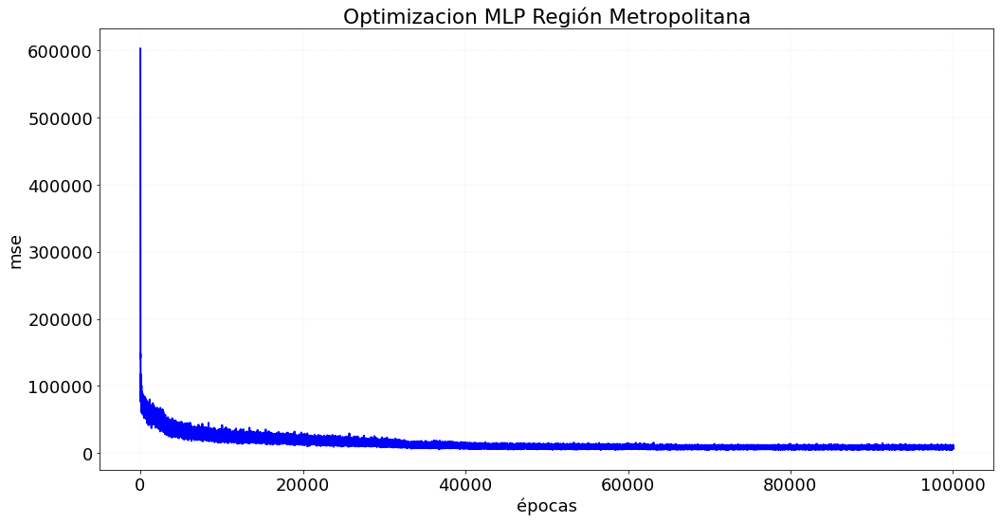

In [97]:
## Grafica Optimizacion
plt.figure(figsize=(15,8))
plt.plot(history.epoch,history.history['loss'],color = 'blue', linewidth = 2)
plt.xlabel('épocas')
plt.ylabel('mse')
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.title('Optimizacion MLP Región Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\mlp_keras_metropolitana.pdf')

In [98]:
# Estimación del modelo
trainScore = model.evaluate(x_train1, y_train1, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, np.sqrt(trainScore)))
testScore = model.evaluate(x_test1, y_test1, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, np.sqrt(testScore)))

Train Score: 1012.73 MSE (31.82 RMSE)
Test Score: 218090.22 MSE (467.00 RMSE)


In [99]:
# Genera predicciones para entrenamiento
trainPredict = np.squeeze(model.predict(x_train1))
testPredict  = np.squeeze(model.predict(x_test1))

In [100]:
print("- r2_score", r2_score(y_test1,testPredict))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test1,testPredict)) 
print("- mean_squared_error", mean_squared_error(y_test1,testPredict))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test1,testPredict))


print("{:.4f}".format(r2_score(y_test1,testPredict))  ) #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test1,testPredict)) )
print("{:.4f}".format( mean_squared_error(y_test1,testPredict)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test1,testPredict)))

- r2_score -0.017234162907127093
- mean_absolute_error 410.37502952513654
- mean_squared_error 218090.21278891445
- mean_absolute_percentage_error 0.405879554009489
-0.0172
410.3750
218090.2128
0.4059


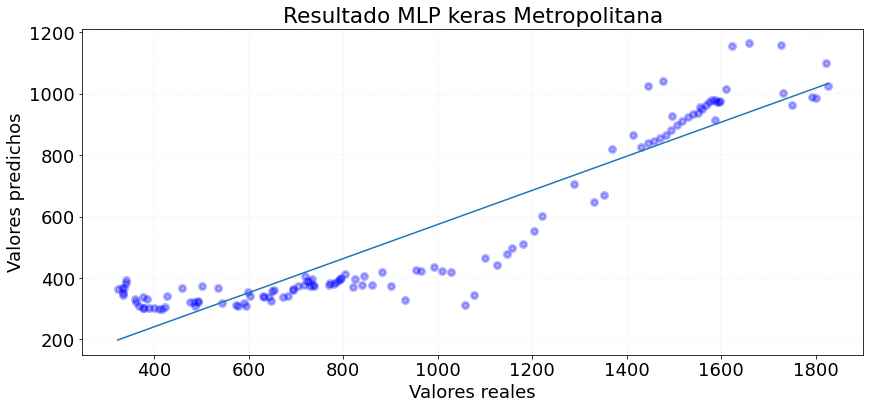

In [101]:
# Grafico Ajuste
plt.figure(figsize=(14,6))
plt.scatter(y_test1,testPredict, alpha = 0.3, color = 'blue', linewidth = 3)
plt.plot(np.unique(y_test1), np.poly1d(np.polyfit(y_test1, testPredict, 1))(np.unique(y_test1)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.title('Resultado MLP keras Metropolitana')


plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\resultado_perceptron1_metropolitana.pdf')

In [102]:
# Ajuste Formato Fechas
fecha_hoy = datetime.now().strftime("%Y-%m-%d")
idx_fecha_hoy = np.argwhere(fechas_test==fecha_hoy)[0][0] + len(trainPredict)
# idx_fecha_hoy = train_size

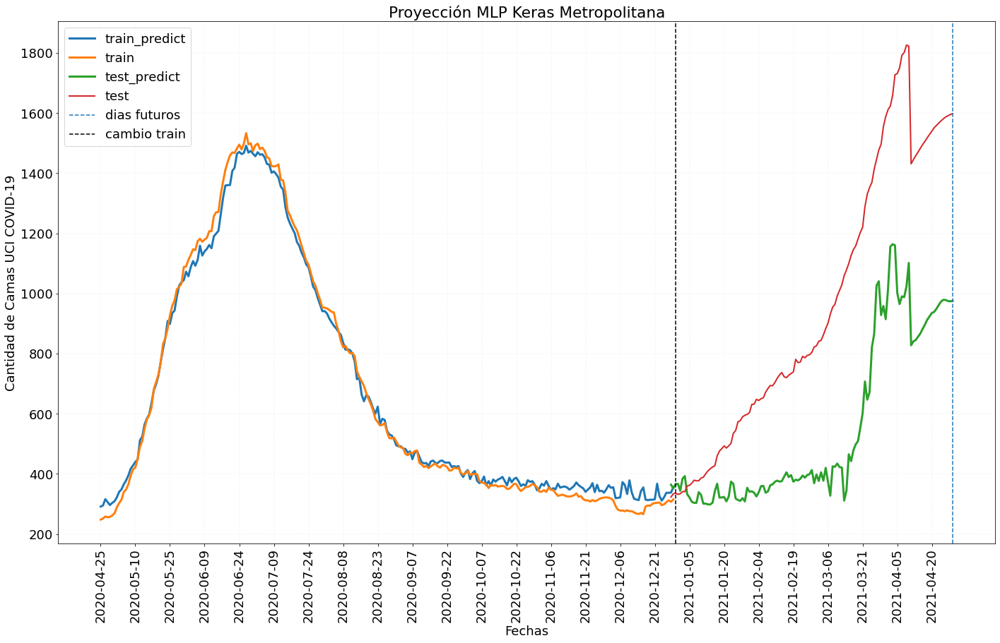

In [103]:
plt.figure(figsize=(20,13))
plt.plot(trainPredict,label="train_predict", linewidth =3)
plt.plot(y_train1,label="train",linewidth = 3)

puntos_base = np.arange(len(y_train1),len(y_train1)+len(y_test1),1)-2
plt.plot(puntos_base,testPredict,label="test_predict",linewidth = 3)
plt.plot(puntos_base,y_test1,label="test",linewidth = 2)
plt.xticks(np.arange(len(fechas))[::15],fechas[::15],rotation=90)
plt.axvline(idx_fecha_hoy,label="dias futuros",linestyle="--")
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.axvline(len(trainPredict),label="cambio train",linestyle="--",color="k")
plt.legend()
plt.xlabel('Fechas')
plt.ylabel('Cantidad de Camas UCI COVID-19')
plt.title('Proyección MLP Keras Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\resultados_perceptron_Metropolitana.pdf')

In [100]:
# model.save("modelo_mlp_final.pkl")

##### G. LSTM

In [127]:
TIME_PERIODS = 3  # Periodo de Tiempos
STEP_DISTANCE =1   # Distancia
batch_size = 16    # Tamaño 
N_FEATURES =  X.shape[1]   # Cantidad de N

input_shape = (TIME_PERIODS*N_FEATURES)
input_shape

# Dividir entre train y test
train_size = int(len(X) * 0.67)
test_size = len(X) - train_size
Xtrain, Xtest = X[0:train_size,:], X[train_size:len(X),:]
ytrain, ytest = y[0:train_size], y[train_size:len(X)]
fechas_train,fechas_test =  fechas[0:train_size], fechas[train_size:len(X)]
X = Normalizer().fit_transform(X)

# Divide segmentos
x_train, y_train = create_segments_and_labels(Xtrain,
                                              ytrain,
                                              TIME_PERIODS,
                                              STEP_DISTANCE
                                              )

x_test, y_test = create_segments_and_labels(Xtest,
                                              ytest,
                                              TIME_PERIODS,
                                              STEP_DISTANCE
                                              )

In [128]:
# crear y ajustar el modelo Perceptrón Multicapa
lstm_model = Sequential()
lstm_model.add(LSTM(100,  input_shape=(x_train[0].shape), return_sequences=True))
lstm_model.add(LSTM(50 ))

lstm_model.add(Dense(30, activation='relu'))
lstm_model.add(Dense(1, activation='relu'))
# print(lstm_model.summary())

In [129]:
lstm_model.compile(loss='mean_squared_error', optimizer='adam')
# lstm_model.load("modelo_mlp_biobio_final_1.pkl")
history = lstm_model.fit(x_train, y_train, epochs=5000, batch_size=batch_size, verbose=2)

Epoch 1/5000
16/16 - 5s - loss: 587363.8125
Epoch 2/5000
16/16 - 0s - loss: 584449.3750
Epoch 3/5000
16/16 - 0s - loss: 573093.6250
Epoch 4/5000
16/16 - 0s - loss: 561967.4375
Epoch 5/5000
16/16 - 0s - loss: 552664.6250
Epoch 6/5000
16/16 - 0s - loss: 542757.3750
Epoch 7/5000
16/16 - 0s - loss: 532306.2500
Epoch 8/5000
16/16 - 0s - loss: 521205.2500
Epoch 9/5000
16/16 - 0s - loss: 509473.3125
Epoch 10/5000
16/16 - 0s - loss: 496861.2812
Epoch 11/5000
16/16 - 0s - loss: 483816.0625
Epoch 12/5000
16/16 - 0s - loss: 470188.1875
Epoch 13/5000
16/16 - 0s - loss: 456366.0625
Epoch 14/5000
16/16 - 0s - loss: 441771.5000
Epoch 15/5000
16/16 - 0s - loss: 427329.4062
Epoch 16/5000
16/16 - 0s - loss: 412353.5938
Epoch 17/5000
16/16 - 0s - loss: 397242.3750
Epoch 18/5000
16/16 - 0s - loss: 382394.2500
Epoch 19/5000
16/16 - 0s - loss: 367061.3438
Epoch 20/5000
16/16 - 0s - loss: 352697.4062
Epoch 21/5000
16/16 - 0s - loss: 337946.3438
Epoch 22/5000
16/16 - 0s - loss: 323799.2812
Epoch 23/5000
16/16

Epoch 184/5000
16/16 - 0s - loss: 66218.4766
Epoch 185/5000
16/16 - 0s - loss: 65345.6211
Epoch 186/5000
16/16 - 0s - loss: 64918.5664
Epoch 187/5000
16/16 - 0s - loss: 64944.2812
Epoch 188/5000
16/16 - 0s - loss: 64924.1211
Epoch 189/5000
16/16 - 0s - loss: 64823.9375
Epoch 190/5000
16/16 - 0s - loss: 64755.4805
Epoch 191/5000
16/16 - 0s - loss: 64796.3086
Epoch 192/5000
16/16 - 0s - loss: 64681.7461
Epoch 193/5000
16/16 - 0s - loss: 64725.6680
Epoch 194/5000
16/16 - 0s - loss: 65208.5508
Epoch 195/5000
16/16 - 0s - loss: 64699.9570
Epoch 196/5000
16/16 - 0s - loss: 64691.3047
Epoch 197/5000
16/16 - 0s - loss: 64615.0078
Epoch 198/5000
16/16 - 0s - loss: 64335.7070
Epoch 199/5000
16/16 - 0s - loss: 64529.7734
Epoch 200/5000
16/16 - 0s - loss: 64850.2656
Epoch 201/5000
16/16 - 0s - loss: 64808.9102
Epoch 202/5000
16/16 - 0s - loss: 64481.0195
Epoch 203/5000
16/16 - 0s - loss: 64879.2812
Epoch 204/5000
16/16 - 0s - loss: 64670.5547
Epoch 205/5000
16/16 - 0s - loss: 64484.4180
Epoch 206/

16/16 - 0s - loss: 23721.9434
Epoch 367/5000
16/16 - 0s - loss: 30594.3008
Epoch 368/5000
16/16 - 0s - loss: 35039.6992
Epoch 369/5000
16/16 - 0s - loss: 30287.6152
Epoch 370/5000
16/16 - 0s - loss: 25844.7305
Epoch 371/5000
16/16 - 0s - loss: 30608.2363
Epoch 372/5000
16/16 - 0s - loss: 31662.2891
Epoch 373/5000
16/16 - 0s - loss: 33264.1758
Epoch 374/5000
16/16 - 0s - loss: 42746.1914
Epoch 375/5000
16/16 - 0s - loss: 36477.3555
Epoch 376/5000
16/16 - 0s - loss: 26592.7383
Epoch 377/5000
16/16 - 0s - loss: 27375.4746
Epoch 378/5000
16/16 - 0s - loss: 26787.5879
Epoch 379/5000
16/16 - 0s - loss: 30568.2344
Epoch 380/5000
16/16 - 0s - loss: 24929.0742
Epoch 381/5000
16/16 - 0s - loss: 25124.5059
Epoch 382/5000
16/16 - 0s - loss: 24161.4102
Epoch 383/5000
16/16 - 0s - loss: 36970.5820
Epoch 384/5000
16/16 - 0s - loss: 32942.2305
Epoch 385/5000
16/16 - 0s - loss: 35707.6641
Epoch 386/5000
16/16 - 0s - loss: 31784.2891
Epoch 387/5000
16/16 - 0s - loss: 27042.4590
Epoch 388/5000
16/16 - 0s

Epoch 549/5000
16/16 - 0s - loss: 14096.6270
Epoch 550/5000
16/16 - 0s - loss: 11724.8916
Epoch 551/5000
16/16 - 0s - loss: 12447.9629
Epoch 552/5000
16/16 - 0s - loss: 11786.3760
Epoch 553/5000
16/16 - 0s - loss: 14525.7412
Epoch 554/5000
16/16 - 0s - loss: 16094.6855
Epoch 555/5000
16/16 - 0s - loss: 12057.6055
Epoch 556/5000
16/16 - 0s - loss: 15450.2295
Epoch 557/5000
16/16 - 0s - loss: 19234.0820
Epoch 558/5000
16/16 - 0s - loss: 20581.1523
Epoch 559/5000
16/16 - 0s - loss: 24124.1836
Epoch 560/5000
16/16 - 0s - loss: 12723.8545
Epoch 561/5000
16/16 - 0s - loss: 16784.0293
Epoch 562/5000
16/16 - 0s - loss: 14432.6416
Epoch 563/5000
16/16 - 0s - loss: 12242.2061
Epoch 564/5000
16/16 - 0s - loss: 17367.7207
Epoch 565/5000
16/16 - 0s - loss: 17756.5488
Epoch 566/5000
16/16 - 0s - loss: 17363.9922
Epoch 567/5000
16/16 - 0s - loss: 18880.3730
Epoch 568/5000
16/16 - 0s - loss: 15267.5020
Epoch 569/5000
16/16 - 0s - loss: 18236.3398
Epoch 570/5000
16/16 - 0s - loss: 15358.5254
Epoch 571/

16/16 - 0s - loss: 13203.0352
Epoch 918/5000
16/16 - 0s - loss: 12361.8096
Epoch 919/5000
16/16 - 0s - loss: 16099.8340
Epoch 920/5000
16/16 - 0s - loss: 11974.7559
Epoch 921/5000
16/16 - 0s - loss: 11606.3438
Epoch 922/5000
16/16 - 0s - loss: 12385.2002
Epoch 923/5000
16/16 - 0s - loss: 11916.9590
Epoch 924/5000
16/16 - 0s - loss: 10802.4512
Epoch 925/5000
16/16 - 0s - loss: 10792.1104
Epoch 926/5000
16/16 - 0s - loss: 10727.7930
Epoch 927/5000
16/16 - 0s - loss: 10943.0684
Epoch 928/5000
16/16 - 0s - loss: 10881.2109
Epoch 929/5000
16/16 - 0s - loss: 10730.3730
Epoch 930/5000
16/16 - 0s - loss: 11646.8604
Epoch 931/5000
16/16 - 0s - loss: 16381.6836
Epoch 932/5000
16/16 - 0s - loss: 13760.1299
Epoch 933/5000
16/16 - 0s - loss: 11707.5850
Epoch 934/5000
16/16 - 0s - loss: 10426.6084
Epoch 935/5000
16/16 - 0s - loss: 11458.3604
Epoch 936/5000
16/16 - 0s - loss: 11232.8760
Epoch 937/5000
16/16 - 0s - loss: 10612.6201
Epoch 938/5000
16/16 - 0s - loss: 11837.2666
Epoch 939/5000
16/16 - 0s

Epoch 1099/5000
16/16 - 0s - loss: 5054.2246
Epoch 1100/5000
16/16 - 0s - loss: 5209.3384
Epoch 1101/5000
16/16 - 0s - loss: 5021.9121
Epoch 1102/5000
16/16 - 0s - loss: 5642.4033
Epoch 1103/5000
16/16 - 0s - loss: 8173.3115
Epoch 1104/5000
16/16 - 0s - loss: 10730.0107
Epoch 1105/5000
16/16 - 0s - loss: 18095.9258
Epoch 1106/5000
16/16 - 0s - loss: 6403.5498
Epoch 1107/5000
16/16 - 0s - loss: 6979.0063
Epoch 1108/5000
16/16 - 0s - loss: 4562.0913
Epoch 1109/5000
16/16 - 0s - loss: 3654.6577
Epoch 1110/5000
16/16 - 0s - loss: 3357.1826
Epoch 1111/5000
16/16 - 0s - loss: 3903.6016
Epoch 1112/5000
16/16 - 0s - loss: 3975.2219
Epoch 1113/5000
16/16 - 0s - loss: 3164.3613
Epoch 1114/5000
16/16 - 0s - loss: 3393.8425
Epoch 1115/5000
16/16 - 0s - loss: 3173.1179
Epoch 1116/5000
16/16 - 0s - loss: 4056.9473
Epoch 1117/5000
16/16 - 0s - loss: 4579.8569
Epoch 1118/5000
16/16 - 0s - loss: 4759.0820
Epoch 1119/5000
16/16 - 0s - loss: 4378.4438
Epoch 1120/5000
16/16 - 0s - loss: 3743.3831
Epoch 11

Epoch 1280/5000
16/16 - 0s - loss: 6591.7803
Epoch 1281/5000
16/16 - 0s - loss: 9103.1895
Epoch 1282/5000
16/16 - 0s - loss: 5718.9805
Epoch 1283/5000
16/16 - 0s - loss: 9374.3486
Epoch 1284/5000
16/16 - 0s - loss: 8837.1484
Epoch 1285/5000
16/16 - 0s - loss: 5445.7725
Epoch 1286/5000
16/16 - 0s - loss: 5067.9619
Epoch 1287/5000
16/16 - 0s - loss: 4528.2539
Epoch 1288/5000
16/16 - 0s - loss: 7543.2183
Epoch 1289/5000
16/16 - 0s - loss: 8450.4736
Epoch 1290/5000
16/16 - 0s - loss: 8891.8135
Epoch 1291/5000
16/16 - 0s - loss: 9352.7129
Epoch 1292/5000
16/16 - 0s - loss: 7780.3291
Epoch 1293/5000
16/16 - 0s - loss: 4916.0718
Epoch 1294/5000
16/16 - 0s - loss: 6921.4302
Epoch 1295/5000
16/16 - 0s - loss: 5082.1099
Epoch 1296/5000
16/16 - 0s - loss: 5197.6646
Epoch 1297/5000
16/16 - 0s - loss: 8076.1206
Epoch 1298/5000
16/16 - 0s - loss: 6617.8086
Epoch 1299/5000
16/16 - 0s - loss: 9406.7852
Epoch 1300/5000
16/16 - 0s - loss: 5347.8799
Epoch 1301/5000
16/16 - 0s - loss: 5767.1025
Epoch 1302

Epoch 1462/5000
16/16 - 0s - loss: 1950.1184
Epoch 1463/5000
16/16 - 0s - loss: 2654.5078
Epoch 1464/5000
16/16 - 0s - loss: 1937.5668
Epoch 1465/5000
16/16 - 0s - loss: 2136.8381
Epoch 1466/5000
16/16 - 0s - loss: 1785.7169
Epoch 1467/5000
16/16 - 0s - loss: 2595.8000
Epoch 1468/5000
16/16 - 0s - loss: 2506.9153
Epoch 1469/5000
16/16 - 0s - loss: 3136.8616
Epoch 1470/5000
16/16 - 0s - loss: 3811.6509
Epoch 1471/5000
16/16 - 0s - loss: 2168.9653
Epoch 1472/5000
16/16 - 0s - loss: 7438.9614
Epoch 1473/5000
16/16 - 0s - loss: 3209.2239
Epoch 1474/5000
16/16 - 0s - loss: 1930.1926
Epoch 1475/5000
16/16 - 0s - loss: 2016.6643
Epoch 1476/5000
16/16 - 0s - loss: 1856.7295
Epoch 1477/5000
16/16 - 0s - loss: 2069.1304
Epoch 1478/5000
16/16 - 0s - loss: 1926.4343
Epoch 1479/5000
16/16 - 0s - loss: 2030.7673
Epoch 1480/5000
16/16 - 0s - loss: 3580.0952
Epoch 1481/5000
16/16 - 0s - loss: 6141.4282
Epoch 1482/5000
16/16 - 0s - loss: 3377.0654
Epoch 1483/5000
16/16 - 0s - loss: 3895.7122
Epoch 1484

Epoch 1644/5000
16/16 - 0s - loss: 1475.4728
Epoch 1645/5000
16/16 - 0s - loss: 1791.3779
Epoch 1646/5000
16/16 - 0s - loss: 1524.5128
Epoch 1647/5000
16/16 - 0s - loss: 1441.6608
Epoch 1648/5000
16/16 - 0s - loss: 1696.7635
Epoch 1649/5000
16/16 - 0s - loss: 1558.0536
Epoch 1650/5000
16/16 - 0s - loss: 1446.0465
Epoch 1651/5000
16/16 - 0s - loss: 1646.8304
Epoch 1652/5000
16/16 - 0s - loss: 1581.5662
Epoch 1653/5000
16/16 - 0s - loss: 1308.8353
Epoch 1654/5000
16/16 - 0s - loss: 1404.9521
Epoch 1655/5000
16/16 - 0s - loss: 1655.7133
Epoch 1656/5000
16/16 - 0s - loss: 1580.4314
Epoch 1657/5000
16/16 - 0s - loss: 1696.1891
Epoch 1658/5000
16/16 - 0s - loss: 1548.5922
Epoch 1659/5000
16/16 - 0s - loss: 1546.7023
Epoch 1660/5000
16/16 - 0s - loss: 1643.0051
Epoch 1661/5000
16/16 - 0s - loss: 1376.9031
Epoch 1662/5000
16/16 - 0s - loss: 1368.4030
Epoch 1663/5000
16/16 - 0s - loss: 1231.8401
Epoch 1664/5000
16/16 - 0s - loss: 1494.2156
Epoch 1665/5000
16/16 - 0s - loss: 2033.5927
Epoch 1666

Epoch 1826/5000
16/16 - 0s - loss: 1210.1951
Epoch 1827/5000
16/16 - 0s - loss: 1143.0558
Epoch 1828/5000
16/16 - 0s - loss: 1382.9470
Epoch 1829/5000
16/16 - 0s - loss: 1356.9113
Epoch 1830/5000
16/16 - 0s - loss: 1219.6665
Epoch 1831/5000
16/16 - 0s - loss: 1151.6493
Epoch 1832/5000
16/16 - 0s - loss: 1145.6033
Epoch 1833/5000
16/16 - 0s - loss: 1066.1674
Epoch 1834/5000
16/16 - 0s - loss: 1150.8735
Epoch 1835/5000
16/16 - 0s - loss: 1137.1334
Epoch 1836/5000
16/16 - 0s - loss: 1155.9630
Epoch 1837/5000
16/16 - 0s - loss: 1125.9275
Epoch 1838/5000
16/16 - 0s - loss: 1165.8027
Epoch 1839/5000
16/16 - 0s - loss: 1175.8113
Epoch 1840/5000
16/16 - 0s - loss: 1156.6904
Epoch 1841/5000
16/16 - 0s - loss: 1183.0311
Epoch 1842/5000
16/16 - 0s - loss: 1135.4967
Epoch 1843/5000
16/16 - 0s - loss: 1137.9188
Epoch 1844/5000
16/16 - 0s - loss: 1060.1110
Epoch 1845/5000
16/16 - 0s - loss: 1179.3677
Epoch 1846/5000
16/16 - 0s - loss: 1122.5417
Epoch 1847/5000
16/16 - 0s - loss: 1188.6587
Epoch 1848

16/16 - 0s - loss: 1159.8531
Epoch 2009/5000
16/16 - 0s - loss: 1251.4113
Epoch 2010/5000
16/16 - 0s - loss: 1768.1562
Epoch 2011/5000
16/16 - 0s - loss: 2484.4233
Epoch 2012/5000
16/16 - 0s - loss: 1363.1560
Epoch 2013/5000
16/16 - 0s - loss: 1201.5172
Epoch 2014/5000
16/16 - 0s - loss: 1113.3365
Epoch 2015/5000
16/16 - 0s - loss: 1118.2109
Epoch 2016/5000
16/16 - 0s - loss: 1407.4662
Epoch 2017/5000
16/16 - 0s - loss: 1213.3262
Epoch 2018/5000
16/16 - 0s - loss: 1427.7634
Epoch 2019/5000
16/16 - 0s - loss: 1227.6947
Epoch 2020/5000
16/16 - 0s - loss: 1079.6887
Epoch 2021/5000
16/16 - 0s - loss: 1125.9022
Epoch 2022/5000
16/16 - 0s - loss: 1080.2904
Epoch 2023/5000
16/16 - 0s - loss: 1094.4512
Epoch 2024/5000
16/16 - 0s - loss: 1090.4055
Epoch 2025/5000
16/16 - 0s - loss: 1052.5403
Epoch 2026/5000
16/16 - 0s - loss: 1161.1080
Epoch 2027/5000
16/16 - 0s - loss: 1086.1262
Epoch 2028/5000
16/16 - 0s - loss: 1042.2668
Epoch 2029/5000
16/16 - 0s - loss: 948.8696
Epoch 2030/5000
16/16 - 0s 

Epoch 2192/5000
16/16 - 0s - loss: 49776.0859
Epoch 2193/5000
16/16 - 0s - loss: 46809.9414
Epoch 2194/5000
16/16 - 0s - loss: 46071.4766
Epoch 2195/5000
16/16 - 0s - loss: 44468.4180
Epoch 2196/5000
16/16 - 0s - loss: 42414.4609
Epoch 2197/5000
16/16 - 0s - loss: 42096.4648
Epoch 2198/5000
16/16 - 0s - loss: 40875.3867
Epoch 2199/5000
16/16 - 0s - loss: 40042.9102
Epoch 2200/5000
16/16 - 0s - loss: 39177.4844
Epoch 2201/5000
16/16 - 0s - loss: 40849.7812
Epoch 2202/5000
16/16 - 0s - loss: 39926.3086
Epoch 2203/5000
16/16 - 0s - loss: 40076.1953
Epoch 2204/5000
16/16 - 0s - loss: 36977.1641
Epoch 2205/5000
16/16 - 0s - loss: 35970.6016
Epoch 2206/5000
16/16 - 0s - loss: 34673.4844
Epoch 2207/5000
16/16 - 0s - loss: 34179.3594
Epoch 2208/5000
16/16 - 0s - loss: 33825.3555
Epoch 2209/5000
16/16 - 0s - loss: 33251.6406
Epoch 2210/5000
16/16 - 0s - loss: 32242.3770
Epoch 2211/5000
16/16 - 0s - loss: 32632.5234
Epoch 2212/5000
16/16 - 0s - loss: 32209.8379
Epoch 2213/5000
16/16 - 0s - loss:

16/16 - 0s - loss: 3589.1680
Epoch 2373/5000
16/16 - 0s - loss: 2734.3870
Epoch 2374/5000
16/16 - 0s - loss: 2509.7925
Epoch 2375/5000
16/16 - 0s - loss: 2782.2329
Epoch 2376/5000
16/16 - 0s - loss: 2990.9026
Epoch 2377/5000
16/16 - 0s - loss: 4387.5820
Epoch 2378/5000
16/16 - 0s - loss: 7318.2036
Epoch 2379/5000
16/16 - 0s - loss: 9787.7490
Epoch 2380/5000
16/16 - 0s - loss: 5755.3530
Epoch 2381/5000
16/16 - 0s - loss: 4050.0776
Epoch 2382/5000
16/16 - 0s - loss: 3948.7883
Epoch 2383/5000
16/16 - 0s - loss: 3365.0107
Epoch 2384/5000
16/16 - 0s - loss: 2746.1421
Epoch 2385/5000
16/16 - 0s - loss: 2471.7261
Epoch 2386/5000
16/16 - 0s - loss: 3551.7419
Epoch 2387/5000
16/16 - 0s - loss: 2895.5154
Epoch 2388/5000
16/16 - 0s - loss: 2422.0928
Epoch 2389/5000
16/16 - 0s - loss: 3955.3076
Epoch 2390/5000
16/16 - 0s - loss: 3759.4089
Epoch 2391/5000
16/16 - 0s - loss: 3521.8010
Epoch 2392/5000
16/16 - 0s - loss: 4148.5859
Epoch 2393/5000
16/16 - 0s - loss: 4541.4175
Epoch 2394/5000
16/16 - 0s

16/16 - 0s - loss: 1381.2644
Epoch 2555/5000
16/16 - 0s - loss: 1248.4872
Epoch 2556/5000
16/16 - 0s - loss: 1205.4302
Epoch 2557/5000
16/16 - 0s - loss: 1375.7822
Epoch 2558/5000
16/16 - 0s - loss: 1301.4768
Epoch 2559/5000
16/16 - 0s - loss: 1273.6537
Epoch 2560/5000
16/16 - 0s - loss: 2469.1848
Epoch 2561/5000
16/16 - 0s - loss: 3164.4644
Epoch 2562/5000
16/16 - 0s - loss: 1509.3577
Epoch 2563/5000
16/16 - 0s - loss: 1374.7843
Epoch 2564/5000
16/16 - 0s - loss: 1697.2245
Epoch 2565/5000
16/16 - 0s - loss: 1557.2408
Epoch 2566/5000
16/16 - 0s - loss: 1709.8242
Epoch 2567/5000
16/16 - 0s - loss: 1301.6520
Epoch 2568/5000
16/16 - 0s - loss: 1257.3811
Epoch 2569/5000
16/16 - 0s - loss: 1195.1819
Epoch 2570/5000
16/16 - 0s - loss: 1540.0739
Epoch 2571/5000
16/16 - 0s - loss: 1705.4866
Epoch 2572/5000
16/16 - 0s - loss: 1193.9985
Epoch 2573/5000
16/16 - 0s - loss: 1284.2352
Epoch 2574/5000
16/16 - 0s - loss: 1301.1342
Epoch 2575/5000
16/16 - 0s - loss: 1373.6683
Epoch 2576/5000
16/16 - 0s

16/16 - 0s - loss: 21826.5547
Epoch 2738/5000
16/16 - 0s - loss: 20436.5312
Epoch 2739/5000
16/16 - 0s - loss: 13050.3223
Epoch 2740/5000
16/16 - 0s - loss: 4413.2534
Epoch 2741/5000
16/16 - 0s - loss: 2554.7180
Epoch 2742/5000
16/16 - 0s - loss: 2425.6267
Epoch 2743/5000
16/16 - 0s - loss: 2525.0337
Epoch 2744/5000
16/16 - 0s - loss: 4104.9214
Epoch 2745/5000
16/16 - 0s - loss: 1722.2825
Epoch 2746/5000
16/16 - 0s - loss: 1297.2247
Epoch 2747/5000
16/16 - 0s - loss: 1182.0304
Epoch 2748/5000
16/16 - 0s - loss: 1061.6750
Epoch 2749/5000
16/16 - 0s - loss: 1000.2048
Epoch 2750/5000
16/16 - 0s - loss: 1024.9729
Epoch 2751/5000
16/16 - 0s - loss: 1022.0111
Epoch 2752/5000
16/16 - 0s - loss: 935.7257
Epoch 2753/5000
16/16 - 0s - loss: 963.2478
Epoch 2754/5000
16/16 - 0s - loss: 1087.8574
Epoch 2755/5000
16/16 - 0s - loss: 1611.0135
Epoch 2756/5000
16/16 - 0s - loss: 1109.1493
Epoch 2757/5000
16/16 - 0s - loss: 1094.2675
Epoch 2758/5000
16/16 - 0s - loss: 1086.3470
Epoch 2759/5000
16/16 - 0

Epoch 2922/5000
16/16 - 0s - loss: 1477.5837
Epoch 2923/5000
16/16 - 0s - loss: 1401.0945
Epoch 2924/5000
16/16 - 0s - loss: 1468.1045
Epoch 2925/5000
16/16 - 0s - loss: 1496.9529
Epoch 2926/5000
16/16 - 0s - loss: 1475.7313
Epoch 2927/5000
16/16 - 0s - loss: 1318.5206
Epoch 2928/5000
16/16 - 0s - loss: 1356.2642
Epoch 2929/5000
16/16 - 0s - loss: 1342.9558
Epoch 2930/5000
16/16 - 0s - loss: 1236.1796
Epoch 2931/5000
16/16 - 0s - loss: 1199.3732
Epoch 2932/5000
16/16 - 0s - loss: 1274.1355
Epoch 2933/5000
16/16 - 0s - loss: 1226.4832
Epoch 2934/5000
16/16 - 0s - loss: 1134.6069
Epoch 2935/5000
16/16 - 0s - loss: 1310.7189
Epoch 2936/5000
16/16 - 0s - loss: 1100.2018
Epoch 2937/5000
16/16 - 0s - loss: 1184.9265
Epoch 2938/5000
16/16 - 0s - loss: 1112.1505
Epoch 2939/5000
16/16 - 0s - loss: 1307.9141
Epoch 2940/5000
16/16 - 0s - loss: 1117.7850
Epoch 2941/5000
16/16 - 0s - loss: 1079.6272
Epoch 2942/5000
16/16 - 0s - loss: 1063.1089
Epoch 2943/5000
16/16 - 0s - loss: 1066.6261
Epoch 2944

Epoch 3105/5000
16/16 - 0s - loss: 1132.9163
Epoch 3106/5000
16/16 - 0s - loss: 985.0023
Epoch 3107/5000
16/16 - 0s - loss: 1639.3979
Epoch 3108/5000
16/16 - 0s - loss: 1199.2375
Epoch 3109/5000
16/16 - 0s - loss: 1000.8505
Epoch 3110/5000
16/16 - 0s - loss: 1254.0558
Epoch 3111/5000
16/16 - 0s - loss: 960.1357
Epoch 3112/5000
16/16 - 0s - loss: 821.4026
Epoch 3113/5000
16/16 - 0s - loss: 828.5502
Epoch 3114/5000
16/16 - 0s - loss: 967.4098
Epoch 3115/5000
16/16 - 0s - loss: 1110.9752
Epoch 3116/5000
16/16 - 0s - loss: 1214.0070
Epoch 3117/5000
16/16 - 0s - loss: 1908.9766
Epoch 3118/5000
16/16 - 0s - loss: 1226.1525
Epoch 3119/5000
16/16 - 0s - loss: 831.5871
Epoch 3120/5000
16/16 - 0s - loss: 1115.6727
Epoch 3121/5000
16/16 - 0s - loss: 900.3053
Epoch 3122/5000
16/16 - 0s - loss: 1068.1627
Epoch 3123/5000
16/16 - 0s - loss: 1080.9167
Epoch 3124/5000
16/16 - 0s - loss: 1036.5425
Epoch 3125/5000
16/16 - 0s - loss: 920.1080
Epoch 3126/5000
16/16 - 0s - loss: 1226.0104
Epoch 3127/5000
16

16/16 - 0s - loss: 1357.7333
Epoch 3290/5000
16/16 - 0s - loss: 941.2168
Epoch 3291/5000
16/16 - 0s - loss: 1120.2811
Epoch 3292/5000
16/16 - 0s - loss: 747.2351
Epoch 3293/5000
16/16 - 0s - loss: 763.4273
Epoch 3294/5000
16/16 - 0s - loss: 757.0861
Epoch 3295/5000
16/16 - 0s - loss: 691.0778
Epoch 3296/5000
16/16 - 0s - loss: 831.5410
Epoch 3297/5000
16/16 - 0s - loss: 815.3799
Epoch 3298/5000
16/16 - 0s - loss: 610.6174
Epoch 3299/5000
16/16 - 0s - loss: 580.8524
Epoch 3300/5000
16/16 - 0s - loss: 594.3896
Epoch 3301/5000
16/16 - 0s - loss: 633.4179
Epoch 3302/5000
16/16 - 0s - loss: 776.0562
Epoch 3303/5000
16/16 - 0s - loss: 683.9277
Epoch 3304/5000
16/16 - 0s - loss: 614.1263
Epoch 3305/5000
16/16 - 0s - loss: 587.8060
Epoch 3306/5000
16/16 - 0s - loss: 677.2427
Epoch 3307/5000
16/16 - 0s - loss: 791.5916
Epoch 3308/5000
16/16 - 0s - loss: 628.8240
Epoch 3309/5000
16/16 - 0s - loss: 610.6165
Epoch 3310/5000
16/16 - 0s - loss: 642.9385
Epoch 3311/5000
16/16 - 0s - loss: 852.1517
Ep

Epoch 3475/5000
16/16 - 0s - loss: 635.4171
Epoch 3476/5000
16/16 - 0s - loss: 602.1681
Epoch 3477/5000
16/16 - 0s - loss: 709.9605
Epoch 3478/5000
16/16 - 0s - loss: 640.9869
Epoch 3479/5000
16/16 - 0s - loss: 963.0754
Epoch 3480/5000
16/16 - 0s - loss: 1146.0564
Epoch 3481/5000
16/16 - 0s - loss: 835.4595
Epoch 3482/5000
16/16 - 0s - loss: 1028.8002
Epoch 3483/5000
16/16 - 0s - loss: 1392.0837
Epoch 3484/5000
16/16 - 0s - loss: 1427.5498
Epoch 3485/5000
16/16 - 0s - loss: 1716.0999
Epoch 3486/5000
16/16 - 0s - loss: 3763.1755
Epoch 3487/5000
16/16 - 0s - loss: 12064.3252
Epoch 3488/5000
16/16 - 0s - loss: 33940.2617
Epoch 3489/5000
16/16 - 0s - loss: 57622.5234
Epoch 3490/5000
16/16 - 0s - loss: 62681.9375
Epoch 3491/5000
16/16 - 0s - loss: 28897.7949
Epoch 3492/5000
16/16 - 0s - loss: 23188.6230
Epoch 3493/5000
16/16 - 0s - loss: 20464.7773
Epoch 3494/5000
16/16 - 0s - loss: 14119.9385
Epoch 3495/5000
16/16 - 0s - loss: 11242.5312
Epoch 3496/5000
16/16 - 0s - loss: 5985.3276
Epoch 3

Epoch 3657/5000
16/16 - 0s - loss: 932.4355
Epoch 3658/5000
16/16 - 0s - loss: 897.8042
Epoch 3659/5000
16/16 - 0s - loss: 914.9112
Epoch 3660/5000
16/16 - 0s - loss: 927.2742
Epoch 3661/5000
16/16 - 0s - loss: 1099.8900
Epoch 3662/5000
16/16 - 0s - loss: 999.9397
Epoch 3663/5000
16/16 - 0s - loss: 1103.3674
Epoch 3664/5000
16/16 - 0s - loss: 961.3007
Epoch 3665/5000
16/16 - 0s - loss: 1086.0488
Epoch 3666/5000
16/16 - 0s - loss: 1106.0200
Epoch 3667/5000
16/16 - 0s - loss: 924.2519
Epoch 3668/5000
16/16 - 0s - loss: 913.1172
Epoch 3669/5000
16/16 - 0s - loss: 938.3906
Epoch 3670/5000
16/16 - 0s - loss: 914.9137
Epoch 3671/5000
16/16 - 0s - loss: 876.4275
Epoch 3672/5000
16/16 - 0s - loss: 887.0453
Epoch 3673/5000
16/16 - 0s - loss: 1002.2295
Epoch 3674/5000
16/16 - 0s - loss: 887.1968
Epoch 3675/5000
16/16 - 0s - loss: 930.8608
Epoch 3676/5000
16/16 - 0s - loss: 1446.3215
Epoch 3677/5000
16/16 - 0s - loss: 1221.0654
Epoch 3678/5000
16/16 - 0s - loss: 1066.2257
Epoch 3679/5000
16/16 - 

Epoch 3842/5000
16/16 - 0s - loss: 793.4150
Epoch 3843/5000
16/16 - 0s - loss: 837.9015
Epoch 3844/5000
16/16 - 0s - loss: 769.6418
Epoch 3845/5000
16/16 - 0s - loss: 797.8902
Epoch 3846/5000
16/16 - 0s - loss: 681.6312
Epoch 3847/5000
16/16 - 0s - loss: 702.0091
Epoch 3848/5000
16/16 - 0s - loss: 770.4681
Epoch 3849/5000
16/16 - 0s - loss: 946.9918
Epoch 3850/5000
16/16 - 0s - loss: 846.0654
Epoch 3851/5000
16/16 - 0s - loss: 814.5015
Epoch 3852/5000
16/16 - 0s - loss: 793.3133
Epoch 3853/5000
16/16 - 0s - loss: 986.7581
Epoch 3854/5000
16/16 - 0s - loss: 910.2214
Epoch 3855/5000
16/16 - 0s - loss: 875.1201
Epoch 3856/5000
16/16 - 0s - loss: 1097.8920
Epoch 3857/5000
16/16 - 0s - loss: 739.4040
Epoch 3858/5000
16/16 - 0s - loss: 655.9600
Epoch 3859/5000
16/16 - 0s - loss: 643.0835
Epoch 3860/5000
16/16 - 0s - loss: 637.0516
Epoch 3861/5000
16/16 - 0s - loss: 718.4734
Epoch 3862/5000
16/16 - 0s - loss: 817.5665
Epoch 3863/5000
16/16 - 0s - loss: 1210.9847
Epoch 3864/5000
16/16 - 0s - l

16/16 - 0s - loss: 544.0447
Epoch 4028/5000
16/16 - 0s - loss: 847.1616
Epoch 4029/5000
16/16 - 0s - loss: 794.8406
Epoch 4030/5000
16/16 - 0s - loss: 659.1286
Epoch 4031/5000
16/16 - 0s - loss: 561.6259
Epoch 4032/5000
16/16 - 0s - loss: 552.4224
Epoch 4033/5000
16/16 - 0s - loss: 557.0803
Epoch 4034/5000
16/16 - 0s - loss: 530.8451
Epoch 4035/5000
16/16 - 0s - loss: 559.2153
Epoch 4036/5000
16/16 - 0s - loss: 558.2472
Epoch 4037/5000
16/16 - 0s - loss: 567.7563
Epoch 4038/5000
16/16 - 0s - loss: 564.6760
Epoch 4039/5000
16/16 - 0s - loss: 595.6920
Epoch 4040/5000
16/16 - 0s - loss: 936.1982
Epoch 4041/5000
16/16 - 0s - loss: 1089.3677
Epoch 4042/5000
16/16 - 0s - loss: 1559.2703
Epoch 4043/5000
16/16 - 0s - loss: 3640.4236
Epoch 4044/5000
16/16 - 0s - loss: 19132.1328
Epoch 4045/5000
16/16 - 0s - loss: 14223.5146
Epoch 4046/5000
16/16 - 0s - loss: 2945.5588
Epoch 4047/5000
16/16 - 0s - loss: 1594.3849
Epoch 4048/5000
16/16 - 0s - loss: 1139.9530
Epoch 4049/5000
16/16 - 0s - loss: 809

Epoch 4213/5000
16/16 - 0s - loss: 21756.5781
Epoch 4214/5000
16/16 - 0s - loss: 11697.9736
Epoch 4215/5000
16/16 - 0s - loss: 7867.3018
Epoch 4216/5000
16/16 - 0s - loss: 6613.8628
Epoch 4217/5000
16/16 - 0s - loss: 16244.7930
Epoch 4218/5000
16/16 - 0s - loss: 14501.0127
Epoch 4219/5000
16/16 - 0s - loss: 22712.4121
Epoch 4220/5000
16/16 - 0s - loss: 19980.3457
Epoch 4221/5000
16/16 - 0s - loss: 6802.2554
Epoch 4222/5000
16/16 - 0s - loss: 6004.1289
Epoch 4223/5000
16/16 - 0s - loss: 3924.6238
Epoch 4224/5000
16/16 - 0s - loss: 2962.9475
Epoch 4225/5000
16/16 - 0s - loss: 2655.8357
Epoch 4226/5000
16/16 - 0s - loss: 2177.4668
Epoch 4227/5000
16/16 - 0s - loss: 1613.8959
Epoch 4228/5000
16/16 - 0s - loss: 1433.6978
Epoch 4229/5000
16/16 - 0s - loss: 1339.0270
Epoch 4230/5000
16/16 - 0s - loss: 1209.9904
Epoch 4231/5000
16/16 - 0s - loss: 1180.2345
Epoch 4232/5000
16/16 - 0s - loss: 1015.3093
Epoch 4233/5000
16/16 - 0s - loss: 1079.8542
Epoch 4234/5000
16/16 - 0s - loss: 974.2730
Epoch

Epoch 4398/5000
16/16 - 0s - loss: 452.4566
Epoch 4399/5000
16/16 - 0s - loss: 476.2425
Epoch 4400/5000
16/16 - 0s - loss: 1084.0272
Epoch 4401/5000
16/16 - 0s - loss: 2013.1462
Epoch 4402/5000
16/16 - 0s - loss: 942.6289
Epoch 4403/5000
16/16 - 0s - loss: 1038.3522
Epoch 4404/5000
16/16 - 0s - loss: 826.0833
Epoch 4405/5000
16/16 - 0s - loss: 824.1588
Epoch 4406/5000
16/16 - 0s - loss: 1056.1888
Epoch 4407/5000
16/16 - 0s - loss: 1372.6158
Epoch 4408/5000
16/16 - 0s - loss: 1143.0306
Epoch 4409/5000
16/16 - 0s - loss: 935.0162
Epoch 4410/5000
16/16 - 0s - loss: 753.5562
Epoch 4411/5000
16/16 - 0s - loss: 787.2347
Epoch 4412/5000
16/16 - 0s - loss: 536.4065
Epoch 4413/5000
16/16 - 0s - loss: 550.5467
Epoch 4414/5000
16/16 - 0s - loss: 726.3566
Epoch 4415/5000
16/16 - 0s - loss: 1529.1576
Epoch 4416/5000
16/16 - 0s - loss: 744.8227
Epoch 4417/5000
16/16 - 0s - loss: 784.5455
Epoch 4418/5000
16/16 - 0s - loss: 965.2286
Epoch 4419/5000
16/16 - 0s - loss: 564.5447
Epoch 4420/5000
16/16 - 0

16/16 - 0s - loss: 579.6422
Epoch 4584/5000
16/16 - 0s - loss: 515.9462
Epoch 4585/5000
16/16 - 0s - loss: 469.0927
Epoch 4586/5000
16/16 - 0s - loss: 793.8896
Epoch 4587/5000
16/16 - 0s - loss: 1040.9589
Epoch 4588/5000
16/16 - 0s - loss: 509.4785
Epoch 4589/5000
16/16 - 0s - loss: 581.4950
Epoch 4590/5000
16/16 - 0s - loss: 678.6262
Epoch 4591/5000
16/16 - 0s - loss: 441.2831
Epoch 4592/5000
16/16 - 0s - loss: 792.9457
Epoch 4593/5000
16/16 - 0s - loss: 4335.9146
Epoch 4594/5000
16/16 - 0s - loss: 16571.2617
Epoch 4595/5000
16/16 - 0s - loss: 15861.4648
Epoch 4596/5000
16/16 - 0s - loss: 16127.1025
Epoch 4597/5000
16/16 - 0s - loss: 5805.8662
Epoch 4598/5000
16/16 - 0s - loss: 3123.4092
Epoch 4599/5000
16/16 - 0s - loss: 2138.3972
Epoch 4600/5000
16/16 - 0s - loss: 1896.8605
Epoch 4601/5000
16/16 - 0s - loss: 1536.2124
Epoch 4602/5000
16/16 - 0s - loss: 1376.0634
Epoch 4603/5000
16/16 - 0s - loss: 1176.6760
Epoch 4604/5000
16/16 - 0s - loss: 1102.4762
Epoch 4605/5000
16/16 - 0s - los

16/16 - 0s - loss: 775.0153
Epoch 4770/5000
16/16 - 0s - loss: 825.5712
Epoch 4771/5000
16/16 - 0s - loss: 792.8330
Epoch 4772/5000
16/16 - 0s - loss: 648.4069
Epoch 4773/5000
16/16 - 0s - loss: 1210.1464
Epoch 4774/5000
16/16 - 0s - loss: 832.7470
Epoch 4775/5000
16/16 - 0s - loss: 852.2308
Epoch 4776/5000
16/16 - 0s - loss: 865.9781
Epoch 4777/5000
16/16 - 0s - loss: 716.7778
Epoch 4778/5000
16/16 - 0s - loss: 732.3077
Epoch 4779/5000
16/16 - 0s - loss: 786.5750
Epoch 4780/5000
16/16 - 0s - loss: 573.2967
Epoch 4781/5000
16/16 - 0s - loss: 562.6299
Epoch 4782/5000
16/16 - 0s - loss: 527.1026
Epoch 4783/5000
16/16 - 0s - loss: 538.5963
Epoch 4784/5000
16/16 - 0s - loss: 658.4838
Epoch 4785/5000
16/16 - 0s - loss: 662.7306
Epoch 4786/5000
16/16 - 0s - loss: 494.0024
Epoch 4787/5000
16/16 - 0s - loss: 613.6478
Epoch 4788/5000
16/16 - 0s - loss: 647.2293
Epoch 4789/5000
16/16 - 0s - loss: 660.0869
Epoch 4790/5000
16/16 - 0s - loss: 718.3169
Epoch 4791/5000
16/16 - 0s - loss: 661.2474
Epo

Epoch 4955/5000
16/16 - 0s - loss: 570.5241
Epoch 4956/5000
16/16 - 0s - loss: 593.2565
Epoch 4957/5000
16/16 - 0s - loss: 650.8015
Epoch 4958/5000
16/16 - 0s - loss: 1000.1670
Epoch 4959/5000
16/16 - 0s - loss: 1094.7069
Epoch 4960/5000
16/16 - 0s - loss: 641.6564
Epoch 4961/5000
16/16 - 0s - loss: 820.0086
Epoch 4962/5000
16/16 - 0s - loss: 572.4104
Epoch 4963/5000
16/16 - 0s - loss: 648.0406
Epoch 4964/5000
16/16 - 0s - loss: 667.9068
Epoch 4965/5000
16/16 - 0s - loss: 764.3691
Epoch 4966/5000
16/16 - 0s - loss: 673.1867
Epoch 4967/5000
16/16 - 0s - loss: 571.0989
Epoch 4968/5000
16/16 - 0s - loss: 688.2426
Epoch 4969/5000
16/16 - 0s - loss: 755.6800
Epoch 4970/5000
16/16 - 0s - loss: 681.1559
Epoch 4971/5000
16/16 - 0s - loss: 556.2050
Epoch 4972/5000
16/16 - 0s - loss: 652.7058
Epoch 4973/5000
16/16 - 0s - loss: 901.2975
Epoch 4974/5000
16/16 - 0s - loss: 743.8198
Epoch 4975/5000
16/16 - 0s - loss: 615.9315
Epoch 4976/5000
16/16 - 0s - loss: 600.1103
Epoch 4977/5000
16/16 - 0s - l

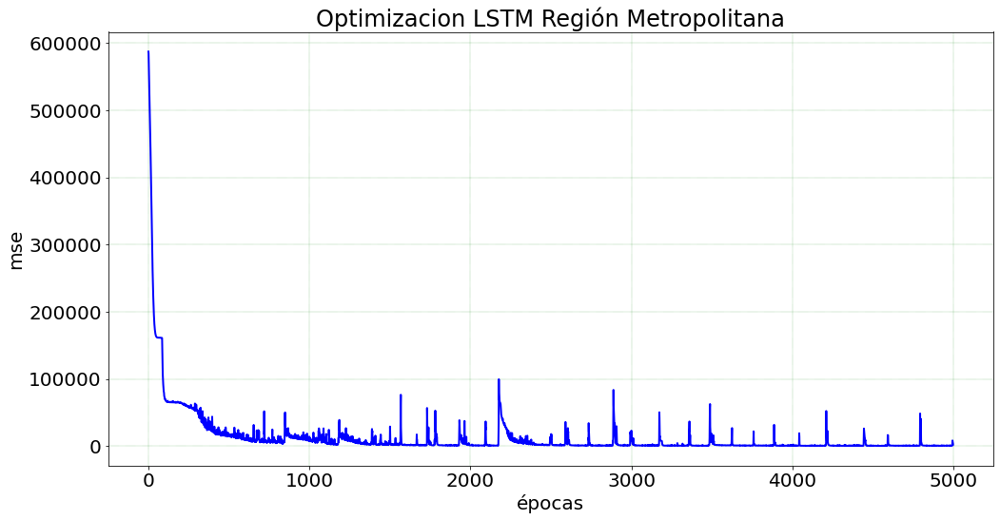

In [130]:
# Grafica Optimizacion
plt.figure(figsize=(15,8))
plt.plot(history.epoch,history.history['loss'], color = 'blue', linewidth = 2)
plt.xlabel('épocas')
plt.ylabel('mse') 
plt.grid(color='green', ls = ':', lw = 0.4)
plt.title('Optimizacion LSTM Región Metropolitana')

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\optimizacion_lstm_metropolitana.pdf')

In [131]:
trainScore = lstm_model.evaluate(x_train, y_train, verbose=0)
print('Train Score: %.2f MSE (%.2f RMSE)' % (trainScore, np.sqrt(trainScore)))
testScore = lstm_model.evaluate(x_test, y_test, verbose=0)
print('Test Score: %.2f MSE (%.2f RMSE)' % (testScore, np.sqrt(testScore)))

Train Score: 1379.90 MSE (37.15 RMSE)
Test Score: 127324.43 MSE (356.83 RMSE)


In [132]:
# Prediccion para entrenamiento
trainPredict = np.squeeze(lstm_model.predict(x_train))
testPredict  = np.squeeze(lstm_model.predict(x_test))

In [133]:
print("- r2_score", r2_score(y_test,testPredict))   #bondad del ajuste
print("- mean_absolute_error", mean_absolute_error(y_test,testPredict)) 
print("- mean_squared_error", mean_squared_error(y_test,testPredict))
print("- mean_absolute_percentage_error", mean_absolute_percentage_error(y_test,testPredict))

print("{:.4f}".format(r2_score(y_test,testPredict))  ) #bondad del ajuste
print("{:.4f}".format(mean_absolute_error(y_test,testPredict)) )
print("{:.4f}".format( mean_squared_error(y_test,testPredict)))
print("{:.4f}".format(mean_absolute_percentage_error(y_test,testPredict)))

- r2_score 0.3707565395647575
- mean_absolute_error 302.50491459113505
- mean_squared_error 127324.43522984811
- mean_absolute_percentage_error 0.33057766668471333
0.3708
302.5049
127324.4352
0.3306


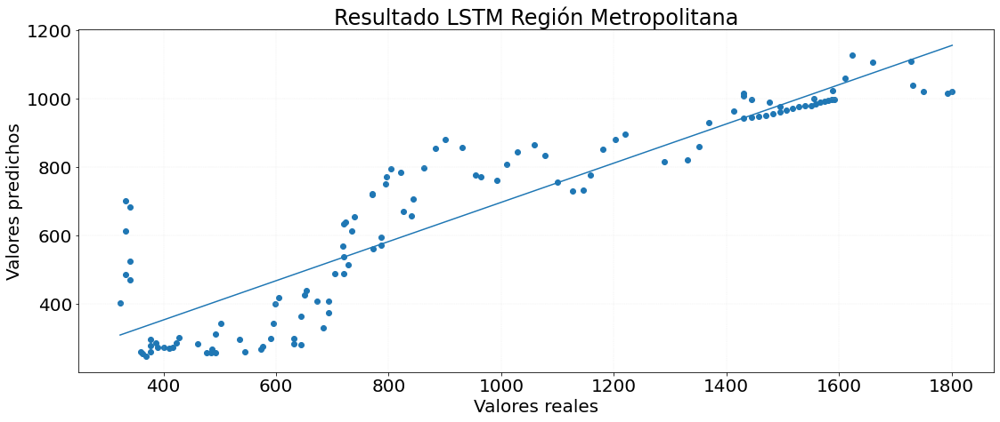

In [134]:
# Grafico Ajuste
# Grafico Ajuste
plt.figure(figsize=(16,7))
plt.scatter(y_test,testPredict)
plt.plot(np.unique(y_test), np.poly1d(np.polyfit(y_test, testPredict, 1))(np.unique(y_test)))
plt.xlabel('Valores reales')
plt.ylabel('Valores predichos')
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.title('Resultado LSTM Región Metropolitana')


plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\resultado_lstm_metropolitana.pdf')

In [135]:
# Formato Fecha
from datetime import datetime
fecha_hoy = datetime.now().strftime("%Y-%m-%d")
idx_fecha_hoy = np.argwhere(fechas_test==fecha_hoy)[0][0] + len(trainPredict)

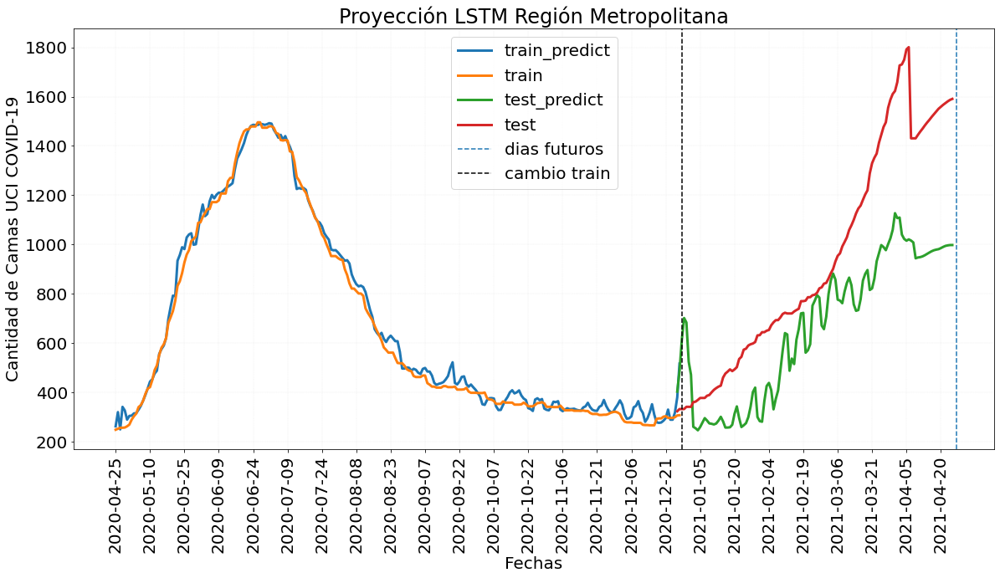

In [136]:
plt.figure(figsize=(17,10))
matplotlib.rcParams["font.size"]= 20

plt.plot(trainPredict,label="train_predict",linewidth = 3)
plt.plot(y_train,label="train",linewidth = 3)

puntos_base = np.arange(len(y_train),len(y_train)+len(y_test),1)-2
plt.plot(puntos_base,testPredict,label="test_predict", linewidth = 3)
plt.plot(puntos_base,y_test,label="test",linewidth = 3)
plt.xticks(np.arange(len(fechas))[::15],fechas[::15],rotation=90)
plt.axvline(idx_fecha_hoy,label="dias futuros",linestyle="--")
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.axvline(len(trainPredict),label="cambio train",linestyle="--",color="k")
plt.legend()
plt.xlabel('Fechas')
plt.ylabel('Cantidad de Camas UCI COVID-19')
plt.title('Proyección LSTM Región Metropolitana')

plt.tight_layout()
# plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\proyeccion_lstm_metropolitana.pdf')

## III. Grafico prediccion modelos

In [137]:
# Carga de los modelos
lstm_trainPredict = np.squeeze(lstm_model.predict(x_train))
lstm_testPredict  = np.squeeze(lstm_model.predict(x_test))

lstm_predict = np.concatenate([lstm_trainPredict,lstm_testPredict])

nn_trainPredict = np.squeeze(model.predict(x_train1))
nn_testPredict  = np.squeeze(model.predict(x_test1))
nn_predict = np.concatenate([nn_trainPredict,nn_testPredict])

tree_trainPredict = tree_reg.predict(np.squeeze(x_train1))
tree_testPredict = tree_reg.predict(np.squeeze(x_test1))
tree_predict = np.concatenate([tree_trainPredict,tree_testPredict])

lineal_trainPredict = reg.predict(np.squeeze(x_train1))
lineal_testPredict = reg.predict(np.squeeze(x_test1))
lineal_predict = np.concatenate([lineal_trainPredict,lineal_testPredict])

elasticnet_trainPredict = regr.predict(np.squeeze(x_train1))
elasticnet_testPredict = regr.predict(np.squeeze(x_test1))
elasticnet_predict = np.concatenate([elasticnet_trainPredict,elasticnet_testPredict])

mlp_trainPredict = mlp.predict(np.squeeze(x_train1))
mlp_testPredict = mlp.predict(np.squeeze(x_test1))
mlp_predict = np.concatenate([mlp_trainPredict,mlp_testPredict])

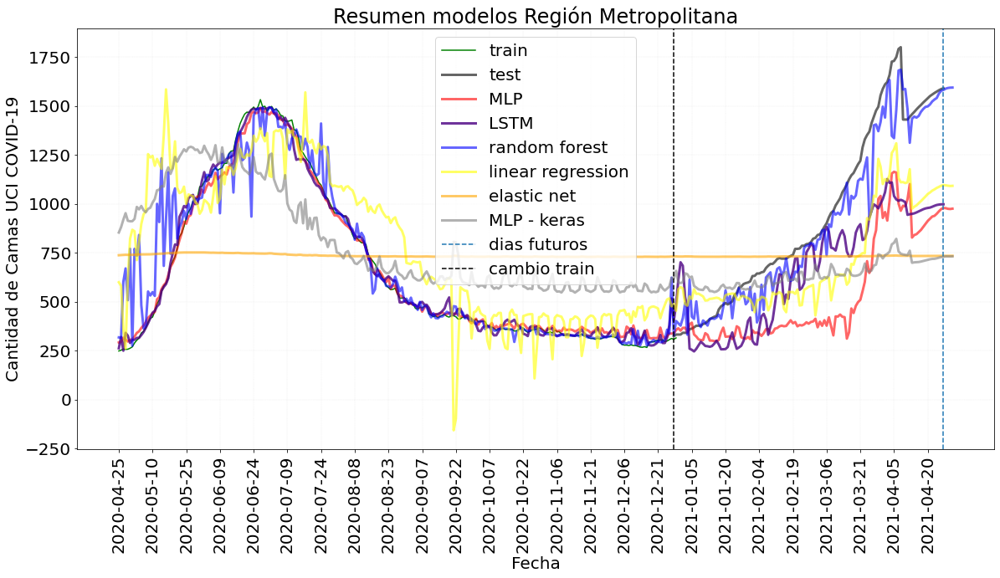

In [138]:
plt.figure(figsize=(17,10))
matplotlib.rcParams["font.size"]= 20

puntos_base = np.arange(len(y_train),len(y_train)+len(y_test),1)
plt.plot(y_train1,label="train", color = 'green')
plt.plot(puntos_base,y_test,label="test", color = 'black', alpha = 0.6, linewidth = 3)


plt.plot(nn_predict,label="MLP",color = 'red', alpha = 0.6, linewidth = 3)
plt.plot(lstm_predict,label="LSTM", color = 'indigo', alpha = 0.8, linewidth = 3)
plt.plot(tree_predict,label="random forest", color = 'blue', alpha = 0.6, linewidth = 3)
plt.plot(lineal_predict,label="linear regression",  color = 'yellow', alpha = 0.6, linewidth = 3)
plt.plot(elasticnet_predict,label="elastic net",  color = 'orange', alpha = 0.6, linewidth = 3)
plt.plot(mlp_predict,label="MLP - keras", color = 'gray', alpha = 0.6, linewidth = 3)

plt.xticks(np.arange(len(fechas))[::15],fechas[::15],rotation=90)
plt.axvline(idx_fecha_hoy,label="dias futuros",linestyle="--")
plt.axvline(len(trainPredict),label="cambio train",linestyle="--",color="k")
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.xlabel('Fecha')
plt.ylabel('Cantidad de Camas UCI COVID-19')
plt.title('Resumen modelos Región Metropolitana')
plt.legend()

plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\resumen_metropolitana.pdf')

In [141]:
predicciones = [(nn_predict,"MLP-keras"),
(lstm_predict,"LSTM"),
(tree_predict,"random forest"),
(lineal_predict,"linear regression"),
(elasticnet_predict,"elastic net"),
(mlp_predict,"MLP-sklearn")]

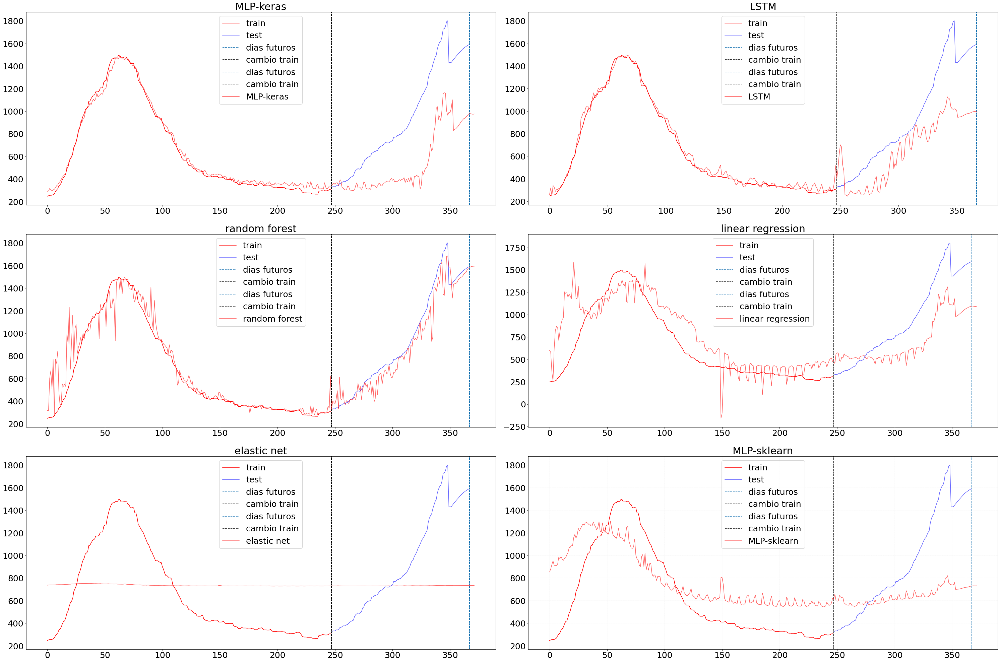

In [142]:
puntos_base = np.arange(len(y_train),len(y_train)+len(y_test),1)
matplotlib.rcParams["font.size"]= 25
fig, axs = plt.subplots(3, 2, figsize=(42,28))
axs = axs.flatten()
for idx,(prediccion,modelo) in enumerate(predicciones):
    axs[idx].plot(y_train,label="train", color = 'red')
    axs[idx].plot(puntos_base,y_test,label="test", color = 'blue', alpha = 0.6)
    axs[idx].axvline(idx_fecha_hoy,label="dias futuros",linestyle="--")
    axs[idx].axvline(len(trainPredict),label="cambio train",linestyle="--",color="k")
    axs[idx].axvline(idx_fecha_hoy,label="dias futuros",linestyle="--")
    axs[idx].axvline(len(trainPredict),label="cambio train",linestyle="--",color="k")
    axs[idx].set_title(modelo)
    axs[idx].plot(prediccion,label=modelo,color = 'red', alpha = 0.6)
    axs[idx].legend()
# plt.legend()
plt.grid(color='lightgrey', ls = '-.', lw = 0.2)
plt.tight_layout()
plt.savefig(r'E:\Udec\Magister\Tesis\Modelo\Datos de entrada\figuras\resumen2_metropolitana.pdf')